In [1]:
import numpy as np
from numpy import argsort
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import re
import os
import pickle
import joblib
from itertools import chain
import glob
import seaborn as sns
import matplotlib.font_manager as font_manager
import seaborn as sns
import matplotlib as mpl
from pytorch_tabnet.tab_model import TabNetRegressor
import torch
from keras.models import load_model
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import VotingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor, Pool
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import RandomizedSearchCV
from collections import Counter
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten
from sklearn.model_selection import GridSearchCV
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_absolute_percentage_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pandas.plotting import register_matplotlib_converters
import warnings
warnings.filterwarnings('ignore')
register_matplotlib_converters()
sns.set_theme()
mpl.matplotlib_fname()
font_dirs = ['D:\\Software\\Anaconda\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf' ]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
for font_file in font_files:
    font_manager.fontManager.addfont(font_file)
mpl.font_manager._rebuild()
result = font_manager.findfont("Rounded Mplus 1c")
print(result)
mpl.rc('font', family='Rounded Mplus 1c')


le = LabelEncoder()
ss = StandardScaler()
mms = MinMaxScaler()

Matplotlib is building the font cache; this may take a moment.


D:\Software\Anaconda\Lib\site-packages\matplotlib\mpl-data\fonts\ttf\MPLUSRounded1c-Regular.ttf


In [2]:
names = ["Gradient_Boosting", "Decision_Tree", "Extra_Trees", "Random_Forest","XGBoost","LGBMRegressor"]
models = [
    GradientBoostingRegressor(),
    DecisionTreeRegressor(max_depth=5),
    ExtraTreesRegressor(),
    RandomForestRegressor(),
    XGBRegressor(),
    LGBMRegressor()]

In [3]:
df = pd.read_csv('Kaiho_merged_data.csv')

In [4]:
df.columns

Index(['Vị trí_ロケーション', 'Ngày sản xuất_生産日', 'Tháng sản xuất_生産月',
       'Năm sản xuất_生産年', 'Nv sản xuất_生産担当者', 'Số nhập kho_入庫番号',
       'Nguồn nhập hàng_仕入先', 'Mã loại phụ tùng_商品コード', 'Tên phụ tùng_商品名',
       'Số nhập kho(phụ tùng)_入庫番号 (部品)', 'Tên xe_車名', 'Model xe_車輌型式',
       'Engine model_エンジン型式', 'Số lượng_数量_PARTS', 'Tổng giá nhập_仕入合計',
       'Số phút công_標準工数', 'Kết quả_生産高',
       'Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額',
       'Ước tính giá bán ra tại thời điểm sản xuất_生産時販売予測額',
       'Số lượng bán ra_販売数量', 'Thành tích bán ra_販売実績', 'Khách hàng_仕向先',
       'Truyền động 1_駆動1', 'TM_TM', 'Truyền động 2_駆動2', 'Chi tiết_詳細',
       'Số km đã chạy_走行距離', 'Năm sản xuất_年式', 'Tình trạng engine_エンジン状態',
       'Rank_ランク', 'Loại xe_車種', 'Tình trạng sản xuất_未生産',
       'Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額.1',
       'Số chỉ định loại_型式指定番号', 'Số phân loại danh mục_類別区分番号',
       'Đơn giá mua_仕入単価', 'Nhà sản xuất_メーカー', 'Giờ làm việc

In [77]:
customer = pd.Series(df['Khách hàng_仕向先'].dropna().unique())
unknown = pd.Series(['unknown'])
customer =  customer.append(unknown,ignore_index=True)
customer =  pd.DataFrame(customer)
customer.columns = ['customer']
customer.to_csv('customer.csv',index=False)

In [78]:
test = pd.read_csv("customer.csv")
test

,customer
0,SARRANSINGH'S AUTO LTD
1,木戸クンク・ジャイブ
2,㈱パシフィック・トレーディング・インターナショナル
3,西野 仮予約
4,FADEEV EVGENY
...,...
98,Revelem Enterprises Pvt Ltd.
99,㈱SBT ｴｽﾋﾞｰﾃｨｰ
100,"SINKAZU INDUSTRIAL(M) SDN, BHD"
101,"KAIHO SANGYO CO,(NIG)LTD."


In [437]:
df_group_model = df.groupby(['Model xe_車輌型式','Tháng sản xuất_生産月','Năm sản xuất_生産年'])['Thành tích bán ra_販売実績'].mean().reset_index()
df_group_model['month_year'] = df_group_model["Tháng sản xuất_生産月"].astype(str) +"/"+ df_group_model["Năm sản xuất_生産年"].astype(str)
df_group_model['month_year'] = pd.to_datetime(df_group_model['month_year'],format='%m/%Y')
df_group_model.drop(columns=["Tháng sản xuất_生産月","Năm sản xuất_生産年"],inplace=True)
pickle.dump(df_group_model,open("modelCar_by_month.pkl",'wb'))

In [438]:
df_group_engine = df.groupby(['Engine model_エンジン型式','Tháng sản xuất_生産月','Năm sản xuất_生産年'])['Thành tích bán ra_販売実績'].mean().reset_index()
df_group_engine['month_year'] = df_group_engine["Tháng sản xuất_生産月"].astype(str) +"/"+ df_group_engine["Năm sản xuất_生産年"].astype(str)
df_group_engine['month_year'] = pd.to_datetime(df_group_engine['month_year'],format='%m/%Y')
df_group_engine.drop(columns=["Tháng sản xuất_生産月","Năm sản xuất_生産年"],inplace=True)
pickle.dump(df_group_engine,open("engineModel_by_month.pkl",'wb'))

In [439]:
df_group_model_engine = df.groupby(['Model xe_車輌型式','Engine model_エンジン型式','Tháng sản xuất_生産月','Năm sản xuất_生産年'])['Thành tích bán ra_販売実績'].mean().reset_index()
df_group_model_engine['month_year'] = df_group_model_engine["Tháng sản xuất_生産月"].astype(str) +"/"+ df_group_model_engine["Năm sản xuất_生産年"].astype(str)
df_group_model_engine['month_year'] = pd.to_datetime(df_group_model_engine['month_year'],format='%m/%Y')
df_group_model_engine.drop(columns=["Tháng sản xuất_生産月","Năm sản xuất_生産年"],inplace=True)
pickle.dump(df_group_model_engine,open("modelCar_engineModel_by_month.pkl",'wb'))

In [435]:
df_group_model_engine

,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,month_year
0,1C8F4,CHRYSLER-T,30000.0,2016-06-01
1,1GCDL19,CHEV-4G,30000.0,2017-04-01
2,1GNEL19W,CHEV-4G,35000.0,2017-10-01
3,A05A,3A90,9000.0,2019-05-01
4,A32,VQ20DE,120000.0,2020-01-01
...,...,...,...,...
14223,ZZV50,1ZZ-FE,129000.0,2018-12-01
14224,ZZW30,1ZZ-FE,85000.0,2014-04-01
14225,ZZW30,1ZZ-FE,70000.0,2016-04-01
14226,ZZW30,1ZZ-FE,80000.0,2013-06-01


In [36]:
df_group = df.groupby(['Tên phụ tùng_商品名','Model xe_車輌型式','Engine model_エンジン型式']).agg(count =("Engine model_エンジン型式","count"))
df_group.reset_index().to_json("group_phutung.json",orient='records')

In [35]:
import json
from collections import defaultdict

results = defaultdict(lambda: defaultdict(dict))

for index, value in df_group.itertuples():
          for i, key in enumerate(index):
              if i == 0:
                  nested = results[key]
              elif i == len(index) - 1:
                  nested[key] = value
              else:
                  nested = nested[key]

json_file = json.dumps(results,ensure_ascii=False, indent=4)
jsonFile = open("data.json", "w", encoding='utf-8')
jsonFile.write(json_file)
jsonFile.close()

In [46]:
with open('data.json', 'r',encoding='utf-8') as myfile:
    data=myfile.read()
test =  json.loads(data)
len(test)

12

In [5]:
df['Tên phụ tùng_商品名'].unique()

array(['ノーズカット（個別）', 'エンジン', 'ＣＫＤ／コンプリート', 'Ｒアクスル（生/Ｄ）',
       'ＣＫＤ／コンプリート（バイヤー）', 'Ｆアクスル（生/Ｄ）', 'フェイスカット', '外装コンプリート',
       'フロントアクスル（個別）', 'リアアクスル（個別）', 'ミッション（個別）', 'リアホーシング（デフ無）（個別）'],
      dtype=object)

In [1020]:
Q1 = np.percentile(df['Thành tích bán ra_販売実績'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df['Thành tích bán ra_販売実績'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1

<AxesSubplot:xlabel='Năm bán hàng_売上年', ylabel='Thành tích bán ra_販売実績'>

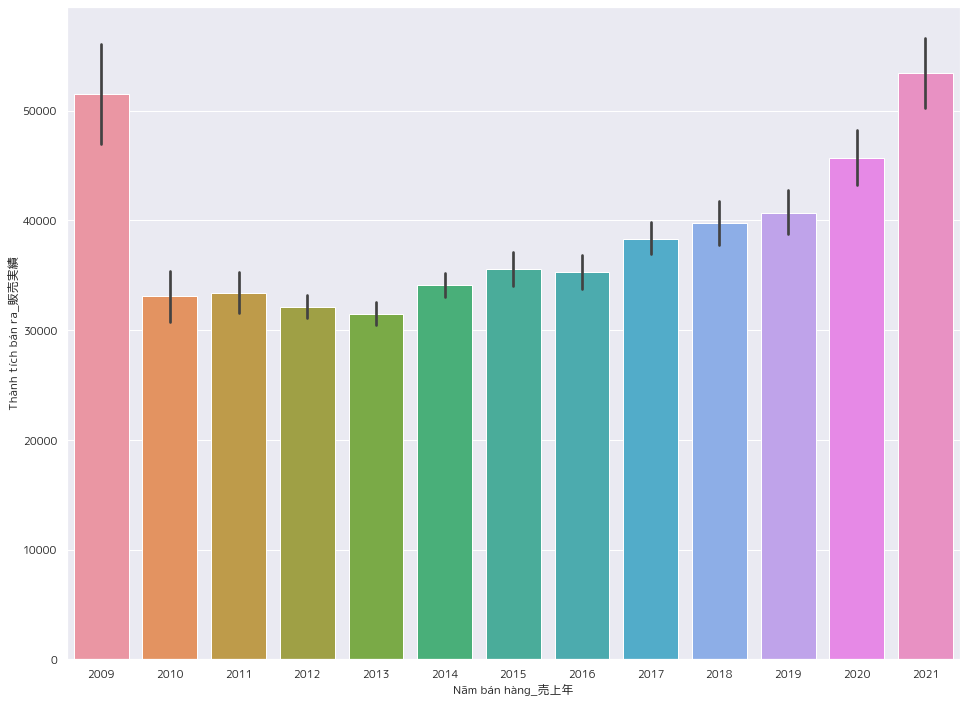

In [990]:
plt.figure(figsize=(16,12))
sns.barplot(x = 'Năm bán hàng_売上年',y='Thành tích bán ra_販売実績',data=df)

<AxesSubplot:xlabel='Thành tích bán ra_販売実績'>

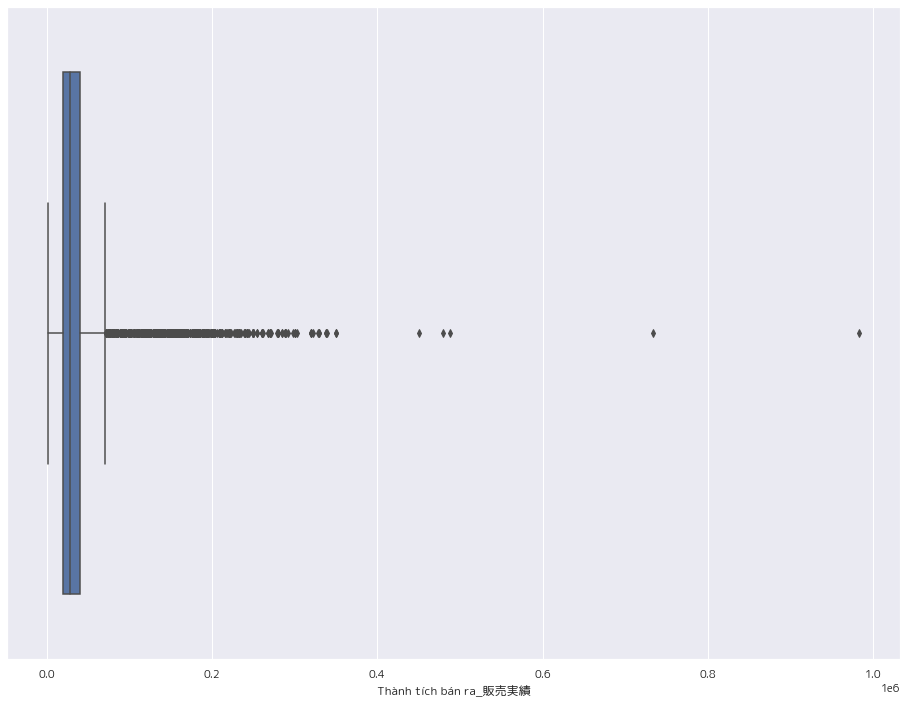

In [879]:
plt.figure(figsize=(16,12))
sns.boxplot(df['Thành tích bán ra_販売実績'])

In [882]:
df[['Thành tích bán ra_販売実績']].describe()

,Thành tích bán ra_販売実績
count,20428.000000
mean,37275.735779
std,36235.203778
min,1000.000000
25%,20000.000000
50%,28000.000000
75%,40000.000000
max,983600.000000


In [1021]:
df_outlier = df[(df['Thành tích bán ra_販売実績']  <= (Q3+1.5*IQR)) & (df['Thành tích bán ra_販売実績']  >= (Q1 -1.5*IQR))]
df_outlier.shape[0]

18058

In [1062]:
df_outlier['Tên phụ tùng_商品名'].value_counts()

エンジン                13717
ノーズカット（個別）           3522
Ｒアクスル（生/Ｄ）            389
フロントアクスル（個別）          158
リアアクスル（個別）            109
Ｆアクスル（生/Ｄ）             69
ＣＫＤ／コンプリート             64
ＣＫＤ／コンプリート（バイヤー）       13
フェイスカット                 8
外装コンプリート                6
ミッション（個別）               2
リアホーシング（デフ無）（個別）        1
Name: Tên phụ tùng_商品名, dtype: int64

In [1063]:
X_train['Tên phụ tùng_商品名'].value_counts()

0     9508
1     2530
11     279
3      121
5       86
8       51
10      48
9        7
2        5
7        4
6        1
Name: Tên phụ tùng_商品名, dtype: int64

In [1065]:
X_test['Tên phụ tùng_商品名'].value_counts()

0     4209
1      992
11     110
3       37
5       23
10      21
8       13
9        6
2        3
4        2
7        2
Name: Tên phụ tùng_商品名, dtype: int64

<AxesSubplot:xlabel='Năm bán hàng_売上年', ylabel='Thành tích bán ra_販売実績'>

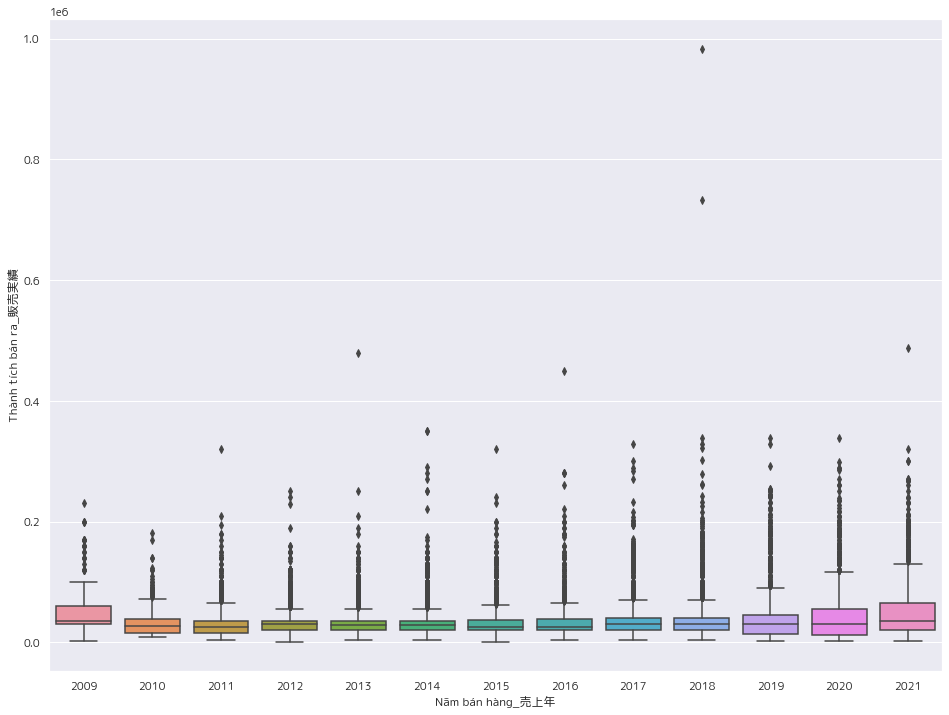

In [878]:
plt.figure(figsize=(16,12))
sns.boxplot(x = 'Năm bán hàng_売上年',y='Thành tích bán ra_販売実績',data=df)

# Get SHAP Value

In [4]:
df_shap  = df.copy()

In [5]:
for col in df_shap.columns[df_shap.dtypes == object]:
    print(col, df_shap[col].nunique())
    df_shap[col] = df_shap[col].fillna("unknown")
    df_shap[col] = le.fit_transform(df_shap[col].values)

for col in df_shap.columns[df_shap.dtypes == 'float64']:
    df_shap.fillna(df_shap[col].mean(), inplace=True)

Vị trí_ロケーション 3
Nv sản xuất_生産担当者 46
Số nhập kho_入庫番号 18377
Nguồn nhập hàng_仕入先 2852
Mã loại phụ tùng_商品コード 12
Tên phụ tùng_商品名 12
Số nhập kho(phụ tùng)_入庫番号 (部品) 20428
Tên xe_車名 496
Model xe_車輌型式 1587
Engine model_エンジン型式 536
Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額 163
Khách hàng_仕向先 102
Truyền động 1_駆動1 4
TM_TM 3
Truyền động 2_駆動2 3
Chi tiết_詳細 2235
Rank_ランク 12
Loại xe_車種 8
Tình trạng sản xuất_未生産 1
Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額.1 162
Nhà sản xuất_メーカー 27
Chi tiết xếp hạng_ランク詳細 1728
Số body_車体番号 18090
CONTAINER_CONTAINER 3
Tên khách hàng_売上先名 45
D/G_Ｄ／Ｇ 2
Đang tải nguồn_積込元 5


In [6]:
data_shap =df_shap.drop(columns = ['Thành tích bán ra_販売実績','Đơn giá bán hàng_売上単価','Sản lượng bán ra_売上金額','Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額','Ước tính giá bán ra tại thời điểm sản xuất_生産時販売予測額','Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額.1','Tổng giá nhập_仕入合計','Tên phụ tùng_商品名','Model xe_車輌型式','Engine model_エンジン型式','Số phiếu_伝票番号','Số nhập kho_入庫番号','Số nhập kho(phụ tùng)_入庫番号 (部品)'])
target_shap =df_shap['Thành tích bán ra_販売実績']

x_train,x_test,y_train_shap,y_test_shap = train_test_split (data_shap, target_shap, test_size=0.3,random_state=42)

In [7]:
xgr = XGBRegressor()
xgr.fit(x_train, y_train_shap)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [8]:
import shap
shap.initjs()
exp = shap.TreeExplainer(xgr)
vals = exp.shap_values(data_shap)

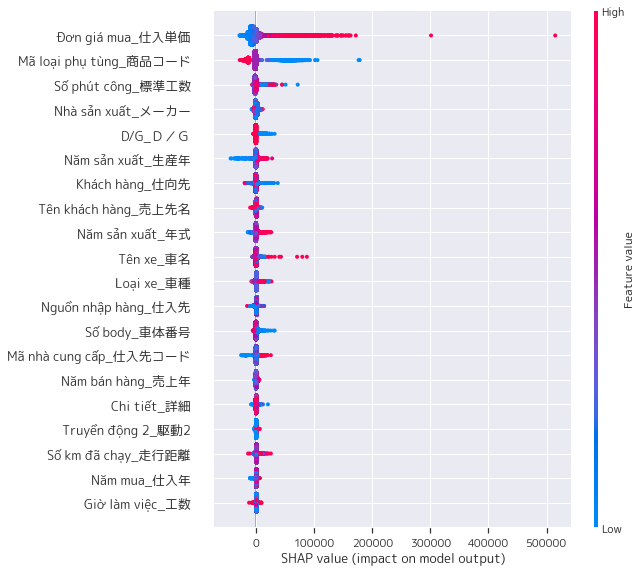

In [9]:
shap.summary_plot(vals, data_shap)

In [249]:
# df_group_mean =  df.groupby(['Tên phụ tùng_商品名','Model xe_車輌型式','Engine model_エンジン型式']).agg(mean = ('Thành tích bán ra_販売実績','mean')).reset_index()

df_group_mean =  df.groupby(['Model xe_車輌型式','Engine model_エンジン型式']).agg(mean = ('Thành tích bán ra_販売実績','mean')).reset_index()
# df_group_mean.to_csv("mean_sell_hybrid.csv",index=False)

# df_group_mean =  df_outlier.groupby(['Tên phụ tùng_商品名','Model xe_車輌型式','Engine model_エンジン型式']).agg(mean = ('Thành tích bán ra_販売実績','mean')).reset_index()

In [44]:
df_group_mean_model_xe =  df.groupby(['Model xe_車輌型式']).agg(mean = ('Thành tích bán ra_販売実績','mean')).reset_index()
df_group_mean_model_xe.to_csv("mean_sell_model_car.csv",index=False)

In [45]:
df_group_mean_engine =  df.groupby(['Engine model_エンジン型式']).agg(mean = ('Thành tích bán ra_販売実績','mean')).reset_index()
df_group_mean_engine.to_csv("mean_sell_engine_model.csv",index=False)

In [3141]:
df.columns

Index(['Vị trí_ロケーション', 'Ngày sản xuất_生産日', 'Tháng sản xuất_生産月',
       'Năm sản xuất_生産年', 'Nv sản xuất_生産担当者', 'Số nhập kho_入庫番号',
       'Nguồn nhập hàng_仕入先', 'Mã loại phụ tùng_商品コード', 'Tên phụ tùng_商品名',
       'Số nhập kho(phụ tùng)_入庫番号 (部品)', 'Tên xe_車名', 'Model xe_車輌型式',
       'Engine model_エンジン型式', 'Số lượng_数量_PARTS', 'Tổng giá nhập_仕入合計',
       'Số phút công_標準工数', 'Kết quả_生産高',
       'Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額',
       'Ước tính giá bán ra tại thời điểm sản xuất_生産時販売予測額',
       'Số lượng bán ra_販売数量', 'Thành tích bán ra_販売実績', 'Khách hàng_仕向先',
       'Truyền động 1_駆動1', 'TM_TM', 'Truyền động 2_駆動2', 'Chi tiết_詳細',
       'Số km đã chạy_走行距離', 'Năm sản xuất_年式', 'Tình trạng engine_エンジン状態',
       'Rank_ランク', 'Loại xe_車種', 'Tình trạng sản xuất_未生産',
       'Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額.1',
       'Số chỉ định loại_型式指定番号', 'Số phân loại danh mục_類別区分番号',
       'Đơn giá mua_仕入単価', 'Nhà sản xuất_メーカー', 'Giờ làm việc

In [250]:
df['date_time']  = df['Năm bán hàng_売上年'].astype(str) +'-'+df['Tháng bán hàng_売上月'].astype(str) 

In [272]:
df_copy = df.copy()
# df_copy = df_outlier.copy()

In [273]:
# df_copy = pd.merge(df_copy,df_group_mean, on=['Engine model_エンジン型式','Tên phụ tùng_商品名','Model xe_車輌型式'],how='outer')
df_copy = pd.merge(df_copy,df_group_mean, on=['Engine model_エンジン型式','Model xe_車輌型式'],how='outer')

# df_copy = pd.merge(df_copy,df_group_mean_model_xe, on=['Model xe_車輌型式'],how='outer')
# df_copy = pd.merge(df_copy,df_group_mean_engine, on=['Engine model_エンジン型式'],how='outer')


df_copy

,Vị trí_ロケーション,Ngày sản xuất_生産日,Tháng sản xuất_生産月,Năm sản xuất_生産年,Nv sản xuất_生産担当者,Số nhập kho_入庫番号,Nguồn nhập hàng_仕入先,Mã loại phụ tùng_商品コード,Tên phụ tùng_商品名,Số nhập kho(phụ tùng)_入庫番号 (部品),...,Số body_車体番号,CONTAINER_CONTAINER,Tên khách hàng_売上先名,Phân loại mang đến/đón_持込・引取区分,Tiền công_工賃,D/G_Ｄ／Ｇ,Phân loại bán hàng_売上分類,Đang tải nguồn_積込元,date_time,mean
0,会宝産業本社,17,11,2015,山下大輝,'0000000302676,西田 敏勝,'110010,ノーズカット（個別）,'0000007988203,...,'1001019,NaN,"一番オート OOO ""LIGHT VL""",NaN,0.0,G,NaN,会宝産業本社,2016-3,12000.000000
1,会宝産業本社,3,2,2015,中嶋 修,'0000000303771,ｴｻﾞｼ自動車,'100000,エンジン,'0000007739581,...,'6062039,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,2015-2,39556.053812
2,会宝産業本社,3,2,2015,楊 志毅,'0000000303771,ｴｻﾞｼ自動車,'110010,ノーズカット（個別）,'0000007712751,...,'6062039,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,2015-2,39556.053812
3,会宝産業本社,10,7,2015,山下宣浩,'0000000322487,サンドコーポレーション,'100000,エンジン,'0000007911189,...,'6059292,20,PACIFIC ALLIANCE CO LTD ﾛｼｱ ﾀﾗｽ,NaN,0.0,G,NaN,会宝産業本社,2015-8,39556.053812
4,会宝産業本社,10,7,2015,高田憲明,'0000000323812,サンドコーポレーション,'100000,エンジン,'0000007911572,...,'6043722,20,㈱パシフィック・トレーディング・インターナショナル,NaN,0.0,G,NaN,会宝産業本社,2015-7,39556.053812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20423,会宝産業本社,15,12,2012,瀬戸誠路,'0000000303068,ＭＤＫトレーディング,'100000,エンジン,'0000007142515,...,'002336,20,㈱パシフィック・トレーディング・インターナショナル,NaN,0.0,G,NaN,会宝産業本社,2013-2,40000.000000
20424,会宝産業本社,7,4,2020,坂尻僚平,'0000000409608,カナカン株式会社,'140092,Ｆアクスル（生/Ｄ）,'0000004642838,...,'204214,40HC,FADEEV EVGENY,NaN,0.0,D,NaN,会宝産業本社,2020-5,3500.000000
20425,会宝産業本社,6,2,2019,中嶋 裕,'0000000398828,住友三井オートサービス(株),'140470,フロントアクスル（個別）,'0000004365064,...,'200487,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,D,NaN,会宝産業本社,2019-3,3500.000000
20426,会宝産業本社,6,2,2019,中嶋 裕,'0000000398828,住友三井オートサービス(株),'140153,Ｒアクスル（生/Ｄ）,'0000004365066,...,'200487,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,D,NaN,会宝産業本社,2019-3,3500.000000


In [327]:
list_feature = [
                'Tên phụ tùng_商品名',
#                 'Tên xe_車名',
                'Model xe_車輌型式',
                'Engine model_エンジン型式',
                'Thành tích bán ra_販売実績',
                'Khách hàng_仕向先',
                'Tháng bán hàng_売上月',
                 'mean',
                 'mean_auction',
                'Năm bán hàng_売上年',

               ]

list_feature_with_model_xe = [ 'Tên phụ tùng_商品名',
                'Model xe_車輌型式',
                'Thành tích bán ra_販売実績',
#                 'Khách hàng_仕向先',
                'Tháng bán hàng_売上月',
                 'mean',
                 'mean_auction',
                'Năm bán hàng_売上年']

list_feature_with_engine = [ 'Tên phụ tùng_商品名',
                'Engine model_エンジン型式',
                'Thành tích bán ra_販売実績',
#                 'Khách hàng_仕向先',
                'Tháng bán hàng_売上月',
                 'mean',
                 'mean_auction',
                'Năm bán hàng_売上年']

In [328]:
# df_group_month = df_copy.groupby(list_feature).agg(revenue = ('Thành tích bán ra_販売実績','sum')).reset_index()
# df_group_month = df_copy[list_feature]

df_group_month = df_join_auction[list_feature]
# df_group_month = df_join_auction_model_xe[list_feature_with_model_xe]
# df_group_month = df_join_auction_engine[list_feature_with_engine]



# df_group_month = df_merge_count[list_feature]

In [329]:
# df_group_month = df_group_month.sort_values(by=['date_time'])
df_group_month

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,mean_auction,Năm bán hàng_売上年
0,ノーズカット（個別）,ES9,LDA-MF5,12000.0,SARRANSINGH'S AUTO LTD,3,12000.000000,NaN,2016
1,エンジン,AT211,7A-FE,30000.0,木戸クンク・ジャイブ,2,39556.053812,50511.400000,2015
2,ノーズカット（個別）,AT211,7A-FE,10000.0,木戸クンク・ジャイブ,2,39556.053812,50511.400000,2015
3,エンジン,AT211,7A-FE,30000.0,NaN,8,39556.053812,50511.400000,2015
4,エンジン,AT211,7A-FE,33000.0,NaN,7,39556.053812,50511.400000,2015
...,...,...,...,...,...,...,...,...,...
20423,エンジン,JLR50,VG33E,40000.0,西野 仮予約,2,40000.000000,2000.000000,2013
20424,Ｆアクスル（生/Ｄ）,SKF2V,RF-T EFI,3500.0,FADEEV EVGENY,5,3500.000000,40017.000000,2020
20425,フロントアクスル（個別）,SKF2MN,RF,2000.0,木戸クンク・ジャイブ,3,3500.000000,39032.833333,2019
20426,Ｒアクスル（生/Ｄ）,SKF2MN,RF,5000.0,木戸クンク・ジャイブ,3,3500.000000,39032.833333,2019


In [330]:
for col in df_group_month.columns[df_group_month.dtypes == object]:
    print(col, df_group_month[col].nunique())
    df_group_month[col] = df_group_month[col].fillna("unknown")
    df_group_month[col] = le.fit_transform(df_group_month[col].values)

for col in df_group_month.columns[df_group_month.dtypes == 'float64']:
    df_group_month.fillna(df_group_month[col].mean(), inplace=True)
#     df_group_month.fillna(value=0, inplace=True)

Tên phụ tùng_商品名 12
Model xe_車輌型式 1587
Engine model_エンジン型式 536
Khách hàng_仕向先 102


In [331]:
# df_group_month.date_time.unique()
df_group_month

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,mean_auction,Năm bán hàng_売上年
0,1,370,386,12000.0,65,3,12000.000000,37275.735779,2016
1,0,73,156,30000.0,95,2,39556.053812,50511.400000,2015
2,1,73,156,10000.0,95,2,39556.053812,50511.400000,2015
3,0,73,156,30000.0,82,8,39556.053812,50511.400000,2015
4,0,73,156,33000.0,82,7,39556.053812,50511.400000,2015
...,...,...,...,...,...,...,...,...,...
20423,0,655,463,40000.0,99,2,40000.000000,2000.000000,2013
20424,10,1177,438,3500.0,23,5,3500.000000,40017.000000,2020
20425,3,1175,436,2000.0,95,3,3500.000000,39032.833333,2019
20426,11,1175,436,5000.0,95,3,3500.000000,39032.833333,2019


In [332]:
df_scaler = pd.DataFrame(mms.fit_transform(df_group_month), columns=df_group_month.columns)

In [333]:
# target = df_scaler['Thành tích bán ra_販売実績']
target = df_group_month['Thành tích bán ra_販売実績']
# df_target = df_group_month[['Thành tích bán ra_販売実績']]

In [334]:
# data = df_scaler.drop(columns=['Thành tích bán ra_販売実績','mean'])
data = df_group_month.drop(columns=['Thành tích bán ra_販売実績'])
# data = df_group_month.drop(columns=['Thành tích bán ra_販売実績','mean'])
# data = df_group_month.drop(columns=['Thành tích bán ra_販売実績','mean','Khách hàng_仕向先'])
# data = df_group_month.drop(columns=['Thành tích bán ra_販売実績','Khách hàng_仕向先'])

In [335]:
X_train, X_test, y_train, y_test =  train_test_split(data, target, test_size= 0.3, random_state=42)

# train = df_group_month[df_group_month['Năm bán hàng_売上年'] <= 2016]
# val = df_group_month[(df_group_month['Năm bán hàng_売上年'] > 2016) & (df_group_month['Năm bán hàng_売上年'] <=2018)]
# test = df_group_month[ df_group_month['Năm bán hàng_売上年'] > 2018]

# test['check_app']  = test.apply(lambda x: 'Yes' if x['Model xe_車輌型式'] in set(train['Model xe_車輌型式']) and x['Engine model_エンジン型式'] in set(train['Engine model_エンジン型式']) else 'No',axis= 1)
# val['check_app']  = val.apply(lambda x: 'Yes' if x['Model xe_車輌型式'] in set(train['Model xe_車輌型式']) and x['Engine model_エンジン型式'] in set(train['Engine model_エンジン型式']) else 'No',axis= 1)

# test = test[test.check_app == 'Yes']
# val = val[val.check_app =='Yes']

# test.drop(columns=['check_app'],inplace=True)
# val.drop(columns=['check_app'],inplace=True)

# X_train, y_train = train.drop(columns=['Thành tích bán ra_販売実績']), train['Thành tích bán ra_販売実績']
# X_val, y_val = val.drop(columns=['Thành tích bán ra_販売実績']), val['Thành tích bán ra_販売実績']
# X_test,y_test = test.drop(columns=['Thành tích bán ra_販売実績']), test['Thành tích bán ra_販売実績']

# X_train, y_train = train.drop(columns=['Thành tích bán ra_販売実績']), train['Thành tích bán ra_販売実績']
# X_val, y_val = val.drop(columns=['Thành tích bán ra_販売実績']), val['Thành tích bán ra_販売実績']
# X_test,y_test = test.drop(columns=['Thành tích bán ra_販売実績']), test['Thành tích bán ra_販売実績']

In [336]:
X_train

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,mean_auction,Năm bán hàng_売上年
7417,0,253,111,3,8,39722.222222,23013.000000,2012
5118,0,782,377,100,6,32453.750000,13344.000000,2014
2231,0,446,372,8,6,19284.810127,12290.578512,2018
6309,0,1241,71,4,9,38745.609756,38993.911765,2020
18453,0,424,329,72,6,15714.285714,16380.000000,2017
...,...,...,...,...,...,...,...,...
11284,0,1461,419,23,3,25656.716418,30935.400000,2016
11964,0,908,23,23,12,32980.952381,73238.990431,2017
5390,0,45,228,95,4,17885.207101,32195.943548,2021
860,0,125,269,3,2,33966.666667,32830.500000,2012


In [337]:
X_test

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,mean_auction,Năm bán hàng_売上年
11876,0,686,12,95,2,31043.478261,37275.735779,2016
6735,8,1047,178,23,4,68659.204545,51793.000000,2009
12902,0,119,266,78,8,25736.842105,16903.666667,2012
19893,0,548,5,76,9,28000.000000,37275.735779,2009
20269,0,1259,370,78,8,32000.000000,37275.735779,2013
...,...,...,...,...,...,...,...,...
17288,8,25,31,7,11,272800.000000,87390.500000,2018
16615,0,942,23,88,3,32454.545455,37436.550000,2019
7638,1,34,85,88,6,43182.608696,45936.956522,2014
8361,8,1234,71,37,6,39333.333333,51125.428571,2019


In [338]:
rmse = []
mape = []
r_squared = []
for  model in models:
    model.fit(X_train, y_train)
    y_pred  = model.predict(X_test)
#     print(y_pred)
    rmse_score = mean_squared_error(y_test, y_pred,squared=False)
    mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
#     mape_score = mean_absolute_percentage_error(y_test,y_pred)
    print(mape_score)
    r_squared_score  = model.score(X_test,y_test)
    r_squared.append(r_squared_score)
    rmse.append(rmse_score)
    mape.append(mape_score)

22.7918276301867
20.542688599010667
10.960958121806334
11.408103601181468
16.660282578787243
16.357069508067116


In [339]:
df_score = pd.DataFrame()
df_score['MODELS'] = names
df_score['R_SQUARED'] = r_squared
df_score['RMSE'] = rmse
df_score['MAPE'] = mape
df_score['RMSE'] = round(df_score['RMSE'],3)
df_score['MAPE'] = round(df_score['MAPE'],3)
df_score['R_SQUARED'] = round(df_score['R_SQUARED'],3)

df_score

,MODELS,R_SQUARED,RMSE,MAPE
0,Gradient_Boosting,0.879,12215.971,22.792
1,Decision_Tree,0.851,13540.534,20.543
2,Extra_Trees,0.913,10346.861,10.961
3,Random_Forest,0.921,9887.909,11.408
4,XGBoost,0.906,10747.934,16.660
5,LGBMRegressor,0.902,11007.195,16.357


In [266]:
# mean_absolute_percentage_error(y_test,X_test['mean'])
mean_absolute_percentage_error(y_test,X_test['mean'])

0.7181654781885892

In [3096]:
X_test['mean']

38       33234.693878
61       33234.693878
128      33234.693878
226      10131.868132
230      10131.868132
             ...     
20413     5000.000000
20414     2000.000000
20415     3500.000000
20416     3000.000000
20417     3500.000000
Name: mean, Length: 4206, dtype: float64

# Random Forest

In [82]:
model = RandomForestRegressor()
model.fit(X_train,y_train)

RandomForestRegressor()

In [83]:
mean_absolute_percentage_error(y_test,model.predict(X_test))

0.13354783065654335

In [84]:
pickle.dump(model,open("modelcar_mean_meanAuction_random.pkl",'wb'))

# Extra Tree

In [105]:
le_year = LabelEncoder()

In [106]:
# X_train['Năm bán hàng_売上年'] = le_year.fit_transform(X_train['Năm bán hàng_売上年'])

In [318]:
model = ExtraTreesRegressor()
model.fit(X_train,y_train)

ExtraTreesRegressor()

In [319]:
mean_absolute_percentage_error(y_test,model.predict(X_test))

0.1283514441463749

In [320]:
pickle.dump(model,open("modelCar_engineModel_mean_meanAuction_extra.pkl",'wb'))

In [352]:
le_name = LabelEncoder()
le_model = LabelEncoder()
le_engine =  LabelEncoder()
le_customer = LabelEncoder()
le_name.fit(df['Tên phụ tùng_商品名'])
le_model.fit(df['Model xe_車輌型式'])
le_engine.fit(df['Engine model_エンジン型式'])
le_customer.fit(df['Khách hàng_仕向先'])

LabelEncoder()

In [1223]:
le_name.classes_

array(['エンジン', 'ノーズカット（個別）', 'フェイスカット', 'フロントアクスル（個別）', 'ミッション（個別）',
       'リアアクスル（個別）', 'リアホーシング（デフ無）（個別）', '外装コンプリート', 'ＣＫＤ／コンプリート',
       'ＣＫＤ／コンプリート（バイヤー）', 'Ｆアクスル（生/Ｄ）', 'Ｒアクスル（生/Ｄ）'], dtype=object)

In [1224]:
le_model.classes_

array(['1C8F4', '1GCDL19', '1GNEL19W', ..., 'ZZV50', 'ZZW30', nan],
      dtype=object)

In [1225]:
model.predict([[le_name.transform(['エンジン']),le_model.transform(['ZZV50']),le_engine.transform(['CGA3-DE']),12, 2021]])
# model.predict([[le_name.transform(['エンジン']),le_model.transform(['ZZV50']),le_engine.transform(['CGA3-DE']),9]])

ValueError: X has 5 features, but ExtraTreeRegressor is expecting 7 features as input.

In [1017]:
# Extra Tree

# XGBoost

In [1049]:
params = { 'max_depth': [3, 5, 6, 10, 15, 20],
           'learning_rate': [0.01, 0.1, 0.2, 0.3],
           'subsample': np.arange(0.5, 1.0, 0.1),
           'colsample_bytree': np.arange(0.4, 1.0, 0.1),
           'colsample_bylevel': np.arange(0.4, 1.0, 0.1),
           'n_estimators': [100, 500, 1000]}

In [1050]:
xgbr = XGBRegressor(seed = 20)
clf = RandomizedSearchCV(estimator=xgbr,
                         param_distributions=params,
                         scoring='neg_mean_squared_error',
                         n_iter=25,
                         verbose=1)
clf.fit(X_train, y_train)
print("Best parameters:", clf.best_params_)
print("Lowest RMSE: ", (-clf.best_score_)**(1/2.0))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best parameters: {'subsample': 0.7999999999999999, 'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.01, 'colsample_bytree': 0.8999999999999999, 'colsample_bylevel': 0.8999999999999999}
Lowest RMSE:  4832.943108476726


In [1052]:
model_best = XGBRegressor (subsample =  0.7999999999999999, n_estimators = 1000, max_depth= 10, learning_rate =  0.01, colsample_bytree = 0.8999999999999999, colsample_bylevel = 0.8999999999999999,objective='reg:squarederror')

In [1053]:
model_best.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree',
             colsample_bylevel=0.8999999999999999, colsample_bynode=1,
             colsample_bytree=0.8999999999999999, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.01, max_delta_step=0,
             max_depth=10, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.7999999999999999,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [1054]:
y_pred = model_best.predict(X_test)
print('MAPE: %.3f'%(mean_absolute_percentage_error(y_test,y_pred)))

MAPE: 0.130


In [526]:
model.predict([[le_name.transform(['エンジン']),le_model.transform(['ZZV50']),le_engine.transform(['CGA3-DE']),12,2023]])


array([26930.61879762])

# Catboost

In [1226]:
model = CatBoostRegressor(loss_function='RMSE',depth=8,l2_leaf_reg=3, iterations = 2000, learning_rate = 0.1)
model.fit(train_dataset)

0:	learn: 9075.9154658	total: 4.55ms	remaining: 9.1s
1:	learn: 8485.3402586	total: 8.82ms	remaining: 8.81s
2:	learn: 7956.1968777	total: 12.7ms	remaining: 8.42s
3:	learn: 7519.0559241	total: 16.4ms	remaining: 8.19s
4:	learn: 7120.9906087	total: 18.3ms	remaining: 7.32s
5:	learn: 6804.9124875	total: 19.9ms	remaining: 6.61s
6:	learn: 6515.6804964	total: 23.5ms	remaining: 6.7s
7:	learn: 6236.2107393	total: 27.4ms	remaining: 6.83s
8:	learn: 6008.3537685	total: 31.6ms	remaining: 6.98s
9:	learn: 5796.1716537	total: 35.9ms	remaining: 7.14s
10:	learn: 5620.1220070	total: 40.3ms	remaining: 7.28s
11:	learn: 5472.8923458	total: 44.1ms	remaining: 7.31s
12:	learn: 5334.7764610	total: 47.8ms	remaining: 7.3s
13:	learn: 5241.3784043	total: 50.1ms	remaining: 7.1s
14:	learn: 5144.4774518	total: 53.7ms	remaining: 7.11s
15:	learn: 5056.2686986	total: 57.4ms	remaining: 7.12s
16:	learn: 4971.9540153	total: 61ms	remaining: 7.11s
17:	learn: 4908.8465190	total: 64.5ms	remaining: 7.1s
18:	learn: 4851.3989162	tot

153:	learn: 3531.8081145	total: 555ms	remaining: 6.65s
154:	learn: 3528.5919514	total: 558ms	remaining: 6.65s
155:	learn: 3523.8102888	total: 562ms	remaining: 6.65s
156:	learn: 3521.4901365	total: 566ms	remaining: 6.64s
157:	learn: 3515.2837953	total: 570ms	remaining: 6.64s
158:	learn: 3512.0334096	total: 573ms	remaining: 6.64s
159:	learn: 3507.8074285	total: 577ms	remaining: 6.63s
160:	learn: 3503.7160271	total: 581ms	remaining: 6.64s
161:	learn: 3500.0034634	total: 585ms	remaining: 6.64s
162:	learn: 3497.3110960	total: 589ms	remaining: 6.64s
163:	learn: 3494.0746952	total: 593ms	remaining: 6.64s
164:	learn: 3489.5042526	total: 597ms	remaining: 6.64s
165:	learn: 3486.1481734	total: 600ms	remaining: 6.63s
166:	learn: 3482.3744232	total: 604ms	remaining: 6.63s
167:	learn: 3478.3800616	total: 608ms	remaining: 6.63s
168:	learn: 3475.2694158	total: 612ms	remaining: 6.63s
169:	learn: 3470.7848193	total: 616ms	remaining: 6.63s
170:	learn: 3468.6630789	total: 620ms	remaining: 6.63s
171:	learn

348:	learn: 3083.9641599	total: 1.28s	remaining: 6.07s
349:	learn: 3082.7648195	total: 1.29s	remaining: 6.06s
350:	learn: 3081.0674880	total: 1.29s	remaining: 6.06s
351:	learn: 3079.1654292	total: 1.29s	remaining: 6.06s
352:	learn: 3077.8995213	total: 1.3s	remaining: 6.05s
353:	learn: 3075.6919481	total: 1.3s	remaining: 6.05s
354:	learn: 3074.1227453	total: 1.3s	remaining: 6.05s
355:	learn: 3072.6562991	total: 1.31s	remaining: 6.04s
356:	learn: 3070.9060916	total: 1.31s	remaining: 6.04s
357:	learn: 3069.0607163	total: 1.31s	remaining: 6.03s
358:	learn: 3068.1060542	total: 1.32s	remaining: 6.03s
359:	learn: 3066.3518382	total: 1.32s	remaining: 6.03s
360:	learn: 3063.6373547	total: 1.33s	remaining: 6.02s
361:	learn: 3062.5785955	total: 1.33s	remaining: 6.02s
362:	learn: 3061.6288262	total: 1.33s	remaining: 6.01s
363:	learn: 3060.9146660	total: 1.34s	remaining: 6.01s
364:	learn: 3059.7685741	total: 1.34s	remaining: 6s
365:	learn: 3057.8327083	total: 1.34s	remaining: 6s
366:	learn: 3055.94

501:	learn: 2890.0615588	total: 1.83s	remaining: 5.46s
502:	learn: 2888.9730861	total: 1.83s	remaining: 5.46s
503:	learn: 2887.8889382	total: 1.84s	remaining: 5.46s
504:	learn: 2886.6455811	total: 1.84s	remaining: 5.46s
505:	learn: 2885.6966815	total: 1.85s	remaining: 5.45s
506:	learn: 2884.7229091	total: 1.85s	remaining: 5.45s
507:	learn: 2883.8415443	total: 1.85s	remaining: 5.44s
508:	learn: 2882.1938288	total: 1.86s	remaining: 5.44s
509:	learn: 2881.1530419	total: 1.86s	remaining: 5.44s
510:	learn: 2880.4205995	total: 1.86s	remaining: 5.43s
511:	learn: 2879.8776429	total: 1.87s	remaining: 5.43s
512:	learn: 2878.5134638	total: 1.87s	remaining: 5.42s
513:	learn: 2877.1478642	total: 1.88s	remaining: 5.42s
514:	learn: 2876.2662727	total: 1.88s	remaining: 5.42s
515:	learn: 2875.2160289	total: 1.88s	remaining: 5.41s
516:	learn: 2873.5651537	total: 1.89s	remaining: 5.41s
517:	learn: 2872.6236576	total: 1.89s	remaining: 5.4s
518:	learn: 2871.0922778	total: 1.89s	remaining: 5.4s
519:	learn: 

654:	learn: 2740.3023220	total: 2.38s	remaining: 4.88s
655:	learn: 2739.4943824	total: 2.38s	remaining: 4.88s
656:	learn: 2738.5623625	total: 2.38s	remaining: 4.88s
657:	learn: 2737.3377645	total: 2.39s	remaining: 4.87s
658:	learn: 2736.9278805	total: 2.39s	remaining: 4.87s
659:	learn: 2736.5631803	total: 2.4s	remaining: 4.87s
660:	learn: 2735.8343976	total: 2.4s	remaining: 4.86s
661:	learn: 2735.1857550	total: 2.4s	remaining: 4.86s
662:	learn: 2734.8491358	total: 2.41s	remaining: 4.86s
663:	learn: 2734.1898008	total: 2.41s	remaining: 4.85s
664:	learn: 2733.0254039	total: 2.41s	remaining: 4.85s
665:	learn: 2732.4113218	total: 2.42s	remaining: 4.84s
666:	learn: 2731.2760221	total: 2.42s	remaining: 4.84s
667:	learn: 2730.5745405	total: 2.42s	remaining: 4.84s
668:	learn: 2729.7965197	total: 2.43s	remaining: 4.83s
669:	learn: 2728.6959720	total: 2.43s	remaining: 4.83s
670:	learn: 2727.4437872	total: 2.44s	remaining: 4.82s
671:	learn: 2726.6901920	total: 2.44s	remaining: 4.82s
672:	learn: 2

804:	learn: 2627.0340977	total: 2.92s	remaining: 4.34s
805:	learn: 2626.4814600	total: 2.93s	remaining: 4.34s
806:	learn: 2625.8854468	total: 2.93s	remaining: 4.33s
807:	learn: 2625.2658228	total: 2.94s	remaining: 4.33s
808:	learn: 2624.8463316	total: 2.94s	remaining: 4.33s
809:	learn: 2624.5266486	total: 2.94s	remaining: 4.33s
810:	learn: 2623.9269819	total: 2.95s	remaining: 4.32s
811:	learn: 2623.4265060	total: 2.95s	remaining: 4.32s
812:	learn: 2622.6442963	total: 2.96s	remaining: 4.32s
813:	learn: 2622.1958868	total: 2.96s	remaining: 4.31s
814:	learn: 2621.6346735	total: 2.96s	remaining: 4.31s
815:	learn: 2620.7463398	total: 2.97s	remaining: 4.31s
816:	learn: 2620.3004033	total: 2.97s	remaining: 4.3s
817:	learn: 2619.4766529	total: 2.98s	remaining: 4.3s
818:	learn: 2619.2678495	total: 2.98s	remaining: 4.3s
819:	learn: 2618.3584899	total: 2.98s	remaining: 4.29s
820:	learn: 2617.3955293	total: 2.99s	remaining: 4.29s
821:	learn: 2616.7104304	total: 2.99s	remaining: 4.29s
822:	learn: 2

990:	learn: 2510.3138726	total: 3.65s	remaining: 3.72s
991:	learn: 2509.7253440	total: 3.65s	remaining: 3.71s
992:	learn: 2509.1819247	total: 3.66s	remaining: 3.71s
993:	learn: 2508.8574393	total: 3.66s	remaining: 3.71s
994:	learn: 2508.0718921	total: 3.67s	remaining: 3.7s
995:	learn: 2507.5419364	total: 3.67s	remaining: 3.7s
996:	learn: 2506.8318704	total: 3.67s	remaining: 3.7s
997:	learn: 2506.5152545	total: 3.68s	remaining: 3.69s
998:	learn: 2505.9723502	total: 3.68s	remaining: 3.69s
999:	learn: 2505.1560917	total: 3.69s	remaining: 3.69s
1000:	learn: 2504.4194114	total: 3.69s	remaining: 3.68s
1001:	learn: 2503.4241671	total: 3.69s	remaining: 3.68s
1002:	learn: 2502.9824728	total: 3.7s	remaining: 3.67s
1003:	learn: 2502.4789701	total: 3.7s	remaining: 3.67s
1004:	learn: 2502.0387539	total: 3.7s	remaining: 3.67s
1005:	learn: 2501.6559186	total: 3.71s	remaining: 3.66s
1006:	learn: 2501.0027074	total: 3.71s	remaining: 3.66s
1007:	learn: 2499.9689044	total: 3.71s	remaining: 3.66s
1008:	le

1184:	learn: 2405.9259179	total: 4.38s	remaining: 3.01s
1185:	learn: 2405.5351160	total: 4.38s	remaining: 3.01s
1186:	learn: 2404.8002477	total: 4.38s	remaining: 3s
1187:	learn: 2404.5084658	total: 4.39s	remaining: 3s
1188:	learn: 2404.3324177	total: 4.39s	remaining: 3s
1189:	learn: 2403.7607646	total: 4.4s	remaining: 2.99s
1190:	learn: 2402.9638996	total: 4.4s	remaining: 2.99s
1191:	learn: 2402.4514676	total: 4.4s	remaining: 2.98s
1192:	learn: 2401.8452565	total: 4.41s	remaining: 2.98s
1193:	learn: 2401.2919522	total: 4.41s	remaining: 2.98s
1194:	learn: 2400.6027010	total: 4.41s	remaining: 2.97s
1195:	learn: 2399.8995574	total: 4.42s	remaining: 2.97s
1196:	learn: 2399.5545311	total: 4.42s	remaining: 2.97s
1197:	learn: 2399.0773602	total: 4.42s	remaining: 2.96s
1198:	learn: 2398.9426382	total: 4.43s	remaining: 2.96s
1199:	learn: 2398.6049788	total: 4.43s	remaining: 2.95s
1200:	learn: 2398.1814372	total: 4.43s	remaining: 2.95s
1201:	learn: 2397.7690032	total: 4.44s	remaining: 2.95s
1202

1335:	learn: 2338.1787822	total: 4.93s	remaining: 2.45s
1336:	learn: 2337.5045442	total: 4.93s	remaining: 2.45s
1337:	learn: 2337.1994006	total: 4.94s	remaining: 2.44s
1338:	learn: 2336.9112479	total: 4.94s	remaining: 2.44s
1339:	learn: 2336.3522349	total: 4.94s	remaining: 2.44s
1340:	learn: 2336.0188379	total: 4.95s	remaining: 2.43s
1341:	learn: 2335.7792053	total: 4.95s	remaining: 2.43s
1342:	learn: 2335.4358713	total: 4.96s	remaining: 2.42s
1343:	learn: 2334.8801809	total: 4.96s	remaining: 2.42s
1344:	learn: 2334.3351764	total: 4.96s	remaining: 2.42s
1345:	learn: 2334.0380695	total: 4.97s	remaining: 2.41s
1346:	learn: 2333.8382932	total: 4.97s	remaining: 2.41s
1347:	learn: 2333.4721829	total: 4.97s	remaining: 2.41s
1348:	learn: 2333.1874350	total: 4.98s	remaining: 2.4s
1349:	learn: 2332.7934821	total: 4.98s	remaining: 2.4s
1350:	learn: 2332.2564951	total: 4.99s	remaining: 2.4s
1351:	learn: 2331.5185242	total: 4.99s	remaining: 2.39s
1352:	learn: 2331.1448064	total: 4.99s	remaining: 2

1528:	learn: 2263.4875879	total: 5.66s	remaining: 1.74s
1529:	learn: 2263.0257925	total: 5.66s	remaining: 1.74s
1530:	learn: 2262.7091398	total: 5.66s	remaining: 1.73s
1531:	learn: 2262.3296505	total: 5.67s	remaining: 1.73s
1532:	learn: 2261.9210028	total: 5.67s	remaining: 1.73s
1533:	learn: 2261.5112210	total: 5.68s	remaining: 1.72s
1534:	learn: 2261.2767523	total: 5.68s	remaining: 1.72s
1535:	learn: 2261.1047952	total: 5.68s	remaining: 1.72s
1536:	learn: 2260.8225392	total: 5.69s	remaining: 1.71s
1537:	learn: 2260.4551719	total: 5.69s	remaining: 1.71s
1538:	learn: 2259.8385225	total: 5.7s	remaining: 1.71s
1539:	learn: 2259.5708905	total: 5.7s	remaining: 1.7s
1540:	learn: 2259.3892608	total: 5.7s	remaining: 1.7s
1541:	learn: 2258.8677870	total: 5.71s	remaining: 1.69s
1542:	learn: 2258.4375295	total: 5.71s	remaining: 1.69s
1543:	learn: 2258.1638611	total: 5.71s	remaining: 1.69s
1544:	learn: 2257.8817876	total: 5.72s	remaining: 1.68s
1545:	learn: 2257.5237912	total: 5.72s	remaining: 1.6

1723:	learn: 2194.3819343	total: 6.38s	remaining: 1.02s
1724:	learn: 2194.2243828	total: 6.38s	remaining: 1.02s
1725:	learn: 2193.9706820	total: 6.39s	remaining: 1.01s
1726:	learn: 2193.6461580	total: 6.39s	remaining: 1.01s
1727:	learn: 2193.3182303	total: 6.4s	remaining: 1.01s
1728:	learn: 2192.9793739	total: 6.4s	remaining: 1s
1729:	learn: 2192.8521060	total: 6.4s	remaining: 1000ms
1730:	learn: 2192.6362033	total: 6.41s	remaining: 996ms
1731:	learn: 2192.0439963	total: 6.41s	remaining: 992ms
1732:	learn: 2191.6637316	total: 6.42s	remaining: 988ms
1733:	learn: 2191.4857586	total: 6.42s	remaining: 985ms
1734:	learn: 2191.2718013	total: 6.42s	remaining: 981ms
1735:	learn: 2190.9938923	total: 6.43s	remaining: 977ms
1736:	learn: 2190.7003327	total: 6.43s	remaining: 974ms
1737:	learn: 2190.5553584	total: 6.43s	remaining: 970ms
1738:	learn: 2190.3021368	total: 6.44s	remaining: 966ms
1739:	learn: 2190.0245083	total: 6.44s	remaining: 962ms
1740:	learn: 2189.7133172	total: 6.44s	remaining: 959

1871:	learn: 2147.7097823	total: 6.93s	remaining: 474ms
1872:	learn: 2147.4052504	total: 6.93s	remaining: 470ms
1873:	learn: 2147.0753806	total: 6.94s	remaining: 466ms
1874:	learn: 2146.7495523	total: 6.94s	remaining: 463ms
1875:	learn: 2146.4066336	total: 6.94s	remaining: 459ms
1876:	learn: 2146.1798327	total: 6.95s	remaining: 455ms
1877:	learn: 2146.0674384	total: 6.95s	remaining: 452ms
1878:	learn: 2145.8522307	total: 6.96s	remaining: 448ms
1879:	learn: 2145.7278575	total: 6.96s	remaining: 444ms
1880:	learn: 2145.3409583	total: 6.96s	remaining: 441ms
1881:	learn: 2144.9700065	total: 6.97s	remaining: 437ms
1882:	learn: 2144.7352621	total: 6.97s	remaining: 433ms
1883:	learn: 2144.3545835	total: 6.97s	remaining: 430ms
1884:	learn: 2144.0208991	total: 6.98s	remaining: 426ms
1885:	learn: 2143.8721278	total: 6.98s	remaining: 422ms
1886:	learn: 2143.7215619	total: 6.99s	remaining: 418ms
1887:	learn: 2143.5341067	total: 6.99s	remaining: 415ms
1888:	learn: 2143.2708991	total: 7s	remaining: 4

In [1228]:
train_dataset = Pool(X_train, y_train) 
test_dataset = Pool(X_test, y_test)

In [58]:
grid = {'iterations': [100, 150, 200,500],
        'learning_rate': [0.03, 0.1,0.01],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}
model.grid_search(grid, train_dataset)

0:	learn: 50275.9886621	test: 53765.3855976	best: 53765.3855976 (0)	total: 166ms	remaining: 16.4s
1:	learn: 49169.7122786	test: 52595.9511297	best: 52595.9511297 (1)	total: 167ms	remaining: 8.2s
2:	learn: 48140.8535596	test: 51514.2821742	best: 51514.2821742 (2)	total: 169ms	remaining: 5.45s
3:	learn: 47109.9111008	test: 50423.5270590	best: 50423.5270590 (3)	total: 170ms	remaining: 4.08s
4:	learn: 46179.5253252	test: 49445.9441230	best: 49445.9441230 (4)	total: 171ms	remaining: 3.25s
5:	learn: 45218.4658680	test: 48424.5024390	best: 48424.5024390 (5)	total: 172ms	remaining: 2.7s
6:	learn: 44295.1592774	test: 47441.6792148	best: 47441.6792148 (6)	total: 174ms	remaining: 2.31s
7:	learn: 43434.8935611	test: 46533.7491067	best: 46533.7491067 (7)	total: 175ms	remaining: 2.01s
8:	learn: 42608.0105552	test: 45660.9397697	best: 45660.9397697 (8)	total: 176ms	remaining: 1.78s
9:	learn: 41776.5048281	test: 44769.2453713	best: 44769.2453713 (9)	total: 177ms	remaining: 1.6s
10:	learn: 41007.378053

40:	learn: 18924.0729634	test: 19622.3757936	best: 19622.3757936 (40)	total: 50.4ms	remaining: 72.5ms
41:	learn: 18785.6663494	test: 19436.4063549	best: 19436.4063549 (41)	total: 51.7ms	remaining: 71.4ms
42:	learn: 18666.5450500	test: 19298.8129463	best: 19298.8129463 (42)	total: 53ms	remaining: 70.2ms
43:	learn: 18586.0659140	test: 19273.3928548	best: 19273.3928548 (43)	total: 54.2ms	remaining: 69ms
44:	learn: 18478.7312017	test: 19126.9379268	best: 19126.9379268 (44)	total: 55.4ms	remaining: 67.8ms
45:	learn: 18386.6463871	test: 19020.3766176	best: 19020.3766176 (45)	total: 56.7ms	remaining: 66.5ms
46:	learn: 18305.7278286	test: 18943.8513595	best: 18943.8513595 (46)	total: 57.9ms	remaining: 65.3ms
47:	learn: 18219.1357575	test: 18822.8521623	best: 18822.8521623 (47)	total: 59.2ms	remaining: 64.1ms
48:	learn: 18150.8632583	test: 18746.1668784	best: 18746.1668784 (48)	total: 60.4ms	remaining: 62.9ms
49:	learn: 18091.3071001	test: 18745.3300985	best: 18745.3300985 (49)	total: 61.6ms	re

84:	learn: 31608.0577752	test: 33885.7645132	best: 33885.7645132 (84)	total: 103ms	remaining: 18.3ms
85:	learn: 31489.4056379	test: 33762.9922857	best: 33762.9922857 (85)	total: 105ms	remaining: 17.1ms
86:	learn: 31369.6126271	test: 33631.8014117	best: 33631.8014117 (86)	total: 106ms	remaining: 15.8ms
87:	learn: 31228.7533825	test: 33474.9475629	best: 33474.9475629 (87)	total: 107ms	remaining: 14.6ms
88:	learn: 31108.1402705	test: 33342.2965885	best: 33342.2965885 (88)	total: 109ms	remaining: 13.4ms
89:	learn: 30971.4189399	test: 33188.9387712	best: 33188.9387712 (89)	total: 110ms	remaining: 12.2ms
90:	learn: 30857.9205879	test: 33070.2276486	best: 33070.2276486 (90)	total: 111ms	remaining: 11ms
91:	learn: 30724.2323313	test: 32921.0774768	best: 32921.0774768 (91)	total: 112ms	remaining: 9.77ms
92:	learn: 30612.1869164	test: 32796.9156710	best: 32796.9156710 (92)	total: 114ms	remaining: 8.55ms
93:	learn: 30504.0867966	test: 32681.5759011	best: 32681.5759011 (93)	total: 115ms	remaining:

28:	learn: 20496.7041111	test: 21318.4614049	best: 21318.4614049 (28)	total: 35.4ms	remaining: 86.7ms
29:	learn: 20339.9448832	test: 21162.1529526	best: 21162.1529526 (29)	total: 36.7ms	remaining: 85.5ms
30:	learn: 20237.0479869	test: 21029.9138080	best: 21029.9138080 (30)	total: 37.9ms	remaining: 84.3ms
31:	learn: 20010.1520542	test: 20772.8720911	best: 20772.8720911 (31)	total: 39.1ms	remaining: 83.1ms
32:	learn: 19881.7504806	test: 20627.5246971	best: 20627.5246971 (32)	total: 40.3ms	remaining: 81.9ms
33:	learn: 19767.7202836	test: 20545.8527108	best: 20545.8527108 (33)	total: 41.6ms	remaining: 80.7ms
34:	learn: 19574.8286432	test: 20286.8616806	best: 20286.8616806 (34)	total: 42.8ms	remaining: 79.4ms
35:	learn: 19394.5442743	test: 20083.7415404	best: 20083.7415404 (35)	total: 44ms	remaining: 78.3ms
36:	learn: 19297.1084110	test: 19980.7662038	best: 19980.7662038 (36)	total: 45.3ms	remaining: 77.1ms
37:	learn: 19205.8956235	test: 19884.5103923	best: 19884.5103923 (37)	total: 46.6ms	

72:	learn: 33274.7859882	test: 35681.5706084	best: 35681.5706084 (72)	total: 89.6ms	remaining: 33.2ms
73:	learn: 33131.5307673	test: 35536.1994706	best: 35536.1994706 (73)	total: 90.9ms	remaining: 31.9ms
74:	learn: 32987.1697197	test: 35380.9174081	best: 35380.9174081 (74)	total: 92.1ms	remaining: 30.7ms
75:	learn: 32846.6227375	test: 35227.2685790	best: 35227.2685790 (75)	total: 93.4ms	remaining: 29.5ms
76:	learn: 32687.8364278	test: 35050.9186596	best: 35050.9186596 (76)	total: 94.6ms	remaining: 28.3ms
77:	learn: 32531.7436344	test: 34877.7087120	best: 34877.7087120 (77)	total: 95.9ms	remaining: 27ms
78:	learn: 32378.0252949	test: 34706.9578058	best: 34706.9578058 (78)	total: 97.1ms	remaining: 25.8ms
79:	learn: 32243.3540158	test: 34560.8990877	best: 34560.8990877 (79)	total: 98.3ms	remaining: 24.6ms
80:	learn: 32112.1054541	test: 34423.9582282	best: 34423.9582282 (80)	total: 99.5ms	remaining: 23.3ms
81:	learn: 31963.0164192	test: 34258.7729896	best: 34258.7729896 (81)	total: 101ms	r

16:	learn: 24167.0371856	test: 25665.6587389	best: 25665.6587389 (16)	total: 21ms	remaining: 102ms
17:	learn: 23765.7403186	test: 25109.4790596	best: 25109.4790596 (17)	total: 22.1ms	remaining: 101ms
18:	learn: 23360.7032867	test: 24688.6026470	best: 24688.6026470 (18)	total: 23.3ms	remaining: 99.5ms
19:	learn: 23031.3174166	test: 24345.8262005	best: 24345.8262005 (19)	total: 24.7ms	remaining: 98.7ms
20:	learn: 22578.5453350	test: 23839.7227795	best: 23839.7227795 (20)	total: 26ms	remaining: 97.8ms
21:	learn: 22285.2308258	test: 23484.0262163	best: 23484.0262163 (21)	total: 27.3ms	remaining: 96.8ms
22:	learn: 21889.9510267	test: 22978.9426398	best: 22978.9426398 (22)	total: 28.6ms	remaining: 95.6ms
23:	learn: 21642.0443509	test: 22726.1561448	best: 22726.1561448 (23)	total: 29.8ms	remaining: 94.3ms
24:	learn: 21437.6872145	test: 22459.6938266	best: 22459.6938266 (24)	total: 31ms	remaining: 93ms
25:	learn: 21121.7754423	test: 22044.9622932	best: 22044.9622932 (25)	total: 32.2ms	remainin

60:	learn: 35226.1411940	test: 37791.1573564	best: 37791.1573564 (60)	total: 75.5ms	remaining: 48.3ms
61:	learn: 35053.0288937	test: 37604.7900669	best: 37604.7900669 (61)	total: 76.8ms	remaining: 47.1ms
62:	learn: 34887.0977981	test: 37426.7668939	best: 37426.7668939 (62)	total: 78ms	remaining: 45.8ms
63:	learn: 34719.1196898	test: 37245.8382247	best: 37245.8382247 (63)	total: 79.3ms	remaining: 44.6ms
64:	learn: 34554.5864936	test: 37068.1829327	best: 37068.1829327 (64)	total: 80.5ms	remaining: 43.3ms
65:	learn: 34393.9906294	test: 36894.3557217	best: 36894.3557217 (65)	total: 81.8ms	remaining: 42.1ms
66:	learn: 34255.2580966	test: 36750.0129831	best: 36750.0129831 (66)	total: 83ms	remaining: 40.9ms
67:	learn: 34078.8193228	test: 36555.4401916	best: 36555.4401916 (67)	total: 84.2ms	remaining: 39.6ms
68:	learn: 33904.9424673	test: 36365.1073206	best: 36365.1073206 (68)	total: 85.5ms	remaining: 38.4ms
69:	learn: 33733.6526849	test: 36177.4352590	best: 36177.4352590 (69)	total: 86.7ms	re

1:	learn: 44335.5498600	test: 47455.6158936	best: 47455.6158936 (1)	total: 2.6ms	remaining: 127ms
2:	learn: 41458.4554972	test: 44410.7281737	best: 44410.7281737 (2)	total: 3.91ms	remaining: 126ms
3:	learn: 38997.2012750	test: 41846.0462159	best: 41846.0462159 (3)	total: 5.18ms	remaining: 124ms
4:	learn: 36901.5711711	test: 39611.5352196	best: 39611.5352196 (4)	total: 6.43ms	remaining: 122ms
5:	learn: 35041.4371301	test: 37612.0346580	best: 37612.0346580 (5)	total: 7.76ms	remaining: 122ms
6:	learn: 33192.5160536	test: 35588.0818258	best: 35588.0818258 (6)	total: 9.15ms	remaining: 122ms
7:	learn: 31786.7905006	test: 34077.5616006	best: 34077.5616006 (7)	total: 10.4ms	remaining: 120ms
8:	learn: 30610.4746518	test: 32766.3968413	best: 32766.3968413 (8)	total: 11.7ms	remaining: 118ms
9:	learn: 29519.3128427	test: 31626.2901971	best: 31626.2901971 (9)	total: 12.9ms	remaining: 116ms
10:	learn: 28356.2844162	test: 30307.6042973	best: 30307.6042973 (10)	total: 14.2ms	remaining: 115ms
11:	learn

44:	learn: 38309.0032212	test: 41073.5123219	best: 41073.5123219 (44)	total: 55ms	remaining: 67.2ms
45:	learn: 38086.8646788	test: 40832.7486029	best: 40832.7486029 (45)	total: 56.3ms	remaining: 66ms
46:	learn: 37867.6073964	test: 40594.5079938	best: 40594.5079938 (46)	total: 57.5ms	remaining: 64.8ms
47:	learn: 37662.0221983	test: 40375.3416416	best: 40375.3416416 (47)	total: 58.7ms	remaining: 63.6ms
48:	learn: 37457.6392836	test: 40161.7578471	best: 40161.7578471 (48)	total: 59.8ms	remaining: 62.3ms
49:	learn: 37255.5085243	test: 39948.8206250	best: 39948.8206250 (49)	total: 61ms	remaining: 61ms
50:	learn: 37057.2587681	test: 39736.4707835	best: 39736.4707835 (50)	total: 62.2ms	remaining: 59.7ms
51:	learn: 36865.9397442	test: 39536.9564478	best: 39536.9564478 (51)	total: 63.5ms	remaining: 58.6ms
52:	learn: 36670.3171974	test: 39328.1673698	best: 39328.1673698 (52)	total: 64.7ms	remaining: 57.4ms
53:	learn: 36481.4487583	test: 39126.1600560	best: 39126.1600560 (53)	total: 65.8ms	remain

88:	learn: 21227.6986123	test: 22117.7178302	best: 22117.7178302 (88)	total: 109ms	remaining: 74.7ms
89:	learn: 21142.7922791	test: 22007.0943650	best: 22007.0943650 (89)	total: 110ms	remaining: 73.4ms
90:	learn: 21086.7017723	test: 21932.6593764	best: 21932.6593764 (90)	total: 111ms	remaining: 72.2ms
91:	learn: 20998.2506381	test: 21833.8356020	best: 21833.8356020 (91)	total: 113ms	remaining: 71ms
92:	learn: 20915.3611010	test: 21740.4477208	best: 21740.4477208 (92)	total: 114ms	remaining: 69.7ms
93:	learn: 20863.2134027	test: 21656.6418607	best: 21656.6418607 (93)	total: 115ms	remaining: 68.5ms
94:	learn: 20808.5233652	test: 21595.2382434	best: 21595.2382434 (94)	total: 116ms	remaining: 67.3ms
95:	learn: 20761.9671868	test: 21508.6393295	best: 21508.6393295 (95)	total: 117ms	remaining: 66ms
96:	learn: 20717.1844405	test: 21463.4700203	best: 21463.4700203 (96)	total: 119ms	remaining: 64.8ms
97:	learn: 20639.7884583	test: 21375.9949593	best: 21375.9949593 (97)	total: 120ms	remaining: 6

78:	learn: 16966.8310840	test: 17488.7280109	best: 17488.7280109 (78)	total: 97.2ms	remaining: 87.4ms
79:	learn: 16933.6432491	test: 17477.7884222	best: 17477.7884222 (79)	total: 98.4ms	remaining: 86.1ms
80:	learn: 16908.9948958	test: 17450.3636670	best: 17450.3636670 (80)	total: 99.7ms	remaining: 84.9ms
81:	learn: 16880.9954620	test: 17396.7895464	best: 17396.7895464 (81)	total: 101ms	remaining: 83.7ms
82:	learn: 16856.6196282	test: 17397.0692044	best: 17396.7895464 (81)	total: 102ms	remaining: 82.5ms
83:	learn: 16827.9725372	test: 17364.2408123	best: 17364.2408123 (83)	total: 104ms	remaining: 81.5ms
84:	learn: 16807.5171124	test: 17394.1826727	best: 17364.2408123 (83)	total: 105ms	remaining: 80.3ms
85:	learn: 16788.0004163	test: 17371.4490593	best: 17364.2408123 (83)	total: 106ms	remaining: 79ms
86:	learn: 16770.7495068	test: 17343.4407754	best: 17343.4407754 (86)	total: 107ms	remaining: 77.8ms
87:	learn: 16745.9308119	test: 17313.1911765	best: 17313.1911765 (87)	total: 109ms	remaini

71:	learn: 33425.8289226	test: 35842.4854803	best: 35842.4854803 (71)	total: 89.2ms	remaining: 96.7ms
72:	learn: 33277.0342573	test: 35683.0927057	best: 35683.0927057 (72)	total: 90.5ms	remaining: 95.4ms
73:	learn: 33133.6202032	test: 35537.5464449	best: 35537.5464449 (73)	total: 91.7ms	remaining: 94.2ms
74:	learn: 32989.1118766	test: 35382.0976022	best: 35382.0976022 (74)	total: 93ms	remaining: 93ms
75:	learn: 32848.6928708	test: 35228.5631872	best: 35228.5631872 (75)	total: 94.3ms	remaining: 91.8ms
76:	learn: 32689.8543974	test: 35052.1323702	best: 35052.1323702 (76)	total: 95.6ms	remaining: 90.6ms
77:	learn: 32533.7167723	test: 34878.8488708	best: 34878.8488708 (77)	total: 96.8ms	remaining: 89.4ms
78:	learn: 32397.8400289	test: 34734.9681751	best: 34734.9681751 (78)	total: 98ms	remaining: 88.1ms
79:	learn: 32263.4867509	test: 34589.1768075	best: 34589.1768075 (79)	total: 99.2ms	remaining: 86.8ms
80:	learn: 32132.3483049	test: 34452.3743951	best: 34452.3743951 (80)	total: 100ms	remai

65:	learn: 23462.5583074	test: 24752.6519504	best: 24752.6519504 (65)	total: 81.1ms	remaining: 103ms
66:	learn: 23359.5149223	test: 24641.4070187	best: 24641.4070187 (66)	total: 82.5ms	remaining: 102ms
67:	learn: 23209.5467066	test: 24476.6317622	best: 24476.6317622 (67)	total: 83.9ms	remaining: 101ms
68:	learn: 23108.9792876	test: 24374.7570936	best: 24374.7570936 (68)	total: 85.4ms	remaining: 100ms
69:	learn: 22971.0509643	test: 24205.2473135	best: 24205.2473135 (69)	total: 86.8ms	remaining: 99.2ms
70:	learn: 22884.1025243	test: 24079.3182587	best: 24079.3182587 (70)	total: 88ms	remaining: 97.9ms
71:	learn: 22745.8508685	test: 23927.6077836	best: 23927.6077836 (71)	total: 89.2ms	remaining: 96.6ms
72:	learn: 22661.4512569	test: 23842.5245334	best: 23842.5245334 (72)	total: 90.4ms	remaining: 95.4ms
73:	learn: 22576.8930514	test: 23742.6130707	best: 23742.6130707 (73)	total: 91.6ms	remaining: 94.1ms
74:	learn: 22493.3691184	test: 23657.8799936	best: 23657.8799936 (74)	total: 92.9ms	rema

57:	learn: 17737.7296839	test: 18190.9173512	best: 18190.9173512 (57)	total: 72.4ms	remaining: 115ms
58:	learn: 17699.3495141	test: 18159.4972516	best: 18159.4972516 (58)	total: 73.7ms	remaining: 114ms
59:	learn: 17637.2938973	test: 18090.4872821	best: 18090.4872821 (59)	total: 75ms	remaining: 112ms
60:	learn: 17583.7105281	test: 18008.9128401	best: 18008.9128401 (60)	total: 76.2ms	remaining: 111ms
61:	learn: 17549.9876065	test: 17983.9719614	best: 17983.9719614 (61)	total: 77.4ms	remaining: 110ms
62:	learn: 17519.1751137	test: 17956.6285983	best: 17956.6285983 (62)	total: 78.8ms	remaining: 109ms
63:	learn: 17479.0575324	test: 17913.8268181	best: 17913.8268181 (63)	total: 80ms	remaining: 107ms
64:	learn: 17443.4222330	test: 17884.6824584	best: 17884.6824584 (64)	total: 81.2ms	remaining: 106ms
65:	learn: 17399.6448438	test: 17830.0526885	best: 17830.0526885 (65)	total: 82.4ms	remaining: 105ms
66:	learn: 17363.7394037	test: 17774.9735851	best: 17774.9735851 (66)	total: 83.6ms	remaining: 

49:	learn: 37237.2241898	test: 39927.9762088	best: 39927.9762088 (49)	total: 64.6ms	remaining: 129ms
50:	learn: 37038.9186341	test: 39715.4874734	best: 39715.4874734 (50)	total: 65.9ms	remaining: 128ms
51:	learn: 36847.5390460	test: 39515.7628843	best: 39515.7628843 (51)	total: 68.6ms	remaining: 129ms
52:	learn: 36651.9850241	test: 39306.9452076	best: 39306.9452076 (52)	total: 70ms	remaining: 128ms
53:	learn: 36463.2114552	test: 39104.9524768	best: 39104.9524768 (53)	total: 71.4ms	remaining: 127ms
54:	learn: 36274.3723882	test: 38905.8611062	best: 38905.8611062 (54)	total: 72.6ms	remaining: 125ms
55:	learn: 36097.8628369	test: 38718.1476302	best: 38718.1476302 (55)	total: 73.8ms	remaining: 124ms
56:	learn: 35926.1663059	test: 38540.6935511	best: 38540.6935511 (56)	total: 75.2ms	remaining: 123ms
57:	learn: 35760.5441497	test: 38368.7241347	best: 38368.7241347 (57)	total: 76.4ms	remaining: 121ms
58:	learn: 35587.0812951	test: 38182.5327162	best: 38182.5327162 (58)	total: 77.7ms	remaining

35:	learn: 28964.6301062	test: 31033.4790199	best: 31033.4790199 (35)	total: 49.6ms	remaining: 157ms
36:	learn: 28690.6941020	test: 30726.3128037	best: 30726.3128037 (36)	total: 51.1ms	remaining: 156ms
37:	learn: 28427.4823462	test: 30450.8163562	best: 30450.8163562 (37)	total: 52.6ms	remaining: 155ms
38:	learn: 28113.7437207	test: 30092.3070230	best: 30092.3070230 (38)	total: 53.9ms	remaining: 154ms
39:	learn: 27883.9757688	test: 29825.1409808	best: 29825.1409808 (39)	total: 55.3ms	remaining: 152ms
40:	learn: 27663.8473514	test: 29593.7597375	best: 29593.7597375 (40)	total: 56.6ms	remaining: 151ms
41:	learn: 27380.3526951	test: 29267.8022469	best: 29267.8022469 (41)	total: 58ms	remaining: 149ms
42:	learn: 27111.6277656	test: 28954.5639464	best: 28954.5639464 (42)	total: 59.3ms	remaining: 148ms
43:	learn: 26905.8527109	test: 28744.3364717	best: 28744.3364717 (43)	total: 60.7ms	remaining: 146ms
44:	learn: 26705.1644597	test: 28538.6339215	best: 28538.6339215 (44)	total: 62ms	remaining: 

23:	learn: 21642.0443509	test: 22726.1561448	best: 22726.1561448 (23)	total: 29.9ms	remaining: 157ms
24:	learn: 21437.6872145	test: 22459.6938266	best: 22459.6938266 (24)	total: 31.1ms	remaining: 156ms
25:	learn: 21121.7754423	test: 22044.9622932	best: 22044.9622932 (25)	total: 32.4ms	remaining: 155ms
26:	learn: 20969.6642510	test: 21906.3411245	best: 21906.3411245 (26)	total: 33.6ms	remaining: 153ms
27:	learn: 20687.9583120	test: 21589.3823240	best: 21589.3823240 (27)	total: 34.8ms	remaining: 151ms
28:	learn: 20524.1368614	test: 21335.0737348	best: 21335.0737348 (28)	total: 36ms	remaining: 150ms
29:	learn: 20366.3959565	test: 21178.0763398	best: 21178.0763398 (29)	total: 37.3ms	remaining: 149ms
30:	learn: 20275.9526750	test: 21056.8672594	best: 21056.8672594 (30)	total: 38.4ms	remaining: 148ms
31:	learn: 20049.6670420	test: 20800.0951722	best: 20800.0951722 (31)	total: 39.7ms	remaining: 146ms
32:	learn: 19924.3061145	test: 20668.4264578	best: 20668.4264578 (32)	total: 40.9ms	remaining

17:	learn: 45239.3164558	test: 48439.2921634	best: 48439.2921634 (17)	total: 22.3ms	remaining: 163ms
18:	learn: 44939.0438590	test: 48122.9462519	best: 48122.9462519 (18)	total: 23.6ms	remaining: 163ms
19:	learn: 44642.7781695	test: 47810.7093362	best: 47810.7093362 (19)	total: 24.9ms	remaining: 162ms
20:	learn: 44342.5262535	test: 47491.5793657	best: 47491.5793657 (20)	total: 26.2ms	remaining: 161ms
21:	learn: 44060.2451314	test: 47194.5903515	best: 47194.5903515 (21)	total: 27.4ms	remaining: 160ms
22:	learn: 43776.6267498	test: 46893.6908755	best: 46893.6908755 (22)	total: 28.6ms	remaining: 158ms
23:	learn: 43487.1992653	test: 46585.5798228	best: 46585.5798228 (23)	total: 29.9ms	remaining: 157ms
24:	learn: 43201.7713418	test: 46280.1894640	best: 46280.1894640 (24)	total: 31ms	remaining: 155ms
25:	learn: 42933.6845495	test: 45997.1277323	best: 45997.1277323 (25)	total: 32.2ms	remaining: 154ms
26:	learn: 42664.2186097	test: 45710.1424384	best: 45710.1424384 (26)	total: 33.4ms	remaining

8:	learn: 42631.5881005	test: 45688.7154753	best: 45688.7154753 (8)	total: 12.5ms	remaining: 195ms
9:	learn: 41801.3739979	test: 44798.5733940	best: 44798.5733940 (9)	total: 13.7ms	remaining: 191ms
10:	learn: 41033.1747773	test: 43978.0685321	best: 43978.0685321 (10)	total: 14.9ms	remaining: 188ms
11:	learn: 40267.4970851	test: 43157.9146451	best: 43157.9146451 (11)	total: 16.1ms	remaining: 185ms
12:	learn: 39532.8335073	test: 42364.2324738	best: 42364.2324738 (12)	total: 17.3ms	remaining: 182ms
13:	learn: 38847.8700950	test: 41648.5365083	best: 41648.5365083 (13)	total: 18.6ms	remaining: 180ms
14:	learn: 38181.8413595	test: 40938.3111425	best: 40938.3111425 (14)	total: 19.8ms	remaining: 178ms
15:	learn: 37522.0918374	test: 40221.3970149	best: 40221.3970149 (15)	total: 21.1ms	remaining: 176ms
16:	learn: 36890.3207796	test: 39538.1960179	best: 39538.1960179 (16)	total: 22.3ms	remaining: 175ms
17:	learn: 36304.8280094	test: 38909.5185179	best: 38909.5185179 (17)	total: 23.6ms	remaining: 


bestTest = 19365.87589
bestIteration = 149

21:	loss: 19365.8758865	best: 16618.9563652 (19)	total: 3.75s	remaining: 28.9s
0:	learn: 47642.8990959	test: 50968.4257979	best: 50968.4257979 (0)	total: 1.6ms	remaining: 238ms
1:	learn: 44335.5498600	test: 47455.6158936	best: 47455.6158936 (1)	total: 2.82ms	remaining: 209ms
2:	learn: 41458.4554972	test: 44410.7281737	best: 44410.7281737 (2)	total: 4.08ms	remaining: 200ms
3:	learn: 38997.2012750	test: 41846.0462159	best: 41846.0462159 (3)	total: 5.33ms	remaining: 195ms
4:	learn: 36901.5711711	test: 39611.5352196	best: 39611.5352196 (4)	total: 6.53ms	remaining: 189ms
5:	learn: 35041.4371301	test: 37612.0346580	best: 37612.0346580 (5)	total: 7.79ms	remaining: 187ms
6:	learn: 33192.5160536	test: 35588.0818258	best: 35588.0818258 (6)	total: 9.01ms	remaining: 184ms
7:	learn: 31786.7905006	test: 34077.5616006	best: 34077.5616006 (7)	total: 10.3ms	remaining: 183ms
8:	learn: 30610.4746518	test: 32766.3968413	best: 32766.3968413 (8)	total: 11.8ms	rem

143:	learn: 16203.3139812	test: 16713.3806496	best: 16705.3702479 (142)	total: 178ms	remaining: 7.42ms
144:	learn: 16194.0415637	test: 16717.6337504	best: 16705.3702479 (142)	total: 179ms	remaining: 6.19ms
145:	learn: 16184.2437312	test: 16706.3153705	best: 16705.3702479 (142)	total: 181ms	remaining: 4.95ms
146:	learn: 16179.7196136	test: 16703.3981479	best: 16703.3981479 (146)	total: 182ms	remaining: 3.72ms
147:	learn: 16169.2920115	test: 16684.7435108	best: 16684.7435108 (147)	total: 183ms	remaining: 2.48ms
148:	learn: 16163.4559892	test: 16676.7096773	best: 16676.7096773 (148)	total: 185ms	remaining: 1.24ms
149:	learn: 16157.7283743	test: 16670.4561313	best: 16670.4561313 (149)	total: 186ms	remaining: 0us

bestTest = 16670.45613
bestIteration = 149

22:	loss: 16670.4561313	best: 16618.9563652 (19)	total: 3.94s	remaining: 29s
0:	learn: 51041.5845696	test: 54577.3115472	best: 54577.3115472 (0)	total: 1.23ms	remaining: 183ms
1:	learn: 50663.1558205	test: 54177.8321956	best: 54177.83219

135:	learn: 26794.5864013	test: 28588.1501784	best: 28588.1501784 (135)	total: 169ms	remaining: 17.4ms
136:	learn: 26730.7296876	test: 28517.5278446	best: 28517.5278446 (136)	total: 170ms	remaining: 16.2ms
137:	learn: 26666.6836989	test: 28445.2479067	best: 28445.2479067 (137)	total: 172ms	remaining: 14.9ms
138:	learn: 26602.1901173	test: 28379.4480919	best: 28379.4480919 (138)	total: 173ms	remaining: 13.7ms
139:	learn: 26521.8314582	test: 28284.6873598	best: 28284.6873598 (139)	total: 174ms	remaining: 12.4ms
140:	learn: 26464.5086508	test: 28218.8956622	best: 28218.8956622 (140)	total: 176ms	remaining: 11.2ms
141:	learn: 26404.4538573	test: 28146.7399744	best: 28146.7399744 (141)	total: 177ms	remaining: 9.95ms
142:	learn: 26345.7288161	test: 28078.5981897	best: 28078.5981897 (142)	total: 178ms	remaining: 8.71ms
143:	learn: 26286.4181240	test: 28017.9576749	best: 28017.9576749 (143)	total: 179ms	remaining: 7.46ms
144:	learn: 26226.9535099	test: 27956.2610205	best: 27956.2610205 (144)	t

129:	learn: 19252.8346832	test: 19760.3806366	best: 19760.3806366 (129)	total: 161ms	remaining: 86.7ms
130:	learn: 19225.6621167	test: 19737.0535270	best: 19737.0535270 (130)	total: 162ms	remaining: 85.4ms
131:	learn: 19201.2929353	test: 19700.5340129	best: 19700.5340129 (131)	total: 163ms	remaining: 84.2ms
132:	learn: 19170.1716919	test: 19672.7686314	best: 19672.7686314 (132)	total: 165ms	remaining: 83ms
133:	learn: 19124.0532706	test: 19610.2293893	best: 19610.2293893 (133)	total: 166ms	remaining: 81.8ms
134:	learn: 19094.5606173	test: 19599.4749330	best: 19599.4749330 (134)	total: 167ms	remaining: 80.6ms
135:	learn: 19050.9977470	test: 19540.4724312	best: 19540.4724312 (135)	total: 169ms	remaining: 79.4ms
136:	learn: 19023.0852363	test: 19506.1213704	best: 19506.1213704 (136)	total: 170ms	remaining: 78.2ms
137:	learn: 18995.5957279	test: 19481.6858922	best: 19481.6858922 (137)	total: 171ms	remaining: 77ms
138:	learn: 18952.0016590	test: 19431.5460359	best: 19431.5460359 (138)	total

72:	learn: 17149.7136874	test: 17647.3655214	best: 17647.3655214 (72)	total: 90.6ms	remaining: 158ms
73:	learn: 17120.2660230	test: 17677.2239785	best: 17647.3655214 (72)	total: 91.9ms	remaining: 156ms
74:	learn: 17100.2269645	test: 17665.7394734	best: 17647.3655214 (72)	total: 93.1ms	remaining: 155ms
75:	learn: 17072.2394840	test: 17623.7607814	best: 17623.7607814 (75)	total: 94.3ms	remaining: 154ms
76:	learn: 17034.5032137	test: 17584.3218246	best: 17584.3218246 (76)	total: 95.5ms	remaining: 152ms
77:	learn: 17000.4199391	test: 17520.7072435	best: 17520.7072435 (77)	total: 96.7ms	remaining: 151ms
78:	learn: 16966.8310840	test: 17488.7280109	best: 17488.7280109 (78)	total: 97.9ms	remaining: 150ms
79:	learn: 16933.6432491	test: 17477.7884222	best: 17477.7884222 (79)	total: 99.1ms	remaining: 149ms
80:	learn: 16908.9948958	test: 17450.3636670	best: 17450.3636670 (80)	total: 100ms	remaining: 147ms
81:	learn: 16880.9954620	test: 17396.7895464	best: 17396.7895464 (81)	total: 101ms	remaining

14:	learn: 46171.5851608	test: 49427.4990961	best: 49427.4990961 (14)	total: 18.5ms	remaining: 228ms
15:	learn: 45853.2883780	test: 49087.9366382	best: 49087.9366382 (15)	total: 19.7ms	remaining: 227ms
16:	learn: 45539.1396040	test: 48754.6338597	best: 48754.6338597 (16)	total: 21ms	remaining: 226ms
17:	learn: 45234.8984307	test: 48434.1306665	best: 48434.1306665 (17)	total: 22.2ms	remaining: 225ms
18:	learn: 44934.3171871	test: 48117.4134180	best: 48117.4134180 (18)	total: 23.4ms	remaining: 223ms
19:	learn: 44637.7517561	test: 47804.8152616	best: 47804.8152616 (19)	total: 24.8ms	remaining: 223ms
20:	learn: 44337.3490961	test: 47485.5084341	best: 47485.5084341 (20)	total: 26.1ms	remaining: 222ms
21:	learn: 44054.7945496	test: 47188.1885550	best: 47188.1885550 (21)	total: 27.4ms	remaining: 222ms
22:	learn: 43771.0544245	test: 46887.1450707	best: 46887.1450707 (22)	total: 28.6ms	remaining: 220ms
23:	learn: 43481.4893923	test: 46578.8715896	best: 46578.8715896 (23)	total: 29.8ms	remaining

159:	learn: 25345.4638332	test: 26958.2125028	best: 26958.2125028 (159)	total: 198ms	remaining: 49.5ms
160:	learn: 25297.4674972	test: 26911.8900987	best: 26911.8900987 (160)	total: 199ms	remaining: 48.3ms
161:	learn: 25230.5052158	test: 26832.2305941	best: 26832.2305941 (161)	total: 201ms	remaining: 47.1ms
162:	learn: 25160.9068791	test: 26757.1212988	best: 26757.1212988 (162)	total: 202ms	remaining: 45.8ms
163:	learn: 25113.8499863	test: 26693.8801569	best: 26693.8801569 (163)	total: 203ms	remaining: 44.6ms
164:	learn: 25066.5060085	test: 26645.6087385	best: 26645.6087385 (164)	total: 204ms	remaining: 43.3ms
165:	learn: 25023.4654066	test: 26590.8753749	best: 26590.8753749 (165)	total: 205ms	remaining: 42.1ms
166:	learn: 24978.5388452	test: 26535.7475264	best: 26535.7475264 (166)	total: 207ms	remaining: 40.8ms
167:	learn: 24934.3309126	test: 26481.4417745	best: 26481.4417745 (167)	total: 208ms	remaining: 39.6ms
168:	learn: 24889.0994206	test: 26435.5859555	best: 26435.5859555 (168)	t

103:	learn: 20337.1112789	test: 21041.8053207	best: 21041.8053207 (103)	total: 128ms	remaining: 118ms
104:	learn: 20268.4197221	test: 20964.1662846	best: 20964.1662846 (104)	total: 129ms	remaining: 117ms
105:	learn: 20222.3592217	test: 20919.0079566	best: 20919.0079566 (105)	total: 131ms	remaining: 116ms
106:	learn: 20182.5427762	test: 20856.5474815	best: 20856.5474815 (106)	total: 132ms	remaining: 115ms
107:	learn: 20147.2307103	test: 20796.0474402	best: 20796.0474402 (107)	total: 133ms	remaining: 114ms
108:	learn: 20103.0459621	test: 20754.0652128	best: 20754.0652128 (108)	total: 135ms	remaining: 112ms
109:	learn: 20061.3869438	test: 20714.4820312	best: 20714.4820312 (109)	total: 136ms	remaining: 111ms
110:	learn: 20032.2329651	test: 20676.9318043	best: 20676.9318043 (110)	total: 137ms	remaining: 110ms
111:	learn: 19999.5187286	test: 20629.3379714	best: 20629.3379714 (111)	total: 138ms	remaining: 109ms
112:	learn: 19963.8540967	test: 20592.7369075	best: 20592.7369075 (112)	total: 139

44:	learn: 18519.3726610	test: 19127.4115886	best: 19127.4115886 (44)	total: 57.7ms	remaining: 199ms
45:	learn: 18414.5703280	test: 18979.2656437	best: 18979.2656437 (45)	total: 59ms	remaining: 197ms
46:	learn: 18328.6750148	test: 18880.7685756	best: 18880.7685756 (46)	total: 60.3ms	remaining: 196ms
47:	learn: 18282.1539890	test: 18836.5722064	best: 18836.5722064 (47)	total: 61.5ms	remaining: 195ms
48:	learn: 18227.5796168	test: 18754.1355350	best: 18754.1355350 (48)	total: 62.8ms	remaining: 194ms
49:	learn: 18167.1423874	test: 18688.9206319	best: 18688.9206319 (49)	total: 64.1ms	remaining: 192ms
50:	learn: 18089.2872041	test: 18579.7073892	best: 18579.7073892 (50)	total: 65.4ms	remaining: 191ms
51:	learn: 18010.8410726	test: 18488.8870053	best: 18488.8870053 (51)	total: 66.8ms	remaining: 190ms
52:	learn: 17950.6076290	test: 18434.0298197	best: 18434.0298197 (52)	total: 68.1ms	remaining: 189ms
53:	learn: 17911.4113299	test: 18380.0148665	best: 18380.0148665 (53)	total: 69.4ms	remaining

184:	learn: 15839.2955822	test: 16526.7269035	best: 16526.7269035 (184)	total: 236ms	remaining: 19.2ms
185:	learn: 15833.6418242	test: 16536.2183317	best: 16526.7269035 (184)	total: 238ms	remaining: 17.9ms
186:	learn: 15827.6384274	test: 16560.3498360	best: 16526.7269035 (184)	total: 239ms	remaining: 16.6ms
187:	learn: 15825.0527158	test: 16558.6629243	best: 16526.7269035 (184)	total: 240ms	remaining: 15.3ms
188:	learn: 15820.5647045	test: 16550.2457974	best: 16526.7269035 (184)	total: 241ms	remaining: 14.1ms
189:	learn: 15815.9343315	test: 16545.2115938	best: 16526.7269035 (184)	total: 243ms	remaining: 12.8ms
190:	learn: 15812.4199047	test: 16541.7214289	best: 16526.7269035 (184)	total: 244ms	remaining: 11.5ms
191:	learn: 15811.1566767	test: 16540.9453322	best: 16526.7269035 (184)	total: 245ms	remaining: 10.2ms
192:	learn: 15805.3253709	test: 16538.7203932	best: 16526.7269035 (184)	total: 246ms	remaining: 8.93ms
193:	learn: 15801.9327750	test: 16536.5407055	best: 16526.7269035 (184)	t

125:	learn: 27508.3877772	test: 29357.6872569	best: 29357.6872569 (125)	total: 159ms	remaining: 93.5ms
126:	learn: 27435.2978066	test: 29274.9019844	best: 29274.9019844 (126)	total: 161ms	remaining: 92.3ms
127:	learn: 27361.3864606	test: 29199.9168932	best: 29199.9168932 (127)	total: 162ms	remaining: 91ms
128:	learn: 27292.1737730	test: 29130.6665445	best: 29130.6665445 (128)	total: 163ms	remaining: 89.7ms
129:	learn: 27202.5672828	test: 29027.1351221	best: 29027.1351221 (129)	total: 164ms	remaining: 88.5ms
130:	learn: 27133.8561801	test: 28954.1994176	best: 28954.1994176 (130)	total: 166ms	remaining: 87.3ms
131:	learn: 27068.8989892	test: 28875.8698168	best: 28875.8698168 (131)	total: 167ms	remaining: 86ms
132:	learn: 26999.6251416	test: 28804.7767849	best: 28804.7767849 (132)	total: 168ms	remaining: 84.8ms
133:	learn: 26913.5568850	test: 28703.7305094	best: 28703.7305094 (133)	total: 170ms	remaining: 83.5ms
134:	learn: 26845.0061751	test: 28633.2896224	best: 28633.2896224 (134)	total

61:	learn: 23937.5467739	test: 25330.3530346	best: 25330.3530346 (61)	total: 79.4ms	remaining: 177ms
62:	learn: 23830.5218848	test: 25196.6142539	best: 25196.6142539 (62)	total: 80.6ms	remaining: 175ms
63:	learn: 23666.8647256	test: 25017.3359392	best: 25017.3359392 (63)	total: 82ms	remaining: 174ms
64:	learn: 23561.4696650	test: 24909.1626829	best: 24909.1626829 (64)	total: 83.2ms	remaining: 173ms
65:	learn: 23466.1158293	test: 24767.8176297	best: 24767.8176297 (65)	total: 84.4ms	remaining: 171ms
66:	learn: 23363.9075215	test: 24657.4316584	best: 24657.4316584 (66)	total: 85.7ms	remaining: 170ms
67:	learn: 23213.7992112	test: 24492.4878082	best: 24492.4878082 (67)	total: 87ms	remaining: 169ms
68:	learn: 23114.9609564	test: 24392.3120986	best: 24392.3120986 (68)	total: 88.2ms	remaining: 168ms
69:	learn: 22976.8745192	test: 24222.5926006	best: 24222.5926006 (69)	total: 89.5ms	remaining: 166ms
70:	learn: 22889.7948757	test: 24097.2863477	best: 24097.2863477 (70)	total: 90.8ms	remaining: 

199:	learn: 17742.9856421	test: 18180.0439596	best: 18180.0439596 (199)	total: 259ms	remaining: 0us

bestTest = 18180.04396
bestIteration = 199

30:	loss: 18180.0439596	best: 16523.3153085 (28)	total: 6s	remaining: 31.1s
0:	learn: 47636.3494180	test: 50960.8568800	best: 50960.8568800 (0)	total: 1.28ms	remaining: 256ms
1:	learn: 44324.2286952	test: 47442.4694895	best: 47442.4694895 (1)	total: 2.56ms	remaining: 254ms
2:	learn: 41440.0063238	test: 44388.9537708	best: 44388.9537708 (2)	total: 3.81ms	remaining: 251ms
3:	learn: 38972.7433207	test: 41816.9799253	best: 41816.9799253 (3)	total: 5.07ms	remaining: 248ms
4:	learn: 36874.4133636	test: 39579.0554782	best: 39579.0554782 (4)	total: 6.45ms	remaining: 252ms
5:	learn: 35012.3931026	test: 37576.9386806	best: 37576.9386806 (5)	total: 7.71ms	remaining: 249ms
6:	learn: 33438.4961756	test: 35912.5013410	best: 35912.5013410 (6)	total: 8.94ms	remaining: 246ms
7:	learn: 32081.5432786	test: 34549.5824739	best: 34549.5824739 (7)	total: 10.2ms	rema

137:	learn: 16154.5493127	test: 16718.3849877	best: 16718.3849877 (137)	total: 176ms	remaining: 79.1ms
138:	learn: 16145.6528227	test: 16704.3078765	best: 16704.3078765 (138)	total: 177ms	remaining: 77.8ms
139:	learn: 16138.3545947	test: 16698.7443049	best: 16698.7443049 (139)	total: 178ms	remaining: 76.5ms
140:	learn: 16128.6079881	test: 16681.3136914	best: 16681.3136914 (140)	total: 180ms	remaining: 75.2ms
141:	learn: 16122.9904797	test: 16675.2063924	best: 16675.2063924 (141)	total: 181ms	remaining: 74ms
142:	learn: 16113.5626563	test: 16671.6247447	best: 16671.6247447 (142)	total: 182ms	remaining: 72.7ms
143:	learn: 16102.9904542	test: 16655.5493143	best: 16655.5493143 (143)	total: 184ms	remaining: 71.4ms
144:	learn: 16094.2919409	test: 16652.3489555	best: 16652.3489555 (144)	total: 185ms	remaining: 70.1ms
145:	learn: 16088.1927481	test: 16663.2867341	best: 16652.3489555 (144)	total: 186ms	remaining: 68.8ms
146:	learn: 16078.5683188	test: 16648.3911335	best: 16648.3911335 (146)	tot

79:	learn: 32250.6160323	test: 34569.7833470	best: 34569.7833470 (79)	total: 100ms	remaining: 150ms
80:	learn: 32119.3780325	test: 34432.8520803	best: 34432.8520803 (80)	total: 101ms	remaining: 149ms
81:	learn: 31970.2855742	test: 34267.6667211	best: 34267.6667211 (81)	total: 103ms	remaining: 148ms
82:	learn: 31844.8260283	test: 34133.9135707	best: 34133.9135707 (82)	total: 104ms	remaining: 147ms
83:	learn: 31716.6574905	test: 33994.0109132	best: 33994.0109132 (83)	total: 105ms	remaining: 145ms
84:	learn: 31591.7798697	test: 33856.6843659	best: 33856.6843659 (84)	total: 107ms	remaining: 144ms
85:	learn: 31472.7161456	test: 33733.4843439	best: 33733.4843439 (85)	total: 108ms	remaining: 143ms
86:	learn: 31352.8958279	test: 33602.3348386	best: 33602.3348386 (86)	total: 109ms	remaining: 142ms
87:	learn: 31212.9868895	test: 33446.5461361	best: 33446.5461361 (87)	total: 110ms	remaining: 140ms
88:	learn: 31092.4330730	test: 33314.0330703	best: 33314.0330703 (88)	total: 112ms	remaining: 139ms


18:	learn: 35719.8798592	test: 38269.4170667	best: 38269.4170667 (18)	total: 24.8ms	remaining: 236ms
19:	learn: 35169.1652804	test: 37678.7626290	best: 37678.7626290 (19)	total: 26ms	remaining: 234ms
20:	learn: 34647.9846432	test: 37130.6539901	best: 37130.6539901 (20)	total: 27.3ms	remaining: 233ms
21:	learn: 34169.3593620	test: 36643.4990995	best: 36643.4990995 (21)	total: 28.5ms	remaining: 231ms
22:	learn: 33660.3059473	test: 36082.2264537	best: 36082.2264537 (22)	total: 29.8ms	remaining: 229ms
23:	learn: 33196.9183531	test: 35593.4309564	best: 35593.4309564 (23)	total: 31.1ms	remaining: 228ms
24:	learn: 32760.3775014	test: 35112.4206412	best: 35112.4206412 (24)	total: 32.3ms	remaining: 226ms
25:	learn: 32351.9753500	test: 34692.1386914	best: 34692.1386914 (25)	total: 33.5ms	remaining: 224ms
26:	learn: 31948.7488947	test: 34252.8387498	best: 34252.8387498 (26)	total: 34.8ms	remaining: 223ms
27:	learn: 31555.4506789	test: 33829.3735209	best: 33829.3735209 (27)	total: 36.1ms	remaining

164:	learn: 18498.9606712	test: 18935.3211048	best: 18935.3211048 (164)	total: 205ms	remaining: 43.5ms
165:	learn: 18488.9880222	test: 18919.4416509	best: 18919.4416509 (165)	total: 206ms	remaining: 42.3ms
166:	learn: 18459.7485285	test: 18879.2690241	best: 18879.2690241 (166)	total: 208ms	remaining: 41ms
167:	learn: 18440.4771702	test: 18861.4074818	best: 18861.4074818 (167)	total: 209ms	remaining: 39.8ms
168:	learn: 18417.4512182	test: 18839.8233860	best: 18839.8233860 (168)	total: 210ms	remaining: 38.6ms
169:	learn: 18397.8408137	test: 18824.0928065	best: 18824.0928065 (169)	total: 211ms	remaining: 37.3ms
170:	learn: 18368.7759201	test: 18789.6986579	best: 18789.6986579 (170)	total: 213ms	remaining: 36.1ms
171:	learn: 18342.6916423	test: 18752.2470233	best: 18752.2470233 (171)	total: 214ms	remaining: 34.8ms
172:	learn: 18315.7090948	test: 18720.2517438	best: 18720.2517438 (172)	total: 215ms	remaining: 33.6ms
173:	learn: 18299.2483709	test: 18704.9503123	best: 18704.9503123 (173)	tot

110:	learn: 16569.0180928	test: 17057.0760519	best: 17057.0760519 (110)	total: 134ms	remaining: 108ms
111:	learn: 16547.0773585	test: 17031.3813262	best: 17031.3813262 (111)	total: 136ms	remaining: 107ms
112:	learn: 16536.6574259	test: 17022.3636706	best: 17022.3636706 (112)	total: 137ms	remaining: 105ms
113:	learn: 16526.0619872	test: 17013.6556197	best: 17013.6556197 (113)	total: 138ms	remaining: 104ms
114:	learn: 16516.5498496	test: 17011.6368125	best: 17011.6368125 (114)	total: 139ms	remaining: 103ms
115:	learn: 16500.2290459	test: 16983.1083938	best: 16983.1083938 (115)	total: 141ms	remaining: 102ms
116:	learn: 16482.4788361	test: 16962.3384487	best: 16962.3384487 (116)	total: 142ms	remaining: 101ms
117:	learn: 16473.3809750	test: 16968.1665049	best: 16962.3384487 (116)	total: 143ms	remaining: 99.4ms
118:	learn: 16457.7124556	test: 16935.2170497	best: 16935.2170497 (118)	total: 144ms	remaining: 98.2ms
119:	learn: 16446.4698222	test: 16915.8481620	best: 16915.8481620 (119)	total: 1

55:	learn: 36114.7690634	test: 38738.4902806	best: 38738.4902806 (55)	total: 68.3ms	remaining: 176ms
56:	learn: 35942.5805042	test: 38560.5522460	best: 38560.5522460 (56)	total: 69.6ms	remaining: 175ms
57:	learn: 35776.3795822	test: 38387.9800969	best: 38387.9800969 (57)	total: 70.8ms	remaining: 173ms
58:	learn: 35602.8840419	test: 38201.8191286	best: 38201.8191286 (58)	total: 72ms	remaining: 172ms
59:	learn: 35425.0779296	test: 38010.3517602	best: 38010.3517602 (59)	total: 73.3ms	remaining: 171ms
60:	learn: 35236.0009466	test: 37803.2826767	best: 37803.2826767 (60)	total: 74.5ms	remaining: 170ms
61:	learn: 35062.7274508	test: 37616.8125293	best: 37616.8125293 (61)	total: 75.7ms	remaining: 169ms
62:	learn: 34896.5831886	test: 37438.6331070	best: 37438.6331070 (62)	total: 76.9ms	remaining: 167ms
63:	learn: 34728.4604060	test: 37257.6153187	best: 37257.6153187 (63)	total: 78.1ms	remaining: 166ms
64:	learn: 34563.6180343	test: 37079.7209870	best: 37079.7209870 (64)	total: 79.4ms	remaining

195:	learn: 23639.4731596	test: 25049.1981832	best: 25049.1981832 (195)	total: 247ms	remaining: 5.04ms
196:	learn: 23606.8122036	test: 25003.3459055	best: 25003.3459055 (196)	total: 248ms	remaining: 3.78ms
197:	learn: 23575.1604095	test: 24966.7623188	best: 24966.7623188 (197)	total: 250ms	remaining: 2.52ms
198:	learn: 23542.7415993	test: 24923.6933050	best: 24923.6933050 (198)	total: 251ms	remaining: 1.26ms
199:	learn: 23511.0454457	test: 24881.4483514	best: 24881.4483514 (199)	total: 252ms	remaining: 0us

bestTest = 24881.44835
bestIteration = 199

35:	loss: 24881.4483514	best: 16467.5933184 (34)	total: 7.31s	remaining: 31.7s
0:	learn: 50275.9886621	test: 53765.3855976	best: 53765.3855976 (0)	total: 1.26ms	remaining: 627ms
1:	learn: 49169.7122786	test: 52595.9511297	best: 52595.9511297 (1)	total: 2.49ms	remaining: 620ms
2:	learn: 48140.8535596	test: 51514.2821742	best: 51514.2821742 (2)	total: 3.83ms	remaining: 635ms
3:	learn: 47109.9111008	test: 50423.5270590	best: 50423.5270590 (3)

137:	learn: 18995.5957279	test: 19481.6858922	best: 19481.6858922 (137)	total: 174ms	remaining: 456ms
138:	learn: 18952.0016590	test: 19431.5460359	best: 19431.5460359 (138)	total: 175ms	remaining: 455ms
139:	learn: 18912.8293414	test: 19377.8241456	best: 19377.8241456 (139)	total: 176ms	remaining: 454ms
140:	learn: 18885.7452807	test: 19369.7030015	best: 19369.7030015 (140)	total: 178ms	remaining: 452ms
141:	learn: 18859.5117800	test: 19343.0269026	best: 19343.0269026 (141)	total: 179ms	remaining: 451ms
142:	learn: 18833.6305817	test: 19321.1521967	best: 19321.1521967 (142)	total: 180ms	remaining: 450ms
143:	learn: 18809.0806067	test: 19300.2766189	best: 19300.2766189 (143)	total: 182ms	remaining: 450ms
144:	learn: 18768.8131826	test: 19253.8196635	best: 19253.8196635 (144)	total: 184ms	remaining: 451ms
145:	learn: 18749.5722224	test: 19234.0960216	best: 19234.0960216 (145)	total: 186ms	remaining: 450ms
146:	learn: 18723.8743123	test: 19207.2072974	best: 19207.2072974 (146)	total: 187

273:	learn: 16958.3031649	test: 17566.0637216	best: 17554.6755307 (272)	total: 352ms	remaining: 290ms
274:	learn: 16943.4288450	test: 17549.8779548	best: 17549.8779548 (274)	total: 353ms	remaining: 289ms
275:	learn: 16939.7307382	test: 17544.1758105	best: 17544.1758105 (275)	total: 355ms	remaining: 288ms
276:	learn: 16932.7717843	test: 17535.4228012	best: 17535.4228012 (276)	total: 356ms	remaining: 286ms
277:	learn: 16924.4833327	test: 17528.3996892	best: 17528.3996892 (277)	total: 357ms	remaining: 285ms
278:	learn: 16919.3455386	test: 17525.0763132	best: 17525.0763132 (278)	total: 358ms	remaining: 284ms
279:	learn: 16905.1578570	test: 17510.4732492	best: 17510.4732492 (279)	total: 360ms	remaining: 282ms
280:	learn: 16899.7788898	test: 17506.2612395	best: 17506.2612395 (280)	total: 361ms	remaining: 281ms
281:	learn: 16895.3729133	test: 17503.6731278	best: 17503.6731278 (281)	total: 362ms	remaining: 280ms
282:	learn: 16886.7468016	test: 17487.5498053	best: 17487.5498053 (282)	total: 363

410:	learn: 16237.4799490	test: 16838.7113741	best: 16836.1419336 (407)	total: 532ms	remaining: 115ms
411:	learn: 16235.2668333	test: 16837.7390544	best: 16836.1419336 (407)	total: 533ms	remaining: 114ms
412:	learn: 16231.5886671	test: 16832.9012639	best: 16832.9012639 (412)	total: 534ms	remaining: 113ms
413:	learn: 16228.3449516	test: 16827.8025630	best: 16827.8025630 (413)	total: 536ms	remaining: 111ms
414:	learn: 16226.6089824	test: 16826.6963669	best: 16826.6963669 (414)	total: 537ms	remaining: 110ms
415:	learn: 16223.0008924	test: 16818.8847992	best: 16818.8847992 (415)	total: 538ms	remaining: 109ms
416:	learn: 16220.2512470	test: 16820.0238434	best: 16818.8847992 (415)	total: 539ms	remaining: 107ms
417:	learn: 16218.1343374	test: 16819.3415747	best: 16818.8847992 (415)	total: 541ms	remaining: 106ms
418:	learn: 16215.2542470	test: 16821.7119183	best: 16818.8847992 (415)	total: 542ms	remaining: 105ms
419:	learn: 16212.2027003	test: 16816.8545195	best: 16816.8545195 (419)	total: 543

41:	learn: 18785.6663494	test: 19436.4063549	best: 19436.4063549 (41)	total: 55.7ms	remaining: 607ms
42:	learn: 18666.5450500	test: 19298.8129463	best: 19298.8129463 (42)	total: 57.1ms	remaining: 607ms
43:	learn: 18586.0659140	test: 19273.3928548	best: 19273.3928548 (43)	total: 58.4ms	remaining: 605ms
44:	learn: 18478.7312017	test: 19126.9379268	best: 19126.9379268 (44)	total: 59.7ms	remaining: 604ms
45:	learn: 18386.6463871	test: 19020.3766176	best: 19020.3766176 (45)	total: 61ms	remaining: 602ms
46:	learn: 18305.7278286	test: 18943.8513595	best: 18943.8513595 (46)	total: 62.3ms	remaining: 600ms
47:	learn: 18219.1357575	test: 18822.8521623	best: 18822.8521623 (47)	total: 63.5ms	remaining: 598ms
48:	learn: 18150.8632583	test: 18746.1668784	best: 18746.1668784 (48)	total: 64.8ms	remaining: 596ms
49:	learn: 18091.3071001	test: 18745.3300985	best: 18745.3300985 (49)	total: 66ms	remaining: 594ms
50:	learn: 18025.8118283	test: 18685.2882330	best: 18685.2882330 (50)	total: 67.3ms	remaining: 

169:	learn: 15905.0017361	test: 16696.5779738	best: 16677.1559233 (167)	total: 232ms	remaining: 450ms
170:	learn: 15898.9183371	test: 16701.8498000	best: 16677.1559233 (167)	total: 233ms	remaining: 448ms
171:	learn: 15893.7920227	test: 16699.4836784	best: 16677.1559233 (167)	total: 234ms	remaining: 447ms
172:	learn: 15888.5506193	test: 16689.8021875	best: 16677.1559233 (167)	total: 235ms	remaining: 445ms
173:	learn: 15878.6413305	test: 16674.2914213	best: 16674.2914213 (173)	total: 237ms	remaining: 443ms
174:	learn: 15873.2301746	test: 16681.1601149	best: 16674.2914213 (173)	total: 238ms	remaining: 442ms
175:	learn: 15868.0693967	test: 16680.7245506	best: 16674.2914213 (173)	total: 239ms	remaining: 440ms
176:	learn: 15858.8507823	test: 16666.0291173	best: 16666.0291173 (176)	total: 240ms	remaining: 439ms
177:	learn: 15853.5404750	test: 16655.7861270	best: 16655.7861270 (177)	total: 242ms	remaining: 437ms
178:	learn: 15847.0076603	test: 16653.5722626	best: 16653.5722626 (178)	total: 243

306:	learn: 15468.1848833	test: 16586.7815032	best: 16586.7815032 (306)	total: 410ms	remaining: 257ms
307:	learn: 15464.1044566	test: 16585.0359881	best: 16585.0359881 (307)	total: 411ms	remaining: 256ms
308:	learn: 15460.7082209	test: 16588.3073032	best: 16585.0359881 (307)	total: 412ms	remaining: 255ms
309:	learn: 15458.1735427	test: 16588.9650363	best: 16585.0359881 (307)	total: 413ms	remaining: 253ms
310:	learn: 15457.2824651	test: 16590.4459234	best: 16585.0359881 (307)	total: 414ms	remaining: 252ms
311:	learn: 15452.6343636	test: 16585.1242044	best: 16585.0359881 (307)	total: 416ms	remaining: 250ms
312:	learn: 15451.1305982	test: 16583.5187195	best: 16583.5187195 (312)	total: 417ms	remaining: 249ms
313:	learn: 15448.9893422	test: 16577.9315099	best: 16577.9315099 (313)	total: 419ms	remaining: 248ms
314:	learn: 15446.7326308	test: 16573.9711534	best: 16573.9711534 (314)	total: 421ms	remaining: 247ms
315:	learn: 15445.2002639	test: 16573.1329515	best: 16573.1329515 (315)	total: 422

441:	learn: 15186.5140419	test: 16470.6003649	best: 16446.9096213 (382)	total: 588ms	remaining: 77.1ms
442:	learn: 15185.3622029	test: 16470.2407418	best: 16446.9096213 (382)	total: 589ms	remaining: 75.8ms
443:	learn: 15183.5147336	test: 16469.5328588	best: 16446.9096213 (382)	total: 590ms	remaining: 74.5ms
444:	learn: 15182.2062060	test: 16472.0953482	best: 16446.9096213 (382)	total: 592ms	remaining: 73.2ms
445:	learn: 15180.9840602	test: 16464.6029857	best: 16446.9096213 (382)	total: 593ms	remaining: 71.8ms
446:	learn: 15179.3234234	test: 16464.9421502	best: 16446.9096213 (382)	total: 595ms	remaining: 70.5ms
447:	learn: 15178.2742828	test: 16465.3579374	best: 16446.9096213 (382)	total: 596ms	remaining: 69.2ms
448:	learn: 15176.3354656	test: 16471.4240036	best: 16446.9096213 (382)	total: 597ms	remaining: 67.8ms
449:	learn: 15175.8336654	test: 16474.3299193	best: 16446.9096213 (382)	total: 598ms	remaining: 66.5ms
450:	learn: 15174.3154625	test: 16474.7820894	best: 16446.9096213 (382)	t

81:	learn: 31982.4731737	test: 34286.3605086	best: 34286.3605086 (81)	total: 101ms	remaining: 515ms
82:	learn: 31857.1401201	test: 34152.7746104	best: 34152.7746104 (82)	total: 102ms	remaining: 514ms
83:	learn: 31732.9608701	test: 34023.1990804	best: 34023.1990804 (83)	total: 103ms	remaining: 512ms
84:	learn: 31608.0577752	test: 33885.7645132	best: 33885.7645132 (84)	total: 105ms	remaining: 511ms
85:	learn: 31489.4056379	test: 33762.9922857	best: 33762.9922857 (85)	total: 106ms	remaining: 510ms
86:	learn: 31369.6126271	test: 33631.8014117	best: 33631.8014117 (86)	total: 107ms	remaining: 509ms
87:	learn: 31228.7533825	test: 33474.9475629	best: 33474.9475629 (87)	total: 108ms	remaining: 507ms
88:	learn: 31108.1402705	test: 33342.2965885	best: 33342.2965885 (88)	total: 110ms	remaining: 506ms
89:	learn: 30971.4189399	test: 33188.9387712	best: 33188.9387712 (89)	total: 111ms	remaining: 505ms
90:	learn: 30857.9205879	test: 33070.2276486	best: 33070.2276486 (90)	total: 112ms	remaining: 503ms


219:	learn: 22682.9221195	test: 23889.0741547	best: 23889.0741547 (219)	total: 280ms	remaining: 357ms
220:	learn: 22640.6133170	test: 23836.4268696	best: 23836.4268696 (220)	total: 282ms	remaining: 356ms
221:	learn: 22597.8302593	test: 23789.2045170	best: 23789.2045170 (221)	total: 283ms	remaining: 354ms
222:	learn: 22571.7340047	test: 23753.5350242	best: 23753.5350242 (222)	total: 284ms	remaining: 353ms
223:	learn: 22545.3219527	test: 23721.2641400	best: 23721.2641400 (223)	total: 285ms	remaining: 352ms
224:	learn: 22519.4769254	test: 23696.4285713	best: 23696.4285713 (224)	total: 287ms	remaining: 350ms
225:	learn: 22493.5955228	test: 23657.8764251	best: 23657.8764251 (225)	total: 288ms	remaining: 349ms
226:	learn: 22467.8223047	test: 23623.8658770	best: 23623.8658770 (226)	total: 289ms	remaining: 348ms
227:	learn: 22427.5366857	test: 23572.8077047	best: 23572.8077047 (227)	total: 290ms	remaining: 346ms
228:	learn: 22386.4930016	test: 23527.4397802	best: 23527.4397802 (228)	total: 292

355:	learn: 19711.1654417	test: 20280.1816304	best: 20280.1816304 (355)	total: 457ms	remaining: 185ms
356:	learn: 19700.0672295	test: 20264.8723679	best: 20264.8723679 (356)	total: 459ms	remaining: 184ms
357:	learn: 19689.1795915	test: 20249.8768081	best: 20249.8768081 (357)	total: 460ms	remaining: 182ms
358:	learn: 19678.6608754	test: 20232.9603775	best: 20232.9603775 (358)	total: 461ms	remaining: 181ms
359:	learn: 19668.4807048	test: 20216.3555809	best: 20216.3555809 (359)	total: 462ms	remaining: 180ms
360:	learn: 19657.1976487	test: 20205.9596462	best: 20205.9596462 (360)	total: 464ms	remaining: 179ms
361:	learn: 19646.9550335	test: 20189.9650578	best: 20189.9650578 (361)	total: 465ms	remaining: 177ms
362:	learn: 19628.8201049	test: 20165.4996610	best: 20165.4996610 (362)	total: 467ms	remaining: 176ms
363:	learn: 19618.8895575	test: 20149.9484139	best: 20149.9484139 (363)	total: 468ms	remaining: 175ms
364:	learn: 19601.1280379	test: 20125.9359474	best: 20125.9359474 (364)	total: 469

493:	learn: 18310.1991135	test: 18725.4343900	best: 18725.4343900 (493)	total: 635ms	remaining: 7.72ms
494:	learn: 18301.7549259	test: 18717.3498439	best: 18717.3498439 (494)	total: 637ms	remaining: 6.43ms
495:	learn: 18295.8037772	test: 18710.6514335	best: 18710.6514335 (495)	total: 638ms	remaining: 5.15ms
496:	learn: 18289.3611462	test: 18703.9683575	best: 18703.9683575 (496)	total: 639ms	remaining: 3.86ms
497:	learn: 18280.4069893	test: 18691.5506524	best: 18691.5506524 (497)	total: 641ms	remaining: 2.57ms
498:	learn: 18271.1018235	test: 18680.6080411	best: 18680.6080411 (498)	total: 642ms	remaining: 1.29ms
499:	learn: 18265.3944471	test: 18679.9108840	best: 18679.9108840 (499)	total: 643ms	remaining: 0us

bestTest = 18679.91088
bestIteration = 499

38:	loss: 18679.9108840	best: 16420.9073170 (37)	total: 9.38s	remaining: 36.8s
0:	learn: 50276.2910274	test: 53765.7333014	best: 53765.7333014 (0)	total: 1.17ms	remaining: 583ms
1:	learn: 49170.2888784	test: 52596.6135084	best: 52596.613

136:	learn: 19036.3101608	test: 19529.3964983	best: 19529.3964983 (136)	total: 170ms	remaining: 450ms
137:	learn: 18994.7357358	test: 19481.4934999	best: 19481.4934999 (137)	total: 171ms	remaining: 449ms
138:	learn: 18968.8645893	test: 19459.0024631	best: 19459.0024631 (138)	total: 172ms	remaining: 447ms
139:	learn: 18929.5359854	test: 19405.1816756	best: 19405.1816756 (139)	total: 174ms	remaining: 446ms
140:	learn: 18895.9737224	test: 19373.6908786	best: 19373.6908786 (140)	total: 175ms	remaining: 445ms
141:	learn: 18868.6530781	test: 19345.4515082	best: 19345.4515082 (141)	total: 176ms	remaining: 444ms
142:	learn: 18841.2429829	test: 19321.9498604	best: 19321.9498604 (142)	total: 177ms	remaining: 442ms
143:	learn: 18814.8677865	test: 19293.3391534	best: 19293.3391534 (143)	total: 178ms	remaining: 441ms
144:	learn: 18776.6954742	test: 19248.8825018	best: 19248.8825018 (144)	total: 180ms	remaining: 440ms
145:	learn: 18756.5735043	test: 19228.2344781	best: 19228.2344781 (145)	total: 181

283:	learn: 16900.3863224	test: 17468.8123196	best: 17468.8123196 (283)	total: 350ms	remaining: 266ms
284:	learn: 16894.6668784	test: 17464.3153991	best: 17464.3153991 (284)	total: 351ms	remaining: 265ms
285:	learn: 16887.5850425	test: 17457.0082327	best: 17457.0082327 (285)	total: 352ms	remaining: 263ms
286:	learn: 16880.9006287	test: 17450.0143515	best: 17450.0143515 (286)	total: 353ms	remaining: 262ms
287:	learn: 16875.1943844	test: 17440.5628604	best: 17440.5628604 (287)	total: 354ms	remaining: 261ms
288:	learn: 16869.4282745	test: 17431.6126527	best: 17431.6126527 (288)	total: 356ms	remaining: 260ms
289:	learn: 16864.1911572	test: 17427.4103694	best: 17427.4103694 (289)	total: 357ms	remaining: 258ms
290:	learn: 16857.8850192	test: 17425.6443702	best: 17425.6443702 (290)	total: 358ms	remaining: 257ms
291:	learn: 16853.7099302	test: 17416.1365567	best: 17416.1365567 (291)	total: 359ms	remaining: 256ms
292:	learn: 16841.5835056	test: 17402.5243682	best: 17402.5243682 (292)	total: 360

432:	learn: 16197.3392449	test: 16785.4786069	best: 16785.4786069 (432)	total: 529ms	remaining: 81.9ms
433:	learn: 16194.3125999	test: 16778.6704335	best: 16778.6704335 (433)	total: 531ms	remaining: 80.7ms
434:	learn: 16190.7099105	test: 16774.5058050	best: 16774.5058050 (434)	total: 532ms	remaining: 79.5ms
435:	learn: 16189.3629552	test: 16773.7418582	best: 16773.7418582 (435)	total: 533ms	remaining: 78.3ms
436:	learn: 16186.3865282	test: 16767.8702003	best: 16767.8702003 (436)	total: 535ms	remaining: 77.1ms
437:	learn: 16183.5238249	test: 16763.2615287	best: 16763.2615287 (437)	total: 536ms	remaining: 75.9ms
438:	learn: 16181.1369668	test: 16765.7794139	best: 16763.2615287 (437)	total: 537ms	remaining: 74.6ms
439:	learn: 16179.0454459	test: 16764.4221682	best: 16763.2615287 (437)	total: 538ms	remaining: 73.4ms
440:	learn: 16177.2145076	test: 16762.6064440	best: 16762.6064440 (440)	total: 540ms	remaining: 72.2ms
441:	learn: 16175.7662496	test: 16761.7121642	best: 16761.7121642 (441)	t

78:	learn: 16960.9726420	test: 17352.7519633	best: 17352.7519633 (78)	total: 96.3ms	remaining: 513ms
79:	learn: 16942.8334457	test: 17322.9011771	best: 17322.9011771 (79)	total: 97.6ms	remaining: 513ms
80:	learn: 16917.2829625	test: 17347.8303222	best: 17322.9011771 (79)	total: 98.7ms	remaining: 511ms
81:	learn: 16887.5442036	test: 17290.8097593	best: 17290.8097593 (81)	total: 100ms	remaining: 510ms
82:	learn: 16870.8331428	test: 17278.2110499	best: 17278.2110499 (82)	total: 101ms	remaining: 508ms
83:	learn: 16848.7311843	test: 17248.7240985	best: 17248.7240985 (83)	total: 102ms	remaining: 507ms
84:	learn: 16822.3344798	test: 17245.8121808	best: 17245.8121808 (84)	total: 103ms	remaining: 505ms
85:	learn: 16803.6898263	test: 17224.2705663	best: 17224.2705663 (85)	total: 105ms	remaining: 504ms
86:	learn: 16781.1823260	test: 17224.9747802	best: 17224.2705663 (85)	total: 106ms	remaining: 502ms
87:	learn: 16753.5896686	test: 17189.4655171	best: 17189.4655171 (87)	total: 107ms	remaining: 501

226:	learn: 15664.3398542	test: 16543.1713096	best: 16516.9794329 (214)	total: 275ms	remaining: 331ms
227:	learn: 15661.0109700	test: 16548.3693829	best: 16516.9794329 (214)	total: 276ms	remaining: 330ms
228:	learn: 15656.6780076	test: 16540.9906562	best: 16516.9794329 (214)	total: 278ms	remaining: 329ms
229:	learn: 15653.4525986	test: 16535.7207074	best: 16516.9794329 (214)	total: 279ms	remaining: 327ms
230:	learn: 15650.6547331	test: 16534.4174327	best: 16516.9794329 (214)	total: 280ms	remaining: 326ms
231:	learn: 15647.8293535	test: 16533.7684209	best: 16516.9794329 (214)	total: 281ms	remaining: 325ms
232:	learn: 15644.4245623	test: 16531.8275090	best: 16516.9794329 (214)	total: 282ms	remaining: 324ms
233:	learn: 15641.1869520	test: 16528.9923368	best: 16516.9794329 (214)	total: 284ms	remaining: 322ms
234:	learn: 15638.6363539	test: 16528.3612197	best: 16516.9794329 (214)	total: 285ms	remaining: 321ms
235:	learn: 15636.2465921	test: 16524.5925712	best: 16516.9794329 (214)	total: 286

372:	learn: 15332.1265244	test: 16407.4175546	best: 16406.2290441 (370)	total: 455ms	remaining: 155ms
373:	learn: 15330.9421696	test: 16406.6511125	best: 16406.2290441 (370)	total: 456ms	remaining: 154ms
374:	learn: 15328.8841020	test: 16403.6597979	best: 16403.6597979 (374)	total: 457ms	remaining: 152ms
375:	learn: 15325.8204113	test: 16402.9162380	best: 16402.9162380 (375)	total: 459ms	remaining: 151ms
376:	learn: 15324.6779752	test: 16402.5407996	best: 16402.5407996 (376)	total: 460ms	remaining: 150ms
377:	learn: 15319.1448483	test: 16392.5546056	best: 16392.5546056 (377)	total: 461ms	remaining: 149ms
378:	learn: 15317.0374618	test: 16390.2650855	best: 16390.2650855 (378)	total: 463ms	remaining: 148ms
379:	learn: 15316.3233393	test: 16389.4689762	best: 16389.4689762 (379)	total: 464ms	remaining: 146ms
380:	learn: 15312.5404099	test: 16390.3519809	best: 16389.4689762 (379)	total: 465ms	remaining: 145ms
381:	learn: 15311.0720920	test: 16389.7283794	best: 16389.4689762 (379)	total: 466

488:	learn: 15106.8790953	test: 16331.6100293	best: 16305.2608349 (452)	total: 630ms	remaining: 14.2ms
489:	learn: 15105.0662509	test: 16335.9438215	best: 16305.2608349 (452)	total: 631ms	remaining: 12.9ms
490:	learn: 15103.6367461	test: 16333.7805718	best: 16305.2608349 (452)	total: 633ms	remaining: 11.6ms
491:	learn: 15102.2332490	test: 16331.3434338	best: 16305.2608349 (452)	total: 634ms	remaining: 10.3ms
492:	learn: 15101.1720686	test: 16333.2278416	best: 16305.2608349 (452)	total: 635ms	remaining: 9.02ms
493:	learn: 15096.6500629	test: 16325.0392249	best: 16305.2608349 (452)	total: 637ms	remaining: 7.73ms
494:	learn: 15094.7845831	test: 16315.3015439	best: 16305.2608349 (452)	total: 638ms	remaining: 6.44ms
495:	learn: 15092.6916066	test: 16314.6499908	best: 16305.2608349 (452)	total: 639ms	remaining: 5.16ms
496:	learn: 15091.3836031	test: 16305.5513287	best: 16305.2608349 (452)	total: 642ms	remaining: 3.87ms
497:	learn: 15090.3153087	test: 16306.3158471	best: 16305.2608349 (452)	t

112:	learn: 28616.2642088	test: 30606.4346513	best: 30606.4346513 (112)	total: 159ms	remaining: 545ms
113:	learn: 28534.1878962	test: 30511.0604202	best: 30511.0604202 (113)	total: 160ms	remaining: 543ms
114:	learn: 28453.0149099	test: 30425.2886608	best: 30425.2886608 (114)	total: 162ms	remaining: 541ms
115:	learn: 28369.9215731	test: 30331.2931265	best: 30331.2931265 (115)	total: 163ms	remaining: 540ms
116:	learn: 28288.2558550	test: 30244.6316396	best: 30244.6316396 (116)	total: 165ms	remaining: 539ms
117:	learn: 28205.4623712	test: 30151.8694102	best: 30151.8694102 (117)	total: 166ms	remaining: 538ms
118:	learn: 28103.3570057	test: 30034.9578596	best: 30034.9578596 (118)	total: 168ms	remaining: 536ms
119:	learn: 28003.4791044	test: 29919.6408195	best: 29919.6408195 (119)	total: 169ms	remaining: 535ms
120:	learn: 27904.6552257	test: 29806.1947748	best: 29806.1947748 (120)	total: 170ms	remaining: 532ms
121:	learn: 27828.1705942	test: 29716.0573079	best: 29716.0573079 (121)	total: 171

246:	learn: 21877.5558477	test: 22934.0666640	best: 22934.0666640 (246)	total: 338ms	remaining: 346ms
247:	learn: 21856.1832756	test: 22904.4850249	best: 22904.4850249 (247)	total: 340ms	remaining: 346ms
248:	learn: 21835.0108403	test: 22874.8951646	best: 22874.8951646 (248)	total: 342ms	remaining: 344ms
249:	learn: 21815.5751663	test: 22851.4661481	best: 22851.4661481 (249)	total: 343ms	remaining: 343ms
250:	learn: 21795.0903918	test: 22816.5062850	best: 22816.5062850 (250)	total: 344ms	remaining: 341ms
251:	learn: 21774.4060216	test: 22792.5653527	best: 22792.5653527 (251)	total: 345ms	remaining: 340ms
252:	learn: 21739.8305669	test: 22753.8121007	best: 22753.8121007 (252)	total: 346ms	remaining: 338ms
253:	learn: 21704.6905608	test: 22709.6379836	best: 22709.6379836 (253)	total: 348ms	remaining: 337ms
254:	learn: 21670.0185878	test: 22665.8715690	best: 22665.8715690 (254)	total: 349ms	remaining: 335ms
255:	learn: 21636.3422817	test: 22622.6907267	best: 22622.6907267 (255)	total: 350

376:	learn: 19487.3991074	test: 19996.7802567	best: 19996.7802567 (376)	total: 516ms	remaining: 168ms
377:	learn: 19469.8867394	test: 19976.7771869	best: 19976.7771869 (377)	total: 517ms	remaining: 167ms
378:	learn: 19452.6723760	test: 19957.1402182	best: 19957.1402182 (378)	total: 519ms	remaining: 166ms
379:	learn: 19444.4226136	test: 19942.0024198	best: 19942.0024198 (379)	total: 520ms	remaining: 164ms
380:	learn: 19427.8464480	test: 19920.0188442	best: 19920.0188442 (380)	total: 521ms	remaining: 163ms
381:	learn: 19411.1121643	test: 19900.9374257	best: 19900.9374257 (381)	total: 522ms	remaining: 161ms
382:	learn: 19400.3435083	test: 19890.8314644	best: 19890.8314644 (382)	total: 524ms	remaining: 160ms
383:	learn: 19389.7450568	test: 19880.8128593	best: 19880.8128593 (383)	total: 526ms	remaining: 159ms
384:	learn: 19381.6919342	test: 19872.6957028	best: 19872.6957028 (384)	total: 527ms	remaining: 157ms
385:	learn: 19370.5151812	test: 19862.0107192	best: 19862.0107192 (385)	total: 528

10:	learn: 41014.7731775	test: 43956.3406796	best: 43956.3406796 (10)	total: 15.7ms	remaining: 700ms
11:	learn: 40248.3838918	test: 43135.3197755	best: 43135.3197755 (11)	total: 17ms	remaining: 693ms
12:	learn: 39513.0638842	test: 42340.8172438	best: 42340.8172438 (12)	total: 18.4ms	remaining: 691ms
13:	learn: 38826.1665034	test: 41622.7446903	best: 41622.7446903 (13)	total: 19.8ms	remaining: 686ms
14:	learn: 38158.9198908	test: 40910.9867383	best: 40910.9867383 (14)	total: 21ms	remaining: 679ms
15:	learn: 37498.7342964	test: 40193.5024775	best: 40193.5024775 (15)	total: 22.2ms	remaining: 672ms
16:	learn: 36866.6285727	test: 39509.8560006	best: 39509.8560006 (16)	total: 23.6ms	remaining: 671ms
17:	learn: 36280.3092612	test: 38880.1364167	best: 38880.1364167 (17)	total: 25.6ms	remaining: 685ms
18:	learn: 35695.1272858	test: 38239.6917690	best: 38239.6917690 (18)	total: 26.9ms	remaining: 681ms
19:	learn: 35143.5701372	test: 37647.9500980	best: 37647.9500980 (19)	total: 28.1ms	remaining: 

143:	learn: 18875.3910501	test: 19350.4785825	best: 19350.4785825 (143)	total: 193ms	remaining: 477ms
144:	learn: 18835.0612242	test: 19303.4506591	best: 19303.4506591 (144)	total: 194ms	remaining: 476ms
145:	learn: 18813.6927002	test: 19273.2339744	best: 19273.2339744 (145)	total: 196ms	remaining: 474ms
146:	learn: 18787.4050280	test: 19250.9294123	best: 19250.9294123 (146)	total: 197ms	remaining: 473ms
147:	learn: 18761.3842413	test: 19226.5399825	best: 19226.5399825 (147)	total: 198ms	remaining: 471ms
148:	learn: 18737.1973368	test: 19200.9657861	best: 19200.9657861 (148)	total: 200ms	remaining: 471ms
149:	learn: 18715.7420621	test: 19182.7175173	best: 19182.7175173 (149)	total: 201ms	remaining: 470ms
150:	learn: 18678.4295256	test: 19138.9573902	best: 19138.9573902 (150)	total: 203ms	remaining: 469ms
151:	learn: 18643.2828828	test: 19089.9172183	best: 19089.9172183 (151)	total: 204ms	remaining: 467ms
152:	learn: 18622.7898792	test: 19065.4742621	best: 19065.4742621 (152)	total: 205

280:	learn: 16974.2400496	test: 17524.9234864	best: 17524.9234864 (280)	total: 371ms	remaining: 289ms
281:	learn: 16969.5440285	test: 17521.8878904	best: 17521.8878904 (281)	total: 372ms	remaining: 288ms
282:	learn: 16962.5005318	test: 17511.0906371	best: 17511.0906371 (282)	total: 374ms	remaining: 287ms
283:	learn: 16947.9107316	test: 17496.1111107	best: 17496.1111107 (283)	total: 375ms	remaining: 286ms
284:	learn: 16940.2931014	test: 17484.0673115	best: 17484.0673115 (284)	total: 377ms	remaining: 284ms
285:	learn: 16931.5312970	test: 17467.3904816	best: 17467.3904816 (285)	total: 378ms	remaining: 283ms
286:	learn: 16924.8960071	test: 17460.3238380	best: 17460.3238380 (286)	total: 380ms	remaining: 282ms
287:	learn: 16910.8647154	test: 17444.3176445	best: 17444.3176445 (287)	total: 381ms	remaining: 280ms
288:	learn: 16904.3271709	test: 17434.2415754	best: 17434.2415754 (288)	total: 382ms	remaining: 279ms
289:	learn: 16898.8636798	test: 17429.8418045	best: 17429.8418045 (289)	total: 383

416:	learn: 16270.4416116	test: 16850.9627513	best: 16850.9627513 (416)	total: 549ms	remaining: 109ms
417:	learn: 16266.4535645	test: 16846.1579960	best: 16846.1579960 (417)	total: 550ms	remaining: 108ms
418:	learn: 16262.9483716	test: 16840.6658986	best: 16840.6658986 (418)	total: 552ms	remaining: 107ms
419:	learn: 16259.3893088	test: 16833.9979903	best: 16833.9979903 (419)	total: 553ms	remaining: 105ms
420:	learn: 16257.4771084	test: 16832.5215386	best: 16832.5215386 (420)	total: 554ms	remaining: 104ms
421:	learn: 16253.9563595	test: 16826.3427011	best: 16826.3427011 (421)	total: 556ms	remaining: 103ms
422:	learn: 16251.4113591	test: 16834.2327146	best: 16826.3427011 (421)	total: 557ms	remaining: 101ms
423:	learn: 16249.1247743	test: 16830.1040971	best: 16826.3427011 (421)	total: 558ms	remaining: 100ms
424:	learn: 16245.2456943	test: 16827.6979913	best: 16826.3427011 (421)	total: 559ms	remaining: 98.7ms
425:	learn: 16242.8316015	test: 16825.1021207	best: 16825.1021207 (425)	total: 56

56:	learn: 17815.3653944	test: 18311.6375857	best: 18311.6375857 (56)	total: 74.8ms	remaining: 581ms
57:	learn: 17782.3149294	test: 18276.4408990	best: 18276.4408990 (57)	total: 76.1ms	remaining: 580ms
58:	learn: 17750.2183090	test: 18278.2766822	best: 18276.4408990 (57)	total: 77.3ms	remaining: 578ms
59:	learn: 17712.6875601	test: 18253.7852812	best: 18253.7852812 (59)	total: 78.7ms	remaining: 577ms
60:	learn: 17658.5203461	test: 18171.0629058	best: 18171.0629058 (60)	total: 79.9ms	remaining: 575ms
61:	learn: 17630.4964964	test: 18145.0346703	best: 18145.0346703 (61)	total: 81.1ms	remaining: 573ms
62:	learn: 17568.9902419	test: 18082.4040246	best: 18082.4040246 (62)	total: 82.3ms	remaining: 571ms
63:	learn: 17512.5892355	test: 18013.2469374	best: 18013.2469374 (63)	total: 83.8ms	remaining: 571ms
64:	learn: 17479.3863677	test: 17985.3969609	best: 17985.3969609 (64)	total: 85.6ms	remaining: 573ms
65:	learn: 17432.4844546	test: 17914.9557952	best: 17914.9557952 (65)	total: 87ms	remaining

181:	learn: 15878.5744231	test: 16525.0769151	best: 16510.8855279 (177)	total: 252ms	remaining: 440ms
182:	learn: 15874.9877364	test: 16522.4321745	best: 16510.8855279 (177)	total: 253ms	remaining: 438ms
183:	learn: 15869.1138576	test: 16512.7062940	best: 16510.8855279 (177)	total: 254ms	remaining: 437ms
184:	learn: 15864.6864934	test: 16514.3085541	best: 16510.8855279 (177)	total: 256ms	remaining: 435ms
185:	learn: 15859.9993373	test: 16509.6472722	best: 16509.6472722 (185)	total: 257ms	remaining: 434ms
186:	learn: 15855.7762854	test: 16505.1330544	best: 16505.1330544 (186)	total: 259ms	remaining: 434ms
187:	learn: 15846.5932285	test: 16489.9318979	best: 16489.9318979 (187)	total: 261ms	remaining: 432ms
188:	learn: 15841.1344277	test: 16490.7301545	best: 16489.9318979 (187)	total: 262ms	remaining: 431ms
189:	learn: 15837.6541066	test: 16490.9568474	best: 16489.9318979 (187)	total: 263ms	remaining: 429ms
190:	learn: 15830.7285929	test: 16515.2289881	best: 16489.9318979 (187)	total: 264

317:	learn: 15454.6693201	test: 16447.9619174	best: 16445.1563873 (316)	total: 429ms	remaining: 246ms
318:	learn: 15453.6650634	test: 16448.7204939	best: 16445.1563873 (316)	total: 431ms	remaining: 244ms
319:	learn: 15452.2011004	test: 16446.1642390	best: 16445.1563873 (316)	total: 432ms	remaining: 243ms
320:	learn: 15446.9655300	test: 16436.7604693	best: 16436.7604693 (320)	total: 433ms	remaining: 242ms
321:	learn: 15443.2874432	test: 16427.8162220	best: 16427.8162220 (321)	total: 435ms	remaining: 240ms
322:	learn: 15439.6011082	test: 16439.6129532	best: 16427.8162220 (321)	total: 436ms	remaining: 239ms
323:	learn: 15438.6605569	test: 16438.4884778	best: 16427.8162220 (321)	total: 437ms	remaining: 237ms
324:	learn: 15436.5165765	test: 16438.7095283	best: 16427.8162220 (321)	total: 438ms	remaining: 236ms
325:	learn: 15435.4562654	test: 16437.2891271	best: 16427.8162220 (321)	total: 439ms	remaining: 235ms
326:	learn: 15432.1204275	test: 16433.3407101	best: 16427.8162220 (321)	total: 441

455:	learn: 15182.2492405	test: 16274.7691759	best: 16273.1290852 (445)	total: 609ms	remaining: 58.7ms
456:	learn: 15181.2560521	test: 16272.8978576	best: 16272.8978576 (456)	total: 610ms	remaining: 57.4ms
457:	learn: 15179.4606408	test: 16272.2444174	best: 16272.2444174 (457)	total: 611ms	remaining: 56ms
458:	learn: 15177.4464058	test: 16275.5653766	best: 16272.2444174 (457)	total: 612ms	remaining: 54.7ms
459:	learn: 15176.2289949	test: 16274.9784378	best: 16272.2444174 (457)	total: 614ms	remaining: 53.4ms
460:	learn: 15174.9064560	test: 16272.7788043	best: 16272.2444174 (457)	total: 615ms	remaining: 52ms
461:	learn: 15173.8220735	test: 16272.2463615	best: 16272.2444174 (457)	total: 616ms	remaining: 50.7ms
462:	learn: 15170.3233921	test: 16285.0854178	best: 16272.2444174 (457)	total: 618ms	remaining: 49.4ms
463:	learn: 15169.8956382	test: 16284.3407924	best: 16272.2444174 (457)	total: 619ms	remaining: 48ms
464:	learn: 15166.5138857	test: 16277.8402810	best: 16272.2444174 (457)	total: 

85:	learn: 31472.7161456	test: 33733.4843439	best: 33733.4843439 (85)	total: 119ms	remaining: 571ms
86:	learn: 31352.8958279	test: 33602.3348386	best: 33602.3348386 (86)	total: 120ms	remaining: 570ms
87:	learn: 31212.9868895	test: 33446.5461361	best: 33446.5461361 (87)	total: 121ms	remaining: 568ms
88:	learn: 31092.4330730	test: 33314.0330703	best: 33314.0330703 (88)	total: 123ms	remaining: 567ms
89:	learn: 30956.6535570	test: 33161.7340186	best: 33161.7340186 (89)	total: 124ms	remaining: 565ms
90:	learn: 30842.7876211	test: 33042.6339695	best: 33042.6339695 (90)	total: 125ms	remaining: 564ms
91:	learn: 30710.0154595	test: 32894.5089896	best: 32894.5089896 (91)	total: 127ms	remaining: 562ms
92:	learn: 30602.2637710	test: 32780.9943661	best: 32780.9943661 (92)	total: 128ms	remaining: 562ms
93:	learn: 30496.2746354	test: 32669.3790925	best: 32669.3790925 (93)	total: 130ms	remaining: 561ms
94:	learn: 30388.7359647	test: 32550.6519032	best: 32550.6519032 (94)	total: 132ms	remaining: 561ms


217:	learn: 22809.4365950	test: 24035.8666477	best: 24035.8666477 (217)	total: 296ms	remaining: 383ms
218:	learn: 22766.8628175	test: 23982.2960687	best: 23982.2960687 (218)	total: 297ms	remaining: 381ms
219:	learn: 22722.2986425	test: 23933.2911978	best: 23933.2911978 (219)	total: 298ms	remaining: 380ms
220:	learn: 22680.2585061	test: 23880.9518586	best: 23880.9518586 (220)	total: 300ms	remaining: 378ms
221:	learn: 22636.7532719	test: 23833.0803393	best: 23833.0803393 (221)	total: 301ms	remaining: 377ms
222:	learn: 22611.0468375	test: 23800.2938866	best: 23800.2938866 (222)	total: 302ms	remaining: 376ms
223:	learn: 22584.9935861	test: 23775.6616699	best: 23775.6616699 (223)	total: 304ms	remaining: 374ms
224:	learn: 22558.9066262	test: 23750.6321710	best: 23750.6321710 (224)	total: 305ms	remaining: 373ms
225:	learn: 22533.0466984	test: 23712.1783585	best: 23712.1783585 (225)	total: 306ms	remaining: 371ms
226:	learn: 22507.5505701	test: 23678.3940436	best: 23678.3940436 (226)	total: 307

361:	learn: 19742.7169669	test: 20312.8864645	best: 20312.8864645 (361)	total: 476ms	remaining: 181ms
362:	learn: 19723.5646847	test: 20291.1042427	best: 20291.1042427 (362)	total: 477ms	remaining: 180ms
363:	learn: 19704.7747052	test: 20265.9320870	best: 20265.9320870 (363)	total: 479ms	remaining: 179ms
364:	learn: 19686.3405158	test: 20241.1816468	best: 20241.1816468 (364)	total: 480ms	remaining: 178ms
365:	learn: 19668.2556875	test: 20216.8459407	best: 20216.8459407 (365)	total: 481ms	remaining: 176ms
366:	learn: 19659.0399032	test: 20200.9767837	best: 20200.9767837 (366)	total: 483ms	remaining: 175ms
367:	learn: 19640.5213170	test: 20179.9591019	best: 20179.9591019 (367)	total: 484ms	remaining: 174ms
368:	learn: 19629.6902090	test: 20170.3502919	best: 20170.3502919 (368)	total: 485ms	remaining: 172ms
369:	learn: 19617.3254488	test: 20156.4701161	best: 20156.4701161 (369)	total: 487ms	remaining: 171ms
370:	learn: 19606.0301122	test: 20145.0104938	best: 20145.0104938 (370)	total: 488

1:	learn: 49175.0750916	test: 52602.1115266	best: 52602.1115266 (1)	total: 3.12ms	remaining: 777ms
2:	learn: 48150.0994328	test: 51525.0683105	best: 51525.0683105 (2)	total: 4.48ms	remaining: 742ms
3:	learn: 47121.3203677	test: 50436.8056878	best: 50436.8056878 (3)	total: 5.82ms	remaining: 722ms
4:	learn: 46193.9385696	test: 49462.7585702	best: 49462.7585702 (4)	total: 7.27ms	remaining: 720ms
5:	learn: 45234.7335663	test: 48443.4826521	best: 48443.4826521 (5)	total: 8.52ms	remaining: 701ms
6:	learn: 44313.1125111	test: 47462.6412103	best: 47462.6412103 (6)	total: 9.76ms	remaining: 688ms
7:	learn: 43455.7985855	test: 46558.2806609	best: 46558.2806609 (7)	total: 11ms	remaining: 677ms
8:	learn: 42631.5881005	test: 45688.7154753	best: 45688.7154753 (8)	total: 12.2ms	remaining: 668ms
9:	learn: 41801.3739979	test: 44798.5733940	best: 44798.5733940 (9)	total: 13.4ms	remaining: 657ms
10:	learn: 41033.1747773	test: 43978.0685321	best: 43978.0685321 (10)	total: 14.6ms	remaining: 651ms
11:	learn:

138:	learn: 19154.7803979	test: 19682.8712119	best: 19682.8712119 (138)	total: 181ms	remaining: 471ms
139:	learn: 19113.1979302	test: 19625.8499315	best: 19625.8499315 (139)	total: 182ms	remaining: 469ms
140:	learn: 19090.2284596	test: 19614.7515521	best: 19614.7515521 (140)	total: 184ms	remaining: 468ms
141:	learn: 19063.1946040	test: 19586.2348820	best: 19586.2348820 (141)	total: 185ms	remaining: 466ms
142:	learn: 19035.6518192	test: 19562.3672250	best: 19562.3672250 (142)	total: 186ms	remaining: 465ms
143:	learn: 19009.5442106	test: 19533.4542845	best: 19533.4542845 (143)	total: 187ms	remaining: 463ms
144:	learn: 18965.9797980	test: 19483.4183385	best: 19483.4183385 (144)	total: 189ms	remaining: 462ms
145:	learn: 18941.6138613	test: 19462.8091907	best: 19462.8091907 (145)	total: 190ms	remaining: 461ms
146:	learn: 18916.2344711	test: 19435.2772840	best: 19435.2772840 (146)	total: 192ms	remaining: 460ms
147:	learn: 18889.1497498	test: 19410.1881029	best: 19410.1881029 (147)	total: 193

276:	learn: 17182.6332109	test: 17716.6858780	best: 17716.6858780 (276)	total: 359ms	remaining: 289ms
277:	learn: 17172.8600176	test: 17708.2417264	best: 17708.2417264 (277)	total: 361ms	remaining: 288ms
278:	learn: 17166.6295589	test: 17703.6306659	best: 17703.6306659 (278)	total: 362ms	remaining: 287ms
279:	learn: 17161.7095915	test: 17700.9785204	best: 17700.9785204 (279)	total: 363ms	remaining: 285ms
280:	learn: 17155.8305166	test: 17697.5434746	best: 17697.5434746 (280)	total: 364ms	remaining: 284ms
281:	learn: 17150.9252960	test: 17690.1528991	best: 17690.1528991 (281)	total: 366ms	remaining: 283ms
282:	learn: 17142.9179397	test: 17677.9667108	best: 17677.9667108 (282)	total: 367ms	remaining: 281ms
283:	learn: 17126.0851956	test: 17660.9777587	best: 17660.9777587 (283)	total: 368ms	remaining: 280ms
284:	learn: 17119.1223537	test: 17653.3420340	best: 17653.3420340 (284)	total: 369ms	remaining: 278ms
285:	learn: 17109.7985967	test: 17635.5604430	best: 17635.5604430 (285)	total: 370

422:	learn: 16382.8703752	test: 16988.8021376	best: 16988.8021376 (422)	total: 539ms	remaining: 98ms
423:	learn: 16379.0972414	test: 16981.8845270	best: 16981.8845270 (423)	total: 540ms	remaining: 96.8ms
424:	learn: 16374.1765146	test: 16976.1962685	best: 16976.1962685 (424)	total: 541ms	remaining: 95.5ms
425:	learn: 16371.0898935	test: 16970.9094122	best: 16970.9094122 (425)	total: 542ms	remaining: 94.2ms
426:	learn: 16369.0508352	test: 16971.7156044	best: 16970.9094122 (425)	total: 544ms	remaining: 92.9ms
427:	learn: 16366.5210526	test: 16971.6385275	best: 16970.9094122 (425)	total: 545ms	remaining: 91.7ms
428:	learn: 16363.7170523	test: 16968.9040520	best: 16968.9040520 (428)	total: 546ms	remaining: 90.4ms
429:	learn: 16359.0141711	test: 16965.8210027	best: 16965.8210027 (429)	total: 547ms	remaining: 89.1ms
430:	learn: 16357.0549279	test: 16966.6963895	best: 16965.8210027 (429)	total: 549ms	remaining: 87.8ms
431:	learn: 16354.1144939	test: 16961.6193141	best: 16961.6193141 (431)	tot

67:	learn: 17537.1303140	test: 17959.1288673	best: 17959.1288673 (67)	total: 83.8ms	remaining: 532ms
68:	learn: 17506.1722239	test: 17932.6697876	best: 17932.6697876 (68)	total: 85ms	remaining: 531ms
69:	learn: 17462.9388628	test: 17869.0872571	best: 17869.0872571 (69)	total: 86.2ms	remaining: 530ms
70:	learn: 17433.5337082	test: 17842.5069253	best: 17842.5069253 (70)	total: 87.5ms	remaining: 529ms
71:	learn: 17377.3228481	test: 17787.5156756	best: 17787.5156756 (71)	total: 88.7ms	remaining: 527ms
72:	learn: 17335.4718106	test: 17735.2031941	best: 17735.2031941 (72)	total: 90ms	remaining: 526ms
73:	learn: 17316.0735291	test: 17711.6179201	best: 17711.6179201 (73)	total: 91.2ms	remaining: 525ms
74:	learn: 17292.4685377	test: 17696.9063826	best: 17696.9063826 (74)	total: 92.6ms	remaining: 525ms
75:	learn: 17276.1070961	test: 17700.1273814	best: 17696.9063826 (74)	total: 93.8ms	remaining: 523ms
76:	learn: 17245.6997694	test: 17666.5307060	best: 17666.5307060 (76)	total: 95ms	remaining: 52

212:	learn: 15801.3556858	test: 16473.3038336	best: 16454.8443584 (211)	total: 262ms	remaining: 353ms
213:	learn: 15797.9718550	test: 16481.4981215	best: 16454.8443584 (211)	total: 263ms	remaining: 352ms
214:	learn: 15794.9847281	test: 16479.1902866	best: 16454.8443584 (211)	total: 265ms	remaining: 351ms
215:	learn: 15790.2223904	test: 16488.4338143	best: 16454.8443584 (211)	total: 266ms	remaining: 350ms
216:	learn: 15788.9171756	test: 16487.6877980	best: 16454.8443584 (211)	total: 267ms	remaining: 349ms
217:	learn: 15784.3765409	test: 16485.6740380	best: 16454.8443584 (211)	total: 269ms	remaining: 347ms
218:	learn: 15780.4383486	test: 16479.5756070	best: 16454.8443584 (211)	total: 270ms	remaining: 346ms
219:	learn: 15777.3805647	test: 16484.0144302	best: 16454.8443584 (211)	total: 271ms	remaining: 345ms
220:	learn: 15774.7727298	test: 16488.2578010	best: 16454.8443584 (211)	total: 272ms	remaining: 343ms
221:	learn: 15770.6445273	test: 16504.9593767	best: 16454.8443584 (211)	total: 273

357:	learn: 15431.4596199	test: 16383.2246208	best: 16373.0566951 (350)	total: 442ms	remaining: 175ms
358:	learn: 15430.8762621	test: 16381.9491075	best: 16373.0566951 (350)	total: 444ms	remaining: 174ms
359:	learn: 15426.9702631	test: 16375.0249935	best: 16373.0566951 (350)	total: 445ms	remaining: 173ms
360:	learn: 15422.5403885	test: 16364.5550659	best: 16364.5550659 (360)	total: 446ms	remaining: 172ms
361:	learn: 15419.8146359	test: 16363.5212932	best: 16363.5212932 (361)	total: 447ms	remaining: 171ms
362:	learn: 15418.2615164	test: 16364.2677345	best: 16363.5212932 (361)	total: 449ms	remaining: 169ms
363:	learn: 15417.3323265	test: 16368.1414844	best: 16363.5212932 (361)	total: 450ms	remaining: 168ms
364:	learn: 15415.2475371	test: 16367.1401578	best: 16363.5212932 (361)	total: 451ms	remaining: 167ms
365:	learn: 15413.4345513	test: 16365.7755373	best: 16363.5212932 (361)	total: 452ms	remaining: 166ms
366:	learn: 15411.1980771	test: 16363.9904436	best: 16363.5212932 (361)	total: 454

1:	learn: 50663.1558205	test: 54177.8321956	best: 54177.8321956 (1)	total: 2.64ms	remaining: 658ms
2:	learn: 50289.9990933	test: 53782.7897794	best: 53782.7897794 (2)	total: 3.88ms	remaining: 643ms
3:	learn: 49921.1931669	test: 53393.7867661	best: 53393.7867661 (3)	total: 5.09ms	remaining: 631ms
4:	learn: 49556.8114703	test: 53008.6830800	best: 53008.6830800 (4)	total: 6.32ms	remaining: 626ms
5:	learn: 49197.0434303	test: 52628.2984601	best: 52628.2984601 (5)	total: 7.53ms	remaining: 620ms
6:	learn: 48841.8448023	test: 52252.5872122	best: 52252.5872122 (6)	total: 8.71ms	remaining: 614ms
7:	learn: 48502.4752246	test: 51896.1861308	best: 51896.1861308 (7)	total: 10ms	remaining: 616ms
8:	learn: 48155.5891888	test: 51527.4243026	best: 51527.4243026 (8)	total: 11.2ms	remaining: 611ms
9:	learn: 47813.3370343	test: 51164.0265968	best: 51164.0265968 (9)	total: 12.3ms	remaining: 605ms
10:	learn: 47497.7743671	test: 50835.9675948	best: 50835.9675948 (10)	total: 13.5ms	remaining: 602ms
11:	learn:

149:	learn: 25942.5693798	test: 27643.3879961	best: 27643.3879961 (149)	total: 183ms	remaining: 426ms
150:	learn: 25887.2808804	test: 27587.1948592	best: 27587.1948592 (150)	total: 184ms	remaining: 425ms
151:	learn: 25814.6592803	test: 27500.4199185	best: 27500.4199185 (151)	total: 186ms	remaining: 425ms
152:	learn: 25761.0722741	test: 27436.1806532	best: 27436.1806532 (152)	total: 187ms	remaining: 424ms
153:	learn: 25710.9051403	test: 27375.1947919	best: 27375.1947919 (153)	total: 188ms	remaining: 422ms
154:	learn: 25661.5737255	test: 27321.3188947	best: 27321.3188947 (154)	total: 189ms	remaining: 421ms
155:	learn: 25613.3200652	test: 27262.3748023	best: 27262.3748023 (155)	total: 191ms	remaining: 420ms
156:	learn: 25565.4251720	test: 27203.9070591	best: 27203.9070591 (156)	total: 192ms	remaining: 419ms
157:	learn: 25492.6799624	test: 27125.4187855	best: 27125.4187855 (157)	total: 193ms	remaining: 418ms
158:	learn: 25443.6054051	test: 27075.5380162	best: 27075.5380162 (158)	total: 194

295:	learn: 20890.8495429	test: 21732.3781394	best: 21732.3781394 (295)	total: 361ms	remaining: 249ms
296:	learn: 20875.7397345	test: 21712.9532657	best: 21712.9532657 (296)	total: 363ms	remaining: 248ms
297:	learn: 20862.6562238	test: 21693.9395139	best: 21693.9395139 (297)	total: 364ms	remaining: 247ms
298:	learn: 20848.2035733	test: 21672.3671802	best: 21672.3671802 (298)	total: 365ms	remaining: 245ms
299:	learn: 20820.6538958	test: 21641.5276966	best: 21641.5276966 (299)	total: 366ms	remaining: 244ms
300:	learn: 20803.6834302	test: 21624.8477036	best: 21624.8477036 (300)	total: 368ms	remaining: 243ms
301:	learn: 20786.7940424	test: 21608.2784997	best: 21608.2784997 (301)	total: 369ms	remaining: 242ms
302:	learn: 20770.4290952	test: 21594.0901838	best: 21594.0901838 (302)	total: 370ms	remaining: 241ms
303:	learn: 20757.6231042	test: 21574.3445244	best: 21574.3445244 (303)	total: 371ms	remaining: 239ms
304:	learn: 20744.6901782	test: 21553.9208434	best: 21553.9208434 (304)	total: 373

440:	learn: 19033.3162669	test: 19520.1333164	best: 19520.1333164 (440)	total: 541ms	remaining: 72.4ms
441:	learn: 19023.7357324	test: 19511.0462219	best: 19511.0462219 (441)	total: 542ms	remaining: 71.2ms
442:	learn: 19015.5799311	test: 19503.5680823	best: 19503.5680823 (442)	total: 543ms	remaining: 69.9ms
443:	learn: 19007.7416938	test: 19496.8974560	best: 19496.8974560 (443)	total: 545ms	remaining: 68.7ms
444:	learn: 18994.0307629	test: 19480.9788959	best: 19480.9788959 (444)	total: 546ms	remaining: 67.5ms
445:	learn: 18989.7417100	test: 19473.6860283	best: 19473.6860283 (445)	total: 547ms	remaining: 66.2ms
446:	learn: 18976.3427073	test: 19455.5810687	best: 19455.5810687 (446)	total: 548ms	remaining: 65ms
447:	learn: 18972.6047173	test: 19452.1589420	best: 19452.1589420 (447)	total: 550ms	remaining: 63.8ms
448:	learn: 18959.2262529	test: 19436.6250012	best: 19436.6250012 (448)	total: 551ms	remaining: 62.6ms
449:	learn: 18955.5567811	test: 19430.3559948	best: 19430.3559948 (449)	tot

42:	learn: 22687.8009334	test: 23943.9514895	best: 23943.9514895 (42)	total: 103ms	remaining: 137ms
43:	learn: 22445.7204383	test: 23680.4021793	best: 23680.4021793 (43)	total: 105ms	remaining: 134ms
44:	learn: 22201.0257776	test: 23404.7688779	best: 23404.7688779 (44)	total: 107ms	remaining: 131ms
45:	learn: 21971.3900119	test: 23131.0147475	best: 23131.0147475 (45)	total: 109ms	remaining: 128ms
46:	learn: 21747.4003448	test: 22873.5944753	best: 22873.5944753 (46)	total: 111ms	remaining: 126ms
47:	learn: 21555.9413407	test: 22628.7655354	best: 22628.7655354 (47)	total: 113ms	remaining: 122ms
48:	learn: 21350.1538416	test: 22395.6057533	best: 22395.6057533 (48)	total: 115ms	remaining: 119ms
49:	learn: 21172.1305109	test: 22217.7181197	best: 22217.7181197 (49)	total: 116ms	remaining: 116ms
50:	learn: 20992.0166425	test: 21981.8400047	best: 21981.8400047 (50)	total: 118ms	remaining: 113ms
51:	learn: 20806.8457264	test: 21756.2573911	best: 21756.2573911 (51)	total: 119ms	remaining: 110ms


42:	learn: 16175.1438854	test: 16901.1194031	best: 16901.1194031 (42)	total: 77.2ms	remaining: 102ms
43:	learn: 16145.3212839	test: 16854.0493443	best: 16854.0493443 (43)	total: 79.5ms	remaining: 101ms
44:	learn: 16102.9394773	test: 16796.6531791	best: 16796.6531791 (44)	total: 81.4ms	remaining: 99.5ms
45:	learn: 16031.3593446	test: 16787.7568612	best: 16787.7568612 (45)	total: 83ms	remaining: 97.5ms
46:	learn: 16009.4620308	test: 16765.3974382	best: 16765.3974382 (46)	total: 84.6ms	remaining: 95.4ms
47:	learn: 15976.3286310	test: 16730.4000258	best: 16730.4000258 (47)	total: 86.1ms	remaining: 93.3ms
48:	learn: 15921.5862096	test: 16698.6720988	best: 16698.6720988 (48)	total: 87.8ms	remaining: 91.4ms
49:	learn: 15894.0770126	test: 16665.0473162	best: 16665.0473162 (49)	total: 89.4ms	remaining: 89.4ms
50:	learn: 15862.4700414	test: 16646.3905483	best: 16646.3905483 (50)	total: 90.9ms	remaining: 87.3ms
51:	learn: 15834.5557285	test: 16621.5087536	best: 16621.5087536 (51)	total: 92.4ms	re

44:	learn: 36129.9929519	test: 38704.0971765	best: 38704.0971765 (44)	total: 77.4ms	remaining: 94.6ms
45:	learn: 35886.7923589	test: 38444.2700538	best: 38444.2700538 (45)	total: 79ms	remaining: 92.8ms
46:	learn: 35646.3324073	test: 38184.4109541	best: 38184.4109541 (46)	total: 80.7ms	remaining: 91ms
47:	learn: 35404.1882495	test: 37916.1497896	best: 37916.1497896 (47)	total: 82.3ms	remaining: 89.2ms
48:	learn: 35158.1964519	test: 37651.5898729	best: 37651.5898729 (48)	total: 83.8ms	remaining: 87.2ms
49:	learn: 34926.6865051	test: 37398.9525386	best: 37398.9525386 (49)	total: 85.4ms	remaining: 85.4ms
50:	learn: 34678.6633182	test: 37132.7194660	best: 37132.7194660 (50)	total: 87.1ms	remaining: 83.7ms
51:	learn: 34433.2307153	test: 36869.5189736	best: 36869.5189736 (51)	total: 88.7ms	remaining: 81.9ms
52:	learn: 34190.8863936	test: 36609.1481757	best: 36609.1481757 (52)	total: 90.7ms	remaining: 80.5ms
53:	learn: 33952.1835432	test: 36355.5834749	best: 36355.5834749 (53)	total: 92.4ms	re

41:	learn: 22962.8650552	test: 24260.9335857	best: 24260.9335857 (41)	total: 84.6ms	remaining: 117ms
42:	learn: 22698.1006295	test: 23969.0299571	best: 23969.0299571 (42)	total: 86.5ms	remaining: 115ms
43:	learn: 22457.2682894	test: 23701.7882244	best: 23701.7882244 (43)	total: 88.1ms	remaining: 112ms
44:	learn: 22214.9827672	test: 23429.4496867	best: 23429.4496867 (44)	total: 89.6ms	remaining: 110ms
45:	learn: 22007.7853204	test: 23226.3893091	best: 23226.3893091 (45)	total: 91.2ms	remaining: 107ms
46:	learn: 21804.0369814	test: 23000.6704878	best: 23000.6704878 (46)	total: 92.8ms	remaining: 105ms
47:	learn: 21612.6730001	test: 22756.5293747	best: 22756.5293747 (47)	total: 94.5ms	remaining: 102ms
48:	learn: 21403.9770982	test: 22521.1552969	best: 22521.1552969 (48)	total: 96.3ms	remaining: 100ms
49:	learn: 21227.1205957	test: 22343.2794473	best: 22343.2794473 (49)	total: 98ms	remaining: 98ms
50:	learn: 21036.5104772	test: 22102.4893635	best: 22102.4893635 (50)	total: 99.6ms	remaining:

44:	learn: 16083.2517680	test: 16734.7403525	best: 16734.7403525 (44)	total: 87.3ms	remaining: 107ms
45:	learn: 16005.6536468	test: 16729.1733913	best: 16729.1733913 (45)	total: 88.9ms	remaining: 104ms
46:	learn: 15980.2692131	test: 16727.6234337	best: 16727.6234337 (46)	total: 90.6ms	remaining: 102ms
47:	learn: 15960.2209275	test: 16725.8676278	best: 16725.8676278 (47)	total: 92.4ms	remaining: 100ms
48:	learn: 15901.0612929	test: 16729.2378581	best: 16725.8676278 (47)	total: 94ms	remaining: 97.8ms
49:	learn: 15867.7479498	test: 16698.2114290	best: 16698.2114290 (49)	total: 95.7ms	remaining: 95.7ms
50:	learn: 15841.4208031	test: 16721.7980381	best: 16698.2114290 (49)	total: 97.2ms	remaining: 93.4ms
51:	learn: 15808.8373726	test: 16688.7151868	best: 16688.7151868 (51)	total: 98.9ms	remaining: 91.3ms
52:	learn: 15779.3908796	test: 16650.3771673	best: 16650.3771673 (52)	total: 101ms	remaining: 89.2ms
53:	learn: 15755.5456924	test: 16642.7997034	best: 16642.7997034 (53)	total: 102ms	remain

40:	learn: 37221.9675261	test: 39870.7115508	best: 39870.7115508 (40)	total: 85.6ms	remaining: 123ms
41:	learn: 36946.8631307	test: 39578.5959525	best: 39578.5959525 (41)	total: 87.4ms	remaining: 121ms
42:	learn: 36675.3085859	test: 39290.6968526	best: 39290.6968526 (42)	total: 89ms	remaining: 118ms
43:	learn: 36405.2965418	test: 39001.4600046	best: 39001.4600046 (43)	total: 90.8ms	remaining: 116ms
44:	learn: 36138.8593874	test: 38715.0361901	best: 38715.0361901 (44)	total: 92.6ms	remaining: 113ms
45:	learn: 35895.7605958	test: 38455.3372291	best: 38455.3372291 (45)	total: 94.5ms	remaining: 111ms
46:	learn: 35655.4640529	test: 38195.6637329	best: 38195.6637329 (46)	total: 96.2ms	remaining: 108ms
47:	learn: 35413.6315124	test: 37927.9404594	best: 37927.9404594 (47)	total: 98ms	remaining: 106ms
48:	learn: 35167.6609799	test: 37663.4069723	best: 37663.4069723 (48)	total: 99.7ms	remaining: 104ms
49:	learn: 34936.1736251	test: 37410.7981853	best: 37410.7981853 (49)	total: 101ms	remaining: 1

31:	learn: 26282.7219919	test: 28038.3641118	best: 28038.3641118 (31)	total: 80.9ms	remaining: 172ms
32:	learn: 25878.6038332	test: 27597.7539334	best: 27597.7539334 (32)	total: 82.8ms	remaining: 168ms
33:	learn: 25493.1035124	test: 27176.0934713	best: 27176.0934713 (33)	total: 84.5ms	remaining: 164ms
34:	learn: 25123.3860654	test: 26773.7056168	best: 26773.7056168 (34)	total: 86ms	remaining: 160ms
35:	learn: 24802.6440911	test: 26420.8105668	best: 26420.8105668 (35)	total: 87.5ms	remaining: 156ms
36:	learn: 24480.5944029	test: 26073.8618786	best: 26073.8618786 (36)	total: 89.2ms	remaining: 152ms
37:	learn: 24152.4738528	test: 25712.3685098	best: 25712.3685098 (37)	total: 90.9ms	remaining: 148ms
38:	learn: 23842.4922903	test: 25347.6040176	best: 25347.6040176 (38)	total: 92.5ms	remaining: 145ms
39:	learn: 23541.2564517	test: 25012.2612885	best: 25012.2612885 (39)	total: 94.2ms	remaining: 141ms
40:	learn: 23262.1730877	test: 24699.3789353	best: 24699.3789353 (40)	total: 96.2ms	remaining

1:	learn: 50547.5485683	test: 54050.6635250	best: 54050.6635250 (1)	total: 36.3ms	remaining: 1.78s
2:	learn: 50116.2975188	test: 53593.1051527	best: 53593.1051527 (2)	total: 38.1ms	remaining: 1.23s
3:	learn: 49690.5197852	test: 53139.6788617	best: 53139.6788617 (3)	total: 39.8ms	remaining: 954ms
4:	learn: 49269.3645814	test: 52691.4788184	best: 52691.4788184 (4)	total: 41.4ms	remaining: 787ms
5:	learn: 48853.1256523	test: 52249.2015124	best: 52249.2015124 (5)	total: 43ms	remaining: 674ms
6:	learn: 48467.5425942	test: 51841.8822353	best: 51841.8822353 (6)	total: 44.6ms	remaining: 593ms
7:	learn: 48093.2401243	test: 51443.6701373	best: 51443.6701373 (7)	total: 46.2ms	remaining: 531ms
8:	learn: 47692.2345462	test: 51021.5205141	best: 51021.5205141 (8)	total: 47.9ms	remaining: 485ms
9:	learn: 47316.9820461	test: 50622.3533429	best: 50622.3533429 (9)	total: 50.4ms	remaining: 454ms
10:	learn: 46922.6210354	test: 50202.0399202	best: 50202.0399202 (10)	total: 52.6ms	remaining: 426ms
11:	learn:

1:	learn: 48837.9017397	test: 52233.8578266	best: 52233.8578266 (1)	total: 16ms	remaining: 782ms
2:	learn: 47608.7937740	test: 50929.4884440	best: 50929.4884440 (2)	total: 17.6ms	remaining: 568ms
3:	learn: 46424.0890114	test: 49667.1566900	best: 49667.1566900 (3)	total: 19.1ms	remaining: 458ms
4:	learn: 45279.8616788	test: 48448.2312077	best: 48448.2312077 (4)	total: 20.7ms	remaining: 392ms
5:	learn: 44174.5579068	test: 47272.1916829	best: 47272.1916829 (5)	total: 22.2ms	remaining: 348ms
6:	learn: 43171.0978003	test: 46210.4137715	best: 46210.4137715 (6)	total: 23.8ms	remaining: 317ms
7:	learn: 42227.0035859	test: 45207.8695771	best: 45207.8695771 (7)	total: 25.4ms	remaining: 292ms
8:	learn: 41230.5776382	test: 44156.9317736	best: 44156.9317736 (8)	total: 27.1ms	remaining: 274ms
9:	learn: 40326.9879215	test: 43192.5224924	best: 43192.5224924 (9)	total: 28.6ms	remaining: 258ms
10:	learn: 39433.8074528	test: 42231.7307568	best: 42231.7307568 (10)	total: 30.1ms	remaining: 244ms
11:	learn:

0:	learn: 47065.0848003	test: 50345.3447620	best: 50345.3447620 (0)	total: 30.4ms	remaining: 3.01s
1:	learn: 43196.9234172	test: 46228.8770855	best: 46228.8770855 (1)	total: 32.2ms	remaining: 1.57s
2:	learn: 40083.7252355	test: 42926.8990873	best: 42926.8990873 (2)	total: 33.8ms	remaining: 1.09s
3:	learn: 37036.9949964	test: 39663.0795191	best: 39663.0795191 (3)	total: 35.4ms	remaining: 849ms
4:	learn: 34459.1902898	test: 36877.2313385	best: 36877.2313385 (4)	total: 36.9ms	remaining: 702ms
5:	learn: 32074.1158849	test: 34315.6507103	best: 34315.6507103 (5)	total: 38.5ms	remaining: 603ms
6:	learn: 30144.0895492	test: 32238.5457176	best: 32238.5457176 (6)	total: 40.1ms	remaining: 533ms
7:	learn: 28478.4485585	test: 30431.5031928	best: 30431.5031928 (7)	total: 41.7ms	remaining: 479ms
8:	learn: 26889.9523564	test: 28700.9725634	best: 28700.9725634 (8)	total: 43.3ms	remaining: 438ms
9:	learn: 25471.8131752	test: 27134.8323113	best: 27134.8323113 (9)	total: 46ms	remaining: 414ms
10:	learn: 2

1:	learn: 50551.1833187	test: 54055.0711615	best: 54055.0711615 (1)	total: 22.1ms	remaining: 1.08s
2:	learn: 50121.5929697	test: 53599.5061798	best: 53599.5061798 (2)	total: 23.7ms	remaining: 766ms
3:	learn: 49697.5221522	test: 53148.1451985	best: 53148.1451985 (3)	total: 25.3ms	remaining: 607ms
4:	learn: 49278.0247990	test: 52701.9480608	best: 52701.9480608 (4)	total: 26.9ms	remaining: 511ms
5:	learn: 48863.3268723	test: 52261.5388882	best: 52261.5388882 (5)	total: 28.4ms	remaining: 446ms
6:	learn: 48479.6035008	test: 51856.4288655	best: 51856.4288655 (6)	total: 30ms	remaining: 399ms
7:	learn: 48108.1042139	test: 51461.6031346	best: 51461.6031346 (7)	total: 31.6ms	remaining: 364ms
8:	learn: 47708.7970278	test: 51041.5448309	best: 51041.5448309 (8)	total: 33.7ms	remaining: 341ms
9:	learn: 47336.2337224	test: 50645.4735873	best: 50645.4735873 (9)	total: 35.4ms	remaining: 319ms
10:	learn: 46943.2888555	test: 50226.8775272	best: 50226.8775272 (10)	total: 36.9ms	remaining: 299ms
11:	learn:

0:	learn: 50101.7994258	test: 53575.6504226	best: 53575.6504226 (0)	total: 32ms	remaining: 4.78s
1:	learn: 48822.9708576	test: 52215.7392126	best: 52215.7392126 (1)	total: 33.7ms	remaining: 2.49s
2:	learn: 47587.5341314	test: 50903.7581859	best: 50903.7581859 (2)	total: 35.4ms	remaining: 1.73s
3:	learn: 46396.6301240	test: 49633.9060348	best: 49633.9060348 (3)	total: 37ms	remaining: 1.35s
4:	learn: 45246.7020048	test: 48408.0668676	best: 48408.0668676 (4)	total: 38.5ms	remaining: 1.12s
5:	learn: 44136.4093979	test: 47225.9426997	best: 47225.9426997 (5)	total: 40.2ms	remaining: 964ms
6:	learn: 43126.9856261	test: 46157.0665025	best: 46157.0665025 (6)	total: 41.9ms	remaining: 857ms
7:	learn: 42171.0041827	test: 45139.6701251	best: 45139.6701251 (7)	total: 43.8ms	remaining: 778ms
8:	learn: 41169.9133277	test: 44082.9759592	best: 44082.9759592 (8)	total: 45.4ms	remaining: 712ms
9:	learn: 40258.5002502	test: 43109.5972599	best: 43109.5972599 (9)	total: 47.2ms	remaining: 660ms
10:	learn: 393

106:	learn: 16784.4314330	test: 17303.9143032	best: 17303.9143032 (106)	total: 210ms	remaining: 84.4ms
107:	learn: 16760.9995723	test: 17281.2819262	best: 17281.2819262 (107)	total: 212ms	remaining: 82.3ms
108:	learn: 16738.8719407	test: 17264.6243363	best: 17264.6243363 (108)	total: 213ms	remaining: 80.2ms
109:	learn: 16709.5603713	test: 17227.1848618	best: 17227.1848618 (109)	total: 215ms	remaining: 78.2ms
110:	learn: 16680.8506197	test: 17208.0558351	best: 17208.0558351 (110)	total: 217ms	remaining: 76.1ms
111:	learn: 16656.3718803	test: 17198.7910759	best: 17198.7910759 (111)	total: 219ms	remaining: 74.2ms
112:	learn: 16636.6491062	test: 17175.7143418	best: 17175.7143418 (112)	total: 221ms	remaining: 72.3ms
113:	learn: 16616.5081516	test: 17166.2395941	best: 17166.2395941 (113)	total: 222ms	remaining: 70.2ms
114:	learn: 16591.3396844	test: 17141.7523672	best: 17141.7523672 (114)	total: 224ms	remaining: 68.1ms
115:	learn: 16570.3677574	test: 17121.5530615	best: 17121.5530615 (115)	t

56:	learn: 15685.4747883	test: 16454.4004761	best: 16454.4004761 (56)	total: 103ms	remaining: 168ms
57:	learn: 15667.8049233	test: 16447.2686777	best: 16447.2686777 (57)	total: 105ms	remaining: 166ms
58:	learn: 15560.4072723	test: 16424.7432251	best: 16424.7432251 (58)	total: 107ms	remaining: 164ms
59:	learn: 15544.0063383	test: 16404.1123286	best: 16404.1123286 (59)	total: 108ms	remaining: 163ms
60:	learn: 15499.0735150	test: 16424.5735221	best: 16404.1123286 (59)	total: 110ms	remaining: 161ms
61:	learn: 15479.4358613	test: 16434.8674908	best: 16404.1123286 (59)	total: 112ms	remaining: 158ms
62:	learn: 15462.7492074	test: 16412.6527822	best: 16404.1123286 (59)	total: 113ms	remaining: 156ms
63:	learn: 15440.7849653	test: 16388.6079838	best: 16388.6079838 (63)	total: 115ms	remaining: 154ms
64:	learn: 15429.6594235	test: 16367.6444820	best: 16367.6444820 (64)	total: 116ms	remaining: 152ms
65:	learn: 15392.8171376	test: 16303.2076883	best: 16303.2076883 (65)	total: 118ms	remaining: 150ms


1:	learn: 50546.0770046	test: 54048.8775977	best: 54048.8775977 (1)	total: 27.5ms	remaining: 2.03s
2:	learn: 50114.1546316	test: 53590.5128703	best: 53590.5128703 (2)	total: 29.3ms	remaining: 1.44s
3:	learn: 49687.6863683	test: 53136.2504639	best: 53136.2504639 (3)	total: 30.8ms	remaining: 1.13s
4:	learn: 49265.8606695	test: 52687.2398086	best: 52687.2398086 (4)	total: 32.4ms	remaining: 941ms
5:	learn: 48848.9992193	test: 52244.2072912	best: 52244.2072912 (5)	total: 33.9ms	remaining: 813ms
6:	learn: 48462.6619746	test: 51835.9913604	best: 51835.9913604 (6)	total: 35.7ms	remaining: 729ms
7:	learn: 48087.2122195	test: 51436.3918800	best: 51436.3918800 (7)	total: 37.3ms	remaining: 662ms
8:	learn: 47685.5177919	test: 51013.3929222	best: 51013.3929222 (8)	total: 39.1ms	remaining: 612ms
9:	learn: 47309.1689112	test: 50612.9634011	best: 50612.9634011 (9)	total: 41.1ms	remaining: 575ms
10:	learn: 46914.2363255	test: 50191.9564211	best: 50191.9564211 (10)	total: 43.2ms	remaining: 546ms
11:	lear

106:	learn: 24987.3883430	test: 26587.0376187	best: 26587.0376187 (106)	total: 206ms	remaining: 82.7ms
107:	learn: 24871.9057382	test: 26460.4262097	best: 26460.4262097 (107)	total: 207ms	remaining: 80.7ms
108:	learn: 24756.4450829	test: 26333.2742319	best: 26333.2742319 (108)	total: 209ms	remaining: 78.6ms
109:	learn: 24642.7499101	test: 26208.8141629	best: 26208.8141629 (109)	total: 211ms	remaining: 76.6ms
110:	learn: 24530.1742188	test: 26084.7556048	best: 26084.7556048 (110)	total: 212ms	remaining: 74.6ms
111:	learn: 24419.0133514	test: 25960.3784235	best: 25960.3784235 (111)	total: 214ms	remaining: 72.5ms
112:	learn: 24310.2623549	test: 25837.6541854	best: 25837.6541854 (112)	total: 215ms	remaining: 70.5ms
113:	learn: 24206.8063407	test: 25713.0636955	best: 25713.0636955 (113)	total: 217ms	remaining: 68.5ms
114:	learn: 24105.3611938	test: 25603.0190368	best: 25603.0190368 (114)	total: 219ms	remaining: 66.5ms
115:	learn: 24002.9926622	test: 25489.4679689	best: 25489.4679689 (115)	t

58:	learn: 19802.6827728	test: 20701.7432649	best: 20701.7432649 (58)	total: 103ms	remaining: 159ms
59:	learn: 19666.5860696	test: 20543.7183765	best: 20543.7183765 (59)	total: 105ms	remaining: 157ms
60:	learn: 19555.5839514	test: 20441.9149718	best: 20441.9149718 (60)	total: 107ms	remaining: 156ms
61:	learn: 19429.5808029	test: 20278.2901543	best: 20278.2901543 (61)	total: 112ms	remaining: 159ms
62:	learn: 19325.0207268	test: 20145.3617825	best: 20145.3617825 (62)	total: 114ms	remaining: 157ms
63:	learn: 19209.9307480	test: 20021.1035710	best: 20021.1035710 (63)	total: 115ms	remaining: 155ms
64:	learn: 19098.9892293	test: 19903.9149695	best: 19903.9149695 (64)	total: 117ms	remaining: 153ms
65:	learn: 19008.6919811	test: 19792.6721164	best: 19792.6721164 (65)	total: 119ms	remaining: 151ms
66:	learn: 18901.0705073	test: 19670.7733747	best: 19670.7733747 (66)	total: 121ms	remaining: 149ms
67:	learn: 18808.7974800	test: 19584.4783417	best: 19584.4783417 (67)	total: 122ms	remaining: 147ms


12:	learn: 22350.2447394	test: 23530.7919585	best: 23530.7919585 (12)	total: 23.4ms	remaining: 247ms
13:	learn: 21606.1913976	test: 22679.7803163	best: 22679.7803163 (13)	total: 25ms	remaining: 243ms
14:	learn: 20984.1167048	test: 22004.9389293	best: 22004.9389293 (14)	total: 26.8ms	remaining: 241ms
15:	learn: 20372.2255067	test: 21318.6171969	best: 21318.6171969 (15)	total: 28.5ms	remaining: 238ms
16:	learn: 19880.8557889	test: 20743.0600939	best: 20743.0600939 (16)	total: 30.2ms	remaining: 236ms
17:	learn: 19492.6736626	test: 20293.4615819	best: 20293.4615819 (17)	total: 31.8ms	remaining: 233ms
18:	learn: 19164.0818559	test: 19857.5205904	best: 19857.5205904 (18)	total: 33.5ms	remaining: 231ms
19:	learn: 18852.6058503	test: 19600.7043326	best: 19600.7043326 (19)	total: 35.1ms	remaining: 228ms
20:	learn: 18569.7330082	test: 19366.6125366	best: 19366.6125366 (20)	total: 37ms	remaining: 227ms
21:	learn: 18344.1376631	test: 19103.4925485	best: 19103.4925485 (21)	total: 38.6ms	remaining: 

123:	learn: 14639.4439076	test: 15956.1772419	best: 15956.1772419 (123)	total: 203ms	remaining: 42.6ms
124:	learn: 14567.1690623	test: 16008.1606870	best: 15956.1772419 (123)	total: 205ms	remaining: 41ms
125:	learn: 14561.0325646	test: 16002.0810256	best: 15956.1772419 (123)	total: 207ms	remaining: 39.3ms
126:	learn: 14556.6892451	test: 15998.7123408	best: 15956.1772419 (123)	total: 208ms	remaining: 37.7ms
127:	learn: 14548.9457134	test: 15981.3575053	best: 15956.1772419 (123)	total: 210ms	remaining: 36.1ms
128:	learn: 14534.6937274	test: 15977.2217553	best: 15956.1772419 (123)	total: 211ms	remaining: 34.4ms
129:	learn: 14525.6688373	test: 15969.7363160	best: 15956.1772419 (123)	total: 213ms	remaining: 32.8ms
130:	learn: 14517.2797045	test: 15970.3461507	best: 15956.1772419 (123)	total: 214ms	remaining: 31.1ms
131:	learn: 14508.6229236	test: 15970.7126900	best: 15956.1772419 (123)	total: 216ms	remaining: 29.5ms
132:	learn: 14495.1963764	test: 15949.4717665	best: 15949.4717665 (132)	tot

61:	learn: 32203.5604979	test: 34468.1778714	best: 34468.1778714 (61)	total: 138ms	remaining: 196ms
62:	learn: 31988.4167264	test: 34236.6634256	best: 34236.6634256 (62)	total: 139ms	remaining: 193ms
63:	learn: 31787.7971363	test: 34014.3372562	best: 34014.3372562 (63)	total: 141ms	remaining: 189ms
64:	learn: 31585.8006625	test: 33796.6883377	best: 33796.6883377 (64)	total: 143ms	remaining: 186ms
65:	learn: 31379.9608515	test: 33575.5861053	best: 33575.5861053 (65)	total: 144ms	remaining: 183ms
66:	learn: 31176.6761171	test: 33358.0859201	best: 33358.0859201 (66)	total: 146ms	remaining: 181ms
67:	learn: 30976.0346574	test: 33139.3406164	best: 33139.3406164 (67)	total: 147ms	remaining: 178ms
68:	learn: 30778.2164585	test: 32928.7168080	best: 32928.7168080 (68)	total: 149ms	remaining: 175ms
69:	learn: 30583.0753548	test: 32718.7644088	best: 32718.7644088 (69)	total: 150ms	remaining: 172ms
70:	learn: 30389.3883761	test: 32510.3057721	best: 32510.3057721 (70)	total: 152ms	remaining: 169ms


13:	learn: 36871.9828974	test: 39489.9765082	best: 39489.9765082 (13)	total: 36.3ms	remaining: 353ms
14:	learn: 36060.3352794	test: 38620.6082607	best: 38620.6082607 (14)	total: 38ms	remaining: 342ms
15:	learn: 35274.2367644	test: 37778.3447451	best: 37778.3447451 (15)	total: 39.6ms	remaining: 332ms
16:	learn: 34544.9490549	test: 37008.6216764	best: 37008.6216764 (16)	total: 41.2ms	remaining: 322ms
17:	learn: 33862.8792798	test: 36271.1356956	best: 36271.1356956 (17)	total: 42.8ms	remaining: 314ms
18:	learn: 33216.5643404	test: 35568.3690441	best: 35568.3690441 (18)	total: 44.3ms	remaining: 305ms
19:	learn: 32538.9079859	test: 34849.5133804	best: 34849.5133804 (19)	total: 45.9ms	remaining: 298ms
20:	learn: 31907.4988089	test: 34165.1989043	best: 34165.1989043 (20)	total: 47.4ms	remaining: 291ms
21:	learn: 31274.8934831	test: 33480.5842488	best: 33480.5842488 (21)	total: 48.9ms	remaining: 285ms
22:	learn: 30671.4002872	test: 32826.5254875	best: 32826.5254875 (22)	total: 50.4ms	remaining

129:	learn: 16433.3716599	test: 17108.4144103	best: 17108.4144103 (129)	total: 218ms	remaining: 33.5ms
130:	learn: 16420.0359304	test: 17098.9941792	best: 17098.9941792 (130)	total: 219ms	remaining: 31.8ms
131:	learn: 16408.3929293	test: 17093.5535969	best: 17093.5535969 (131)	total: 221ms	remaining: 30.1ms
132:	learn: 16386.7580845	test: 17071.3471338	best: 17071.3471338 (132)	total: 223ms	remaining: 28.5ms
133:	learn: 16364.5199210	test: 17045.6004794	best: 17045.6004794 (133)	total: 224ms	remaining: 26.8ms
134:	learn: 16354.2484518	test: 17033.1653310	best: 17033.1653310 (134)	total: 226ms	remaining: 25.1ms
135:	learn: 16341.0986773	test: 17022.9374797	best: 17022.9374797 (135)	total: 227ms	remaining: 23.4ms
136:	learn: 16321.7491289	test: 16998.3386228	best: 16998.3386228 (136)	total: 229ms	remaining: 21.7ms
137:	learn: 16303.3381136	test: 16967.7157063	best: 16967.7157063 (137)	total: 230ms	remaining: 20ms
138:	learn: 16293.5052450	test: 16962.1342968	best: 16962.1342968 (138)	tot

93:	learn: 14960.2602953	test: 16370.8561245	best: 16357.4468673 (90)	total: 148ms	remaining: 88.1ms
94:	learn: 14954.0538321	test: 16363.3354764	best: 16357.4468673 (90)	total: 149ms	remaining: 86.5ms
95:	learn: 14938.3002994	test: 16336.9513801	best: 16336.9513801 (95)	total: 151ms	remaining: 85ms
96:	learn: 14873.4135445	test: 16352.9859315	best: 16336.9513801 (95)	total: 153ms	remaining: 83.4ms
97:	learn: 14855.9910386	test: 16320.9504459	best: 16320.9504459 (97)	total: 154ms	remaining: 81.8ms
98:	learn: 14839.9788232	test: 16299.2030307	best: 16299.2030307 (98)	total: 156ms	remaining: 80.2ms
99:	learn: 14828.7475135	test: 16300.9866229	best: 16299.2030307 (98)	total: 157ms	remaining: 78.6ms
100:	learn: 14819.3108321	test: 16303.3299201	best: 16299.2030307 (98)	total: 159ms	remaining: 77ms
101:	learn: 14813.6497906	test: 16302.5632952	best: 16299.2030307 (98)	total: 160ms	remaining: 75.4ms
102:	learn: 14802.9960679	test: 16276.9477344	best: 16276.9477344 (102)	total: 162ms	remainin

53:	learn: 33977.8331453	test: 36387.6189458	best: 36387.6189458 (53)	total: 93.8ms	remaining: 167ms
54:	learn: 33742.1666376	test: 36138.3709594	best: 36138.3709594 (54)	total: 95.3ms	remaining: 165ms
55:	learn: 33510.1383979	test: 35889.9979981	best: 35889.9979981 (55)	total: 96.7ms	remaining: 162ms
56:	learn: 33295.4947558	test: 35656.8639438	best: 35656.8639438 (56)	total: 98.2ms	remaining: 160ms
57:	learn: 33068.5508116	test: 35410.5773636	best: 35410.5773636 (57)	total: 99.7ms	remaining: 158ms
58:	learn: 32843.8293865	test: 35169.6561480	best: 35169.6561480 (58)	total: 101ms	remaining: 156ms
59:	learn: 32635.7519128	test: 34944.1360725	best: 34944.1360725 (59)	total: 103ms	remaining: 154ms
60:	learn: 32426.4159293	test: 34715.4596992	best: 34715.4596992 (60)	total: 104ms	remaining: 152ms
61:	learn: 32210.5994075	test: 34482.6959712	best: 34482.6959712 (61)	total: 106ms	remaining: 150ms
62:	learn: 31998.3320713	test: 34252.2601322	best: 34252.2601322 (62)	total: 107ms	remaining: 1

10:	learn: 39433.8074528	test: 42231.7307568	best: 42231.7307568 (10)	total: 31ms	remaining: 392ms
11:	learn: 38594.2514875	test: 41338.4122667	best: 41338.4122667 (11)	total: 32.6ms	remaining: 375ms
12:	learn: 37719.1026557	test: 40407.5397092	best: 40407.5397092 (12)	total: 34.3ms	remaining: 361ms
13:	learn: 36934.0119000	test: 39565.7877108	best: 39565.7877108 (13)	total: 35.8ms	remaining: 348ms
14:	learn: 36123.0631560	test: 38697.1960197	best: 38697.1960197 (14)	total: 37.4ms	remaining: 336ms
15:	learn: 35337.8852497	test: 37856.0753942	best: 37856.0753942 (15)	total: 38.9ms	remaining: 326ms
16:	learn: 34609.5483317	test: 37087.5129154	best: 37087.5129154 (16)	total: 40.4ms	remaining: 316ms
17:	learn: 33930.6694068	test: 36353.8510074	best: 36353.8510074 (17)	total: 42ms	remaining: 308ms
18:	learn: 33284.2672987	test: 35650.9732359	best: 35650.9732359 (18)	total: 43.5ms	remaining: 300ms
19:	learn: 32607.3364786	test: 34933.0413297	best: 34933.0413297 (19)	total: 45ms	remaining: 29

126:	learn: 16738.3814493	test: 17324.5266137	best: 17324.5266137 (126)	total: 212ms	remaining: 38.3ms
127:	learn: 16721.6601050	test: 17299.8549857	best: 17299.8549857 (127)	total: 213ms	remaining: 36.6ms
128:	learn: 16704.5845956	test: 17286.9362770	best: 17286.9362770 (128)	total: 215ms	remaining: 35ms
129:	learn: 16687.2690658	test: 17266.7224451	best: 17266.7224451 (129)	total: 216ms	remaining: 33.3ms
130:	learn: 16671.1851691	test: 17249.0301518	best: 17249.0301518 (130)	total: 218ms	remaining: 31.6ms
131:	learn: 16657.9460799	test: 17242.3910255	best: 17242.3910255 (131)	total: 219ms	remaining: 29.9ms
132:	learn: 16640.8136189	test: 17236.1357900	best: 17236.1357900 (132)	total: 221ms	remaining: 28.2ms
133:	learn: 16624.9524165	test: 17215.6760970	best: 17215.6760970 (133)	total: 222ms	remaining: 26.5ms
134:	learn: 16610.9136396	test: 17201.0519853	best: 17201.0519853 (134)	total: 224ms	remaining: 24.9ms
135:	learn: 16596.7386352	test: 17185.8412162	best: 17185.8412162 (135)	tot

86:	learn: 15507.4508026	test: 16268.6876928	best: 16268.6876928 (86)	total: 143ms	remaining: 103ms
87:	learn: 15498.4341852	test: 16259.7747040	best: 16259.7747040 (87)	total: 144ms	remaining: 102ms
88:	learn: 15481.5771014	test: 16252.0504239	best: 16252.0504239 (88)	total: 146ms	remaining: 100ms
89:	learn: 15470.8442983	test: 16252.8642639	best: 16252.0504239 (88)	total: 147ms	remaining: 98.3ms
90:	learn: 15461.4248253	test: 16249.1505728	best: 16249.1505728 (90)	total: 149ms	remaining: 96.6ms
91:	learn: 15440.6346745	test: 16245.9883257	best: 16245.9883257 (91)	total: 151ms	remaining: 95.1ms
92:	learn: 15426.4152867	test: 16222.6779596	best: 16222.6779596 (92)	total: 152ms	remaining: 93.4ms
93:	learn: 15420.7339425	test: 16221.6350098	best: 16221.6350098 (93)	total: 154ms	remaining: 91.7ms
94:	learn: 15402.1999304	test: 16199.7848926	best: 16199.7848926 (94)	total: 155ms	remaining: 90ms
95:	learn: 15351.9230374	test: 16185.7474780	best: 16185.7474780 (95)	total: 157ms	remaining: 88

49:	learn: 35012.8915901	test: 37503.8077540	best: 37503.8077540 (49)	total: 82.3ms	remaining: 165ms
50:	learn: 34766.4203467	test: 37240.5269456	best: 37240.5269456 (50)	total: 83.9ms	remaining: 163ms
51:	learn: 34521.1840342	test: 36977.6369248	best: 36977.6369248 (51)	total: 85.5ms	remaining: 161ms
52:	learn: 34278.9441093	test: 36717.4319708	best: 36717.4319708 (52)	total: 87ms	remaining: 159ms
53:	learn: 34040.8112499	test: 36464.6319405	best: 36464.6319405 (53)	total: 88.5ms	remaining: 157ms
54:	learn: 33805.3960090	test: 36215.7574826	best: 36215.7574826 (54)	total: 90ms	remaining: 155ms
55:	learn: 33574.0383960	test: 35968.2396581	best: 35968.2396581 (55)	total: 91.5ms	remaining: 154ms
56:	learn: 33360.2521588	test: 35736.4354223	best: 35736.4354223 (56)	total: 93.3ms	remaining: 152ms
57:	learn: 33133.2594866	test: 35490.0942432	best: 35490.0942432 (57)	total: 94.8ms	remaining: 150ms
58:	learn: 32908.5002274	test: 35249.1869744	best: 35249.1869744 (58)	total: 96.3ms	remaining: 

10:	learn: 39359.5271106	test: 42141.6868075	best: 42141.6868075 (10)	total: 25.5ms	remaining: 439ms
11:	learn: 38510.9827297	test: 41236.6808345	best: 41236.6808345 (11)	total: 27.1ms	remaining: 425ms
12:	learn: 37633.9831633	test: 40303.6531333	best: 40303.6531333 (12)	total: 28.6ms	remaining: 412ms
13:	learn: 36846.7030913	test: 39459.0314037	best: 39459.0314037 (13)	total: 30.2ms	remaining: 401ms
14:	learn: 36034.7893881	test: 38589.3723115	best: 38589.3723115 (14)	total: 31.7ms	remaining: 391ms
15:	learn: 35248.3358380	test: 37746.6718373	best: 37746.6718373 (15)	total: 33.3ms	remaining: 383ms
16:	learn: 34518.6798514	test: 36976.5035108	best: 36976.5035108 (16)	total: 34.8ms	remaining: 374ms
17:	learn: 33835.3196846	test: 36237.4737437	best: 36237.4737437 (17)	total: 36.5ms	remaining: 369ms
18:	learn: 33156.7318246	test: 35506.4000299	best: 35506.4000299 (18)	total: 38ms	remaining: 362ms
19:	learn: 32483.8006780	test: 34781.0638627	best: 34781.0638627 (19)	total: 39.5ms	remaining

125:	learn: 16357.8777418	test: 16962.6204930	best: 16962.6204930 (125)	total: 206ms	remaining: 121ms
126:	learn: 16337.5704455	test: 16936.2909281	best: 16936.2909281 (126)	total: 208ms	remaining: 119ms
127:	learn: 16319.1397026	test: 16916.9547207	best: 16916.9547207 (127)	total: 209ms	remaining: 118ms
128:	learn: 16303.5319906	test: 16917.8819752	best: 16916.9547207 (127)	total: 211ms	remaining: 116ms
129:	learn: 16287.0761340	test: 16900.8464097	best: 16900.8464097 (129)	total: 212ms	remaining: 114ms
130:	learn: 16274.9051493	test: 16893.6959218	best: 16893.6959218 (130)	total: 214ms	remaining: 113ms
131:	learn: 16263.5900552	test: 16891.8285406	best: 16891.8285406 (131)	total: 216ms	remaining: 111ms
132:	learn: 16246.8865519	test: 16870.1865073	best: 16870.1865073 (132)	total: 217ms	remaining: 109ms
133:	learn: 16230.6192424	test: 16859.8503962	best: 16859.8503962 (133)	total: 219ms	remaining: 108ms
134:	learn: 16217.3195049	test: 16847.8561262	best: 16847.8561262 (134)	total: 220

30:	learn: 16892.6807404	test: 17464.9770210	best: 17464.9770210 (30)	total: 62.7ms	remaining: 342ms
31:	learn: 16823.9724627	test: 17437.6496224	best: 17437.6496224 (31)	total: 64.3ms	remaining: 337ms
32:	learn: 16739.3617809	test: 17333.9021077	best: 17333.9021077 (32)	total: 65.9ms	remaining: 334ms
33:	learn: 16678.6497232	test: 17269.4998350	best: 17269.4998350 (33)	total: 67.4ms	remaining: 329ms
34:	learn: 16597.3684657	test: 17169.0172777	best: 17169.0172777 (34)	total: 69ms	remaining: 326ms
35:	learn: 16553.4881461	test: 17167.2001472	best: 17167.2001472 (35)	total: 70.7ms	remaining: 322ms
36:	learn: 16476.4096544	test: 17189.9088921	best: 17167.2001472 (35)	total: 72.3ms	remaining: 319ms
37:	learn: 16407.5553216	test: 17109.1009252	best: 17109.1009252 (37)	total: 73.9ms	remaining: 315ms
38:	learn: 16364.7777481	test: 17077.2607403	best: 17077.2607403 (38)	total: 75.5ms	remaining: 312ms
39:	learn: 16303.3669347	test: 17003.0834102	best: 17003.0834102 (39)	total: 77.2ms	remaining

142:	learn: 14270.6867702	test: 16026.9312343	best: 15988.5767766 (114)	total: 243ms	remaining: 96.9ms
143:	learn: 14257.1473998	test: 16021.2163788	best: 15988.5767766 (114)	total: 245ms	remaining: 95.2ms
144:	learn: 14253.3802500	test: 16019.9622062	best: 15988.5767766 (114)	total: 246ms	remaining: 93.4ms
145:	learn: 14248.4855839	test: 16019.4631386	best: 15988.5767766 (114)	total: 248ms	remaining: 91.7ms
146:	learn: 14231.4247541	test: 16018.3475178	best: 15988.5767766 (114)	total: 249ms	remaining: 90ms
147:	learn: 14180.2853679	test: 16072.2975857	best: 15988.5767766 (114)	total: 251ms	remaining: 88.2ms
148:	learn: 14173.1070235	test: 16057.2464272	best: 15988.5767766 (114)	total: 253ms	remaining: 86.5ms
149:	learn: 14168.2079543	test: 16058.7135333	best: 15988.5767766 (114)	total: 254ms	remaining: 84.8ms
150:	learn: 14154.9322879	test: 16057.3907309	best: 15988.5767766 (114)	total: 256ms	remaining: 83.1ms
151:	learn: 14149.1884117	test: 16049.1163649	best: 15988.5767766 (114)	tot

45:	learn: 35886.7923589	test: 38444.2700538	best: 38444.2700538 (45)	total: 85ms	remaining: 284ms
46:	learn: 35646.3324073	test: 38184.4109541	best: 38184.4109541 (46)	total: 86.6ms	remaining: 282ms
47:	learn: 35404.1882495	test: 37916.1497896	best: 37916.1497896 (47)	total: 88.1ms	remaining: 279ms
48:	learn: 35158.1964519	test: 37651.5898729	best: 37651.5898729 (48)	total: 89.7ms	remaining: 276ms
49:	learn: 34926.6865051	test: 37398.9525386	best: 37398.9525386 (49)	total: 91.3ms	remaining: 274ms
50:	learn: 34678.6633182	test: 37132.7194660	best: 37132.7194660 (50)	total: 93.2ms	remaining: 272ms
51:	learn: 34433.2307153	test: 36869.5189736	best: 36869.5189736 (51)	total: 95.7ms	remaining: 272ms
52:	learn: 34190.8863936	test: 36609.1481757	best: 36609.1481757 (52)	total: 97.3ms	remaining: 270ms
53:	learn: 33952.1835432	test: 36355.5834749	best: 36355.5834749 (53)	total: 99ms	remaining: 268ms
54:	learn: 33716.3891485	test: 36106.1730238	best: 36106.1730238 (54)	total: 100ms	remaining: 2

150:	learn: 21204.2504811	test: 22265.4894723	best: 22265.4894723 (150)	total: 263ms	remaining: 85.5ms
151:	learn: 21141.8061305	test: 22191.8161902	best: 22191.8161902 (151)	total: 265ms	remaining: 83.7ms
152:	learn: 21079.1831647	test: 22117.3961930	best: 22117.3961930 (152)	total: 267ms	remaining: 81.9ms
153:	learn: 21019.3201298	test: 22053.3657591	best: 22053.3657591 (153)	total: 268ms	remaining: 80.1ms
154:	learn: 20962.1370838	test: 21997.8799208	best: 21997.8799208 (154)	total: 270ms	remaining: 78.4ms
155:	learn: 20902.1168618	test: 21934.3485654	best: 21934.3485654 (155)	total: 272ms	remaining: 76.6ms
156:	learn: 20847.4187315	test: 21876.7433078	best: 21876.7433078 (156)	total: 273ms	remaining: 74.8ms
157:	learn: 20786.5917778	test: 21808.3621819	best: 21808.3621819 (157)	total: 275ms	remaining: 73.1ms
158:	learn: 20733.4183767	test: 21738.7560820	best: 21738.7560820 (158)	total: 277ms	remaining: 71.3ms
159:	learn: 20676.8596994	test: 21674.3834556	best: 21674.3834556 (159)	t

57:	learn: 19948.8756511	test: 20866.2400233	best: 20866.2400233 (57)	total: 97.5ms	remaining: 239ms
58:	learn: 19802.6827728	test: 20701.7432649	best: 20701.7432649 (58)	total: 99ms	remaining: 237ms
59:	learn: 19666.5860696	test: 20543.7183765	best: 20543.7183765 (59)	total: 101ms	remaining: 235ms
60:	learn: 19555.5839514	test: 20441.9149718	best: 20441.9149718 (60)	total: 102ms	remaining: 233ms
61:	learn: 19429.5808029	test: 20278.2901543	best: 20278.2901543 (61)	total: 104ms	remaining: 231ms
62:	learn: 19325.0207268	test: 20145.3617825	best: 20145.3617825 (62)	total: 105ms	remaining: 229ms
63:	learn: 19209.9307480	test: 20021.1035710	best: 20021.1035710 (63)	total: 107ms	remaining: 227ms
64:	learn: 19098.9892293	test: 19903.9149695	best: 19903.9149695 (64)	total: 108ms	remaining: 225ms
65:	learn: 19008.6919811	test: 19792.6721164	best: 19792.6721164 (65)	total: 110ms	remaining: 223ms
66:	learn: 18901.0705073	test: 19670.7733747	best: 19670.7733747 (66)	total: 111ms	remaining: 221ms


175:	learn: 15766.5421048	test: 16554.8009058	best: 16554.8009058 (175)	total: 279ms	remaining: 38ms
176:	learn: 15758.1540442	test: 16544.2150582	best: 16544.2150582 (176)	total: 280ms	remaining: 36.4ms
177:	learn: 15753.0222654	test: 16537.5072437	best: 16537.5072437 (177)	total: 282ms	remaining: 34.9ms
178:	learn: 15740.0325012	test: 16513.3093489	best: 16513.3093489 (178)	total: 284ms	remaining: 33.3ms
179:	learn: 15733.9721358	test: 16505.9040724	best: 16505.9040724 (179)	total: 285ms	remaining: 31.7ms
180:	learn: 15726.2728499	test: 16494.9837669	best: 16494.9837669 (180)	total: 287ms	remaining: 30.1ms
181:	learn: 15716.3501768	test: 16480.6498617	best: 16480.6498617 (181)	total: 288ms	remaining: 28.5ms
182:	learn: 15710.6671202	test: 16476.4793427	best: 16476.4793427 (182)	total: 290ms	remaining: 26.9ms
183:	learn: 15703.6824936	test: 16474.2135964	best: 16474.2135964 (183)	total: 291ms	remaining: 25.3ms
184:	learn: 15696.9055841	test: 16463.6853721	best: 16463.6853721 (184)	tot

86:	learn: 15124.0798825	test: 16267.4577366	best: 16267.4577366 (86)	total: 141ms	remaining: 183ms
87:	learn: 15111.2792220	test: 16262.2616731	best: 16262.2616731 (87)	total: 143ms	remaining: 182ms
88:	learn: 15097.3410264	test: 16258.7693076	best: 16258.7693076 (88)	total: 145ms	remaining: 181ms
89:	learn: 15090.9700136	test: 16252.2151240	best: 16252.2151240 (89)	total: 146ms	remaining: 179ms
90:	learn: 15077.8075753	test: 16252.3900871	best: 16252.2151240 (89)	total: 148ms	remaining: 177ms
91:	learn: 15061.0269253	test: 16235.0525686	best: 16235.0525686 (91)	total: 150ms	remaining: 176ms
92:	learn: 15050.5173528	test: 16219.0949984	best: 16219.0949984 (92)	total: 152ms	remaining: 174ms
93:	learn: 15046.1701061	test: 16217.8606330	best: 16217.8606330 (93)	total: 154ms	remaining: 173ms
94:	learn: 15029.5262105	test: 16205.6701191	best: 16205.6701191 (94)	total: 156ms	remaining: 172ms
95:	learn: 15004.5576470	test: 16182.0086553	best: 16182.0086553 (95)	total: 157ms	remaining: 170ms


192:	learn: 13853.2624050	test: 15912.6532383	best: 15897.3687392 (138)	total: 320ms	remaining: 11.6ms
193:	learn: 13850.2683854	test: 15907.2956202	best: 15897.3687392 (138)	total: 322ms	remaining: 9.96ms
194:	learn: 13847.0565385	test: 15902.6231990	best: 15897.3687392 (138)	total: 324ms	remaining: 8.3ms
195:	learn: 13841.8687508	test: 15903.0098612	best: 15897.3687392 (138)	total: 325ms	remaining: 6.64ms
196:	learn: 13838.9333149	test: 15902.8981621	best: 15897.3687392 (138)	total: 327ms	remaining: 4.98ms
197:	learn: 13829.0988430	test: 15891.0396979	best: 15891.0396979 (197)	total: 329ms	remaining: 3.32ms
198:	learn: 13825.3641216	test: 15890.7322212	best: 15890.7322212 (198)	total: 330ms	remaining: 1.66ms
199:	learn: 13817.2757064	test: 15880.5230886	best: 15880.5230886 (199)	total: 332ms	remaining: 0us

bestTest = 15880.52309
bestIteration = 199

76:	loss: 15880.5230886	best: 15880.5230886 (76)	total: 22.7s	remaining: 34s
0:	learn: 50983.2133775	test: 54513.6030701	best: 54513.60

89:	learn: 27214.4525790	test: 29051.5993754	best: 29051.5993754 (89)	total: 167ms	remaining: 205ms
90:	learn: 27066.7390909	test: 28891.5400642	best: 28891.5400642 (90)	total: 169ms	remaining: 202ms
91:	learn: 26920.5644504	test: 28732.3087485	best: 28732.3087485 (91)	total: 171ms	remaining: 200ms
92:	learn: 26776.0482000	test: 28572.2991352	best: 28572.2991352 (92)	total: 172ms	remaining: 198ms
93:	learn: 26660.5851351	test: 28446.0477483	best: 28446.0477483 (93)	total: 174ms	remaining: 196ms
94:	learn: 26524.9907896	test: 28298.1391964	best: 28298.1391964 (94)	total: 175ms	remaining: 193ms
95:	learn: 26385.1647827	test: 28146.7480353	best: 28146.7480353 (95)	total: 176ms	remaining: 191ms
96:	learn: 26253.4404957	test: 28002.5594816	best: 28002.5594816 (96)	total: 178ms	remaining: 189ms
97:	learn: 26124.1121143	test: 27858.4503895	best: 27858.4503895 (97)	total: 179ms	remaining: 187ms
98:	learn: 25990.5587498	test: 27713.0892783	best: 27713.0892783 (98)	total: 181ms	remaining: 185ms


1:	learn: 48827.2728953	test: 52220.9627040	best: 52220.9627040 (1)	total: 9.27ms	remaining: 918ms
2:	learn: 47593.6568269	test: 50911.1723854	best: 50911.1723854 (2)	total: 10.8ms	remaining: 712ms
3:	learn: 46404.5366807	test: 49643.4852683	best: 49643.4852683 (3)	total: 12.4ms	remaining: 605ms
4:	learn: 45256.2480770	test: 48419.6353082	best: 48419.6353082 (4)	total: 13.9ms	remaining: 542ms
5:	learn: 44147.3884594	test: 47239.2596669	best: 47239.2596669 (5)	total: 15.4ms	remaining: 499ms
6:	learn: 43139.6827113	test: 46172.4292088	best: 46172.4292088 (6)	total: 16.9ms	remaining: 467ms
7:	learn: 42187.1961923	test: 45159.4046063	best: 45159.4046063 (7)	total: 18.4ms	remaining: 443ms
8:	learn: 41187.4451548	test: 44104.3642197	best: 44104.3642197 (8)	total: 20ms	remaining: 424ms
9:	learn: 40278.2914534	test: 43133.5747421	best: 43133.5747421 (9)	total: 21.5ms	remaining: 408ms
10:	learn: 39380.9883302	test: 42167.7179082	best: 42167.7179082 (10)	total: 23ms	remaining: 396ms
11:	learn: 3

119:	learn: 16633.0330716	test: 17315.3801730	best: 17315.3801730 (119)	total: 189ms	remaining: 126ms
120:	learn: 16618.8573960	test: 17298.4294847	best: 17298.4294847 (120)	total: 191ms	remaining: 125ms
121:	learn: 16580.8281414	test: 17268.5775313	best: 17268.5775313 (121)	total: 192ms	remaining: 123ms
122:	learn: 16564.6738576	test: 17241.9626728	best: 17241.9626728 (122)	total: 194ms	remaining: 121ms
123:	learn: 16547.6169054	test: 17227.2590366	best: 17227.2590366 (123)	total: 195ms	remaining: 120ms
124:	learn: 16523.5485643	test: 17199.1304801	best: 17199.1304801 (124)	total: 197ms	remaining: 118ms
125:	learn: 16506.1927884	test: 17177.1249042	best: 17177.1249042 (125)	total: 199ms	remaining: 117ms
126:	learn: 16485.5854289	test: 17150.1130632	best: 17150.1130632 (126)	total: 200ms	remaining: 115ms
127:	learn: 16466.1222516	test: 17124.7871462	best: 17124.7871462 (127)	total: 202ms	remaining: 113ms
128:	learn: 16450.4708161	test: 17122.1651930	best: 17122.1651930 (128)	total: 203

29:	learn: 17130.8980292	test: 17764.3852612	best: 17764.3852612 (29)	total: 56ms	remaining: 317ms
30:	learn: 17012.6400556	test: 17618.6349096	best: 17618.6349096 (30)	total: 57.6ms	remaining: 314ms
31:	learn: 16948.7612399	test: 17530.8093478	best: 17530.8093478 (31)	total: 59.1ms	remaining: 310ms
32:	learn: 16847.0373643	test: 17494.1468802	best: 17494.1468802 (32)	total: 60.7ms	remaining: 307ms
33:	learn: 16756.2860778	test: 17384.1804325	best: 17384.1804325 (33)	total: 62.3ms	remaining: 304ms
34:	learn: 16716.0923339	test: 17365.5102370	best: 17365.5102370 (34)	total: 63.9ms	remaining: 301ms
35:	learn: 16657.1812562	test: 17297.2598634	best: 17297.2598634 (35)	total: 65.5ms	remaining: 298ms
36:	learn: 16580.4203282	test: 17304.9398290	best: 17297.2598634 (35)	total: 67.1ms	remaining: 295ms
37:	learn: 16535.3325576	test: 17264.8185337	best: 17264.8185337 (37)	total: 68.7ms	remaining: 293ms
38:	learn: 16490.2451413	test: 17214.6940982	best: 17214.6940982 (38)	total: 70.3ms	remaining

146:	learn: 14286.0264586	test: 16142.1212460	best: 16142.1212460 (146)	total: 237ms	remaining: 85.6ms
147:	learn: 14279.0344371	test: 16135.4425073	best: 16135.4425073 (147)	total: 239ms	remaining: 84ms
148:	learn: 14274.1193104	test: 16133.4365940	best: 16133.4365940 (148)	total: 241ms	remaining: 82.4ms
149:	learn: 14253.5943378	test: 16156.1374610	best: 16133.4365940 (148)	total: 242ms	remaining: 80.7ms
150:	learn: 14243.9885334	test: 16157.7978810	best: 16133.4365940 (148)	total: 244ms	remaining: 79.1ms
151:	learn: 14236.9227279	test: 16158.9133277	best: 16133.4365940 (148)	total: 245ms	remaining: 77.5ms
152:	learn: 14231.8524248	test: 16152.8387428	best: 16133.4365940 (148)	total: 247ms	remaining: 75.8ms
153:	learn: 14225.7488905	test: 16135.0019296	best: 16133.4365940 (148)	total: 248ms	remaining: 74.2ms
154:	learn: 14206.3981737	test: 16117.9514995	best: 16117.9514995 (154)	total: 250ms	remaining: 72.6ms
155:	learn: 14194.9487011	test: 16095.8615234	best: 16095.8615234 (155)	tot

57:	learn: 33068.5508116	test: 35410.5773636	best: 35410.5773636 (57)	total: 95.7ms	remaining: 234ms
58:	learn: 32843.8293865	test: 35169.6561480	best: 35169.6561480 (58)	total: 97.3ms	remaining: 232ms
59:	learn: 32635.7519128	test: 34944.1360725	best: 34944.1360725 (59)	total: 98.8ms	remaining: 231ms
60:	learn: 32426.4159293	test: 34715.4596992	best: 34715.4596992 (60)	total: 100ms	remaining: 229ms
61:	learn: 32210.5994075	test: 34482.6959712	best: 34482.6959712 (61)	total: 102ms	remaining: 227ms
62:	learn: 31998.3320713	test: 34252.2601322	best: 34252.2601322 (62)	total: 103ms	remaining: 225ms
63:	learn: 31797.6474284	test: 34029.8656200	best: 34029.8656200 (63)	total: 105ms	remaining: 223ms
64:	learn: 31595.9919493	test: 33812.5593308	best: 33812.5593308 (64)	total: 106ms	remaining: 221ms
65:	learn: 31390.3316448	test: 33591.6036095	best: 33591.6036095 (65)	total: 108ms	remaining: 219ms
66:	learn: 31187.1005880	test: 33374.1297226	best: 33374.1297226 (66)	total: 109ms	remaining: 217

175:	learn: 19982.4587402	test: 20884.0653722	best: 20884.0653722 (175)	total: 277ms	remaining: 37.8ms
176:	learn: 19941.5650881	test: 20839.9488274	best: 20839.9488274 (176)	total: 279ms	remaining: 36.2ms
177:	learn: 19901.2077269	test: 20791.5676270	best: 20791.5676270 (177)	total: 280ms	remaining: 34.6ms
178:	learn: 19861.2230630	test: 20745.7058480	best: 20745.7058480 (178)	total: 282ms	remaining: 33.1ms
179:	learn: 19817.2190773	test: 20693.4988945	best: 20693.4988945 (179)	total: 285ms	remaining: 31.6ms
180:	learn: 19773.3844072	test: 20637.3188237	best: 20637.3188237 (180)	total: 286ms	remaining: 30.1ms
181:	learn: 19727.1087897	test: 20581.1993103	best: 20581.1993103 (181)	total: 288ms	remaining: 28.5ms
182:	learn: 19681.7495319	test: 20528.8348804	best: 20528.8348804 (182)	total: 290ms	remaining: 26.9ms
183:	learn: 19638.2559054	test: 20475.6485116	best: 20475.6485116 (183)	total: 291ms	remaining: 25.3ms
184:	learn: 19602.8138932	test: 20426.3329114	best: 20426.3329114 (184)	t

86:	learn: 17826.4233371	test: 18452.4757699	best: 18452.4757699 (86)	total: 139ms	remaining: 180ms
87:	learn: 17778.7563447	test: 18415.6163680	best: 18415.6163680 (87)	total: 140ms	remaining: 179ms
88:	learn: 17741.1623947	test: 18374.2047331	best: 18374.2047331 (88)	total: 142ms	remaining: 177ms
89:	learn: 17702.3983915	test: 18326.3984823	best: 18326.3984823 (89)	total: 144ms	remaining: 175ms
90:	learn: 17667.0612647	test: 18275.4702529	best: 18275.4702529 (90)	total: 145ms	remaining: 174ms
91:	learn: 17611.4384637	test: 18206.1439547	best: 18206.1439547 (91)	total: 147ms	remaining: 172ms
92:	learn: 17575.1559783	test: 18174.9347538	best: 18174.9347538 (92)	total: 148ms	remaining: 170ms
93:	learn: 17542.1756619	test: 18133.6064196	best: 18133.6064196 (93)	total: 150ms	remaining: 169ms
94:	learn: 17512.0730466	test: 18100.8933718	best: 18100.8933718 (94)	total: 151ms	remaining: 167ms
95:	learn: 17483.3985478	test: 18072.8321155	best: 18072.8321155 (95)	total: 153ms	remaining: 166ms


1:	learn: 43196.9234172	test: 46228.8770855	best: 46228.8770855 (1)	total: 12.9ms	remaining: 1.28s
2:	learn: 40083.7252355	test: 42926.8990873	best: 42926.8990873 (2)	total: 14.6ms	remaining: 956ms
3:	learn: 37036.9949964	test: 39663.0795191	best: 39663.0795191 (3)	total: 16.3ms	remaining: 797ms
4:	learn: 34459.1902898	test: 36877.2313385	best: 36877.2313385 (4)	total: 17.9ms	remaining: 700ms
5:	learn: 32074.1158849	test: 34315.6507103	best: 34315.6507103 (5)	total: 19.5ms	remaining: 632ms
6:	learn: 30144.0895492	test: 32238.5457176	best: 32238.5457176 (6)	total: 21.2ms	remaining: 583ms
7:	learn: 28478.4485585	test: 30431.5031928	best: 30431.5031928 (7)	total: 22.7ms	remaining: 546ms
8:	learn: 26889.9523564	test: 28700.9725634	best: 28700.9725634 (8)	total: 24.3ms	remaining: 515ms
9:	learn: 25471.8131752	test: 27134.8323113	best: 27134.8323113 (9)	total: 25.9ms	remaining: 492ms
10:	learn: 24297.0493027	test: 25824.3809166	best: 25824.3809166 (10)	total: 27.4ms	remaining: 471ms
11:	lear

112:	learn: 15105.6459599	test: 16075.5931464	best: 16047.9382436 (106)	total: 186ms	remaining: 143ms
113:	learn: 15097.5519189	test: 16066.7666875	best: 16047.9382436 (106)	total: 188ms	remaining: 142ms
114:	learn: 15092.0952287	test: 16063.5074950	best: 16047.9382436 (106)	total: 189ms	remaining: 140ms
115:	learn: 15048.3042000	test: 16060.2639786	best: 16047.9382436 (106)	total: 191ms	remaining: 138ms
116:	learn: 15033.0956043	test: 16047.3451890	best: 16047.3451890 (116)	total: 192ms	remaining: 137ms
117:	learn: 15012.9272566	test: 16061.9473161	best: 16047.3451890 (116)	total: 194ms	remaining: 135ms
118:	learn: 15004.8989478	test: 16062.4209575	best: 16047.3451890 (116)	total: 196ms	remaining: 133ms
119:	learn: 14998.0324457	test: 16076.2369804	best: 16047.3451890 (116)	total: 197ms	remaining: 131ms
120:	learn: 14987.9509217	test: 16068.9493347	best: 16047.3451890 (116)	total: 199ms	remaining: 130ms
121:	learn: 14977.4261550	test: 16067.9602040	best: 16047.3451890 (116)	total: 200

25:	learn: 41677.6679605	test: 44629.5469873	best: 44629.5469873 (25)	total: 44.2ms	remaining: 296ms
26:	learn: 41350.2816538	test: 44279.5457837	best: 44279.5457837 (26)	total: 45.7ms	remaining: 293ms
27:	learn: 41045.1311750	test: 43954.7590697	best: 43954.7590697 (27)	total: 47.4ms	remaining: 291ms
28:	learn: 40743.0241154	test: 43632.3550619	best: 43632.3550619 (28)	total: 48.9ms	remaining: 288ms
29:	learn: 40426.0433825	test: 43293.6642615	best: 43293.6642615 (29)	total: 50.8ms	remaining: 288ms
30:	learn: 40124.8860062	test: 42971.0550647	best: 42971.0550647 (30)	total: 52.4ms	remaining: 286ms
31:	learn: 39844.7187495	test: 42674.4842286	best: 42674.4842286 (31)	total: 53.9ms	remaining: 283ms
32:	learn: 39537.4031727	test: 42346.2287134	best: 42346.2287134 (32)	total: 55.5ms	remaining: 281ms
33:	learn: 39234.2533238	test: 42023.0563479	best: 42023.0563479 (33)	total: 57ms	remaining: 278ms
34:	learn: 38936.5199678	test: 41707.6026645	best: 41707.6026645 (34)	total: 58.6ms	remaining

142:	learn: 21856.7263629	test: 23071.8680997	best: 23071.8680997 (142)	total: 225ms	remaining: 89.6ms
143:	learn: 21785.1418564	test: 22989.9808508	best: 22989.9808508 (143)	total: 226ms	remaining: 88ms
144:	learn: 21715.0121738	test: 22912.0561227	best: 22912.0561227 (144)	total: 228ms	remaining: 86.5ms
145:	learn: 21654.9395787	test: 22843.0884066	best: 22843.0884066 (145)	total: 229ms	remaining: 84.9ms
146:	learn: 21594.5685488	test: 22768.5405835	best: 22768.5405835 (146)	total: 231ms	remaining: 83.3ms
147:	learn: 21525.6941174	test: 22690.3179694	best: 22690.3179694 (147)	total: 232ms	remaining: 81.7ms
148:	learn: 21460.7848627	test: 22612.9183852	best: 22612.9183852 (148)	total: 234ms	remaining: 80.1ms
149:	learn: 21396.6055227	test: 22534.6859061	best: 22534.6859061 (149)	total: 236ms	remaining: 78.5ms
150:	learn: 21337.7259052	test: 22465.6824498	best: 22465.6824498 (150)	total: 237ms	remaining: 76.9ms
151:	learn: 21283.3437286	test: 22409.1867424	best: 22409.1867424 (151)	tot

54:	learn: 20326.5386251	test: 21173.2258121	best: 21173.2258121 (54)	total: 90.1ms	remaining: 729ms
55:	learn: 20181.9778548	test: 20990.6562443	best: 20990.6562443 (55)	total: 91.6ms	remaining: 726ms
56:	learn: 20029.1473650	test: 20803.7181899	best: 20803.7181899 (56)	total: 93.2ms	remaining: 724ms
57:	learn: 19899.0583394	test: 20681.4041772	best: 20681.4041772 (57)	total: 94.8ms	remaining: 722ms
58:	learn: 19754.3867264	test: 20518.2360323	best: 20518.2360323 (58)	total: 96.3ms	remaining: 720ms
59:	learn: 19619.6608970	test: 20360.8730759	best: 20360.8730759 (59)	total: 97.9ms	remaining: 718ms
60:	learn: 19505.6003087	test: 20261.2889538	best: 20261.2889538 (60)	total: 99.4ms	remaining: 715ms
61:	learn: 19391.0349876	test: 20160.8312083	best: 20160.8312083 (61)	total: 101ms	remaining: 713ms
62:	learn: 19287.8333230	test: 20030.5623948	best: 20030.5623948 (62)	total: 102ms	remaining: 711ms
63:	learn: 19172.0899991	test: 19905.1964576	best: 19905.1964576 (63)	total: 104ms	remaining:

172:	learn: 15761.2788499	test: 16532.6683870	best: 16532.6683870 (172)	total: 270ms	remaining: 511ms
173:	learn: 15753.3755358	test: 16521.6439271	best: 16521.6439271 (173)	total: 272ms	remaining: 510ms
174:	learn: 15744.3528185	test: 16508.4121049	best: 16508.4121049 (174)	total: 274ms	remaining: 508ms
175:	learn: 15739.2973929	test: 16506.7665492	best: 16506.7665492 (175)	total: 275ms	remaining: 507ms
176:	learn: 15712.9032580	test: 16500.9612429	best: 16500.9612429 (176)	total: 277ms	remaining: 505ms
177:	learn: 15707.5243970	test: 16496.2353423	best: 16496.2353423 (177)	total: 278ms	remaining: 504ms
178:	learn: 15699.4299411	test: 16487.6556961	best: 16487.6556961 (178)	total: 280ms	remaining: 502ms
179:	learn: 15693.2981098	test: 16480.2956954	best: 16480.2956954 (179)	total: 281ms	remaining: 500ms
180:	learn: 15685.2222252	test: 16468.9860748	best: 16468.9860748 (180)	total: 283ms	remaining: 499ms
181:	learn: 15678.6978960	test: 16463.1472967	best: 16463.1472967 (181)	total: 285

287:	learn: 15037.8808420	test: 16072.2742388	best: 16064.6159165 (279)	total: 452ms	remaining: 333ms
288:	learn: 15033.9215394	test: 16069.4967655	best: 16064.6159165 (279)	total: 454ms	remaining: 331ms
289:	learn: 15031.2261261	test: 16069.2145499	best: 16064.6159165 (279)	total: 455ms	remaining: 330ms
290:	learn: 15027.3781890	test: 16062.3250896	best: 16062.3250896 (290)	total: 457ms	remaining: 328ms
291:	learn: 15025.3524350	test: 16062.2716890	best: 16062.2716890 (291)	total: 459ms	remaining: 327ms
292:	learn: 15024.0352486	test: 16060.7198026	best: 16060.7198026 (292)	total: 460ms	remaining: 325ms
293:	learn: 15020.3365356	test: 16056.4701611	best: 16056.4701611 (293)	total: 462ms	remaining: 324ms
294:	learn: 15017.8083796	test: 16058.6438237	best: 16056.4701611 (293)	total: 464ms	remaining: 322ms
295:	learn: 15014.3315499	test: 16055.7432967	best: 16055.7432967 (295)	total: 465ms	remaining: 321ms
296:	learn: 15009.2069593	test: 16046.0216929	best: 16046.0216929 (296)	total: 467

395:	learn: 14533.3411683	test: 15926.3041494	best: 15926.3041494 (395)	total: 631ms	remaining: 166ms
396:	learn: 14514.4737587	test: 15937.3252188	best: 15926.3041494 (395)	total: 633ms	remaining: 164ms
397:	learn: 14507.9644245	test: 15938.1438895	best: 15926.3041494 (395)	total: 635ms	remaining: 163ms
398:	learn: 14504.4267321	test: 15936.0523841	best: 15926.3041494 (395)	total: 636ms	remaining: 161ms
399:	learn: 14501.1144471	test: 15934.1224810	best: 15926.3041494 (395)	total: 638ms	remaining: 159ms
400:	learn: 14498.5427138	test: 15934.2081350	best: 15926.3041494 (395)	total: 639ms	remaining: 158ms
401:	learn: 14495.0531036	test: 15927.5486053	best: 15926.3041494 (395)	total: 641ms	remaining: 156ms
402:	learn: 14491.8536884	test: 15924.6522275	best: 15924.6522275 (402)	total: 643ms	remaining: 155ms
403:	learn: 14490.2503062	test: 15922.4090942	best: 15922.4090942 (403)	total: 644ms	remaining: 153ms
404:	learn: 14488.9928498	test: 15922.1696055	best: 15922.1696055 (404)	total: 646

1:	learn: 43151.7958278	test: 46173.9986959	best: 46173.9986959 (1)	total: 27.8ms	remaining: 6.93s
2:	learn: 40001.0404672	test: 42825.6970740	best: 42825.6970740 (2)	total: 29.4ms	remaining: 4.88s
3:	learn: 36946.0016978	test: 39551.5718062	best: 39551.5718062 (3)	total: 31.1ms	remaining: 3.85s
4:	learn: 34357.0607361	test: 36751.5200661	best: 36751.5200661 (4)	total: 32.8ms	remaining: 3.25s
5:	learn: 31970.9618474	test: 34188.2593323	best: 34188.2593323 (5)	total: 34.7ms	remaining: 2.86s
6:	learn: 30039.2507183	test: 32108.6389323	best: 32108.6389323 (6)	total: 36.5ms	remaining: 2.57s
7:	learn: 28337.3533505	test: 30272.8789500	best: 30272.8789500 (7)	total: 38ms	remaining: 2.34s
8:	learn: 26754.2397615	test: 28550.2050811	best: 28550.2050811 (8)	total: 39.5ms	remaining: 2.15s
9:	learn: 25341.8469583	test: 26992.3191435	best: 26992.3191435 (9)	total: 41.1ms	remaining: 2.01s
10:	learn: 24172.5028444	test: 25689.8181247	best: 25689.8181247 (10)	total: 42.8ms	remaining: 1.9s
11:	learn: 

113:	learn: 14684.2487468	test: 16011.9806045	best: 16006.9517642 (107)	total: 206ms	remaining: 698ms
114:	learn: 14670.8688699	test: 15988.5767766	best: 15988.5767766 (114)	total: 208ms	remaining: 696ms
115:	learn: 14665.7600196	test: 15991.5312038	best: 15988.5767766 (114)	total: 209ms	remaining: 693ms
116:	learn: 14588.2489626	test: 16043.4159688	best: 15988.5767766 (114)	total: 211ms	remaining: 691ms
117:	learn: 14580.9297064	test: 16033.5103813	best: 15988.5767766 (114)	total: 213ms	remaining: 689ms
118:	learn: 14572.6452219	test: 16029.6356275	best: 15988.5767766 (114)	total: 214ms	remaining: 686ms
119:	learn: 14563.9308799	test: 16046.1282478	best: 15988.5767766 (114)	total: 216ms	remaining: 684ms
120:	learn: 14557.7879707	test: 16041.6424237	best: 15988.5767766 (114)	total: 217ms	remaining: 681ms
121:	learn: 14539.6256736	test: 16055.7795647	best: 15988.5767766 (114)	total: 219ms	remaining: 678ms
122:	learn: 14514.9161815	test: 16035.7134394	best: 15988.5767766 (114)	total: 220

230:	learn: 13465.8710678	test: 16120.2297925	best: 15988.5767766 (114)	total: 388ms	remaining: 451ms
231:	learn: 13456.9499020	test: 16143.0797166	best: 15988.5767766 (114)	total: 389ms	remaining: 450ms
232:	learn: 13451.7662302	test: 16146.9346384	best: 15988.5767766 (114)	total: 391ms	remaining: 448ms
233:	learn: 13449.6272491	test: 16143.7500307	best: 15988.5767766 (114)	total: 392ms	remaining: 446ms
234:	learn: 13445.4842406	test: 16145.8283680	best: 15988.5767766 (114)	total: 394ms	remaining: 444ms
235:	learn: 13442.4885726	test: 16143.0288298	best: 15988.5767766 (114)	total: 395ms	remaining: 442ms
236:	learn: 13436.7558664	test: 16136.3963218	best: 15988.5767766 (114)	total: 397ms	remaining: 440ms
237:	learn: 13433.7593998	test: 16134.6823924	best: 15988.5767766 (114)	total: 398ms	remaining: 439ms
238:	learn: 13419.7341187	test: 16133.1404076	best: 15988.5767766 (114)	total: 400ms	remaining: 437ms
239:	learn: 13416.5649507	test: 16132.3717430	best: 15988.5767766 (114)	total: 401

342:	learn: 12791.1919412	test: 16341.6804361	best: 15988.5767766 (114)	total: 568ms	remaining: 260ms
343:	learn: 12790.1132859	test: 16341.2316603	best: 15988.5767766 (114)	total: 569ms	remaining: 258ms
344:	learn: 12787.3745573	test: 16336.2961566	best: 15988.5767766 (114)	total: 571ms	remaining: 256ms
345:	learn: 12785.7615270	test: 16338.1101393	best: 15988.5767766 (114)	total: 573ms	remaining: 255ms
346:	learn: 12766.5982543	test: 16374.9144301	best: 15988.5767766 (114)	total: 574ms	remaining: 253ms
347:	learn: 12761.4898537	test: 16374.1518804	best: 15988.5767766 (114)	total: 576ms	remaining: 251ms
348:	learn: 12758.4798342	test: 16375.8438039	best: 15988.5767766 (114)	total: 577ms	remaining: 250ms
349:	learn: 12753.3242471	test: 16367.6746935	best: 15988.5767766 (114)	total: 579ms	remaining: 248ms
350:	learn: 12751.1334730	test: 16366.7129071	best: 15988.5767766 (114)	total: 581ms	remaining: 246ms
351:	learn: 12743.8729893	test: 16374.0496697	best: 15988.5767766 (114)	total: 582

449:	learn: 12269.7511111	test: 17029.8235433	best: 15988.5767766 (114)	total: 748ms	remaining: 83.1ms
450:	learn: 12266.8280563	test: 17030.0484559	best: 15988.5767766 (114)	total: 749ms	remaining: 81.4ms
451:	learn: 12264.9308378	test: 17031.8961042	best: 15988.5767766 (114)	total: 751ms	remaining: 79.8ms
452:	learn: 12264.0808795	test: 17031.5126864	best: 15988.5767766 (114)	total: 753ms	remaining: 78.1ms
453:	learn: 12259.7076334	test: 17025.3546735	best: 15988.5767766 (114)	total: 754ms	remaining: 76.4ms
454:	learn: 12256.6575505	test: 17020.2280012	best: 15988.5767766 (114)	total: 756ms	remaining: 74.7ms
455:	learn: 12242.8468809	test: 17096.6169698	best: 15988.5767766 (114)	total: 757ms	remaining: 73.1ms
456:	learn: 12240.6597032	test: 17094.4997620	best: 15988.5767766 (114)	total: 759ms	remaining: 71.4ms
457:	learn: 12234.2473884	test: 17113.0917078	best: 15988.5767766 (114)	total: 760ms	remaining: 69.7ms
458:	learn: 12232.6201098	test: 17112.6101806	best: 15988.5767766 (114)	t

56:	learn: 33277.4169035	test: 35628.4473106	best: 35628.4473106 (56)	total: 94.1ms	remaining: 731ms
57:	learn: 33050.2017246	test: 35381.8861132	best: 35381.8861132 (57)	total: 95.7ms	remaining: 729ms
58:	learn: 32825.1416540	test: 35140.5987663	best: 35140.5987663 (58)	total: 97.3ms	remaining: 727ms
59:	learn: 32616.9912472	test: 34914.9712716	best: 34914.9712716 (59)	total: 98.9ms	remaining: 725ms
60:	learn: 32407.4965474	test: 34686.0503830	best: 34686.0503830 (60)	total: 100ms	remaining: 723ms
61:	learn: 32191.4756608	test: 34453.0758823	best: 34453.0758823 (61)	total: 102ms	remaining: 720ms
62:	learn: 31976.4833775	test: 34221.7255297	best: 34221.7255297 (62)	total: 103ms	remaining: 717ms
63:	learn: 31775.7361672	test: 33999.1817612	best: 33999.1817612 (63)	total: 105ms	remaining: 715ms
64:	learn: 31573.8552702	test: 33781.6616133	best: 33781.6616133 (64)	total: 107ms	remaining: 713ms
65:	learn: 31367.9158617	test: 33560.4238226	best: 33560.4238226 (65)	total: 108ms	remaining: 71

171:	learn: 20060.0629192	test: 20966.9296720	best: 20966.9296720 (171)	total: 276ms	remaining: 526ms
172:	learn: 20010.4845911	test: 20908.8919092	best: 20908.8919092 (172)	total: 278ms	remaining: 525ms
173:	learn: 19966.3840447	test: 20863.8175638	best: 20863.8175638 (173)	total: 279ms	remaining: 523ms
174:	learn: 19921.5832256	test: 20811.2581247	best: 20811.2581247 (174)	total: 281ms	remaining: 521ms
175:	learn: 19879.7100445	test: 20757.1496613	best: 20757.1496613 (175)	total: 282ms	remaining: 520ms
176:	learn: 19836.2974657	test: 20712.3588294	best: 20712.3588294 (176)	total: 284ms	remaining: 518ms
177:	learn: 19795.6187785	test: 20664.2242678	best: 20664.2242678 (177)	total: 286ms	remaining: 517ms
178:	learn: 19756.0881593	test: 20619.0665607	best: 20619.0665607 (178)	total: 287ms	remaining: 515ms
179:	learn: 19712.6333759	test: 20567.6797909	best: 20567.6797909 (179)	total: 289ms	remaining: 513ms
180:	learn: 19668.3395259	test: 20510.7172045	best: 20510.7172045 (180)	total: 291

279:	learn: 17287.7958993	test: 17926.6708385	best: 17926.6708385 (279)	total: 454ms	remaining: 357ms
280:	learn: 17272.8484506	test: 17908.7926930	best: 17908.7926930 (280)	total: 456ms	remaining: 355ms
281:	learn: 17261.1525253	test: 17898.5372811	best: 17898.5372811 (281)	total: 458ms	remaining: 354ms
282:	learn: 17249.9391571	test: 17888.3834787	best: 17888.3834787 (282)	total: 460ms	remaining: 353ms
283:	learn: 17239.2868109	test: 17877.9159261	best: 17877.9159261 (283)	total: 461ms	remaining: 351ms
284:	learn: 17228.7729514	test: 17865.5535756	best: 17865.5535756 (284)	total: 463ms	remaining: 349ms
285:	learn: 17217.0652718	test: 17852.3898767	best: 17852.3898767 (285)	total: 465ms	remaining: 348ms
286:	learn: 17206.9221481	test: 17844.0588695	best: 17844.0588695 (286)	total: 467ms	remaining: 346ms
287:	learn: 17191.8495381	test: 17838.9777967	best: 17838.9777967 (287)	total: 468ms	remaining: 345ms
288:	learn: 17181.9430445	test: 17829.1155487	best: 17829.1155487 (288)	total: 470

389:	learn: 16275.3107520	test: 16964.2506825	best: 16964.2506825 (389)	total: 634ms	remaining: 179ms
390:	learn: 16270.8769243	test: 16962.6847511	best: 16962.6847511 (390)	total: 635ms	remaining: 177ms
391:	learn: 16266.4489271	test: 16961.8453653	best: 16961.8453653 (391)	total: 637ms	remaining: 175ms
392:	learn: 16260.3323272	test: 16955.0772186	best: 16955.0772186 (392)	total: 638ms	remaining: 174ms
393:	learn: 16255.4360312	test: 16949.8577912	best: 16949.8577912 (393)	total: 640ms	remaining: 172ms
394:	learn: 16249.8840395	test: 16943.2519371	best: 16943.2519371 (394)	total: 642ms	remaining: 171ms
395:	learn: 16244.2985278	test: 16935.4307144	best: 16935.4307144 (395)	total: 644ms	remaining: 169ms
396:	learn: 16239.8067138	test: 16931.7885751	best: 16931.7885751 (396)	total: 645ms	remaining: 167ms
397:	learn: 16229.7060526	test: 16927.6756872	best: 16927.6756872 (397)	total: 647ms	remaining: 166ms
398:	learn: 16225.6988587	test: 16929.3921669	best: 16927.6756872 (397)	total: 648

86:	loss: 16546.0100441	best: 15809.4764975 (82)	total: 27.6s	remaining: 33.3s
0:	learn: 50102.6257739	test: 53576.6487483	best: 53576.6487483 (0)	total: 4.4ms	remaining: 2.19s
1:	learn: 48824.5875499	test: 52217.7024659	best: 52217.7024659 (1)	total: 6.11ms	remaining: 1.52s
2:	learn: 47589.8347489	test: 50906.5444663	best: 50906.5444663 (2)	total: 7.68ms	remaining: 1.27s
3:	learn: 46399.6008883	test: 49637.5057530	best: 49637.5057530 (3)	total: 9.23ms	remaining: 1.14s
4:	learn: 45250.2886020	test: 48412.4138516	best: 48412.4138516 (4)	total: 10.8ms	remaining: 1.06s
5:	learn: 44140.5340837	test: 47230.9463302	best: 47230.9463302 (5)	total: 12.3ms	remaining: 1.01s
6:	learn: 43131.7559116	test: 46162.8389622	best: 46162.8389622 (6)	total: 13.9ms	remaining: 976ms
7:	learn: 42177.0947964	test: 45147.0946553	best: 45147.0946553 (7)	total: 15.4ms	remaining: 945ms
8:	learn: 41176.5070180	test: 44091.0214932	best: 44091.0214932 (8)	total: 16.9ms	remaining: 921ms
9:	learn: 40265.9434980	test: 4

111:	learn: 16712.7257718	test: 17345.8578499	best: 17345.8578499 (111)	total: 180ms	remaining: 623ms
112:	learn: 16693.4814419	test: 17325.7357769	best: 17325.7357769 (112)	total: 182ms	remaining: 622ms
113:	learn: 16673.6877677	test: 17311.9523608	best: 17311.9523608 (113)	total: 183ms	remaining: 620ms
114:	learn: 16647.3143381	test: 17282.5792360	best: 17282.5792360 (114)	total: 185ms	remaining: 618ms
115:	learn: 16623.7786943	test: 17256.9736179	best: 17256.9736179 (115)	total: 186ms	remaining: 616ms
116:	learn: 16603.1448300	test: 17252.2933842	best: 17252.2933842 (116)	total: 188ms	remaining: 615ms
117:	learn: 16587.0568029	test: 17234.7655874	best: 17234.7655874 (117)	total: 189ms	remaining: 613ms
118:	learn: 16567.8300324	test: 17213.0501589	best: 17213.0501589 (118)	total: 191ms	remaining: 611ms
119:	learn: 16547.5547064	test: 17203.4271388	best: 17203.4271388 (119)	total: 192ms	remaining: 609ms
120:	learn: 16533.5857668	test: 17188.1250113	best: 17188.1250113 (120)	total: 194

224:	learn: 15412.9861839	test: 16222.7113140	best: 16222.7113140 (224)	total: 360ms	remaining: 440ms
225:	learn: 15409.4619348	test: 16221.5511646	best: 16221.5511646 (225)	total: 362ms	remaining: 439ms
226:	learn: 15403.2188769	test: 16220.5710207	best: 16220.5710207 (226)	total: 363ms	remaining: 437ms
227:	learn: 15395.7124703	test: 16208.6266778	best: 16208.6266778 (227)	total: 365ms	remaining: 436ms
228:	learn: 15390.9803811	test: 16208.4064650	best: 16208.4064650 (228)	total: 367ms	remaining: 434ms
229:	learn: 15387.1004977	test: 16207.5749507	best: 16207.5749507 (229)	total: 368ms	remaining: 432ms
230:	learn: 15382.8563060	test: 16206.1354484	best: 16206.1354484 (230)	total: 370ms	remaining: 431ms
231:	learn: 15377.0304037	test: 16204.1671733	best: 16204.1671733 (231)	total: 371ms	remaining: 429ms
232:	learn: 15374.8636231	test: 16207.8633940	best: 16204.1671733 (231)	total: 373ms	remaining: 428ms
233:	learn: 15371.4927319	test: 16200.2341190	best: 16200.2341190 (233)	total: 375

333:	learn: 14806.3805426	test: 16043.6763597	best: 16040.2716413 (298)	total: 540ms	remaining: 268ms
334:	learn: 14799.9842346	test: 16039.1335496	best: 16039.1335496 (334)	total: 542ms	remaining: 267ms
335:	learn: 14795.2069763	test: 16031.5778756	best: 16031.5778756 (335)	total: 544ms	remaining: 265ms
336:	learn: 14793.7496100	test: 16031.7846662	best: 16031.5778756 (335)	total: 545ms	remaining: 264ms
337:	learn: 14791.9126501	test: 16033.9889027	best: 16031.5778756 (335)	total: 547ms	remaining: 262ms
338:	learn: 14788.6558947	test: 16028.3013223	best: 16028.3013223 (338)	total: 548ms	remaining: 260ms
339:	learn: 14787.4219321	test: 16028.7177693	best: 16028.3013223 (338)	total: 550ms	remaining: 259ms
340:	learn: 14785.8386323	test: 16029.7505616	best: 16028.3013223 (338)	total: 551ms	remaining: 257ms
341:	learn: 14783.0802990	test: 16027.3742927	best: 16027.3742927 (341)	total: 553ms	remaining: 255ms
342:	learn: 14780.8788575	test: 16029.2662048	best: 16027.3742927 (341)	total: 554

434:	learn: 14369.5336612	test: 15980.1598994	best: 15939.4702003 (409)	total: 718ms	remaining: 107ms
435:	learn: 14366.2280225	test: 15974.7768416	best: 15939.4702003 (409)	total: 720ms	remaining: 106ms
436:	learn: 14364.3798378	test: 15975.7880371	best: 15939.4702003 (409)	total: 722ms	remaining: 104ms
437:	learn: 14361.2326141	test: 15970.4844165	best: 15939.4702003 (409)	total: 723ms	remaining: 102ms
438:	learn: 14358.6753471	test: 15971.1646947	best: 15939.4702003 (409)	total: 725ms	remaining: 101ms
439:	learn: 14345.2749156	test: 15983.5462920	best: 15939.4702003 (409)	total: 727ms	remaining: 99.1ms
440:	learn: 14338.0292742	test: 15993.9912381	best: 15939.4702003 (409)	total: 728ms	remaining: 97.4ms
441:	learn: 14334.5028397	test: 15993.8967730	best: 15939.4702003 (409)	total: 730ms	remaining: 95.8ms
442:	learn: 14329.7201926	test: 15995.3108456	best: 15939.4702003 (409)	total: 732ms	remaining: 94.1ms
443:	learn: 14325.8686731	test: 15993.3934579	best: 15939.4702003 (409)	total:

26:	learn: 17386.1462620	test: 18007.3340719	best: 18007.3340719 (26)	total: 74.8ms	remaining: 1.31s
27:	learn: 17289.1097909	test: 17880.1116234	best: 17880.1116234 (27)	total: 76.6ms	remaining: 1.29s
28:	learn: 17156.2668152	test: 17711.1663191	best: 17711.1663191 (28)	total: 78.4ms	remaining: 1.27s
29:	learn: 17048.9773935	test: 17559.3135548	best: 17559.3135548 (29)	total: 79.9ms	remaining: 1.25s
30:	learn: 16941.7133244	test: 17425.1889695	best: 17425.1889695 (30)	total: 81.7ms	remaining: 1.24s
31:	learn: 16860.7573538	test: 17388.7774105	best: 17388.7774105 (31)	total: 83.2ms	remaining: 1.22s
32:	learn: 16755.9698929	test: 17351.7082565	best: 17351.7082565 (32)	total: 84.7ms	remaining: 1.2s
33:	learn: 16694.8906416	test: 17278.4160092	best: 17278.4160092 (33)	total: 86.3ms	remaining: 1.18s
34:	learn: 16622.6699748	test: 17191.6775289	best: 17191.6775289 (34)	total: 87.8ms	remaining: 1.17s
35:	learn: 16572.4578146	test: 17184.5901038	best: 17184.5901038 (35)	total: 89.3ms	remainin

136:	learn: 14453.5142019	test: 15921.4117832	best: 15921.4117832 (136)	total: 256ms	remaining: 678ms
137:	learn: 14446.5612344	test: 15915.6844204	best: 15915.6844204 (137)	total: 258ms	remaining: 676ms
138:	learn: 14435.3470602	test: 15897.3687392	best: 15897.3687392 (138)	total: 259ms	remaining: 673ms
139:	learn: 14375.0495373	test: 15958.5361057	best: 15897.3687392 (138)	total: 261ms	remaining: 670ms
140:	learn: 14368.8183381	test: 15956.2223019	best: 15897.3687392 (138)	total: 262ms	remaining: 668ms
141:	learn: 14357.4266624	test: 15948.4230467	best: 15897.3687392 (138)	total: 264ms	remaining: 666ms
142:	learn: 14306.7151254	test: 16014.4396242	best: 15897.3687392 (138)	total: 266ms	remaining: 663ms
143:	learn: 14302.9974333	test: 16011.0475694	best: 15897.3687392 (138)	total: 267ms	remaining: 661ms
144:	learn: 14293.7435554	test: 15992.6541022	best: 15897.3687392 (138)	total: 269ms	remaining: 659ms
145:	learn: 14287.3347766	test: 15993.5388632	best: 15897.3687392 (138)	total: 271

244:	learn: 13519.7947035	test: 15791.7251592	best: 15757.1340194 (239)	total: 435ms	remaining: 453ms
245:	learn: 13512.6786638	test: 15785.8360394	best: 15757.1340194 (239)	total: 437ms	remaining: 451ms
246:	learn: 13510.0666379	test: 15780.4223739	best: 15757.1340194 (239)	total: 439ms	remaining: 449ms
247:	learn: 13501.6298853	test: 15782.4292960	best: 15757.1340194 (239)	total: 440ms	remaining: 447ms
248:	learn: 13498.0142818	test: 15774.0161946	best: 15757.1340194 (239)	total: 442ms	remaining: 445ms
249:	learn: 13491.0175200	test: 15772.0424916	best: 15757.1340194 (239)	total: 443ms	remaining: 443ms
250:	learn: 13487.3566482	test: 15768.9352459	best: 15757.1340194 (239)	total: 445ms	remaining: 441ms
251:	learn: 13474.8445918	test: 15760.5079704	best: 15757.1340194 (239)	total: 446ms	remaining: 439ms
252:	learn: 13472.3239603	test: 15759.5953380	best: 15757.1340194 (239)	total: 448ms	remaining: 437ms
253:	learn: 13467.5106342	test: 15761.2506012	best: 15757.1340194 (239)	total: 450

355:	learn: 12991.0050192	test: 15843.6579392	best: 15730.5858363 (272)	total: 615ms	remaining: 249ms
356:	learn: 12987.2943727	test: 15846.6709523	best: 15730.5858363 (272)	total: 617ms	remaining: 247ms
357:	learn: 12985.9896014	test: 15849.0024510	best: 15730.5858363 (272)	total: 619ms	remaining: 245ms
358:	learn: 12983.0108040	test: 15850.2149413	best: 15730.5858363 (272)	total: 620ms	remaining: 244ms
359:	learn: 12980.7736173	test: 15844.9867165	best: 15730.5858363 (272)	total: 622ms	remaining: 242ms
360:	learn: 12978.1375739	test: 15842.5182615	best: 15730.5858363 (272)	total: 624ms	remaining: 240ms
361:	learn: 12971.7619257	test: 15839.0547921	best: 15730.5858363 (272)	total: 625ms	remaining: 238ms
362:	learn: 12968.0016373	test: 15834.7842647	best: 15730.5858363 (272)	total: 627ms	remaining: 237ms
363:	learn: 12966.4331749	test: 15834.7912645	best: 15730.5858363 (272)	total: 629ms	remaining: 235ms
364:	learn: 12963.5092688	test: 15832.5401480	best: 15730.5858363 (272)	total: 630

463:	learn: 12418.8091956	test: 16319.4059003	best: 15730.5858363 (272)	total: 795ms	remaining: 61.7ms
464:	learn: 12416.6776515	test: 16318.3237841	best: 15730.5858363 (272)	total: 797ms	remaining: 60ms
465:	learn: 12392.3208054	test: 16392.8279092	best: 15730.5858363 (272)	total: 798ms	remaining: 58.2ms
466:	learn: 12388.4148966	test: 16393.2721297	best: 15730.5858363 (272)	total: 800ms	remaining: 56.5ms
467:	learn: 12385.3550166	test: 16390.6983218	best: 15730.5858363 (272)	total: 801ms	remaining: 54.8ms
468:	learn: 12384.0615938	test: 16390.6613010	best: 15730.5858363 (272)	total: 803ms	remaining: 53.1ms
469:	learn: 12382.9907543	test: 16390.6666265	best: 15730.5858363 (272)	total: 805ms	remaining: 51.4ms
470:	learn: 12373.1037321	test: 16400.9331583	best: 15730.5858363 (272)	total: 806ms	remaining: 49.6ms
471:	learn: 12369.4634863	test: 16420.8268455	best: 15730.5858363 (272)	total: 808ms	remaining: 47.9ms
472:	learn: 12368.4652644	test: 16421.0084434	best: 15730.5858363 (272)	tot

61:	learn: 32203.5604979	test: 34468.1778714	best: 34468.1778714 (61)	total: 119ms	remaining: 839ms
62:	learn: 31988.4167264	test: 34236.6634256	best: 34236.6634256 (62)	total: 120ms	remaining: 835ms
63:	learn: 31787.7971363	test: 34014.3372562	best: 34014.3372562 (63)	total: 122ms	remaining: 831ms
64:	learn: 31585.8006625	test: 33796.6883377	best: 33796.6883377 (64)	total: 123ms	remaining: 826ms
65:	learn: 31379.9608515	test: 33575.5861053	best: 33575.5861053 (65)	total: 125ms	remaining: 822ms
66:	learn: 31176.6761171	test: 33358.0859201	best: 33358.0859201 (66)	total: 126ms	remaining: 817ms
67:	learn: 30976.0346574	test: 33139.3406164	best: 33139.3406164 (67)	total: 128ms	remaining: 812ms
68:	learn: 30778.2164585	test: 32928.7168080	best: 32928.7168080 (68)	total: 129ms	remaining: 809ms
69:	learn: 30583.0753548	test: 32718.7644088	best: 32718.7644088 (69)	total: 131ms	remaining: 805ms
70:	learn: 30389.3883761	test: 32510.3057721	best: 32510.3057721 (70)	total: 132ms	remaining: 800ms


174:	learn: 19951.1222736	test: 20823.6272130	best: 20823.6272130 (174)	total: 298ms	remaining: 553ms
175:	learn: 19909.2958116	test: 20769.7990908	best: 20769.7990908 (175)	total: 299ms	remaining: 551ms
176:	learn: 19861.7340454	test: 20716.3969412	best: 20716.3969412 (176)	total: 301ms	remaining: 549ms
177:	learn: 19819.9524900	test: 20667.2377688	best: 20667.2377688 (177)	total: 302ms	remaining: 547ms
178:	learn: 19780.3431723	test: 20621.8713578	best: 20621.8713578 (178)	total: 304ms	remaining: 545ms
179:	learn: 19736.7885551	test: 20570.2639695	best: 20570.2639695 (179)	total: 305ms	remaining: 543ms
180:	learn: 19693.1726725	test: 20521.7142503	best: 20521.7142503 (180)	total: 307ms	remaining: 541ms
181:	learn: 19647.8585398	test: 20470.5952281	best: 20470.5952281 (181)	total: 309ms	remaining: 539ms
182:	learn: 19608.3552184	test: 20426.2604388	best: 20426.2604388 (182)	total: 310ms	remaining: 538ms
183:	learn: 19565.5299353	test: 20373.7338115	best: 20373.7338115 (183)	total: 312

286:	learn: 17249.3385830	test: 17856.0573934	best: 17856.0573934 (286)	total: 479ms	remaining: 355ms
287:	learn: 17238.5412176	test: 17845.8948650	best: 17845.8948650 (287)	total: 480ms	remaining: 354ms
288:	learn: 17228.4722245	test: 17835.8539488	best: 17835.8539488 (288)	total: 482ms	remaining: 352ms
289:	learn: 17219.4855315	test: 17828.0024871	best: 17828.0024871 (289)	total: 484ms	remaining: 350ms
290:	learn: 17206.4164488	test: 17810.4756397	best: 17810.4756397 (290)	total: 485ms	remaining: 348ms
291:	learn: 17187.0224630	test: 17796.6137076	best: 17796.6137076 (291)	total: 487ms	remaining: 347ms
292:	learn: 17175.0299957	test: 17782.3054280	best: 17782.3054280 (292)	total: 488ms	remaining: 345ms
293:	learn: 17163.7861905	test: 17776.6491795	best: 17776.6491795 (293)	total: 490ms	remaining: 343ms
294:	learn: 17153.8495544	test: 17769.4318783	best: 17769.4318783 (294)	total: 492ms	remaining: 342ms
295:	learn: 17135.9390473	test: 17753.8338291	best: 17753.8338291 (295)	total: 494

398:	learn: 16274.1442035	test: 16940.3860108	best: 16940.3860108 (398)	total: 658ms	remaining: 167ms
399:	learn: 16269.8165579	test: 16940.7964338	best: 16940.3860108 (398)	total: 660ms	remaining: 165ms
400:	learn: 16264.9954664	test: 16937.2126833	best: 16937.2126833 (400)	total: 662ms	remaining: 163ms
401:	learn: 16258.9450192	test: 16929.9214468	best: 16929.9214468 (401)	total: 663ms	remaining: 162ms
402:	learn: 16250.1910270	test: 16928.5729154	best: 16928.5729154 (402)	total: 665ms	remaining: 160ms
403:	learn: 16243.7836946	test: 16921.4636743	best: 16921.4636743 (403)	total: 667ms	remaining: 158ms
404:	learn: 16236.5009746	test: 16922.6227288	best: 16921.4636743 (403)	total: 668ms	remaining: 157ms
405:	learn: 16232.5033869	test: 16921.8127268	best: 16921.4636743 (403)	total: 670ms	remaining: 155ms
406:	learn: 16228.6912600	test: 16921.2431540	best: 16921.2431540 (406)	total: 671ms	remaining: 153ms
407:	learn: 16223.1255156	test: 16915.5775694	best: 16915.5775694 (407)	total: 673

1:	learn: 48827.2728953	test: 52220.9627040	best: 52220.9627040 (1)	total: 29.8ms	remaining: 7.42s
2:	learn: 47593.6568269	test: 50911.1723854	best: 50911.1723854 (2)	total: 31.5ms	remaining: 5.22s
3:	learn: 46404.5366807	test: 49643.4852683	best: 49643.4852683 (3)	total: 33.1ms	remaining: 4.11s
4:	learn: 45256.2480770	test: 48419.6353082	best: 48419.6353082 (4)	total: 34.9ms	remaining: 3.45s
5:	learn: 44147.3884594	test: 47239.2596669	best: 47239.2596669 (5)	total: 36.4ms	remaining: 3s
6:	learn: 43139.6827113	test: 46172.4292088	best: 46172.4292088 (6)	total: 38ms	remaining: 2.67s
7:	learn: 42187.1961923	test: 45159.4046063	best: 45159.4046063 (7)	total: 39.6ms	remaining: 2.44s
8:	learn: 41187.4451548	test: 44104.3642197	best: 44104.3642197 (8)	total: 41.3ms	remaining: 2.25s
9:	learn: 40278.2914534	test: 43133.5747421	best: 43133.5747421 (9)	total: 43.1ms	remaining: 2.11s
10:	learn: 39380.9883302	test: 42167.7179082	best: 42167.7179082 (10)	total: 44.7ms	remaining: 1.99s
11:	learn: 38

110:	learn: 16825.2254708	test: 17466.4904643	best: 17466.4904643 (110)	total: 208ms	remaining: 730ms
111:	learn: 16805.0277175	test: 17448.8540994	best: 17448.8540994 (111)	total: 210ms	remaining: 727ms
112:	learn: 16785.3966437	test: 17427.7830704	best: 17427.7830704 (112)	total: 211ms	remaining: 724ms
113:	learn: 16764.7246094	test: 17409.7251659	best: 17409.7251659 (113)	total: 213ms	remaining: 721ms
114:	learn: 16744.3764801	test: 17406.3810740	best: 17406.3810740 (114)	total: 215ms	remaining: 719ms
115:	learn: 16716.0551013	test: 17375.6155903	best: 17375.6155903 (115)	total: 216ms	remaining: 716ms
116:	learn: 16698.8589840	test: 17368.2537133	best: 17368.2537133 (116)	total: 218ms	remaining: 713ms
117:	learn: 16681.1930359	test: 17362.0306088	best: 17362.0306088 (117)	total: 220ms	remaining: 711ms
118:	learn: 16653.6351648	test: 17328.3601390	best: 17328.3601390 (118)	total: 221ms	remaining: 709ms
119:	learn: 16633.0330716	test: 17315.3801730	best: 17315.3801730 (119)	total: 223

221:	learn: 15506.3780693	test: 16279.7013136	best: 16279.3091662 (220)	total: 389ms	remaining: 487ms
222:	learn: 15501.8203295	test: 16270.7813364	best: 16270.7813364 (222)	total: 391ms	remaining: 485ms
223:	learn: 15488.8480857	test: 16272.7452195	best: 16270.7813364 (222)	total: 393ms	remaining: 484ms
224:	learn: 15484.1617338	test: 16269.7538974	best: 16269.7538974 (224)	total: 394ms	remaining: 482ms
225:	learn: 15480.7044238	test: 16268.1354265	best: 16268.1354265 (225)	total: 396ms	remaining: 480ms
226:	learn: 15477.0051611	test: 16264.7179033	best: 16264.7179033 (226)	total: 398ms	remaining: 479ms
227:	learn: 15468.8339562	test: 16251.5065099	best: 16251.5065099 (227)	total: 400ms	remaining: 477ms
228:	learn: 15464.3321519	test: 16250.8755796	best: 16250.8755796 (228)	total: 401ms	remaining: 475ms
229:	learn: 15460.2699620	test: 16249.7121556	best: 16249.7121556 (229)	total: 403ms	remaining: 473ms
230:	learn: 15455.8021875	test: 16243.6597146	best: 16243.6597146 (230)	total: 404

328:	learn: 14912.9849280	test: 15983.7571566	best: 15980.4225557 (323)	total: 567ms	remaining: 295ms
329:	learn: 14910.1152435	test: 15986.2749773	best: 15980.4225557 (323)	total: 568ms	remaining: 293ms
330:	learn: 14906.9903871	test: 15984.7087151	best: 15980.4225557 (323)	total: 570ms	remaining: 291ms
331:	learn: 14903.2796325	test: 15984.8610677	best: 15980.4225557 (323)	total: 572ms	remaining: 289ms
332:	learn: 14899.0224458	test: 15977.3048275	best: 15977.3048275 (332)	total: 573ms	remaining: 288ms
333:	learn: 14895.2119138	test: 15970.5366290	best: 15970.5366290 (333)	total: 575ms	remaining: 286ms
334:	learn: 14890.7469435	test: 15962.1193589	best: 15962.1193589 (334)	total: 577ms	remaining: 284ms
335:	learn: 14888.4548797	test: 15961.0298944	best: 15961.0298944 (335)	total: 578ms	remaining: 282ms
336:	learn: 14881.1396232	test: 15960.3709039	best: 15960.3709039 (336)	total: 580ms	remaining: 281ms
337:	learn: 14878.9123121	test: 15959.4660128	best: 15959.4660128 (337)	total: 582

439:	learn: 14383.6319351	test: 15978.6510797	best: 15914.6484520 (394)	total: 747ms	remaining: 102ms
440:	learn: 14381.6743871	test: 15977.5993884	best: 15914.6484520 (394)	total: 750ms	remaining: 100ms
441:	learn: 14379.6790074	test: 15976.5207659	best: 15914.6484520 (394)	total: 751ms	remaining: 98.6ms
442:	learn: 14374.7262615	test: 15973.5913336	best: 15914.6484520 (394)	total: 753ms	remaining: 96.9ms
443:	learn: 14372.9855553	test: 15972.6851298	best: 15914.6484520 (394)	total: 754ms	remaining: 95.2ms
444:	learn: 14367.8908947	test: 15975.1235489	best: 15914.6484520 (394)	total: 756ms	remaining: 93.4ms
445:	learn: 14363.8292492	test: 15976.5056488	best: 15914.6484520 (394)	total: 758ms	remaining: 91.7ms
446:	learn: 14360.9555284	test: 15975.6104082	best: 15914.6484520 (394)	total: 759ms	remaining: 90ms
447:	learn: 14358.3886199	test: 15971.0900529	best: 15914.6484520 (394)	total: 761ms	remaining: 88.3ms
448:	learn: 14355.4384825	test: 15965.4869899	best: 15914.6484520 (394)	total

27:	learn: 17386.4492011	test: 18032.9801021	best: 18032.9801021 (27)	total: 78.7ms	remaining: 1.33s
28:	learn: 17244.2395484	test: 17887.1369656	best: 17887.1369656 (28)	total: 80.4ms	remaining: 1.3s
29:	learn: 17130.8980292	test: 17764.3852612	best: 17764.3852612 (29)	total: 82ms	remaining: 1.28s
30:	learn: 17012.6400556	test: 17618.6349096	best: 17618.6349096 (30)	total: 83.6ms	remaining: 1.26s
31:	learn: 16948.7612399	test: 17530.8093478	best: 17530.8093478 (31)	total: 85.2ms	remaining: 1.25s
32:	learn: 16847.0373643	test: 17494.1468802	best: 17494.1468802 (32)	total: 86.8ms	remaining: 1.23s
33:	learn: 16756.2860778	test: 17384.1804325	best: 17384.1804325 (33)	total: 88.3ms	remaining: 1.21s
34:	learn: 16716.0923339	test: 17365.5102370	best: 17365.5102370 (34)	total: 89.9ms	remaining: 1.19s
35:	learn: 16657.1812562	test: 17297.2598634	best: 17297.2598634 (35)	total: 91.6ms	remaining: 1.18s
36:	learn: 16580.4203282	test: 17304.9398290	best: 17297.2598634 (35)	total: 93.2ms	remaining:

136:	learn: 14385.4969612	test: 16144.7516456	best: 16144.0152101 (124)	total: 258ms	remaining: 685ms
137:	learn: 14357.8982375	test: 16166.8271363	best: 16144.0152101 (124)	total: 260ms	remaining: 682ms
138:	learn: 14354.7721612	test: 16169.5894195	best: 16144.0152101 (124)	total: 262ms	remaining: 680ms
139:	learn: 14330.9795316	test: 16192.2331498	best: 16144.0152101 (124)	total: 263ms	remaining: 677ms
140:	learn: 14327.9049410	test: 16192.6444140	best: 16144.0152101 (124)	total: 265ms	remaining: 675ms
141:	learn: 14325.3874371	test: 16186.6207710	best: 16144.0152101 (124)	total: 267ms	remaining: 672ms
142:	learn: 14318.2402385	test: 16189.0751854	best: 16144.0152101 (124)	total: 268ms	remaining: 670ms
143:	learn: 14312.7998258	test: 16187.7012381	best: 16144.0152101 (124)	total: 270ms	remaining: 667ms
144:	learn: 14303.6415959	test: 16167.9416487	best: 16144.0152101 (124)	total: 272ms	remaining: 665ms
145:	learn: 14291.7463407	test: 16146.5337318	best: 16144.0152101 (124)	total: 273

240:	learn: 13664.9214517	test: 15916.8735108	best: 15903.0281725 (214)	total: 438ms	remaining: 471ms
241:	learn: 13657.0096249	test: 15927.1062204	best: 15903.0281725 (214)	total: 440ms	remaining: 469ms
242:	learn: 13655.1981405	test: 15928.0523982	best: 15903.0281725 (214)	total: 442ms	remaining: 467ms
243:	learn: 13651.8698453	test: 15931.4866308	best: 15903.0281725 (214)	total: 444ms	remaining: 465ms
244:	learn: 13647.7303368	test: 15925.6224441	best: 15903.0281725 (214)	total: 446ms	remaining: 464ms
245:	learn: 13646.2549541	test: 15926.0593082	best: 15903.0281725 (214)	total: 448ms	remaining: 462ms
246:	learn: 13637.8331036	test: 15930.8721353	best: 15903.0281725 (214)	total: 449ms	remaining: 460ms
247:	learn: 13634.3237483	test: 15930.4096494	best: 15903.0281725 (214)	total: 451ms	remaining: 458ms
248:	learn: 13627.9756992	test: 15922.8391580	best: 15903.0281725 (214)	total: 452ms	remaining: 456ms
249:	learn: 13625.3884284	test: 15922.0769707	best: 15903.0281725 (214)	total: 454

346:	learn: 13045.7779613	test: 16229.0306866	best: 15903.0281725 (214)	total: 616ms	remaining: 272ms
347:	learn: 13044.5530828	test: 16228.8312173	best: 15903.0281725 (214)	total: 618ms	remaining: 270ms
348:	learn: 13034.8739339	test: 16224.4997800	best: 15903.0281725 (214)	total: 620ms	remaining: 268ms
349:	learn: 13033.0563514	test: 16221.0236915	best: 15903.0281725 (214)	total: 622ms	remaining: 266ms
350:	learn: 13031.3749232	test: 16220.5953570	best: 15903.0281725 (214)	total: 623ms	remaining: 265ms
351:	learn: 13017.1068886	test: 16258.1406878	best: 15903.0281725 (214)	total: 625ms	remaining: 263ms
352:	learn: 13012.1894507	test: 16244.2524519	best: 15903.0281725 (214)	total: 627ms	remaining: 261ms
353:	learn: 13010.7367496	test: 16239.9904133	best: 15903.0281725 (214)	total: 628ms	remaining: 259ms
354:	learn: 13008.1027017	test: 16242.2914095	best: 15903.0281725 (214)	total: 630ms	remaining: 257ms
355:	learn: 13004.6186215	test: 16244.2219886	best: 15903.0281725 (214)	total: 631

454:	learn: 12547.5017649	test: 16716.2251199	best: 15903.0281725 (214)	total: 797ms	remaining: 78.9ms
455:	learn: 12542.6343612	test: 16715.4395000	best: 15903.0281725 (214)	total: 799ms	remaining: 77.1ms
456:	learn: 12540.8969931	test: 16713.8114370	best: 15903.0281725 (214)	total: 801ms	remaining: 75.3ms
457:	learn: 12538.8878421	test: 16710.5779742	best: 15903.0281725 (214)	total: 802ms	remaining: 73.6ms
458:	learn: 12535.4473208	test: 16721.6787896	best: 15903.0281725 (214)	total: 804ms	remaining: 71.8ms
459:	learn: 12533.3466770	test: 16723.0832758	best: 15903.0281725 (214)	total: 806ms	remaining: 70.1ms
460:	learn: 12531.6416490	test: 16722.0280934	best: 15903.0281725 (214)	total: 807ms	remaining: 68.3ms
461:	learn: 12528.8267184	test: 16725.4858193	best: 15903.0281725 (214)	total: 810ms	remaining: 66.6ms
462:	learn: 12526.8968691	test: 16725.6505353	best: 15903.0281725 (214)	total: 812ms	remaining: 64.9ms
463:	learn: 12525.7148815	test: 16726.1043486	best: 15903.0281725 (214)	t

49:	learn: 34951.8701660	test: 37430.3879507	best: 37430.3879507 (49)	total: 104ms	remaining: 934ms
50:	learn: 34703.9693248	test: 37164.3110583	best: 37164.3110583 (50)	total: 105ms	remaining: 928ms
51:	learn: 34458.6432421	test: 36901.2492467	best: 36901.2492467 (51)	total: 107ms	remaining: 921ms
52:	learn: 34216.3807972	test: 36640.9810158	best: 36640.9810158 (52)	total: 108ms	remaining: 914ms
53:	learn: 33977.8331453	test: 36387.6189458	best: 36387.6189458 (53)	total: 110ms	remaining: 908ms
54:	learn: 33742.1666376	test: 36138.3709594	best: 36138.3709594 (54)	total: 111ms	remaining: 902ms
55:	learn: 33510.1383979	test: 35889.9979981	best: 35889.9979981 (55)	total: 113ms	remaining: 896ms
56:	learn: 33295.4947558	test: 35656.8639438	best: 35656.8639438 (56)	total: 115ms	remaining: 891ms
57:	learn: 33068.5508116	test: 35410.5773636	best: 35410.5773636 (57)	total: 116ms	remaining: 887ms
58:	learn: 32843.8293865	test: 35169.6561480	best: 35169.6561480 (58)	total: 118ms	remaining: 882ms


160:	learn: 20706.0763477	test: 21725.7302784	best: 21725.7302784 (160)	total: 284ms	remaining: 599ms
161:	learn: 20650.9094787	test: 21656.8912358	best: 21656.8912358 (161)	total: 286ms	remaining: 597ms
162:	learn: 20593.6812694	test: 21591.7765987	best: 21591.7765987 (162)	total: 288ms	remaining: 595ms
163:	learn: 20545.4838607	test: 21527.2821314	best: 21527.2821314 (163)	total: 290ms	remaining: 593ms
164:	learn: 20496.1053843	test: 21473.5610634	best: 21473.5610634 (164)	total: 291ms	remaining: 592ms
165:	learn: 20445.1764238	test: 21418.5153227	best: 21418.5153227 (165)	total: 293ms	remaining: 590ms
166:	learn: 20389.6894780	test: 21353.0889897	best: 21353.0889897 (166)	total: 295ms	remaining: 588ms
167:	learn: 20338.7133477	test: 21296.8788616	best: 21296.8788616 (167)	total: 296ms	remaining: 586ms
168:	learn: 20293.1562374	test: 21242.3079021	best: 21242.3079021 (168)	total: 298ms	remaining: 584ms
169:	learn: 20245.5680821	test: 21187.8943577	best: 21187.8943577 (169)	total: 300

272:	learn: 17520.3345955	test: 18157.8244910	best: 18157.8244910 (272)	total: 465ms	remaining: 387ms
273:	learn: 17501.7813888	test: 18137.6084156	best: 18137.6084156 (273)	total: 467ms	remaining: 385ms
274:	learn: 17487.7567143	test: 18125.3996820	best: 18125.3996820 (274)	total: 469ms	remaining: 383ms
275:	learn: 17475.6003843	test: 18118.0696825	best: 18118.0696825 (275)	total: 470ms	remaining: 382ms
276:	learn: 17463.0375859	test: 18103.2668944	best: 18103.2668944 (276)	total: 472ms	remaining: 380ms
277:	learn: 17447.7228146	test: 18087.1313198	best: 18087.1313198 (277)	total: 473ms	remaining: 378ms
278:	learn: 17432.3278720	test: 18069.7600421	best: 18069.7600421 (278)	total: 475ms	remaining: 376ms
279:	learn: 17414.8888744	test: 18048.6375574	best: 18048.6375574 (279)	total: 476ms	remaining: 374ms
280:	learn: 17400.5436463	test: 18031.0143020	best: 18031.0143020 (280)	total: 478ms	remaining: 372ms
281:	learn: 17389.3151362	test: 18020.8398879	best: 18020.8398879 (281)	total: 480

382:	learn: 16449.0573305	test: 17138.7251652	best: 17138.7251652 (382)	total: 644ms	remaining: 197ms
383:	learn: 16441.9555593	test: 17131.0187946	best: 17131.0187946 (383)	total: 646ms	remaining: 195ms
384:	learn: 16436.3892941	test: 17124.0267592	best: 17124.0267592 (384)	total: 648ms	remaining: 193ms
385:	learn: 16430.7816962	test: 17117.5798555	best: 17117.5798555 (385)	total: 649ms	remaining: 192ms
386:	learn: 16419.7242853	test: 17110.0616422	best: 17110.0616422 (386)	total: 651ms	remaining: 190ms
387:	learn: 16412.7374109	test: 17101.5579089	best: 17101.5579089 (387)	total: 652ms	remaining: 188ms
388:	learn: 16407.5446619	test: 17093.9109269	best: 17093.9109269 (388)	total: 654ms	remaining: 187ms
389:	learn: 16400.2772275	test: 17086.5383328	best: 17086.5383328 (389)	total: 655ms	remaining: 185ms
390:	learn: 16395.9318653	test: 17084.6835534	best: 17084.6835534 (390)	total: 657ms	remaining: 183ms
391:	learn: 16390.2446398	test: 17082.2236637	best: 17082.2236637 (391)	total: 658

497:	learn: 15915.7775612	test: 16665.0810367	best: 16665.0810367 (497)	total: 824ms	remaining: 3.31ms
498:	learn: 15912.3942961	test: 16660.8101216	best: 16660.8101216 (498)	total: 826ms	remaining: 1.65ms
499:	learn: 15908.8298243	test: 16656.5338449	best: 16656.5338449 (499)	total: 827ms	remaining: 0us

bestTest = 16656.53384
bestIteration = 499

92:	loss: 16656.5338449	best: 15730.5858363 (88)	total: 32.9s	remaining: 35s
0:	learn: 50109.4317440	test: 53584.8651454	best: 53584.8651454 (0)	total: 25.4ms	remaining: 12.7s
1:	learn: 48837.9017397	test: 52233.8578266	best: 52233.8578266 (1)	total: 27.1ms	remaining: 6.75s
2:	learn: 47608.7937740	test: 50929.4884440	best: 50929.4884440 (2)	total: 28.7ms	remaining: 4.75s
3:	learn: 46424.0890114	test: 49667.1566900	best: 49667.1566900 (3)	total: 30.2ms	remaining: 3.75s
4:	learn: 45279.8616788	test: 48448.2312077	best: 48448.2312077 (4)	total: 31.8ms	remaining: 3.14s
5:	learn: 44174.5579068	test: 47272.1916829	best: 47272.1916829 (5)	total: 33

85:	learn: 17866.4936458	test: 18504.2842143	best: 18504.2842143 (85)	total: 176ms	remaining: 848ms
86:	learn: 17826.4233371	test: 18452.4757699	best: 18452.4757699 (86)	total: 178ms	remaining: 843ms
87:	learn: 17778.7563447	test: 18415.6163680	best: 18415.6163680 (87)	total: 179ms	remaining: 839ms
88:	learn: 17741.1623947	test: 18374.2047331	best: 18374.2047331 (88)	total: 181ms	remaining: 835ms
89:	learn: 17702.3983915	test: 18326.3984823	best: 18326.3984823 (89)	total: 182ms	remaining: 831ms
90:	learn: 17667.0612647	test: 18275.4702529	best: 18275.4702529 (90)	total: 184ms	remaining: 828ms
91:	learn: 17611.4384637	test: 18206.1439547	best: 18206.1439547 (91)	total: 186ms	remaining: 824ms
92:	learn: 17575.1559783	test: 18174.9347538	best: 18174.9347538 (92)	total: 187ms	remaining: 819ms
93:	learn: 17542.1756619	test: 18133.6064196	best: 18133.6064196 (93)	total: 189ms	remaining: 815ms
94:	learn: 17512.0730466	test: 18100.8933718	best: 18100.8933718 (94)	total: 190ms	remaining: 811ms


200:	learn: 15881.9112231	test: 16561.5252360	best: 16561.5252360 (200)	total: 357ms	remaining: 531ms
201:	learn: 15870.5806371	test: 16549.9525801	best: 16549.9525801 (201)	total: 359ms	remaining: 529ms
202:	learn: 15863.3739069	test: 16544.6399807	best: 16544.6399807 (202)	total: 360ms	remaining: 527ms
203:	learn: 15853.5913192	test: 16530.0201063	best: 16530.0201063 (203)	total: 362ms	remaining: 525ms
204:	learn: 15849.9355338	test: 16525.0675066	best: 16525.0675066 (204)	total: 363ms	remaining: 523ms
205:	learn: 15837.6786996	test: 16511.1426096	best: 16511.1426096 (205)	total: 365ms	remaining: 521ms
206:	learn: 15829.3651659	test: 16503.3541770	best: 16503.3541770 (206)	total: 366ms	remaining: 519ms
207:	learn: 15813.6414910	test: 16503.5269792	best: 16503.3541770 (206)	total: 368ms	remaining: 516ms
208:	learn: 15806.3183923	test: 16498.5824504	best: 16498.5824504 (208)	total: 369ms	remaining: 514ms
209:	learn: 15789.7278398	test: 16490.4858238	best: 16490.4858238 (209)	total: 371

308:	learn: 15256.1762169	test: 16153.3807072	best: 16150.6358680 (306)	total: 537ms	remaining: 332ms
309:	learn: 15248.9548053	test: 16156.7243489	best: 16150.6358680 (306)	total: 539ms	remaining: 330ms
310:	learn: 15240.1211016	test: 16161.8942262	best: 16150.6358680 (306)	total: 541ms	remaining: 328ms
311:	learn: 15234.6308842	test: 16153.2151005	best: 16150.6358680 (306)	total: 542ms	remaining: 327ms
312:	learn: 15224.5265625	test: 16153.3915884	best: 16150.6358680 (306)	total: 544ms	remaining: 325ms
313:	learn: 15220.1930175	test: 16149.2189454	best: 16149.2189454 (313)	total: 545ms	remaining: 323ms
314:	learn: 15213.9124608	test: 16137.7389334	best: 16137.7389334 (314)	total: 547ms	remaining: 321ms
315:	learn: 15210.4892118	test: 16132.5042846	best: 16132.5042846 (315)	total: 549ms	remaining: 320ms
316:	learn: 15207.8570568	test: 16130.8536896	best: 16130.8536896 (316)	total: 551ms	remaining: 318ms
317:	learn: 15204.2055418	test: 16125.6691430	best: 16125.6691430 (317)	total: 553

411:	learn: 14866.4671002	test: 15956.5051866	best: 15954.7310592 (410)	total: 715ms	remaining: 153ms
412:	learn: 14864.6227697	test: 15956.2420615	best: 15954.7310592 (410)	total: 717ms	remaining: 151ms
413:	learn: 14860.1890728	test: 15952.5902138	best: 15952.5902138 (413)	total: 719ms	remaining: 149ms
414:	learn: 14857.8026108	test: 15947.8785867	best: 15947.8785867 (414)	total: 720ms	remaining: 148ms
415:	learn: 14853.5649323	test: 15944.4689435	best: 15944.4689435 (415)	total: 722ms	remaining: 146ms
416:	learn: 14851.2058685	test: 15940.1676247	best: 15940.1676247 (416)	total: 724ms	remaining: 144ms
417:	learn: 14848.7714368	test: 15938.5160326	best: 15938.5160326 (417)	total: 726ms	remaining: 142ms
418:	learn: 14846.9007274	test: 15938.1669953	best: 15938.1669953 (418)	total: 728ms	remaining: 141ms
419:	learn: 14842.5327817	test: 15930.3652528	best: 15930.3652528 (419)	total: 730ms	remaining: 139ms
420:	learn: 14840.1369555	test: 15926.0069058	best: 15926.0069058 (420)	total: 731

9:	learn: 25471.8131752	test: 27134.8323113	best: 27134.8323113 (9)	total: 26.7ms	remaining: 1.31s
10:	learn: 24297.0493027	test: 25824.3809166	best: 25824.3809166 (10)	total: 28.3ms	remaining: 1.26s
11:	learn: 23333.6452732	test: 24694.1931531	best: 24694.1931531 (11)	total: 30ms	remaining: 1.22s
12:	learn: 22488.2182288	test: 23724.6718808	best: 23724.6718808 (12)	total: 31.7ms	remaining: 1.19s
13:	learn: 21739.0537468	test: 22866.9703842	best: 22866.9703842 (13)	total: 33.5ms	remaining: 1.16s
14:	learn: 21170.4262052	test: 22221.0438331	best: 22221.0438331 (14)	total: 35.2ms	remaining: 1.14s
15:	learn: 20556.9786793	test: 21500.6112523	best: 21500.6112523 (15)	total: 36.9ms	remaining: 1.11s
16:	learn: 20087.3693201	test: 20957.3052455	best: 20957.3052455 (16)	total: 38.6ms	remaining: 1.1s
17:	learn: 19724.4623654	test: 20532.9182488	best: 20532.9182488 (17)	total: 40.4ms	remaining: 1.08s
18:	learn: 19404.4315852	test: 20171.3934793	best: 20171.3934793 (18)	total: 42.1ms	remaining: 1

117:	learn: 15012.9272566	test: 16061.9473161	best: 16047.3451890 (116)	total: 206ms	remaining: 666ms
118:	learn: 15004.8989478	test: 16062.4209575	best: 16047.3451890 (116)	total: 208ms	remaining: 665ms
119:	learn: 14998.0324457	test: 16076.2369804	best: 16047.3451890 (116)	total: 209ms	remaining: 662ms
120:	learn: 14987.9509217	test: 16068.9493347	best: 16047.3451890 (116)	total: 211ms	remaining: 660ms
121:	learn: 14977.4261550	test: 16067.9602040	best: 16047.3451890 (116)	total: 213ms	remaining: 659ms
122:	learn: 14971.0858022	test: 16067.1366855	best: 16047.3451890 (116)	total: 214ms	remaining: 656ms
123:	learn: 14959.3045692	test: 16047.7870845	best: 16047.3451890 (116)	total: 216ms	remaining: 654ms
124:	learn: 14946.3820260	test: 16034.1529442	best: 16034.1529442 (124)	total: 217ms	remaining: 652ms
125:	learn: 14906.8144365	test: 16037.0533426	best: 16034.1529442 (124)	total: 219ms	remaining: 650ms
126:	learn: 14901.4749625	test: 16035.9804402	best: 16034.1529442 (124)	total: 221

223:	learn: 14042.5426568	test: 15797.0521366	best: 15797.0521366 (223)	total: 386ms	remaining: 476ms
224:	learn: 14038.3476008	test: 15793.0936974	best: 15793.0936974 (224)	total: 388ms	remaining: 474ms
225:	learn: 14034.2937794	test: 15788.5563717	best: 15788.5563717 (225)	total: 390ms	remaining: 472ms
226:	learn: 14028.8318632	test: 15792.4724978	best: 15788.5563717 (225)	total: 391ms	remaining: 470ms
227:	learn: 14026.2565961	test: 15791.9094287	best: 15788.5563717 (225)	total: 393ms	remaining: 469ms
228:	learn: 14017.6104689	test: 15786.2412038	best: 15786.2412038 (228)	total: 394ms	remaining: 467ms
229:	learn: 14014.1293863	test: 15777.8284582	best: 15777.8284582 (229)	total: 396ms	remaining: 465ms
230:	learn: 14011.0390659	test: 15774.7673334	best: 15774.7673334 (230)	total: 397ms	remaining: 463ms
231:	learn: 13998.0522494	test: 15766.0502258	best: 15766.0502258 (231)	total: 399ms	remaining: 461ms
232:	learn: 13993.6997898	test: 15755.6232928	best: 15755.6232928 (232)	total: 401

334:	learn: 13481.1291992	test: 15801.2027797	best: 15722.7197996 (250)	total: 567ms	remaining: 279ms
335:	learn: 13476.2825138	test: 15800.2496474	best: 15722.7197996 (250)	total: 568ms	remaining: 277ms
336:	learn: 13470.7431515	test: 15795.3025059	best: 15722.7197996 (250)	total: 570ms	remaining: 276ms
337:	learn: 13468.6980141	test: 15792.1669341	best: 15722.7197996 (250)	total: 571ms	remaining: 274ms
338:	learn: 13467.3401889	test: 15792.1715263	best: 15722.7197996 (250)	total: 573ms	remaining: 272ms
339:	learn: 13465.2673806	test: 15787.6672543	best: 15722.7197996 (250)	total: 575ms	remaining: 270ms
340:	learn: 13462.0325541	test: 15787.8290540	best: 15722.7197996 (250)	total: 576ms	remaining: 269ms
341:	learn: 13454.6858097	test: 15795.7732786	best: 15722.7197996 (250)	total: 578ms	remaining: 267ms
342:	learn: 13451.5192380	test: 15797.0831669	best: 15722.7197996 (250)	total: 579ms	remaining: 265ms
343:	learn: 13449.0839437	test: 15800.0144597	best: 15722.7197996 (250)	total: 581

442:	learn: 13091.2506762	test: 15950.3030252	best: 15722.7197996 (250)	total: 745ms	remaining: 95.9ms
443:	learn: 13087.6175071	test: 15948.0843344	best: 15722.7197996 (250)	total: 747ms	remaining: 94.2ms
444:	learn: 13085.6560514	test: 15943.1297659	best: 15722.7197996 (250)	total: 748ms	remaining: 92.5ms
445:	learn: 13079.8656059	test: 15934.7893955	best: 15722.7197996 (250)	total: 750ms	remaining: 90.8ms
446:	learn: 13074.3922341	test: 15948.7499636	best: 15722.7197996 (250)	total: 751ms	remaining: 89.1ms
447:	learn: 13071.1481018	test: 15962.0374651	best: 15722.7197996 (250)	total: 753ms	remaining: 87.4ms
448:	learn: 13067.8688213	test: 15962.1038910	best: 15722.7197996 (250)	total: 755ms	remaining: 85.7ms
449:	learn: 13053.0267660	test: 15992.9983435	best: 15722.7197996 (250)	total: 756ms	remaining: 84ms
450:	learn: 13051.4080035	test: 15991.4241482	best: 15722.7197996 (250)	total: 758ms	remaining: 82.3ms
451:	learn: 13044.4905236	test: 16000.6092214	best: 15722.7197996 (250)	tot

46:	learn: 35729.6247243	test: 38284.3105961	best: 38284.3105961 (46)	total: 86.2ms	remaining: 831ms
47:	learn: 35490.0855428	test: 38020.5838934	best: 38020.5838934 (47)	total: 87.9ms	remaining: 828ms
48:	learn: 35244.2278944	test: 37756.2144548	best: 37756.2144548 (48)	total: 89.5ms	remaining: 824ms
49:	learn: 35012.8915901	test: 37503.8077540	best: 37503.8077540 (49)	total: 91.1ms	remaining: 820ms
50:	learn: 34766.4203467	test: 37240.5269456	best: 37240.5269456 (50)	total: 92.5ms	remaining: 815ms
51:	learn: 34521.1840342	test: 36977.6369248	best: 36977.6369248 (51)	total: 94ms	remaining: 810ms
52:	learn: 34278.9441093	test: 36717.4319708	best: 36717.4319708 (52)	total: 95.8ms	remaining: 808ms
53:	learn: 34040.8112499	test: 36464.6319405	best: 36464.6319405 (53)	total: 97.4ms	remaining: 804ms
54:	learn: 33805.3960090	test: 36215.7574826	best: 36215.7574826 (54)	total: 99.1ms	remaining: 801ms
55:	learn: 33574.0383960	test: 35968.2396581	best: 35968.2396581 (55)	total: 101ms	remaining:

158:	learn: 20898.8515948	test: 21972.3194909	best: 21972.3194909 (158)	total: 267ms	remaining: 572ms
159:	learn: 20841.5954973	test: 21909.2024546	best: 21909.2024546 (159)	total: 269ms	remaining: 571ms
160:	learn: 20787.0045185	test: 21840.1585088	best: 21840.1585088 (160)	total: 270ms	remaining: 569ms
161:	learn: 20733.7642259	test: 21774.7185059	best: 21774.7185059 (161)	total: 272ms	remaining: 567ms
162:	learn: 20676.8190814	test: 21709.8293011	best: 21709.8293011 (162)	total: 273ms	remaining: 565ms
163:	learn: 20627.5881970	test: 21654.1153880	best: 21654.1153880 (163)	total: 275ms	remaining: 564ms
164:	learn: 20581.3700763	test: 21608.7335281	best: 21608.7335281 (164)	total: 277ms	remaining: 562ms
165:	learn: 20535.0038368	test: 21561.8660281	best: 21561.8660281 (165)	total: 278ms	remaining: 560ms
166:	learn: 20480.0961157	test: 21496.8565737	best: 21496.8565737 (166)	total: 280ms	remaining: 558ms
167:	learn: 20428.1472473	test: 21434.9088094	best: 21434.9088094 (167)	total: 281

270:	learn: 17727.2185112	test: 18375.8555422	best: 18375.8555422 (270)	total: 446ms	remaining: 377ms
271:	learn: 17714.8800272	test: 18361.3380852	best: 18361.3380852 (271)	total: 447ms	remaining: 375ms
272:	learn: 17704.0975422	test: 18349.0802023	best: 18349.0802023 (272)	total: 449ms	remaining: 373ms
273:	learn: 17691.6314190	test: 18336.9364694	best: 18336.9364694 (273)	total: 451ms	remaining: 372ms
274:	learn: 17680.2212623	test: 18323.1495847	best: 18323.1495847 (274)	total: 452ms	remaining: 370ms
275:	learn: 17661.6570257	test: 18302.7820812	best: 18302.7820812 (275)	total: 454ms	remaining: 368ms
276:	learn: 17651.3583337	test: 18288.6562756	best: 18288.6562756 (276)	total: 455ms	remaining: 366ms
277:	learn: 17633.5151822	test: 18272.1130681	best: 18272.1130681 (277)	total: 457ms	remaining: 365ms
278:	learn: 17619.6521970	test: 18251.3412320	best: 18251.3412320 (278)	total: 458ms	remaining: 363ms
279:	learn: 17606.9752341	test: 18241.5213095	best: 18241.5213095 (279)	total: 460

384:	learn: 16682.6564208	test: 17317.6037356	best: 17317.6037356 (384)	total: 625ms	remaining: 187ms
385:	learn: 16674.9688521	test: 17308.7592006	best: 17308.7592006 (385)	total: 627ms	remaining: 185ms
386:	learn: 16671.2562541	test: 17303.7829275	best: 17303.7829275 (386)	total: 629ms	remaining: 184ms
387:	learn: 16662.3689827	test: 17293.9214021	best: 17293.9214021 (387)	total: 630ms	remaining: 182ms
388:	learn: 16657.9003823	test: 17288.8404580	best: 17288.8404580 (388)	total: 632ms	remaining: 180ms
389:	learn: 16649.9439007	test: 17280.4237238	best: 17280.4237238 (389)	total: 633ms	remaining: 179ms
390:	learn: 16645.8255460	test: 17276.4793522	best: 17276.4793522 (390)	total: 635ms	remaining: 177ms
391:	learn: 16642.6865076	test: 17276.3181068	best: 17276.3181068 (391)	total: 636ms	remaining: 175ms
392:	learn: 16633.9780241	test: 17265.2029115	best: 17265.2029115 (392)	total: 638ms	remaining: 174ms
393:	learn: 16626.1394648	test: 17256.3013869	best: 17256.3013869 (393)	total: 640

495:	learn: 16164.9241342	test: 16838.9398635	best: 16838.0261164 (494)	total: 806ms	remaining: 6.5ms
496:	learn: 16162.1709193	test: 16837.3222879	best: 16837.3222879 (496)	total: 808ms	remaining: 4.88ms
497:	learn: 16159.8310901	test: 16836.4773602	best: 16836.4773602 (497)	total: 810ms	remaining: 3.25ms
498:	learn: 16155.3816038	test: 16831.0138205	best: 16831.0138205 (498)	total: 811ms	remaining: 1.63ms
499:	learn: 16150.7069281	test: 16825.4993544	best: 16825.4993544 (499)	total: 813ms	remaining: 0us

bestTest = 16825.49935
bestIteration = 499

95:	loss: 16825.4993544	best: 15722.7197996 (94)	total: 35.5s	remaining: 35.5s
0:	learn: 50085.4692840	test: 53536.9491217	best: 53536.9491217 (0)	total: 2.41ms	remaining: 239ms
1:	learn: 48794.1146017	test: 52152.9825840	best: 52152.9825840 (1)	total: 4.73ms	remaining: 232ms
2:	learn: 47537.5717077	test: 50814.6559566	best: 50814.6559566 (2)	total: 7.29ms	remaining: 236ms
3:	learn: 46328.9530443	test: 49529.6296547	best: 49529.6296547 (3)	

48:	learn: 14131.0729643	test: 16566.3783342	best: 16566.3783342 (48)	total: 119ms	remaining: 124ms
49:	learn: 14074.7244141	test: 16673.2312505	best: 16566.3783342 (48)	total: 121ms	remaining: 121ms
50:	learn: 13966.3425423	test: 16875.4052444	best: 16566.3783342 (48)	total: 124ms	remaining: 119ms
51:	learn: 13930.8977483	test: 16921.2715827	best: 16566.3783342 (48)	total: 132ms	remaining: 122ms
52:	learn: 13907.6142634	test: 16902.4643000	best: 16566.3783342 (48)	total: 134ms	remaining: 119ms
53:	learn: 13886.2123577	test: 16892.2884897	best: 16566.3783342 (48)	total: 137ms	remaining: 116ms
54:	learn: 13842.1998573	test: 16881.8664615	best: 16566.3783342 (48)	total: 139ms	remaining: 114ms
55:	learn: 13751.6517510	test: 17195.1570467	best: 16566.3783342 (48)	total: 141ms	remaining: 111ms
56:	learn: 13725.2143671	test: 17170.4882086	best: 16566.3783342 (48)	total: 143ms	remaining: 108ms
57:	learn: 13706.6588460	test: 17155.4763043	best: 16566.3783342 (48)	total: 146ms	remaining: 105ms


3:	learn: 46338.3556804	test: 49544.0641480	best: 49544.0641480 (3)	total: 8.7ms	remaining: 209ms
4:	learn: 45197.9544174	test: 48342.9195991	best: 48342.9195991 (4)	total: 10.9ms	remaining: 206ms
5:	learn: 44068.4386909	test: 47135.3281996	best: 47135.3281996 (5)	total: 13ms	remaining: 203ms
6:	learn: 42991.6819708	test: 45984.4926341	best: 45984.4926341 (6)	total: 15.1ms	remaining: 200ms
7:	learn: 41949.0663266	test: 44880.1386716	best: 44880.1386716 (7)	total: 17.1ms	remaining: 197ms
8:	learn: 40920.3543349	test: 43796.0785701	best: 43796.0785701 (8)	total: 19.2ms	remaining: 194ms
9:	learn: 39976.6190341	test: 42798.3487610	best: 42798.3487610 (9)	total: 21.3ms	remaining: 192ms
10:	learn: 39036.8633185	test: 41803.4993257	best: 41803.4993257 (10)	total: 23.3ms	remaining: 189ms
11:	learn: 38109.2372437	test: 40811.4261411	best: 40811.4261411 (11)	total: 25.5ms	remaining: 187ms
12:	learn: 37221.6083026	test: 39870.3064854	best: 39870.3064854 (12)	total: 27.6ms	remaining: 185ms
13:	lea

68:	learn: 13602.0289959	test: 16966.4736520	best: 16420.6879576 (48)	total: 148ms	remaining: 66.5ms
69:	learn: 13583.6060214	test: 16958.0043099	best: 16420.6879576 (48)	total: 150ms	remaining: 64.4ms
70:	learn: 13567.3758013	test: 16940.1993611	best: 16420.6879576 (48)	total: 152ms	remaining: 62.2ms
71:	learn: 13505.2181459	test: 17097.4894089	best: 16420.6879576 (48)	total: 154ms	remaining: 60ms
72:	learn: 13479.1872016	test: 17075.2162801	best: 16420.6879576 (48)	total: 157ms	remaining: 57.9ms
73:	learn: 13462.1865935	test: 17071.5448799	best: 16420.6879576 (48)	total: 159ms	remaining: 55.8ms
74:	learn: 13421.5075655	test: 17160.1624541	best: 16420.6879576 (48)	total: 161ms	remaining: 53.7ms
75:	learn: 13405.2455027	test: 17149.3626767	best: 16420.6879576 (48)	total: 163ms	remaining: 51.5ms
76:	learn: 13387.7748266	test: 17152.9020775	best: 16420.6879576 (48)	total: 165ms	remaining: 49.4ms
77:	learn: 13371.3816324	test: 17196.1656373	best: 16420.6879576 (48)	total: 167ms	remaining:

51:	learn: 33969.0748250	test: 36399.1758988	best: 36399.1758988 (51)	total: 115ms	remaining: 106ms
52:	learn: 33724.9649682	test: 36138.2122588	best: 36138.2122588 (52)	total: 117ms	remaining: 104ms
53:	learn: 33482.1091212	test: 35876.6140627	best: 35876.6140627 (53)	total: 119ms	remaining: 102ms
54:	learn: 33244.6475801	test: 35626.8667030	best: 35626.8667030 (54)	total: 121ms	remaining: 99.2ms
55:	learn: 33013.6107196	test: 35386.8565523	best: 35386.8565523 (55)	total: 123ms	remaining: 97ms
56:	learn: 32786.5772506	test: 35151.4164854	best: 35151.4164854 (56)	total: 126ms	remaining: 94.7ms
57:	learn: 32550.4694599	test: 34899.8671647	best: 34899.8671647 (57)	total: 128ms	remaining: 92.3ms
58:	learn: 32321.5945956	test: 34650.8208431	best: 34650.8208431 (58)	total: 130ms	remaining: 90.1ms
59:	learn: 32097.1679901	test: 34409.2593587	best: 34409.2593587 (59)	total: 132ms	remaining: 87.9ms
60:	learn: 31874.8785224	test: 34171.9189619	best: 34171.9189619 (60)	total: 134ms	remaining: 85

36:	learn: 23696.3804661	test: 25210.6600101	best: 25210.6600101 (36)	total: 78.8ms	remaining: 134ms
37:	learn: 23354.1939096	test: 24845.9153254	best: 24845.9153254 (37)	total: 81ms	remaining: 132ms
38:	learn: 23024.7040397	test: 24475.8554715	best: 24475.8554715 (38)	total: 83.2ms	remaining: 130ms
39:	learn: 22710.4123436	test: 24125.4760675	best: 24125.4760675 (39)	total: 85.3ms	remaining: 128ms
40:	learn: 22406.1328435	test: 23783.7965288	best: 23783.7965288 (40)	total: 87.4ms	remaining: 126ms
41:	learn: 22126.1052388	test: 23472.4311197	best: 23472.4311197 (41)	total: 89.5ms	remaining: 124ms
42:	learn: 21842.8396262	test: 23182.1195928	best: 23182.1195928 (42)	total: 91.6ms	remaining: 121ms
43:	learn: 21574.3166586	test: 22870.6345549	best: 22870.6345549 (43)	total: 93.7ms	remaining: 119ms
44:	learn: 21313.1415849	test: 22569.3311623	best: 22569.3311623 (44)	total: 95.9ms	remaining: 117ms
45:	learn: 21083.6998520	test: 22311.5778073	best: 22311.5778073 (45)	total: 98.1ms	remaining

19:	learn: 17573.8532581	test: 18524.1568387	best: 18524.1568387 (19)	total: 43.2ms	remaining: 173ms
20:	learn: 17276.7061190	test: 18158.6092544	best: 18158.6092544 (20)	total: 45.5ms	remaining: 171ms
21:	learn: 16925.6198132	test: 17986.9249690	best: 17986.9249690 (21)	total: 47.8ms	remaining: 170ms
22:	learn: 16696.7341546	test: 17690.1408278	best: 17690.1408278 (22)	total: 50.1ms	remaining: 168ms
23:	learn: 16525.2403535	test: 17566.1451364	best: 17566.1451364 (23)	total: 52.2ms	remaining: 165ms
24:	learn: 16352.1459802	test: 17390.1260403	best: 17390.1260403 (24)	total: 54.6ms	remaining: 164ms
25:	learn: 16191.8558447	test: 17216.3424455	best: 17216.3424455 (25)	total: 56.8ms	remaining: 162ms
26:	learn: 16034.2277523	test: 17068.3622523	best: 17068.3622523 (26)	total: 59ms	remaining: 159ms
27:	learn: 15843.3391559	test: 17007.4215594	best: 17007.4215594 (27)	total: 61.2ms	remaining: 157ms
28:	learn: 15643.9220484	test: 16984.1289848	best: 16984.1289848 (28)	total: 63.5ms	remaining

1:	learn: 50542.6110053	test: 54038.1084957	best: 54038.1084957 (1)	total: 4.7ms	remaining: 230ms
2:	learn: 50107.6410737	test: 53573.7126924	best: 53573.7126924 (2)	total: 6.99ms	remaining: 226ms
3:	learn: 49676.6856208	test: 53115.7580169	best: 53115.7580169 (3)	total: 9.38ms	remaining: 225ms
4:	learn: 49260.8906341	test: 52678.4703464	best: 52678.4703464 (4)	total: 11.6ms	remaining: 220ms
5:	learn: 48839.7967827	test: 52229.4642593	best: 52229.4642593 (5)	total: 13.8ms	remaining: 216ms
6:	learn: 48427.4563268	test: 51789.9485546	best: 51789.9485546 (6)	total: 15.9ms	remaining: 212ms
7:	learn: 48019.6517009	test: 51359.0329314	best: 51359.0329314 (7)	total: 18.1ms	remaining: 208ms
8:	learn: 47613.7620349	test: 50930.2458855	best: 50930.2458855 (8)	total: 20.2ms	remaining: 205ms
9:	learn: 47216.9806026	test: 50512.4734287	best: 50512.4734287 (9)	total: 22.3ms	remaining: 201ms
10:	learn: 46821.9576805	test: 50095.1295174	best: 50095.1295174 (10)	total: 24.6ms	remaining: 199ms
11:	learn

83:	learn: 27511.4241212	test: 29417.3327097	best: 29417.3327097 (83)	total: 186ms	remaining: 35.5ms
84:	learn: 27346.1059907	test: 29240.4610010	best: 29240.4610010 (84)	total: 188ms	remaining: 33.2ms
85:	learn: 27185.4593624	test: 29065.2055463	best: 29065.2055463 (85)	total: 190ms	remaining: 31ms
86:	learn: 27027.1158790	test: 28896.8117424	best: 28896.8117424 (86)	total: 193ms	remaining: 28.8ms
87:	learn: 26867.8871504	test: 28725.2250905	best: 28725.2250905 (87)	total: 195ms	remaining: 26.6ms
88:	learn: 26711.8613120	test: 28555.5917787	best: 28555.5917787 (88)	total: 197ms	remaining: 24.4ms
89:	learn: 26558.9001577	test: 28388.8570720	best: 28388.8570720 (89)	total: 199ms	remaining: 22.1ms
90:	learn: 26406.1919521	test: 28221.3829320	best: 28221.3829320 (90)	total: 201ms	remaining: 19.9ms
91:	learn: 26256.5884618	test: 28059.8843925	best: 28059.8843925 (91)	total: 204ms	remaining: 17.7ms
92:	learn: 26106.6703942	test: 27894.8664101	best: 27894.8664101 (92)	total: 206ms	remaining:

44:	learn: 15133.3738687	test: 16407.5823346	best: 16407.5823346 (44)	total: 99.2ms	remaining: 121ms
45:	learn: 15075.7636691	test: 16366.3419326	best: 16366.3419326 (45)	total: 101ms	remaining: 119ms
46:	learn: 15035.4845781	test: 16345.1235498	best: 16345.1235498 (46)	total: 104ms	remaining: 117ms
47:	learn: 15006.7757861	test: 16314.9417445	best: 16314.9417445 (47)	total: 106ms	remaining: 115ms
48:	learn: 14935.1599852	test: 16327.2454270	best: 16314.9417445 (47)	total: 108ms	remaining: 112ms
49:	learn: 14907.3035730	test: 16313.8853489	best: 16313.8853489 (49)	total: 110ms	remaining: 110ms
50:	learn: 14841.6110164	test: 16337.1821426	best: 16313.8853489 (49)	total: 112ms	remaining: 108ms
51:	learn: 14815.0336207	test: 16308.2531891	best: 16308.2531891 (51)	total: 114ms	remaining: 105ms
52:	learn: 14745.8627172	test: 16325.5163184	best: 16308.2531891 (51)	total: 116ms	remaining: 103ms
53:	learn: 14687.0119815	test: 16346.1237653	best: 16308.2531891 (51)	total: 119ms	remaining: 101ms

28:	learn: 40563.4187612	test: 43449.6138737	best: 43449.6138737 (28)	total: 62ms	remaining: 152ms
29:	learn: 40243.2541178	test: 43109.9147482	best: 43109.9147482 (29)	total: 64.2ms	remaining: 150ms
30:	learn: 39945.6085440	test: 42796.5961830	best: 42796.5961830 (30)	total: 66.4ms	remaining: 148ms
31:	learn: 39634.0416818	test: 42463.8319781	best: 42463.8319781 (31)	total: 68.5ms	remaining: 146ms
32:	learn: 39328.3181227	test: 42138.3908916	best: 42138.3908916 (32)	total: 70.6ms	remaining: 143ms
33:	learn: 39031.9520477	test: 41822.4745922	best: 41822.4745922 (33)	total: 72.7ms	remaining: 141ms
34:	learn: 38738.9793121	test: 41508.4987667	best: 41508.4987667 (34)	total: 74.8ms	remaining: 139ms
35:	learn: 38464.5584865	test: 41222.5233426	best: 41222.5233426 (35)	total: 76.9ms	remaining: 137ms
36:	learn: 38174.8145890	test: 40912.1670649	best: 40912.1670649 (36)	total: 79ms	remaining: 135ms
37:	learn: 37889.6118109	test: 40611.6595414	best: 40611.6595414 (37)	total: 81.1ms	remaining: 

12:	learn: 37196.9203553	test: 39837.2110521	best: 39837.2110521 (12)	total: 28ms	remaining: 295ms
13:	learn: 36343.0518199	test: 38920.0639832	best: 38920.0639832 (13)	total: 30.2ms	remaining: 294ms
14:	learn: 35539.2365889	test: 38070.2634363	best: 38070.2634363 (14)	total: 32.4ms	remaining: 291ms
15:	learn: 34758.8755189	test: 37234.2716853	best: 37234.2716853 (15)	total: 34.4ms	remaining: 288ms
16:	learn: 33993.4510195	test: 36418.3050010	best: 36418.3050010 (16)	total: 36.6ms	remaining: 286ms
17:	learn: 33250.8992880	test: 35630.1203564	best: 35630.1203564 (17)	total: 38.7ms	remaining: 284ms
18:	learn: 32531.3989130	test: 34859.9939509	best: 34859.9939509 (18)	total: 40.8ms	remaining: 281ms
19:	learn: 31839.7508134	test: 34132.5318579	best: 34132.5318579 (19)	total: 42.9ms	remaining: 279ms
20:	learn: 31198.7286037	test: 33452.0112718	best: 33452.0112718 (20)	total: 45ms	remaining: 276ms
21:	learn: 30591.9355163	test: 32794.1005349	best: 32794.1005349 (21)	total: 47ms	remaining: 27

97:	learn: 15609.5006759	test: 16973.3471831	best: 16973.3471831 (97)	total: 209ms	remaining: 111ms
98:	learn: 15567.4801280	test: 16953.4068054	best: 16953.4068054 (98)	total: 211ms	remaining: 109ms
99:	learn: 15517.6906772	test: 16944.0940757	best: 16944.0940757 (99)	total: 213ms	remaining: 107ms
100:	learn: 15494.9367861	test: 16917.9297287	best: 16917.9297287 (100)	total: 216ms	remaining: 105ms
101:	learn: 15471.0621311	test: 16897.8554028	best: 16897.8554028 (101)	total: 218ms	remaining: 102ms
102:	learn: 15448.7369959	test: 16873.6398170	best: 16873.6398170 (102)	total: 220ms	remaining: 100ms
103:	learn: 15430.5270425	test: 16848.0013442	best: 16848.0013442 (103)	total: 222ms	remaining: 98.1ms
104:	learn: 15375.0403672	test: 16842.8098408	best: 16842.8098408 (104)	total: 224ms	remaining: 96ms
105:	learn: 15304.3175302	test: 16858.8950218	best: 16842.8098408 (104)	total: 226ms	remaining: 93.9ms
106:	learn: 15282.4104949	test: 16833.7467501	best: 16833.7467501 (106)	total: 228ms	re

32:	learn: 15032.7518164	test: 16855.2392853	best: 16853.7376121 (31)	total: 70ms	remaining: 248ms
33:	learn: 14932.2924280	test: 16793.1648541	best: 16793.1648541 (33)	total: 72.2ms	remaining: 246ms
34:	learn: 14870.1283988	test: 16708.6984303	best: 16708.6984303 (34)	total: 74.4ms	remaining: 244ms
35:	learn: 14761.0259081	test: 16775.8860892	best: 16708.6984303 (34)	total: 76.5ms	remaining: 242ms
36:	learn: 14693.6733030	test: 16738.3229291	best: 16708.6984303 (34)	total: 78.7ms	remaining: 240ms
37:	learn: 14538.2801178	test: 16900.6166613	best: 16708.6984303 (34)	total: 81ms	remaining: 239ms
38:	learn: 14497.6978795	test: 16869.0030157	best: 16708.6984303 (34)	total: 83.1ms	remaining: 237ms
39:	learn: 14449.6610781	test: 16887.1920404	best: 16708.6984303 (34)	total: 85.3ms	remaining: 235ms
40:	learn: 14405.4056633	test: 16833.7540598	best: 16708.6984303 (34)	total: 87.3ms	remaining: 232ms
41:	learn: 14372.3988879	test: 16793.2632367	best: 16708.6984303 (34)	total: 89.4ms	remaining: 

117:	learn: 12616.4687757	test: 17739.4984639	best: 16566.3783342 (48)	total: 252ms	remaining: 68.2ms
118:	learn: 12601.6304253	test: 17726.8533098	best: 16566.3783342 (48)	total: 254ms	remaining: 66.1ms
119:	learn: 12594.3398148	test: 17714.0698530	best: 16566.3783342 (48)	total: 256ms	remaining: 64.1ms
120:	learn: 12580.8321204	test: 17704.6505149	best: 16566.3783342 (48)	total: 258ms	remaining: 61.9ms
121:	learn: 12563.3777802	test: 17694.4010455	best: 16566.3783342 (48)	total: 261ms	remaining: 59.8ms
122:	learn: 12552.2840646	test: 17688.5353614	best: 16566.3783342 (48)	total: 263ms	remaining: 57.7ms
123:	learn: 12540.4412075	test: 17679.3007059	best: 16566.3783342 (48)	total: 265ms	remaining: 55.6ms
124:	learn: 12499.9745626	test: 17860.2736825	best: 16566.3783342 (48)	total: 267ms	remaining: 53.4ms
125:	learn: 12495.4748635	test: 17859.1563222	best: 16566.3783342 (48)	total: 269ms	remaining: 51.3ms
126:	learn: 12486.7963322	test: 17852.7948006	best: 16566.3783342 (48)	total: 272m

50:	learn: 34193.0683149	test: 36634.4376277	best: 36634.4376277 (50)	total: 110ms	remaining: 213ms
51:	learn: 33944.9918481	test: 36368.9234104	best: 36368.9234104 (51)	total: 112ms	remaining: 211ms
52:	learn: 33700.8554014	test: 36108.0896288	best: 36108.0896288 (52)	total: 114ms	remaining: 209ms
53:	learn: 33457.8225894	test: 35846.3750040	best: 35846.3750040 (53)	total: 116ms	remaining: 207ms
54:	learn: 33219.7507703	test: 35596.0803594	best: 35596.0803594 (54)	total: 118ms	remaining: 204ms
55:	learn: 32987.3475538	test: 35355.1523159	best: 35355.1523159 (55)	total: 121ms	remaining: 202ms
56:	learn: 32759.0356090	test: 35119.0205664	best: 35119.0205664 (56)	total: 123ms	remaining: 200ms
57:	learn: 32522.3121628	test: 34866.9009686	best: 34866.9009686 (57)	total: 125ms	remaining: 198ms
58:	learn: 32293.3023433	test: 34617.8095584	best: 34617.8095584 (58)	total: 127ms	remaining: 196ms
59:	learn: 32068.8535281	test: 34376.3375260	best: 34376.3375260 (59)	total: 129ms	remaining: 194ms


136:	learn: 21069.2515550	test: 22370.6025440	best: 22370.6025440 (136)	total: 291ms	remaining: 27.6ms
137:	learn: 20987.6412875	test: 22278.4802926	best: 22278.4802926 (137)	total: 293ms	remaining: 25.5ms
138:	learn: 20896.6668254	test: 22188.2902042	best: 22188.2902042 (138)	total: 296ms	remaining: 23.4ms
139:	learn: 20815.1794200	test: 22104.1081193	best: 22104.1081193 (139)	total: 298ms	remaining: 21.3ms
140:	learn: 20738.8762355	test: 22012.8211512	best: 22012.8211512 (140)	total: 300ms	remaining: 19.1ms
141:	learn: 20666.2490749	test: 21929.8231367	best: 21929.8231367 (141)	total: 302ms	remaining: 17ms
142:	learn: 20593.4141715	test: 21846.5900984	best: 21846.5900984 (142)	total: 304ms	remaining: 14.9ms
143:	learn: 20519.3379953	test: 21753.5964000	best: 21753.5964000 (143)	total: 306ms	remaining: 12.7ms
144:	learn: 20446.8340733	test: 21673.1100909	best: 21673.1100909 (144)	total: 308ms	remaining: 10.6ms
145:	learn: 20373.8581103	test: 21592.1773125	best: 21592.1773125 (145)	tot

69:	learn: 17293.7090936	test: 18374.3892129	best: 18374.3892129 (69)	total: 152ms	remaining: 173ms
70:	learn: 17165.7127130	test: 18297.8060158	best: 18297.8060158 (70)	total: 154ms	remaining: 171ms
71:	learn: 17069.7423691	test: 18244.9553651	best: 18244.9553651 (71)	total: 156ms	remaining: 169ms
72:	learn: 17000.2602933	test: 18183.0493533	best: 18183.0493533 (72)	total: 158ms	remaining: 167ms
73:	learn: 16926.9252644	test: 18110.2130015	best: 18110.2130015 (73)	total: 160ms	remaining: 165ms
74:	learn: 16851.6628971	test: 18037.4881137	best: 18037.4881137 (74)	total: 162ms	remaining: 162ms
75:	learn: 16796.2965760	test: 17991.0891490	best: 17991.0891490 (75)	total: 165ms	remaining: 160ms
76:	learn: 16687.9781935	test: 17961.2961212	best: 17961.2961212 (76)	total: 167ms	remaining: 158ms
77:	learn: 16617.0624407	test: 17899.4660805	best: 17899.4660805 (77)	total: 169ms	remaining: 156ms
78:	learn: 16555.9505928	test: 17836.0881000	best: 17836.0881000 (78)	total: 171ms	remaining: 154ms


4:	learn: 33816.4862724	test: 36065.3179198	best: 36065.3179198 (4)	total: 10.6ms	remaining: 309ms
5:	learn: 31408.1304480	test: 33457.5164351	best: 33457.5164351 (5)	total: 12.8ms	remaining: 307ms
6:	learn: 29360.0273693	test: 31220.1193231	best: 31220.1193231 (6)	total: 14.9ms	remaining: 304ms
7:	learn: 27510.6577360	test: 29274.5069573	best: 29274.5069573 (7)	total: 17ms	remaining: 302ms
8:	learn: 25807.2539284	test: 27538.1273981	best: 27538.1273981 (8)	total: 19.1ms	remaining: 300ms
9:	learn: 24428.5899719	test: 26041.8803860	best: 26041.8803860 (9)	total: 21.2ms	remaining: 297ms
10:	learn: 23189.4752936	test: 24703.3324248	best: 24703.3324248 (10)	total: 23.3ms	remaining: 295ms
11:	learn: 22085.6091562	test: 23488.1538479	best: 23488.1538479 (11)	total: 25.5ms	remaining: 294ms
12:	learn: 21112.7283735	test: 22524.9441955	best: 22524.9441955 (12)	total: 27.8ms	remaining: 292ms
13:	learn: 20285.7465943	test: 21602.4197927	best: 21602.4197927 (13)	total: 29.9ms	remaining: 290ms
14:	

90:	learn: 13129.6608643	test: 17392.8827424	best: 16420.6879576 (48)	total: 193ms	remaining: 125ms
91:	learn: 13119.1890323	test: 17389.1844541	best: 16420.6879576 (48)	total: 195ms	remaining: 123ms
92:	learn: 13111.3324661	test: 17383.5864466	best: 16420.6879576 (48)	total: 197ms	remaining: 121ms
93:	learn: 13098.5347594	test: 17373.6983207	best: 16420.6879576 (48)	total: 200ms	remaining: 119ms
94:	learn: 13079.4760180	test: 17359.7780174	best: 16420.6879576 (48)	total: 202ms	remaining: 117ms
95:	learn: 13068.3519924	test: 17344.6038496	best: 16420.6879576 (48)	total: 204ms	remaining: 115ms
96:	learn: 13045.9736722	test: 17333.6050145	best: 16420.6879576 (48)	total: 206ms	remaining: 113ms
97:	learn: 13035.8701539	test: 17313.0335015	best: 16420.6879576 (48)	total: 208ms	remaining: 110ms
98:	learn: 13021.9739853	test: 17306.5011525	best: 16420.6879576 (48)	total: 210ms	remaining: 108ms
99:	learn: 13006.8285689	test: 17306.8064144	best: 16420.6879576 (48)	total: 212ms	remaining: 106ms


24:	learn: 41746.0559468	test: 44687.8339796	best: 44687.8339796 (24)	total: 54.2ms	remaining: 271ms
25:	learn: 41409.5649875	test: 44327.5200902	best: 44327.5200902 (25)	total: 56.4ms	remaining: 269ms
26:	learn: 41074.7549879	test: 43971.2886562	best: 43971.2886562 (26)	total: 58.5ms	remaining: 266ms
27:	learn: 40753.0668506	test: 43627.0158092	best: 43627.0158092 (27)	total: 60.6ms	remaining: 264ms
28:	learn: 40426.2871055	test: 43280.6025037	best: 43280.6025037 (28)	total: 62.7ms	remaining: 262ms
29:	learn: 40101.8405646	test: 42936.0223724	best: 42936.0223724 (29)	total: 64.8ms	remaining: 259ms
30:	learn: 39796.7138597	test: 42613.0906485	best: 42613.0906485 (30)	total: 67ms	remaining: 257ms
31:	learn: 39482.7640461	test: 42277.9787170	best: 42277.9787170 (31)	total: 69.1ms	remaining: 255ms
32:	learn: 39175.5894391	test: 41950.7765990	best: 41950.7765990 (32)	total: 71.4ms	remaining: 253ms
33:	learn: 38878.0731111	test: 41633.9043220	best: 41633.9043220 (33)	total: 73.5ms	remaining

110:	learn: 23699.0705435	test: 25251.7730897	best: 25251.7730897 (110)	total: 236ms	remaining: 82.7ms
111:	learn: 23583.8952574	test: 25126.0908203	best: 25126.0908203 (111)	total: 238ms	remaining: 80.6ms
112:	learn: 23466.9515766	test: 24993.9021672	best: 24993.9021672 (112)	total: 240ms	remaining: 78.5ms
113:	learn: 23359.1861678	test: 24876.8290264	best: 24876.8290264 (113)	total: 242ms	remaining: 76.4ms
114:	learn: 23254.4438145	test: 24763.6278141	best: 24763.6278141 (114)	total: 244ms	remaining: 74.2ms
115:	learn: 23143.4573175	test: 24645.9747930	best: 24645.9747930 (115)	total: 246ms	remaining: 72.1ms
116:	learn: 23027.2971549	test: 24527.9446655	best: 24527.9446655 (116)	total: 248ms	remaining: 70ms
117:	learn: 22919.6923826	test: 24401.8085872	best: 24401.8085872 (117)	total: 250ms	remaining: 67.8ms
118:	learn: 22812.5157988	test: 24278.4400784	best: 24278.4400784 (118)	total: 252ms	remaining: 65.7ms
119:	learn: 22705.8834124	test: 24162.9237870	best: 24162.9237870 (119)	tot

46:	learn: 20858.5925197	test: 22064.8743878	best: 22064.8743878 (46)	total: 99.4ms	remaining: 218ms
47:	learn: 20660.8500223	test: 21850.3685078	best: 21850.3685078 (47)	total: 102ms	remaining: 216ms
48:	learn: 20444.1584542	test: 21598.8687246	best: 21598.8687246 (48)	total: 104ms	remaining: 213ms
49:	learn: 20235.7494153	test: 21352.3391371	best: 21352.3391371 (49)	total: 106ms	remaining: 211ms
50:	learn: 20047.4117114	test: 21155.7684910	best: 21155.7684910 (50)	total: 108ms	remaining: 209ms
51:	learn: 19867.8918398	test: 20969.6427881	best: 20969.6427881 (51)	total: 110ms	remaining: 207ms
52:	learn: 19693.3494086	test: 20770.0158245	best: 20770.0158245 (52)	total: 112ms	remaining: 205ms
53:	learn: 19515.9614827	test: 20576.3088787	best: 20576.3088787 (53)	total: 114ms	remaining: 202ms
54:	learn: 19344.1554057	test: 20375.4116157	best: 20375.4116157 (54)	total: 116ms	remaining: 200ms
55:	learn: 19188.9276522	test: 20188.9735283	best: 20188.9735283 (55)	total: 118ms	remaining: 198ms

130:	learn: 15038.5365055	test: 16413.6658738	best: 16413.6658738 (130)	total: 279ms	remaining: 40.5ms
131:	learn: 15027.8341714	test: 16401.3137224	best: 16401.3137224 (131)	total: 282ms	remaining: 38.4ms
132:	learn: 15012.4735751	test: 16405.9728083	best: 16401.3137224 (131)	total: 284ms	remaining: 36.3ms
133:	learn: 15000.4001761	test: 16391.6223066	best: 16391.6223066 (133)	total: 286ms	remaining: 34.2ms
134:	learn: 14980.4360628	test: 16397.8962719	best: 16391.6223066 (133)	total: 288ms	remaining: 32ms
135:	learn: 14967.6961986	test: 16394.1598290	best: 16391.6223066 (133)	total: 290ms	remaining: 29.9ms
136:	learn: 14956.8942351	test: 16379.4066215	best: 16379.4066215 (136)	total: 293ms	remaining: 27.8ms
137:	learn: 14946.5678427	test: 16370.3162368	best: 16370.3162368 (137)	total: 295ms	remaining: 25.6ms
138:	learn: 14934.9127456	test: 16347.9074079	best: 16347.9074079 (138)	total: 297ms	remaining: 23.5ms
139:	learn: 14916.9599179	test: 16354.1531950	best: 16347.9074079 (138)	tot

64:	learn: 13910.3237971	test: 16528.0632167	best: 16494.0989757 (60)	total: 139ms	remaining: 182ms
65:	learn: 13896.2853813	test: 16523.9731507	best: 16494.0989757 (60)	total: 141ms	remaining: 179ms
66:	learn: 13876.3684133	test: 16496.5636322	best: 16494.0989757 (60)	total: 143ms	remaining: 177ms
67:	learn: 13861.6723314	test: 16478.3614786	best: 16478.3614786 (67)	total: 145ms	remaining: 175ms
68:	learn: 13796.3301608	test: 16595.9806655	best: 16478.3614786 (67)	total: 147ms	remaining: 173ms
69:	learn: 13777.4601873	test: 16594.7626821	best: 16478.3614786 (67)	total: 149ms	remaining: 171ms
70:	learn: 13762.1537915	test: 16576.6454234	best: 16478.3614786 (67)	total: 152ms	remaining: 169ms
71:	learn: 13720.6888160	test: 16667.8394047	best: 16478.3614786 (67)	total: 154ms	remaining: 167ms
72:	learn: 13705.2952254	test: 16650.1801579	best: 16478.3614786 (67)	total: 156ms	remaining: 165ms
73:	learn: 13649.5511499	test: 16767.0795791	best: 16478.3614786 (67)	total: 158ms	remaining: 162ms



bestTest = 16478.36148
bestIteration = 67

115:	loss: 16478.3614786	best: 15722.7197996 (94)	total: 40.9s	remaining: 26.8s
0:	learn: 50981.9091599	test: 54508.2840988	best: 54508.2840988 (0)	total: 2.35ms	remaining: 350ms
1:	learn: 50542.6110053	test: 54038.1084957	best: 54038.1084957 (1)	total: 4.47ms	remaining: 331ms
2:	learn: 50107.6410737	test: 53573.7126924	best: 53573.7126924 (2)	total: 6.63ms	remaining: 325ms
3:	learn: 49676.6856208	test: 53115.7580169	best: 53115.7580169 (3)	total: 8.76ms	remaining: 320ms
4:	learn: 49260.8906341	test: 52678.4703464	best: 52678.4703464 (4)	total: 10.9ms	remaining: 316ms
5:	learn: 48839.7967827	test: 52229.4642593	best: 52229.4642593 (5)	total: 13.1ms	remaining: 314ms
6:	learn: 48427.4563268	test: 51789.9485546	best: 51789.9485546 (6)	total: 15.2ms	remaining: 310ms
7:	learn: 48019.6517009	test: 51359.0329314	best: 51359.0329314 (7)	total: 17.3ms	remaining: 307ms
8:	learn: 47613.7620349	test: 50930.2458855	best: 50930.2458855 (8)	total: 19.4ms	re

16:	learn: 34200.6819744	test: 36681.2159697	best: 36681.2159697 (16)	total: 36.4ms	remaining: 285ms
17:	learn: 33495.3057359	test: 35923.0953735	best: 35923.0953735 (17)	total: 38.6ms	remaining: 283ms
18:	learn: 32777.9276181	test: 35153.2205455	best: 35153.2205455 (18)	total: 40.7ms	remaining: 281ms
19:	learn: 32093.9984107	test: 34424.4119674	best: 34424.4119674 (19)	total: 42.8ms	remaining: 278ms
20:	learn: 31458.9772284	test: 33748.0671848	best: 33748.0671848 (20)	total: 44.9ms	remaining: 276ms
21:	learn: 30852.0769998	test: 33087.6832438	best: 33087.6832438 (21)	total: 47ms	remaining: 274ms
22:	learn: 30270.9962306	test: 32454.3180104	best: 32454.3180104 (22)	total: 49.1ms	remaining: 271ms
23:	learn: 29700.4783380	test: 31840.9652462	best: 31840.9652462 (23)	total: 51.1ms	remaining: 268ms
24:	learn: 29170.2411408	test: 31264.2370576	best: 31264.2370576 (24)	total: 53.2ms	remaining: 266ms
25:	learn: 28624.4433848	test: 30665.7735890	best: 30665.7735890 (25)	total: 55.3ms	remaining

102:	learn: 16114.2416701	test: 17043.1579200	best: 17043.1579200 (102)	total: 218ms	remaining: 99.4ms
103:	learn: 16087.2509344	test: 17022.5130711	best: 17022.5130711 (103)	total: 220ms	remaining: 97.2ms
104:	learn: 16048.6353094	test: 16996.9943367	best: 16996.9943367 (104)	total: 222ms	remaining: 95.1ms
105:	learn: 16008.7478763	test: 16978.2976503	best: 16978.2976503 (105)	total: 224ms	remaining: 93ms
106:	learn: 15978.7274494	test: 16938.5322590	best: 16938.5322590 (106)	total: 226ms	remaining: 90.9ms
107:	learn: 15957.3233590	test: 16911.4700632	best: 16911.4700632 (107)	total: 228ms	remaining: 88.7ms
108:	learn: 15929.3093640	test: 16891.3109506	best: 16891.3109506 (108)	total: 230ms	remaining: 86.6ms
109:	learn: 15890.3790846	test: 16874.7643632	best: 16874.7643632 (109)	total: 232ms	remaining: 84.5ms
110:	learn: 15869.6825300	test: 16847.8980559	best: 16847.8980559 (110)	total: 235ms	remaining: 82.4ms
111:	learn: 15846.2652045	test: 16836.0902928	best: 16836.0902928 (111)	tot

36:	learn: 15659.0169557	test: 16656.5285664	best: 16656.5285664 (36)	total: 79.4ms	remaining: 243ms
37:	learn: 15538.7186673	test: 16627.9337985	best: 16627.9337985 (37)	total: 81.6ms	remaining: 241ms
38:	learn: 15493.2409250	test: 16582.2535962	best: 16582.2535962 (38)	total: 83.7ms	remaining: 238ms
39:	learn: 15420.6421656	test: 16562.2291277	best: 16562.2291277 (39)	total: 86ms	remaining: 236ms
40:	learn: 15322.0124820	test: 16559.5559820	best: 16559.5559820 (40)	total: 88.1ms	remaining: 234ms
41:	learn: 15276.0158247	test: 16572.6023183	best: 16559.5559820 (40)	total: 90.2ms	remaining: 232ms
42:	learn: 15216.5794845	test: 16501.2691364	best: 16501.2691364 (42)	total: 92.4ms	remaining: 230ms
43:	learn: 15172.5572623	test: 16450.3055432	best: 16450.3055432 (43)	total: 94.5ms	remaining: 228ms
44:	learn: 15133.3738687	test: 16407.5823346	best: 16407.5823346 (44)	total: 96.6ms	remaining: 225ms
45:	learn: 15075.7636691	test: 16366.3419326	best: 16366.3419326 (45)	total: 98.6ms	remaining

122:	learn: 13259.8555327	test: 16689.5283124	best: 16223.4771594 (58)	total: 261ms	remaining: 57.3ms
123:	learn: 13249.0418363	test: 16689.6387830	best: 16223.4771594 (58)	total: 263ms	remaining: 55.2ms
124:	learn: 13224.0984170	test: 16755.5839860	best: 16223.4771594 (58)	total: 265ms	remaining: 53.1ms
125:	learn: 13200.7340159	test: 16822.7613099	best: 16223.4771594 (58)	total: 267ms	remaining: 50.9ms
126:	learn: 13183.1200927	test: 16873.0349930	best: 16223.4771594 (58)	total: 269ms	remaining: 48.8ms
127:	learn: 13167.3868299	test: 16857.8387362	best: 16223.4771594 (58)	total: 271ms	remaining: 46.7ms
128:	learn: 13151.2017396	test: 16852.1838969	best: 16223.4771594 (58)	total: 274ms	remaining: 44.5ms
129:	learn: 13131.4362603	test: 16909.1878033	best: 16223.4771594 (58)	total: 276ms	remaining: 42.4ms
130:	learn: 13118.6798953	test: 16901.0448311	best: 16223.4771594 (58)	total: 278ms	remaining: 40.3ms
131:	learn: 13107.8908620	test: 16895.1396117	best: 16223.4771594 (58)	total: 280m

56:	learn: 33009.8848861	test: 35407.0871351	best: 35407.0871351 (56)	total: 122ms	remaining: 200ms
57:	learn: 32777.2035097	test: 35159.5837495	best: 35159.5837495 (57)	total: 125ms	remaining: 198ms
58:	learn: 32560.3059675	test: 34923.6012166	best: 34923.6012166 (58)	total: 127ms	remaining: 195ms
59:	learn: 32336.0154248	test: 34682.0847115	best: 34682.0847115 (59)	total: 129ms	remaining: 193ms
60:	learn: 32113.8883601	test: 34444.8261700	best: 34444.8261700 (60)	total: 131ms	remaining: 191ms
61:	learn: 31895.3337461	test: 34206.5094115	best: 34206.5094115 (61)	total: 133ms	remaining: 189ms
62:	learn: 31681.6863209	test: 33975.1578300	best: 33975.1578300 (62)	total: 135ms	remaining: 187ms
63:	learn: 31468.6979386	test: 33745.5382384	best: 33745.5382384 (63)	total: 137ms	remaining: 184ms
64:	learn: 31254.3231688	test: 33513.9324831	best: 33513.9324831 (64)	total: 139ms	remaining: 182ms
65:	learn: 31046.6798856	test: 33284.9571916	best: 33284.9571916 (65)	total: 141ms	remaining: 180ms


141:	learn: 21108.8571033	test: 22370.1634047	best: 22370.1634047 (141)	total: 303ms	remaining: 17.1ms
142:	learn: 21031.6535300	test: 22295.6092802	best: 22295.6092802 (142)	total: 305ms	remaining: 14.9ms
143:	learn: 20961.8587779	test: 22220.9075486	best: 22220.9075486 (143)	total: 307ms	remaining: 12.8ms
144:	learn: 20893.7510697	test: 22137.4796455	best: 22137.4796455 (144)	total: 309ms	remaining: 10.7ms
145:	learn: 20819.9395488	test: 22054.4172343	best: 22054.4172343 (145)	total: 311ms	remaining: 8.53ms
146:	learn: 20748.4588384	test: 21977.0153614	best: 21977.0153614 (146)	total: 313ms	remaining: 6.39ms
147:	learn: 20676.9899193	test: 21895.2046452	best: 21895.2046452 (147)	total: 315ms	remaining: 4.26ms
148:	learn: 20605.2942243	test: 21811.9662343	best: 21811.9662343 (148)	total: 317ms	remaining: 2.13ms
149:	learn: 20539.1382865	test: 21734.9415505	best: 21734.9415505 (149)	total: 320ms	remaining: 0us

bestTest = 21734.94155
bestIteration = 149

119:	loss: 21734.9415505	best: 

76:	learn: 16612.4144933	test: 17854.6129572	best: 17854.6129572 (76)	total: 163ms	remaining: 260ms
77:	learn: 16546.8453767	test: 17793.9143552	best: 17793.9143552 (77)	total: 165ms	remaining: 258ms
78:	learn: 16490.6911245	test: 17719.7490686	best: 17719.7490686 (78)	total: 167ms	remaining: 256ms
79:	learn: 16430.6401320	test: 17657.7271574	best: 17657.7271574 (79)	total: 169ms	remaining: 254ms
80:	learn: 16356.3078573	test: 17605.4053178	best: 17605.4053178 (80)	total: 171ms	remaining: 252ms
81:	learn: 16294.3924663	test: 17555.1835811	best: 17555.1835811 (81)	total: 174ms	remaining: 250ms
82:	learn: 16242.4653056	test: 17515.6065838	best: 17515.6065838 (82)	total: 176ms	remaining: 248ms
83:	learn: 16187.8360520	test: 17468.6331996	best: 17468.6331996 (83)	total: 178ms	remaining: 246ms
84:	learn: 16141.3911778	test: 17417.0818807	best: 17417.0818807 (84)	total: 180ms	remaining: 244ms
85:	learn: 16089.8364630	test: 17364.5753638	best: 17364.5753638 (85)	total: 182ms	remaining: 241ms


161:	learn: 14301.5568323	test: 16521.0900736	best: 16521.0900736 (161)	total: 344ms	remaining: 80.8ms
162:	learn: 14286.3902224	test: 16538.8152353	best: 16521.0900736 (161)	total: 346ms	remaining: 78.6ms
163:	learn: 14278.0636598	test: 16527.6590008	best: 16521.0900736 (161)	total: 349ms	remaining: 76.5ms
164:	learn: 14269.7057608	test: 16518.6465470	best: 16518.6465470 (164)	total: 351ms	remaining: 74.4ms
165:	learn: 14259.3140829	test: 16510.6902475	best: 16510.6902475 (165)	total: 353ms	remaining: 72.3ms
166:	learn: 14255.3352110	test: 16507.4203983	best: 16507.4203983 (166)	total: 355ms	remaining: 70.1ms
167:	learn: 14245.8559739	test: 16524.9143959	best: 16507.4203983 (166)	total: 357ms	remaining: 68ms
168:	learn: 14236.3724277	test: 16513.8802732	best: 16507.4203983 (166)	total: 359ms	remaining: 65.9ms
169:	learn: 14225.5946954	test: 16519.0872942	best: 16507.4203983 (166)	total: 361ms	remaining: 63.8ms
170:	learn: 14221.7601002	test: 16520.0371099	best: 16507.4203983 (166)	tot

45:	learn: 14233.0014125	test: 16650.6838560	best: 16650.6838560 (45)	total: 99.7ms	remaining: 334ms
46:	learn: 14184.8308600	test: 16622.5304197	best: 16622.5304197 (46)	total: 102ms	remaining: 331ms
47:	learn: 14156.6149034	test: 16598.9747866	best: 16598.9747866 (47)	total: 104ms	remaining: 329ms
48:	learn: 14131.0729643	test: 16566.3783342	best: 16566.3783342 (48)	total: 106ms	remaining: 327ms
49:	learn: 14074.7244141	test: 16673.2312505	best: 16566.3783342 (48)	total: 108ms	remaining: 324ms
50:	learn: 13966.3425423	test: 16875.4052444	best: 16566.3783342 (48)	total: 110ms	remaining: 322ms
51:	learn: 13930.8977483	test: 16921.2715827	best: 16566.3783342 (48)	total: 112ms	remaining: 320ms
52:	learn: 13907.6142634	test: 16902.4643000	best: 16566.3783342 (48)	total: 114ms	remaining: 317ms
53:	learn: 13886.2123577	test: 16892.2884897	best: 16566.3783342 (48)	total: 117ms	remaining: 315ms
54:	learn: 13842.1998573	test: 16881.8664615	best: 16566.3783342 (48)	total: 119ms	remaining: 313ms

130:	learn: 12435.9484388	test: 17828.7159826	best: 16566.3783342 (48)	total: 280ms	remaining: 148ms
131:	learn: 12427.6926248	test: 17825.9606138	best: 16566.3783342 (48)	total: 283ms	remaining: 146ms
132:	learn: 12414.6155177	test: 17823.6160030	best: 16566.3783342 (48)	total: 285ms	remaining: 143ms
133:	learn: 12408.7340841	test: 17825.3420807	best: 16566.3783342 (48)	total: 287ms	remaining: 141ms
134:	learn: 12404.6150466	test: 17821.7577564	best: 16566.3783342 (48)	total: 289ms	remaining: 139ms
135:	learn: 12397.6084466	test: 17810.5153628	best: 16566.3783342 (48)	total: 291ms	remaining: 137ms
136:	learn: 12393.6637242	test: 17809.9032810	best: 16566.3783342 (48)	total: 293ms	remaining: 135ms
137:	learn: 12371.5223967	test: 17788.2213241	best: 16566.3783342 (48)	total: 295ms	remaining: 133ms
138:	learn: 12363.6014871	test: 17784.0767046	best: 16566.3783342 (48)	total: 297ms	remaining: 131ms
139:	learn: 12340.3512282	test: 17784.5343561	best: 16566.3783342 (48)	total: 300ms	remaini

13:	learn: 45637.2905226	test: 48828.8926223	best: 48828.8926223 (13)	total: 30ms	remaining: 398ms
14:	learn: 45263.1606520	test: 48433.6755641	best: 48433.6755641 (14)	total: 32.2ms	remaining: 397ms
15:	learn: 44890.7927743	test: 48036.9319778	best: 48036.9319778 (15)	total: 34.3ms	remaining: 394ms
16:	learn: 44516.9685508	test: 47638.0044250	best: 47638.0044250 (16)	total: 36.4ms	remaining: 392ms
17:	learn: 44159.0166684	test: 47255.5110920	best: 47255.5110920 (17)	total: 38.4ms	remaining: 388ms
18:	learn: 43792.4451891	test: 46867.5926417	best: 46867.5926417 (18)	total: 40.5ms	remaining: 386ms
19:	learn: 43443.0971632	test: 46493.3032048	best: 46493.3032048 (19)	total: 42.6ms	remaining: 383ms
20:	learn: 43092.5951531	test: 46122.9896053	best: 46122.9896053 (20)	total: 44.7ms	remaining: 381ms
21:	learn: 42756.0987625	test: 45762.6458013	best: 45762.6458013 (21)	total: 46.7ms	remaining: 378ms
22:	learn: 42410.9635230	test: 45394.6015578	best: 45394.6015578 (22)	total: 48.8ms	remaining

98:	learn: 25182.4946919	test: 26874.6715656	best: 26874.6715656 (98)	total: 212ms	remaining: 216ms
99:	learn: 25036.0344376	test: 26725.0304550	best: 26725.0304550 (99)	total: 214ms	remaining: 214ms
100:	learn: 24905.9510666	test: 26583.0180881	best: 26583.0180881 (100)	total: 216ms	remaining: 212ms
101:	learn: 24771.0816957	test: 26435.7184174	best: 26435.7184174 (101)	total: 218ms	remaining: 210ms
102:	learn: 24640.4992937	test: 26288.1713670	best: 26288.1713670 (102)	total: 220ms	remaining: 208ms
103:	learn: 24518.1475046	test: 26152.3383489	best: 26152.3383489 (103)	total: 222ms	remaining: 205ms
104:	learn: 24391.3115437	test: 26003.7829926	best: 26003.7829926 (104)	total: 225ms	remaining: 203ms
105:	learn: 24266.8219270	test: 25868.9322284	best: 25868.9322284 (105)	total: 227ms	remaining: 201ms
106:	learn: 24139.4422011	test: 25730.6076573	best: 25730.6076573 (106)	total: 229ms	remaining: 199ms
107:	learn: 24017.6892176	test: 25600.2168052	best: 25600.2168052 (107)	total: 231ms	r

183:	learn: 18190.0567500	test: 19335.8982042	best: 19335.8982042 (183)	total: 392ms	remaining: 34.1ms
184:	learn: 18152.0621884	test: 19292.9681568	best: 19292.9681568 (184)	total: 395ms	remaining: 32ms
185:	learn: 18113.4896096	test: 19249.7691830	best: 19249.7691830 (185)	total: 397ms	remaining: 29.9ms
186:	learn: 18070.6692548	test: 19205.7678254	best: 19205.7678254 (186)	total: 399ms	remaining: 27.8ms
187:	learn: 18031.6558811	test: 19166.9547271	best: 19166.9547271 (187)	total: 401ms	remaining: 25.6ms
188:	learn: 17993.7026609	test: 19126.4269739	best: 19126.4269739 (188)	total: 403ms	remaining: 23.5ms
189:	learn: 17959.1156944	test: 19085.5866958	best: 19085.5866958 (189)	total: 406ms	remaining: 21.3ms
190:	learn: 17905.1461678	test: 19057.7027383	best: 19057.7027383 (190)	total: 408ms	remaining: 19.2ms
191:	learn: 17871.0415262	test: 19022.7267678	best: 19022.7267678 (191)	total: 410ms	remaining: 17.1ms
192:	learn: 17838.1569024	test: 18983.3436717	best: 18983.3436717 (192)	tot

67:	learn: 17465.2537671	test: 18568.5605947	best: 18568.5605947 (67)	total: 146ms	remaining: 283ms
68:	learn: 17379.8838007	test: 18470.3471496	best: 18470.3471496 (68)	total: 148ms	remaining: 280ms
69:	learn: 17293.7090936	test: 18374.3892129	best: 18374.3892129 (69)	total: 150ms	remaining: 278ms
70:	learn: 17165.7127130	test: 18297.8060158	best: 18297.8060158 (70)	total: 152ms	remaining: 276ms
71:	learn: 17069.7423691	test: 18244.9553651	best: 18244.9553651 (71)	total: 154ms	remaining: 274ms
72:	learn: 17000.2602933	test: 18183.0493533	best: 18183.0493533 (72)	total: 156ms	remaining: 272ms
73:	learn: 16926.9252644	test: 18110.2130015	best: 18110.2130015 (73)	total: 158ms	remaining: 269ms
74:	learn: 16851.6628971	test: 18037.4881137	best: 18037.4881137 (74)	total: 160ms	remaining: 267ms
75:	learn: 16796.2965760	test: 17991.0891490	best: 17991.0891490 (75)	total: 163ms	remaining: 265ms
76:	learn: 16687.9781935	test: 17961.2961212	best: 17961.2961212 (76)	total: 165ms	remaining: 263ms


152:	learn: 14383.0691152	test: 16677.8029415	best: 16616.0488747 (140)	total: 327ms	remaining: 101ms
153:	learn: 14368.2785265	test: 16689.3235882	best: 16616.0488747 (140)	total: 329ms	remaining: 98.4ms
154:	learn: 14361.0727611	test: 16684.2666287	best: 16616.0488747 (140)	total: 331ms	remaining: 96.2ms
155:	learn: 14351.4048793	test: 16672.8596200	best: 16616.0488747 (140)	total: 334ms	remaining: 94.1ms
156:	learn: 14340.1233568	test: 16654.8792835	best: 16616.0488747 (140)	total: 336ms	remaining: 91.9ms
157:	learn: 14333.0656359	test: 16650.5158241	best: 16616.0488747 (140)	total: 338ms	remaining: 89.8ms
158:	learn: 14325.8655634	test: 16642.3006897	best: 16616.0488747 (140)	total: 340ms	remaining: 87.6ms
159:	learn: 14319.0118202	test: 16633.3706619	best: 16616.0488747 (140)	total: 342ms	remaining: 85.5ms
160:	learn: 14310.9305152	test: 16631.6188924	best: 16616.0488747 (140)	total: 344ms	remaining: 83.3ms
161:	learn: 14301.0701248	test: 16623.8739341	best: 16616.0488747 (140)	to

37:	learn: 14723.4493338	test: 16664.4771084	best: 16664.4771084 (37)	total: 81.5ms	remaining: 347ms
38:	learn: 14668.4483850	test: 16617.4346196	best: 16617.4346196 (38)	total: 83.8ms	remaining: 346ms
39:	learn: 14626.9113422	test: 16581.3690957	best: 16581.3690957 (39)	total: 85.9ms	remaining: 344ms
40:	learn: 14581.0371424	test: 16524.2242368	best: 16524.2242368 (40)	total: 88ms	remaining: 341ms
41:	learn: 14485.9358845	test: 16582.6333094	best: 16524.2242368 (40)	total: 90.2ms	remaining: 339ms
42:	learn: 14448.6945187	test: 16549.1950008	best: 16524.2242368 (40)	total: 92.5ms	remaining: 338ms
43:	learn: 14419.4718693	test: 16519.7805255	best: 16519.7805255 (43)	total: 94.8ms	remaining: 336ms
44:	learn: 14391.0805463	test: 16519.3268419	best: 16519.3268419 (44)	total: 97ms	remaining: 334ms
45:	learn: 14360.3180422	test: 16494.3080189	best: 16494.3080189 (45)	total: 99.1ms	remaining: 332ms
46:	learn: 14325.4720828	test: 16476.0193177	best: 16476.0193177 (46)	total: 101ms	remaining: 3

121:	learn: 12689.2815093	test: 17337.9031682	best: 16420.6879576 (48)	total: 262ms	remaining: 167ms
122:	learn: 12680.8241807	test: 17333.6170156	best: 16420.6879576 (48)	total: 264ms	remaining: 165ms
123:	learn: 12667.5843909	test: 17351.8929499	best: 16420.6879576 (48)	total: 266ms	remaining: 163ms
124:	learn: 12632.6495843	test: 17503.6660680	best: 16420.6879576 (48)	total: 269ms	remaining: 161ms
125:	learn: 12628.1000242	test: 17502.1892244	best: 16420.6879576 (48)	total: 271ms	remaining: 159ms
126:	learn: 12613.4768360	test: 17509.4395541	best: 16420.6879576 (48)	total: 273ms	remaining: 157ms
127:	learn: 12604.8871272	test: 17510.2430659	best: 16420.6879576 (48)	total: 275ms	remaining: 155ms
128:	learn: 12597.6459528	test: 17511.3151907	best: 16420.6879576 (48)	total: 277ms	remaining: 152ms
129:	learn: 12587.2406145	test: 17503.8989969	best: 16420.6879576 (48)	total: 279ms	remaining: 150ms
130:	learn: 12574.9479442	test: 17493.5932225	best: 16420.6879576 (48)	total: 281ms	remaini

4:	learn: 49255.4635343	test: 52670.5810888	best: 52670.5810888 (4)	total: 11.1ms	remaining: 431ms
5:	learn: 48832.9604930	test: 52219.8324228	best: 52219.8324228 (5)	total: 13.4ms	remaining: 433ms
6:	learn: 48419.8103120	test: 51779.3479877	best: 51779.3479877 (6)	total: 15.6ms	remaining: 431ms
7:	learn: 48010.4567490	test: 51346.6405098	best: 51346.6405098 (7)	total: 17.9ms	remaining: 429ms
8:	learn: 47603.6083888	test: 50916.7816755	best: 50916.7816755 (8)	total: 20.1ms	remaining: 426ms
9:	learn: 47206.4591806	test: 50498.5596880	best: 50498.5596880 (9)	total: 22.2ms	remaining: 423ms
10:	learn: 46810.7457590	test: 50080.4079409	best: 50080.4079409 (10)	total: 24.5ms	remaining: 421ms
11:	learn: 46416.4571540	test: 49658.9065762	best: 49658.9065762 (11)	total: 26.8ms	remaining: 419ms
12:	learn: 46031.3606170	test: 49248.5870088	best: 49248.5870088 (12)	total: 29ms	remaining: 418ms
13:	learn: 45645.9401528	test: 48840.1250997	best: 48840.1250997 (13)	total: 31.3ms	remaining: 416ms
14:	

89:	learn: 26514.3614401	test: 28340.2263123	best: 28340.2263123 (89)	total: 193ms	remaining: 236ms
90:	learn: 26359.8191247	test: 28170.3634863	best: 28170.3634863 (90)	total: 195ms	remaining: 234ms
91:	learn: 26210.6125271	test: 28009.2885752	best: 28009.2885752 (91)	total: 197ms	remaining: 232ms
92:	learn: 26060.9191513	test: 27844.4670986	best: 27844.4670986 (92)	total: 200ms	remaining: 230ms
93:	learn: 25916.4621745	test: 27686.4889006	best: 27686.4889006 (93)	total: 202ms	remaining: 228ms
94:	learn: 25772.5165630	test: 27524.5515030	best: 27524.5515030 (94)	total: 204ms	remaining: 226ms
95:	learn: 25631.7111063	test: 27370.5105464	best: 27370.5105464 (95)	total: 206ms	remaining: 223ms
96:	learn: 25487.6501422	test: 27220.1090626	best: 27220.1090626 (96)	total: 208ms	remaining: 221ms
97:	learn: 25354.2394427	test: 27075.4908725	best: 27075.4908725 (97)	total: 210ms	remaining: 219ms
98:	learn: 25213.0135921	test: 26915.8442756	best: 26915.8442756 (98)	total: 212ms	remaining: 217ms


175:	learn: 18625.0585371	test: 19754.3108878	best: 19754.3108878 (175)	total: 374ms	remaining: 51ms
176:	learn: 18567.3845665	test: 19707.5167688	best: 19707.5167688 (176)	total: 376ms	remaining: 48.8ms
177:	learn: 18524.3025235	test: 19663.8222042	best: 19663.8222042 (177)	total: 378ms	remaining: 46.7ms
178:	learn: 18479.2516573	test: 19619.9962932	best: 19619.9962932 (178)	total: 380ms	remaining: 44.6ms
179:	learn: 18435.5688347	test: 19571.6193234	best: 19571.6193234 (179)	total: 382ms	remaining: 42.5ms
180:	learn: 18391.6439742	test: 19519.3892832	best: 19519.3892832 (180)	total: 384ms	remaining: 40.4ms
181:	learn: 18345.4155040	test: 19470.8355092	best: 19470.8355092 (181)	total: 387ms	remaining: 38.2ms
182:	learn: 18301.0757615	test: 19419.1681163	best: 19419.1681163 (182)	total: 389ms	remaining: 36.1ms
183:	learn: 18244.6379140	test: 19386.8573013	best: 19386.8573013 (183)	total: 391ms	remaining: 34ms
184:	learn: 18206.3800569	test: 19343.5077890	best: 19343.5077890 (184)	total

59:	learn: 18577.9720822	test: 19562.9868581	best: 19562.9868581 (59)	total: 128ms	remaining: 299ms
60:	learn: 18447.4291088	test: 19401.3868772	best: 19401.3868772 (60)	total: 130ms	remaining: 297ms
61:	learn: 18336.9209089	test: 19278.1157279	best: 19278.1157279 (61)	total: 133ms	remaining: 295ms
62:	learn: 18218.6654394	test: 19160.7751389	best: 19160.7751389 (62)	total: 135ms	remaining: 293ms
63:	learn: 18109.9811558	test: 19034.4057595	best: 19034.4057595 (63)	total: 137ms	remaining: 291ms
64:	learn: 17994.0077772	test: 18911.5387247	best: 18911.5387247 (64)	total: 139ms	remaining: 289ms
65:	learn: 17892.2555942	test: 18787.6408392	best: 18787.6408392 (65)	total: 141ms	remaining: 287ms
66:	learn: 17764.4977791	test: 18682.9540427	best: 18682.9540427 (66)	total: 144ms	remaining: 285ms
67:	learn: 17665.5558573	test: 18553.0697467	best: 18553.0697467 (67)	total: 146ms	remaining: 283ms
68:	learn: 17577.0561745	test: 18443.6077639	best: 18443.6077639 (68)	total: 148ms	remaining: 281ms


143:	learn: 14830.6477754	test: 16415.5063308	best: 16347.9074079 (138)	total: 310ms	remaining: 121ms
144:	learn: 14796.1111664	test: 16431.5940055	best: 16347.9074079 (138)	total: 312ms	remaining: 118ms
145:	learn: 14784.0168087	test: 16430.2702814	best: 16347.9074079 (138)	total: 314ms	remaining: 116ms
146:	learn: 14751.0808633	test: 16447.7375140	best: 16347.9074079 (138)	total: 316ms	remaining: 114ms
147:	learn: 14740.9591259	test: 16438.5394961	best: 16347.9074079 (138)	total: 318ms	remaining: 112ms
148:	learn: 14731.5511228	test: 16432.9237506	best: 16347.9074079 (138)	total: 320ms	remaining: 110ms
149:	learn: 14716.6967205	test: 16438.9980790	best: 16347.9074079 (138)	total: 323ms	remaining: 108ms
150:	learn: 14711.1862041	test: 16432.3691907	best: 16347.9074079 (138)	total: 325ms	remaining: 105ms
151:	learn: 14680.1100832	test: 16481.1660551	best: 16347.9074079 (138)	total: 327ms	remaining: 103ms
152:	learn: 14670.9952318	test: 16469.9300393	best: 16347.9074079 (138)	total: 329

27:	learn: 15843.3391559	test: 17007.4215594	best: 17007.4215594 (27)	total: 60ms	remaining: 368ms
28:	learn: 15643.9220484	test: 16984.1289848	best: 16984.1289848 (28)	total: 62.3ms	remaining: 367ms
29:	learn: 15543.4116386	test: 16874.8510922	best: 16874.8510922 (29)	total: 64.4ms	remaining: 365ms
30:	learn: 15471.6848685	test: 16829.7008790	best: 16829.7008790 (30)	total: 66.5ms	remaining: 362ms
31:	learn: 15385.8801533	test: 16729.2296337	best: 16729.2296337 (31)	total: 68.6ms	remaining: 360ms
32:	learn: 15322.9150761	test: 16685.8372471	best: 16685.8372471 (32)	total: 70.7ms	remaining: 358ms
33:	learn: 15210.6629919	test: 16703.0198747	best: 16685.8372471 (32)	total: 72.8ms	remaining: 356ms
34:	learn: 15144.6677378	test: 16671.0852535	best: 16671.0852535 (34)	total: 74.9ms	remaining: 353ms
35:	learn: 15093.0539311	test: 16626.5916383	best: 16626.5916383 (35)	total: 77ms	remaining: 351ms
36:	learn: 15020.7575708	test: 16578.2508243	best: 16578.2508243 (36)	total: 79.2ms	remaining: 

112:	learn: 12930.6529012	test: 17280.6680245	best: 16478.3614786 (67)	total: 242ms	remaining: 186ms
113:	learn: 12906.6348824	test: 17281.0773757	best: 16478.3614786 (67)	total: 244ms	remaining: 184ms
114:	learn: 12895.7460846	test: 17280.4043225	best: 16478.3614786 (67)	total: 247ms	remaining: 182ms
115:	learn: 12881.3273114	test: 17281.0098331	best: 16478.3614786 (67)	total: 249ms	remaining: 180ms
116:	learn: 12873.3323901	test: 17272.0650761	best: 16478.3614786 (67)	total: 251ms	remaining: 178ms
117:	learn: 12854.1240885	test: 17263.5895717	best: 16478.3614786 (67)	total: 253ms	remaining: 176ms
118:	learn: 12846.7734104	test: 17263.2124533	best: 16478.3614786 (67)	total: 255ms	remaining: 174ms
119:	learn: 12827.4407573	test: 17292.2204637	best: 16478.3614786 (67)	total: 258ms	remaining: 172ms
120:	learn: 12821.9555220	test: 17288.9758934	best: 16478.3614786 (67)	total: 260ms	remaining: 170ms
121:	learn: 12813.0679255	test: 17288.4473432	best: 16478.3614786 (67)	total: 262ms	remaini

197:	learn: 12059.4262796	test: 17636.1786495	best: 16478.3614786 (67)	total: 425ms	remaining: 4.29ms
198:	learn: 12053.6080071	test: 17635.2398520	best: 16478.3614786 (67)	total: 427ms	remaining: 2.15ms
199:	learn: 12048.1199485	test: 17638.0094449	best: 16478.3614786 (67)	total: 429ms	remaining: 0us

bestTest = 16478.36148
bestIteration = 67

127:	loss: 16478.3614786	best: 15722.7197996 (94)	total: 45.8s	remaining: 22.9s
0:	learn: 50981.9091599	test: 54508.2840988	best: 54508.2840988 (0)	total: 2.13ms	remaining: 425ms
1:	learn: 50542.6110053	test: 54038.1084957	best: 54038.1084957 (1)	total: 4.25ms	remaining: 421ms
2:	learn: 50107.6410737	test: 53573.7126924	best: 53573.7126924 (2)	total: 6.37ms	remaining: 418ms
3:	learn: 49676.6856208	test: 53115.7580169	best: 53115.7580169 (3)	total: 8.51ms	remaining: 417ms
4:	learn: 49260.8906341	test: 52678.4703464	best: 52678.4703464 (4)	total: 10.7ms	remaining: 416ms
5:	learn: 48839.7967827	test: 52229.4642593	best: 52229.4642593 (5)	total: 12.

81:	learn: 27834.5458956	test: 29773.0165821	best: 29773.0165821 (81)	total: 174ms	remaining: 251ms
82:	learn: 27671.3266322	test: 29596.2234457	best: 29596.2234457 (82)	total: 176ms	remaining: 249ms
83:	learn: 27511.4241212	test: 29417.3327097	best: 29417.3327097 (83)	total: 179ms	remaining: 247ms
84:	learn: 27346.1059907	test: 29240.4610010	best: 29240.4610010 (84)	total: 181ms	remaining: 245ms
85:	learn: 27185.4593624	test: 29065.2055463	best: 29065.2055463 (85)	total: 183ms	remaining: 242ms
86:	learn: 27027.1158790	test: 28896.8117424	best: 28896.8117424 (86)	total: 185ms	remaining: 240ms
87:	learn: 26867.8871504	test: 28725.2250905	best: 28725.2250905 (87)	total: 187ms	remaining: 238ms
88:	learn: 26711.8613120	test: 28555.5917787	best: 28555.5917787 (88)	total: 189ms	remaining: 236ms
89:	learn: 26558.9001577	test: 28388.8570720	best: 28388.8570720 (89)	total: 191ms	remaining: 234ms
90:	learn: 26406.1919521	test: 28221.3829320	best: 28221.3829320 (90)	total: 193ms	remaining: 232ms


167:	learn: 19167.9739344	test: 20276.1517700	best: 20276.1517700 (167)	total: 356ms	remaining: 67.8ms
168:	learn: 19117.7660605	test: 20224.4131197	best: 20224.4131197 (168)	total: 358ms	remaining: 65.7ms
169:	learn: 19069.6122988	test: 20170.6339665	best: 20170.6339665 (169)	total: 360ms	remaining: 63.6ms
170:	learn: 19019.5570920	test: 20115.2466353	best: 20115.2466353 (170)	total: 362ms	remaining: 61.4ms
171:	learn: 18967.8663024	test: 20052.7007413	best: 20052.7007413 (171)	total: 365ms	remaining: 59.4ms
172:	learn: 18915.9408524	test: 19994.7507566	best: 19994.7507566 (172)	total: 367ms	remaining: 57.3ms
173:	learn: 18867.8547490	test: 19944.6820189	best: 19944.6820189 (173)	total: 369ms	remaining: 55.2ms
174:	learn: 18817.9488331	test: 19892.3748427	best: 19892.3748427 (174)	total: 371ms	remaining: 53ms
175:	learn: 18772.7376605	test: 19846.3874591	best: 19846.3874591 (175)	total: 373ms	remaining: 50.9ms
176:	learn: 18718.8483181	test: 19798.4045423	best: 19798.4045423 (176)	tot

51:	learn: 20060.1973892	test: 21258.1880459	best: 21258.1880459 (51)	total: 111ms	remaining: 317ms
52:	learn: 19892.6609966	test: 21071.9782384	best: 21071.9782384 (52)	total: 113ms	remaining: 314ms
53:	learn: 19728.6352151	test: 20889.1019854	best: 20889.1019854 (53)	total: 115ms	remaining: 312ms
54:	learn: 19561.6572674	test: 20707.1445997	best: 20707.1445997 (54)	total: 118ms	remaining: 310ms
55:	learn: 19415.2775072	test: 20526.6373307	best: 20526.6373307 (55)	total: 120ms	remaining: 308ms
56:	learn: 19275.9536295	test: 20362.3205584	best: 20362.3205584 (56)	total: 122ms	remaining: 306ms
57:	learn: 19131.9569513	test: 20203.3305309	best: 20203.3305309 (57)	total: 124ms	remaining: 304ms
58:	learn: 18995.5102980	test: 20038.7392765	best: 20038.7392765 (58)	total: 126ms	remaining: 302ms
59:	learn: 18865.2388877	test: 19882.9670689	best: 19882.9670689 (59)	total: 128ms	remaining: 300ms
60:	learn: 18742.0479801	test: 19741.7793168	best: 19741.7793168 (60)	total: 131ms	remaining: 297ms


9:	learn: 24792.7558191	test: 26416.9575107	best: 26416.9575107 (9)	total: 23ms	remaining: 438ms
10:	learn: 23604.5628998	test: 25132.8705696	best: 25132.8705696 (10)	total: 25.3ms	remaining: 435ms
11:	learn: 22508.0129798	test: 23928.2777236	best: 23928.2777236 (11)	total: 27.6ms	remaining: 432ms
12:	learn: 21620.4887256	test: 22926.1180892	best: 22926.1180892 (12)	total: 30ms	remaining: 431ms
13:	learn: 20817.5207389	test: 22107.8083554	best: 22107.8083554 (13)	total: 32.7ms	remaining: 434ms
14:	learn: 20101.6245474	test: 21246.3102218	best: 21246.3102218 (14)	total: 35ms	remaining: 431ms
15:	learn: 19545.1279527	test: 20603.8936739	best: 20603.8936739 (15)	total: 37.2ms	remaining: 428ms
16:	learn: 19065.6240287	test: 20088.1375189	best: 20088.1375189 (16)	total: 39.9ms	remaining: 430ms
17:	learn: 18656.3382414	test: 19602.4869093	best: 19602.4869093 (17)	total: 42.7ms	remaining: 431ms
18:	learn: 18278.2261107	test: 19250.5503436	best: 19250.5503436 (18)	total: 45.2ms	remaining: 430m

162:	learn: 12705.0328161	test: 16988.8531039	best: 16223.4771594 (58)	total: 383ms	remaining: 87ms
163:	learn: 12694.2677135	test: 16986.0833853	best: 16223.4771594 (58)	total: 386ms	remaining: 84.7ms
164:	learn: 12680.1430292	test: 16977.9515024	best: 16223.4771594 (58)	total: 388ms	remaining: 82.3ms
165:	learn: 12670.1784070	test: 17011.7659771	best: 16223.4771594 (58)	total: 390ms	remaining: 80ms
166:	learn: 12658.1911425	test: 17051.2252603	best: 16223.4771594 (58)	total: 393ms	remaining: 77.6ms
167:	learn: 12643.4005510	test: 17095.1491243	best: 16223.4771594 (58)	total: 395ms	remaining: 75.2ms
168:	learn: 12639.9904317	test: 17096.9982331	best: 16223.4771594 (58)	total: 397ms	remaining: 72.9ms
169:	learn: 12631.1460041	test: 17087.9236305	best: 16223.4771594 (58)	total: 399ms	remaining: 70.5ms
170:	learn: 12616.0328668	test: 17145.2727041	best: 16223.4771594 (58)	total: 402ms	remaining: 68.1ms
171:	learn: 12606.5244397	test: 17143.3063730	best: 16223.4771594 (58)	total: 404ms	re

121:	learn: 22827.5133522	test: 24295.1372860	best: 24295.1372860 (121)	total: 275ms	remaining: 176ms
122:	learn: 22730.2268666	test: 24185.7128683	best: 24185.7128683 (122)	total: 277ms	remaining: 173ms
123:	learn: 22631.3461409	test: 24071.3034155	best: 24071.3034155 (123)	total: 279ms	remaining: 171ms
124:	learn: 22544.0154079	test: 23974.4325374	best: 23974.4325374 (124)	total: 281ms	remaining: 169ms
125:	learn: 22453.1204016	test: 23871.8621811	best: 23871.8621811 (125)	total: 283ms	remaining: 166ms
126:	learn: 22363.0945388	test: 23769.3032102	best: 23769.3032102 (126)	total: 286ms	remaining: 164ms
127:	learn: 22272.9504518	test: 23678.1677915	best: 23678.1677915 (127)	total: 288ms	remaining: 162ms
128:	learn: 22184.9157556	test: 23575.3466445	best: 23575.3466445 (128)	total: 290ms	remaining: 160ms
129:	learn: 22092.4385183	test: 23469.8332777	best: 23469.8332777 (129)	total: 292ms	remaining: 157ms
130:	learn: 22002.1324811	test: 23372.8651367	best: 23372.8651367 (130)	total: 294

4:	learn: 45187.5160469	test: 48327.2429504	best: 48327.2429504 (4)	total: 11.4ms	remaining: 1.13s
5:	learn: 44055.8574749	test: 47117.0161902	best: 47117.0161902 (5)	total: 14ms	remaining: 1.15s
6:	learn: 42978.0088570	test: 45964.8677387	best: 45964.8677387 (6)	total: 16.1ms	remaining: 1.14s
7:	learn: 41933.1996696	test: 44857.9908674	best: 44857.9908674 (7)	total: 18.2ms	remaining: 1.12s
8:	learn: 40901.9739443	test: 43771.0192791	best: 43771.0192791 (8)	total: 20.3ms	remaining: 1.11s
9:	learn: 39954.2100569	test: 42767.4530014	best: 42767.4530014 (9)	total: 22.6ms	remaining: 1.11s
10:	learn: 39013.7695780	test: 41771.9701356	best: 41771.9701356 (10)	total: 24.8ms	remaining: 1.1s
11:	learn: 38085.6496364	test: 40779.5420187	best: 40779.5420187 (11)	total: 27ms	remaining: 1.1s
12:	learn: 37196.9203553	test: 39837.2110521	best: 39837.2110521 (12)	total: 29.1ms	remaining: 1.09s
13:	learn: 36343.0518199	test: 38920.0639832	best: 38920.0639832 (13)	total: 31.4ms	remaining: 1.09s
14:	lear

87:	learn: 15960.7555920	test: 17307.8223719	best: 17307.8223719 (87)	total: 193ms	remaining: 903ms
88:	learn: 15915.0859970	test: 17258.1478331	best: 17258.1478331 (88)	total: 195ms	remaining: 900ms
89:	learn: 15875.5062586	test: 17212.1532722	best: 17212.1532722 (89)	total: 197ms	remaining: 898ms
90:	learn: 15844.9444744	test: 17188.7785592	best: 17188.7785592 (90)	total: 199ms	remaining: 896ms
91:	learn: 15808.2957105	test: 17149.5758118	best: 17149.5758118 (91)	total: 202ms	remaining: 894ms
92:	learn: 15765.7513300	test: 17144.1705225	best: 17144.1705225 (92)	total: 204ms	remaining: 892ms
93:	learn: 15732.1378985	test: 17102.4506011	best: 17102.4506011 (93)	total: 207ms	remaining: 895ms
94:	learn: 15697.3763520	test: 17074.1581812	best: 17074.1581812 (94)	total: 209ms	remaining: 893ms
95:	learn: 15664.3939647	test: 17033.9294610	best: 17033.9294610 (95)	total: 212ms	remaining: 891ms
96:	learn: 15639.9068710	test: 17005.9841976	best: 17005.9841976 (96)	total: 214ms	remaining: 889ms


168:	learn: 14236.3724277	test: 16513.8802732	best: 16507.4203983 (166)	total: 374ms	remaining: 732ms
169:	learn: 14225.5946954	test: 16519.0872942	best: 16507.4203983 (166)	total: 376ms	remaining: 730ms
170:	learn: 14221.7601002	test: 16520.0371099	best: 16507.4203983 (166)	total: 378ms	remaining: 727ms
171:	learn: 14216.1079835	test: 16514.3371794	best: 16507.4203983 (166)	total: 380ms	remaining: 725ms
172:	learn: 14172.0810268	test: 16601.1653772	best: 16507.4203983 (166)	total: 382ms	remaining: 723ms
173:	learn: 14162.3163713	test: 16597.2092160	best: 16507.4203983 (166)	total: 384ms	remaining: 720ms
174:	learn: 14157.8270828	test: 16594.3532493	best: 16507.4203983 (166)	total: 387ms	remaining: 718ms
175:	learn: 14147.5674124	test: 16602.4968784	best: 16507.4203983 (166)	total: 389ms	remaining: 716ms
176:	learn: 14138.3825906	test: 16597.2909235	best: 16507.4203983 (166)	total: 391ms	remaining: 713ms
177:	learn: 14127.7891867	test: 16587.7889587	best: 16507.4203983 (166)	total: 393

251:	learn: 13482.5252654	test: 16891.4731454	best: 16500.1740782 (191)	total: 556ms	remaining: 548ms
252:	learn: 13478.1258572	test: 16890.0195341	best: 16500.1740782 (191)	total: 559ms	remaining: 545ms
253:	learn: 13471.3390216	test: 16893.6682205	best: 16500.1740782 (191)	total: 561ms	remaining: 543ms
254:	learn: 13466.0969992	test: 16887.7587533	best: 16500.1740782 (191)	total: 563ms	remaining: 541ms
255:	learn: 13459.2855665	test: 16886.4083187	best: 16500.1740782 (191)	total: 565ms	remaining: 539ms
256:	learn: 13432.4443756	test: 16943.8592527	best: 16500.1740782 (191)	total: 568ms	remaining: 537ms
257:	learn: 13428.3365347	test: 16941.4935328	best: 16500.1740782 (191)	total: 570ms	remaining: 534ms
258:	learn: 13420.5539563	test: 16939.6135382	best: 16500.1740782 (191)	total: 572ms	remaining: 532ms
259:	learn: 13415.1312157	test: 16935.9203348	best: 16500.1740782 (191)	total: 574ms	remaining: 530ms
260:	learn: 13387.3127173	test: 17007.6172368	best: 16500.1740782 (191)	total: 576

333:	learn: 12915.4197287	test: 17498.1733055	best: 16500.1740782 (191)	total: 738ms	remaining: 367ms
334:	learn: 12912.8046242	test: 17492.2150756	best: 16500.1740782 (191)	total: 740ms	remaining: 364ms
335:	learn: 12908.7883107	test: 17492.2226736	best: 16500.1740782 (191)	total: 742ms	remaining: 362ms
336:	learn: 12905.8857911	test: 17487.4338737	best: 16500.1740782 (191)	total: 744ms	remaining: 360ms
337:	learn: 12903.8658185	test: 17485.9389578	best: 16500.1740782 (191)	total: 746ms	remaining: 358ms
338:	learn: 12899.3133189	test: 17486.7777862	best: 16500.1740782 (191)	total: 749ms	remaining: 356ms
339:	learn: 12895.1901495	test: 17481.1697537	best: 16500.1740782 (191)	total: 751ms	remaining: 353ms
340:	learn: 12892.2525337	test: 17481.1945482	best: 16500.1740782 (191)	total: 753ms	remaining: 351ms
341:	learn: 12884.9201925	test: 17505.3550357	best: 16500.1740782 (191)	total: 755ms	remaining: 349ms
342:	learn: 12881.7864052	test: 17505.1745822	best: 16500.1740782 (191)	total: 757

414:	learn: 12591.0477082	test: 17632.5071309	best: 16500.1740782 (191)	total: 919ms	remaining: 188ms
415:	learn: 12587.4126543	test: 17630.7733383	best: 16500.1740782 (191)	total: 921ms	remaining: 186ms
416:	learn: 12583.8168546	test: 17629.6966871	best: 16500.1740782 (191)	total: 923ms	remaining: 184ms
417:	learn: 12579.3498872	test: 17627.8498463	best: 16500.1740782 (191)	total: 925ms	remaining: 182ms
418:	learn: 12575.1036634	test: 17624.3720610	best: 16500.1740782 (191)	total: 928ms	remaining: 179ms
419:	learn: 12572.1266465	test: 17622.2747856	best: 16500.1740782 (191)	total: 930ms	remaining: 177ms
420:	learn: 12570.6810672	test: 17619.8331403	best: 16500.1740782 (191)	total: 932ms	remaining: 175ms
421:	learn: 12566.1224589	test: 17618.0304222	best: 16500.1740782 (191)	total: 934ms	remaining: 173ms
422:	learn: 12562.6428859	test: 17616.8155511	best: 16500.1740782 (191)	total: 936ms	remaining: 170ms
423:	learn: 12561.2805805	test: 17615.0658460	best: 16500.1740782 (191)	total: 939

497:	learn: 12314.0824863	test: 17684.5399200	best: 16500.1740782 (191)	total: 1.1s	remaining: 4.42ms
498:	learn: 12309.4659862	test: 17685.2903666	best: 16500.1740782 (191)	total: 1.1s	remaining: 2.21ms
499:	learn: 12304.4874888	test: 17683.8445119	best: 16500.1740782 (191)	total: 1.1s	remaining: 0us

bestTest = 16500.17408
bestIteration = 191

132:	loss: 16500.1740782	best: 15722.7197996 (94)	total: 48.8s	remaining: 21.7s
0:	learn: 46983.5611384	test: 50184.7086472	best: 50184.7086472 (0)	total: 2.41ms	remaining: 1.2s
1:	learn: 43037.2796571	test: 45977.9379366	best: 45977.9379366 (1)	total: 4.59ms	remaining: 1.14s
2:	learn: 39490.8494276	test: 42103.5185459	best: 42103.5185459 (2)	total: 6.91ms	remaining: 1.14s
3:	learn: 36476.9647335	test: 38872.4001896	best: 38872.4001896 (3)	total: 9.01ms	remaining: 1.12s
4:	learn: 33788.2009253	test: 36019.6026207	best: 36019.6026207 (4)	total: 11.2ms	remaining: 1.1s
5:	learn: 31376.4531015	test: 33407.8935496	best: 33407.8935496 (5)	total: 13.3

78:	learn: 13221.4745873	test: 17551.0590887	best: 16566.3783342 (48)	total: 174ms	remaining: 927ms
79:	learn: 13198.8404088	test: 17537.3055435	best: 16566.3783342 (48)	total: 177ms	remaining: 927ms
80:	learn: 13185.4738612	test: 17530.5143698	best: 16566.3783342 (48)	total: 179ms	remaining: 925ms
81:	learn: 13174.0338710	test: 17518.3625250	best: 16566.3783342 (48)	total: 181ms	remaining: 923ms
82:	learn: 13160.0194646	test: 17508.6686157	best: 16566.3783342 (48)	total: 183ms	remaining: 921ms
83:	learn: 13149.3024592	test: 17503.7280056	best: 16566.3783342 (48)	total: 186ms	remaining: 919ms
84:	learn: 13136.5044979	test: 17505.2772018	best: 16566.3783342 (48)	total: 188ms	remaining: 916ms
85:	learn: 13114.0669232	test: 17504.1900835	best: 16566.3783342 (48)	total: 190ms	remaining: 913ms
86:	learn: 13107.2217682	test: 17500.9312576	best: 16566.3783342 (48)	total: 192ms	remaining: 911ms
87:	learn: 13080.2848754	test: 17670.4345419	best: 16566.3783342 (48)	total: 194ms	remaining: 909ms


243:	learn: 11490.8963130	test: 18275.2186493	best: 16566.3783342 (48)	total: 538ms	remaining: 564ms
244:	learn: 11486.1578051	test: 18283.5095347	best: 16566.3783342 (48)	total: 540ms	remaining: 562ms
245:	learn: 11484.1082434	test: 18283.3066240	best: 16566.3783342 (48)	total: 542ms	remaining: 560ms
246:	learn: 11482.6114712	test: 18280.6512639	best: 16566.3783342 (48)	total: 544ms	remaining: 558ms
247:	learn: 11478.3294128	test: 18281.0084588	best: 16566.3783342 (48)	total: 546ms	remaining: 555ms
248:	learn: 11476.6278302	test: 18280.8654441	best: 16566.3783342 (48)	total: 549ms	remaining: 553ms
249:	learn: 11470.3457004	test: 18264.8769432	best: 16566.3783342 (48)	total: 551ms	remaining: 551ms
250:	learn: 11462.4470653	test: 18265.0436114	best: 16566.3783342 (48)	total: 553ms	remaining: 549ms
251:	learn: 11455.6460650	test: 18301.7530759	best: 16566.3783342 (48)	total: 555ms	remaining: 546ms
252:	learn: 11450.7057865	test: 18294.1612084	best: 16566.3783342 (48)	total: 558ms	remaini

326:	learn: 11121.8949349	test: 18578.9251815	best: 16566.3783342 (48)	total: 719ms	remaining: 380ms
327:	learn: 11116.3007288	test: 18571.8563317	best: 16566.3783342 (48)	total: 721ms	remaining: 378ms
328:	learn: 11112.1116240	test: 18569.3903868	best: 16566.3783342 (48)	total: 723ms	remaining: 376ms
329:	learn: 11108.8023305	test: 18568.6068135	best: 16566.3783342 (48)	total: 725ms	remaining: 374ms
330:	learn: 11106.4082693	test: 18569.9672280	best: 16566.3783342 (48)	total: 728ms	remaining: 372ms
331:	learn: 11104.8767313	test: 18570.1710851	best: 16566.3783342 (48)	total: 730ms	remaining: 369ms
332:	learn: 11104.0863578	test: 18570.2034603	best: 16566.3783342 (48)	total: 732ms	remaining: 367ms
333:	learn: 11099.5436136	test: 18569.1039644	best: 16566.3783342 (48)	total: 734ms	remaining: 365ms
334:	learn: 11091.8975768	test: 18632.2165741	best: 16566.3783342 (48)	total: 736ms	remaining: 363ms
335:	learn: 11083.6417674	test: 18632.0757048	best: 16566.3783342 (48)	total: 739ms	remaini

409:	learn: 10848.8466581	test: 19087.7746799	best: 16566.3783342 (48)	total: 900ms	remaining: 198ms
410:	learn: 10845.7699879	test: 19078.4087943	best: 16566.3783342 (48)	total: 902ms	remaining: 195ms
411:	learn: 10843.6177114	test: 19078.4258968	best: 16566.3783342 (48)	total: 904ms	remaining: 193ms
412:	learn: 10838.7655621	test: 19148.7071225	best: 16566.3783342 (48)	total: 906ms	remaining: 191ms
413:	learn: 10834.0778395	test: 19149.7939050	best: 16566.3783342 (48)	total: 909ms	remaining: 189ms
414:	learn: 10831.8029721	test: 19149.0792172	best: 16566.3783342 (48)	total: 911ms	remaining: 187ms
415:	learn: 10829.6227467	test: 19157.5291024	best: 16566.3783342 (48)	total: 913ms	remaining: 184ms
416:	learn: 10828.6860917	test: 19156.8100616	best: 16566.3783342 (48)	total: 915ms	remaining: 182ms
417:	learn: 10827.2503258	test: 19155.0164182	best: 16566.3783342 (48)	total: 917ms	remaining: 180ms
418:	learn: 10823.9570730	test: 19156.0233811	best: 16566.3783342 (48)	total: 920ms	remaini

492:	learn: 10665.1593609	test: 19324.3062921	best: 16566.3783342 (48)	total: 1.08s	remaining: 15.4ms
493:	learn: 10663.7940578	test: 19324.3152884	best: 16566.3783342 (48)	total: 1.08s	remaining: 13.2ms
494:	learn: 10662.6990172	test: 19327.2624210	best: 16566.3783342 (48)	total: 1.09s	remaining: 11ms
495:	learn: 10661.5013994	test: 19325.8010830	best: 16566.3783342 (48)	total: 1.09s	remaining: 8.78ms
496:	learn: 10660.8129428	test: 19324.5257772	best: 16566.3783342 (48)	total: 1.09s	remaining: 6.59ms
497:	learn: 10659.8561400	test: 19323.9589284	best: 16566.3783342 (48)	total: 1.09s	remaining: 4.39ms
498:	learn: 10658.9852739	test: 19324.4705546	best: 16566.3783342 (48)	total: 1.09s	remaining: 2.19ms
499:	learn: 10656.6513730	test: 19323.1262272	best: 16566.3783342 (48)	total: 1.1s	remaining: 0us

bestTest = 16566.37833
bestIteration = 48

133:	loss: 16566.3783342	best: 15722.7197996 (94)	total: 50s	remaining: 21.6s
0:	learn: 50977.5454841	test: 54500.4026680	best: 54500.4026680 (0)	

151:	learn: 19947.2639486	test: 21135.9044221	best: 21135.9044221 (151)	total: 342ms	remaining: 784ms
152:	learn: 19880.0461392	test: 21059.6020126	best: 21059.6020126 (152)	total: 345ms	remaining: 782ms
153:	learn: 19814.6488934	test: 20978.7091357	best: 20978.7091357 (153)	total: 347ms	remaining: 780ms
154:	learn: 19752.6447229	test: 20912.4965608	best: 20912.4965608 (154)	total: 350ms	remaining: 778ms
155:	learn: 19686.1248305	test: 20847.4813965	best: 20847.4813965 (155)	total: 352ms	remaining: 776ms
156:	learn: 19621.7020424	test: 20777.1041863	best: 20777.1041863 (156)	total: 354ms	remaining: 774ms
157:	learn: 19542.5639671	test: 20708.1665524	best: 20708.1665524 (157)	total: 356ms	remaining: 771ms
158:	learn: 19482.2449706	test: 20645.1743170	best: 20645.1743170 (158)	total: 358ms	remaining: 769ms
159:	learn: 19405.3516551	test: 20586.8552949	best: 20586.8552949 (159)	total: 361ms	remaining: 766ms
160:	learn: 19349.0719988	test: 20520.2903318	best: 20520.2903318 (160)	total: 363

234:	learn: 16581.9493096	test: 17841.0345747	best: 17841.0345747 (234)	total: 524ms	remaining: 591ms
235:	learn: 16558.5864123	test: 17823.0549890	best: 17823.0549890 (235)	total: 526ms	remaining: 589ms
236:	learn: 16539.8792491	test: 17802.3671615	best: 17802.3671615 (236)	total: 529ms	remaining: 587ms
237:	learn: 16517.8596064	test: 17778.8141394	best: 17778.8141394 (237)	total: 531ms	remaining: 584ms
238:	learn: 16497.8327768	test: 17755.8271737	best: 17755.8271737 (238)	total: 533ms	remaining: 582ms
239:	learn: 16479.0640909	test: 17734.2360915	best: 17734.2360915 (239)	total: 535ms	remaining: 580ms
240:	learn: 16458.8835809	test: 17717.5652667	best: 17717.5652667 (240)	total: 538ms	remaining: 578ms
241:	learn: 16430.5546641	test: 17704.2025714	best: 17704.2025714 (241)	total: 540ms	remaining: 575ms
242:	learn: 16412.2845199	test: 17684.7881875	best: 17684.7881875 (242)	total: 542ms	remaining: 573ms
243:	learn: 16378.6182551	test: 17672.0366631	best: 17672.0366631 (243)	total: 544

317:	learn: 15292.3925184	test: 16934.4431206	best: 16934.4431206 (317)	total: 706ms	remaining: 404ms
318:	learn: 15285.1638146	test: 16926.0234304	best: 16926.0234304 (318)	total: 709ms	remaining: 402ms
319:	learn: 15276.3443309	test: 16916.5132493	best: 16916.5132493 (319)	total: 711ms	remaining: 400ms
320:	learn: 15268.6077896	test: 16907.3936760	best: 16907.3936760 (320)	total: 713ms	remaining: 397ms
321:	learn: 15261.8176670	test: 16905.6891338	best: 16905.6891338 (321)	total: 715ms	remaining: 395ms
322:	learn: 15255.6124251	test: 16899.2337856	best: 16899.2337856 (322)	total: 717ms	remaining: 393ms
323:	learn: 15241.5972122	test: 16896.8030164	best: 16896.8030164 (323)	total: 719ms	remaining: 391ms
324:	learn: 15233.5513834	test: 16892.7683999	best: 16892.7683999 (324)	total: 722ms	remaining: 389ms
325:	learn: 15225.4978644	test: 16886.5216753	best: 16886.5216753 (325)	total: 724ms	remaining: 386ms
326:	learn: 15217.1843445	test: 16875.5905206	best: 16875.5905206 (326)	total: 726

400:	learn: 14674.3237622	test: 16734.7372673	best: 16732.3177832 (393)	total: 888ms	remaining: 219ms
401:	learn: 14669.1389315	test: 16729.6034901	best: 16729.6034901 (401)	total: 890ms	remaining: 217ms
402:	learn: 14664.0502976	test: 16723.1834683	best: 16723.1834683 (402)	total: 892ms	remaining: 215ms
403:	learn: 14647.6550820	test: 16736.7874852	best: 16723.1834683 (402)	total: 894ms	remaining: 212ms
404:	learn: 14644.1565082	test: 16732.6507142	best: 16723.1834683 (402)	total: 896ms	remaining: 210ms
405:	learn: 14627.6394336	test: 16746.0988323	best: 16723.1834683 (402)	total: 899ms	remaining: 208ms
406:	learn: 14623.9732566	test: 16743.7961948	best: 16723.1834683 (402)	total: 901ms	remaining: 206ms
407:	learn: 14619.5605347	test: 16740.6783374	best: 16723.1834683 (402)	total: 903ms	remaining: 204ms
408:	learn: 14616.2983499	test: 16740.9648581	best: 16723.1834683 (402)	total: 906ms	remaining: 201ms
409:	learn: 14613.6966488	test: 16739.5011823	best: 16723.1834683 (402)	total: 908

483:	learn: 14280.2309410	test: 16727.8809707	best: 16716.4805112 (419)	total: 1.07s	remaining: 35.3ms
484:	learn: 14276.2949664	test: 16728.0612569	best: 16716.4805112 (419)	total: 1.07s	remaining: 33.1ms
485:	learn: 14273.2725787	test: 16723.1949958	best: 16716.4805112 (419)	total: 1.07s	remaining: 30.9ms
486:	learn: 14260.1683394	test: 16740.5573447	best: 16716.4805112 (419)	total: 1.07s	remaining: 28.7ms
487:	learn: 14257.2705313	test: 16739.4231632	best: 16716.4805112 (419)	total: 1.08s	remaining: 26.5ms
488:	learn: 14253.6347953	test: 16734.7714422	best: 16716.4805112 (419)	total: 1.08s	remaining: 24.3ms
489:	learn: 14251.5855548	test: 16731.7912716	best: 16716.4805112 (419)	total: 1.08s	remaining: 22.1ms
490:	learn: 14247.9965849	test: 16729.3597133	best: 16716.4805112 (419)	total: 1.08s	remaining: 19.9ms
491:	learn: 14245.5035262	test: 16725.5494355	best: 16716.4805112 (419)	total: 1.09s	remaining: 17.7ms
492:	learn: 14241.5194455	test: 16728.5102564	best: 16716.4805112 (419)	t

65:	learn: 17700.0432875	test: 18801.1139462	best: 18801.1139462 (65)	total: 143ms	remaining: 937ms
66:	learn: 17566.1707018	test: 18699.8136046	best: 18699.8136046 (66)	total: 145ms	remaining: 935ms
67:	learn: 17465.2537671	test: 18568.5605947	best: 18568.5605947 (67)	total: 147ms	remaining: 934ms
68:	learn: 17379.8838007	test: 18470.3471496	best: 18470.3471496 (68)	total: 149ms	remaining: 933ms
69:	learn: 17293.7090936	test: 18374.3892129	best: 18374.3892129 (69)	total: 152ms	remaining: 933ms
70:	learn: 17165.7127130	test: 18297.8060158	best: 18297.8060158 (70)	total: 154ms	remaining: 931ms
71:	learn: 17069.7423691	test: 18244.9553651	best: 18244.9553651 (71)	total: 156ms	remaining: 929ms
72:	learn: 17000.2602933	test: 18183.0493533	best: 18183.0493533 (72)	total: 158ms	remaining: 926ms
73:	learn: 16926.9252644	test: 18110.2130015	best: 18110.2130015 (73)	total: 160ms	remaining: 924ms
74:	learn: 16851.6628971	test: 18037.4881137	best: 18037.4881137 (74)	total: 163ms	remaining: 922ms


148:	learn: 14425.6224070	test: 16684.2447659	best: 16616.0488747 (140)	total: 324ms	remaining: 763ms
149:	learn: 14415.1373510	test: 16671.9462315	best: 16616.0488747 (140)	total: 326ms	remaining: 761ms
150:	learn: 14409.3020589	test: 16668.9649579	best: 16616.0488747 (140)	total: 328ms	remaining: 759ms
151:	learn: 14391.4002840	test: 16684.9558503	best: 16616.0488747 (140)	total: 331ms	remaining: 757ms
152:	learn: 14383.0691152	test: 16677.8029415	best: 16616.0488747 (140)	total: 333ms	remaining: 754ms
153:	learn: 14368.2785265	test: 16689.3235882	best: 16616.0488747 (140)	total: 335ms	remaining: 752ms
154:	learn: 14361.0727611	test: 16684.2666287	best: 16616.0488747 (140)	total: 337ms	remaining: 750ms
155:	learn: 14351.4048793	test: 16672.8596200	best: 16616.0488747 (140)	total: 339ms	remaining: 748ms
156:	learn: 14340.1233568	test: 16654.8792835	best: 16616.0488747 (140)	total: 341ms	remaining: 745ms
157:	learn: 14333.0656359	test: 16650.5158241	best: 16616.0488747 (140)	total: 343

232:	learn: 13663.2906785	test: 16820.4307198	best: 16580.0480266 (166)	total: 506ms	remaining: 580ms
233:	learn: 13655.2858066	test: 16813.9200290	best: 16580.0480266 (166)	total: 509ms	remaining: 578ms
234:	learn: 13650.2332155	test: 16830.0051816	best: 16580.0480266 (166)	total: 511ms	remaining: 576ms
235:	learn: 13644.7823827	test: 16821.7547928	best: 16580.0480266 (166)	total: 513ms	remaining: 574ms
236:	learn: 13628.1698495	test: 16852.5124217	best: 16580.0480266 (166)	total: 515ms	remaining: 572ms
237:	learn: 13622.7377705	test: 16843.3821082	best: 16580.0480266 (166)	total: 517ms	remaining: 569ms
238:	learn: 13616.7849932	test: 16840.0031362	best: 16580.0480266 (166)	total: 519ms	remaining: 567ms
239:	learn: 13610.9390031	test: 16832.4008517	best: 16580.0480266 (166)	total: 521ms	remaining: 565ms
240:	learn: 13607.0227722	test: 16829.0532269	best: 16580.0480266 (166)	total: 524ms	remaining: 563ms
241:	learn: 13586.2057941	test: 16876.3666931	best: 16580.0480266 (166)	total: 526

316:	learn: 13089.8734264	test: 17403.3405663	best: 16580.0480266 (166)	total: 688ms	remaining: 397ms
317:	learn: 13084.0269873	test: 17403.2057258	best: 16580.0480266 (166)	total: 690ms	remaining: 395ms
318:	learn: 13079.9194446	test: 17399.3712526	best: 16580.0480266 (166)	total: 692ms	remaining: 393ms
319:	learn: 13075.5522827	test: 17397.7544722	best: 16580.0480266 (166)	total: 694ms	remaining: 390ms
320:	learn: 13072.3717002	test: 17395.2907468	best: 16580.0480266 (166)	total: 696ms	remaining: 388ms
321:	learn: 13069.0175254	test: 17401.9735582	best: 16580.0480266 (166)	total: 699ms	remaining: 386ms
322:	learn: 13064.2240868	test: 17392.6677149	best: 16580.0480266 (166)	total: 701ms	remaining: 384ms
323:	learn: 13061.2907555	test: 17391.4412272	best: 16580.0480266 (166)	total: 703ms	remaining: 382ms
324:	learn: 13055.8820586	test: 17394.4018698	best: 16580.0480266 (166)	total: 705ms	remaining: 380ms
325:	learn: 13050.0498234	test: 17391.2128968	best: 16580.0480266 (166)	total: 707

398:	learn: 12720.4689914	test: 17462.6506423	best: 16580.0480266 (166)	total: 869ms	remaining: 220ms
399:	learn: 12715.5428454	test: 17457.1485337	best: 16580.0480266 (166)	total: 872ms	remaining: 218ms
400:	learn: 12711.9978882	test: 17456.2173859	best: 16580.0480266 (166)	total: 874ms	remaining: 216ms
401:	learn: 12708.9926952	test: 17454.3677073	best: 16580.0480266 (166)	total: 876ms	remaining: 214ms
402:	learn: 12707.1259169	test: 17452.0000613	best: 16580.0480266 (166)	total: 878ms	remaining: 211ms
403:	learn: 12705.4507653	test: 17450.7460384	best: 16580.0480266 (166)	total: 881ms	remaining: 209ms
404:	learn: 12703.1391025	test: 17449.3788332	best: 16580.0480266 (166)	total: 883ms	remaining: 207ms
405:	learn: 12701.2654757	test: 17445.2511920	best: 16580.0480266 (166)	total: 885ms	remaining: 205ms
406:	learn: 12698.9781074	test: 17444.0360574	best: 16580.0480266 (166)	total: 887ms	remaining: 203ms
407:	learn: 12694.3306453	test: 17440.5843237	best: 16580.0480266 (166)	total: 890

479:	learn: 12432.9930174	test: 17454.5561508	best: 16580.0480266 (166)	total: 1.05s	remaining: 43.7ms
480:	learn: 12429.4414951	test: 17453.4507488	best: 16580.0480266 (166)	total: 1.05s	remaining: 41.6ms
481:	learn: 12425.6170608	test: 17455.7151099	best: 16580.0480266 (166)	total: 1.05s	remaining: 39.4ms
482:	learn: 12423.1185128	test: 17453.4874331	best: 16580.0480266 (166)	total: 1.06s	remaining: 37.2ms
483:	learn: 12420.5441629	test: 17453.0494545	best: 16580.0480266 (166)	total: 1.06s	remaining: 35ms
484:	learn: 12418.5762133	test: 17451.9300438	best: 16580.0480266 (166)	total: 1.06s	remaining: 32.8ms
485:	learn: 12413.9537436	test: 17466.3701917	best: 16580.0480266 (166)	total: 1.06s	remaining: 30.6ms
486:	learn: 12412.3495704	test: 17466.9018826	best: 16580.0480266 (166)	total: 1.06s	remaining: 28.4ms
487:	learn: 12408.1075850	test: 17468.1503234	best: 16580.0480266 (166)	total: 1.07s	remaining: 26.2ms
488:	learn: 12403.4119438	test: 17461.8058989	best: 16580.0480266 (166)	tot

59:	learn: 13913.1780229	test: 16620.0098998	best: 16420.6879576 (48)	total: 133ms	remaining: 978ms
60:	learn: 13888.9972268	test: 16595.9697453	best: 16420.6879576 (48)	total: 136ms	remaining: 977ms
61:	learn: 13854.3017408	test: 16578.0299248	best: 16420.6879576 (48)	total: 138ms	remaining: 975ms
62:	learn: 13766.3357211	test: 16736.9321933	best: 16420.6879576 (48)	total: 140ms	remaining: 972ms
63:	learn: 13747.2144062	test: 16759.1682756	best: 16420.6879576 (48)	total: 142ms	remaining: 969ms
64:	learn: 13676.5004140	test: 16919.3606609	best: 16420.6879576 (48)	total: 144ms	remaining: 966ms
65:	learn: 13646.4759635	test: 16998.4482632	best: 16420.6879576 (48)	total: 146ms	remaining: 962ms
66:	learn: 13629.4190624	test: 17002.4577465	best: 16420.6879576 (48)	total: 149ms	remaining: 961ms
67:	learn: 13616.5756743	test: 16984.3723560	best: 16420.6879576 (48)	total: 151ms	remaining: 958ms
68:	learn: 13602.0289959	test: 16966.4736520	best: 16420.6879576 (48)	total: 153ms	remaining: 956ms


223:	learn: 11673.2791107	test: 18118.8075658	best: 16420.6879576 (48)	total: 497ms	remaining: 612ms
224:	learn: 11668.2497059	test: 18131.5464092	best: 16420.6879576 (48)	total: 499ms	remaining: 610ms
225:	learn: 11663.9348751	test: 18145.7638088	best: 16420.6879576 (48)	total: 501ms	remaining: 607ms
226:	learn: 11659.8623066	test: 18145.9417689	best: 16420.6879576 (48)	total: 503ms	remaining: 605ms
227:	learn: 11654.8528665	test: 18146.4820461	best: 16420.6879576 (48)	total: 505ms	remaining: 603ms
228:	learn: 11647.3838168	test: 18145.9336341	best: 16420.6879576 (48)	total: 508ms	remaining: 601ms
229:	learn: 11643.4085807	test: 18142.7355752	best: 16420.6879576 (48)	total: 510ms	remaining: 599ms
230:	learn: 11637.9679758	test: 18144.1581901	best: 16420.6879576 (48)	total: 512ms	remaining: 596ms
231:	learn: 11634.8978931	test: 18138.8228884	best: 16420.6879576 (48)	total: 514ms	remaining: 594ms
232:	learn: 11630.5932742	test: 18136.4452931	best: 16420.6879576 (48)	total: 516ms	remaini

307:	learn: 11264.8353317	test: 18435.4160140	best: 16420.6879576 (48)	total: 679ms	remaining: 423ms
308:	learn: 11260.3702329	test: 18427.8726016	best: 16420.6879576 (48)	total: 682ms	remaining: 421ms
309:	learn: 11255.8884837	test: 18426.5193401	best: 16420.6879576 (48)	total: 684ms	remaining: 419ms
310:	learn: 11252.0652201	test: 18423.2771202	best: 16420.6879576 (48)	total: 686ms	remaining: 417ms
311:	learn: 11250.8809503	test: 18422.9977392	best: 16420.6879576 (48)	total: 688ms	remaining: 415ms
312:	learn: 11247.0788377	test: 18423.3712387	best: 16420.6879576 (48)	total: 690ms	remaining: 412ms
313:	learn: 11243.5434956	test: 18423.2332115	best: 16420.6879576 (48)	total: 693ms	remaining: 410ms
314:	learn: 11241.4755715	test: 18422.3504592	best: 16420.6879576 (48)	total: 695ms	remaining: 408ms
315:	learn: 11238.5190248	test: 18438.6028593	best: 16420.6879576 (48)	total: 697ms	remaining: 406ms
316:	learn: 11232.9140872	test: 18432.6565057	best: 16420.6879576 (48)	total: 700ms	remaini

390:	learn: 10982.1310837	test: 18727.9752390	best: 16420.6879576 (48)	total: 860ms	remaining: 240ms
391:	learn: 10980.0986898	test: 18727.8431339	best: 16420.6879576 (48)	total: 863ms	remaining: 238ms
392:	learn: 10977.0127775	test: 18729.1218934	best: 16420.6879576 (48)	total: 865ms	remaining: 236ms
393:	learn: 10975.2139131	test: 18725.6323473	best: 16420.6879576 (48)	total: 867ms	remaining: 233ms
394:	learn: 10974.1276669	test: 18725.7880787	best: 16420.6879576 (48)	total: 869ms	remaining: 231ms
395:	learn: 10971.4854743	test: 18725.7862014	best: 16420.6879576 (48)	total: 872ms	remaining: 229ms
396:	learn: 10969.6300586	test: 18724.0650477	best: 16420.6879576 (48)	total: 875ms	remaining: 227ms
397:	learn: 10968.5416481	test: 18723.9851711	best: 16420.6879576 (48)	total: 877ms	remaining: 225ms
398:	learn: 10964.9503936	test: 18725.1253129	best: 16420.6879576 (48)	total: 880ms	remaining: 223ms
399:	learn: 10962.5966209	test: 18733.5161860	best: 16420.6879576 (48)	total: 882ms	remaini

51:	learn: 33969.0748250	test: 36399.1758988	best: 36399.1758988 (51)	total: 115ms	remaining: 992ms
52:	learn: 33724.9649682	test: 36138.2122588	best: 36138.2122588 (52)	total: 117ms	remaining: 990ms
53:	learn: 33482.1091212	test: 35876.6140627	best: 35876.6140627 (53)	total: 120ms	remaining: 989ms
54:	learn: 33244.6475801	test: 35626.8667030	best: 35626.8667030 (54)	total: 122ms	remaining: 987ms
55:	learn: 33013.6107196	test: 35386.8565523	best: 35386.8565523 (55)	total: 124ms	remaining: 985ms
56:	learn: 32786.5772506	test: 35151.4164854	best: 35151.4164854 (56)	total: 126ms	remaining: 983ms
57:	learn: 32550.4694599	test: 34899.8671647	best: 34899.8671647 (57)	total: 129ms	remaining: 981ms
58:	learn: 32321.5945956	test: 34650.8208431	best: 34650.8208431 (58)	total: 131ms	remaining: 978ms
59:	learn: 32097.1679901	test: 34409.2593587	best: 34409.2593587 (59)	total: 133ms	remaining: 976ms
60:	learn: 31874.8785224	test: 34171.9189619	best: 34171.9189619 (60)	total: 135ms	remaining: 974ms


214:	learn: 17171.1675381	test: 18313.6209144	best: 18313.6209144 (214)	total: 476ms	remaining: 631ms
215:	learn: 17147.1142767	test: 18283.8724881	best: 18283.8724881 (215)	total: 478ms	remaining: 629ms
216:	learn: 17119.6120016	test: 18261.8524452	best: 18261.8524452 (216)	total: 480ms	remaining: 626ms
217:	learn: 17093.6227459	test: 18233.4939195	best: 18233.4939195 (217)	total: 483ms	remaining: 624ms
218:	learn: 17066.7479051	test: 18207.7649695	best: 18207.7649695 (218)	total: 485ms	remaining: 622ms
219:	learn: 17041.0037035	test: 18176.6144028	best: 18176.6144028 (219)	total: 487ms	remaining: 620ms
220:	learn: 17002.3129852	test: 18155.4358945	best: 18155.4358945 (220)	total: 489ms	remaining: 618ms
221:	learn: 16971.5526693	test: 18136.5880083	best: 18136.5880083 (221)	total: 492ms	remaining: 616ms
222:	learn: 16946.4459339	test: 18110.4147893	best: 18110.4147893 (222)	total: 494ms	remaining: 613ms
223:	learn: 16923.5604839	test: 18088.1313260	best: 18088.1313260 (223)	total: 496

297:	learn: 15620.0137778	test: 16982.7524042	best: 16982.7524042 (297)	total: 657ms	remaining: 445ms
298:	learn: 15598.6523754	test: 16978.8375876	best: 16978.8375876 (298)	total: 659ms	remaining: 443ms
299:	learn: 15576.1284797	test: 16975.7386459	best: 16975.7386459 (299)	total: 662ms	remaining: 441ms
300:	learn: 15565.4611247	test: 16962.7740877	best: 16962.7740877 (300)	total: 664ms	remaining: 439ms
301:	learn: 15551.8456473	test: 16959.9953181	best: 16959.9953181 (301)	total: 666ms	remaining: 437ms
302:	learn: 15543.3038666	test: 16958.9964701	best: 16958.9964701 (302)	total: 668ms	remaining: 434ms
303:	learn: 15533.9943955	test: 16949.8952236	best: 16949.8952236 (303)	total: 670ms	remaining: 432ms
304:	learn: 15527.3190364	test: 16941.2394716	best: 16941.2394716 (304)	total: 672ms	remaining: 430ms
305:	learn: 15508.2520410	test: 16955.3828477	best: 16941.2394716 (304)	total: 675ms	remaining: 428ms
306:	learn: 15486.8592776	test: 16961.7925081	best: 16941.2394716 (304)	total: 677

381:	learn: 14894.8300747	test: 16681.2650099	best: 16681.2650099 (381)	total: 839ms	remaining: 259ms
382:	learn: 14888.8251982	test: 16675.9997020	best: 16675.9997020 (382)	total: 842ms	remaining: 257ms
383:	learn: 14881.2554649	test: 16678.4787889	best: 16675.9997020 (382)	total: 844ms	remaining: 255ms
384:	learn: 14878.1265116	test: 16675.1258057	best: 16675.1258057 (384)	total: 846ms	remaining: 253ms
385:	learn: 14874.4780747	test: 16671.2857001	best: 16671.2857001 (385)	total: 848ms	remaining: 250ms
386:	learn: 14868.0744244	test: 16662.1695923	best: 16662.1695923 (386)	total: 851ms	remaining: 248ms
387:	learn: 14856.1431796	test: 16665.9471594	best: 16662.1695923 (386)	total: 853ms	remaining: 246ms
388:	learn: 14851.6702319	test: 16661.2972119	best: 16661.2972119 (388)	total: 856ms	remaining: 244ms
389:	learn: 14845.5475908	test: 16651.6635134	best: 16651.6635134 (389)	total: 858ms	remaining: 242ms
390:	learn: 14841.3077936	test: 16649.5776656	best: 16649.5776656 (390)	total: 862

463:	learn: 14466.1686874	test: 16556.5597237	best: 16556.5597237 (463)	total: 1.02s	remaining: 79.1ms
464:	learn: 14459.2202671	test: 16561.7945280	best: 16556.5597237 (463)	total: 1.02s	remaining: 76.9ms
465:	learn: 14447.4651350	test: 16572.8516525	best: 16556.5597237 (463)	total: 1.02s	remaining: 74.7ms
466:	learn: 14444.8591391	test: 16573.3258527	best: 16556.5597237 (463)	total: 1.03s	remaining: 72.5ms
467:	learn: 14440.6130450	test: 16570.8851740	best: 16556.5597237 (463)	total: 1.03s	remaining: 70.3ms
468:	learn: 14438.0473724	test: 16569.0946852	best: 16556.5597237 (463)	total: 1.03s	remaining: 68.1ms
469:	learn: 14435.0198268	test: 16565.6287200	best: 16556.5597237 (463)	total: 1.03s	remaining: 65.9ms
470:	learn: 14432.8646640	test: 16563.0721645	best: 16556.5597237 (463)	total: 1.03s	remaining: 63.7ms
471:	learn: 14420.7413822	test: 16575.4677141	best: 16556.5597237 (463)	total: 1.04s	remaining: 61.5ms
472:	learn: 14417.6234661	test: 16572.9556873	best: 16556.5597237 (463)	t

46:	learn: 20858.5925197	test: 22064.8743878	best: 22064.8743878 (46)	total: 102ms	remaining: 986ms
47:	learn: 20660.8500223	test: 21850.3685078	best: 21850.3685078 (47)	total: 105ms	remaining: 984ms
48:	learn: 20444.1584542	test: 21598.8687246	best: 21598.8687246 (48)	total: 107ms	remaining: 982ms
49:	learn: 20235.7494153	test: 21352.3391371	best: 21352.3391371 (49)	total: 109ms	remaining: 979ms
50:	learn: 20047.4117114	test: 21155.7684910	best: 21155.7684910 (50)	total: 111ms	remaining: 976ms
51:	learn: 19867.8918398	test: 20969.6427881	best: 20969.6427881 (51)	total: 113ms	remaining: 973ms
52:	learn: 19693.3494086	test: 20770.0158245	best: 20770.0158245 (52)	total: 115ms	remaining: 971ms
53:	learn: 19515.9614827	test: 20576.3088787	best: 20576.3088787 (53)	total: 117ms	remaining: 970ms
54:	learn: 19344.1554057	test: 20375.4116157	best: 20375.4116157 (54)	total: 120ms	remaining: 968ms
55:	learn: 19188.9276522	test: 20188.9735283	best: 20188.9735283 (55)	total: 122ms	remaining: 966ms


128:	learn: 15069.8278799	test: 16446.9822520	best: 16446.9822520 (128)	total: 283ms	remaining: 815ms
129:	learn: 15055.5133630	test: 16431.8466915	best: 16431.8466915 (129)	total: 286ms	remaining: 813ms
130:	learn: 15038.5365055	test: 16413.6658738	best: 16413.6658738 (130)	total: 288ms	remaining: 811ms
131:	learn: 15027.8341714	test: 16401.3137224	best: 16401.3137224 (131)	total: 290ms	remaining: 809ms
132:	learn: 15012.4735751	test: 16405.9728083	best: 16401.3137224 (131)	total: 292ms	remaining: 807ms
133:	learn: 15000.4001761	test: 16391.6223066	best: 16391.6223066 (133)	total: 295ms	remaining: 805ms
134:	learn: 14980.4360628	test: 16397.8962719	best: 16391.6223066 (133)	total: 299ms	remaining: 808ms
135:	learn: 14967.6961986	test: 16394.1598290	best: 16391.6223066 (133)	total: 301ms	remaining: 806ms
136:	learn: 14956.8942351	test: 16379.4066215	best: 16379.4066215 (136)	total: 304ms	remaining: 804ms
137:	learn: 14946.5678427	test: 16370.3162368	best: 16370.3162368 (137)	total: 306

288:	learn: 13469.2839068	test: 16804.0137841	best: 16347.9074079 (138)	total: 645ms	remaining: 471ms
289:	learn: 13459.8106714	test: 16800.7899123	best: 16347.9074079 (138)	total: 647ms	remaining: 469ms
290:	learn: 13455.9011464	test: 16804.0069465	best: 16347.9074079 (138)	total: 650ms	remaining: 466ms
291:	learn: 13448.4735576	test: 16800.7788169	best: 16347.9074079 (138)	total: 652ms	remaining: 464ms
292:	learn: 13441.1849367	test: 16804.3126417	best: 16347.9074079 (138)	total: 654ms	remaining: 462ms
293:	learn: 13435.9485538	test: 16799.1816330	best: 16347.9074079 (138)	total: 656ms	remaining: 460ms
294:	learn: 13429.7715132	test: 16789.1681593	best: 16347.9074079 (138)	total: 658ms	remaining: 457ms
295:	learn: 13426.4642970	test: 16786.4944849	best: 16347.9074079 (138)	total: 660ms	remaining: 455ms
296:	learn: 13419.7214884	test: 16788.1071163	best: 16347.9074079 (138)	total: 662ms	remaining: 453ms
297:	learn: 13416.7778910	test: 16785.8552187	best: 16347.9074079 (138)	total: 664

369:	learn: 13036.6361192	test: 17068.6706104	best: 16347.9074079 (138)	total: 826ms	remaining: 290ms
370:	learn: 13034.5394650	test: 17067.5786465	best: 16347.9074079 (138)	total: 828ms	remaining: 288ms
371:	learn: 13031.3107169	test: 17065.9467535	best: 16347.9074079 (138)	total: 830ms	remaining: 286ms
372:	learn: 13024.8802916	test: 17063.5695656	best: 16347.9074079 (138)	total: 833ms	remaining: 284ms
373:	learn: 13018.4332943	test: 17063.2295224	best: 16347.9074079 (138)	total: 835ms	remaining: 281ms
374:	learn: 13015.7576296	test: 17063.3359367	best: 16347.9074079 (138)	total: 837ms	remaining: 279ms
375:	learn: 13012.4780743	test: 17063.1040209	best: 16347.9074079 (138)	total: 839ms	remaining: 277ms
376:	learn: 13000.7327922	test: 17097.6230259	best: 16347.9074079 (138)	total: 842ms	remaining: 275ms
377:	learn: 12995.7507390	test: 17093.6999080	best: 16347.9074079 (138)	total: 844ms	remaining: 272ms
378:	learn: 12993.5910313	test: 17094.1658363	best: 16347.9074079 (138)	total: 846

451:	learn: 12698.6273640	test: 17336.6564279	best: 16347.9074079 (138)	total: 1s	remaining: 107ms
452:	learn: 12696.5397489	test: 17336.6067651	best: 16347.9074079 (138)	total: 1.01s	remaining: 105ms
453:	learn: 12693.2031108	test: 17335.5990869	best: 16347.9074079 (138)	total: 1.01s	remaining: 102ms
454:	learn: 12691.1997973	test: 17335.8868406	best: 16347.9074079 (138)	total: 1.01s	remaining: 100ms
455:	learn: 12686.6545946	test: 17334.2917692	best: 16347.9074079 (138)	total: 1.01s	remaining: 97.9ms
456:	learn: 12683.6735571	test: 17334.0004411	best: 16347.9074079 (138)	total: 1.02s	remaining: 95.7ms
457:	learn: 12681.8038775	test: 17331.4026633	best: 16347.9074079 (138)	total: 1.02s	remaining: 93.4ms
458:	learn: 12677.8242427	test: 17329.4326593	best: 16347.9074079 (138)	total: 1.02s	remaining: 91.2ms
459:	learn: 12675.7206799	test: 17329.0490004	best: 16347.9074079 (138)	total: 1.02s	remaining: 89ms
460:	learn: 12670.3032122	test: 17333.0125349	best: 16347.9074079 (138)	total: 1.0

35:	learn: 15093.0539311	test: 16626.5916383	best: 16626.5916383 (35)	total: 76.6ms	remaining: 987ms
36:	learn: 15020.7575708	test: 16578.2508243	best: 16578.2508243 (36)	total: 78.8ms	remaining: 987ms
37:	learn: 14960.9215415	test: 16608.3953391	best: 16578.2508243 (36)	total: 81.7ms	remaining: 993ms
38:	learn: 14932.3261863	test: 16594.7597873	best: 16578.2508243 (36)	total: 84ms	remaining: 993ms
39:	learn: 14811.9175317	test: 16667.5303687	best: 16578.2508243 (36)	total: 86.2ms	remaining: 991ms
40:	learn: 14761.2997664	test: 16612.1027055	best: 16578.2508243 (36)	total: 88.3ms	remaining: 989ms
41:	learn: 14659.7700344	test: 16679.7299597	best: 16578.2508243 (36)	total: 90.4ms	remaining: 986ms
42:	learn: 14612.8405495	test: 16619.6710683	best: 16578.2508243 (36)	total: 92.6ms	remaining: 984ms
43:	learn: 14564.9708055	test: 16580.4521180	best: 16578.2508243 (36)	total: 94.8ms	remaining: 983ms
44:	learn: 14505.0770371	test: 16626.7861339	best: 16578.2508243 (36)	total: 97.1ms	remaining

117:	learn: 12854.1240885	test: 17263.5895717	best: 16478.3614786 (67)	total: 256ms	remaining: 830ms
118:	learn: 12846.7734104	test: 17263.2124533	best: 16478.3614786 (67)	total: 259ms	remaining: 828ms
119:	learn: 12827.4407573	test: 17292.2204637	best: 16478.3614786 (67)	total: 261ms	remaining: 826ms
120:	learn: 12821.9555220	test: 17288.9758934	best: 16478.3614786 (67)	total: 263ms	remaining: 824ms
121:	learn: 12813.0679255	test: 17288.4473432	best: 16478.3614786 (67)	total: 265ms	remaining: 822ms
122:	learn: 12801.7166118	test: 17279.2209688	best: 16478.3614786 (67)	total: 268ms	remaining: 820ms
123:	learn: 12787.4954902	test: 17274.9012307	best: 16478.3614786 (67)	total: 270ms	remaining: 819ms
124:	learn: 12773.9697714	test: 17264.8402022	best: 16478.3614786 (67)	total: 272ms	remaining: 817ms
125:	learn: 12763.2430925	test: 17259.1129225	best: 16478.3614786 (67)	total: 275ms	remaining: 815ms
126:	learn: 12751.6276172	test: 17254.6493096	best: 16478.3614786 (67)	total: 277ms	remaini

278:	learn: 11556.5581887	test: 18246.9949951	best: 16478.3614786 (67)	total: 618ms	remaining: 490ms
279:	learn: 11554.2138965	test: 18251.6012336	best: 16478.3614786 (67)	total: 621ms	remaining: 488ms
280:	learn: 11552.1766379	test: 18251.2184419	best: 16478.3614786 (67)	total: 623ms	remaining: 485ms
281:	learn: 11548.0693358	test: 18250.4130357	best: 16478.3614786 (67)	total: 625ms	remaining: 483ms
282:	learn: 11544.3365436	test: 18249.6004080	best: 16478.3614786 (67)	total: 627ms	remaining: 481ms
283:	learn: 11541.5159541	test: 18245.4236522	best: 16478.3614786 (67)	total: 629ms	remaining: 478ms
284:	learn: 11538.8875720	test: 18260.2031040	best: 16478.3614786 (67)	total: 631ms	remaining: 476ms
285:	learn: 11536.3738729	test: 18259.5409798	best: 16478.3614786 (67)	total: 634ms	remaining: 474ms
286:	learn: 11532.3101611	test: 18259.4855704	best: 16478.3614786 (67)	total: 636ms	remaining: 472ms
287:	learn: 11529.1157924	test: 18259.3205066	best: 16478.3614786 (67)	total: 638ms	remaini

438:	learn: 10984.6451903	test: 19003.4956727	best: 16478.3614786 (67)	total: 980ms	remaining: 136ms
439:	learn: 10978.6112963	test: 19020.9061527	best: 16478.3614786 (67)	total: 982ms	remaining: 134ms
440:	learn: 10977.2644875	test: 19021.3885143	best: 16478.3614786 (67)	total: 985ms	remaining: 132ms
441:	learn: 10976.6414148	test: 19022.6033835	best: 16478.3614786 (67)	total: 987ms	remaining: 130ms
442:	learn: 10974.1022027	test: 19025.7748468	best: 16478.3614786 (67)	total: 989ms	remaining: 127ms
443:	learn: 10970.8662786	test: 19028.6594085	best: 16478.3614786 (67)	total: 991ms	remaining: 125ms
444:	learn: 10969.6241246	test: 19028.5754911	best: 16478.3614786 (67)	total: 993ms	remaining: 123ms
445:	learn: 10965.8593678	test: 19024.6943130	best: 16478.3614786 (67)	total: 996ms	remaining: 121ms
446:	learn: 10964.2844440	test: 19025.1851958	best: 16478.3614786 (67)	total: 998ms	remaining: 118ms
447:	learn: 10962.9603866	test: 19024.3689216	best: 16478.3614786 (67)	total: 1s	remaining:

18:	learn: 43823.3244962	test: 46906.3136340	best: 46906.3136340 (18)	total: 41.4ms	remaining: 1.05s
19:	learn: 43475.1287475	test: 46537.2481005	best: 46537.2481005 (19)	total: 43.6ms	remaining: 1.05s
20:	learn: 43126.2733392	test: 46168.7220516	best: 46168.7220516 (20)	total: 45.8ms	remaining: 1.04s
21:	learn: 42790.9071691	test: 45809.6127395	best: 45809.6127395 (21)	total: 47.9ms	remaining: 1.04s
22:	learn: 42446.9092124	test: 45442.9822736	best: 45442.9822736 (22)	total: 50ms	remaining: 1.03s
23:	learn: 42107.6498653	test: 45081.1853488	best: 45081.1853488 (23)	total: 52.1ms	remaining: 1.03s
24:	learn: 41770.9946861	test: 44718.9486577	best: 44718.9486577 (24)	total: 54.2ms	remaining: 1.03s
25:	learn: 41435.0919124	test: 44359.3114402	best: 44359.3114402 (25)	total: 56.3ms	remaining: 1.03s
26:	learn: 41103.1129489	test: 44007.0456663	best: 44007.0456663 (26)	total: 58.6ms	remaining: 1.03s
27:	learn: 40781.6615830	test: 43663.0285594	best: 43663.0285594 (27)	total: 60.8ms	remaining

102:	learn: 24734.1293674	test: 26391.6861191	best: 26391.6861191 (102)	total: 223ms	remaining: 859ms
103:	learn: 24611.2399588	test: 26255.0790928	best: 26255.0790928 (103)	total: 225ms	remaining: 857ms
104:	learn: 24486.3070704	test: 26118.7595547	best: 26118.7595547 (104)	total: 227ms	remaining: 855ms
105:	learn: 24361.9073916	test: 25983.8595447	best: 25983.8595447 (105)	total: 230ms	remaining: 853ms
106:	learn: 24235.1062815	test: 25846.3852915	best: 25846.3852915 (106)	total: 232ms	remaining: 851ms
107:	learn: 24113.8890190	test: 25715.7400897	best: 25715.7400897 (107)	total: 234ms	remaining: 849ms
108:	learn: 23991.3374546	test: 25577.9785224	best: 25577.9785224 (108)	total: 236ms	remaining: 846ms
109:	learn: 23870.2364825	test: 25447.1417234	best: 25447.1417234 (109)	total: 238ms	remaining: 844ms
110:	learn: 23755.6444283	test: 25322.4261478	best: 25322.4261478 (110)	total: 240ms	remaining: 842ms
111:	learn: 23641.0907804	test: 25197.4260893	best: 25197.4260893 (111)	total: 242

185:	learn: 18324.1247857	test: 19383.7429659	best: 19383.7429659 (185)	total: 405ms	remaining: 684ms
186:	learn: 18282.9223212	test: 19339.4297646	best: 19339.4297646 (186)	total: 407ms	remaining: 682ms
187:	learn: 18245.0502595	test: 19299.7585600	best: 19299.7585600 (187)	total: 409ms	remaining: 679ms
188:	learn: 18208.2834415	test: 19258.2860426	best: 19258.2860426 (188)	total: 411ms	remaining: 677ms
189:	learn: 18166.9780421	test: 19214.3478349	best: 19214.3478349 (189)	total: 413ms	remaining: 674ms
190:	learn: 18120.7746947	test: 19179.6247762	best: 19179.6247762 (190)	total: 416ms	remaining: 672ms
191:	learn: 18086.4210552	test: 19146.2599843	best: 19146.2599843 (191)	total: 418ms	remaining: 670ms
192:	learn: 18043.8353199	test: 19112.3132443	best: 19112.3132443 (192)	total: 420ms	remaining: 668ms
193:	learn: 17996.7391697	test: 19071.8406663	best: 19071.8406663 (193)	total: 422ms	remaining: 666ms
194:	learn: 17966.5900351	test: 19037.5146694	best: 19037.5146694 (194)	total: 424

269:	learn: 16184.0853428	test: 17329.3483795	best: 17329.3483795 (269)	total: 587ms	remaining: 500ms
270:	learn: 16169.6108838	test: 17319.4170574	best: 17319.4170574 (270)	total: 589ms	remaining: 498ms
271:	learn: 16151.7973448	test: 17313.9466882	best: 17313.9466882 (271)	total: 591ms	remaining: 496ms
272:	learn: 16130.7756226	test: 17304.3596362	best: 17304.3596362 (272)	total: 594ms	remaining: 494ms
273:	learn: 16115.6829182	test: 17300.9863817	best: 17300.9863817 (273)	total: 596ms	remaining: 492ms
274:	learn: 16102.3064438	test: 17285.4105503	best: 17285.4105503 (274)	total: 598ms	remaining: 489ms
275:	learn: 16091.7054420	test: 17270.2821941	best: 17270.2821941 (275)	total: 600ms	remaining: 487ms
276:	learn: 16078.7254072	test: 17258.6396023	best: 17258.6396023 (276)	total: 602ms	remaining: 485ms
277:	learn: 16067.6643025	test: 17247.6590860	best: 17247.6590860 (277)	total: 605ms	remaining: 483ms
278:	learn: 16050.3539417	test: 17238.9384432	best: 17238.9384432 (278)	total: 607

352:	learn: 15269.7023994	test: 16728.4847728	best: 16725.6547746 (350)	total: 768ms	remaining: 320ms
353:	learn: 15265.5685737	test: 16725.4269614	best: 16725.4269614 (353)	total: 770ms	remaining: 318ms
354:	learn: 15258.1189741	test: 16723.4111457	best: 16723.4111457 (354)	total: 772ms	remaining: 316ms
355:	learn: 15252.1203690	test: 16722.3646096	best: 16722.3646096 (355)	total: 775ms	remaining: 313ms
356:	learn: 15244.5592273	test: 16718.3772980	best: 16718.3772980 (356)	total: 777ms	remaining: 311ms
357:	learn: 15236.0245417	test: 16707.1665743	best: 16707.1665743 (357)	total: 779ms	remaining: 309ms
358:	learn: 15230.7458206	test: 16701.3471346	best: 16701.3471346 (358)	total: 781ms	remaining: 307ms
359:	learn: 15226.4684929	test: 16695.4349352	best: 16695.4349352 (359)	total: 783ms	remaining: 305ms
360:	learn: 15215.2636642	test: 16692.9301349	best: 16692.9301349 (360)	total: 786ms	remaining: 303ms
361:	learn: 15204.8300932	test: 16693.0814146	best: 16692.9301349 (360)	total: 788

434:	learn: 14759.3389746	test: 16559.3730139	best: 16553.7262996 (433)	total: 949ms	remaining: 142ms
435:	learn: 14755.0830411	test: 16554.8790778	best: 16553.7262996 (433)	total: 951ms	remaining: 140ms
436:	learn: 14749.4798513	test: 16551.7740732	best: 16551.7740732 (436)	total: 953ms	remaining: 137ms
437:	learn: 14744.2538835	test: 16554.8677764	best: 16551.7740732 (436)	total: 955ms	remaining: 135ms
438:	learn: 14733.4425896	test: 16561.2924509	best: 16551.7740732 (436)	total: 957ms	remaining: 133ms
439:	learn: 14730.4901538	test: 16560.4872584	best: 16551.7740732 (436)	total: 959ms	remaining: 131ms
440:	learn: 14719.4555415	test: 16568.0511857	best: 16551.7740732 (436)	total: 962ms	remaining: 129ms
441:	learn: 14716.2566656	test: 16565.2745514	best: 16551.7740732 (436)	total: 964ms	remaining: 126ms
442:	learn: 14707.0017512	test: 16573.5116887	best: 16551.7740732 (436)	total: 966ms	remaining: 124ms
443:	learn: 14696.2772461	test: 16579.5131907	best: 16551.7740732 (436)	total: 968

17:	learn: 33495.3057359	test: 35923.0953735	best: 35923.0953735 (17)	total: 39.7ms	remaining: 1.06s
18:	learn: 32777.9276181	test: 35153.2205455	best: 35153.2205455 (18)	total: 42ms	remaining: 1.06s
19:	learn: 32093.9984107	test: 34424.4119674	best: 34424.4119674 (19)	total: 44.2ms	remaining: 1.06s
20:	learn: 31458.9772284	test: 33748.0671848	best: 33748.0671848 (20)	total: 46.6ms	remaining: 1.06s
21:	learn: 30852.0769998	test: 33087.6832438	best: 33087.6832438 (21)	total: 48.9ms	remaining: 1.06s
22:	learn: 30270.9962306	test: 32454.3180104	best: 32454.3180104 (22)	total: 51ms	remaining: 1.06s
23:	learn: 29700.4783380	test: 31840.9652462	best: 31840.9652462 (23)	total: 53.1ms	remaining: 1.05s
24:	learn: 29170.2411408	test: 31264.2370576	best: 31264.2370576 (24)	total: 55.2ms	remaining: 1.05s
25:	learn: 28624.4433848	test: 30665.7735890	best: 30665.7735890 (25)	total: 57.5ms	remaining: 1.05s
26:	learn: 28097.2898034	test: 30097.2879948	best: 30097.2879948 (26)	total: 59.6ms	remaining: 

100:	learn: 16182.5160704	test: 17077.9274509	best: 17077.9274509 (100)	total: 220ms	remaining: 869ms
101:	learn: 16147.1020469	test: 17058.6909175	best: 17058.6909175 (101)	total: 222ms	remaining: 867ms
102:	learn: 16114.2416701	test: 17043.1579200	best: 17043.1579200 (102)	total: 224ms	remaining: 864ms
103:	learn: 16087.2509344	test: 17022.5130711	best: 17022.5130711 (103)	total: 226ms	remaining: 862ms
104:	learn: 16048.6353094	test: 16996.9943367	best: 16996.9943367 (104)	total: 228ms	remaining: 860ms
105:	learn: 16008.7478763	test: 16978.2976503	best: 16978.2976503 (105)	total: 232ms	remaining: 861ms
106:	learn: 15978.7274494	test: 16938.5322590	best: 16938.5322590 (106)	total: 234ms	remaining: 859ms
107:	learn: 15957.3233590	test: 16911.4700632	best: 16911.4700632 (107)	total: 236ms	remaining: 857ms
108:	learn: 15929.3093640	test: 16891.3109506	best: 16891.3109506 (108)	total: 238ms	remaining: 855ms
109:	learn: 15890.3790846	test: 16874.7643632	best: 16874.7643632 (109)	total: 241

182:	learn: 14812.1989871	test: 16205.5824057	best: 16204.7918192 (178)	total: 402ms	remaining: 696ms
183:	learn: 14800.7259389	test: 16215.2113186	best: 16204.7918192 (178)	total: 404ms	remaining: 694ms
184:	learn: 14793.1085551	test: 16214.1555038	best: 16204.7918192 (178)	total: 406ms	remaining: 691ms
185:	learn: 14784.7063871	test: 16208.4426313	best: 16204.7918192 (178)	total: 408ms	remaining: 689ms
186:	learn: 14774.6895153	test: 16199.0650001	best: 16199.0650001 (186)	total: 410ms	remaining: 687ms
187:	learn: 14766.2938711	test: 16188.9807162	best: 16188.9807162 (187)	total: 412ms	remaining: 685ms
188:	learn: 14747.2375636	test: 16195.1828193	best: 16188.9807162 (187)	total: 415ms	remaining: 682ms
189:	learn: 14744.4420474	test: 16193.6700192	best: 16188.9807162 (187)	total: 417ms	remaining: 680ms
190:	learn: 14732.6607687	test: 16204.2642123	best: 16188.9807162 (187)	total: 419ms	remaining: 678ms
191:	learn: 14725.7327580	test: 16195.4936956	best: 16188.9807162 (187)	total: 421

266:	learn: 14095.1671953	test: 16168.8698310	best: 16103.6363856 (250)	total: 582ms	remaining: 508ms
267:	learn: 14091.7055409	test: 16163.4997369	best: 16103.6363856 (250)	total: 584ms	remaining: 506ms
268:	learn: 14087.6345807	test: 16166.1903909	best: 16103.6363856 (250)	total: 586ms	remaining: 503ms
269:	learn: 14084.1018183	test: 16162.7239255	best: 16103.6363856 (250)	total: 588ms	remaining: 501ms
270:	learn: 14071.0749712	test: 16177.9955743	best: 16103.6363856 (250)	total: 590ms	remaining: 499ms
271:	learn: 14069.3276574	test: 16176.9908207	best: 16103.6363856 (250)	total: 593ms	remaining: 497ms
272:	learn: 14056.7855853	test: 16189.3890416	best: 16103.6363856 (250)	total: 595ms	remaining: 495ms
273:	learn: 14048.8255464	test: 16200.5497142	best: 16103.6363856 (250)	total: 597ms	remaining: 492ms
274:	learn: 14042.4118097	test: 16197.4011764	best: 16103.6363856 (250)	total: 599ms	remaining: 490ms
275:	learn: 14038.8085636	test: 16196.9562538	best: 16103.6363856 (250)	total: 601

349:	learn: 13589.8264754	test: 16398.4247393	best: 16103.6363856 (250)	total: 762ms	remaining: 327ms
350:	learn: 13586.8601035	test: 16396.1490066	best: 16103.6363856 (250)	total: 765ms	remaining: 325ms
351:	learn: 13583.6026074	test: 16391.7252521	best: 16103.6363856 (250)	total: 767ms	remaining: 322ms
352:	learn: 13580.7033791	test: 16386.9857186	best: 16103.6363856 (250)	total: 769ms	remaining: 320ms
353:	learn: 13577.1441273	test: 16380.7582957	best: 16103.6363856 (250)	total: 771ms	remaining: 318ms
354:	learn: 13567.1955415	test: 16396.1753957	best: 16103.6363856 (250)	total: 773ms	remaining: 316ms
355:	learn: 13564.5342982	test: 16394.0736190	best: 16103.6363856 (250)	total: 776ms	remaining: 314ms
356:	learn: 13556.7307942	test: 16408.7350291	best: 16103.6363856 (250)	total: 778ms	remaining: 312ms
357:	learn: 13552.7846230	test: 16407.5232148	best: 16103.6363856 (250)	total: 780ms	remaining: 309ms
358:	learn: 13549.3899307	test: 16404.4450939	best: 16103.6363856 (250)	total: 782

433:	learn: 13277.3063486	test: 16409.1428207	best: 16103.6363856 (250)	total: 945ms	remaining: 144ms
434:	learn: 13274.5518491	test: 16409.2634438	best: 16103.6363856 (250)	total: 947ms	remaining: 141ms
435:	learn: 13272.3530652	test: 16407.4788334	best: 16103.6363856 (250)	total: 949ms	remaining: 139ms
436:	learn: 13270.8666324	test: 16406.6146879	best: 16103.6363856 (250)	total: 951ms	remaining: 137ms
437:	learn: 13267.9924639	test: 16406.2075334	best: 16103.6363856 (250)	total: 953ms	remaining: 135ms
438:	learn: 13264.6402706	test: 16405.0406177	best: 16103.6363856 (250)	total: 956ms	remaining: 133ms
439:	learn: 13259.2508092	test: 16402.4743110	best: 16103.6363856 (250)	total: 958ms	remaining: 131ms
440:	learn: 13256.5095931	test: 16402.1341258	best: 16103.6363856 (250)	total: 960ms	remaining: 128ms
441:	learn: 13254.6441030	test: 16401.1210230	best: 16103.6363856 (250)	total: 962ms	remaining: 126ms
442:	learn: 13252.0561503	test: 16398.4080989	best: 16103.6363856 (250)	total: 965

14:	learn: 20101.6245474	test: 21246.3102218	best: 21246.3102218 (14)	total: 32.4ms	remaining: 1.05s
15:	learn: 19545.1279527	test: 20603.8936739	best: 20603.8936739 (15)	total: 34.6ms	remaining: 1.05s
16:	learn: 19065.6240287	test: 20088.1375189	best: 20088.1375189 (16)	total: 36.9ms	remaining: 1.05s
17:	learn: 18656.3382414	test: 19602.4869093	best: 19602.4869093 (17)	total: 39ms	remaining: 1.04s
18:	learn: 18278.2261107	test: 19250.5503436	best: 19250.5503436 (18)	total: 41.1ms	remaining: 1.04s
19:	learn: 17974.9480365	test: 19006.4625945	best: 19006.4625945 (19)	total: 43.3ms	remaining: 1.04s
20:	learn: 17664.4071886	test: 18613.5192036	best: 18613.5192036 (20)	total: 45.5ms	remaining: 1.04s
21:	learn: 17429.4444945	test: 18323.2985252	best: 18323.2985252 (21)	total: 47.6ms	remaining: 1.03s
22:	learn: 17204.3797796	test: 18012.5595041	best: 18012.5595041 (22)	total: 49.9ms	remaining: 1.03s
23:	learn: 17020.4057423	test: 17828.3150283	best: 17828.3150283 (23)	total: 52.1ms	remaining

96:	learn: 13712.1682732	test: 16364.7596657	best: 16223.4771594 (58)	total: 212ms	remaining: 882ms
97:	learn: 13703.3883734	test: 16344.4802392	best: 16223.4771594 (58)	total: 214ms	remaining: 880ms
98:	learn: 13688.1127655	test: 16327.0986356	best: 16223.4771594 (58)	total: 217ms	remaining: 878ms
99:	learn: 13655.8520635	test: 16384.7523999	best: 16223.4771594 (58)	total: 219ms	remaining: 875ms
100:	learn: 13644.9597679	test: 16374.3380841	best: 16223.4771594 (58)	total: 221ms	remaining: 872ms
101:	learn: 13633.5353529	test: 16358.3685868	best: 16223.4771594 (58)	total: 223ms	remaining: 870ms
102:	learn: 13603.5664696	test: 16417.6152296	best: 16223.4771594 (58)	total: 225ms	remaining: 867ms
103:	learn: 13593.0010970	test: 16409.1956710	best: 16223.4771594 (58)	total: 227ms	remaining: 864ms
104:	learn: 13563.3303935	test: 16469.3731266	best: 16223.4771594 (58)	total: 229ms	remaining: 862ms
105:	learn: 13549.4637355	test: 16453.1652781	best: 16223.4771594 (58)	total: 231ms	remaining: 

179:	learn: 12532.9346853	test: 17192.4694836	best: 16223.4771594 (58)	total: 395ms	remaining: 702ms
180:	learn: 12527.2899642	test: 17187.7634207	best: 16223.4771594 (58)	total: 397ms	remaining: 699ms
181:	learn: 12518.3636963	test: 17185.6333332	best: 16223.4771594 (58)	total: 399ms	remaining: 697ms
182:	learn: 12508.5063445	test: 17183.8374363	best: 16223.4771594 (58)	total: 401ms	remaining: 695ms
183:	learn: 12504.4689141	test: 17180.8170677	best: 16223.4771594 (58)	total: 403ms	remaining: 693ms
184:	learn: 12497.6233597	test: 17175.6795109	best: 16223.4771594 (58)	total: 406ms	remaining: 691ms
185:	learn: 12493.5102769	test: 17178.1858194	best: 16223.4771594 (58)	total: 408ms	remaining: 688ms
186:	learn: 12489.5797878	test: 17177.5695638	best: 16223.4771594 (58)	total: 410ms	remaining: 686ms
187:	learn: 12477.6895386	test: 17223.6123598	best: 16223.4771594 (58)	total: 412ms	remaining: 684ms
188:	learn: 12467.1025813	test: 17226.3439613	best: 16223.4771594 (58)	total: 414ms	remaini

261:	learn: 12042.3004520	test: 17431.7988360	best: 16223.4771594 (58)	total: 574ms	remaining: 522ms
262:	learn: 12038.3849989	test: 17428.2688291	best: 16223.4771594 (58)	total: 577ms	remaining: 520ms
263:	learn: 12034.8117035	test: 17430.2182102	best: 16223.4771594 (58)	total: 579ms	remaining: 517ms
264:	learn: 12022.5182026	test: 17477.9835470	best: 16223.4771594 (58)	total: 581ms	remaining: 515ms
265:	learn: 12007.8136044	test: 17520.7945025	best: 16223.4771594 (58)	total: 583ms	remaining: 513ms
266:	learn: 12002.5871125	test: 17522.5605219	best: 16223.4771594 (58)	total: 586ms	remaining: 511ms
267:	learn: 11991.5080565	test: 17569.2812185	best: 16223.4771594 (58)	total: 588ms	remaining: 509ms
268:	learn: 11983.7201304	test: 17568.7532169	best: 16223.4771594 (58)	total: 590ms	remaining: 507ms
269:	learn: 11979.8964176	test: 17567.8953083	best: 16223.4771594 (58)	total: 592ms	remaining: 504ms
270:	learn: 11973.8394025	test: 17562.9624064	best: 16223.4771594 (58)	total: 594ms	remaini

344:	learn: 11674.3674209	test: 18133.8897433	best: 16223.4771594 (58)	total: 756ms	remaining: 340ms
345:	learn: 11672.9375030	test: 18136.3715810	best: 16223.4771594 (58)	total: 758ms	remaining: 338ms
346:	learn: 11666.7939173	test: 18136.2502792	best: 16223.4771594 (58)	total: 761ms	remaining: 335ms
347:	learn: 11663.1055133	test: 18137.0729793	best: 16223.4771594 (58)	total: 763ms	remaining: 333ms
348:	learn: 11658.6361982	test: 18133.9786093	best: 16223.4771594 (58)	total: 765ms	remaining: 331ms
349:	learn: 11656.2122895	test: 18131.7848071	best: 16223.4771594 (58)	total: 768ms	remaining: 329ms
350:	learn: 11654.4138349	test: 18132.5543491	best: 16223.4771594 (58)	total: 770ms	remaining: 327ms
351:	learn: 11649.4841455	test: 18131.3444251	best: 16223.4771594 (58)	total: 772ms	remaining: 325ms
352:	learn: 11645.8672036	test: 18133.2981906	best: 16223.4771594 (58)	total: 774ms	remaining: 322ms
353:	learn: 11641.5313000	test: 18130.0502970	best: 16223.4771594 (58)	total: 776ms	remaini

6:	learn: 48449.7488994	test: 51820.0844499	best: 51820.0844499 (6)	total: 15.5ms	remaining: 1.09s
7:	learn: 48047.8006575	test: 51395.9451353	best: 51395.9451353 (7)	total: 17.7ms	remaining: 1.09s
8:	learn: 47645.7024381	test: 50971.4072430	best: 50971.4072430 (8)	total: 19.9ms	remaining: 1.08s
9:	learn: 47250.3879319	test: 50555.4483419	best: 50555.4483419 (9)	total: 21.9ms	remaining: 1.07s
10:	learn: 46858.0936750	test: 50141.3102752	best: 50141.3102752 (10)	total: 24ms	remaining: 1.07s
11:	learn: 46467.9874007	test: 49724.2287261	best: 49724.2287261 (11)	total: 26.2ms	remaining: 1.06s
12:	learn: 46086.2632649	test: 49317.9268506	best: 49317.9268506 (12)	total: 28.4ms	remaining: 1.06s
13:	learn: 45705.7325457	test: 48915.2224489	best: 48915.2224489 (13)	total: 30.5ms	remaining: 1.06s
14:	learn: 45335.6061725	test: 48524.8731616	best: 48524.8731616 (14)	total: 32.7ms	remaining: 1.06s
15:	learn: 44966.4991525	test: 48131.7459531	best: 48131.7459531 (15)	total: 34.9ms	remaining: 1.06s


89:	learn: 26791.0809564	test: 28659.0682945	best: 28659.0682945 (89)	total: 197ms	remaining: 898ms
90:	learn: 26640.1709289	test: 28492.7571423	best: 28492.7571423 (90)	total: 199ms	remaining: 896ms
91:	learn: 26489.6353657	test: 28329.8274811	best: 28329.8274811 (91)	total: 201ms	remaining: 894ms
92:	learn: 26343.1573474	test: 28167.7705738	best: 28167.7705738 (92)	total: 204ms	remaining: 893ms
93:	learn: 26198.4251900	test: 28009.4082556	best: 28009.4082556 (93)	total: 206ms	remaining: 891ms
94:	learn: 26054.0282872	test: 27846.8505596	best: 27846.8505596 (94)	total: 208ms	remaining: 888ms
95:	learn: 25907.4856549	test: 27686.2478255	best: 27686.2478255 (95)	total: 211ms	remaining: 886ms
96:	learn: 25773.7885181	test: 27539.3300731	best: 27539.3300731 (96)	total: 213ms	remaining: 883ms
97:	learn: 25640.2312624	test: 27396.1399193	best: 27396.1399193 (97)	total: 215ms	remaining: 881ms
98:	learn: 25499.7563044	test: 27237.7326949	best: 27237.7326949 (98)	total: 217ms	remaining: 879ms


171:	learn: 19272.4826293	test: 20326.6220595	best: 20326.6220595 (171)	total: 377ms	remaining: 720ms
172:	learn: 19222.5162495	test: 20276.7685250	best: 20276.7685250 (172)	total: 380ms	remaining: 718ms
173:	learn: 19175.9319480	test: 20225.6369338	best: 20225.6369338 (173)	total: 382ms	remaining: 716ms
174:	learn: 19129.6698209	test: 20175.3931723	best: 20175.3931723 (174)	total: 384ms	remaining: 713ms
175:	learn: 19088.7798707	test: 20130.5036004	best: 20130.5036004 (175)	total: 386ms	remaining: 711ms
176:	learn: 19041.6710432	test: 20082.2794545	best: 20082.2794545 (176)	total: 388ms	remaining: 709ms
177:	learn: 18995.5065731	test: 20041.7014852	best: 20041.7014852 (177)	total: 391ms	remaining: 707ms
178:	learn: 18951.5316412	test: 19992.4298046	best: 19992.4298046 (178)	total: 393ms	remaining: 704ms
179:	learn: 18911.1594827	test: 19946.2492497	best: 19946.2492497 (179)	total: 395ms	remaining: 702ms
180:	learn: 18868.1878803	test: 19900.6900331	best: 19900.6900331 (180)	total: 398

253:	learn: 16851.1238334	test: 17778.7205914	best: 17778.7205914 (253)	total: 558ms	remaining: 541ms
254:	learn: 16832.7223752	test: 17755.7770586	best: 17755.7770586 (254)	total: 561ms	remaining: 539ms
255:	learn: 16817.0053677	test: 17740.0319098	best: 17740.0319098 (255)	total: 563ms	remaining: 536ms
256:	learn: 16800.5516334	test: 17717.8876508	best: 17717.8876508 (256)	total: 565ms	remaining: 534ms
257:	learn: 16786.3524179	test: 17704.7935256	best: 17704.7935256 (257)	total: 567ms	remaining: 532ms
258:	learn: 16772.2887804	test: 17692.0218886	best: 17692.0218886 (258)	total: 569ms	remaining: 530ms
259:	learn: 16758.4758636	test: 17680.7223172	best: 17680.7223172 (259)	total: 571ms	remaining: 527ms
260:	learn: 16741.5687268	test: 17669.9810654	best: 17669.9810654 (260)	total: 573ms	remaining: 525ms
261:	learn: 16725.3700254	test: 17653.3930463	best: 17653.3930463 (261)	total: 576ms	remaining: 523ms
262:	learn: 16712.5250725	test: 17637.3408594	best: 17637.3408594 (262)	total: 578

337:	learn: 15879.5257429	test: 16838.5900410	best: 16838.5900410 (337)	total: 740ms	remaining: 355ms
338:	learn: 15873.5152047	test: 16829.4135785	best: 16829.4135785 (338)	total: 742ms	remaining: 352ms
339:	learn: 15864.0429402	test: 16826.2329681	best: 16826.2329681 (339)	total: 744ms	remaining: 350ms
340:	learn: 15856.3559888	test: 16816.4786565	best: 16816.4786565 (340)	total: 747ms	remaining: 348ms
341:	learn: 15850.9329732	test: 16809.6676865	best: 16809.6676865 (341)	total: 749ms	remaining: 346ms
342:	learn: 15844.9135832	test: 16802.2027088	best: 16802.2027088 (342)	total: 751ms	remaining: 344ms
343:	learn: 15838.0546718	test: 16793.1946819	best: 16793.1946819 (343)	total: 753ms	remaining: 342ms
344:	learn: 15830.6548574	test: 16786.4455432	best: 16786.4455432 (344)	total: 755ms	remaining: 339ms
345:	learn: 15823.9054062	test: 16783.3310304	best: 16783.3310304 (345)	total: 757ms	remaining: 337ms
346:	learn: 15815.7068758	test: 16780.4821445	best: 16780.4821445 (346)	total: 759

419:	learn: 15368.4182277	test: 16495.0560862	best: 16495.0560862 (419)	total: 920ms	remaining: 175ms
420:	learn: 15357.9700139	test: 16493.7132476	best: 16493.7132476 (420)	total: 922ms	remaining: 173ms
421:	learn: 15355.0023651	test: 16491.1747526	best: 16491.1747526 (421)	total: 925ms	remaining: 171ms
422:	learn: 15352.8672076	test: 16490.1789238	best: 16490.1789238 (422)	total: 927ms	remaining: 169ms
423:	learn: 15348.3001416	test: 16486.8746412	best: 16486.8746412 (423)	total: 929ms	remaining: 167ms
424:	learn: 15344.0805560	test: 16479.6283524	best: 16479.6283524 (424)	total: 931ms	remaining: 164ms
425:	learn: 15339.5874339	test: 16478.7586893	best: 16478.7586893 (425)	total: 933ms	remaining: 162ms
426:	learn: 15335.6705471	test: 16476.2986711	best: 16476.2986711 (426)	total: 935ms	remaining: 160ms
427:	learn: 15326.7969197	test: 16475.4317504	best: 16475.4317504 (427)	total: 938ms	remaining: 158ms
428:	learn: 15323.7328960	test: 16473.6701163	best: 16473.6701163 (428)	total: 940

1:	learn: 48780.0765968	test: 52130.7944786	best: 52130.7944786 (1)	total: 6.79ms	remaining: 333ms
2:	learn: 47549.6446874	test: 50818.6724535	best: 50818.6724535 (2)	total: 10.7ms	remaining: 345ms
3:	learn: 46352.3069586	test: 49549.7311342	best: 49549.7311342 (3)	total: 12.8ms	remaining: 308ms
4:	learn: 45198.5133514	test: 48331.7419457	best: 48331.7419457 (4)	total: 16.7ms	remaining: 317ms
5:	learn: 44065.0814779	test: 47118.4824168	best: 47118.4824168 (5)	total: 20.6ms	remaining: 323ms
6:	learn: 42967.8538817	test: 45959.9436728	best: 45959.9436728 (6)	total: 24.3ms	remaining: 323ms
7:	learn: 41901.8885834	test: 44803.4175373	best: 44803.4175373 (7)	total: 28.2ms	remaining: 325ms
8:	learn: 40867.7387350	test: 43700.8369018	best: 43700.8369018 (8)	total: 32.1ms	remaining: 325ms
9:	learn: 39882.4843134	test: 42648.1559676	best: 42648.1559676 (9)	total: 36ms	remaining: 324ms
10:	learn: 38927.1986109	test: 41625.7447574	best: 41625.7447574 (10)	total: 39.8ms	remaining: 322ms
11:	learn:

99:	learn: 14349.2380726	test: 17139.0863603	best: 17139.0863603 (99)	total: 373ms	remaining: 0us

bestTest = 17139.08636
bestIteration = 99

144:	loss: 17139.0863603	best: 15722.7197996 (94)	total: 1m 1s	remaining: 20s
0:	learn: 46955.9671426	test: 50135.7221717	best: 50135.7221717 (0)	total: 4.08ms	remaining: 404ms
1:	learn: 43004.3654096	test: 45880.8181020	best: 45880.8181020 (1)	total: 6.85ms	remaining: 336ms
2:	learn: 39543.2420661	test: 42178.5804449	best: 42178.5804449 (2)	total: 11.9ms	remaining: 386ms
3:	learn: 36472.2604360	test: 38897.1284935	best: 38897.1284935 (3)	total: 14.2ms	remaining: 340ms
4:	learn: 33773.4640215	test: 36034.0407889	best: 36034.0407889 (4)	total: 18.1ms	remaining: 343ms
5:	learn: 31339.4174859	test: 33438.3205253	best: 33438.3205253 (5)	total: 21.8ms	remaining: 342ms
6:	learn: 29188.1027381	test: 31156.0686253	best: 31156.0686253 (6)	total: 25.6ms	remaining: 341ms
7:	learn: 27297.1213778	test: 29066.0443295	best: 29066.0443295 (7)	total: 29.4ms	remai

94:	learn: 12048.1048968	test: 18624.1312540	best: 17771.4433349 (25)	total: 364ms	remaining: 19.2ms
95:	learn: 12024.9628575	test: 18628.1810209	best: 17771.4433349 (25)	total: 368ms	remaining: 15.3ms
96:	learn: 12013.9922756	test: 18620.9817726	best: 17771.4433349 (25)	total: 372ms	remaining: 11.5ms
97:	learn: 12004.1642828	test: 18607.0696523	best: 17771.4433349 (25)	total: 375ms	remaining: 7.66ms
98:	learn: 11995.7130295	test: 18602.5452179	best: 17771.4433349 (25)	total: 379ms	remaining: 3.83ms
99:	learn: 11977.9236473	test: 18598.2835765	best: 17771.4433349 (25)	total: 383ms	remaining: 0us

bestTest = 17771.44333
bestIteration = 25

145:	loss: 17771.4433349	best: 15722.7197996 (94)	total: 1m 2s	remaining: 19.6s
0:	learn: 50974.9194875	test: 54495.4282757	best: 54495.4282757 (0)	total: 13.9ms	remaining: 1.38s
1:	learn: 50532.0466332	test: 54020.8099556	best: 54020.8099556 (1)	total: 16.7ms	remaining: 821ms
2:	learn: 50102.9645378	test: 53563.5645356	best: 53563.5645356 (2)	total: 

91:	learn: 25625.2957883	test: 27565.3348172	best: 27565.3348172 (91)	total: 343ms	remaining: 29.8ms
92:	learn: 25472.4411609	test: 27402.4919074	best: 27402.4919074 (92)	total: 347ms	remaining: 26.1ms
93:	learn: 25327.1563210	test: 27241.9524895	best: 27241.9524895 (93)	total: 349ms	remaining: 22.3ms
94:	learn: 25183.3117126	test: 27086.9035276	best: 27086.9035276 (94)	total: 353ms	remaining: 18.6ms
95:	learn: 25025.3144278	test: 26930.2049145	best: 26930.2049145 (95)	total: 357ms	remaining: 14.9ms
96:	learn: 24889.1269216	test: 26772.4968282	best: 26772.4968282 (96)	total: 361ms	remaining: 11.2ms
97:	learn: 24735.1616524	test: 26619.8134988	best: 26619.8134988 (97)	total: 367ms	remaining: 7.48ms
98:	learn: 24578.8236581	test: 26473.9408697	best: 26473.9408697 (98)	total: 371ms	remaining: 3.74ms
99:	learn: 24435.9605960	test: 26319.6276733	best: 26319.6276733 (99)	total: 375ms	remaining: 0us

bestTest = 26319.62767
bestIteration = 99

146:	loss: 26319.6276733	best: 15722.7197996 (94)	

89:	learn: 14724.6994103	test: 17525.8622124	best: 17525.8622124 (89)	total: 334ms	remaining: 37.1ms
90:	learn: 14683.0132110	test: 17498.8355420	best: 17498.8355420 (90)	total: 338ms	remaining: 33.4ms
91:	learn: 14642.4276722	test: 17463.9582198	best: 17463.9582198 (91)	total: 342ms	remaining: 29.7ms
92:	learn: 14608.4654859	test: 17435.5958743	best: 17435.5958743 (92)	total: 346ms	remaining: 26ms
93:	learn: 14557.9758878	test: 17462.6869366	best: 17435.5958743 (92)	total: 349ms	remaining: 22.3ms
94:	learn: 14525.8287566	test: 17440.4398621	best: 17435.5958743 (92)	total: 353ms	remaining: 18.6ms
95:	learn: 14495.3624794	test: 17405.0224866	best: 17405.0224866 (95)	total: 357ms	remaining: 14.9ms
96:	learn: 14460.4279279	test: 17374.2031042	best: 17374.2031042 (96)	total: 361ms	remaining: 11.2ms
97:	learn: 14429.2263361	test: 17336.9893285	best: 17336.9893285 (97)	total: 365ms	remaining: 7.44ms
98:	learn: 14379.4952162	test: 17353.5572051	best: 17336.9893285 (97)	total: 368ms	remaining:

86:	learn: 12333.4598016	test: 18264.5960764	best: 16959.0592761 (35)	total: 324ms	remaining: 48.5ms
87:	learn: 12308.5490360	test: 18405.3535975	best: 16959.0592761 (35)	total: 328ms	remaining: 44.8ms
88:	learn: 12293.7642917	test: 18397.1192131	best: 16959.0592761 (35)	total: 332ms	remaining: 41ms
89:	learn: 12266.5001224	test: 18388.8894160	best: 16959.0592761 (35)	total: 336ms	remaining: 37.3ms
90:	learn: 12256.3311455	test: 18385.5504122	best: 16959.0592761 (35)	total: 340ms	remaining: 33.6ms
91:	learn: 12229.9011681	test: 18499.3762652	best: 16959.0592761 (35)	total: 344ms	remaining: 29.9ms
92:	learn: 12212.8403812	test: 18501.5759717	best: 16959.0592761 (35)	total: 348ms	remaining: 26.2ms
93:	learn: 12197.7256154	test: 18496.8072119	best: 16959.0592761 (35)	total: 352ms	remaining: 22.4ms
94:	learn: 12183.6054136	test: 18490.1785049	best: 16959.0592761 (35)	total: 356ms	remaining: 18.7ms
95:	learn: 12166.6915678	test: 18493.8985159	best: 16959.0592761 (35)	total: 360ms	remaining:

86:	learn: 26559.8129660	test: 28512.9512555	best: 28512.9512555 (86)	total: 310ms	remaining: 46.3ms
87:	learn: 26394.3313949	test: 28344.5567348	best: 28344.5567348 (87)	total: 314ms	remaining: 42.8ms
88:	learn: 26235.0460538	test: 28168.9556859	best: 28168.9556859 (88)	total: 318ms	remaining: 39.2ms
89:	learn: 26073.7124713	test: 28001.9021998	best: 28001.9021998 (89)	total: 322ms	remaining: 35.8ms
90:	learn: 25904.0264340	test: 27835.3116439	best: 27835.3116439 (90)	total: 326ms	remaining: 32.2ms
91:	learn: 25750.1327374	test: 27670.4952548	best: 27670.4952548 (91)	total: 329ms	remaining: 28.6ms
92:	learn: 25589.0709686	test: 27506.8924449	best: 27506.8924449 (92)	total: 333ms	remaining: 25.1ms
93:	learn: 25433.9765471	test: 27327.8319873	best: 27327.8319873 (93)	total: 337ms	remaining: 21.5ms
94:	learn: 25290.5490238	test: 27172.2516429	best: 27172.2516429 (94)	total: 339ms	remaining: 17.9ms
95:	learn: 25135.3389244	test: 27014.8956940	best: 27014.8956940 (95)	total: 343ms	remainin

86:	learn: 15134.8060695	test: 17395.2405148	best: 17395.2405148 (86)	total: 318ms	remaining: 47.5ms
87:	learn: 15065.8846597	test: 17369.7703883	best: 17369.7703883 (87)	total: 322ms	remaining: 43.9ms
88:	learn: 15011.6778960	test: 17361.7474156	best: 17361.7474156 (88)	total: 326ms	remaining: 40.2ms
89:	learn: 14975.6914093	test: 17331.8124211	best: 17331.8124211 (89)	total: 329ms	remaining: 36.6ms
90:	learn: 14933.7405948	test: 17301.3780352	best: 17301.3780352 (90)	total: 333ms	remaining: 33ms
91:	learn: 14892.7698583	test: 17262.2998913	best: 17262.2998913 (91)	total: 337ms	remaining: 29.3ms
92:	learn: 14838.7292480	test: 17295.1158581	best: 17262.2998913 (91)	total: 341ms	remaining: 25.7ms
93:	learn: 14781.1986698	test: 17288.9257236	best: 17262.2998913 (91)	total: 345ms	remaining: 22ms
94:	learn: 14748.6867106	test: 17264.3940312	best: 17262.2998913 (91)	total: 349ms	remaining: 18.4ms
95:	learn: 14700.8446149	test: 17268.0539672	best: 17262.2998913 (91)	total: 352ms	remaining: 1

84:	learn: 12569.0262178	test: 17986.8780445	best: 16922.4252156 (35)	total: 315ms	remaining: 55.5ms
85:	learn: 12551.1103694	test: 17979.1764180	best: 16922.4252156 (35)	total: 319ms	remaining: 51.9ms
86:	learn: 12536.5485913	test: 17980.0105746	best: 16922.4252156 (35)	total: 322ms	remaining: 48.2ms
87:	learn: 12521.8340784	test: 17972.7120497	best: 16922.4252156 (35)	total: 326ms	remaining: 44.5ms
88:	learn: 12508.5144641	test: 17969.3389796	best: 16922.4252156 (35)	total: 330ms	remaining: 40.8ms
89:	learn: 12487.0367340	test: 17943.9469671	best: 16922.4252156 (35)	total: 334ms	remaining: 37.1ms
90:	learn: 12472.5506744	test: 17931.8850370	best: 16922.4252156 (35)	total: 338ms	remaining: 33.4ms
91:	learn: 12458.7874220	test: 17926.6471513	best: 16922.4252156 (35)	total: 342ms	remaining: 29.8ms
92:	learn: 12442.9677450	test: 17916.8752013	best: 16922.4252156 (35)	total: 346ms	remaining: 26.1ms
93:	learn: 12432.2327283	test: 17918.5485944	best: 16922.4252156 (35)	total: 350ms	remainin

84:	learn: 27019.1736328	test: 29001.7034598	best: 29001.7034598 (84)	total: 306ms	remaining: 54ms
85:	learn: 26851.1489373	test: 28815.0026417	best: 28815.0026417 (85)	total: 310ms	remaining: 50.4ms
86:	learn: 26687.8605487	test: 28636.6924224	best: 28636.6924224 (86)	total: 313ms	remaining: 46.8ms
87:	learn: 26526.7390926	test: 28463.7776964	best: 28463.7776964 (87)	total: 317ms	remaining: 43.2ms
88:	learn: 26370.8555979	test: 28292.2405082	best: 28292.2405082 (88)	total: 321ms	remaining: 39.7ms
89:	learn: 26208.1402090	test: 28114.1771800	best: 28114.1771800 (89)	total: 325ms	remaining: 36.1ms
90:	learn: 26050.3820258	test: 27942.1141462	best: 27942.1141462 (90)	total: 328ms	remaining: 32.5ms
91:	learn: 25891.9989463	test: 27783.7609609	best: 27783.7609609 (91)	total: 332ms	remaining: 28.9ms
92:	learn: 25745.9275651	test: 27621.9608395	best: 27621.9608395 (92)	total: 335ms	remaining: 25.2ms
93:	learn: 25594.7402311	test: 27459.3395088	best: 27459.3395088 (93)	total: 339ms	remaining:

81:	learn: 15952.3150342	test: 17786.7081250	best: 17786.7081250 (81)	total: 306ms	remaining: 67.3ms
82:	learn: 15901.2616875	test: 17757.3275113	best: 17757.3275113 (82)	total: 310ms	remaining: 63.5ms
83:	learn: 15835.1185986	test: 17707.0964168	best: 17707.0964168 (83)	total: 314ms	remaining: 59.8ms
84:	learn: 15779.7165445	test: 17669.1262207	best: 17669.1262207 (84)	total: 318ms	remaining: 56.1ms
85:	learn: 15733.5982770	test: 17627.2757217	best: 17627.2757217 (85)	total: 321ms	remaining: 52.3ms
86:	learn: 15680.7387670	test: 17587.9899805	best: 17587.9899805 (86)	total: 325ms	remaining: 48.6ms
87:	learn: 15632.7199954	test: 17547.3695918	best: 17547.3695918 (87)	total: 329ms	remaining: 44.9ms
88:	learn: 15578.0847604	test: 17476.4767845	best: 17476.4767845 (88)	total: 333ms	remaining: 41.2ms
89:	learn: 15522.8701442	test: 17451.1842307	best: 17451.1842307 (89)	total: 337ms	remaining: 37.4ms
90:	learn: 15466.0855466	test: 17424.9534202	best: 17424.9534202 (90)	total: 340ms	remainin

79:	learn: 13085.0691533	test: 17267.8271120	best: 16423.3206644 (44)	total: 296ms	remaining: 74.1ms
80:	learn: 13071.7517776	test: 17265.9137707	best: 16423.3206644 (44)	total: 300ms	remaining: 70.4ms
81:	learn: 13050.9451973	test: 17320.3516645	best: 16423.3206644 (44)	total: 304ms	remaining: 66.6ms
82:	learn: 13042.0631121	test: 17318.9457910	best: 16423.3206644 (44)	total: 307ms	remaining: 62.9ms
83:	learn: 13028.7110668	test: 17341.8449716	best: 16423.3206644 (44)	total: 311ms	remaining: 59.3ms
84:	learn: 13008.2591373	test: 17396.3487068	best: 16423.3206644 (44)	total: 315ms	remaining: 55.6ms
85:	learn: 12992.0946543	test: 17412.3040405	best: 16423.3206644 (44)	total: 319ms	remaining: 51.9ms
86:	learn: 12969.3437103	test: 17389.7592346	best: 16423.3206644 (44)	total: 322ms	remaining: 48.2ms
87:	learn: 12957.3926340	test: 17381.0672235	best: 16423.3206644 (44)	total: 326ms	remaining: 44.5ms
88:	learn: 12939.5900426	test: 17376.9563215	best: 16423.3206644 (44)	total: 330ms	remainin

79:	learn: 28274.6012249	test: 30367.0094582	best: 30367.0094582 (79)	total: 290ms	remaining: 72.4ms
80:	learn: 28096.2567248	test: 30184.6519024	best: 30184.6519024 (80)	total: 293ms	remaining: 68.8ms
81:	learn: 27927.3731175	test: 30003.5433735	best: 30003.5433735 (81)	total: 297ms	remaining: 65.2ms
82:	learn: 27760.5784537	test: 29829.5932559	best: 29829.5932559 (82)	total: 301ms	remaining: 61.7ms
83:	learn: 27589.4523062	test: 29644.6525561	best: 29644.6525561 (83)	total: 305ms	remaining: 58.1ms
84:	learn: 27421.1817866	test: 29465.1059900	best: 29465.1059900 (84)	total: 309ms	remaining: 54.5ms
85:	learn: 27255.6230863	test: 29279.9269424	best: 29279.9269424 (85)	total: 312ms	remaining: 50.8ms
86:	learn: 27101.3901526	test: 29109.2515476	best: 29109.2515476 (86)	total: 318ms	remaining: 47.5ms
87:	learn: 26940.4490227	test: 28937.2450755	best: 28937.2450755 (87)	total: 322ms	remaining: 43.9ms
88:	learn: 26779.2392629	test: 28768.1802976	best: 28768.1802976 (88)	total: 325ms	remainin

79:	learn: 15256.3643843	test: 17688.1629107	best: 17688.1629107 (79)	total: 291ms	remaining: 255ms
80:	learn: 15203.0900507	test: 17631.8728881	best: 17631.8728881 (80)	total: 295ms	remaining: 251ms
81:	learn: 15138.3570573	test: 17634.8769865	best: 17631.8728881 (80)	total: 299ms	remaining: 248ms
82:	learn: 15089.3657114	test: 17580.3961320	best: 17580.3961320 (82)	total: 303ms	remaining: 244ms
83:	learn: 15008.9859545	test: 17586.6245674	best: 17580.3961320 (82)	total: 306ms	remaining: 241ms
84:	learn: 14950.2547412	test: 17539.5237907	best: 17539.5237907 (84)	total: 310ms	remaining: 237ms
85:	learn: 14899.6522682	test: 17494.8118392	best: 17494.8118392 (85)	total: 314ms	remaining: 234ms
86:	learn: 14845.9474299	test: 17440.5582689	best: 17440.5582689 (86)	total: 318ms	remaining: 230ms
87:	learn: 14801.9973353	test: 17403.7960069	best: 17403.7960069 (87)	total: 322ms	remaining: 227ms
88:	learn: 14766.0710544	test: 17377.4485915	best: 17377.4485915 (88)	total: 325ms	remaining: 223ms


27:	learn: 14303.4043173	test: 17938.6142345	best: 17771.4433349 (25)	total: 100ms	remaining: 436ms
28:	learn: 14180.8828582	test: 17868.8186450	best: 17771.4433349 (25)	total: 104ms	remaining: 433ms
29:	learn: 14090.7819611	test: 17844.0637467	best: 17771.4433349 (25)	total: 108ms	remaining: 430ms
30:	learn: 13966.3583511	test: 17974.7075574	best: 17771.4433349 (25)	total: 111ms	remaining: 427ms
31:	learn: 13897.8536037	test: 17938.6534772	best: 17771.4433349 (25)	total: 115ms	remaining: 424ms
32:	learn: 13831.1937536	test: 17939.7868815	best: 17771.4433349 (25)	total: 119ms	remaining: 422ms
33:	learn: 13768.6508349	test: 17943.2069557	best: 17771.4433349 (25)	total: 123ms	remaining: 419ms
34:	learn: 13714.7324354	test: 17900.3121343	best: 17771.4433349 (25)	total: 127ms	remaining: 418ms
35:	learn: 13652.3300884	test: 17825.0325659	best: 17771.4433349 (25)	total: 131ms	remaining: 414ms
36:	learn: 13553.6618521	test: 17961.4303855	best: 17771.4433349 (25)	total: 135ms	remaining: 411ms


122:	learn: 11682.0460978	test: 18520.7328693	best: 17771.4433349 (25)	total: 465ms	remaining: 102ms
123:	learn: 11672.5088437	test: 18511.2576621	best: 17771.4433349 (25)	total: 469ms	remaining: 98.4ms
124:	learn: 11666.4452866	test: 18508.3009147	best: 17771.4433349 (25)	total: 473ms	remaining: 94.7ms
125:	learn: 11658.3527182	test: 18510.6453404	best: 17771.4433349 (25)	total: 477ms	remaining: 90.9ms
126:	learn: 11640.1149014	test: 18504.7464550	best: 17771.4433349 (25)	total: 481ms	remaining: 87.1ms
127:	learn: 11633.9158647	test: 18506.0023276	best: 17771.4433349 (25)	total: 485ms	remaining: 83.4ms
128:	learn: 11618.5490902	test: 18643.9617561	best: 17771.4433349 (25)	total: 489ms	remaining: 79.6ms
129:	learn: 11602.9326955	test: 18640.8930319	best: 17771.4433349 (25)	total: 493ms	remaining: 75.8ms
130:	learn: 11593.1555479	test: 18641.8247164	best: 17771.4433349 (25)	total: 497ms	remaining: 72.1ms
131:	learn: 11578.4097321	test: 18645.4575623	best: 17771.4433349 (25)	total: 501ms

68:	learn: 29793.5863246	test: 31973.6438040	best: 31973.6438040 (68)	total: 256ms	remaining: 300ms
69:	learn: 29586.6896159	test: 31746.9412618	best: 31746.9412618 (69)	total: 259ms	remaining: 297ms
70:	learn: 29381.9032757	test: 31541.7901144	best: 31541.7901144 (70)	total: 263ms	remaining: 293ms
71:	learn: 29178.1112898	test: 31323.8828365	best: 31323.8828365 (71)	total: 267ms	remaining: 289ms
72:	learn: 28979.9508424	test: 31113.6438948	best: 31113.6438948 (72)	total: 271ms	remaining: 286ms
73:	learn: 28780.9090630	test: 30914.2686889	best: 30914.2686889 (73)	total: 275ms	remaining: 282ms
74:	learn: 28587.7675127	test: 30707.3816816	best: 30707.3816816 (74)	total: 278ms	remaining: 278ms
75:	learn: 28395.2680850	test: 30499.6590889	best: 30499.6590889 (75)	total: 282ms	remaining: 275ms
76:	learn: 28210.1692779	test: 30300.4393981	best: 30300.4393981 (76)	total: 286ms	remaining: 271ms
77:	learn: 28031.8948173	test: 30111.0939246	best: 30111.0939246 (77)	total: 290ms	remaining: 268ms


14:	learn: 35457.3955383	test: 37909.4039856	best: 37909.4039856 (14)	total: 53.6ms	remaining: 483ms
15:	learn: 34658.9253259	test: 37054.3469005	best: 37054.3469005 (15)	total: 57.4ms	remaining: 480ms
16:	learn: 33901.4054071	test: 36239.7601836	best: 36239.7601836 (16)	total: 61.1ms	remaining: 478ms
17:	learn: 33149.8814698	test: 35437.3313374	best: 35437.3313374 (17)	total: 65ms	remaining: 477ms
18:	learn: 32395.8921236	test: 34663.5088721	best: 34663.5088721 (18)	total: 68.7ms	remaining: 474ms
19:	learn: 31678.7654621	test: 33908.0068195	best: 33908.0068195 (19)	total: 72.5ms	remaining: 471ms
20:	learn: 30987.7651859	test: 33180.5942352	best: 33180.5942352 (20)	total: 76.5ms	remaining: 470ms
21:	learn: 30330.5769197	test: 32436.3966105	best: 32436.3966105 (21)	total: 80.5ms	remaining: 469ms
22:	learn: 29697.3585656	test: 31762.3319273	best: 31762.3319273 (22)	total: 84.3ms	remaining: 466ms
23:	learn: 29095.7179088	test: 31108.6483715	best: 31108.6483715 (23)	total: 88.3ms	remaining

113:	learn: 13937.1438421	test: 17322.9438359	best: 17322.9438359 (113)	total: 421ms	remaining: 133ms
114:	learn: 13905.2559089	test: 17379.5833269	best: 17322.9438359 (113)	total: 424ms	remaining: 129ms
115:	learn: 13891.5363647	test: 17368.6294802	best: 17322.9438359 (113)	total: 428ms	remaining: 125ms
116:	learn: 13859.4629787	test: 17399.5334236	best: 17322.9438359 (113)	total: 433ms	remaining: 122ms
117:	learn: 13845.4354582	test: 17388.9650740	best: 17322.9438359 (113)	total: 436ms	remaining: 118ms
118:	learn: 13826.3035349	test: 17372.1344052	best: 17322.9438359 (113)	total: 440ms	remaining: 115ms
119:	learn: 13805.0018795	test: 17360.3262874	best: 17322.9438359 (113)	total: 444ms	remaining: 111ms
120:	learn: 13775.3603484	test: 17417.9434525	best: 17322.9438359 (113)	total: 448ms	remaining: 107ms
121:	learn: 13757.0098944	test: 17436.2433527	best: 17322.9438359 (113)	total: 452ms	remaining: 104ms
122:	learn: 13740.8881944	test: 17426.7051949	best: 17322.9438359 (113)	total: 456

56:	learn: 13028.0258484	test: 17579.2084720	best: 16959.0592761 (35)	total: 223ms	remaining: 364ms
57:	learn: 13014.3303844	test: 17558.8442459	best: 16959.0592761 (35)	total: 227ms	remaining: 360ms
58:	learn: 12997.8680184	test: 17539.6978108	best: 16959.0592761 (35)	total: 231ms	remaining: 357ms
59:	learn: 12953.6986617	test: 17678.1478614	best: 16959.0592761 (35)	total: 235ms	remaining: 352ms
60:	learn: 12909.9680156	test: 17813.5477303	best: 16959.0592761 (35)	total: 239ms	remaining: 349ms
61:	learn: 12869.8720078	test: 17800.9035711	best: 16959.0592761 (35)	total: 243ms	remaining: 345ms
62:	learn: 12836.1095414	test: 17887.5122266	best: 16959.0592761 (35)	total: 247ms	remaining: 340ms
63:	learn: 12803.8170284	test: 18064.4542004	best: 16959.0592761 (35)	total: 251ms	remaining: 337ms
64:	learn: 12789.1130168	test: 18036.0121130	best: 16959.0592761 (35)	total: 255ms	remaining: 333ms
65:	learn: 12764.1154491	test: 18030.7580279	best: 16959.0592761 (35)	total: 259ms	remaining: 329ms


149:	learn: 11457.3438013	test: 18807.0155519	best: 16959.0592761 (35)	total: 589ms	remaining: 0us

bestTest = 16959.05928
bestIteration = 35

160:	loss: 16959.0592761	best: 15722.7197996 (94)	total: 1m 8s	remaining: 13.3s
0:	learn: 50977.6921107	test: 54500.1902993	best: 54500.1902993 (0)	total: 3.88ms	remaining: 578ms
1:	learn: 50535.7044944	test: 54026.6221171	best: 54026.6221171 (1)	total: 7.04ms	remaining: 521ms
2:	learn: 50108.2330040	test: 53571.5644464	best: 53571.5644464 (2)	total: 11ms	remaining: 537ms
3:	learn: 49682.0154705	test: 53117.4257173	best: 53117.4257173 (3)	total: 13.2ms	remaining: 481ms
4:	learn: 49261.7280195	test: 52674.0453752	best: 52674.0453752 (4)	total: 16.9ms	remaining: 492ms
5:	learn: 48839.4370341	test: 52223.3283576	best: 52223.3283576 (5)	total: 20.9ms	remaining: 502ms
6:	learn: 48422.2514022	test: 51783.6845982	best: 51783.6845982 (6)	total: 24.7ms	remaining: 506ms
7:	learn: 48018.3330692	test: 51356.6498373	best: 51356.6498373 (7)	total: 27ms	remain

97:	learn: 24845.6637223	test: 26708.0472007	best: 26708.0472007 (97)	total: 362ms	remaining: 192ms
98:	learn: 24690.9969516	test: 26560.7062604	best: 26560.7062604 (98)	total: 366ms	remaining: 188ms
99:	learn: 24552.6341450	test: 26425.5410138	best: 26425.5410138 (99)	total: 370ms	remaining: 185ms
100:	learn: 24419.0068543	test: 26283.1328260	best: 26283.1328260 (100)	total: 373ms	remaining: 181ms
101:	learn: 24282.9771296	test: 26141.0414688	best: 26141.0414688 (101)	total: 377ms	remaining: 178ms
102:	learn: 24154.5812798	test: 26014.0741576	best: 26014.0741576 (102)	total: 381ms	remaining: 174ms
103:	learn: 24019.8066016	test: 25860.9919450	best: 25860.9919450 (103)	total: 385ms	remaining: 170ms
104:	learn: 23881.2363048	test: 25723.8674918	best: 25723.8674918 (104)	total: 389ms	remaining: 167ms
105:	learn: 23744.3749786	test: 25591.3130108	best: 25591.3130108 (105)	total: 393ms	remaining: 163ms
106:	learn: 23614.8859410	test: 25470.9464050	best: 25470.9464050 (106)	total: 397ms	rem

41:	learn: 21437.9530008	test: 23095.4972035	best: 23095.4972035 (41)	total: 157ms	remaining: 404ms
42:	learn: 21155.5874138	test: 22790.6188647	best: 22790.6188647 (42)	total: 161ms	remaining: 401ms
43:	learn: 20844.2786141	test: 22522.2047416	best: 22522.2047416 (43)	total: 165ms	remaining: 397ms
44:	learn: 20570.9931798	test: 22242.9678285	best: 22242.9678285 (44)	total: 170ms	remaining: 397ms
45:	learn: 20316.6186102	test: 21949.1691577	best: 21949.1691577 (45)	total: 174ms	remaining: 393ms
46:	learn: 20065.2156765	test: 21703.8988037	best: 21703.8988037 (46)	total: 178ms	remaining: 389ms
47:	learn: 19814.7995260	test: 21464.2637002	best: 21464.2637002 (47)	total: 182ms	remaining: 386ms
48:	learn: 19572.9918991	test: 21247.4382209	best: 21247.4382209 (48)	total: 186ms	remaining: 383ms
49:	learn: 19344.8747919	test: 21037.4970569	best: 21037.4970569 (49)	total: 190ms	remaining: 380ms
50:	learn: 19117.5800415	test: 20827.3049622	best: 20827.3049622 (50)	total: 194ms	remaining: 377ms


135:	learn: 13702.4647211	test: 17324.5493341	best: 17204.9258317 (113)	total: 521ms	remaining: 53.7ms
136:	learn: 13691.1480211	test: 17321.2244395	best: 17204.9258317 (113)	total: 526ms	remaining: 49.9ms
137:	learn: 13675.0295041	test: 17307.5985417	best: 17204.9258317 (113)	total: 530ms	remaining: 46.1ms
138:	learn: 13661.9495608	test: 17292.6213039	best: 17204.9258317 (113)	total: 533ms	remaining: 42.2ms
139:	learn: 13649.3665519	test: 17287.8049693	best: 17204.9258317 (113)	total: 537ms	remaining: 38.4ms
140:	learn: 13627.5385743	test: 17317.3462358	best: 17204.9258317 (113)	total: 541ms	remaining: 34.5ms
141:	learn: 13619.8840502	test: 17310.1757828	best: 17204.9258317 (113)	total: 545ms	remaining: 30.7ms
142:	learn: 13602.2794821	test: 17294.9632988	best: 17204.9258317 (113)	total: 549ms	remaining: 26.9ms
143:	learn: 13591.2750426	test: 17281.7929119	best: 17204.9258317 (113)	total: 553ms	remaining: 23ms
144:	learn: 13576.3845756	test: 17293.1592279	best: 17204.9258317 (113)	tot

83:	learn: 12588.0693931	test: 17999.0311354	best: 16922.4252156 (35)	total: 311ms	remaining: 244ms
84:	learn: 12569.0262178	test: 17986.8780445	best: 16922.4252156 (35)	total: 315ms	remaining: 241ms
85:	learn: 12551.1103694	test: 17979.1764180	best: 16922.4252156 (35)	total: 319ms	remaining: 237ms
86:	learn: 12536.5485913	test: 17980.0105746	best: 16922.4252156 (35)	total: 323ms	remaining: 234ms
87:	learn: 12521.8340784	test: 17972.7120497	best: 16922.4252156 (35)	total: 327ms	remaining: 230ms
88:	learn: 12508.5144641	test: 17969.3389796	best: 16922.4252156 (35)	total: 330ms	remaining: 226ms
89:	learn: 12487.0367340	test: 17943.9469671	best: 16922.4252156 (35)	total: 334ms	remaining: 223ms
90:	learn: 12472.5506744	test: 17931.8850370	best: 16922.4252156 (35)	total: 338ms	remaining: 219ms
91:	learn: 12458.7874220	test: 17926.6471513	best: 16922.4252156 (35)	total: 343ms	remaining: 216ms
92:	learn: 12442.9677450	test: 17916.8752013	best: 16922.4252156 (35)	total: 347ms	remaining: 212ms


32:	learn: 39127.1908751	test: 41907.4445288	best: 41907.4445288 (32)	total: 119ms	remaining: 421ms
33:	learn: 38818.8371258	test: 41577.6451689	best: 41577.6451689 (33)	total: 123ms	remaining: 418ms
34:	learn: 38519.4811633	test: 41257.8102222	best: 41257.8102222 (34)	total: 127ms	remaining: 416ms
35:	learn: 38213.0224902	test: 40939.6653041	best: 40939.6653041 (35)	total: 131ms	remaining: 413ms
36:	learn: 37905.6270098	test: 40622.3552139	best: 40622.3552139 (36)	total: 135ms	remaining: 411ms
37:	learn: 37613.5254993	test: 40308.9103679	best: 40308.9103679 (37)	total: 139ms	remaining: 409ms
38:	learn: 37323.8608099	test: 40001.0371527	best: 40001.0371527 (38)	total: 142ms	remaining: 403ms
39:	learn: 37055.6996309	test: 39715.1317980	best: 39715.1317980 (39)	total: 144ms	remaining: 395ms
40:	learn: 36773.7753174	test: 39415.2356527	best: 39415.2356527 (40)	total: 147ms	remaining: 392ms
41:	learn: 36493.6422679	test: 39114.3939244	best: 39114.3939244 (41)	total: 151ms	remaining: 388ms


131:	learn: 21042.5878324	test: 22746.4911374	best: 22746.4911374 (131)	total: 483ms	remaining: 65.8ms
132:	learn: 20952.0813806	test: 22654.3708734	best: 22654.3708734 (132)	total: 487ms	remaining: 62.2ms
133:	learn: 20862.0961174	test: 22565.0097838	best: 22565.0097838 (133)	total: 490ms	remaining: 58.5ms
134:	learn: 20768.1025010	test: 22472.2109864	best: 22472.2109864 (134)	total: 494ms	remaining: 54.9ms
135:	learn: 20683.1776166	test: 22383.0372481	best: 22383.0372481 (135)	total: 498ms	remaining: 51.2ms
136:	learn: 20597.9339437	test: 22286.4648896	best: 22286.4648896 (136)	total: 502ms	remaining: 47.6ms
137:	learn: 20507.9481573	test: 22201.4585544	best: 22201.4585544 (137)	total: 505ms	remaining: 43.9ms
138:	learn: 20419.5502475	test: 22114.5367017	best: 22114.5367017 (138)	total: 509ms	remaining: 40.3ms
139:	learn: 20331.5709528	test: 22030.9014525	best: 22030.9014525 (139)	total: 513ms	remaining: 36.6ms
140:	learn: 20245.0716573	test: 21952.0707505	best: 21952.0707505 (140)	t

78:	learn: 16154.4526601	test: 17963.9541798	best: 17963.9541798 (78)	total: 296ms	remaining: 266ms
79:	learn: 16082.8778826	test: 17909.5264836	best: 17909.5264836 (79)	total: 300ms	remaining: 263ms
80:	learn: 16015.1974462	test: 17852.4377152	best: 17852.4377152 (80)	total: 304ms	remaining: 259ms
81:	learn: 15952.3150342	test: 17786.7081250	best: 17786.7081250 (81)	total: 308ms	remaining: 256ms
82:	learn: 15901.2616875	test: 17757.3275113	best: 17757.3275113 (82)	total: 312ms	remaining: 252ms
83:	learn: 15835.1185986	test: 17707.0964168	best: 17707.0964168 (83)	total: 316ms	remaining: 248ms
84:	learn: 15779.7165445	test: 17669.1262207	best: 17669.1262207 (84)	total: 320ms	remaining: 245ms
85:	learn: 15733.5982770	test: 17627.2757217	best: 17627.2757217 (85)	total: 324ms	remaining: 241ms
86:	learn: 15680.7387670	test: 17587.9899805	best: 17587.9899805 (86)	total: 328ms	remaining: 237ms
87:	learn: 15632.7199954	test: 17547.3695918	best: 17547.3695918 (87)	total: 331ms	remaining: 233ms


24:	learn: 15878.4131416	test: 17550.0441519	best: 17550.0441519 (24)	total: 92.7ms	remaining: 463ms
25:	learn: 15734.4401227	test: 17401.0406652	best: 17401.0406652 (25)	total: 96.3ms	remaining: 459ms
26:	learn: 15555.9721133	test: 17294.7750927	best: 17294.7750927 (26)	total: 100ms	remaining: 455ms
27:	learn: 15398.0935657	test: 17242.2192080	best: 17242.2192080 (27)	total: 104ms	remaining: 451ms
28:	learn: 15264.3483457	test: 17168.2737565	best: 17168.2737565 (28)	total: 107ms	remaining: 447ms
29:	learn: 15169.9982747	test: 17030.0568588	best: 17030.0568588 (29)	total: 111ms	remaining: 444ms
30:	learn: 15064.9920439	test: 16896.7693791	best: 16896.7693791 (30)	total: 115ms	remaining: 440ms
31:	learn: 14981.5822825	test: 16802.2935932	best: 16802.2935932 (31)	total: 118ms	remaining: 436ms
32:	learn: 14872.0553659	test: 16773.6983675	best: 16773.6983675 (32)	total: 122ms	remaining: 433ms
33:	learn: 14807.4612807	test: 16695.1450049	best: 16695.1450049 (33)	total: 126ms	remaining: 430m

120:	learn: 12450.6583702	test: 17842.4245001	best: 16423.3206644 (44)	total: 459ms	remaining: 110ms
121:	learn: 12437.6139592	test: 17891.1059286	best: 16423.3206644 (44)	total: 462ms	remaining: 106ms
122:	learn: 12422.4187290	test: 17935.3789689	best: 16423.3206644 (44)	total: 466ms	remaining: 102ms
123:	learn: 12412.1418708	test: 17926.6614013	best: 16423.3206644 (44)	total: 470ms	remaining: 98.6ms
124:	learn: 12398.4512038	test: 17923.2658605	best: 16423.3206644 (44)	total: 474ms	remaining: 94.9ms
125:	learn: 12386.6155052	test: 17970.3264600	best: 16423.3206644 (44)	total: 478ms	remaining: 91.1ms
126:	learn: 12377.0119993	test: 18017.4273197	best: 16423.3206644 (44)	total: 482ms	remaining: 87.2ms
127:	learn: 12362.2477363	test: 18017.5035755	best: 16423.3206644 (44)	total: 485ms	remaining: 83.4ms
128:	learn: 12352.9692660	test: 18048.4485219	best: 16423.3206644 (44)	total: 489ms	remaining: 79.6ms
129:	learn: 12346.7395748	test: 18054.3017305	best: 16423.3206644 (44)	total: 493ms	r

68:	learn: 30345.1354025	test: 32590.5935703	best: 32590.5935703 (68)	total: 250ms	remaining: 293ms
69:	learn: 30150.1368149	test: 32378.2053193	best: 32378.2053193 (69)	total: 252ms	remaining: 288ms
70:	learn: 29950.5926619	test: 32163.9218853	best: 32163.9218853 (70)	total: 256ms	remaining: 285ms
71:	learn: 29752.8902291	test: 31950.1011850	best: 31950.1011850 (71)	total: 260ms	remaining: 281ms
72:	learn: 29558.0493151	test: 31745.2572620	best: 31745.2572620 (72)	total: 263ms	remaining: 278ms
73:	learn: 29366.0084995	test: 31544.1251092	best: 31544.1251092 (73)	total: 267ms	remaining: 275ms
74:	learn: 29181.2964859	test: 31345.4743931	best: 31345.4743931 (74)	total: 269ms	remaining: 269ms
75:	learn: 28995.6259739	test: 31144.6883481	best: 31144.6883481 (75)	total: 273ms	remaining: 266ms
76:	learn: 28808.8994064	test: 30944.3707807	best: 30944.3707807 (76)	total: 277ms	remaining: 263ms
77:	learn: 28627.4672288	test: 30748.6278766	best: 30748.6278766 (77)	total: 279ms	remaining: 258ms


18:	learn: 32360.4794537	test: 34609.0473499	best: 34609.0473499 (18)	total: 69.3ms	remaining: 660ms
19:	learn: 31631.2892674	test: 33845.0195258	best: 33845.0195258 (19)	total: 73.1ms	remaining: 658ms
20:	learn: 30929.0290036	test: 33111.0149270	best: 33111.0149270 (20)	total: 76.9ms	remaining: 656ms
21:	learn: 30264.3318029	test: 32354.9631596	best: 32354.9631596 (21)	total: 80.7ms	remaining: 653ms
22:	learn: 29624.6699222	test: 31673.4085525	best: 31673.4085525 (22)	total: 84.4ms	remaining: 650ms
23:	learn: 29022.5198238	test: 31020.1446564	best: 31020.1446564 (23)	total: 88.6ms	remaining: 650ms
24:	learn: 28409.2531744	test: 30363.9335343	best: 30363.9335343 (24)	total: 92.3ms	remaining: 646ms
25:	learn: 27855.1808210	test: 29738.4603106	best: 29738.4603106 (25)	total: 96ms	remaining: 642ms
26:	learn: 27289.0487542	test: 29168.6257044	best: 29168.6257044 (26)	total: 99.8ms	remaining: 640ms
27:	learn: 26788.9151693	test: 28634.5307785	best: 28634.5307785 (27)	total: 104ms	remaining:

116:	learn: 13890.2197228	test: 17085.5158316	best: 17047.7696180 (104)	total: 438ms	remaining: 310ms
117:	learn: 13864.7669903	test: 17104.5376044	best: 17047.7696180 (104)	total: 442ms	remaining: 307ms
118:	learn: 13843.4835448	test: 17086.7670609	best: 17047.7696180 (104)	total: 446ms	remaining: 303ms
119:	learn: 13824.5874039	test: 17067.6476616	best: 17047.7696180 (104)	total: 449ms	remaining: 300ms
120:	learn: 13799.1191875	test: 17096.7760992	best: 17047.7696180 (104)	total: 453ms	remaining: 296ms
121:	learn: 13785.2904406	test: 17090.8099179	best: 17047.7696180 (104)	total: 457ms	remaining: 292ms
122:	learn: 13773.3541037	test: 17080.6645360	best: 17047.7696180 (104)	total: 461ms	remaining: 288ms
123:	learn: 13754.5241885	test: 17064.6399990	best: 17047.7696180 (104)	total: 465ms	remaining: 285ms
124:	learn: 13727.7707347	test: 17085.1196099	best: 17047.7696180 (104)	total: 469ms	remaining: 281ms
125:	learn: 13710.5366478	test: 17067.8275250	best: 17047.7696180 (104)	total: 473

11:	learn: 21661.4448278	test: 23057.2493310	best: 23057.2493310 (11)	total: 44.2ms	remaining: 693ms
12:	learn: 20603.8913917	test: 22110.9466711	best: 22110.9466711 (12)	total: 47.9ms	remaining: 690ms
13:	learn: 19736.5666326	test: 21159.8233512	best: 21159.8233512 (13)	total: 51.7ms	remaining: 687ms
14:	learn: 18857.0148866	test: 20450.1546700	best: 20450.1546700 (14)	total: 55.5ms	remaining: 684ms
15:	learn: 18120.0136319	test: 20104.4458267	best: 20104.4458267 (15)	total: 59.3ms	remaining: 682ms
16:	learn: 17511.8082822	test: 19699.3599245	best: 19699.3599245 (16)	total: 63.1ms	remaining: 679ms
17:	learn: 16998.7747897	test: 19185.9006213	best: 19185.9006213 (17)	total: 67.2ms	remaining: 680ms
18:	learn: 16583.1550458	test: 18828.1922947	best: 18828.1922947 (18)	total: 71.1ms	remaining: 677ms
19:	learn: 16127.7511087	test: 18609.5215629	best: 18609.5215629 (19)	total: 75ms	remaining: 675ms
20:	learn: 15761.5322118	test: 18501.8209283	best: 18501.8209283 (20)	total: 78.9ms	remaining

108:	learn: 11848.7135292	test: 18572.6518418	best: 17771.4433349 (25)	total: 412ms	remaining: 344ms
109:	learn: 11833.2325571	test: 18573.1868041	best: 17771.4433349 (25)	total: 416ms	remaining: 340ms
110:	learn: 11820.9336109	test: 18569.5552289	best: 17771.4433349 (25)	total: 420ms	remaining: 337ms
111:	learn: 11812.9708947	test: 18571.9500945	best: 17771.4433349 (25)	total: 424ms	remaining: 333ms
112:	learn: 11799.8369266	test: 18567.3145712	best: 17771.4433349 (25)	total: 427ms	remaining: 329ms
113:	learn: 11787.0954854	test: 18556.6195672	best: 17771.4433349 (25)	total: 431ms	remaining: 325ms
114:	learn: 11775.4081585	test: 18545.4094072	best: 17771.4433349 (25)	total: 435ms	remaining: 322ms
115:	learn: 11765.9295094	test: 18544.0007174	best: 17771.4433349 (25)	total: 439ms	remaining: 318ms
116:	learn: 11753.4746205	test: 18533.5017440	best: 17771.4433349 (25)	total: 443ms	remaining: 314ms
117:	learn: 11741.3675670	test: 18532.8811070	best: 17771.4433349 (25)	total: 447ms	remaini

1:	learn: 50532.0466332	test: 54020.8099556	best: 54020.8099556 (1)	total: 6.86ms	remaining: 679ms
2:	learn: 50102.9645378	test: 53563.5645356	best: 53563.5645356 (2)	total: 10.7ms	remaining: 706ms
3:	learn: 49676.5068048	test: 53109.1353074	best: 53109.1353074 (3)	total: 13ms	remaining: 638ms
4:	learn: 49254.8870529	test: 52664.4984605	best: 52664.4984605 (4)	total: 16.7ms	remaining: 652ms
5:	learn: 48831.3762384	test: 52212.0470583	best: 52212.0470583 (5)	total: 20.7ms	remaining: 668ms
6:	learn: 48412.5604582	test: 51770.2172489	best: 51770.2172489 (6)	total: 24.6ms	remaining: 678ms
7:	learn: 48008.1365895	test: 51342.6069025	best: 51342.6069025 (7)	total: 26.8ms	remaining: 644ms
8:	learn: 47597.0027043	test: 50904.2064927	best: 50904.2064927 (8)	total: 30.6ms	remaining: 649ms
9:	learn: 47190.6749795	test: 50472.3029677	best: 50472.3029677 (9)	total: 34.3ms	remaining: 651ms
10:	learn: 46790.7466611	test: 50048.6820099	best: 50048.6820099 (10)	total: 38.1ms	remaining: 654ms
11:	learn:

103:	learn: 23902.5102356	test: 25748.9454682	best: 25748.9454682 (103)	total: 376ms	remaining: 347ms
104:	learn: 23760.5576267	test: 25612.3267751	best: 25612.3267751 (104)	total: 380ms	remaining: 343ms
105:	learn: 23631.0337519	test: 25477.3055581	best: 25477.3055581 (105)	total: 383ms	remaining: 340ms
106:	learn: 23514.6610284	test: 25357.1695675	best: 25357.1695675 (106)	total: 387ms	remaining: 337ms
107:	learn: 23371.3117729	test: 25224.0659512	best: 25224.0659512 (107)	total: 392ms	remaining: 334ms
108:	learn: 23235.7695353	test: 25092.7886335	best: 25092.7886335 (108)	total: 396ms	remaining: 330ms
109:	learn: 23097.6839235	test: 24973.0327423	best: 24973.0327423 (109)	total: 400ms	remaining: 327ms
110:	learn: 22965.5085641	test: 24846.0014078	best: 24846.0014078 (110)	total: 403ms	remaining: 323ms
111:	learn: 22842.9277303	test: 24712.7325011	best: 24712.7325011 (111)	total: 407ms	remaining: 320ms
112:	learn: 22728.0819606	test: 24590.7182375	best: 24590.7182375 (112)	total: 411

196:	learn: 16530.6217827	test: 18846.0528193	best: 18846.0528193 (196)	total: 737ms	remaining: 11.2ms
197:	learn: 16493.7373823	test: 18810.0855286	best: 18810.0855286 (197)	total: 741ms	remaining: 7.49ms
198:	learn: 16444.6086532	test: 18793.8911921	best: 18793.8911921 (198)	total: 745ms	remaining: 3.75ms
199:	learn: 16408.8189505	test: 18759.3755901	best: 18759.3755901 (199)	total: 749ms	remaining: 0us

bestTest = 18759.37559
bestIteration = 199

170:	loss: 18759.3755901	best: 15722.7197996 (94)	total: 1m 15s	remaining: 9.24s
0:	learn: 50085.8242062	test: 53536.2777639	best: 53536.2777639 (0)	total: 4.19ms	remaining: 834ms
1:	learn: 48790.9357519	test: 52147.9960965	best: 52147.9960965 (1)	total: 7.25ms	remaining: 717ms
2:	learn: 47565.0071373	test: 50841.9846426	best: 50841.9846426 (2)	total: 11.3ms	remaining: 744ms
3:	learn: 46368.1271205	test: 49573.6091792	best: 49573.6091792 (3)	total: 13.7ms	remaining: 672ms
4:	learn: 45217.8040675	test: 48358.7766115	best: 48358.7766115 (4)	t

89:	learn: 14724.6994103	test: 17525.8622124	best: 17525.8622124 (89)	total: 352ms	remaining: 430ms
90:	learn: 14683.0132110	test: 17498.8355420	best: 17498.8355420 (90)	total: 356ms	remaining: 426ms
91:	learn: 14642.4276722	test: 17463.9582198	best: 17463.9582198 (91)	total: 360ms	remaining: 422ms
92:	learn: 14608.4654859	test: 17435.5958743	best: 17435.5958743 (92)	total: 363ms	remaining: 418ms
93:	learn: 14557.9758878	test: 17462.6869366	best: 17435.5958743 (92)	total: 367ms	remaining: 414ms
94:	learn: 14525.8287566	test: 17440.4398621	best: 17435.5958743 (92)	total: 371ms	remaining: 410ms
95:	learn: 14495.3624794	test: 17405.0224866	best: 17405.0224866 (95)	total: 375ms	remaining: 406ms
96:	learn: 14460.4279279	test: 17374.2031042	best: 17374.2031042 (96)	total: 379ms	remaining: 402ms
97:	learn: 14429.2263361	test: 17336.9893285	best: 17336.9893285 (97)	total: 382ms	remaining: 398ms
98:	learn: 14379.4952162	test: 17353.5572051	best: 17336.9893285 (97)	total: 386ms	remaining: 394ms


185:	learn: 12946.3172747	test: 17802.4799435	best: 17322.9438359 (113)	total: 715ms	remaining: 53.8ms
186:	learn: 12938.2064396	test: 17796.6220297	best: 17322.9438359 (113)	total: 719ms	remaining: 50ms
187:	learn: 12928.2156639	test: 17788.9897044	best: 17322.9438359 (113)	total: 722ms	remaining: 46.1ms
188:	learn: 12920.2069542	test: 17811.2679377	best: 17322.9438359 (113)	total: 726ms	remaining: 42.3ms
189:	learn: 12909.2324277	test: 17851.0778539	best: 17322.9438359 (113)	total: 731ms	remaining: 38.5ms
190:	learn: 12898.1739174	test: 17894.7540988	best: 17322.9438359 (113)	total: 734ms	remaining: 34.6ms
191:	learn: 12889.2353145	test: 17889.4191350	best: 17322.9438359 (113)	total: 738ms	remaining: 30.8ms
192:	learn: 12877.7309709	test: 17880.4742517	best: 17322.9438359 (113)	total: 742ms	remaining: 26.9ms
193:	learn: 12869.9817833	test: 17875.7551764	best: 17322.9438359 (113)	total: 746ms	remaining: 23.1ms
194:	learn: 12863.8488654	test: 17874.1682252	best: 17322.9438359 (113)	tot

79:	learn: 12493.9785293	test: 18065.7315438	best: 16959.0592761 (35)	total: 312ms	remaining: 467ms
80:	learn: 12455.1540491	test: 18218.3760035	best: 16959.0592761 (35)	total: 316ms	remaining: 464ms
81:	learn: 12443.4909824	test: 18208.0723999	best: 16959.0592761 (35)	total: 320ms	remaining: 460ms
82:	learn: 12422.3073641	test: 18199.4784773	best: 16959.0592761 (35)	total: 324ms	remaining: 457ms
83:	learn: 12402.5676239	test: 18202.0201077	best: 16959.0592761 (35)	total: 329ms	remaining: 454ms
84:	learn: 12378.4916063	test: 18197.6353373	best: 16959.0592761 (35)	total: 333ms	remaining: 450ms
85:	learn: 12357.8986168	test: 18193.7431482	best: 16959.0592761 (35)	total: 337ms	remaining: 447ms
86:	learn: 12333.4598016	test: 18264.5960764	best: 16959.0592761 (35)	total: 341ms	remaining: 443ms
87:	learn: 12308.5490360	test: 18405.3535975	best: 16959.0592761 (35)	total: 346ms	remaining: 440ms
88:	learn: 12293.7642917	test: 18397.1192131	best: 16959.0592761 (35)	total: 350ms	remaining: 437ms


170:	learn: 11278.2784531	test: 18980.4963340	best: 16959.0592761 (35)	total: 678ms	remaining: 115ms
171:	learn: 11269.6907565	test: 18979.4584916	best: 16959.0592761 (35)	total: 683ms	remaining: 111ms
172:	learn: 11256.9224914	test: 18979.5017756	best: 16959.0592761 (35)	total: 687ms	remaining: 107ms
173:	learn: 11248.0166367	test: 18979.7587918	best: 16959.0592761 (35)	total: 691ms	remaining: 103ms
174:	learn: 11238.1735091	test: 18982.2848577	best: 16959.0592761 (35)	total: 695ms	remaining: 99.3ms
175:	learn: 11231.6635304	test: 18979.3649152	best: 16959.0592761 (35)	total: 699ms	remaining: 95.3ms
176:	learn: 11220.2846405	test: 19069.3933715	best: 16959.0592761 (35)	total: 704ms	remaining: 91.5ms
177:	learn: 11215.0753546	test: 19068.8308063	best: 16959.0592761 (35)	total: 708ms	remaining: 87.5ms
178:	learn: 11207.1613822	test: 19136.9900962	best: 16959.0592761 (35)	total: 712ms	remaining: 83.5ms
179:	learn: 11201.4718492	test: 19134.7092020	best: 16959.0592761 (35)	total: 715ms	re

65:	learn: 30530.4849236	test: 32735.3810759	best: 32735.3810759 (65)	total: 242ms	remaining: 491ms
66:	learn: 30324.1195872	test: 32519.5632973	best: 32519.5632973 (66)	total: 246ms	remaining: 489ms
67:	learn: 30109.1707784	test: 32294.1547426	best: 32294.1547426 (67)	total: 250ms	remaining: 486ms
68:	learn: 29905.5316669	test: 32076.4833888	best: 32076.4833888 (68)	total: 254ms	remaining: 483ms
69:	learn: 29692.9039343	test: 31858.3456165	best: 31858.3456165 (69)	total: 260ms	remaining: 483ms
70:	learn: 29488.9735667	test: 31633.7001525	best: 31633.7001525 (70)	total: 264ms	remaining: 480ms
71:	learn: 29289.0636857	test: 31412.9422998	best: 31412.9422998 (71)	total: 268ms	remaining: 477ms
72:	learn: 29081.7862771	test: 31198.3021274	best: 31198.3021274 (72)	total: 272ms	remaining: 474ms
73:	learn: 28887.7493461	test: 30991.9298039	best: 30991.9298039 (73)	total: 276ms	remaining: 471ms
74:	learn: 28688.3269184	test: 30781.1541286	best: 30781.1541286 (74)	total: 280ms	remaining: 467ms


157:	learn: 18734.1417561	test: 20627.6879098	best: 20627.6879098 (157)	total: 605ms	remaining: 161ms
158:	learn: 18667.9858992	test: 20565.5048840	best: 20565.5048840 (158)	total: 609ms	remaining: 157ms
159:	learn: 18597.7146842	test: 20511.8519753	best: 20511.8519753 (159)	total: 613ms	remaining: 153ms
160:	learn: 18530.1258287	test: 20455.8702112	best: 20455.8702112 (160)	total: 619ms	remaining: 150ms
161:	learn: 18470.8507594	test: 20393.5541209	best: 20393.5541209 (161)	total: 624ms	remaining: 146ms
162:	learn: 18408.4235269	test: 20330.2810630	best: 20330.2810630 (162)	total: 628ms	remaining: 143ms
163:	learn: 18344.7283345	test: 20277.3550966	best: 20277.3550966 (163)	total: 633ms	remaining: 139ms
164:	learn: 18290.8197805	test: 20223.4039924	best: 20223.4039924 (164)	total: 637ms	remaining: 135ms
165:	learn: 18226.3487047	test: 20171.4249586	best: 20171.4249586 (165)	total: 641ms	remaining: 131ms
166:	learn: 18168.2053221	test: 20112.8033760	best: 20112.8033760 (166)	total: 645

49:	learn: 19344.8747919	test: 21037.4970569	best: 21037.4970569 (49)	total: 192ms	remaining: 576ms
50:	learn: 19117.5800415	test: 20827.3049622	best: 20827.3049622 (50)	total: 196ms	remaining: 573ms
51:	learn: 18935.8462795	test: 20633.2099174	best: 20633.2099174 (51)	total: 200ms	remaining: 569ms
52:	learn: 18751.6328551	test: 20438.8796604	best: 20438.8796604 (52)	total: 204ms	remaining: 565ms
53:	learn: 18540.4581545	test: 20256.9680873	best: 20256.9680873 (53)	total: 207ms	remaining: 560ms
54:	learn: 18347.0230984	test: 20091.8151798	best: 20091.8151798 (54)	total: 211ms	remaining: 556ms
55:	learn: 18153.9255902	test: 19934.2182277	best: 19934.2182277 (55)	total: 215ms	remaining: 552ms
56:	learn: 17980.5885403	test: 19775.3212101	best: 19775.3212101 (56)	total: 218ms	remaining: 547ms
57:	learn: 17816.0650219	test: 19634.9174659	best: 19634.9174659 (57)	total: 222ms	remaining: 543ms
58:	learn: 17650.8292841	test: 19505.1891078	best: 19505.1891078 (58)	total: 225ms	remaining: 539ms


148:	learn: 13518.3905561	test: 17285.7660844	best: 17204.9258317 (113)	total: 556ms	remaining: 190ms
149:	learn: 13499.6665921	test: 17333.0836800	best: 17204.9258317 (113)	total: 560ms	remaining: 187ms
150:	learn: 13493.4718779	test: 17327.5312227	best: 17204.9258317 (113)	total: 564ms	remaining: 183ms
151:	learn: 13481.5166405	test: 17320.3366844	best: 17204.9258317 (113)	total: 567ms	remaining: 179ms
152:	learn: 13475.1181496	test: 17314.9947662	best: 17204.9258317 (113)	total: 571ms	remaining: 175ms
153:	learn: 13464.3333806	test: 17308.1491761	best: 17204.9258317 (113)	total: 575ms	remaining: 172ms
154:	learn: 13451.6998355	test: 17311.3325255	best: 17204.9258317 (113)	total: 578ms	remaining: 168ms
155:	learn: 13431.2126889	test: 17358.0917465	best: 17204.9258317 (113)	total: 582ms	remaining: 164ms
156:	learn: 13419.9996141	test: 17379.7048981	best: 17204.9258317 (113)	total: 586ms	remaining: 160ms
157:	learn: 13403.8497101	test: 17411.5670743	best: 17204.9258317 (113)	total: 589

41:	learn: 13705.4225064	test: 17437.1333964	best: 16922.4252156 (35)	total: 171ms	remaining: 643ms
42:	learn: 13646.5664610	test: 17403.8355870	best: 16922.4252156 (35)	total: 175ms	remaining: 639ms
43:	learn: 13567.3908828	test: 17562.2381318	best: 16922.4252156 (35)	total: 179ms	remaining: 634ms
44:	learn: 13524.5284262	test: 17608.3364765	best: 16922.4252156 (35)	total: 183ms	remaining: 630ms
45:	learn: 13483.4242076	test: 17667.5240830	best: 16922.4252156 (35)	total: 187ms	remaining: 626ms
46:	learn: 13446.4228366	test: 17724.9517077	best: 16922.4252156 (35)	total: 191ms	remaining: 622ms
47:	learn: 13412.9037750	test: 17707.4500845	best: 16922.4252156 (35)	total: 195ms	remaining: 619ms
48:	learn: 13390.9130771	test: 17687.1721428	best: 16922.4252156 (35)	total: 200ms	remaining: 616ms
49:	learn: 13355.3995379	test: 17693.2850794	best: 16922.4252156 (35)	total: 204ms	remaining: 611ms
50:	learn: 13319.3658976	test: 17675.7934638	best: 16922.4252156 (35)	total: 208ms	remaining: 607ms


129:	learn: 11919.1701680	test: 18162.3664905	best: 16922.4252156 (35)	total: 536ms	remaining: 289ms
130:	learn: 11899.7411388	test: 18156.2275306	best: 16922.4252156 (35)	total: 540ms	remaining: 285ms
131:	learn: 11876.4676737	test: 18248.0998197	best: 16922.4252156 (35)	total: 544ms	remaining: 280ms
132:	learn: 11861.1716255	test: 18265.9388561	best: 16922.4252156 (35)	total: 548ms	remaining: 276ms
133:	learn: 11848.5958121	test: 18265.9356203	best: 16922.4252156 (35)	total: 551ms	remaining: 272ms
134:	learn: 11835.4003123	test: 18262.1062188	best: 16922.4252156 (35)	total: 555ms	remaining: 267ms
135:	learn: 11821.2244098	test: 18261.8833329	best: 16922.4252156 (35)	total: 559ms	remaining: 263ms
136:	learn: 11814.6802290	test: 18262.5123610	best: 16922.4252156 (35)	total: 562ms	remaining: 259ms
137:	learn: 11809.6658173	test: 18262.4080078	best: 16922.4252156 (35)	total: 566ms	remaining: 254ms
138:	learn: 11799.8763295	test: 18259.0869502	best: 16922.4252156 (35)	total: 570ms	remaini

28:	learn: 40398.7056659	test: 43265.7202095	best: 43265.7202095 (28)	total: 101ms	remaining: 594ms
29:	learn: 40077.2757402	test: 42925.0304175	best: 42925.0304175 (29)	total: 105ms	remaining: 592ms
30:	learn: 39759.6065638	test: 42586.5613841	best: 42586.5613841 (30)	total: 108ms	remaining: 590ms
31:	learn: 39441.7449219	test: 42245.8744083	best: 42245.8744083 (31)	total: 112ms	remaining: 588ms
32:	learn: 39127.1908751	test: 41907.4445288	best: 41907.4445288 (32)	total: 116ms	remaining: 585ms
33:	learn: 38818.8371258	test: 41577.6451689	best: 41577.6451689 (33)	total: 119ms	remaining: 581ms
34:	learn: 38519.4811633	test: 41257.8102222	best: 41257.8102222 (34)	total: 123ms	remaining: 579ms
35:	learn: 38213.0224902	test: 40939.6653041	best: 40939.6653041 (35)	total: 127ms	remaining: 576ms
36:	learn: 37905.6270098	test: 40622.3552139	best: 40622.3552139 (36)	total: 130ms	remaining: 573ms
37:	learn: 37613.5254993	test: 40308.9103679	best: 40308.9103679 (37)	total: 134ms	remaining: 571ms


128:	learn: 21336.3616146	test: 23037.3476633	best: 23037.3476633 (128)	total: 466ms	remaining: 257ms
129:	learn: 21230.8162790	test: 22940.7228775	best: 22940.7228775 (129)	total: 470ms	remaining: 253ms
130:	learn: 21132.4411035	test: 22846.1551515	best: 22846.1551515 (130)	total: 474ms	remaining: 249ms
131:	learn: 21042.5878324	test: 22746.4911374	best: 22746.4911374 (131)	total: 478ms	remaining: 246ms
132:	learn: 20952.0813806	test: 22654.3708734	best: 22654.3708734 (132)	total: 481ms	remaining: 242ms
133:	learn: 20862.0961174	test: 22565.0097838	best: 22565.0097838 (133)	total: 485ms	remaining: 239ms
134:	learn: 20768.1025010	test: 22472.2109864	best: 22472.2109864 (134)	total: 489ms	remaining: 235ms
135:	learn: 20683.1776166	test: 22383.0372481	best: 22383.0372481 (135)	total: 492ms	remaining: 232ms
136:	learn: 20597.9339437	test: 22286.4648896	best: 22286.4648896 (136)	total: 496ms	remaining: 228ms
137:	learn: 20507.9481573	test: 22201.4585544	best: 22201.4585544 (137)	total: 500

28:	learn: 26905.3989598	test: 28825.0576385	best: 28825.0576385 (28)	total: 105ms	remaining: 617ms
29:	learn: 26436.9965170	test: 28315.6824647	best: 28315.6824647 (29)	total: 108ms	remaining: 614ms
30:	learn: 25985.2756122	test: 27855.5653333	best: 27855.5653333 (30)	total: 112ms	remaining: 610ms
31:	learn: 25554.0914565	test: 27390.4791744	best: 27390.4791744 (31)	total: 116ms	remaining: 607ms
32:	learn: 25145.3309277	test: 26967.0351690	best: 26967.0351690 (32)	total: 119ms	remaining: 603ms
33:	learn: 24735.0756246	test: 26520.4206564	best: 26520.4206564 (33)	total: 123ms	remaining: 599ms
34:	learn: 24349.3139310	test: 26099.6899726	best: 26099.6899726 (34)	total: 126ms	remaining: 596ms
35:	learn: 23953.1027944	test: 25698.9886172	best: 25698.9886172 (35)	total: 130ms	remaining: 593ms
36:	learn: 23581.1997336	test: 25286.5031938	best: 25286.5031938 (36)	total: 134ms	remaining: 589ms
37:	learn: 23214.9467440	test: 24916.9146295	best: 24916.9146295 (37)	total: 137ms	remaining: 586ms


128:	learn: 14400.9821879	test: 16782.7455173	best: 16782.7455173 (128)	total: 471ms	remaining: 259ms
129:	learn: 14385.3679120	test: 16758.7808903	best: 16758.7808903 (129)	total: 475ms	remaining: 256ms
130:	learn: 14363.8424604	test: 16764.3621959	best: 16758.7808903 (129)	total: 478ms	remaining: 252ms
131:	learn: 14343.3471929	test: 16746.7908673	best: 16746.7908673 (131)	total: 482ms	remaining: 248ms
132:	learn: 14323.8704290	test: 16743.8450165	best: 16743.8450165 (132)	total: 486ms	remaining: 245ms
133:	learn: 14308.7890948	test: 16733.1237110	best: 16733.1237110 (133)	total: 490ms	remaining: 241ms
134:	learn: 14297.2080356	test: 16722.7827456	best: 16722.7827456 (134)	total: 493ms	remaining: 237ms
135:	learn: 14272.9789365	test: 16729.6125900	best: 16722.7827456 (134)	total: 497ms	remaining: 234ms
136:	learn: 14263.1576686	test: 16719.2280681	best: 16719.2280681 (136)	total: 501ms	remaining: 230ms
137:	learn: 14247.5605552	test: 16695.5456824	best: 16695.5456824 (137)	total: 504

28:	learn: 15264.3483457	test: 17168.2737565	best: 17168.2737565 (28)	total: 105ms	remaining: 617ms
29:	learn: 15169.9982747	test: 17030.0568588	best: 17030.0568588 (29)	total: 109ms	remaining: 615ms
30:	learn: 15064.9920439	test: 16896.7693791	best: 16896.7693791 (30)	total: 112ms	remaining: 611ms
31:	learn: 14981.5822825	test: 16802.2935932	best: 16802.2935932 (31)	total: 116ms	remaining: 607ms
32:	learn: 14872.0553659	test: 16773.6983675	best: 16773.6983675 (32)	total: 119ms	remaining: 604ms
33:	learn: 14807.4612807	test: 16695.1450049	best: 16695.1450049 (33)	total: 123ms	remaining: 600ms
34:	learn: 14750.1851017	test: 16627.9435416	best: 16627.9435416 (34)	total: 127ms	remaining: 597ms
35:	learn: 14679.4085763	test: 16570.9475566	best: 16570.9475566 (35)	total: 130ms	remaining: 594ms
36:	learn: 14593.2722612	test: 16579.2672968	best: 16570.9475566 (35)	total: 134ms	remaining: 590ms
37:	learn: 14545.7452950	test: 16521.5665452	best: 16521.5665452 (37)	total: 138ms	remaining: 587ms


127:	learn: 12362.2477363	test: 18017.5035755	best: 16423.3206644 (44)	total: 469ms	remaining: 264ms
128:	learn: 12352.9692660	test: 18048.4485219	best: 16423.3206644 (44)	total: 473ms	remaining: 260ms
129:	learn: 12346.7395748	test: 18054.3017305	best: 16423.3206644 (44)	total: 477ms	remaining: 257ms
130:	learn: 12334.0422746	test: 18042.0525544	best: 16423.3206644 (44)	total: 480ms	remaining: 253ms
131:	learn: 12322.5338076	test: 18086.5661380	best: 16423.3206644 (44)	total: 484ms	remaining: 249ms
132:	learn: 12310.2290553	test: 18081.1953973	best: 16423.3206644 (44)	total: 488ms	remaining: 246ms
133:	learn: 12289.8468991	test: 18069.5649933	best: 16423.3206644 (44)	total: 491ms	remaining: 242ms
134:	learn: 12276.2768475	test: 18064.4570371	best: 16423.3206644 (44)	total: 495ms	remaining: 238ms
135:	learn: 12265.4378391	test: 18109.5500598	best: 16423.3206644 (44)	total: 499ms	remaining: 235ms
136:	learn: 12255.3066347	test: 18153.9207748	best: 16423.3206644 (44)	total: 502ms	remaini

28:	learn: 40563.6399722	test: 43484.2236202	best: 43484.2236202 (28)	total: 101ms	remaining: 593ms
29:	learn: 40243.6378506	test: 43145.9052557	best: 43145.9052557 (29)	total: 105ms	remaining: 593ms
30:	learn: 39933.5351964	test: 42817.0482391	best: 42817.0482391 (30)	total: 108ms	remaining: 591ms
31:	learn: 39618.1411197	test: 42479.1255727	best: 42479.1255727 (31)	total: 112ms	remaining: 588ms
32:	learn: 39308.2057411	test: 42146.9875499	best: 42146.9875499 (32)	total: 116ms	remaining: 585ms
33:	learn: 39002.1333513	test: 41819.4282056	best: 41819.4282056 (33)	total: 120ms	remaining: 584ms
34:	learn: 38710.8916268	test: 41509.1581216	best: 41509.1581216 (34)	total: 123ms	remaining: 582ms
35:	learn: 38423.8834931	test: 41200.8691379	best: 41200.8691379 (35)	total: 127ms	remaining: 579ms
36:	learn: 38128.9571825	test: 40892.6948262	best: 40892.6948262 (36)	total: 131ms	remaining: 576ms
37:	learn: 37838.8965860	test: 40580.9380470	best: 40580.9380470 (37)	total: 135ms	remaining: 574ms


130:	learn: 21666.8537684	test: 23343.5605178	best: 23343.5605178 (130)	total: 469ms	remaining: 247ms
131:	learn: 21576.6177348	test: 23248.5220406	best: 23248.5220406 (131)	total: 472ms	remaining: 243ms
132:	learn: 21488.0695221	test: 23149.4960658	best: 23149.4960658 (132)	total: 476ms	remaining: 240ms
133:	learn: 21399.0910147	test: 23055.1609487	best: 23055.1609487 (133)	total: 480ms	remaining: 236ms
134:	learn: 21310.8542189	test: 22961.1948140	best: 22961.1948140 (134)	total: 483ms	remaining: 233ms
135:	learn: 21226.3686778	test: 22875.2690474	best: 22875.2690474 (135)	total: 487ms	remaining: 229ms
136:	learn: 21139.4202881	test: 22780.4298423	best: 22780.4298423 (136)	total: 491ms	remaining: 226ms
137:	learn: 21058.2136602	test: 22694.4584863	best: 22694.4584863 (137)	total: 494ms	remaining: 222ms
138:	learn: 20971.3806079	test: 22606.4058389	best: 22606.4058389 (138)	total: 498ms	remaining: 219ms
139:	learn: 20886.7246042	test: 22513.0569534	best: 22513.0569534 (139)	total: 502

31:	learn: 24889.8341793	test: 26599.2511993	best: 26599.2511993 (31)	total: 116ms	remaining: 1.69s
32:	learn: 24460.2418148	test: 26146.4861649	best: 26146.4861649 (32)	total: 119ms	remaining: 1.69s
33:	learn: 24038.8114398	test: 25683.0670324	best: 25683.0670324 (33)	total: 123ms	remaining: 1.69s
34:	learn: 23631.5043072	test: 25224.7204506	best: 25224.7204506 (34)	total: 127ms	remaining: 1.68s
35:	learn: 23235.4999638	test: 24803.6267799	best: 24803.6267799 (35)	total: 130ms	remaining: 1.68s
36:	learn: 22821.9811896	test: 24401.0337841	best: 24401.0337841 (36)	total: 134ms	remaining: 1.68s
37:	learn: 22424.6975094	test: 24038.1095572	best: 24038.1095572 (37)	total: 138ms	remaining: 1.67s
38:	learn: 22102.2319335	test: 23661.0142255	best: 23661.0142255 (38)	total: 141ms	remaining: 1.67s
39:	learn: 21749.0949282	test: 23331.5564354	best: 23331.5564354 (39)	total: 145ms	remaining: 1.66s
40:	learn: 21450.1217222	test: 23011.3913306	best: 23011.3913306 (40)	total: 147ms	remaining: 1.64s


132:	learn: 13574.7076167	test: 17209.5266770	best: 17047.7696180 (104)	total: 482ms	remaining: 1.33s
133:	learn: 13559.2970215	test: 17203.3693970	best: 17047.7696180 (104)	total: 486ms	remaining: 1.33s
134:	learn: 13535.2490671	test: 17240.6844583	best: 17047.7696180 (104)	total: 490ms	remaining: 1.32s
135:	learn: 13503.6275901	test: 17290.5270214	best: 17047.7696180 (104)	total: 494ms	remaining: 1.32s
136:	learn: 13483.5661502	test: 17285.7496301	best: 17047.7696180 (104)	total: 497ms	remaining: 1.32s
137:	learn: 13470.2708215	test: 17276.4156795	best: 17047.7696180 (104)	total: 501ms	remaining: 1.31s
138:	learn: 13459.8193825	test: 17293.2485120	best: 17047.7696180 (104)	total: 505ms	remaining: 1.31s
139:	learn: 13445.5422407	test: 17321.5184646	best: 17047.7696180 (104)	total: 508ms	remaining: 1.31s
140:	learn: 13435.3670338	test: 17318.4810373	best: 17047.7696180 (104)	total: 512ms	remaining: 1.3s
141:	learn: 13429.1840691	test: 17313.8277640	best: 17047.7696180 (104)	total: 516m

231:	learn: 12541.8645266	test: 17945.6752178	best: 17047.7696180 (104)	total: 847ms	remaining: 979ms
232:	learn: 12536.8216639	test: 17945.5054037	best: 17047.7696180 (104)	total: 851ms	remaining: 975ms
233:	learn: 12532.8871037	test: 17945.8861683	best: 17047.7696180 (104)	total: 854ms	remaining: 971ms
234:	learn: 12521.3615638	test: 17938.4215133	best: 17047.7696180 (104)	total: 858ms	remaining: 968ms
235:	learn: 12516.9502821	test: 17935.1214199	best: 17047.7696180 (104)	total: 862ms	remaining: 964ms
236:	learn: 12503.2215136	test: 18006.1747013	best: 17047.7696180 (104)	total: 866ms	remaining: 961ms
237:	learn: 12496.5075048	test: 18004.4675394	best: 17047.7696180 (104)	total: 869ms	remaining: 957ms
238:	learn: 12486.5095349	test: 18031.2214270	best: 17047.7696180 (104)	total: 873ms	remaining: 953ms
239:	learn: 12478.4236866	test: 18032.7682218	best: 17047.7696180 (104)	total: 877ms	remaining: 950ms
240:	learn: 12470.4016205	test: 18032.1463149	best: 17047.7696180 (104)	total: 880

331:	learn: 11980.7481989	test: 18411.0930964	best: 17047.7696180 (104)	total: 1.21s	remaining: 614ms
332:	learn: 11976.8319589	test: 18413.5611729	best: 17047.7696180 (104)	total: 1.22s	remaining: 610ms
333:	learn: 11972.8327371	test: 18414.6705203	best: 17047.7696180 (104)	total: 1.22s	remaining: 606ms
334:	learn: 11965.1971454	test: 18455.5735966	best: 17047.7696180 (104)	total: 1.22s	remaining: 603ms
335:	learn: 11961.3120044	test: 18453.9904306	best: 17047.7696180 (104)	total: 1.23s	remaining: 599ms
336:	learn: 11957.5703913	test: 18454.8698643	best: 17047.7696180 (104)	total: 1.23s	remaining: 596ms
337:	learn: 11953.3935675	test: 18454.8447923	best: 17047.7696180 (104)	total: 1.24s	remaining: 592ms
338:	learn: 11949.8820571	test: 18452.7295435	best: 17047.7696180 (104)	total: 1.24s	remaining: 588ms
339:	learn: 11946.3223189	test: 18455.8542982	best: 17047.7696180 (104)	total: 1.24s	remaining: 585ms
340:	learn: 11943.5641292	test: 18457.1057531	best: 17047.7696180 (104)	total: 1.2

431:	learn: 11574.8904154	test: 18619.3465020	best: 17047.7696180 (104)	total: 1.58s	remaining: 249ms
432:	learn: 11573.0500010	test: 18618.1939774	best: 17047.7696180 (104)	total: 1.58s	remaining: 245ms
433:	learn: 11569.4635183	test: 18619.8829285	best: 17047.7696180 (104)	total: 1.59s	remaining: 242ms
434:	learn: 11566.3014551	test: 18618.9922319	best: 17047.7696180 (104)	total: 1.59s	remaining: 238ms
435:	learn: 11560.1095081	test: 18614.4171197	best: 17047.7696180 (104)	total: 1.6s	remaining: 234ms
436:	learn: 11557.9616440	test: 18614.6300827	best: 17047.7696180 (104)	total: 1.6s	remaining: 231ms
437:	learn: 11555.1115304	test: 18611.8816313	best: 17047.7696180 (104)	total: 1.6s	remaining: 227ms
438:	learn: 11553.8190450	test: 18612.1512805	best: 17047.7696180 (104)	total: 1.61s	remaining: 223ms
439:	learn: 11551.2115147	test: 18609.8860729	best: 17047.7696180 (104)	total: 1.61s	remaining: 220ms
440:	learn: 11545.2942724	test: 18620.2458684	best: 17047.7696180 (104)	total: 1.62s	

29:	learn: 14090.7819611	test: 17844.0637467	best: 17771.4433349 (25)	total: 108ms	remaining: 1.69s
30:	learn: 13966.3583511	test: 17974.7075574	best: 17771.4433349 (25)	total: 112ms	remaining: 1.69s
31:	learn: 13897.8536037	test: 17938.6534772	best: 17771.4433349 (25)	total: 115ms	remaining: 1.69s
32:	learn: 13831.1937536	test: 17939.7868815	best: 17771.4433349 (25)	total: 119ms	remaining: 1.68s
33:	learn: 13768.6508349	test: 17943.2069557	best: 17771.4433349 (25)	total: 123ms	remaining: 1.68s
34:	learn: 13714.7324354	test: 17900.3121343	best: 17771.4433349 (25)	total: 126ms	remaining: 1.68s
35:	learn: 13652.3300884	test: 17825.0325659	best: 17771.4433349 (25)	total: 130ms	remaining: 1.68s
36:	learn: 13553.6618521	test: 17961.4303855	best: 17771.4433349 (25)	total: 134ms	remaining: 1.67s
37:	learn: 13515.1648868	test: 17932.2261531	best: 17771.4433349 (25)	total: 137ms	remaining: 1.67s
38:	learn: 13467.0646114	test: 17907.4273385	best: 17771.4433349 (25)	total: 141ms	remaining: 1.67s


128:	learn: 11618.5490902	test: 18643.9617561	best: 17771.4433349 (25)	total: 473ms	remaining: 1.36s
129:	learn: 11602.9326955	test: 18640.8930319	best: 17771.4433349 (25)	total: 477ms	remaining: 1.36s
130:	learn: 11593.1555479	test: 18641.8247164	best: 17771.4433349 (25)	total: 481ms	remaining: 1.35s
131:	learn: 11578.4097321	test: 18645.4575623	best: 17771.4433349 (25)	total: 485ms	remaining: 1.35s
132:	learn: 11569.9818609	test: 18640.9459641	best: 17771.4433349 (25)	total: 488ms	remaining: 1.35s
133:	learn: 11556.4956246	test: 18640.0568349	best: 17771.4433349 (25)	total: 492ms	remaining: 1.34s
134:	learn: 11541.6036739	test: 18634.1818777	best: 17771.4433349 (25)	total: 496ms	remaining: 1.34s
135:	learn: 11531.2756856	test: 18633.2987876	best: 17771.4433349 (25)	total: 500ms	remaining: 1.34s
136:	learn: 11523.0736292	test: 18630.4588545	best: 17771.4433349 (25)	total: 503ms	remaining: 1.33s
137:	learn: 11510.4586227	test: 18624.3289626	best: 17771.4433349 (25)	total: 507ms	remaini

226:	learn: 10834.1509604	test: 18892.7432236	best: 17771.4433349 (25)	total: 841ms	remaining: 1.01s
227:	learn: 10829.0786738	test: 18895.4486837	best: 17771.4433349 (25)	total: 845ms	remaining: 1.01s
228:	learn: 10826.7157164	test: 18894.5307557	best: 17771.4433349 (25)	total: 848ms	remaining: 1s
229:	learn: 10824.1965792	test: 18892.8563802	best: 17771.4433349 (25)	total: 852ms	remaining: 1s
230:	learn: 10818.6394295	test: 18889.2490816	best: 17771.4433349 (25)	total: 856ms	remaining: 997ms
231:	learn: 10815.0693288	test: 18887.8798373	best: 17771.4433349 (25)	total: 860ms	remaining: 993ms
232:	learn: 10810.2888146	test: 18884.0933998	best: 17771.4433349 (25)	total: 863ms	remaining: 989ms
233:	learn: 10806.2309009	test: 18885.1703286	best: 17771.4433349 (25)	total: 867ms	remaining: 986ms
234:	learn: 10802.8134218	test: 18885.5157220	best: 17771.4433349 (25)	total: 871ms	remaining: 982ms
235:	learn: 10798.1896306	test: 18885.5720731	best: 17771.4433349 (25)	total: 874ms	remaining: 97

323:	learn: 10479.9939591	test: 19278.2604788	best: 17771.4433349 (25)	total: 1.21s	remaining: 656ms
324:	learn: 10476.5895375	test: 19322.4492841	best: 17771.4433349 (25)	total: 1.21s	remaining: 652ms
325:	learn: 10474.3549466	test: 19322.6453576	best: 17771.4433349 (25)	total: 1.22s	remaining: 649ms
326:	learn: 10472.2211934	test: 19325.8691423	best: 17771.4433349 (25)	total: 1.22s	remaining: 645ms
327:	learn: 10470.7676552	test: 19330.6127594	best: 17771.4433349 (25)	total: 1.22s	remaining: 641ms
328:	learn: 10467.8667927	test: 19331.0232768	best: 17771.4433349 (25)	total: 1.23s	remaining: 637ms
329:	learn: 10465.8818648	test: 19330.8661955	best: 17771.4433349 (25)	total: 1.23s	remaining: 634ms
330:	learn: 10462.6881774	test: 19332.5202182	best: 17771.4433349 (25)	total: 1.23s	remaining: 630ms
331:	learn: 10461.5666277	test: 19332.9974276	best: 17771.4433349 (25)	total: 1.24s	remaining: 626ms
332:	learn: 10459.6028273	test: 19331.7538990	best: 17771.4433349 (25)	total: 1.24s	remaini

417:	learn: 10297.4747241	test: 19535.0814695	best: 17771.4433349 (25)	total: 1.57s	remaining: 308ms
418:	learn: 10295.7527377	test: 19539.5303484	best: 17771.4433349 (25)	total: 1.57s	remaining: 305ms
419:	learn: 10293.6725087	test: 19542.8960112	best: 17771.4433349 (25)	total: 1.58s	remaining: 301ms
420:	learn: 10291.9238904	test: 19543.4395515	best: 17771.4433349 (25)	total: 1.58s	remaining: 297ms
421:	learn: 10289.9484458	test: 19543.4357869	best: 17771.4433349 (25)	total: 1.59s	remaining: 293ms
422:	learn: 10287.5908574	test: 19544.7299602	best: 17771.4433349 (25)	total: 1.59s	remaining: 290ms
423:	learn: 10286.8609605	test: 19544.6858712	best: 17771.4433349 (25)	total: 1.59s	remaining: 286ms
424:	learn: 10285.5655299	test: 19546.6563373	best: 17771.4433349 (25)	total: 1.6s	remaining: 282ms
425:	learn: 10284.2128593	test: 19547.1862003	best: 17771.4433349 (25)	total: 1.6s	remaining: 278ms
426:	learn: 10283.2601270	test: 19546.9850792	best: 17771.4433349 (25)	total: 1.61s	remaining

15:	learn: 44848.3902860	test: 47973.6764122	best: 47973.6764122 (15)	total: 53.2ms	remaining: 1.61s
16:	learn: 44470.3093682	test: 47575.3412046	best: 47575.3412046 (16)	total: 56.9ms	remaining: 1.62s
17:	learn: 44099.2547497	test: 47180.9574828	best: 47180.9574828 (17)	total: 60.6ms	remaining: 1.62s
18:	learn: 43732.2008544	test: 46788.7774794	best: 46788.7774794 (18)	total: 64.4ms	remaining: 1.63s
19:	learn: 43370.1066075	test: 46404.2673106	best: 46404.2673106 (19)	total: 68.1ms	remaining: 1.63s
20:	learn: 43025.3058032	test: 46040.3920584	best: 46040.3920584 (20)	total: 71.8ms	remaining: 1.64s
21:	learn: 42670.2861567	test: 45661.0469973	best: 45661.0469973 (21)	total: 75.5ms	remaining: 1.64s
22:	learn: 42322.3118612	test: 45288.8607075	best: 45288.8607075 (22)	total: 79.1ms	remaining: 1.64s
23:	learn: 41981.2782854	test: 44933.3812637	best: 44933.3812637 (23)	total: 82.8ms	remaining: 1.64s
24:	learn: 41627.2387730	test: 44558.0238599	best: 44558.0238599 (24)	total: 86.4ms	remaini

118:	learn: 22018.9852198	test: 23903.7597636	best: 23903.7597636 (118)	total: 418ms	remaining: 1.34s
119:	learn: 21910.3313654	test: 23786.1380804	best: 23786.1380804 (119)	total: 422ms	remaining: 1.33s
120:	learn: 21802.4612192	test: 23660.1226960	best: 23660.1226960 (120)	total: 426ms	remaining: 1.33s
121:	learn: 21696.0087118	test: 23542.2952172	best: 23542.2952172 (121)	total: 430ms	remaining: 1.33s
122:	learn: 21586.7555523	test: 23445.6272217	best: 23445.6272217 (122)	total: 433ms	remaining: 1.33s
123:	learn: 21490.0445327	test: 23344.5502924	best: 23344.5502924 (123)	total: 436ms	remaining: 1.32s
124:	learn: 21379.8618022	test: 23243.9446480	best: 23243.9446480 (124)	total: 440ms	remaining: 1.32s
125:	learn: 21278.2046787	test: 23149.1375286	best: 23149.1375286 (125)	total: 444ms	remaining: 1.32s
126:	learn: 21169.9794897	test: 23058.6272514	best: 23058.6272514 (126)	total: 448ms	remaining: 1.31s
127:	learn: 21073.7260507	test: 22958.0849722	best: 22958.0849722 (127)	total: 452

219:	learn: 15750.6437848	test: 18270.7678662	best: 18270.7678662 (219)	total: 785ms	remaining: 999ms
220:	learn: 15721.7098982	test: 18242.2123300	best: 18242.2123300 (220)	total: 789ms	remaining: 996ms
221:	learn: 15694.8514785	test: 18217.5244039	best: 18217.5244039 (221)	total: 793ms	remaining: 992ms
222:	learn: 15669.1353161	test: 18193.3584889	best: 18193.3584889 (222)	total: 796ms	remaining: 989ms
223:	learn: 15636.1528949	test: 18186.9422732	best: 18186.9422732 (223)	total: 800ms	remaining: 985ms
224:	learn: 15604.3077852	test: 18181.4281392	best: 18181.4281392 (224)	total: 803ms	remaining: 982ms
225:	learn: 15572.6753812	test: 18176.4391308	best: 18176.4391308 (225)	total: 807ms	remaining: 978ms
226:	learn: 15539.7746552	test: 18166.7023149	best: 18166.7023149 (226)	total: 811ms	remaining: 975ms
227:	learn: 15514.7060738	test: 18145.4640763	best: 18145.4640763 (227)	total: 814ms	remaining: 971ms
228:	learn: 15483.2024329	test: 18145.6101019	best: 18145.4640763 (227)	total: 818

319:	learn: 14034.5672801	test: 17665.8388780	best: 17587.7300731 (305)	total: 1.15s	remaining: 648ms
320:	learn: 14026.9468800	test: 17660.0724284	best: 17587.7300731 (305)	total: 1.16s	remaining: 644ms
321:	learn: 14016.2521198	test: 17653.1126242	best: 17587.7300731 (305)	total: 1.16s	remaining: 641ms
322:	learn: 14009.0736028	test: 17654.4617373	best: 17587.7300731 (305)	total: 1.16s	remaining: 637ms
323:	learn: 13999.9347803	test: 17659.8762347	best: 17587.7300731 (305)	total: 1.17s	remaining: 634ms
324:	learn: 13990.7142414	test: 17647.8682023	best: 17587.7300731 (305)	total: 1.17s	remaining: 630ms
325:	learn: 13984.6894480	test: 17639.9484047	best: 17587.7300731 (305)	total: 1.17s	remaining: 627ms
326:	learn: 13978.1070180	test: 17637.6567739	best: 17587.7300731 (305)	total: 1.18s	remaining: 623ms
327:	learn: 13969.7593660	test: 17627.6466004	best: 17587.7300731 (305)	total: 1.18s	remaining: 620ms
328:	learn: 13956.8728849	test: 17644.6116359	best: 17587.7300731 (305)	total: 1.1

417:	learn: 13377.2198416	test: 17767.1275697	best: 17587.7300731 (305)	total: 1.51s	remaining: 297ms
418:	learn: 13373.2637001	test: 17765.2981148	best: 17587.7300731 (305)	total: 1.52s	remaining: 294ms
419:	learn: 13369.5147660	test: 17761.2692949	best: 17587.7300731 (305)	total: 1.52s	remaining: 290ms
420:	learn: 13367.3771315	test: 17760.8954788	best: 17587.7300731 (305)	total: 1.53s	remaining: 286ms
421:	learn: 13359.3594434	test: 17785.4189916	best: 17587.7300731 (305)	total: 1.53s	remaining: 283ms
422:	learn: 13355.7313092	test: 17783.7589799	best: 17587.7300731 (305)	total: 1.53s	remaining: 279ms
423:	learn: 13348.1318720	test: 17802.5235637	best: 17587.7300731 (305)	total: 1.54s	remaining: 276ms
424:	learn: 13342.7583600	test: 17800.5545631	best: 17587.7300731 (305)	total: 1.54s	remaining: 272ms
425:	learn: 13338.1199876	test: 17796.0502415	best: 17587.7300731 (305)	total: 1.54s	remaining: 268ms
426:	learn: 13334.8138770	test: 17793.3966815	best: 17587.7300731 (305)	total: 1.5

17:	learn: 33149.8814698	test: 35437.3313374	best: 35437.3313374 (17)	total: 63.7ms	remaining: 1.71s
18:	learn: 32395.8921236	test: 34663.5088721	best: 34663.5088721 (18)	total: 67.4ms	remaining: 1.71s
19:	learn: 31678.7654621	test: 33908.0068195	best: 33908.0068195 (19)	total: 71ms	remaining: 1.7s
20:	learn: 30987.7651859	test: 33180.5942352	best: 33180.5942352 (20)	total: 74.7ms	remaining: 1.7s
21:	learn: 30330.5769197	test: 32436.3966105	best: 32436.3966105 (21)	total: 78.3ms	remaining: 1.7s
22:	learn: 29697.3585656	test: 31762.3319273	best: 31762.3319273 (22)	total: 81.9ms	remaining: 1.7s
23:	learn: 29095.7179088	test: 31108.6483715	best: 31108.6483715 (23)	total: 85.5ms	remaining: 1.7s
24:	learn: 28502.3026379	test: 30471.7140852	best: 30471.7140852 (24)	total: 89.2ms	remaining: 1.69s
25:	learn: 27950.1447792	test: 29847.5939827	best: 29847.5939827 (25)	total: 92.9ms	remaining: 1.69s
26:	learn: 27393.6534418	test: 29278.5648942	best: 29278.5648942 (26)	total: 96.5ms	remaining: 1.6

118:	learn: 13826.3035349	test: 17372.1344052	best: 17322.9438359 (113)	total: 430ms	remaining: 1.38s
119:	learn: 13805.0018795	test: 17360.3262874	best: 17322.9438359 (113)	total: 433ms	remaining: 1.37s
120:	learn: 13775.3603484	test: 17417.9434525	best: 17322.9438359 (113)	total: 437ms	remaining: 1.37s
121:	learn: 13757.0098944	test: 17436.2433527	best: 17322.9438359 (113)	total: 440ms	remaining: 1.36s
122:	learn: 13740.8881944	test: 17426.7051949	best: 17322.9438359 (113)	total: 444ms	remaining: 1.36s
123:	learn: 13710.3570907	test: 17465.7358662	best: 17322.9438359 (113)	total: 448ms	remaining: 1.36s
124:	learn: 13689.0839849	test: 17481.2130866	best: 17322.9438359 (113)	total: 451ms	remaining: 1.35s
125:	learn: 13676.3926675	test: 17479.6102266	best: 17322.9438359 (113)	total: 455ms	remaining: 1.35s
126:	learn: 13649.4377969	test: 17468.7412571	best: 17322.9438359 (113)	total: 459ms	remaining: 1.35s
127:	learn: 13633.9100021	test: 17463.7523290	best: 17322.9438359 (113)	total: 462

219:	learn: 12674.5313691	test: 18040.9833909	best: 17322.9438359 (113)	total: 798ms	remaining: 1.01s
220:	learn: 12670.8622356	test: 18038.3525984	best: 17322.9438359 (113)	total: 802ms	remaining: 1.01s
221:	learn: 12662.7913379	test: 18043.8796115	best: 17322.9438359 (113)	total: 806ms	remaining: 1.01s
222:	learn: 12657.6742754	test: 18034.7365236	best: 17322.9438359 (113)	total: 809ms	remaining: 1s
223:	learn: 12650.1987379	test: 18029.7990019	best: 17322.9438359 (113)	total: 813ms	remaining: 1s
224:	learn: 12644.4518387	test: 18028.3281254	best: 17322.9438359 (113)	total: 816ms	remaining: 998ms
225:	learn: 12640.3735678	test: 18024.3495756	best: 17322.9438359 (113)	total: 820ms	remaining: 994ms
226:	learn: 12631.4021155	test: 18023.1603913	best: 17322.9438359 (113)	total: 824ms	remaining: 991ms
227:	learn: 12628.1528768	test: 18022.7563804	best: 17322.9438359 (113)	total: 827ms	remaining: 987ms
228:	learn: 12622.1866706	test: 18041.6090314	best: 17322.9438359 (113)	total: 831ms	rem

318:	learn: 12105.5239201	test: 18495.2615103	best: 17322.9438359 (113)	total: 1.16s	remaining: 659ms
319:	learn: 12101.5193070	test: 18493.0752000	best: 17322.9438359 (113)	total: 1.17s	remaining: 656ms
320:	learn: 12095.8236271	test: 18488.8087527	best: 17322.9438359 (113)	total: 1.17s	remaining: 652ms
321:	learn: 12093.7533927	test: 18485.4940653	best: 17322.9438359 (113)	total: 1.17s	remaining: 649ms
322:	learn: 12088.9532263	test: 18481.8309681	best: 17322.9438359 (113)	total: 1.18s	remaining: 645ms
323:	learn: 12083.9325040	test: 18484.9923095	best: 17322.9438359 (113)	total: 1.18s	remaining: 641ms
324:	learn: 12077.9430220	test: 18479.7106118	best: 17322.9438359 (113)	total: 1.18s	remaining: 638ms
325:	learn: 12072.0343376	test: 18478.7568805	best: 17322.9438359 (113)	total: 1.19s	remaining: 634ms
326:	learn: 12068.8969682	test: 18479.6265317	best: 17322.9438359 (113)	total: 1.19s	remaining: 630ms
327:	learn: 12062.8900032	test: 18476.9023861	best: 17322.9438359 (113)	total: 1.2

418:	learn: 11682.5872909	test: 18634.6436263	best: 17322.9438359 (113)	total: 1.53s	remaining: 296ms
419:	learn: 11678.3544257	test: 18632.6342448	best: 17322.9438359 (113)	total: 1.53s	remaining: 292ms
420:	learn: 11674.7914841	test: 18632.8225622	best: 17322.9438359 (113)	total: 1.54s	remaining: 289ms
421:	learn: 11672.3352554	test: 18631.1783711	best: 17322.9438359 (113)	total: 1.54s	remaining: 285ms
422:	learn: 11669.4467255	test: 18629.9731367	best: 17322.9438359 (113)	total: 1.55s	remaining: 281ms
423:	learn: 11666.5262673	test: 18629.4260382	best: 17322.9438359 (113)	total: 1.55s	remaining: 278ms
424:	learn: 11663.1679631	test: 18629.9381866	best: 17322.9438359 (113)	total: 1.55s	remaining: 274ms
425:	learn: 11661.1508056	test: 18628.3931516	best: 17322.9438359 (113)	total: 1.56s	remaining: 271ms
426:	learn: 11657.8769486	test: 18628.2387275	best: 17322.9438359 (113)	total: 1.56s	remaining: 267ms
427:	learn: 11654.2326849	test: 18627.7959389	best: 17322.9438359 (113)	total: 1.5

12:	learn: 20812.2581119	test: 22174.9061928	best: 22174.9061928 (12)	total: 49.1ms	remaining: 1.84s
13:	learn: 19969.3074465	test: 21218.5271326	best: 21218.5271326 (13)	total: 53.1ms	remaining: 1.84s
14:	learn: 19300.4362599	test: 20464.2808699	best: 20464.2808699 (14)	total: 57.1ms	remaining: 1.84s
15:	learn: 18577.4504110	test: 19904.2546780	best: 19904.2546780 (15)	total: 61.2ms	remaining: 1.85s
16:	learn: 17962.7045167	test: 19388.9630615	best: 19388.9630615 (16)	total: 65.3ms	remaining: 1.85s
17:	learn: 17475.3277787	test: 18952.0623995	best: 18952.0623995 (17)	total: 69.2ms	remaining: 1.85s
18:	learn: 17071.9951502	test: 18585.3136806	best: 18585.3136806 (18)	total: 73ms	remaining: 1.85s
19:	learn: 16592.7145897	test: 18289.4730331	best: 18289.4730331 (19)	total: 76.9ms	remaining: 1.84s
20:	learn: 16281.8227529	test: 17944.9311040	best: 17944.9311040 (20)	total: 80.9ms	remaining: 1.84s
21:	learn: 16043.7929819	test: 17641.9473576	best: 17641.9473576 (21)	total: 85ms	remaining: 

104:	learn: 12021.1958510	test: 18522.8167138	best: 16959.0592761 (35)	total: 415ms	remaining: 1.56s
105:	learn: 12002.3419337	test: 18527.1621720	best: 16959.0592761 (35)	total: 419ms	remaining: 1.56s
106:	learn: 11982.0913215	test: 18533.8789496	best: 16959.0592761 (35)	total: 423ms	remaining: 1.55s
107:	learn: 11963.4396114	test: 18534.4283595	best: 16959.0592761 (35)	total: 427ms	remaining: 1.55s
108:	learn: 11946.3263625	test: 18526.5941294	best: 16959.0592761 (35)	total: 431ms	remaining: 1.54s
109:	learn: 11930.6080984	test: 18523.8938246	best: 16959.0592761 (35)	total: 434ms	remaining: 1.54s
110:	learn: 11906.3551906	test: 18518.3192654	best: 16959.0592761 (35)	total: 438ms	remaining: 1.54s
111:	learn: 11893.4993324	test: 18514.6686160	best: 16959.0592761 (35)	total: 442ms	remaining: 1.53s
112:	learn: 11880.0727939	test: 18507.4693152	best: 16959.0592761 (35)	total: 447ms	remaining: 1.53s
113:	learn: 11871.4851416	test: 18493.4467461	best: 16959.0592761 (35)	total: 450ms	remaini

200:	learn: 11072.4754304	test: 19212.6912067	best: 16959.0592761 (35)	total: 780ms	remaining: 1.16s
201:	learn: 11067.1090287	test: 19212.6317722	best: 16959.0592761 (35)	total: 783ms	remaining: 1.16s
202:	learn: 11058.3211939	test: 19215.4780500	best: 16959.0592761 (35)	total: 787ms	remaining: 1.15s
203:	learn: 11051.6507366	test: 19215.1372712	best: 16959.0592761 (35)	total: 791ms	remaining: 1.15s
204:	learn: 11047.0974192	test: 19212.5161816	best: 16959.0592761 (35)	total: 794ms	remaining: 1.14s
205:	learn: 11041.2175518	test: 19213.2791782	best: 16959.0592761 (35)	total: 798ms	remaining: 1.14s
206:	learn: 11035.5528123	test: 19213.8211358	best: 16959.0592761 (35)	total: 801ms	remaining: 1.13s
207:	learn: 11033.1174034	test: 19213.0584980	best: 16959.0592761 (35)	total: 805ms	remaining: 1.13s
208:	learn: 11028.0599587	test: 19230.4325771	best: 16959.0592761 (35)	total: 809ms	remaining: 1.13s
209:	learn: 11021.7291719	test: 19230.2622359	best: 16959.0592761 (35)	total: 812ms	remaini

300:	learn: 10638.2837528	test: 19620.6839032	best: 16959.0592761 (35)	total: 1.15s	remaining: 757ms
301:	learn: 10635.8790557	test: 19619.4216459	best: 16959.0592761 (35)	total: 1.15s	remaining: 753ms
302:	learn: 10634.2487390	test: 19618.1440273	best: 16959.0592761 (35)	total: 1.15s	remaining: 749ms
303:	learn: 10630.5518082	test: 19618.5984618	best: 16959.0592761 (35)	total: 1.16s	remaining: 745ms
304:	learn: 10626.5163149	test: 19621.9146854	best: 16959.0592761 (35)	total: 1.16s	remaining: 741ms
305:	learn: 10624.5195804	test: 19618.1709950	best: 16959.0592761 (35)	total: 1.16s	remaining: 737ms
306:	learn: 10622.3194164	test: 19617.9739545	best: 16959.0592761 (35)	total: 1.17s	remaining: 734ms
307:	learn: 10616.7122185	test: 19618.8373478	best: 16959.0592761 (35)	total: 1.17s	remaining: 730ms
308:	learn: 10613.8743700	test: 19613.5156933	best: 16959.0592761 (35)	total: 1.17s	remaining: 726ms
309:	learn: 10611.6894932	test: 19612.0785143	best: 16959.0592761 (35)	total: 1.18s	remaini

397:	learn: 10398.0070116	test: 19735.3943512	best: 16959.0592761 (35)	total: 1.51s	remaining: 387ms
398:	learn: 10396.2771052	test: 19760.2792328	best: 16959.0592761 (35)	total: 1.51s	remaining: 383ms
399:	learn: 10394.6591157	test: 19758.8257937	best: 16959.0592761 (35)	total: 1.52s	remaining: 379ms
400:	learn: 10391.7574967	test: 19759.8343714	best: 16959.0592761 (35)	total: 1.52s	remaining: 376ms
401:	learn: 10390.3631875	test: 19758.6291394	best: 16959.0592761 (35)	total: 1.52s	remaining: 372ms
402:	learn: 10388.7996797	test: 19759.0549439	best: 16959.0592761 (35)	total: 1.53s	remaining: 368ms
403:	learn: 10386.9449854	test: 19759.9686944	best: 16959.0592761 (35)	total: 1.53s	remaining: 364ms
404:	learn: 10385.4114779	test: 19759.3750983	best: 16959.0592761 (35)	total: 1.54s	remaining: 360ms
405:	learn: 10383.6319233	test: 19758.4245748	best: 16959.0592761 (35)	total: 1.54s	remaining: 356ms
406:	learn: 10382.1231630	test: 19757.7285429	best: 16959.0592761 (35)	total: 1.54s	remaini

497:	learn: 10241.5453546	test: 19839.6955695	best: 16959.0592761 (35)	total: 1.88s	remaining: 7.54ms
498:	learn: 10240.0971908	test: 19838.5278305	best: 16959.0592761 (35)	total: 1.88s	remaining: 3.77ms
499:	learn: 10238.8951766	test: 19836.8330337	best: 16959.0592761 (35)	total: 1.89s	remaining: 0us

bestTest = 16959.05928
bestIteration = 35

184:	loss: 16959.0592761	best: 15722.7197996 (94)	total: 1m 31s	remaining: 3.47s
0:	learn: 50977.6921107	test: 54500.1902993	best: 54500.1902993 (0)	total: 3.96ms	remaining: 1.98s
1:	learn: 50535.7044944	test: 54026.6221171	best: 54026.6221171 (1)	total: 6.69ms	remaining: 1.66s
2:	learn: 50108.2330040	test: 53571.5644464	best: 53571.5644464 (2)	total: 10.3ms	remaining: 1.71s
3:	learn: 49682.0154705	test: 53117.4257173	best: 53117.4257173 (3)	total: 12.4ms	remaining: 1.54s
4:	learn: 49261.7280195	test: 52674.0453752	best: 52674.0453752 (4)	total: 16.1ms	remaining: 1.59s
5:	learn: 48839.4370341	test: 52223.3283576	best: 52223.3283576 (5)	total: 19

101:	learn: 24282.9771296	test: 26141.0414688	best: 26141.0414688 (101)	total: 356ms	remaining: 1.39s
102:	learn: 24154.5812798	test: 26014.0741576	best: 26014.0741576 (102)	total: 360ms	remaining: 1.39s
103:	learn: 24019.8066016	test: 25860.9919450	best: 25860.9919450 (103)	total: 364ms	remaining: 1.39s
104:	learn: 23881.2363048	test: 25723.8674918	best: 25723.8674918 (104)	total: 367ms	remaining: 1.38s
105:	learn: 23744.3749786	test: 25591.3130108	best: 25591.3130108 (105)	total: 371ms	remaining: 1.38s
106:	learn: 23614.8859410	test: 25470.9464050	best: 25470.9464050 (106)	total: 375ms	remaining: 1.38s
107:	learn: 23475.9787423	test: 25338.5627118	best: 25338.5627118 (107)	total: 378ms	remaining: 1.37s
108:	learn: 23346.3233566	test: 25202.8366058	best: 25202.8366058 (108)	total: 382ms	remaining: 1.37s
109:	learn: 23220.6374360	test: 25070.8673492	best: 25070.8673492 (109)	total: 385ms	remaining: 1.36s
110:	learn: 23091.4328733	test: 24942.9442374	best: 24942.9442374 (110)	total: 389

200:	learn: 16515.6494647	test: 18734.7564415	best: 18734.7564415 (200)	total: 722ms	remaining: 1.07s
201:	learn: 16471.5854819	test: 18718.2434912	best: 18718.2434912 (201)	total: 726ms	remaining: 1.07s
202:	learn: 16435.8616225	test: 18687.8563386	best: 18687.8563386 (202)	total: 729ms	remaining: 1.07s
203:	learn: 16393.0590740	test: 18674.7382171	best: 18674.7382171 (203)	total: 733ms	remaining: 1.06s
204:	learn: 16356.9655517	test: 18658.7158585	best: 18658.7158585 (204)	total: 735ms	remaining: 1.06s
205:	learn: 16323.8320898	test: 18626.2961468	best: 18626.2961468 (205)	total: 739ms	remaining: 1.05s
206:	learn: 16292.5970559	test: 18591.0403003	best: 18591.0403003 (206)	total: 743ms	remaining: 1.05s
207:	learn: 16254.6262100	test: 18572.9312511	best: 18572.9312511 (207)	total: 746ms	remaining: 1.05s
208:	learn: 16224.4044089	test: 18541.2508510	best: 18541.2508510 (208)	total: 750ms	remaining: 1.04s
209:	learn: 16191.7159880	test: 18508.1957488	best: 18508.1957488 (209)	total: 754

301:	learn: 14338.2610949	test: 17499.0219915	best: 17499.0219915 (301)	total: 1.09s	remaining: 714ms
302:	learn: 14324.6337386	test: 17507.1263314	best: 17499.0219915 (301)	total: 1.09s	remaining: 710ms
303:	learn: 14311.6333860	test: 17512.7763162	best: 17499.0219915 (301)	total: 1.1s	remaining: 707ms
304:	learn: 14303.7952894	test: 17508.9485350	best: 17499.0219915 (301)	total: 1.1s	remaining: 703ms
305:	learn: 14294.0393464	test: 17496.3137317	best: 17496.3137317 (305)	total: 1.1s	remaining: 700ms
306:	learn: 14284.5521722	test: 17486.9653180	best: 17486.9653180 (306)	total: 1.11s	remaining: 696ms
307:	learn: 14276.7241742	test: 17480.7058172	best: 17480.7058172 (307)	total: 1.11s	remaining: 693ms
308:	learn: 14266.9402901	test: 17473.0244042	best: 17473.0244042 (308)	total: 1.11s	remaining: 689ms
309:	learn: 14257.4937194	test: 17466.8110917	best: 17466.8110917 (309)	total: 1.12s	remaining: 686ms
310:	learn: 14244.8575065	test: 17476.5731655	best: 17466.8110917 (309)	total: 1.12s	

399:	learn: 13585.2401819	test: 17464.4744457	best: 17394.8871611 (358)	total: 1.45s	remaining: 363ms
400:	learn: 13577.5441954	test: 17482.6782036	best: 17394.8871611 (358)	total: 1.46s	remaining: 360ms
401:	learn: 13568.5451519	test: 17495.3005424	best: 17394.8871611 (358)	total: 1.46s	remaining: 356ms
402:	learn: 13561.6369091	test: 17512.7571489	best: 17394.8871611 (358)	total: 1.46s	remaining: 352ms
403:	learn: 13556.6628924	test: 17509.3602650	best: 17394.8871611 (358)	total: 1.47s	remaining: 349ms
404:	learn: 13550.7172004	test: 17517.6924834	best: 17394.8871611 (358)	total: 1.47s	remaining: 345ms
405:	learn: 13548.4126487	test: 17516.3385995	best: 17394.8871611 (358)	total: 1.48s	remaining: 342ms
406:	learn: 13539.7926011	test: 17526.4273049	best: 17394.8871611 (358)	total: 1.48s	remaining: 338ms
407:	learn: 13535.5949361	test: 17531.9184393	best: 17394.8871611 (358)	total: 1.48s	remaining: 334ms
408:	learn: 13528.5890759	test: 17545.7393910	best: 17394.8871611 (358)	total: 1.4


bestTest = 17394.88716
bestIteration = 358

185:	loss: 17394.8871611	best: 15722.7197996 (94)	total: 1m 33s	remaining: 3.02s
0:	learn: 50096.6502219	test: 53554.8417891	best: 53554.8417891 (0)	total: 3.93ms	remaining: 1.96s
1:	learn: 48805.9305003	test: 52171.4943910	best: 52171.4943910 (1)	total: 6.76ms	remaining: 1.68s
2:	learn: 47587.3059703	test: 50875.3339946	best: 50875.3339946 (2)	total: 10.5ms	remaining: 1.75s
3:	learn: 46391.1984169	test: 49607.9025094	best: 49607.9025094 (3)	total: 12.6ms	remaining: 1.57s
4:	learn: 45246.1074701	test: 48398.2313048	best: 48398.2313048 (4)	total: 16.2ms	remaining: 1.61s
5:	learn: 44120.5410285	test: 47195.9610057	best: 47195.9610057 (5)	total: 19.8ms	remaining: 1.63s
6:	learn: 43033.3559924	test: 46050.6383169	best: 46050.6383169 (6)	total: 23.4ms	remaining: 1.65s
7:	learn: 41974.3841040	test: 44902.5889290	best: 44902.5889290 (7)	total: 27ms	remaining: 1.66s
8:	learn: 40944.5384801	test: 43805.1557564	best: 43805.1557564 (8)	total: 30.6ms	re

101:	learn: 14478.1689838	test: 17254.0798530	best: 17236.0678934 (99)	total: 370ms	remaining: 1.45s
102:	learn: 14454.5820942	test: 17230.9222307	best: 17230.9222307 (102)	total: 374ms	remaining: 1.44s
103:	learn: 14414.2349534	test: 17243.3602043	best: 17230.9222307 (102)	total: 378ms	remaining: 1.44s
104:	learn: 14385.8929537	test: 17223.0605092	best: 17223.0605092 (104)	total: 381ms	remaining: 1.43s
105:	learn: 14349.4426426	test: 17241.6818383	best: 17223.0605092 (104)	total: 385ms	remaining: 1.43s
106:	learn: 14314.7443034	test: 17277.7723537	best: 17223.0605092 (104)	total: 389ms	remaining: 1.43s
107:	learn: 14279.4738059	test: 17296.0530942	best: 17223.0605092 (104)	total: 392ms	remaining: 1.42s
108:	learn: 14251.4297699	test: 17303.3069014	best: 17223.0605092 (104)	total: 396ms	remaining: 1.42s
109:	learn: 14225.6034009	test: 17279.9189911	best: 17223.0605092 (104)	total: 400ms	remaining: 1.42s
110:	learn: 14206.0692313	test: 17260.7043489	best: 17223.0605092 (104)	total: 403m

196:	learn: 13059.5287331	test: 17523.2795886	best: 17204.9258317 (113)	total: 734ms	remaining: 1.13s
197:	learn: 13052.5098886	test: 17520.3599440	best: 17204.9258317 (113)	total: 737ms	remaining: 1.12s
198:	learn: 13039.3554771	test: 17551.9873777	best: 17204.9258317 (113)	total: 741ms	remaining: 1.12s
199:	learn: 13036.2584588	test: 17553.1061369	best: 17204.9258317 (113)	total: 745ms	remaining: 1.12s
200:	learn: 13029.4425661	test: 17549.7222178	best: 17204.9258317 (113)	total: 748ms	remaining: 1.11s
201:	learn: 13023.2564008	test: 17539.5498809	best: 17204.9258317 (113)	total: 752ms	remaining: 1.11s
202:	learn: 13009.3850117	test: 17573.1117258	best: 17204.9258317 (113)	total: 756ms	remaining: 1.1s
203:	learn: 13001.6250359	test: 17567.7477396	best: 17204.9258317 (113)	total: 759ms	remaining: 1.1s
204:	learn: 12995.0709803	test: 17565.2295109	best: 17204.9258317 (113)	total: 763ms	remaining: 1.1s
205:	learn: 12988.3307097	test: 17574.5401582	best: 17204.9258317 (113)	total: 767ms	

288:	learn: 12430.9280457	test: 18088.1873556	best: 17204.9258317 (113)	total: 1.1s	remaining: 803ms
289:	learn: 12425.1944097	test: 18083.4321756	best: 17204.9258317 (113)	total: 1.1s	remaining: 799ms
290:	learn: 12420.7394337	test: 18081.8028734	best: 17204.9258317 (113)	total: 1.11s	remaining: 796ms
291:	learn: 12416.1866313	test: 18079.6254278	best: 17204.9258317 (113)	total: 1.11s	remaining: 792ms
292:	learn: 12408.1407556	test: 18108.9345452	best: 17204.9258317 (113)	total: 1.11s	remaining: 788ms
293:	learn: 12396.9557771	test: 18135.8447062	best: 17204.9258317 (113)	total: 1.12s	remaining: 784ms
294:	learn: 12390.9157003	test: 18134.5675443	best: 17204.9258317 (113)	total: 1.12s	remaining: 780ms
295:	learn: 12383.5854931	test: 18163.9397677	best: 17204.9258317 (113)	total: 1.13s	remaining: 777ms
296:	learn: 12378.4891814	test: 18175.6221640	best: 17204.9258317 (113)	total: 1.13s	remaining: 773ms
297:	learn: 12374.6795498	test: 18170.9677922	best: 17204.9258317 (113)	total: 1.13s

386:	learn: 11964.1840033	test: 18463.0958408	best: 17204.9258317 (113)	total: 1.47s	remaining: 428ms
387:	learn: 11957.9141655	test: 18485.2108280	best: 17204.9258317 (113)	total: 1.47s	remaining: 424ms
388:	learn: 11952.4450663	test: 18484.2985069	best: 17204.9258317 (113)	total: 1.47s	remaining: 420ms
389:	learn: 11948.0591891	test: 18483.3292032	best: 17204.9258317 (113)	total: 1.48s	remaining: 416ms
390:	learn: 11943.1527558	test: 18508.9445273	best: 17204.9258317 (113)	total: 1.48s	remaining: 412ms
391:	learn: 11937.7489265	test: 18508.0670367	best: 17204.9258317 (113)	total: 1.48s	remaining: 409ms
392:	learn: 11932.0661363	test: 18531.8410366	best: 17204.9258317 (113)	total: 1.49s	remaining: 405ms
393:	learn: 11928.3709270	test: 18538.4245399	best: 17204.9258317 (113)	total: 1.49s	remaining: 401ms
394:	learn: 11924.0412081	test: 18536.2637117	best: 17204.9258317 (113)	total: 1.49s	remaining: 397ms
395:	learn: 11920.1481506	test: 18536.1359317	best: 17204.9258317 (113)	total: 1.5

485:	learn: 11630.2939185	test: 18707.4490683	best: 17204.9258317 (113)	total: 1.83s	remaining: 52.7ms
486:	learn: 11628.3739217	test: 18706.3819482	best: 17204.9258317 (113)	total: 1.83s	remaining: 49ms
487:	learn: 11625.6900040	test: 18703.7576086	best: 17204.9258317 (113)	total: 1.84s	remaining: 45.2ms
488:	learn: 11623.0539700	test: 18703.7595453	best: 17204.9258317 (113)	total: 1.84s	remaining: 41.4ms
489:	learn: 11621.8492809	test: 18704.2009474	best: 17204.9258317 (113)	total: 1.84s	remaining: 37.6ms
490:	learn: 11620.3198343	test: 18707.0023498	best: 17204.9258317 (113)	total: 1.85s	remaining: 33.9ms
491:	learn: 11618.0480705	test: 18705.9960237	best: 17204.9258317 (113)	total: 1.85s	remaining: 30.1ms
492:	learn: 11615.6779265	test: 18706.2250933	best: 17204.9258317 (113)	total: 1.86s	remaining: 26.4ms
493:	learn: 11613.7549825	test: 18704.2565890	best: 17204.9258317 (113)	total: 1.86s	remaining: 22.6ms
494:	learn: 11610.3664684	test: 18704.7418166	best: 17204.9258317 (113)	tot

81:	learn: 12607.0405566	test: 17999.3668804	best: 16922.4252156 (35)	total: 312ms	remaining: 1.59s
82:	learn: 12597.5078597	test: 18004.3595981	best: 16922.4252156 (35)	total: 315ms	remaining: 1.58s
83:	learn: 12588.0693931	test: 17999.0311354	best: 16922.4252156 (35)	total: 319ms	remaining: 1.58s
84:	learn: 12569.0262178	test: 17986.8780445	best: 16922.4252156 (35)	total: 323ms	remaining: 1.58s
85:	learn: 12551.1103694	test: 17979.1764180	best: 16922.4252156 (35)	total: 327ms	remaining: 1.57s
86:	learn: 12536.5485913	test: 17980.0105746	best: 16922.4252156 (35)	total: 330ms	remaining: 1.57s
87:	learn: 12521.8340784	test: 17972.7120497	best: 16922.4252156 (35)	total: 334ms	remaining: 1.56s
88:	learn: 12508.5144641	test: 17969.3389796	best: 16922.4252156 (35)	total: 338ms	remaining: 1.56s
89:	learn: 12487.0367340	test: 17943.9469671	best: 16922.4252156 (35)	total: 342ms	remaining: 1.56s
90:	learn: 12472.5506744	test: 17931.8850370	best: 16922.4252156 (35)	total: 346ms	remaining: 1.55s


180:	learn: 11372.2001050	test: 18807.0445340	best: 16922.4252156 (35)	total: 680ms	remaining: 1.2s
181:	learn: 11360.8848540	test: 18872.2142036	best: 16922.4252156 (35)	total: 684ms	remaining: 1.2s
182:	learn: 11354.0452733	test: 18870.0449750	best: 16922.4252156 (35)	total: 688ms	remaining: 1.19s
183:	learn: 11339.3617932	test: 18869.8911895	best: 16922.4252156 (35)	total: 692ms	remaining: 1.19s
184:	learn: 11329.9006288	test: 18865.5674209	best: 16922.4252156 (35)	total: 695ms	remaining: 1.18s
185:	learn: 11322.7418639	test: 18875.2261861	best: 16922.4252156 (35)	total: 699ms	remaining: 1.18s
186:	learn: 11311.3406936	test: 18930.3278479	best: 16922.4252156 (35)	total: 702ms	remaining: 1.18s
187:	learn: 11304.5806712	test: 18929.7886436	best: 16922.4252156 (35)	total: 706ms	remaining: 1.17s
188:	learn: 11297.7477563	test: 18934.8645176	best: 16922.4252156 (35)	total: 710ms	remaining: 1.17s
189:	learn: 11289.0268403	test: 18936.1391212	best: 16922.4252156 (35)	total: 713ms	remaining

279:	learn: 10844.1319188	test: 19242.4708486	best: 16922.4252156 (35)	total: 1.04s	remaining: 820ms
280:	learn: 10839.2594218	test: 19243.0468638	best: 16922.4252156 (35)	total: 1.05s	remaining: 816ms
281:	learn: 10834.1697759	test: 19238.9945565	best: 16922.4252156 (35)	total: 1.05s	remaining: 813ms
282:	learn: 10831.7950928	test: 19247.4417414	best: 16922.4252156 (35)	total: 1.05s	remaining: 809ms
283:	learn: 10827.1176656	test: 19244.7906306	best: 16922.4252156 (35)	total: 1.06s	remaining: 805ms
284:	learn: 10824.1479916	test: 19244.4882818	best: 16922.4252156 (35)	total: 1.06s	remaining: 802ms
285:	learn: 10820.6885557	test: 19242.3904597	best: 16922.4252156 (35)	total: 1.07s	remaining: 798ms
286:	learn: 10818.6080259	test: 19250.2446935	best: 16922.4252156 (35)	total: 1.07s	remaining: 794ms
287:	learn: 10815.6605504	test: 19250.6308036	best: 16922.4252156 (35)	total: 1.07s	remaining: 790ms
288:	learn: 10811.2900296	test: 19249.0213377	best: 16922.4252156 (35)	total: 1.08s	remaini

374:	learn: 10560.1893830	test: 19561.8492009	best: 16922.4252156 (35)	total: 1.41s	remaining: 471ms
375:	learn: 10556.9657976	test: 19560.9498455	best: 16922.4252156 (35)	total: 1.42s	remaining: 467ms
376:	learn: 10555.2809313	test: 19566.0189272	best: 16922.4252156 (35)	total: 1.42s	remaining: 463ms
377:	learn: 10552.7770841	test: 19564.4140616	best: 16922.4252156 (35)	total: 1.42s	remaining: 459ms
378:	learn: 10550.2527885	test: 19563.9953853	best: 16922.4252156 (35)	total: 1.43s	remaining: 456ms
379:	learn: 10548.2711162	test: 19567.5570916	best: 16922.4252156 (35)	total: 1.43s	remaining: 452ms
380:	learn: 10546.8516409	test: 19566.7173409	best: 16922.4252156 (35)	total: 1.43s	remaining: 448ms
381:	learn: 10544.6201065	test: 19569.9074805	best: 16922.4252156 (35)	total: 1.44s	remaining: 444ms
382:	learn: 10542.8413707	test: 19569.6953882	best: 16922.4252156 (35)	total: 1.44s	remaining: 441ms
383:	learn: 10540.5072384	test: 19569.0611748	best: 16922.4252156 (35)	total: 1.45s	remaini

471:	learn: 10373.1354367	test: 19712.2077948	best: 16922.4252156 (35)	total: 1.78s	remaining: 105ms
472:	learn: 10371.5363843	test: 19711.3882066	best: 16922.4252156 (35)	total: 1.78s	remaining: 102ms
473:	learn: 10369.9276883	test: 19711.5055232	best: 16922.4252156 (35)	total: 1.78s	remaining: 97.9ms
474:	learn: 10368.5430525	test: 19710.1540602	best: 16922.4252156 (35)	total: 1.79s	remaining: 94.1ms
475:	learn: 10366.5385534	test: 19709.4908488	best: 16922.4252156 (35)	total: 1.79s	remaining: 90.4ms
476:	learn: 10364.6356217	test: 19711.3057388	best: 16922.4252156 (35)	total: 1.79s	remaining: 86.6ms
477:	learn: 10363.3587589	test: 19711.8891645	best: 16922.4252156 (35)	total: 1.8s	remaining: 82.8ms
478:	learn: 10362.0840321	test: 19711.1191668	best: 16922.4252156 (35)	total: 1.8s	remaining: 79.1ms
479:	learn: 10361.5412110	test: 19711.0149854	best: 16922.4252156 (35)	total: 1.81s	remaining: 75.3ms
480:	learn: 10359.5328664	test: 19712.4124294	best: 16922.4252156 (35)	total: 1.81s	re

73:	learn: 28996.5891028	test: 31118.2011121	best: 31118.2011121 (73)	total: 261ms	remaining: 1.5s
74:	learn: 28803.3064367	test: 30910.2160222	best: 30910.2160222 (74)	total: 265ms	remaining: 1.5s
75:	learn: 28615.7896561	test: 30707.8742064	best: 30707.8742064 (75)	total: 269ms	remaining: 1.5s
76:	learn: 28437.1313029	test: 30515.8887605	best: 30515.8887605 (76)	total: 271ms	remaining: 1.49s
77:	learn: 28251.5307492	test: 30322.2916791	best: 30322.2916791 (77)	total: 275ms	remaining: 1.49s
78:	learn: 28071.2879753	test: 30126.2888065	best: 30126.2888065 (78)	total: 278ms	remaining: 1.48s
79:	learn: 27891.0251997	test: 29927.7975624	best: 29927.7975624 (79)	total: 282ms	remaining: 1.48s
80:	learn: 27715.7038551	test: 29739.2765208	best: 29739.2765208 (80)	total: 286ms	remaining: 1.48s
81:	learn: 27536.2452548	test: 29554.1928529	best: 29554.1928529 (81)	total: 289ms	remaining: 1.48s
82:	learn: 27360.5070099	test: 29365.4204757	best: 29365.4204757 (82)	total: 293ms	remaining: 1.47s
83:

175:	learn: 17926.9005249	test: 19679.6171568	best: 19679.6171568 (175)	total: 627ms	remaining: 1.15s
176:	learn: 17868.7250988	test: 19632.6337928	best: 19632.6337928 (176)	total: 631ms	remaining: 1.15s
177:	learn: 17819.6035532	test: 19580.1327689	best: 19580.1327689 (177)	total: 635ms	remaining: 1.15s
178:	learn: 17769.9930892	test: 19526.4230529	best: 19526.4230529 (178)	total: 639ms	remaining: 1.15s
179:	learn: 17723.6185017	test: 19478.0490884	best: 19478.0490884 (179)	total: 643ms	remaining: 1.14s
180:	learn: 17672.1304154	test: 19440.2254507	best: 19440.2254507 (180)	total: 647ms	remaining: 1.14s
181:	learn: 17624.8958632	test: 19387.6550786	best: 19387.6550786 (181)	total: 651ms	remaining: 1.14s
182:	learn: 17577.5925524	test: 19334.6474143	best: 19334.6474143 (182)	total: 655ms	remaining: 1.13s
183:	learn: 17527.5571485	test: 19292.9010126	best: 19292.9010126 (183)	total: 659ms	remaining: 1.13s
184:	learn: 17483.3891193	test: 19240.0523605	best: 19240.0523605 (184)	total: 662

272:	learn: 14998.7136599	test: 17286.5091805	best: 17286.5091805 (272)	total: 991ms	remaining: 824ms
273:	learn: 14980.7300009	test: 17285.0169164	best: 17285.0169164 (273)	total: 995ms	remaining: 821ms
274:	learn: 14967.7362194	test: 17271.3378006	best: 17271.3378006 (274)	total: 999ms	remaining: 817ms
275:	learn: 14947.4349840	test: 17270.5382766	best: 17270.5382766 (275)	total: 1s	remaining: 814ms
276:	learn: 14933.9387071	test: 17257.7901791	best: 17257.7901791 (276)	total: 1.01s	remaining: 810ms
277:	learn: 14921.2224402	test: 17245.1057508	best: 17245.1057508 (277)	total: 1.01s	remaining: 807ms
278:	learn: 14909.2933729	test: 17232.5036497	best: 17232.5036497 (278)	total: 1.01s	remaining: 803ms
279:	learn: 14891.5868337	test: 17229.4820180	best: 17229.4820180 (279)	total: 1.02s	remaining: 800ms
280:	learn: 14880.8053664	test: 17217.8332276	best: 17217.8332276 (280)	total: 1.02s	remaining: 797ms
281:	learn: 14864.4076509	test: 17214.3252829	best: 17214.3252829 (281)	total: 1.02s	

367:	learn: 14015.7487565	test: 16938.4654774	best: 16918.4021969 (357)	total: 1.35s	remaining: 486ms
368:	learn: 14008.7918254	test: 16937.3081111	best: 16918.4021969 (357)	total: 1.36s	remaining: 482ms
369:	learn: 13999.8087164	test: 16945.5608436	best: 16918.4021969 (357)	total: 1.36s	remaining: 479ms
370:	learn: 13994.3199557	test: 16938.9129320	best: 16918.4021969 (357)	total: 1.37s	remaining: 475ms
371:	learn: 13984.6240779	test: 16944.4214853	best: 16918.4021969 (357)	total: 1.37s	remaining: 471ms
372:	learn: 13975.0728246	test: 16953.7855016	best: 16918.4021969 (357)	total: 1.37s	remaining: 468ms
373:	learn: 13970.3743101	test: 16947.1115919	best: 16918.4021969 (357)	total: 1.38s	remaining: 464ms
374:	learn: 13961.8966729	test: 16955.6039371	best: 16918.4021969 (357)	total: 1.38s	remaining: 460ms
375:	learn: 13953.2144099	test: 16961.2975982	best: 16918.4021969 (357)	total: 1.38s	remaining: 457ms
376:	learn: 13948.5876956	test: 16956.5805229	best: 16918.4021969 (357)	total: 1.3

467:	learn: 13484.3074286	test: 17074.5078632	best: 16918.4021969 (357)	total: 1.72s	remaining: 118ms
468:	learn: 13481.4264468	test: 17073.2716587	best: 16918.4021969 (357)	total: 1.73s	remaining: 114ms
469:	learn: 13478.1902274	test: 17073.2928922	best: 16918.4021969 (357)	total: 1.73s	remaining: 110ms
470:	learn: 13472.4342121	test: 17088.6246636	best: 16918.4021969 (357)	total: 1.73s	remaining: 107ms
471:	learn: 13468.0343751	test: 17086.5514446	best: 16918.4021969 (357)	total: 1.74s	remaining: 103ms
472:	learn: 13461.5796503	test: 17099.7839045	best: 16918.4021969 (357)	total: 1.74s	remaining: 99.4ms
473:	learn: 13459.1212608	test: 17098.6619823	best: 16918.4021969 (357)	total: 1.74s	remaining: 95.7ms
474:	learn: 13455.1735146	test: 17098.2129544	best: 16918.4021969 (357)	total: 1.75s	remaining: 92ms
475:	learn: 13452.1535367	test: 17097.5858670	best: 16918.4021969 (357)	total: 1.75s	remaining: 88.4ms
476:	learn: 13449.1899234	test: 17095.9089241	best: 16918.4021969 (357)	total: 1

64:	learn: 17438.1670131	test: 19130.5237683	best: 19130.5237683 (64)	total: 246ms	remaining: 1.64s
65:	learn: 17323.5073715	test: 19029.5999103	best: 19029.5999103 (65)	total: 250ms	remaining: 1.64s
66:	learn: 17213.3940830	test: 18923.9288440	best: 18923.9288440 (66)	total: 254ms	remaining: 1.64s
67:	learn: 17101.8554741	test: 18819.7891835	best: 18819.7891835 (67)	total: 258ms	remaining: 1.64s
68:	learn: 16997.6545170	test: 18729.6370723	best: 18729.6370723 (68)	total: 261ms	remaining: 1.63s
69:	learn: 16888.1901519	test: 18641.2078689	best: 18641.2078689 (69)	total: 265ms	remaining: 1.63s
70:	learn: 16776.3329649	test: 18556.6088413	best: 18556.6088413 (70)	total: 269ms	remaining: 1.63s
71:	learn: 16682.5629323	test: 18465.9709042	best: 18465.9709042 (71)	total: 273ms	remaining: 1.63s
72:	learn: 16601.5008365	test: 18382.4581406	best: 18382.4581406 (72)	total: 277ms	remaining: 1.62s
73:	learn: 16518.8639373	test: 18301.6884649	best: 18301.6884649 (73)	total: 281ms	remaining: 1.62s


161:	learn: 13899.2628883	test: 16721.2324780	best: 16665.0087061 (140)	total: 611ms	remaining: 1.27s
162:	learn: 13884.4473970	test: 16732.3505506	best: 16665.0087061 (140)	total: 615ms	remaining: 1.27s
163:	learn: 13869.6309610	test: 16719.5414123	best: 16665.0087061 (140)	total: 619ms	remaining: 1.27s
164:	learn: 13854.4685664	test: 16725.8370149	best: 16665.0087061 (140)	total: 622ms	remaining: 1.26s
165:	learn: 13840.5249421	test: 16740.0453569	best: 16665.0087061 (140)	total: 626ms	remaining: 1.26s
166:	learn: 13827.3319287	test: 16740.4223580	best: 16665.0087061 (140)	total: 629ms	remaining: 1.25s
167:	learn: 13812.4402556	test: 16753.9410799	best: 16665.0087061 (140)	total: 633ms	remaining: 1.25s
168:	learn: 13801.8906918	test: 16745.5344045	best: 16665.0087061 (140)	total: 637ms	remaining: 1.25s
169:	learn: 13788.4230853	test: 16756.8870024	best: 16665.0087061 (140)	total: 641ms	remaining: 1.24s
170:	learn: 13776.7309704	test: 16742.3983554	best: 16665.0087061 (140)	total: 644

261:	learn: 13020.1765938	test: 17260.8655587	best: 16665.0087061 (140)	total: 978ms	remaining: 889ms
262:	learn: 13016.3546527	test: 17259.9762294	best: 16665.0087061 (140)	total: 982ms	remaining: 885ms
263:	learn: 13010.2143370	test: 17256.0182798	best: 16665.0087061 (140)	total: 986ms	remaining: 881ms
264:	learn: 13007.4147514	test: 17258.8963527	best: 16665.0087061 (140)	total: 990ms	remaining: 878ms
265:	learn: 13002.2479598	test: 17253.8583476	best: 16665.0087061 (140)	total: 993ms	remaining: 874ms
266:	learn: 13000.2620784	test: 17250.7297098	best: 16665.0087061 (140)	total: 997ms	remaining: 870ms
267:	learn: 12992.8405071	test: 17259.7184955	best: 16665.0087061 (140)	total: 1s	remaining: 866ms
268:	learn: 12989.1623558	test: 17259.9371334	best: 16665.0087061 (140)	total: 1s	remaining: 862ms
269:	learn: 12984.3551949	test: 17256.0535793	best: 16665.0087061 (140)	total: 1.01s	remaining: 859ms
270:	learn: 12980.0026379	test: 17263.7412516	best: 16665.0087061 (140)	total: 1.01s	rem

359:	learn: 12538.5327538	test: 17592.8572812	best: 16665.0087061 (140)	total: 1.34s	remaining: 522ms
360:	learn: 12534.6654689	test: 17593.8186725	best: 16665.0087061 (140)	total: 1.34s	remaining: 518ms
361:	learn: 12530.8879218	test: 17592.3095422	best: 16665.0087061 (140)	total: 1.35s	remaining: 514ms
362:	learn: 12526.9577607	test: 17590.9512784	best: 16665.0087061 (140)	total: 1.35s	remaining: 511ms
363:	learn: 12522.6149045	test: 17587.0329576	best: 16665.0087061 (140)	total: 1.36s	remaining: 507ms
364:	learn: 12517.8650066	test: 17601.6402051	best: 16665.0087061 (140)	total: 1.36s	remaining: 503ms
365:	learn: 12513.0756870	test: 17614.9765277	best: 16665.0087061 (140)	total: 1.36s	remaining: 499ms
366:	learn: 12508.8729566	test: 17616.2847881	best: 16665.0087061 (140)	total: 1.37s	remaining: 495ms
367:	learn: 12504.9514765	test: 17626.1502533	best: 16665.0087061 (140)	total: 1.37s	remaining: 492ms
368:	learn: 12500.1912746	test: 17624.9691517	best: 16665.0087061 (140)	total: 1.3

459:	learn: 12184.9874548	test: 17860.6196483	best: 16665.0087061 (140)	total: 1.71s	remaining: 149ms
460:	learn: 12180.8295816	test: 17859.7994527	best: 16665.0087061 (140)	total: 1.71s	remaining: 145ms
461:	learn: 12178.1921909	test: 17870.4124804	best: 16665.0087061 (140)	total: 1.72s	remaining: 141ms
462:	learn: 12174.3671061	test: 17869.4023994	best: 16665.0087061 (140)	total: 1.72s	remaining: 138ms
463:	learn: 12170.6421057	test: 17869.4083768	best: 16665.0087061 (140)	total: 1.72s	remaining: 134ms
464:	learn: 12168.4834603	test: 17879.6741789	best: 16665.0087061 (140)	total: 1.73s	remaining: 130ms
465:	learn: 12164.0330927	test: 17877.7994824	best: 16665.0087061 (140)	total: 1.73s	remaining: 126ms
466:	learn: 12158.4688636	test: 17874.3266386	best: 16665.0087061 (140)	total: 1.74s	remaining: 123ms
467:	learn: 12151.9756252	test: 17874.6493323	best: 16665.0087061 (140)	total: 1.74s	remaining: 119ms
468:	learn: 12149.7934106	test: 17884.7102582	best: 16665.0087061 (140)	total: 1.7

51:	learn: 13867.6940862	test: 16652.1826409	best: 16423.3206644 (44)	total: 205ms	remaining: 1.76s
52:	learn: 13829.5795934	test: 16617.1232275	best: 16423.3206644 (44)	total: 208ms	remaining: 1.76s
53:	learn: 13766.4382590	test: 16652.8720233	best: 16423.3206644 (44)	total: 212ms	remaining: 1.75s
54:	learn: 13733.1755270	test: 16633.9682897	best: 16423.3206644 (44)	total: 217ms	remaining: 1.75s
55:	learn: 13693.2888823	test: 16690.2412414	best: 16423.3206644 (44)	total: 221ms	remaining: 1.75s
56:	learn: 13656.0950960	test: 16740.4616000	best: 16423.3206644 (44)	total: 225ms	remaining: 1.75s
57:	learn: 13633.6974412	test: 16732.7618239	best: 16423.3206644 (44)	total: 229ms	remaining: 1.74s
58:	learn: 13595.9766301	test: 16796.8239998	best: 16423.3206644 (44)	total: 232ms	remaining: 1.74s
59:	learn: 13562.7397000	test: 16858.6232673	best: 16423.3206644 (44)	total: 236ms	remaining: 1.73s
60:	learn: 13541.4995911	test: 16850.3154569	best: 16423.3206644 (44)	total: 240ms	remaining: 1.73s


145:	learn: 12143.6629512	test: 18243.3394285	best: 16423.3206644 (44)	total: 570ms	remaining: 1.38s
146:	learn: 12135.9221439	test: 18284.0583718	best: 16423.3206644 (44)	total: 574ms	remaining: 1.38s
147:	learn: 12126.7966356	test: 18316.1972256	best: 16423.3206644 (44)	total: 577ms	remaining: 1.37s
148:	learn: 12116.5400752	test: 18355.7057647	best: 16423.3206644 (44)	total: 581ms	remaining: 1.37s
149:	learn: 12108.2958195	test: 18387.2093604	best: 16423.3206644 (44)	total: 585ms	remaining: 1.36s
150:	learn: 12094.1795607	test: 18383.7545615	best: 16423.3206644 (44)	total: 588ms	remaining: 1.36s
151:	learn: 12082.4638590	test: 18416.0676403	best: 16423.3206644 (44)	total: 592ms	remaining: 1.35s
152:	learn: 12069.2364160	test: 18414.7850511	best: 16423.3206644 (44)	total: 596ms	remaining: 1.35s
153:	learn: 12059.1434650	test: 18426.8496264	best: 16423.3206644 (44)	total: 599ms	remaining: 1.35s
154:	learn: 12047.9102432	test: 18418.7188933	best: 16423.3206644 (44)	total: 603ms	remaini

244:	learn: 11398.6366319	test: 18871.1338981	best: 16423.3206644 (44)	total: 936ms	remaining: 974ms
245:	learn: 11394.1135002	test: 18879.1827315	best: 16423.3206644 (44)	total: 940ms	remaining: 971ms
246:	learn: 11388.3120246	test: 18877.9194084	best: 16423.3206644 (44)	total: 944ms	remaining: 966ms
247:	learn: 11381.1574240	test: 18902.9688355	best: 16423.3206644 (44)	total: 947ms	remaining: 962ms
248:	learn: 11373.2530006	test: 18902.3286016	best: 16423.3206644 (44)	total: 951ms	remaining: 959ms
249:	learn: 11363.9026195	test: 18898.4069814	best: 16423.3206644 (44)	total: 955ms	remaining: 955ms
250:	learn: 11358.2650762	test: 18897.8717490	best: 16423.3206644 (44)	total: 959ms	remaining: 951ms
251:	learn: 11355.5997988	test: 18897.6015033	best: 16423.3206644 (44)	total: 963ms	remaining: 947ms
252:	learn: 11349.5975640	test: 18894.3914989	best: 16423.3206644 (44)	total: 966ms	remaining: 943ms
253:	learn: 11346.1256675	test: 18894.1239296	best: 16423.3206644 (44)	total: 970ms	remaini

342:	learn: 11025.8651392	test: 19038.8005256	best: 16423.3206644 (44)	total: 1.3s	remaining: 596ms
343:	learn: 11021.7114788	test: 19037.1098581	best: 16423.3206644 (44)	total: 1.3s	remaining: 592ms
344:	learn: 11016.4977771	test: 19038.7817994	best: 16423.3206644 (44)	total: 1.31s	remaining: 588ms
345:	learn: 11014.6081104	test: 19038.3250529	best: 16423.3206644 (44)	total: 1.31s	remaining: 584ms
346:	learn: 11010.9700963	test: 19034.7677245	best: 16423.3206644 (44)	total: 1.32s	remaining: 580ms
347:	learn: 11007.8841792	test: 19036.1533107	best: 16423.3206644 (44)	total: 1.32s	remaining: 576ms
348:	learn: 11003.2153293	test: 19054.4171134	best: 16423.3206644 (44)	total: 1.32s	remaining: 573ms
349:	learn: 11001.6222178	test: 19076.2620992	best: 16423.3206644 (44)	total: 1.33s	remaining: 569ms
350:	learn: 10997.1995161	test: 19076.0680022	best: 16423.3206644 (44)	total: 1.33s	remaining: 566ms
351:	learn: 10994.7146137	test: 19077.5959196	best: 16423.3206644 (44)	total: 1.34s	remaining

439:	learn: 10775.4173251	test: 19255.0450749	best: 16423.3206644 (44)	total: 1.67s	remaining: 227ms
440:	learn: 10770.5919798	test: 19256.6491925	best: 16423.3206644 (44)	total: 1.67s	remaining: 224ms
441:	learn: 10767.7446024	test: 19255.8527445	best: 16423.3206644 (44)	total: 1.68s	remaining: 220ms
442:	learn: 10764.8357673	test: 19254.6381981	best: 16423.3206644 (44)	total: 1.68s	remaining: 216ms
443:	learn: 10763.0047312	test: 19259.4477532	best: 16423.3206644 (44)	total: 1.68s	remaining: 212ms
444:	learn: 10760.0003853	test: 19261.4462483	best: 16423.3206644 (44)	total: 1.69s	remaining: 208ms
445:	learn: 10759.2959065	test: 19261.4694430	best: 16423.3206644 (44)	total: 1.69s	remaining: 205ms
446:	learn: 10758.1200943	test: 19260.3687106	best: 16423.3206644 (44)	total: 1.69s	remaining: 201ms
447:	learn: 10757.0527697	test: 19276.5198299	best: 16423.3206644 (44)	total: 1.7s	remaining: 197ms
448:	learn: 10755.9065495	test: 19277.5050453	best: 16423.3206644 (44)	total: 1.7s	remaining

37:	learn: 37838.8965860	test: 40580.9380470	best: 40580.9380470 (37)	total: 136ms	remaining: 1.65s
38:	learn: 37549.7204246	test: 40273.2687585	best: 40273.2687585 (38)	total: 139ms	remaining: 1.64s
39:	learn: 37278.8317837	test: 39983.8174764	best: 39983.8174764 (39)	total: 141ms	remaining: 1.62s
40:	learn: 37003.1523081	test: 39689.1901162	best: 39689.1901162 (40)	total: 144ms	remaining: 1.62s
41:	learn: 36728.4967910	test: 39397.6440083	best: 39397.6440083 (41)	total: 146ms	remaining: 1.6s
42:	learn: 36468.9526165	test: 39122.2773175	best: 39122.2773175 (42)	total: 150ms	remaining: 1.59s
43:	learn: 36201.3066169	test: 38833.4177932	best: 38833.4177932 (43)	total: 154ms	remaining: 1.59s
44:	learn: 35932.4902176	test: 38553.1729886	best: 38553.1729886 (44)	total: 157ms	remaining: 1.59s
45:	learn: 35678.6452796	test: 38281.3758188	best: 38281.3758188 (45)	total: 159ms	remaining: 1.57s
46:	learn: 35408.5800902	test: 37987.8998741	best: 37987.8998741 (46)	total: 163ms	remaining: 1.57s
4

141:	learn: 20721.9170760	test: 22340.1006911	best: 22340.1006911 (141)	total: 502ms	remaining: 1.26s
142:	learn: 20642.5842611	test: 22252.7007912	best: 22252.7007912 (142)	total: 506ms	remaining: 1.26s
143:	learn: 20563.8557981	test: 22165.4430804	best: 22165.4430804 (143)	total: 510ms	remaining: 1.26s
144:	learn: 20483.6226212	test: 22078.1931727	best: 22078.1931727 (144)	total: 513ms	remaining: 1.26s
145:	learn: 20404.2406197	test: 22001.4173874	best: 22001.4173874 (145)	total: 517ms	remaining: 1.25s
146:	learn: 20329.4350862	test: 21921.5552616	best: 21921.5552616 (146)	total: 521ms	remaining: 1.25s
147:	learn: 20254.3860230	test: 21838.5698047	best: 21838.5698047 (147)	total: 525ms	remaining: 1.25s
148:	learn: 20183.7492504	test: 21768.4041589	best: 21768.4041589 (148)	total: 528ms	remaining: 1.24s
149:	learn: 20122.5487866	test: 21695.0635615	best: 21695.0635615 (149)	total: 530ms	remaining: 1.24s
150:	learn: 20051.0727107	test: 21617.8780178	best: 21617.8780178 (150)	total: 533

242:	learn: 16229.9821738	test: 17803.6795049	best: 17803.6795049 (242)	total: 871ms	remaining: 922ms
243:	learn: 16205.8145562	test: 17785.1592072	best: 17785.1592072 (243)	total: 875ms	remaining: 918ms
244:	learn: 16182.2411079	test: 17765.3141323	best: 17765.3141323 (244)	total: 879ms	remaining: 915ms
245:	learn: 16161.2516042	test: 17750.2139396	best: 17750.2139396 (245)	total: 883ms	remaining: 911ms
246:	learn: 16139.0864301	test: 17736.6199799	best: 17736.6199799 (246)	total: 886ms	remaining: 908ms
247:	learn: 16115.7787665	test: 17716.3526260	best: 17716.3526260 (247)	total: 890ms	remaining: 904ms
248:	learn: 16092.6685983	test: 17701.1177119	best: 17701.1177119 (248)	total: 894ms	remaining: 901ms
249:	learn: 16070.9160578	test: 17687.6368318	best: 17687.6368318 (249)	total: 898ms	remaining: 898ms
250:	learn: 16051.5461686	test: 17666.7324373	best: 17666.7324373 (250)	total: 901ms	remaining: 894ms
251:	learn: 16031.4009587	test: 17649.2705932	best: 17649.2705932 (251)	total: 905

339:	learn: 14838.2097362	test: 16829.0871941	best: 16829.0871941 (339)	total: 1.23s	remaining: 581ms
340:	learn: 14828.4856838	test: 16827.1575590	best: 16827.1575590 (340)	total: 1.24s	remaining: 577ms
341:	learn: 14821.0520853	test: 16817.0791014	best: 16817.0791014 (341)	total: 1.24s	remaining: 574ms
342:	learn: 14812.5146620	test: 16810.2810035	best: 16810.2810035 (342)	total: 1.25s	remaining: 570ms
343:	learn: 14807.2928343	test: 16803.2960938	best: 16803.2960938 (343)	total: 1.25s	remaining: 567ms
344:	learn: 14798.2330614	test: 16803.3133490	best: 16803.2960938 (343)	total: 1.25s	remaining: 563ms
345:	learn: 14789.5765297	test: 16801.0774330	best: 16801.0774330 (345)	total: 1.26s	remaining: 559ms
346:	learn: 14779.3048562	test: 16802.8658528	best: 16801.0774330 (345)	total: 1.26s	remaining: 556ms
347:	learn: 14773.9501834	test: 16797.1070650	best: 16797.1070650 (347)	total: 1.26s	remaining: 552ms
348:	learn: 14767.0630325	test: 16792.8098227	best: 16792.8098227 (348)	total: 1.2

438:	learn: 14161.4573729	test: 16701.3771051	best: 16685.8612403 (409)	total: 1.6s	remaining: 222ms
439:	learn: 14157.5070900	test: 16698.6179845	best: 16685.8612403 (409)	total: 1.6s	remaining: 219ms
440:	learn: 14151.9673879	test: 16702.4765690	best: 16685.8612403 (409)	total: 1.61s	remaining: 215ms
441:	learn: 14147.9275558	test: 16696.8719676	best: 16685.8612403 (409)	total: 1.61s	remaining: 211ms
442:	learn: 14142.2172732	test: 16699.6644617	best: 16685.8612403 (409)	total: 1.61s	remaining: 208ms
443:	learn: 14136.7090986	test: 16704.1428538	best: 16685.8612403 (409)	total: 1.62s	remaining: 204ms
444:	learn: 14130.6111160	test: 16707.2224649	best: 16685.8612403 (409)	total: 1.62s	remaining: 201ms
445:	learn: 14125.7209650	test: 16699.3674348	best: 16685.8612403 (409)	total: 1.63s	remaining: 197ms
446:	learn: 14121.7386775	test: 16694.2358013	best: 16685.8612403 (409)	total: 1.63s	remaining: 193ms
447:	learn: 14117.9806218	test: 16691.2745246	best: 16685.8612403 (409)	total: 1.63s

81:	learn: 16052.9540987	test: 14386.4569726	best: 14386.4569726 (81)	total: 114ms	remaining: 579ms
82:	learn: 16038.3394433	test: 14373.6161046	best: 14373.6161046 (82)	total: 115ms	remaining: 578ms
83:	learn: 16024.2881710	test: 14354.0442630	best: 14354.0442630 (83)	total: 116ms	remaining: 576ms
84:	learn: 16017.8488378	test: 14328.5828842	best: 14328.5828842 (84)	total: 117ms	remaining: 573ms
85:	learn: 16001.3723674	test: 14318.5753427	best: 14318.5753427 (85)	total: 119ms	remaining: 571ms
86:	learn: 15995.5488799	test: 14301.5073231	best: 14301.5073231 (86)	total: 120ms	remaining: 569ms
87:	learn: 15985.7707732	test: 14289.3342134	best: 14289.3342134 (87)	total: 121ms	remaining: 567ms
88:	learn: 15974.3666394	test: 14278.2487140	best: 14278.2487140 (88)	total: 122ms	remaining: 565ms
89:	learn: 15968.2998732	test: 14258.8097975	best: 14258.8097975 (89)	total: 124ms	remaining: 563ms
90:	learn: 15951.7890573	test: 14243.4689853	best: 14243.4689853 (90)	total: 125ms	remaining: 561ms


226:	learn: 14427.8200395	test: 13867.8889587	best: 13851.7493948 (215)	total: 293ms	remaining: 352ms
227:	learn: 14419.0715660	test: 13859.8575313	best: 13851.7493948 (215)	total: 294ms	remaining: 351ms
228:	learn: 14412.8793672	test: 13861.6462845	best: 13851.7493948 (215)	total: 295ms	remaining: 349ms
229:	learn: 14406.7510267	test: 13860.5811318	best: 13851.7493948 (215)	total: 297ms	remaining: 348ms
230:	learn: 14387.8500429	test: 13864.0673068	best: 13851.7493948 (215)	total: 298ms	remaining: 347ms
231:	learn: 14385.0967073	test: 13877.0759913	best: 13851.7493948 (215)	total: 299ms	remaining: 345ms
232:	learn: 14377.6942389	test: 13872.3913245	best: 13851.7493948 (215)	total: 300ms	remaining: 344ms
233:	learn: 14374.3724701	test: 13867.9727408	best: 13851.7493948 (215)	total: 302ms	remaining: 343ms
234:	learn: 14372.3939306	test: 13878.7414549	best: 13851.7493948 (215)	total: 303ms	remaining: 341ms
235:	learn: 14365.8784051	test: 13871.8206614	best: 13851.7493948 (215)	total: 304

370:	learn: 13619.0537098	test: 13867.8445903	best: 13846.1579503 (354)	total: 471ms	remaining: 164ms
371:	learn: 13615.1690651	test: 13866.7700874	best: 13846.1579503 (354)	total: 473ms	remaining: 163ms
372:	learn: 13610.8629722	test: 13857.6741480	best: 13846.1579503 (354)	total: 474ms	remaining: 161ms
373:	learn: 13607.3457920	test: 13865.8893504	best: 13846.1579503 (354)	total: 475ms	remaining: 160ms
374:	learn: 13603.9326096	test: 13863.7349139	best: 13846.1579503 (354)	total: 476ms	remaining: 159ms
375:	learn: 13599.7334633	test: 13861.2879936	best: 13846.1579503 (354)	total: 478ms	remaining: 158ms
376:	learn: 13594.6323397	test: 13864.2440648	best: 13846.1579503 (354)	total: 479ms	remaining: 156ms
377:	learn: 13588.2342115	test: 13861.9941984	best: 13846.1579503 (354)	total: 480ms	remaining: 155ms
378:	learn: 13584.3443535	test: 13853.3605609	best: 13846.1579503 (354)	total: 481ms	remaining: 154ms
379:	learn: 13575.7431476	test: 13855.9497328	best: 13846.1579503 (354)	total: 483

1:	learn: 43493.5890704	test: 45157.4718036	best: 45157.4718036 (1)	total: 8.73ms	remaining: 2.17s
2:	learn: 39988.2275404	test: 41728.1086423	best: 41728.1086423 (2)	total: 10ms	remaining: 1.66s
3:	learn: 36838.6066115	test: 38641.5481327	best: 38641.5481327 (3)	total: 11.2ms	remaining: 1.39s
4:	learn: 34100.1944160	test: 36003.8643929	best: 36003.8643929 (4)	total: 12.5ms	remaining: 1.23s
5:	learn: 31653.1664705	test: 33645.1954053	best: 33645.1954053 (5)	total: 13.7ms	remaining: 1.12s
6:	learn: 29640.6454916	test: 31681.2995994	best: 31681.2995994 (6)	total: 14.9ms	remaining: 1.05s
7:	learn: 27936.6793204	test: 30060.7536557	best: 30060.7536557 (7)	total: 16.1ms	remaining: 988ms
8:	learn: 26273.3263958	test: 28487.7847224	best: 28487.7847224 (8)	total: 17.3ms	remaining: 943ms
9:	learn: 24859.8650147	test: 27176.6585239	best: 27176.6585239 (9)	total: 18.5ms	remaining: 906ms
10:	learn: 23669.8954774	test: 26057.2651194	best: 26057.2651194 (10)	total: 19.7ms	remaining: 876ms
11:	learn:

145:	learn: 13401.3229917	test: 18754.1651577	best: 18746.8877186 (132)	total: 186ms	remaining: 451ms
146:	learn: 13394.8735304	test: 18747.1702140	best: 18746.8877186 (132)	total: 187ms	remaining: 450ms
147:	learn: 13390.7160675	test: 18750.9418630	best: 18746.8877186 (132)	total: 189ms	remaining: 449ms
148:	learn: 13386.9833203	test: 18754.8567653	best: 18746.8877186 (132)	total: 190ms	remaining: 448ms
149:	learn: 13381.2237293	test: 18751.6297478	best: 18746.8877186 (132)	total: 191ms	remaining: 446ms
150:	learn: 13366.9570807	test: 18754.5526136	best: 18746.8877186 (132)	total: 192ms	remaining: 445ms
151:	learn: 13365.9383084	test: 18758.6832371	best: 18746.8877186 (132)	total: 194ms	remaining: 443ms
152:	learn: 13362.5941406	test: 18762.5959292	best: 18746.8877186 (132)	total: 195ms	remaining: 442ms
153:	learn: 13355.7793107	test: 18760.3102830	best: 18746.8877186 (132)	total: 196ms	remaining: 441ms
154:	learn: 13348.4697354	test: 18758.1131965	best: 18746.8877186 (132)	total: 197

288:	learn: 12610.9196931	test: 18582.6247400	best: 18581.6184291 (285)	total: 363ms	remaining: 265ms
289:	learn: 12598.4263782	test: 18576.4604470	best: 18576.4604470 (289)	total: 364ms	remaining: 264ms
290:	learn: 12590.8102155	test: 18575.0682090	best: 18575.0682090 (290)	total: 366ms	remaining: 263ms
291:	learn: 12585.9113898	test: 18579.0432605	best: 18575.0682090 (290)	total: 367ms	remaining: 261ms
292:	learn: 12583.9815555	test: 18577.7591534	best: 18575.0682090 (290)	total: 368ms	remaining: 260ms
293:	learn: 12582.0798196	test: 18577.9253612	best: 18575.0682090 (290)	total: 369ms	remaining: 259ms
294:	learn: 12578.1413032	test: 18578.6497763	best: 18575.0682090 (290)	total: 371ms	remaining: 257ms
295:	learn: 12574.5394212	test: 18576.9095281	best: 18575.0682090 (290)	total: 372ms	remaining: 256ms
296:	learn: 12570.7530025	test: 18573.9471370	best: 18573.9471370 (296)	total: 373ms	remaining: 255ms
297:	learn: 12567.3913051	test: 18572.5637600	best: 18572.5637600 (297)	total: 374

433:	learn: 12119.6215169	test: 18484.7040731	best: 18470.4225594 (410)	total: 542ms	remaining: 82.5ms
434:	learn: 12117.4417444	test: 18483.2104723	best: 18470.4225594 (410)	total: 544ms	remaining: 81.2ms
435:	learn: 12115.5458797	test: 18482.7821261	best: 18470.4225594 (410)	total: 545ms	remaining: 80ms
436:	learn: 12112.1219264	test: 18481.6608537	best: 18470.4225594 (410)	total: 546ms	remaining: 78.7ms
437:	learn: 12110.4612649	test: 18483.4021185	best: 18470.4225594 (410)	total: 547ms	remaining: 77.5ms
438:	learn: 12107.8626394	test: 18463.4817592	best: 18463.4817592 (438)	total: 549ms	remaining: 76.2ms
439:	learn: 12105.2955913	test: 18464.1520893	best: 18463.4817592 (438)	total: 550ms	remaining: 75ms
440:	learn: 12103.6031171	test: 18463.5912028	best: 18463.4817592 (438)	total: 551ms	remaining: 73.7ms
441:	learn: 12102.1393942	test: 18463.0786785	best: 18463.0786785 (441)	total: 552ms	remaining: 72.5ms
442:	learn: 12101.1744943	test: 18466.7570620	best: 18463.0786785 (441)	total

60:	learn: 16064.3285603	test: 15662.3264845	best: 15662.3264845 (60)	total: 84.9ms	remaining: 611ms
61:	learn: 16039.2102378	test: 15644.4791508	best: 15644.4791508 (61)	total: 86.1ms	remaining: 608ms
62:	learn: 16020.5841696	test: 15632.5289058	best: 15632.5289058 (62)	total: 87.4ms	remaining: 606ms
63:	learn: 15970.3941898	test: 15637.7008337	best: 15632.5289058 (62)	total: 88.6ms	remaining: 604ms
64:	learn: 15957.9726472	test: 15631.1483974	best: 15631.1483974 (64)	total: 89.9ms	remaining: 602ms
65:	learn: 15937.9525844	test: 15611.2156716	best: 15611.2156716 (65)	total: 91.1ms	remaining: 599ms
66:	learn: 15913.5210256	test: 15610.9867438	best: 15610.9867438 (66)	total: 92.3ms	remaining: 597ms
67:	learn: 15903.5067325	test: 15592.2950677	best: 15592.2950677 (67)	total: 93.5ms	remaining: 594ms
68:	learn: 15895.7313715	test: 15578.6979954	best: 15578.6979954 (68)	total: 94.8ms	remaining: 592ms
69:	learn: 15875.1003317	test: 15550.9493627	best: 15550.9493627 (69)	total: 96ms	remaining

206:	learn: 14046.1274343	test: 15130.3641391	best: 15098.3653494 (178)	total: 263ms	remaining: 373ms
207:	learn: 14042.6867352	test: 15126.1174351	best: 15098.3653494 (178)	total: 265ms	remaining: 372ms
208:	learn: 14039.9786876	test: 15127.6393784	best: 15098.3653494 (178)	total: 266ms	remaining: 370ms
209:	learn: 14036.3401654	test: 15128.8223124	best: 15098.3653494 (178)	total: 267ms	remaining: 369ms
210:	learn: 14031.7468778	test: 15124.1073761	best: 15098.3653494 (178)	total: 269ms	remaining: 368ms
211:	learn: 14028.1909527	test: 15123.9759968	best: 15098.3653494 (178)	total: 270ms	remaining: 366ms
212:	learn: 14021.7156965	test: 15117.9929701	best: 15098.3653494 (178)	total: 271ms	remaining: 365ms
213:	learn: 14014.2195000	test: 15121.2687530	best: 15098.3653494 (178)	total: 272ms	remaining: 364ms
214:	learn: 14010.6245709	test: 15116.9743776	best: 15098.3653494 (178)	total: 273ms	remaining: 363ms
215:	learn: 14003.4920484	test: 15114.7878951	best: 15098.3653494 (178)	total: 275

351:	learn: 13028.4416256	test: 15443.7420918	best: 15098.3653494 (178)	total: 442ms	remaining: 186ms
352:	learn: 13024.2109087	test: 15444.3946126	best: 15098.3653494 (178)	total: 443ms	remaining: 185ms
353:	learn: 13019.1211111	test: 15442.2039702	best: 15098.3653494 (178)	total: 445ms	remaining: 183ms
354:	learn: 13014.2094738	test: 15442.0807119	best: 15098.3653494 (178)	total: 446ms	remaining: 182ms
355:	learn: 13008.5817123	test: 15435.7201596	best: 15098.3653494 (178)	total: 447ms	remaining: 181ms
356:	learn: 13005.1455787	test: 15430.5140590	best: 15098.3653494 (178)	total: 448ms	remaining: 180ms
357:	learn: 13001.6617475	test: 15430.9833382	best: 15098.3653494 (178)	total: 450ms	remaining: 178ms
358:	learn: 12996.2044215	test: 15427.0170190	best: 15098.3653494 (178)	total: 451ms	remaining: 177ms
359:	learn: 12994.3085545	test: 15428.8755079	best: 15098.3653494 (178)	total: 452ms	remaining: 176ms
360:	learn: 12992.6269461	test: 15429.5500143	best: 15098.3653494 (178)	total: 453

496:	learn: 12262.5166963	test: 16231.9801963	best: 15098.3653494 (178)	total: 621ms	remaining: 3.75ms
497:	learn: 12261.1757764	test: 16229.5083569	best: 15098.3653494 (178)	total: 622ms	remaining: 2.5ms
498:	learn: 12258.1668727	test: 16228.1613358	best: 15098.3653494 (178)	total: 623ms	remaining: 1.25ms
499:	learn: 12254.1053686	test: 16228.2660838	best: 15098.3653494 (178)	total: 625ms	remaining: 0us

bestTest = 15098.36535
bestIteration = 178



{'params': {'depth': 4,
  'l2_leaf_reg': 3,
  'iterations': 500,
  'learning_rate': 0.1},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               45,

In [1229]:
pred = model.predict(test_dataset)
mape = mean_absolute_percentage_error(y_test, pred)
# r2 = r2_score(y_test, pred)
print('Testing performance')
print('MAPE: {:.3f}'.format(mape))

Testing performance
MAPE: 0.323


In [962]:
model.predict([[le_name.transform(['エンジン']),le_model.transform(['ZZV50']),le_engine.transform(['CGA3-DE']),12,2021]])


array([24360.40891105])

# Using neural network

In [974]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.001)

In [979]:
LSTM_model = Sequential()
LSTM_model.add(LSTM(100, input_shape=(X_train.shape[0], X_train.shape[1])))
LSTM_model.add(Dense(1))
LSTM_model.compile(loss=tf.keras.losses.MeanAbsolutePercentageError(), optimizer='adam',metrics=[tf.keras.metrics.RootMeanSquaredError(name='rmse'),tf.keras.losses.MeanAbsolutePercentageError(name='mape')])

In [980]:
train_X = X_train.to_numpy().reshape((X_train.shape[0], 1, X_train.shape[1]))
test_X = X_test.to_numpy().reshape((X_test.shape[0], 1, X_test.shape[1]))

In [981]:
print(train_X.shape, y_train.shape, test_X.shape, y_test.shape)

(11228, 1, 5) (11228,) (4813, 1, 5) (4813,)


In [982]:
history = LSTM_model.fit(train_X, y_train, epochs=17000, batch_size=64, validation_split=0.2, verbose=1, shuffle=False)

Epoch 1/17000


122/141 [========================>.....] - ETA: 0s - loss: 99.9859 - rmse: 25329.6836 - mape: 99.9859  WARNING:tensorflow:Model was constructed with shape (None, 11228, 5) for input KerasTensor(type_spec=TensorSpec(shape=(None, 11228, 5), dtype=tf.float32, name='lstm_19_input'), name='lstm_19_input', description="created by layer 'lstm_19_input'"), but it was called on an input with incompatible shape (None, 1, 5).


141/141 [==============================] - 2s 3ms/step - loss: 99.9841 - rmse: 25307.0156 - mape: 99.9841 - val_loss: 99.9721 - val_rmse: 25092.8359 - val_mape: 99.9723
Epoch 2/17000
141/141 [==============================] - 0s 1ms/step - loss: 99.9630 - rmse: 25303.5918 - mape: 99.9629 - val_loss: 99.9531 - val_rmse: 25089.8027 - val_mape: 99.9533
Epoch 3/17000
141/141 [==============================] - 0s 1ms/step - loss: 99.9446 - rmse: 25300.6016 - mape: 99.9445 - val_loss: 99.9346 - val_rmse: 25086.8555 - val_mape: 99.9349
Epoch 4/17000
141/141 [==============================] - 0s 2ms/step - loss: 99.9263 - rmse: 25297.6602 - mape: 99.9262 - val_loss: 99.9162 - val_rmse: 25083.9277 - val_mape: 99.9167
Epoch 5/17000
141/141 [==============================] - 0s 2ms/step - loss: 99.9082 - rmse: 25294.7324 - mape: 99.9081 - val_loss: 99.8980 - val_rmse: 25081.0137 - val_mape: 99.8985
Epoch 6/17000
141/141 [==============================] - 0s 1ms/step - loss: 99.8902 - rmse: 25291.

Epoch 46/17000
141/141 [==============================] - 0s 2ms/step - loss: 99.1751 - rmse: 25176.2656 - mape: 99.1742 - val_loss: 99.1562 - val_rmse: 24962.8027 - val_mape: 99.1604
Epoch 47/17000
141/141 [==============================] - 0s 1ms/step - loss: 99.1573 - rmse: 25173.3730 - mape: 99.1564 - val_loss: 99.1381 - val_rmse: 24959.9219 - val_mape: 99.1424
Epoch 48/17000
141/141 [==============================] - 0s 2ms/step - loss: 99.1394 - rmse: 25170.4961 - mape: 99.1385 - val_loss: 99.1201 - val_rmse: 24957.0469 - val_mape: 99.1244
Epoch 49/17000
141/141 [==============================] - 0s 2ms/step - loss: 99.1216 - rmse: 25167.6113 - mape: 99.1206 - val_loss: 99.1020 - val_rmse: 24954.1680 - val_mape: 99.1064
Epoch 50/17000
141/141 [==============================] - 0s 1ms/step - loss: 99.1037 - rmse: 25164.7188 - mape: 99.1027 - val_loss: 99.0839 - val_rmse: 24951.2871 - val_mape: 99.0884
Epoch 51/17000
141/141 [==============================] - 0s 2ms/step - loss: 99

KeyboardInterrupt: 

In [616]:
y_hat = LSTM_model.predict(test_X)
y_hat

array([[28891.336],
       [28891.336],
       [28891.336],
       ...,
       [28891.336],
       [28891.336],
       [28891.334]], dtype=float32)

In [617]:
mean_absolute_percentage_error(y_test,y_hat)

0.7173066137959383

In [3467]:
X_train

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,mean_auction,Năm bán hàng_売上年
7417,1,1209,135,23,11,9200.000000,22167.888889,2011
5118,0,301,531,8,10,21306.818182,18704.542857,2020
2231,0,535,3,95,7,29360.781726,28584.100000,2013
6309,0,1053,178,7,3,28974.117647,44177.888889,2020
18453,1,883,333,52,8,10000.000000,13748.000000,2020
...,...,...,...,...,...,...,...,...
11284,0,1243,71,23,7,33071.428571,38750.000000,2013
11964,0,730,217,76,2,29750.000000,37275.735779,2010
5390,0,783,316,88,10,29317.307692,20904.800000,2012
860,1,1137,265,23,8,8888.888889,23347.333333,2012


In [345]:
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(32, kernel_initializer='normal',input_dim = X_train.shape[1], activation='relu'))
# The Hidden Layers :

NN_model.add(Dense(32, kernel_initializer='normal', activation='relu'))

NN_model.add(Dense(64, kernel_initializer='normal', activation='relu'))
NN_model.add(Dense(64, kernel_initializer='normal', activation='relu'))
# NN_model.add(Dense(64, kernel_initializer='normal', activation='relu'))

NN_model.add(Dense(128, kernel_initializer='normal', activation='relu'))
NN_model.add(Dense(128, kernel_initializer='normal', activation='relu'))
# NN_model.add(Dense(128, kernel_initializer='normal', activation='relu'))

NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
# NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

NN_model.add(Dense(512, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss=tf.keras.losses.MeanAbsolutePercentageError(), optimizer='adam',metrics=[tf.keras.metrics.RootMeanSquaredError(name='rmse'),tf.keras.losses.MeanAbsolutePercentageError(name='mape')])
NN_model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_70 (Dense)             (None, 32)                288       
_________________________________________________________________
dense_71 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_72 (Dense)             (None, 64)                2112      
_________________________________________________________________
dense_73 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_74 (Dense)             (None, 128)               8320      
_________________________________________________________________
dense_75 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_76 (Dense)             (None, 256)              

In [346]:
batch_size = 512
epochs = 2000

In [347]:
# checkpoint_name = f'best_model_NN_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_with_mean_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_with_mean_customer_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_del_outlier_with_mean_customer_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_del_outlier_with_mean_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_del_outlier_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_del_outlier_with_customer_{batch_size}.h5'

# checkpoint_name = f'best_model_NN_with_mean_unitPrice_minuteWork_{batch_size}.h5'
# checkpoint_name = f'best_model_NN_with_mean_mean_aution_customer_{batch_size}.h5'

# checkpoint_name = f'test_split_by_time_{batch_size}.h5'

# checkpoint_name = f'best_model_NN_with_mean_customer_combine_outlier_weight.h5'

# checkpoint_name = 'DNN_modelcar_customer_mean_meanAuction.h5'
# checkpoint_name = 'DNN_modelcar_mean_meanAuction.h5'

checkpoint_name = 'DNN_modelCar_engineModel_customer_mean_meanAuction.h5'


checkpoint = ModelCheckpoint(filepath= checkpoint_name, monitor='val_mape', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [348]:
NN_model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2 , callbacks=callbacks_list)

Epoch 1/2000
23/23 [==============================] - 1s 48ms/step - loss: 89.3171 - rmse: 48188.9570 - mape: 88.3092 - val_loss: 66.4938 - val_rmse: 29731.6816 - val_mape: 66.3980

Epoch 00001: val_mape improved from inf to 66.39802, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 2/2000
23/23 [==============================] - 0s 6ms/step - loss: 62.5206 - rmse: 34704.2070 - mape: 62.8435 - val_loss: 62.0276 - val_rmse: 35842.2344 - val_mape: 61.8831

Epoch 00002: val_mape improved from 66.39802 to 61.88313, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 3/2000
23/23 [==============================] - 0s 6ms/step - loss: 61.0992 - rmse: 34011.8672 - mape: 60.9019 - val_loss: 60.9751 - val_rmse: 34825.5000 - val_mape: 60.8168

Epoch 00003: val_mape improved from 61.88313 to 60.81683, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 4/2000
23/23 [==============================] - 0s 6ms/step - loss: 60.

23/23 [==============================] - 0s 7ms/step - loss: 52.0779 - rmse: 41911.4922 - mape: 51.9576 - val_loss: 51.2552 - val_rmse: 43412.4336 - val_mape: 51.3416

Epoch 00062: val_mape did not improve from 51.29682
Epoch 63/2000
23/23 [==============================] - 0s 7ms/step - loss: 51.6204 - rmse: 42196.5000 - mape: 51.5106 - val_loss: 51.9228 - val_rmse: 42310.2266 - val_mape: 52.0412

Epoch 00063: val_mape did not improve from 51.29682
Epoch 64/2000
23/23 [==============================] - 0s 6ms/step - loss: 51.4309 - rmse: 42006.9492 - mape: 51.1912 - val_loss: 51.0702 - val_rmse: 43483.6875 - val_mape: 51.1520

Epoch 00064: val_mape improved from 51.29682 to 51.15197, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 65/2000
23/23 [==============================] - 0s 6ms/step - loss: 51.6668 - rmse: 42228.1562 - mape: 51.7516 - val_loss: 51.7263 - val_rmse: 44520.2930 - val_mape: 51.8342

Epoch 00065: val_mape did not improve from 51.15197
Ep

23/23 [==============================] - 0s 6ms/step - loss: 50.4390 - rmse: 42133.8516 - mape: 50.4885 - val_loss: 53.7252 - val_rmse: 45871.2266 - val_mape: 53.7642

Epoch 00128: val_mape did not improve from 50.09302
Epoch 129/2000
23/23 [==============================] - 0s 6ms/step - loss: 50.8554 - rmse: 41843.8047 - mape: 50.6714 - val_loss: 50.1260 - val_rmse: 44133.3672 - val_mape: 50.2514

Epoch 00129: val_mape did not improve from 50.09302
Epoch 130/2000
23/23 [==============================] - 0s 6ms/step - loss: 50.4894 - rmse: 42383.1133 - mape: 50.4938 - val_loss: 53.5996 - val_rmse: 45888.9609 - val_mape: 53.6732

Epoch 00130: val_mape did not improve from 50.09302
Epoch 131/2000
23/23 [==============================] - 0s 6ms/step - loss: 51.1380 - rmse: 42021.1992 - mape: 51.0009 - val_loss: 50.5945 - val_rmse: 41765.4102 - val_mape: 50.6999

Epoch 00131: val_mape did not improve from 50.09302
Epoch 132/2000
23/23 [==============================] - 0s 6ms/step - loss:

Epoch 162/2000
23/23 [==============================] - 0s 6ms/step - loss: 48.3726 - rmse: 40934.5117 - mape: 48.3874 - val_loss: 48.5671 - val_rmse: 42488.8125 - val_mape: 48.6724

Epoch 00162: val_mape improved from 48.96794 to 48.67236, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 163/2000
23/23 [==============================] - 0s 7ms/step - loss: 48.3589 - rmse: 40559.9180 - mape: 48.3231 - val_loss: 49.5522 - val_rmse: 41847.0703 - val_mape: 49.6576

Epoch 00163: val_mape did not improve from 48.67236
Epoch 164/2000
23/23 [==============================] - 0s 7ms/step - loss: 48.8133 - rmse: 40822.6914 - mape: 49.0391 - val_loss: 51.4755 - val_rmse: 41760.7266 - val_mape: 51.5500

Epoch 00164: val_mape did not improve from 48.67236
Epoch 165/2000
23/23 [==============================] - 0s 7ms/step - loss: 48.6068 - rmse: 39874.5312 - mape: 48.4553 - val_loss: 48.4659 - val_rmse: 43103.4453 - val_mape: 48.5023

Epoch 00165: val_mape improved from 


Epoch 00194: val_mape did not improve from 44.98366
Epoch 195/2000
23/23 [==============================] - 0s 6ms/step - loss: 49.8636 - rmse: 38983.3008 - mape: 49.8452 - val_loss: 51.7800 - val_rmse: 44439.1094 - val_mape: 51.8322

Epoch 00195: val_mape did not improve from 44.98366
Epoch 196/2000
23/23 [==============================] - 0s 6ms/step - loss: 47.3148 - rmse: 40492.6133 - mape: 47.2032 - val_loss: 46.6708 - val_rmse: 41062.9102 - val_mape: 46.6186

Epoch 00196: val_mape did not improve from 44.98366
Epoch 197/2000
23/23 [==============================] - 0s 6ms/step - loss: 44.8701 - rmse: 40065.6602 - mape: 44.6779 - val_loss: 52.7133 - val_rmse: 38596.4102 - val_mape: 52.7752

Epoch 00197: val_mape did not improve from 44.98366
Epoch 198/2000
23/23 [==============================] - 0s 6ms/step - loss: 49.2178 - rmse: 39538.2148 - mape: 49.1365 - val_loss: 53.8716 - val_rmse: 37813.6055 - val_mape: 53.9253

Epoch 00198: val_mape did not improve from 44.98366
Epoch 1


Epoch 00261: val_mape did not improve from 39.83162
Epoch 262/2000
23/23 [==============================] - 0s 6ms/step - loss: 43.2822 - rmse: 38078.1484 - mape: 43.2723 - val_loss: 43.2019 - val_rmse: 41446.9023 - val_mape: 43.1439

Epoch 00262: val_mape did not improve from 39.83162
Epoch 263/2000
23/23 [==============================] - 0s 6ms/step - loss: 39.5645 - rmse: 37449.5859 - mape: 39.6339 - val_loss: 60.1597 - val_rmse: 37691.2930 - val_mape: 60.2597

Epoch 00263: val_mape did not improve from 39.83162
Epoch 264/2000
23/23 [==============================] - 0s 6ms/step - loss: 45.9235 - rmse: 38727.3320 - mape: 45.7748 - val_loss: 44.9479 - val_rmse: 42205.1133 - val_mape: 44.9074

Epoch 00264: val_mape did not improve from 39.83162
Epoch 265/2000
23/23 [==============================] - 0s 6ms/step - loss: 39.3206 - rmse: 37710.3945 - mape: 39.4011 - val_loss: 42.6755 - val_rmse: 38528.7188 - val_mape: 42.6631

Epoch 00265: val_mape did not improve from 39.83162
Epoch 2


Epoch 00329: val_mape did not improve from 34.96824
Epoch 330/2000
23/23 [==============================] - 0s 6ms/step - loss: 44.2861 - rmse: 37563.9258 - mape: 44.1945 - val_loss: 42.0886 - val_rmse: 38341.8047 - val_mape: 41.9227

Epoch 00330: val_mape did not improve from 34.96824
Epoch 331/2000
23/23 [==============================] - 0s 6ms/step - loss: 42.5605 - rmse: 38541.8555 - mape: 42.3675 - val_loss: 41.4689 - val_rmse: 40875.3281 - val_mape: 41.5039

Epoch 00331: val_mape did not improve from 34.96824
Epoch 332/2000
23/23 [==============================] - 0s 6ms/step - loss: 38.9472 - rmse: 38155.5977 - mape: 39.2472 - val_loss: 58.8578 - val_rmse: 37440.1836 - val_mape: 58.9385

Epoch 00332: val_mape did not improve from 34.96824
Epoch 333/2000
23/23 [==============================] - 0s 6ms/step - loss: 43.6052 - rmse: 38167.5781 - mape: 43.5559 - val_loss: 42.8488 - val_rmse: 41778.8125 - val_mape: 42.8707

Epoch 00333: val_mape did not improve from 34.96824
Epoch 3


Epoch 00364: val_mape did not improve from 34.96824
Epoch 365/2000
23/23 [==============================] - 0s 6ms/step - loss: 44.6269 - rmse: 36592.9688 - mape: 44.4268 - val_loss: 45.0296 - val_rmse: 38829.8281 - val_mape: 45.0832

Epoch 00365: val_mape did not improve from 34.96824
Epoch 366/2000
23/23 [==============================] - 0s 6ms/step - loss: 37.0434 - rmse: 36440.3750 - mape: 36.8473 - val_loss: 37.8822 - val_rmse: 36814.8867 - val_mape: 37.8016

Epoch 00366: val_mape did not improve from 34.96824
Epoch 367/2000
23/23 [==============================] - 0s 6ms/step - loss: 44.7967 - rmse: 37025.3828 - mape: 44.7162 - val_loss: 47.4856 - val_rmse: 41225.4492 - val_mape: 47.3959

Epoch 00367: val_mape did not improve from 34.96824
Epoch 368/2000
23/23 [==============================] - 0s 6ms/step - loss: 40.8381 - rmse: 35620.3359 - mape: 40.6179 - val_loss: 38.8240 - val_rmse: 39754.9414 - val_mape: 38.9081

Epoch 00368: val_mape did not improve from 34.96824
Epoch 3

23/23 [==============================] - 0s 7ms/step - loss: 36.8525 - rmse: 38072.5664 - mape: 36.5445 - val_loss: 39.8413 - val_rmse: 38568.3125 - val_mape: 39.8444

Epoch 00399: val_mape did not improve from 32.57262
Epoch 400/2000
23/23 [==============================] - 0s 6ms/step - loss: 43.0811 - rmse: 37398.3750 - mape: 43.3098 - val_loss: 47.6426 - val_rmse: 41736.8125 - val_mape: 47.6233

Epoch 00400: val_mape did not improve from 32.57262
Epoch 401/2000
23/23 [==============================] - 0s 6ms/step - loss: 42.5649 - rmse: 38324.6914 - mape: 42.5245 - val_loss: 37.8477 - val_rmse: 40752.5117 - val_mape: 37.7898

Epoch 00401: val_mape did not improve from 32.57262
Epoch 402/2000
23/23 [==============================] - 0s 6ms/step - loss: 34.8754 - rmse: 37032.6367 - mape: 34.9013 - val_loss: 32.7205 - val_rmse: 38702.2461 - val_mape: 32.7110

Epoch 00402: val_mape did not improve from 32.57262
Epoch 403/2000
23/23 [==============================] - 0s 6ms/step - loss:


Epoch 00433: val_mape did not improve from 31.90308
Epoch 434/2000
23/23 [==============================] - 0s 6ms/step - loss: 38.3857 - rmse: 36240.3555 - mape: 38.2530 - val_loss: 41.3182 - val_rmse: 36415.0820 - val_mape: 41.2573

Epoch 00434: val_mape did not improve from 31.90308
Epoch 435/2000
23/23 [==============================] - 0s 6ms/step - loss: 35.5546 - rmse: 35353.3945 - mape: 36.2640 - val_loss: 45.8024 - val_rmse: 35593.9805 - val_mape: 45.8932

Epoch 00435: val_mape did not improve from 31.90308
Epoch 436/2000
23/23 [==============================] - 0s 6ms/step - loss: 46.5277 - rmse: 37016.1680 - mape: 46.2839 - val_loss: 40.3643 - val_rmse: 38022.5312 - val_mape: 40.4629

Epoch 00436: val_mape did not improve from 31.90308
Epoch 437/2000
23/23 [==============================] - 0s 6ms/step - loss: 34.7118 - rmse: 36592.8984 - mape: 34.8536 - val_loss: 36.1417 - val_rmse: 36220.2422 - val_mape: 36.1443

Epoch 00437: val_mape did not improve from 31.90308
Epoch 4


Epoch 00501: val_mape did not improve from 29.07374
Epoch 502/2000
23/23 [==============================] - 0s 6ms/step - loss: 31.7711 - rmse: 36602.8086 - mape: 31.6764 - val_loss: 45.9016 - val_rmse: 42565.9961 - val_mape: 45.8937

Epoch 00502: val_mape did not improve from 29.07374
Epoch 503/2000
23/23 [==============================] - 0s 6ms/step - loss: 30.7666 - rmse: 36396.0430 - mape: 30.4963 - val_loss: 29.6581 - val_rmse: 36577.5000 - val_mape: 29.6392

Epoch 00503: val_mape did not improve from 29.07374
Epoch 504/2000
23/23 [==============================] - 0s 7ms/step - loss: 33.4036 - rmse: 35705.2070 - mape: 33.8333 - val_loss: 38.8949 - val_rmse: 38842.4922 - val_mape: 38.9347

Epoch 00504: val_mape did not improve from 29.07374
Epoch 505/2000
23/23 [==============================] - 0s 7ms/step - loss: 45.2115 - rmse: 36674.2188 - mape: 45.1896 - val_loss: 43.8259 - val_rmse: 37225.2852 - val_mape: 43.9177

Epoch 00505: val_mape did not improve from 29.07374
Epoch 5

23/23 [==============================] - 0s 6ms/step - loss: 29.9550 - rmse: 35292.2812 - mape: 30.0100 - val_loss: 29.2543 - val_rmse: 36609.7500 - val_mape: 29.3734

Epoch 00569: val_mape did not improve from 25.54149
Epoch 570/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.7649 - rmse: 34628.1562 - mape: 25.8034 - val_loss: 25.0450 - val_rmse: 37178.9492 - val_mape: 25.1047

Epoch 00570: val_mape improved from 25.54149 to 25.10465, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 571/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.6518 - rmse: 34325.0430 - mape: 25.9585 - val_loss: 48.2046 - val_rmse: 35810.8125 - val_mape: 48.5272

Epoch 00571: val_mape did not improve from 25.10465
Epoch 572/2000
23/23 [==============================] - 0s 6ms/step - loss: 32.3789 - rmse: 34532.5039 - mape: 32.2156 - val_loss: 42.8686 - val_rmse: 40891.0078 - val_mape: 42.8546

Epoch 00572: val_mape did not improve from 25.10465


Epoch 00603: val_mape did not improve from 25.10465
Epoch 604/2000
23/23 [==============================] - 0s 6ms/step - loss: 34.6358 - rmse: 36415.6914 - mape: 34.5579 - val_loss: 31.0100 - val_rmse: 37502.8984 - val_mape: 31.1101

Epoch 00604: val_mape did not improve from 25.10465
Epoch 605/2000
23/23 [==============================] - 0s 6ms/step - loss: 31.9518 - rmse: 35340.4062 - mape: 31.8550 - val_loss: 37.8440 - val_rmse: 36321.2031 - val_mape: 38.0231

Epoch 00605: val_mape did not improve from 25.10465
Epoch 606/2000
23/23 [==============================] - 0s 6ms/step - loss: 31.7554 - rmse: 35636.7734 - mape: 31.6647 - val_loss: 27.9605 - val_rmse: 37664.6406 - val_mape: 28.0364

Epoch 00606: val_mape did not improve from 25.10465
Epoch 607/2000
23/23 [==============================] - 0s 6ms/step - loss: 29.7944 - rmse: 34767.1992 - mape: 29.8670 - val_loss: 27.2286 - val_rmse: 37516.5234 - val_mape: 27.2642

Epoch 00607: val_mape did not improve from 25.10465
Epoch 6


Epoch 00638: val_mape did not improve from 25.10465
Epoch 639/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.2238 - rmse: 35131.9492 - mape: 24.2390 - val_loss: 26.4613 - val_rmse: 36683.6250 - val_mape: 26.6465

Epoch 00639: val_mape did not improve from 25.10465
Epoch 640/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.9878 - rmse: 34504.3281 - mape: 23.8554 - val_loss: 26.6982 - val_rmse: 38333.6250 - val_mape: 26.7266

Epoch 00640: val_mape did not improve from 25.10465
Epoch 641/2000
23/23 [==============================] - 0s 6ms/step - loss: 39.9356 - rmse: 35418.6875 - mape: 40.2724 - val_loss: 49.2348 - val_rmse: 40203.4883 - val_mape: 49.4625

Epoch 00641: val_mape did not improve from 25.10465
Epoch 642/2000
23/23 [==============================] - 0s 6ms/step - loss: 40.7942 - rmse: 39195.0859 - mape: 40.7127 - val_loss: 56.8053 - val_rmse: 45339.8086 - val_mape: 56.8151

Epoch 00642: val_mape did not improve from 25.10465
Epoch 6

Epoch 673/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.7858 - rmse: 33755.8281 - mape: 23.6968 - val_loss: 30.1846 - val_rmse: 35230.7344 - val_mape: 30.4642

Epoch 00673: val_mape did not improve from 24.70304
Epoch 674/2000
23/23 [==============================] - 0s 6ms/step - loss: 50.5500 - rmse: 36857.9023 - mape: 50.4787 - val_loss: 52.0691 - val_rmse: 40579.8281 - val_mape: 52.0833

Epoch 00674: val_mape did not improve from 24.70304
Epoch 675/2000
23/23 [==============================] - 0s 6ms/step - loss: 35.9195 - rmse: 37128.9141 - mape: 35.5503 - val_loss: 27.0972 - val_rmse: 37067.4141 - val_mape: 27.2175

Epoch 00675: val_mape did not improve from 24.70304
Epoch 676/2000
23/23 [==============================] - 0s 6ms/step - loss: 37.9251 - rmse: 34959.0156 - mape: 37.9338 - val_loss: 46.8378 - val_rmse: 42078.1367 - val_mape: 46.7406

Epoch 00676: val_mape did not improve from 24.70304
Epoch 677/2000
23/23 [==============================] - 0s 6


Epoch 00707: val_mape did not improve from 23.80700
Epoch 708/2000
23/23 [==============================] - 0s 6ms/step - loss: 29.9466 - rmse: 34175.3438 - mape: 29.8036 - val_loss: 29.2532 - val_rmse: 35874.3008 - val_mape: 29.3803

Epoch 00708: val_mape did not improve from 23.80700
Epoch 709/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.5755 - rmse: 33538.3828 - mape: 25.4837 - val_loss: 29.6666 - val_rmse: 35327.5703 - val_mape: 29.8433

Epoch 00709: val_mape did not improve from 23.80700
Epoch 710/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.4154 - rmse: 33156.6992 - mape: 25.4162 - val_loss: 25.8298 - val_rmse: 35628.0469 - val_mape: 25.9451

Epoch 00710: val_mape did not improve from 23.80700
Epoch 711/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.7194 - rmse: 32723.4785 - mape: 24.6946 - val_loss: 25.1842 - val_rmse: 34826.1328 - val_mape: 25.4027

Epoch 00711: val_mape did not improve from 23.80700
Epoch 7


Epoch 00742: val_mape did not improve from 23.80700
Epoch 743/2000
23/23 [==============================] - 0s 7ms/step - loss: 26.8189 - rmse: 34381.9062 - mape: 26.7897 - val_loss: 25.2844 - val_rmse: 37701.7422 - val_mape: 25.2648

Epoch 00743: val_mape did not improve from 23.80700
Epoch 744/2000
23/23 [==============================] - 0s 6ms/step - loss: 26.7598 - rmse: 34169.3516 - mape: 26.5872 - val_loss: 27.7177 - val_rmse: 39643.5156 - val_mape: 27.6398

Epoch 00744: val_mape did not improve from 23.80700
Epoch 745/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.5007 - rmse: 33608.1211 - mape: 24.4518 - val_loss: 33.4647 - val_rmse: 34794.1992 - val_mape: 33.6790

Epoch 00745: val_mape did not improve from 23.80700
Epoch 746/2000
23/23 [==============================] - 0s 6ms/step - loss: 30.5307 - rmse: 34642.3398 - mape: 31.1304 - val_loss: 52.4380 - val_rmse: 41762.1680 - val_mape: 52.3790

Epoch 00746: val_mape did not improve from 23.80700
Epoch 7


Epoch 00777: val_mape did not improve from 23.80700
Epoch 778/2000
23/23 [==============================] - 0s 7ms/step - loss: 29.2830 - rmse: 35008.9609 - mape: 29.2563 - val_loss: 33.4982 - val_rmse: 39528.3906 - val_mape: 33.4154

Epoch 00778: val_mape did not improve from 23.80700
Epoch 779/2000
23/23 [==============================] - 0s 6ms/step - loss: 29.1337 - rmse: 34454.9883 - mape: 29.0115 - val_loss: 33.2171 - val_rmse: 35630.4844 - val_mape: 33.3409

Epoch 00779: val_mape did not improve from 23.80700
Epoch 780/2000
23/23 [==============================] - 0s 7ms/step - loss: 27.5499 - rmse: 33817.1953 - mape: 27.4617 - val_loss: 31.2694 - val_rmse: 38101.2500 - val_mape: 31.2202

Epoch 00780: val_mape did not improve from 23.80700
Epoch 781/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.8041 - rmse: 33538.8281 - mape: 25.8813 - val_loss: 25.4612 - val_rmse: 36744.5547 - val_mape: 25.5030

Epoch 00781: val_mape did not improve from 23.80700
Epoch 7

23/23 [==============================] - 0s 6ms/step - loss: 29.5654 - rmse: 34599.7812 - mape: 29.3697 - val_loss: 24.0659 - val_rmse: 35127.6328 - val_mape: 24.1239

Epoch 00812: val_mape did not improve from 23.01710
Epoch 813/2000
23/23 [==============================] - 0s 6ms/step - loss: 39.0294 - rmse: 34425.5469 - mape: 38.8761 - val_loss: 38.2950 - val_rmse: 39783.6992 - val_mape: 38.2738

Epoch 00813: val_mape did not improve from 23.01710
Epoch 814/2000
23/23 [==============================] - 0s 6ms/step - loss: 32.1982 - rmse: 37078.2070 - mape: 32.1412 - val_loss: 26.5017 - val_rmse: 36244.3359 - val_mape: 26.4383

Epoch 00814: val_mape did not improve from 23.01710
Epoch 815/2000
23/23 [==============================] - 0s 6ms/step - loss: 32.8842 - rmse: 34203.1523 - mape: 32.8915 - val_loss: 35.7543 - val_rmse: 39524.7344 - val_mape: 35.6803

Epoch 00815: val_mape did not improve from 23.01710
Epoch 816/2000
23/23 [==============================] - 0s 6ms/step - loss:

23/23 [==============================] - 0s 6ms/step - loss: 38.5285 - rmse: 36044.3477 - mape: 38.8792 - val_loss: 56.7117 - val_rmse: 34750.8398 - val_mape: 57.1235

Epoch 00847: val_mape did not improve from 23.01710
Epoch 848/2000
23/23 [==============================] - 0s 6ms/step - loss: 36.9196 - rmse: 35614.4023 - mape: 36.5198 - val_loss: 28.5638 - val_rmse: 36288.7070 - val_mape: 28.6499

Epoch 00848: val_mape did not improve from 23.01710
Epoch 849/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.6602 - rmse: 33165.2148 - mape: 25.8220 - val_loss: 25.7133 - val_rmse: 34429.3398 - val_mape: 25.8831

Epoch 00849: val_mape did not improve from 23.01710
Epoch 850/2000
23/23 [==============================] - 0s 6ms/step - loss: 36.8144 - rmse: 36155.3125 - mape: 36.9963 - val_loss: 30.1664 - val_rmse: 36215.2656 - val_mape: 30.4459

Epoch 00850: val_mape did not improve from 23.01710
Epoch 851/2000
23/23 [==============================] - 0s 6ms/step - loss:

23/23 [==============================] - 0s 6ms/step - loss: 24.9676 - rmse: 33510.3320 - mape: 24.9029 - val_loss: 24.2239 - val_rmse: 36245.7383 - val_mape: 24.3302

Epoch 00882: val_mape did not improve from 23.01710
Epoch 883/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.5346 - rmse: 33428.0742 - mape: 23.4709 - val_loss: 25.3103 - val_rmse: 35326.7773 - val_mape: 25.5379

Epoch 00883: val_mape did not improve from 23.01710
Epoch 884/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.5952 - rmse: 33899.6992 - mape: 24.6428 - val_loss: 44.8743 - val_rmse: 35794.1797 - val_mape: 45.2910

Epoch 00884: val_mape did not improve from 23.01710
Epoch 885/2000
23/23 [==============================] - 0s 6ms/step - loss: 26.9891 - rmse: 34023.6328 - mape: 26.9314 - val_loss: 24.4087 - val_rmse: 35506.7891 - val_mape: 24.5565

Epoch 00885: val_mape did not improve from 23.01710
Epoch 886/2000
23/23 [==============================] - 0s 6ms/step - loss:

23/23 [==============================] - 0s 7ms/step - loss: 24.4282 - rmse: 32829.6250 - mape: 24.3741 - val_loss: 22.9957 - val_rmse: 35557.5547 - val_mape: 23.1485

Epoch 00917: val_mape did not improve from 23.01710
Epoch 918/2000
23/23 [==============================] - 0s 7ms/step - loss: 33.7833 - rmse: 35537.9062 - mape: 34.2956 - val_loss: 55.1004 - val_rmse: 44324.4258 - val_mape: 54.9996

Epoch 00918: val_mape did not improve from 23.01710
Epoch 919/2000
23/23 [==============================] - 0s 6ms/step - loss: 43.7013 - rmse: 39117.2266 - mape: 43.2363 - val_loss: 28.8715 - val_rmse: 40171.7266 - val_mape: 28.8600

Epoch 00919: val_mape did not improve from 23.01710
Epoch 920/2000
23/23 [==============================] - 0s 6ms/step - loss: 26.8345 - rmse: 33829.0352 - mape: 27.1178 - val_loss: 26.4446 - val_rmse: 38824.4609 - val_mape: 26.3341

Epoch 00920: val_mape did not improve from 23.01710
Epoch 921/2000
23/23 [==============================] - 0s 6ms/step - loss:


Epoch 00951: val_mape did not improve from 22.62650
Epoch 952/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.5824 - rmse: 33396.9492 - mape: 23.4548 - val_loss: 23.6507 - val_rmse: 35970.9180 - val_mape: 23.6836

Epoch 00952: val_mape did not improve from 22.62650
Epoch 953/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.1799 - rmse: 32850.7305 - mape: 22.1866 - val_loss: 22.9520 - val_rmse: 35276.8477 - val_mape: 23.0613

Epoch 00953: val_mape did not improve from 22.62650
Epoch 954/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.7576 - rmse: 32458.7715 - mape: 21.6909 - val_loss: 22.4738 - val_rmse: 35564.5625 - val_mape: 22.4957

Epoch 00954: val_mape improved from 22.62650 to 22.49568, saving model to DNN_modelCar_engineModel_customer_mean_meanAuction.h5
Epoch 955/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.4466 - rmse: 32381.6758 - mape: 21.3665 - val_loss: 22.4900 - val_rmse: 35242.5977 - va

23/23 [==============================] - 0s 6ms/step - loss: 30.5449 - rmse: 34259.1953 - mape: 30.3267 - val_loss: 25.8990 - val_rmse: 34374.4180 - val_mape: 26.0575

Epoch 00986: val_mape did not improve from 22.09892
Epoch 987/2000
23/23 [==============================] - 0s 6ms/step - loss: 27.0966 - rmse: 34282.9453 - mape: 27.5032 - val_loss: 25.4061 - val_rmse: 37091.9766 - val_mape: 25.3334

Epoch 00987: val_mape did not improve from 22.09892
Epoch 988/2000
23/23 [==============================] - 0s 6ms/step - loss: 27.4336 - rmse: 33679.0312 - mape: 27.5906 - val_loss: 36.1663 - val_rmse: 40252.7148 - val_mape: 36.0229

Epoch 00988: val_mape did not improve from 22.09892
Epoch 989/2000
23/23 [==============================] - 0s 6ms/step - loss: 27.2828 - rmse: 34105.9883 - mape: 27.1286 - val_loss: 23.0982 - val_rmse: 34669.0664 - val_mape: 23.1652

Epoch 00989: val_mape did not improve from 22.09892
Epoch 990/2000
23/23 [==============================] - 0s 6ms/step - loss:

23/23 [==============================] - 0s 7ms/step - loss: 41.8231 - rmse: 38147.2188 - mape: 41.8855 - val_loss: 37.4531 - val_rmse: 40562.7773 - val_mape: 37.4748

Epoch 01021: val_mape did not improve from 22.09892
Epoch 1022/2000
23/23 [==============================] - 0s 7ms/step - loss: 32.6898 - rmse: 37784.0234 - mape: 32.4790 - val_loss: 34.5743 - val_rmse: 40515.9258 - val_mape: 34.5992

Epoch 01022: val_mape did not improve from 22.09892
Epoch 1023/2000
23/23 [==============================] - 0s 7ms/step - loss: 28.0294 - rmse: 35963.6992 - mape: 28.0834 - val_loss: 25.5027 - val_rmse: 38107.7969 - val_mape: 25.6492

Epoch 01023: val_mape did not improve from 22.09892
Epoch 1024/2000
23/23 [==============================] - 0s 7ms/step - loss: 24.7914 - rmse: 35424.5781 - mape: 24.8035 - val_loss: 25.2278 - val_rmse: 37431.2266 - val_mape: 25.3548

Epoch 01024: val_mape did not improve from 22.09892
Epoch 1025/2000
23/23 [==============================] - 0s 7ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 22.2278 - rmse: 32724.0898 - mape: 22.1463 - val_loss: 22.7048 - val_rmse: 35355.5078 - val_mape: 22.7090

Epoch 01056: val_mape did not improve from 22.09892
Epoch 1057/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.6361 - rmse: 32272.2383 - mape: 21.5911 - val_loss: 22.5537 - val_rmse: 35185.9102 - val_mape: 22.5696

Epoch 01057: val_mape did not improve from 22.09892
Epoch 1058/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.1606 - rmse: 33160.6133 - mape: 23.0394 - val_loss: 25.4824 - val_rmse: 37133.5664 - val_mape: 25.4245

Epoch 01058: val_mape did not improve from 22.09892
Epoch 1059/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.9814 - rmse: 32515.6680 - mape: 22.0292 - val_loss: 22.5950 - val_rmse: 34963.6172 - val_mape: 22.6737

Epoch 01059: val_mape did not improve from 22.09892
Epoch 1060/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 24.1493 - rmse: 33618.4609 - mape: 24.2080 - val_loss: 23.1947 - val_rmse: 34980.5977 - val_mape: 23.3478

Epoch 01091: val_mape did not improve from 22.09892
Epoch 1092/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.4072 - rmse: 32889.3828 - mape: 22.3958 - val_loss: 23.4090 - val_rmse: 33014.3516 - val_mape: 23.6378

Epoch 01092: val_mape did not improve from 22.09892
Epoch 1093/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.0124 - rmse: 32589.6484 - mape: 21.9636 - val_loss: 22.3974 - val_rmse: 33538.5742 - val_mape: 22.4932

Epoch 01093: val_mape did not improve from 22.09892
Epoch 1094/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.9329 - rmse: 32020.8613 - mape: 21.9252 - val_loss: 22.3250 - val_rmse: 32999.4492 - val_mape: 22.4685

Epoch 01094: val_mape did not improve from 22.09892
Epoch 1095/2000
23/23 [==============================] - 0s 6ms/step - l

Epoch 1126/2000
23/23 [==============================] - 0s 6ms/step - loss: 31.5670 - rmse: 35165.9570 - mape: 31.6180 - val_loss: 39.2408 - val_rmse: 40691.3242 - val_mape: 39.0973

Epoch 01126: val_mape did not improve from 22.09892
Epoch 1127/2000
23/23 [==============================] - 0s 6ms/step - loss: 37.9806 - rmse: 35691.3633 - mape: 38.0948 - val_loss: 33.7645 - val_rmse: 39169.6445 - val_mape: 33.7313

Epoch 01127: val_mape did not improve from 22.09892
Epoch 1128/2000
23/23 [==============================] - 0s 6ms/step - loss: 35.4728 - rmse: 36794.1523 - mape: 35.0515 - val_loss: 33.6550 - val_rmse: 35788.1836 - val_mape: 33.9599

Epoch 01128: val_mape did not improve from 22.09892
Epoch 1129/2000
23/23 [==============================] - 0s 6ms/step - loss: 33.2933 - rmse: 34514.7148 - mape: 33.2383 - val_loss: 31.1386 - val_rmse: 38645.6758 - val_mape: 31.0340

Epoch 01129: val_mape did not improve from 22.09892
Epoch 1130/2000
23/23 [==============================] -


Epoch 01160: val_mape did not improve from 22.09892
Epoch 1161/2000
23/23 [==============================] - 0s 6ms/step - loss: 28.1323 - rmse: 34529.9102 - mape: 27.9491 - val_loss: 23.8325 - val_rmse: 36242.7070 - val_mape: 23.7918

Epoch 01161: val_mape did not improve from 22.09892
Epoch 1162/2000
23/23 [==============================] - 0s 7ms/step - loss: 21.8363 - rmse: 32238.7051 - mape: 21.8162 - val_loss: 22.8370 - val_rmse: 34641.2461 - val_mape: 22.9780

Epoch 01162: val_mape did not improve from 22.09892
Epoch 1163/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.3789 - rmse: 32099.0977 - mape: 21.3590 - val_loss: 23.3319 - val_rmse: 35324.1094 - val_mape: 23.2502

Epoch 01163: val_mape did not improve from 22.09892
Epoch 1164/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.6359 - rmse: 32514.2637 - mape: 21.5729 - val_loss: 22.8663 - val_rmse: 35599.4766 - val_mape: 22.8629

Epoch 01164: val_mape did not improve from 22.09892
Epo


Epoch 01195: val_mape did not improve from 22.09892
Epoch 1196/2000
23/23 [==============================] - 0s 6ms/step - loss: 35.7180 - rmse: 36297.5000 - mape: 35.7876 - val_loss: 29.8621 - val_rmse: 36881.9141 - val_mape: 29.8854

Epoch 01196: val_mape did not improve from 22.09892
Epoch 1197/2000
23/23 [==============================] - 0s 7ms/step - loss: 29.0800 - rmse: 35155.9570 - mape: 29.1413 - val_loss: 30.2457 - val_rmse: 36335.7656 - val_mape: 30.3990

Epoch 01197: val_mape did not improve from 22.09892
Epoch 1198/2000
23/23 [==============================] - 0s 7ms/step - loss: 27.5511 - rmse: 35281.3047 - mape: 27.3801 - val_loss: 28.8427 - val_rmse: 36122.9922 - val_mape: 28.9553

Epoch 01198: val_mape did not improve from 22.09892
Epoch 1199/2000
23/23 [==============================] - 0s 7ms/step - loss: 26.3962 - rmse: 34808.4297 - mape: 26.4721 - val_loss: 25.8334 - val_rmse: 37394.1250 - val_mape: 25.8543

Epoch 01199: val_mape did not improve from 22.09892
Epo


Epoch 01230: val_mape did not improve from 22.09892
Epoch 1231/2000
23/23 [==============================] - 0s 6ms/step - loss: 30.5758 - rmse: 34262.2734 - mape: 30.6476 - val_loss: 25.1187 - val_rmse: 34082.9648 - val_mape: 25.3334

Epoch 01231: val_mape did not improve from 22.09892
Epoch 1232/2000
23/23 [==============================] - 0s 7ms/step - loss: 26.6375 - rmse: 33414.8828 - mape: 27.2176 - val_loss: 23.9916 - val_rmse: 34434.2422 - val_mape: 24.1452

Epoch 01232: val_mape did not improve from 22.09892
Epoch 1233/2000
23/23 [==============================] - 0s 6ms/step - loss: 32.4636 - rmse: 34684.6836 - mape: 32.2634 - val_loss: 43.9617 - val_rmse: 34625.2578 - val_mape: 44.3424

Epoch 01233: val_mape did not improve from 22.09892
Epoch 1234/2000
23/23 [==============================] - 0s 7ms/step - loss: 35.4124 - rmse: 34722.6641 - mape: 35.2911 - val_loss: 28.1568 - val_rmse: 38610.7070 - val_mape: 28.0374

Epoch 01234: val_mape did not improve from 22.09892
Epo


Epoch 01265: val_mape did not improve from 22.09892
Epoch 1266/2000
23/23 [==============================] - 0s 6ms/step - loss: 30.9869 - rmse: 33310.7031 - mape: 30.8957 - val_loss: 29.7534 - val_rmse: 35352.3984 - val_mape: 29.7630

Epoch 01266: val_mape did not improve from 22.09892
Epoch 1267/2000
23/23 [==============================] - 0s 7ms/step - loss: 24.1814 - rmse: 32377.0898 - mape: 24.1094 - val_loss: 23.7029 - val_rmse: 33828.0898 - val_mape: 23.8077

Epoch 01267: val_mape did not improve from 22.09892
Epoch 1268/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.6442 - rmse: 32817.5859 - mape: 25.7439 - val_loss: 33.9485 - val_rmse: 39469.7930 - val_mape: 33.8524

Epoch 01268: val_mape did not improve from 22.09892
Epoch 1269/2000
23/23 [==============================] - 0s 6ms/step - loss: 38.3804 - rmse: 35916.6914 - mape: 38.1417 - val_loss: 29.0299 - val_rmse: 37854.7422 - val_mape: 28.9369

Epoch 01269: val_mape did not improve from 22.09892
Epo


Epoch 01300: val_mape did not improve from 22.09892
Epoch 1301/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.9403 - rmse: 32462.9414 - mape: 21.9268 - val_loss: 23.8986 - val_rmse: 35149.5898 - val_mape: 24.1013

Epoch 01301: val_mape did not improve from 22.09892
Epoch 1302/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.9564 - rmse: 32504.9844 - mape: 21.9708 - val_loss: 23.4725 - val_rmse: 35455.9648 - val_mape: 23.7045

Epoch 01302: val_mape did not improve from 22.09892
Epoch 1303/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.5981 - rmse: 32441.4160 - mape: 21.6295 - val_loss: 22.4415 - val_rmse: 35495.0117 - val_mape: 22.5381

Epoch 01303: val_mape did not improve from 22.09892
Epoch 1304/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.4649 - rmse: 32590.1348 - mape: 21.3857 - val_loss: 22.5069 - val_rmse: 35554.5781 - val_mape: 22.5867

Epoch 01304: val_mape did not improve from 22.09892
Epo


Epoch 01335: val_mape did not improve from 22.09892
Epoch 1336/2000
23/23 [==============================] - 0s 6ms/step - loss: 29.3793 - rmse: 35022.0547 - mape: 29.1519 - val_loss: 22.9377 - val_rmse: 33646.1797 - val_mape: 22.9434

Epoch 01336: val_mape did not improve from 22.09892
Epoch 1337/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.9523 - rmse: 31077.0234 - mape: 22.0644 - val_loss: 22.8428 - val_rmse: 32144.4062 - val_mape: 22.7831

Epoch 01337: val_mape did not improve from 22.09892
Epoch 1338/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.8737 - rmse: 30411.7422 - mape: 21.7654 - val_loss: 23.1846 - val_rmse: 32223.3262 - val_mape: 23.0994

Epoch 01338: val_mape did not improve from 22.09892
Epoch 1339/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.5739 - rmse: 32519.4609 - mape: 23.9630 - val_loss: 29.7428 - val_rmse: 32134.7500 - val_mape: 29.9271

Epoch 01339: val_mape did not improve from 22.09892
Epo

23/23 [==============================] - 0s 7ms/step - loss: 23.4410 - rmse: 31417.5449 - mape: 23.4222 - val_loss: 24.8718 - val_rmse: 33661.8750 - val_mape: 24.7769

Epoch 01404: val_mape did not improve from 21.55806
Epoch 1405/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.8495 - rmse: 31292.7324 - mape: 23.8227 - val_loss: 23.0139 - val_rmse: 34307.6250 - val_mape: 23.1632

Epoch 01405: val_mape did not improve from 21.55806
Epoch 1406/2000
23/23 [==============================] - 0s 7ms/step - loss: 22.5292 - rmse: 32453.3398 - mape: 22.4967 - val_loss: 22.3318 - val_rmse: 32597.5391 - val_mape: 22.4759

Epoch 01406: val_mape did not improve from 21.55806
Epoch 1407/2000
23/23 [==============================] - 0s 7ms/step - loss: 21.4224 - rmse: 30697.4570 - mape: 21.3498 - val_loss: 21.9875 - val_rmse: 30639.6602 - val_mape: 22.0595

Epoch 01407: val_mape did not improve from 21.55806
Epoch 1408/2000
23/23 [==============================] - 0s 7ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 21.5257 - rmse: 32438.7109 - mape: 21.5147 - val_loss: 22.3318 - val_rmse: 33885.4453 - val_mape: 22.4514

Epoch 01472: val_mape did not improve from 21.50895
Epoch 1473/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.0924 - rmse: 32096.9727 - mape: 21.0420 - val_loss: 23.8384 - val_rmse: 33657.4258 - val_mape: 24.1079

Epoch 01473: val_mape did not improve from 21.50895
Epoch 1474/2000
23/23 [==============================] - 0s 7ms/step - loss: 32.2181 - rmse: 35605.6172 - mape: 32.9220 - val_loss: 57.3353 - val_rmse: 43944.7422 - val_mape: 57.2601

Epoch 01474: val_mape did not improve from 21.50895
Epoch 1475/2000
23/23 [==============================] - 0s 7ms/step - loss: 52.7988 - rmse: 39712.4883 - mape: 52.7594 - val_loss: 49.5826 - val_rmse: 41690.7422 - val_mape: 49.6694

Epoch 01475: val_mape did not improve from 21.50895
Epoch 1476/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 21.1154 - rmse: 31691.3789 - mape: 21.1699 - val_loss: 22.5145 - val_rmse: 35134.4336 - val_mape: 22.6155

Epoch 01507: val_mape did not improve from 21.50895
Epoch 1508/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.7576 - rmse: 32801.5938 - mape: 22.7789 - val_loss: 21.9346 - val_rmse: 34569.0781 - val_mape: 21.9347

Epoch 01508: val_mape did not improve from 21.50895
Epoch 1509/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.5955 - rmse: 32398.6191 - mape: 21.6572 - val_loss: 22.2216 - val_rmse: 33654.0508 - val_mape: 22.3369

Epoch 01509: val_mape did not improve from 21.50895
Epoch 1510/2000
23/23 [==============================] - 0s 6ms/step - loss: 30.0014 - rmse: 33825.9297 - mape: 30.7458 - val_loss: 53.4217 - val_rmse: 34921.3594 - val_mape: 53.7430

Epoch 01510: val_mape did not improve from 21.50895
Epoch 1511/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 31.9944 - rmse: 33857.7539 - mape: 32.5020 - val_loss: 54.0508 - val_rmse: 44892.4258 - val_mape: 53.9265

Epoch 01542: val_mape did not improve from 21.50895
Epoch 1543/2000
23/23 [==============================] - 0s 7ms/step - loss: 36.1797 - rmse: 36854.1836 - mape: 35.8353 - val_loss: 34.1653 - val_rmse: 40182.8594 - val_mape: 34.0226

Epoch 01543: val_mape did not improve from 21.50895
Epoch 1544/2000
23/23 [==============================] - 0s 6ms/step - loss: 38.4243 - rmse: 35080.9492 - mape: 38.4414 - val_loss: 33.4218 - val_rmse: 40004.2109 - val_mape: 33.3188

Epoch 01544: val_mape did not improve from 21.50895
Epoch 1545/2000
23/23 [==============================] - 0s 6ms/step - loss: 32.2990 - rmse: 35741.5820 - mape: 32.2217 - val_loss: 24.3370 - val_rmse: 37497.4570 - val_mape: 24.3059

Epoch 01545: val_mape did not improve from 21.50895
Epoch 1546/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 29.1130 - rmse: 35898.6562 - mape: 28.9905 - val_loss: 25.7806 - val_rmse: 36920.5430 - val_mape: 25.7263

Epoch 01577: val_mape did not improve from 21.50895
Epoch 1578/2000
23/23 [==============================] - 0s 7ms/step - loss: 27.1762 - rmse: 34456.6055 - mape: 27.0906 - val_loss: 24.6848 - val_rmse: 35538.1641 - val_mape: 24.7507

Epoch 01578: val_mape did not improve from 21.50895
Epoch 1579/2000
23/23 [==============================] - 0s 7ms/step - loss: 23.4823 - rmse: 34257.1094 - mape: 23.5781 - val_loss: 26.4381 - val_rmse: 35908.5898 - val_mape: 26.6831

Epoch 01579: val_mape did not improve from 21.50895
Epoch 1580/2000
23/23 [==============================] - 0s 6ms/step - loss: 41.9268 - rmse: 34543.8438 - mape: 42.1471 - val_loss: 43.2749 - val_rmse: 40259.6797 - val_mape: 43.2614

Epoch 01580: val_mape did not improve from 21.50895
Epoch 1581/2000
23/23 [==============================] - 0s 7ms/step - l

23/23 [==============================] - 0s 7ms/step - loss: 23.3229 - rmse: 34210.4844 - mape: 23.3365 - val_loss: 24.7818 - val_rmse: 36056.7305 - val_mape: 24.7508

Epoch 01612: val_mape did not improve from 21.50895
Epoch 1613/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.7908 - rmse: 34031.2500 - mape: 23.7715 - val_loss: 24.6755 - val_rmse: 36413.5273 - val_mape: 24.6722

Epoch 01613: val_mape did not improve from 21.50895
Epoch 1614/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.2085 - rmse: 34720.1289 - mape: 25.1425 - val_loss: 26.1718 - val_rmse: 37896.1328 - val_mape: 26.1311

Epoch 01614: val_mape did not improve from 21.50895
Epoch 1615/2000
23/23 [==============================] - 0s 6ms/step - loss: 28.4894 - rmse: 35700.3555 - mape: 28.7550 - val_loss: 26.1327 - val_rmse: 36071.9531 - val_mape: 26.2696

Epoch 01615: val_mape did not improve from 21.50895
Epoch 1616/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 21.9822 - rmse: 32965.8828 - mape: 21.9966 - val_loss: 23.9676 - val_rmse: 35929.8008 - val_mape: 24.1420

Epoch 01647: val_mape did not improve from 21.50895
Epoch 1648/2000
23/23 [==============================] - 0s 6ms/step - loss: 36.7015 - rmse: 36436.4688 - mape: 37.2615 - val_loss: 53.0740 - val_rmse: 42027.6836 - val_mape: 53.0792

Epoch 01648: val_mape did not improve from 21.50895
Epoch 1649/2000
23/23 [==============================] - 0s 6ms/step - loss: 48.7297 - rmse: 40794.3633 - mape: 48.5697 - val_loss: 45.4739 - val_rmse: 41518.5859 - val_mape: 45.6015

Epoch 01649: val_mape did not improve from 21.50895
Epoch 1650/2000
23/23 [==============================] - 0s 6ms/step - loss: 41.1941 - rmse: 37506.2695 - mape: 41.0895 - val_loss: 43.0176 - val_rmse: 40891.1719 - val_mape: 42.9421

Epoch 01650: val_mape did not improve from 21.50895
Epoch 1651/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 22.5547 - rmse: 34163.6914 - mape: 22.6744 - val_loss: 22.5281 - val_rmse: 36957.7266 - val_mape: 22.5807

Epoch 01682: val_mape did not improve from 21.50895
Epoch 1683/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.4432 - rmse: 34660.7383 - mape: 24.3722 - val_loss: 32.1177 - val_rmse: 36827.8594 - val_mape: 32.2496

Epoch 01683: val_mape did not improve from 21.50895
Epoch 1684/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.5852 - rmse: 34904.6445 - mape: 23.5182 - val_loss: 22.6007 - val_rmse: 36971.5820 - val_mape: 22.7303

Epoch 01684: val_mape did not improve from 21.50895
Epoch 1685/2000
23/23 [==============================] - 0s 7ms/step - loss: 21.8493 - rmse: 34085.1016 - mape: 21.8411 - val_loss: 22.3817 - val_rmse: 36830.3789 - val_mape: 22.4381

Epoch 01685: val_mape did not improve from 21.50895
Epoch 1686/2000
23/23 [==============================] - 0s 7ms/step - l

23/23 [==============================] - 0s 7ms/step - loss: 23.2375 - rmse: 34448.8438 - mape: 23.2376 - val_loss: 23.5225 - val_rmse: 37756.6055 - val_mape: 23.5093

Epoch 01717: val_mape did not improve from 21.50895
Epoch 1718/2000
23/23 [==============================] - 0s 7ms/step - loss: 24.5508 - rmse: 34511.3672 - mape: 24.5257 - val_loss: 22.5763 - val_rmse: 36560.4727 - val_mape: 22.7377

Epoch 01718: val_mape did not improve from 21.50895
Epoch 1719/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.5199 - rmse: 34303.8164 - mape: 22.4199 - val_loss: 25.0904 - val_rmse: 38808.7109 - val_mape: 25.0861

Epoch 01719: val_mape did not improve from 21.50895
Epoch 1720/2000
23/23 [==============================] - 0s 7ms/step - loss: 23.9025 - rmse: 34553.7969 - mape: 23.9148 - val_loss: 38.6590 - val_rmse: 42913.9336 - val_mape: 38.5661

Epoch 01720: val_mape did not improve from 21.50895
Epoch 1721/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 22.2432 - rmse: 34052.8281 - mape: 22.2850 - val_loss: 22.5445 - val_rmse: 35343.6953 - val_mape: 22.6854

Epoch 01752: val_mape did not improve from 21.50895
Epoch 1753/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.4477 - rmse: 33792.2500 - mape: 21.5481 - val_loss: 21.7359 - val_rmse: 35578.6680 - val_mape: 21.7845

Epoch 01753: val_mape did not improve from 21.50895
Epoch 1754/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.1639 - rmse: 33666.4258 - mape: 21.0964 - val_loss: 21.7695 - val_rmse: 35775.4141 - val_mape: 21.7719

Epoch 01754: val_mape did not improve from 21.50895
Epoch 1755/2000
23/23 [==============================] - 0s 7ms/step - loss: 23.3175 - rmse: 33971.0820 - mape: 23.6756 - val_loss: 38.3153 - val_rmse: 35652.9883 - val_mape: 38.6365

Epoch 01755: val_mape did not improve from 21.50895
Epoch 1756/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 30.7808 - rmse: 35016.3398 - mape: 30.5953 - val_loss: 27.5017 - val_rmse: 35342.0625 - val_mape: 27.6136

Epoch 01787: val_mape did not improve from 21.50895
Epoch 1788/2000
23/23 [==============================] - 0s 6ms/step - loss: 28.4806 - rmse: 34726.4805 - mape: 28.5924 - val_loss: 23.7248 - val_rmse: 36883.9805 - val_mape: 23.8222

Epoch 01788: val_mape did not improve from 21.50895
Epoch 1789/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.8929 - rmse: 33503.4766 - mape: 22.8900 - val_loss: 22.2260 - val_rmse: 36298.1523 - val_mape: 22.1929

Epoch 01789: val_mape did not improve from 21.50895
Epoch 1790/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.4205 - rmse: 32697.8613 - mape: 21.4451 - val_loss: 21.6994 - val_rmse: 35917.4336 - val_mape: 21.6696

Epoch 01790: val_mape did not improve from 21.50895
Epoch 1791/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 21.9397 - rmse: 32500.7773 - mape: 21.9510 - val_loss: 21.8121 - val_rmse: 33979.9180 - val_mape: 21.9430

Epoch 01822: val_mape did not improve from 21.50895
Epoch 1823/2000
23/23 [==============================] - 0s 6ms/step - loss: 22.2167 - rmse: 32878.0312 - mape: 22.1778 - val_loss: 21.8504 - val_rmse: 34140.8477 - val_mape: 21.8936

Epoch 01823: val_mape did not improve from 21.50895
Epoch 1824/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.6985 - rmse: 32458.5234 - mape: 21.6950 - val_loss: 21.8094 - val_rmse: 32645.0156 - val_mape: 21.8833

Epoch 01824: val_mape did not improve from 21.50895
Epoch 1825/2000
23/23 [==============================] - 0s 6ms/step - loss: 21.8501 - rmse: 31977.1426 - mape: 21.7537 - val_loss: 22.3803 - val_rmse: 34650.4883 - val_mape: 22.5173

Epoch 01825: val_mape did not improve from 21.50895
Epoch 1826/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 43.8865 - rmse: 37228.8164 - mape: 43.8050 - val_loss: 44.0510 - val_rmse: 41328.3750 - val_mape: 44.0218

Epoch 01890: val_mape did not improve from 21.26163
Epoch 1891/2000
23/23 [==============================] - 0s 6ms/step - loss: 40.5515 - rmse: 36622.6562 - mape: 40.4404 - val_loss: 37.8555 - val_rmse: 38199.6133 - val_mape: 37.9510

Epoch 01891: val_mape did not improve from 21.26163
Epoch 1892/2000
23/23 [==============================] - 0s 6ms/step - loss: 33.6195 - rmse: 36053.3242 - mape: 33.4788 - val_loss: 31.5123 - val_rmse: 37992.8281 - val_mape: 31.6117

Epoch 01892: val_mape did not improve from 21.26163
Epoch 1893/2000
23/23 [==============================] - 0s 7ms/step - loss: 30.4387 - rmse: 35465.7500 - mape: 30.3799 - val_loss: 29.2260 - val_rmse: 37460.9688 - val_mape: 29.3381

Epoch 01893: val_mape did not improve from 21.26163
Epoch 1894/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 7ms/step - loss: 21.6852 - rmse: 32917.6211 - mape: 21.6880 - val_loss: 22.6548 - val_rmse: 35502.0625 - val_mape: 22.8698

Epoch 01925: val_mape did not improve from 21.26163
Epoch 1926/2000
23/23 [==============================] - 0s 6ms/step - loss: 25.8612 - rmse: 34326.0195 - mape: 25.8457 - val_loss: 51.1053 - val_rmse: 36263.6680 - val_mape: 51.5029

Epoch 01926: val_mape did not improve from 21.26163
Epoch 1927/2000
23/23 [==============================] - 0s 6ms/step - loss: 29.1567 - rmse: 35639.4492 - mape: 28.8822 - val_loss: 28.3282 - val_rmse: 39752.2891 - val_mape: 28.2746

Epoch 01927: val_mape did not improve from 21.26163
Epoch 1928/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.8682 - rmse: 33841.4648 - mape: 24.7916 - val_loss: 23.7039 - val_rmse: 35245.8711 - val_mape: 23.8750

Epoch 01928: val_mape did not improve from 21.26163
Epoch 1929/2000
23/23 [==============================] - 0s 6ms/step - l

23/23 [==============================] - 0s 6ms/step - loss: 22.5638 - rmse: 33349.6797 - mape: 22.4599 - val_loss: 26.1792 - val_rmse: 37637.5195 - val_mape: 26.1313

Epoch 01960: val_mape did not improve from 21.26163
Epoch 1961/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.8910 - rmse: 34234.1875 - mape: 24.9032 - val_loss: 22.4412 - val_rmse: 35348.9844 - val_mape: 22.5033

Epoch 01961: val_mape did not improve from 21.26163
Epoch 1962/2000
23/23 [==============================] - 0s 6ms/step - loss: 24.5070 - rmse: 34253.1016 - mape: 24.4895 - val_loss: 23.4685 - val_rmse: 36654.4688 - val_mape: 23.4277

Epoch 01962: val_mape did not improve from 21.26163
Epoch 1963/2000
23/23 [==============================] - 0s 6ms/step - loss: 23.2640 - rmse: 33418.2734 - mape: 23.1735 - val_loss: 22.3230 - val_rmse: 35588.4648 - val_mape: 22.2912

Epoch 01963: val_mape did not improve from 21.26163
Epoch 1964/2000
23/23 [==============================] - 0s 7ms/step - l

23/23 [==============================] - 0s 7ms/step - loss: 22.8484 - rmse: 32957.9102 - mape: 22.8231 - val_loss: 22.6906 - val_rmse: 35868.8594 - val_mape: 22.7423

Epoch 01995: val_mape did not improve from 21.26163
Epoch 1996/2000
23/23 [==============================] - 0s 7ms/step - loss: 22.1544 - rmse: 33295.5078 - mape: 22.0778 - val_loss: 22.1539 - val_rmse: 36061.4180 - val_mape: 22.1789

Epoch 01996: val_mape did not improve from 21.26163
Epoch 1997/2000
23/23 [==============================] - 0s 7ms/step - loss: 27.3763 - rmse: 35015.0469 - mape: 27.9030 - val_loss: 23.4008 - val_rmse: 35895.7148 - val_mape: 23.4510

Epoch 01997: val_mape did not improve from 21.26163
Epoch 1998/2000
23/23 [==============================] - 0s 7ms/step - loss: 28.4351 - rmse: 35118.9258 - mape: 28.3064 - val_loss: 26.5229 - val_rmse: 36201.3672 - val_mape: 26.7519

Epoch 01998: val_mape did not improve from 21.26163
Epoch 1999/2000
23/23 [==============================] - 0s 7ms/step - l

In [326]:
mean_absolute_percentage_error(y_test,NN_model.predict(X_test))

0.19401950040047436

In [116]:
mean_squared_error(y_test,NN_model.predict(X_test),squared=False)

35335.8167761878

In [349]:
# save_model_NN = tf.keras.models.load_model(f'best_model_NN_with_mean_{batch_size}.h5' , compile=False)
# save_model_NN = tf.keras.models.load_model(f'best_model_NN_with_mean_customer_{batch_size}.h5' , compile=False)
# save_model_NN = tf.keras.models.load_model(f'best_model_NN_del_outlier_{batch_size}.h5' , compile=False)
# save_model_NN = tf.keras.models.load_model(f'best_model_NN_del_outlier_with_mean_{batch_size}.h5' , compile=False)
# save_model_NN = tf.keras.models.load_model(f'best_model_NN_del_outlier_with_customer_{batch_size}.h5' , compile=False)

save_model_NN = tf.keras.models.load_model( 'DNN_modelCar_engineModel_customer_mean_meanAuction.h5' , compile=False)


In [350]:
mean_absolute_percentage_error(y_test, save_model_NN.predict(X_test))

0.2192213779951508

In [351]:
mean_squared_error(y_test, save_model_NN.predict(X_test),squared=False)

32273.836071130718

In [354]:
print(df_group_mean[(df_group_mean['Model xe_車輌型式'] == 'ZNE10') & (df_group_mean['Engine model_エンジン型式'] == '1ZZ-FE')])

     Model xe_車輌型式 Engine model_エンジン型式          mean
1895         ZNE10              1ZZ-FE  66528.788321


In [355]:
print(df_mean_auction[(df_mean_auction['Model xe_車輌型式'] == 'ZNE10') & (df_mean_auction['Engine model_エンジン型式'] == '1ZZ-FE')])

     Model xe_車輌型式 Engine model_エンジン型式  mean_auction
3900         ZNE10              1ZZ-FE  55343.253521


In [398]:
save_model_NN.predict(np.asarray([le_name.transform(['エンジン'])[0],
                                  le_model.transform(['ZNE10'])[0],
                                  le_engine.transform(['1ZZ-FE'])[0],
                                  le_customer.transform(['TORENS'])[0],
                                  7,
                                  66528.788321 ,
                                  55343.253521,
                                  2020]).reshape(1,8))

array([[67828.72]], dtype=float32)

In [400]:
np.asarray([le_name.transform(['エンジン'])[0],
                                  le_model.transform(['ZNE10'])[0],
                                  le_engine.transform(['1ZZ-FE'])[0],
                                  le_customer.transform(['TORENS'])[0],
                                  7,
                                  66528.788321 ,
                                  55343.253521,
                                  2020]).reshape(1,8)

array([[0.00000000e+00, 1.56300000e+03, 3.00000000e+01, 7.20000000e+01,
        7.00000000e+00, 6.65287883e+04, 5.53432535e+04, 2.02000000e+03]])

In [401]:
print(df_group_mean_engine[df_group_mean_engine['Engine model_エンジン型式'] == '1ZZ-FE'])

   Engine model_エンジン型式          mean
30              1ZZ-FE  66860.548936


In [402]:
print(df_mean_auction_engine[df_mean_auction_engine['Engine model_エンジン型式'] == '1ZZ-FE'])

   Engine model_エンジン型式  mean_auction
65              1ZZ-FE  65056.765883


In [409]:
print(df_group_mean_model_xe[df_group_mean_model_xe['Model xe_車輌型式'] == 'ZNE10'])

     Model xe_車輌型式          mean
1563         ZNE10  66528.788321


In [410]:
print(df_mean_auction_model_xe[df_mean_auction_model_xe['Model xe_車輌型式'] == 'ZNE10'])

     Model xe_車輌型式  mean_auction
3263         ZNE10  54807.798611


In [412]:
test_engine = load_model('DNN_engineModel_mean_meanAuction.h5',compile=False)
test_engine.predict(np.asarray([le_name.transform(['エンジン'])[0],
#                                   le_model.transform(['ZNE10'])[0],
                                  le_engine.transform(['1ZZ-FE'])[0],
#                                   le_customer.transform(['TORENS'])[0],
                                  7,
                                 66860.548936 ,
                                 65056.765883,
                                  2020]).reshape(1,6))

array([[64466.36]], dtype=float32)

In [414]:
test_engine_customer = load_model('DNN_engineModel_customer_mean_meanAuction.h5',compile=False)
test_engine_customer.predict(np.asarray([le_name.transform(['エンジン'])[0],
#                                   le_model.transform(['ZNE10'])[0],
                                  le_engine.transform(['1ZZ-FE'])[0],
                                  le_customer.transform(['TORENS'])[0],
                                  7,
                                 66860.548936 ,
                                 65056.765883,
                                  2020]).reshape(1,7))

array([[65938.31]], dtype=float32)

In [415]:
test_model = load_model('DNN_modelCar_mean_meanAuction.h5',compile=False)
test_model.predict(np.asarray([le_name.transform(['エンジン'])[0],
                                  le_model.transform(['ZNE10'])[0],
#                                   le_engine.transform(['1ZZ-FE'])[0],
#                                   le_customer.transform(['TORENS'])[0],
                                  7,
                                 66528.788321 ,
                                  54807.798611,
                                  2020]).reshape(1,6))

array([[71718.875]], dtype=float32)

In [417]:
test_model_cus = load_model('DNN_modelCar_customer_mean_meanAuction.h5',compile=False)
test_model_cus.predict(np.asarray([le_name.transform(['エンジン'])[0],
                                  le_model.transform(['ZNE10'])[0],
#                                   le_engine.transform(['1ZZ-FE'])[0],
                                  le_customer.transform(['TORENS'])[0],
                                  7,
                                 66528.788321 ,
                                  54807.798611,
                                  2020]).reshape(1,7))

array([[70509.68]], dtype=float32)

# Using CNN

In [1268]:
df_cnn = df_group_month[['Tên phụ tùng_商品名','Model xe_車輌型式','Engine model_エンジン型式','Tháng bán hàng_売上月','Năm bán hàng_売上年','Khách hàng_仕向先','mean','Thành tích bán ra_販売実績']]

In [1269]:
df_cnn

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Tháng bán hàng_売上月,Năm bán hàng_売上年,Khách hàng_仕向先,mean,Thành tích bán ra_販売実績
0,1,339,361,3,2016,64,12000.000000,12000.0
1,0,59,141,2,2015,94,31661.417323,30000.0
2,0,59,141,8,2015,81,31661.417323,30000.0
3,0,59,141,7,2015,81,31661.417323,33000.0
4,0,59,141,2,2015,94,31661.417323,30000.0
...,...,...,...,...,...,...,...,...
18053,10,1101,400,7,2012,23,3500.000000,3500.0
18054,10,655,15,9,2012,23,3500.000000,3500.0
18055,10,1376,71,9,2012,23,3500.000000,3500.0
18056,11,195,32,11,2012,23,5000.000000,5000.0


In [1243]:
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
          break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences.iloc[i:end_ix, :-1], sequences.iloc[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

# split_sequences(df_cnn,4)

In [1258]:
n_steps = 4
X, y = split_sequences(df_cnn, n_steps)

In [1259]:
train_X, test_X,train_y,test_y = train_test_split(X, y,test_size=0.3,random_state=42)

In [1260]:
n_features = train_X.shape[2]

In [1266]:
checkpoint_name = f'best_model_CNN_with_mean_customer_{n_steps}.h5' 
checkpoint = ModelCheckpoint(filepath= checkpoint_name, monitor='val_mape', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [1267]:
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps,n_features)))
model.add(MaxPooling1D(pool_size=2))
model.add(Conv1D(filters=32, kernel_size=1, activation='relu'))
model.add(MaxPooling1D(pool_size=1))
model.add(Conv1D(filters=16, kernel_size=1, activation='relu'))
model.add(MaxPooling1D(pool_size=1))
model.add(Flatten())
model.add(Dense(240, activation='relu'))
model.add(Dense(120, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss=tf.keras.losses.MeanAbsolutePercentageError(),metrics=[tf.keras.metrics.RootMeanSquaredError(name='rmse'),tf.keras.losses.MeanAbsolutePercentageError(name='mape')])
# fit model
model.fit(train_X, train_y, validation_split=0.2, epochs=3000, batch_size = 1024, callbacks=callbacks_list,verbose=1)

Epoch 1/3000
10/10 [==============================] - 1s 23ms/step - loss: 78.2337 - rmse: 25385.9570 - mape: 77.9729 - val_loss: 53.2592 - val_rmse: 18269.2051 - val_mape: 52.8960

Epoch 00001: val_mape improved from inf to 52.89597, saving model to best_model_CNN_with_mean_customer_4.h5
Epoch 2/3000
10/10 [==============================] - 0s 10ms/step - loss: 41.3257 - rmse: 13526.4150 - mape: 41.3335 - val_loss: 36.8356 - val_rmse: 11198.4629 - val_mape: 36.2939

Epoch 00002: val_mape improved from 52.89597 to 36.29389, saving model to best_model_CNN_with_mean_customer_4.h5
Epoch 3/3000
10/10 [==============================] - 0s 10ms/step - loss: 33.9670 - rmse: 12486.6602 - mape: 33.9518 - val_loss: 33.7731 - val_rmse: 12300.9639 - val_mape: 33.2229

Epoch 00003: val_mape improved from 36.29389 to 33.22290, saving model to best_model_CNN_with_mean_customer_4.h5
Epoch 4/3000
10/10 [==============================] - 0s 10ms/step - loss: 30.3438 - rmse: 11433.6875 - mape: 30.3238 - 

10/10 [==============================] - 0s 10ms/step - loss: 24.4411 - rmse: 11446.4336 - mape: 24.4458 - val_loss: 25.1816 - val_rmse: 11501.5967 - val_mape: 24.9544

Epoch 00031: val_mape did not improve from 24.93999
Epoch 32/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.4994 - rmse: 11386.0439 - mape: 24.5103 - val_loss: 25.1578 - val_rmse: 11472.9033 - val_mape: 24.9354

Epoch 00032: val_mape improved from 24.93999 to 24.93541, saving model to best_model_CNN_with_mean_customer_4.h5
Epoch 33/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.4463 - rmse: 11421.4961 - mape: 24.4364 - val_loss: 25.1767 - val_rmse: 11407.4463 - val_mape: 24.9394

Epoch 00033: val_mape did not improve from 24.93541
Epoch 34/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.3869 - rmse: 11377.8213 - mape: 24.4047 - val_loss: 25.2160 - val_rmse: 11493.6494 - val_mape: 24.9758

Epoch 00034: val_mape did not improve from 24.93541
Epoch 35/3000

10/10 [==============================] - 0s 10ms/step - loss: 24.1856 - rmse: 11325.5439 - mape: 24.1915 - val_loss: 25.0684 - val_rmse: 11359.0195 - val_mape: 24.8077

Epoch 00099: val_mape improved from 24.83278 to 24.80772, saving model to best_model_CNN_with_mean_customer_4.h5
Epoch 100/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.2034 - rmse: 11346.9229 - mape: 24.1948 - val_loss: 25.0997 - val_rmse: 11312.5371 - val_mape: 24.8374

Epoch 00100: val_mape did not improve from 24.80772
Epoch 101/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.1412 - rmse: 11347.6797 - mape: 24.1535 - val_loss: 25.1523 - val_rmse: 11426.2393 - val_mape: 24.8898

Epoch 00101: val_mape did not improve from 24.80772
Epoch 102/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.1047 - rmse: 11371.4238 - mape: 24.1299 - val_loss: 25.2440 - val_rmse: 11250.9346 - val_mape: 24.9787

Epoch 00102: val_mape did not improve from 24.80772
Epoch 103/

10/10 [==============================] - 0s 10ms/step - loss: 24.0034 - rmse: 11311.3262 - mape: 24.0041 - val_loss: 25.1854 - val_rmse: 11403.3926 - val_mape: 24.8829

Epoch 00133: val_mape did not improve from 24.79894
Epoch 134/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.0181 - rmse: 11296.0400 - mape: 24.0059 - val_loss: 25.3062 - val_rmse: 11322.1670 - val_mape: 24.9926

Epoch 00134: val_mape did not improve from 24.79894
Epoch 135/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.0341 - rmse: 11329.5732 - mape: 24.0227 - val_loss: 25.1219 - val_rmse: 11305.1348 - val_mape: 24.8383

Epoch 00135: val_mape did not improve from 24.79894
Epoch 136/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.0714 - rmse: 11317.7910 - mape: 24.0438 - val_loss: 25.1758 - val_rmse: 11301.6211 - val_mape: 24.8759

Epoch 00136: val_mape did not improve from 24.79894
Epoch 137/3000
10/10 [==============================] - 0s 10ms/step - 

10/10 [==============================] - 0s 10ms/step - loss: 24.0743 - rmse: 11339.6416 - mape: 24.1014 - val_loss: 25.2773 - val_rmse: 11304.8115 - val_mape: 24.9307

Epoch 00202: val_mape did not improve from 24.77151
Epoch 203/3000
10/10 [==============================] - 0s 10ms/step - loss: 24.0092 - rmse: 11303.9092 - mape: 24.0099 - val_loss: 25.3236 - val_rmse: 11222.8496 - val_mape: 24.9952

Epoch 00203: val_mape did not improve from 24.77151
Epoch 204/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.9448 - rmse: 11292.9531 - mape: 23.9646 - val_loss: 25.1185 - val_rmse: 11360.1768 - val_mape: 24.8115

Epoch 00204: val_mape did not improve from 24.77151
Epoch 205/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.8843 - rmse: 11277.9102 - mape: 23.8866 - val_loss: 25.2110 - val_rmse: 11450.6240 - val_mape: 24.8960

Epoch 00205: val_mape did not improve from 24.77151
Epoch 206/3000
10/10 [==============================] - 0s 10ms/step - 

10/10 [==============================] - 0s 10ms/step - loss: 23.9832 - rmse: 11325.8770 - mape: 23.9659 - val_loss: 25.2975 - val_rmse: 11221.9365 - val_mape: 24.9713

Epoch 00237: val_mape did not improve from 24.77151
Epoch 238/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.9557 - rmse: 11316.0752 - mape: 23.9502 - val_loss: 25.1988 - val_rmse: 11388.0000 - val_mape: 24.8771

Epoch 00238: val_mape did not improve from 24.77151
Epoch 239/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.9094 - rmse: 11280.4082 - mape: 23.9473 - val_loss: 25.2425 - val_rmse: 11462.1592 - val_mape: 24.9354

Epoch 00239: val_mape did not improve from 24.77151
Epoch 240/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.8863 - rmse: 11294.2441 - mape: 23.9121 - val_loss: 25.3022 - val_rmse: 11333.7393 - val_mape: 24.9486

Epoch 00240: val_mape did not improve from 24.77151
Epoch 241/3000
10/10 [==============================] - 0s 10ms/step - 

10/10 [==============================] - 0s 10ms/step - loss: 23.8827 - rmse: 11309.2080 - mape: 23.8653 - val_loss: 25.2789 - val_rmse: 11439.8965 - val_mape: 24.9600

Epoch 00272: val_mape did not improve from 24.77151
Epoch 273/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.8183 - rmse: 11269.2002 - mape: 23.8088 - val_loss: 25.2103 - val_rmse: 11392.3008 - val_mape: 24.9061

Epoch 00273: val_mape did not improve from 24.77151
Epoch 274/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.7710 - rmse: 11275.2373 - mape: 23.7941 - val_loss: 25.3126 - val_rmse: 11463.1748 - val_mape: 24.9978

Epoch 00274: val_mape did not improve from 24.77151
Epoch 275/3000
10/10 [==============================] - 0s 10ms/step - loss: 23.8324 - rmse: 11294.2949 - mape: 23.8247 - val_loss: 25.2634 - val_rmse: 11460.2129 - val_mape: 24.9843

Epoch 00275: val_mape did not improve from 24.77151
Epoch 276/3000
10/10 [==============================] - 0s 10ms/step - 

KeyboardInterrupt: 

In [1105]:
save_model = tf.keras.models.load_model('best_model_CNN.h5', compile=False)

In [1106]:
y_pred = save_model.predict(test_X)
mean_absolute_percentage_error(test_y, y_pred) 

0.18948033979830184

In [1107]:
test_X.shape

(5417, 3, 5)

In [1108]:
np.asarray([le_name.transform(['エンジン'])[0],le_model.transform(['ZZV50'])[0],le_engine.transform(['CGA3-DE'])[0],12,2022]).reshape(1,1,5).shape

(1, 1, 5)

In [1109]:
save_model.predict(np.asarray([le_name.transform(['エンジン'])[0],le_model.transform(['ZZV50'])[0],le_engine.transform(['CGA3-DE'])[0],12,2022]).reshape(1,1,5))

ValueError: in user code:

    D:\Software\Anaconda\lib\site-packages\keras\engine\training.py:1586 predict_function  *
        return step_function(self, iterator)
    D:\Software\Anaconda\lib\site-packages\keras\engine\training.py:1576 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:1286 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:2849 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\distribute\distribute_lib.py:3632 _call_for_each_replica
        return fn(*args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\keras\engine\training.py:1569 run_step  **
        outputs = model.predict_step(data)
    D:\Software\Anaconda\lib\site-packages\keras\engine\training.py:1537 predict_step
        return self(x, training=False)
    D:\Software\Anaconda\lib\site-packages\keras\engine\base_layer.py:1037 __call__
        outputs = call_fn(inputs, *args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\keras\engine\sequential.py:369 call
        return super(Sequential, self).call(inputs, training=training, mask=mask)
    D:\Software\Anaconda\lib\site-packages\keras\engine\functional.py:414 call
        return self._run_internal_graph(
    D:\Software\Anaconda\lib\site-packages\keras\engine\functional.py:550 _run_internal_graph
        outputs = node.layer(*args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\keras\engine\base_layer.py:1037 __call__
        outputs = call_fn(inputs, *args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\keras\layers\convolutional.py:249 call
        outputs = self._convolution_op(inputs, self.kernel)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\util\dispatch.py:206 wrapper
        return target(*args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\ops\nn_ops.py:1131 convolution_v2
        return convolution_internal(
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\ops\nn_ops.py:1261 convolution_internal
        return op(
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\util\dispatch.py:206 wrapper
        return target(*args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\util\deprecation.py:617 new_func
        return func(*args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\util\deprecation.py:617 new_func
        return func(*args, **kwargs)
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\ops\nn_ops.py:2003 conv1d
        result = gen_nn_ops.conv2d(
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\ops\gen_nn_ops.py:968 conv2d
        _, _, _op, _outputs = _op_def_library._apply_op_helper(
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\framework\op_def_library.py:748 _apply_op_helper
        op = g._create_op_internal(op_type_name, inputs, dtypes=None,
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\framework\func_graph.py:599 _create_op_internal
        return super(FuncGraph, self)._create_op_internal(  # pylint: disable=protected-access
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\framework\ops.py:3561 _create_op_internal
        ret = Operation(
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\framework\ops.py:2041 __init__
        self._c_op = _create_c_op(self._graph, node_def, inputs,
    D:\Software\Anaconda\lib\site-packages\tensorflow\python\framework\ops.py:1883 _create_c_op
        raise ValueError(str(e))

    ValueError: Negative dimension size caused by subtracting 2 from 1 for '{{node sequential_71/conv1d_68/conv1d}} = Conv2D[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], explicit_paddings=[], padding="VALID", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true](sequential_71/conv1d_68/conv1d/ExpandDims, sequential_71/conv1d_68/conv1d/ExpandDims_1)' with input shapes: [?,1,1,5], [1,2,5,64].


# Using TabNet

In [1313]:
# list_target = ['Thành tích bán ra_販売実績','mean']
list_target = ['Thành tích bán ra_販売実績']

df_group_month["Set"] = np.random.choice(["train", "valid", "test"], p =[.8, .1, .1], size=(df_group_month.shape[0],))
train_indices = df_group_month[df_group_month.Set=="train"].index
valid_indices = df_group_month[df_group_month.Set=="valid"].index
test_indices = df_group_month[df_group_month.Set=="test"].index

In [1314]:
categorical_columns = []
categorical_dims =  {}
for col in df_group_month.columns[df_group_month.dtypes == object]:
    print(col, df_group_month[col].nunique())
    l_enc = LabelEncoder()
    df_group_month[col] = df_group_month[col].fillna("unknown")
    df_group_month[col] = l_enc.fit_transform(df_group_month[col].values)
    categorical_columns.append(col)
    categorical_dims[col] = len(l_enc.classes_)

for col in df_group_month.columns[df_group_month.dtypes == 'float64']:
    df_group_month.fillna(df_group_month.loc[train_indices,col].mean(), inplace=True)

Set 3


In [1315]:
unused_feat = ['Set']

features = [ col for col in df_group_month.columns if col not in unused_feat + list_target] 

cat_idxs = [ i for i, f in enumerate(features) if f in categorical_columns]

cat_dims = [ categorical_dims[f] for i, f in enumerate(features) if f in categorical_columns]

# define your embedding sizes : here just a random choice
cat_emb_dim = [5, 4, 3]

In [1316]:
clf = TabNetRegressor(cat_dims=cat_dims, cat_emb_dim=cat_emb_dim, cat_idxs=cat_idxs)

Device used : cpu


In [1317]:
X_train = df_group_month[features].loc[train_indices].values
y_train = target.loc[train_indices].values.reshape(-1, 1)

X_valid = df_group_month[features].loc[valid_indices].values
y_valid = target.loc[valid_indices].values.reshape(-1, 1)

X_test = df_group_month[features].loc[test_indices].values
y_test = target.loc[test_indices].values.reshape(-1, 1)

In [1318]:
X_train

array([[1.00000000e+00, 3.70000000e+02, 3.86000000e+02, 3.00000000e+00,
        1.20000000e+04, 2.01600000e+03],
       [0.00000000e+00, 7.30000000e+01, 1.56000000e+02, 2.00000000e+00,
        3.16614173e+04, 2.01500000e+03],
       [0.00000000e+00, 7.30000000e+01, 1.56000000e+02, 2.00000000e+00,
        3.16614173e+04, 2.01500000e+03],
       ...,
       [1.00000000e+01, 1.50400000e+03, 8.00000000e+01, 9.00000000e+00,
        3.50000000e+03, 2.01200000e+03],
       [1.10000000e+01, 2.12000000e+02, 3.40000000e+01, 1.10000000e+01,
        5.00000000e+03, 2.01200000e+03],
       [1.10000000e+01, 1.34200000e+03, 9.70000000e+01, 1.20000000e+01,
        5.00000000e+03, 2.01200000e+03]])

In [1322]:
max_epochs = 500 if not os.getenv("CI", False) else 2
clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_train, y_train), (X_valid, y_valid)],
    eval_name=['train', 'valid'],
    eval_metric=['rmsle', 'mae', 'rmse'],
    max_epochs=max_epochs,
    patience=50,
    batch_size=1024, virtual_batch_size=1024,
    num_workers=0,
    drop_last=False
) 

epoch 0  | loss: 266486325.62858| train_rmsle: 0.04779 | train_mae: 6344.84204| train_rmse: 15736.21237| valid_rmsle: 0.05402 | valid_mae: 7102.1293| valid_rmse: 18725.41439|  0:00:01s
epoch 1  | loss: 259734411.26887| train_rmsle: 0.04945 | train_mae: 6358.2559| train_rmse: 15510.44588| valid_rmsle: 0.05622 | valid_mae: 7219.61466| valid_rmse: 18852.03037|  0:00:02s
epoch 2  | loss: 261076659.74784| train_rmsle: 0.05135 | train_mae: 6427.34757| train_rmse: 15450.44996| valid_rmsle: 0.05875 | valid_mae: 7288.45434| valid_rmse: 18709.6752|  0:00:04s
epoch 3  | loss: 266707577.86319| train_rmsle: 0.14484 | train_mae: 6754.99847| train_rmse: 15815.19627| valid_rmsle: 0.14922 | valid_mae: 7572.81008| valid_rmse: 19112.7411|  0:00:05s
epoch 4  | loss: 257847498.66016| train_rmsle: 0.05674 | train_mae: 6541.89344| train_rmse: 15539.6114| valid_rmsle: 0.06593 | valid_mae: 7487.37092| valid_rmse: 19451.89587|  0:00:06s
epoch 5  | loss: 259717227.64736| train_rmsle: 0.06601 | train_mae: 7155.20

epoch 45 | loss: 252025586.54993| train_rmsle: 0.04631 | train_mae: 6114.06486| train_rmse: 14726.40359| valid_rmsle: 0.05771 | valid_mae: 7300.43507| valid_rmse: 18968.3149|  0:01:00s
epoch 46 | loss: 251619721.56956| train_rmsle: 0.04656 | train_mae: 6290.05218| train_rmse: 15091.2682| valid_rmsle: 0.05344 | valid_mae: 7153.39697| valid_rmse: 18836.96861|  0:01:01s
epoch 47 | loss: 250723035.60639| train_rmsle: 0.05145 | train_mae: 6807.53819| train_rmse: 15977.75609| valid_rmsle: 0.06104 | valid_mae: 7527.89 | valid_rmse: 19395.5526|  0:01:02s
epoch 48 | loss: 253086312.63504| train_rmsle: 0.05232 | train_mae: 6375.36172| train_rmse: 15137.34181| valid_rmsle: 0.06086 | valid_mae: 7329.37678| valid_rmse: 18535.56413|  0:01:03s
epoch 49 | loss: 250245246.92696| train_rmsle: 0.04638 | train_mae: 6407.5949| train_rmse: 15368.42533| valid_rmsle: 0.0564  | valid_mae: 7372.33213| valid_rmse: 19267.1558|  0:01:05s
epoch 50 | loss: 247401715.83758| train_rmsle: 0.04781 | train_mae: 6294.4463

In [1323]:
preds = clf.predict(X_test)

y_true = y_test

mean_absolute_percentage_error(y_test,preds)

0.21202351908970823

In [1075]:
clf.predict(np.asarray([le_name.transform(['エンジン'])[0],le_model.transform(['ZZV50'])[0],le_engine.transform(['CGA3-DE'])[0],12,2022]).reshape(1,5))

array([37205.324], dtype=float32)

# With Scaler

In [23]:
df_scale = pd.DataFrame(ss.fit_transform(df_group_month),columns=df_group_month.columns)

In [24]:
target_scaler = df_scale['Thành tích bán ra_販売実績']

In [25]:
target_scaler

0       -0.697563
1       -0.200797
2       -0.752760
3       -0.697563
4       -0.752760
           ...   
20423   -0.697563
20424   -0.932148
20425   -0.932148
20426   -0.890750
20427   -0.890750
Name: Thành tích bán ra_販売実績, Length: 20428, dtype: float64

In [26]:
data = df_scale.drop(columns=['Thành tích bán ra_販売実績'])

In [27]:
X_train, X_test, y_train, y_test =  train_test_split(data, target, test_size= 0.3, random_state=42)

In [28]:
y_test

11876     35000.0
6735      20000.0
12902     30000.0
19893     42000.0
20269     10000.0
           ...   
17288     30000.0
16615     25000.0
7638     100000.0
8361     180000.0
15451      8000.0
Name: Thành tích bán ra_販売実績, Length: 6129, dtype: float64

In [29]:
y_pred

array([ 37889.1083147 ,  23307.18289944,  37737.90405802, ...,
       139063.31555807, 126280.83128107,   8815.57666608])

In [30]:
rmse = []
mape = []
r_squared = []
for  model in models:
    model.fit(X_train, y_train)
    y_pred  = model.predict(X_test)
#     print(y_pred)
    rmse_score = mean_squared_error(y_test, y_pred,squared=False)
    mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
    print(mape_score)
#     mape_score = mean_absolute_percentage_error(y_test,y_pred)
    r_squared_score  = model.score(X_test,y_test)
    r_squared.append(r_squared_score)
    rmse.append(rmse_score)
    mape.append(mape_score)

30.019123251756252
29.51217812572254
16.885073351359257
16.747535266819057
20.73886563880307
21.627152411092542


In [31]:
df_score = pd.DataFrame()
df_score['MODELS'] = names
df_score['R_SQUARED'] = r_squared
df_score['RMSE'] = rmse
df_score['MAPE'] = mape
df_score['RMSE'] = round(df_score['RMSE'],3)
df_score['MAPE'] = round(df_score['MAPE'],3)
df_score['R_SQUARED'] = round(df_score['R_SQUARED'],3)

df_score

,MODELS,R_SQUARED,RMSE,MAPE
0,Gradient_Boosting,0.748,17335.679,30.019
1,Decision_Tree,0.680,19550.455,29.512
2,Extra_Trees,0.818,14721.415,16.885
3,Random_Forest,0.824,14497.032,16.748
4,XGBoost,0.835,14038.772,20.739
5,LGBMRegressor,0.818,14750.074,21.627


In [220]:
y_pred

array([87565.98177763, 90488.39485411, 83054.88794164, ...,
       28129.22654704, 10445.3873728 , 44312.15762412])

In [221]:
target_scaled = ss.fit_transform(df_group_month[['revenue']])
l = ss.inverse_transform(y_pred)
l

array([3.77504654e+09, 3.90103291e+09, 3.58057152e+09, ...,
       1.21270480e+09, 4.50347589e+08, 1.91035729e+09])

In [222]:
k = ss.inverse_transform(y_test)
k

array([3.87997802e+09, 3.87997802e+09, 3.23332216e+09, ...,
       1.07780263e+09, 4.31146765e+08, 1.72445849e+09])

In [223]:
mean_squared_error(l,k,squared= False)

786748157.4494454

In [224]:
model  = XGBRegressor()

In [225]:
model.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=12,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

In [226]:
X_test

,Tên phụ tùng_商品名,Tên xe_車名,Model xe_車輌型式,Engine model_エンジン型式,Đơn giá bán hàng_売上単価,date_time
15277,-0.410486,-1.056367,-1.102525,-1.105632,1.370901,1.223949
6444,2.703361,-1.160204,0.388760,-1.175921,1.370901,-0.506360
10085,-0.410486,-1.104292,1.318080,-0.837257,0.974679,0.223614
11011,-0.410486,-0.121832,-0.109793,-1.073682,-0.213985,0.412867
5155,-0.410486,-1.855115,0.119804,0.562129,-0.213985,-0.695612
...,...,...,...,...,...,...
6186,-0.410486,-1.024417,-1.323375,0.376823,-0.213985,-0.533396
12400,-0.410486,0.621004,-0.934154,2.095703,-0.213985,0.656191
14071,-0.410486,0.405342,0.570251,1.533393,-0.346059,0.980624
8395,-0.021255,-0.145795,1.759780,0.798555,-0.742280,-0.181927


In [227]:
y_pred = model.predict(X_test)

In [228]:
mean_absolute_percentage_error(y_test,y_pred)

0.2102952441410314

In [259]:
test = ['エンジン','ﾗﾌｪｽﾀ','NB30','MR20DE','40000.0','2019-9']
encode = le.fit_transform(np.array([[1, 2], [3, 1], [3, 2]]))
test_encode = encode.transform(test)

ValueError: y should be a 1d array, got an array of shape (3, 2) instead.

In [257]:
test_encode

array([4, 5, 3, 2, 1, 0])

In [251]:
model.predict(np.array(test_encode).reshape(1,len(test_encode)))

TypeError: object of type 'LabelEncoder' has no len()

In [245]:
from sklearn.preprocessing import StandardScaler
data = np.array([[1, 2], [3, 1], [3, 2]])
scaler = StandardScaler()
print(scaler.fit_transform(data))

[[-1.41421356  0.70710678]
 [ 0.70710678 -1.41421356]
 [ 0.70710678  0.70710678]]


In [246]:
data.shape

(3, 2)

# Analysis Outlier

In [1557]:
Q1 = np.percentile(df_group_month['Thành tích bán ra_販売実績'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df_group_month['Thành tích bán ra_販売実績'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
IQR

20000.0

In [1560]:
df_iqr = df_group_month[(df_group_month['Thành tích bán ra_販売実績'] <= (Q1-1.5*IQR))  |   (df_group_month['Thành tích bán ra_販売実績']  >= (Q3+1.5*IQR))]

In [1561]:
df_iqr

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,Năm bán hàng_売上年
338,0,1564,30,85000.0,99,1,37275.735779,2015
339,0,1564,30,85000.0,99,4,37275.735779,2015
340,0,1564,30,85000.0,99,5,37275.735779,2015
341,0,1564,30,85000.0,82,11,37275.735779,2015
343,0,1564,30,70000.0,37,1,37275.735779,2018
...,...,...,...,...,...,...,...,...
20337,8,1268,301,160000.0,23,12,37275.735779,2012
20341,0,779,43,120000.0,23,9,37275.735779,2012
20344,0,829,18,120000.0,23,12,37275.735779,2012
20350,0,212,34,100000.0,23,11,37275.735779,2012


In [1756]:
# data_iqr = df_iqr.drop(columns=['Thành tích bán ra_販売実績','Khách hàng_仕向先','mean'])
# data_iqr = df_iqr.drop(columns=['Thành tích bán ra_販売実績','Khách hàng_仕向先'])
# data_iqr = df_iqr.drop(columns=['Thành tích bán ra_販売実績','mean'])
data_iqr = df_iqr.drop(columns=['Thành tích bán ra_販売実績'])

target_iqr = df_iqr['Thành tích bán ra_販売実績']

In [1757]:
train_X,test_X,train_y,test_y = train_test_split(data_iqr,target_iqr,test_size=0.3,random_state=42)

In [1681]:
rmse = []
mape = []
r_squared = []
for  model in models:
    model.fit(train_X, train_y)
    y_pred  = model.predict(test_X)
#     print(y_pred)
    rmse_score = mean_squared_error(test_y, y_pred,squared=False)
    mape_score = np.mean(np.abs((test_y - y_pred)/test_y)*100)
    print(mape_score)
#     mape_score = mean_absolute_percentage_error(y_test,y_pred)
    r_squared_score  = model.score(test_X,test_y)
    r_squared.append(r_squared_score)
    rmse.append(rmse_score)
    mape.append(mape_score)

17.834960713335082
20.387076878877792
15.717879885682835
14.61480261513514
15.79910159837573
16.218181594174297


In [1682]:
models = [
    GradientBoostingRegressor(),
    DecisionTreeRegressor(max_depth=5),
    ExtraTreesRegressor(),
    RandomForestRegressor(),
    XGBRegressor(),
    LGBMRegressor()]

In [1683]:
def get_models():
    models = list()
    models.append(('Gradient_Boosting', GradientBoostingRegressor()))
#     models.append(('DecisionTreeRegressor', DecisionTreeRegressor()))
    models.append(('Extra_Tree', ExtraTreesRegressor()))
    models.append(('Random_Forest', RandomForestRegressor()))
    models.append(('XGB',XGBRegressor()))
    models.append(('LGBM', LGBMRegressor()))
    return models

In [1684]:
def evaluate_models(models, X_train, X_val, y_train, y_val):
    # fit and evaluate the models
    scores = list()
    for name, model in models:
        # fit the model
        model.fit(X_train, y_train)
        # evaluate the model
        yhat = model.predict(X_val)
        mape = mean_absolute_percentage_error(y_val, yhat)
        # store the performance
        scores.append(mape)
        # report model performance
    return scores

In [1706]:
list_model =  get_models()
scores = evaluate_models(list_model, train_X, test_X, train_y, test_y)
scores

[0.1783565221047514,
 0.15772359999831304,
 0.14505122021862538,
 0.15799101598375737,
 0.16218181594174305]

In [1707]:
ranking = 1 + argsort(argsort(scores))
print(ranking)

[5 2 1 3 4]


In [1708]:
ensemble = VotingRegressor(estimators=list_model, weights=ranking)
ensemble

VotingRegressor(estimators=[('Gradient_Boosting', GradientBoostingRegressor()),
                            ('Extra_Tree', ExtraTreesRegressor()),
                            ('Random_Forest', RandomForestRegressor()),
                            ('XGB',
                             XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1,
                                          enable_categorical=False, gamma=0,
                                          gpu_id=-1, importance_type=None,
                                          interaction_constra...
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monoto

In [1709]:
ensemble.fit(X_train, y_train)

VotingRegressor(estimators=[('Gradient_Boosting', GradientBoostingRegressor()),
                            ('Extra_Tree', ExtraTreesRegressor()),
                            ('Random_Forest', RandomForestRegressor()),
                            ('XGB',
                             XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1,
                                          enable_categorical=False, gamma=0,
                                          gpu_id=-1, importance_type=None,
                                          interaction_constra...
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monoto

In [1710]:
mean_absolute_percentage_error(y_test,ensemble.predict(X_test))

0.14720354504210229

In [1711]:
ensemble = VotingRegressor(estimators=list_model)
ensemble.fit(X_train, y_train)
yhat = ensemble.predict(X_test)
score = mean_absolute_percentage_error(y_test, yhat)
print('Voting MAPE: %.3f' % (score))

Voting MAPE: 0.134


# Test Accesssaries, Model and Engine

In [2848]:
list_feature = [
                'Tên phụ tùng_商品名',
#                 'Tên xe_車名',
                'Model xe_車輌型式',
                'Engine model_エンジン型式',
                'Thành tích bán ra_販売実績',
#                 'Khách hàng_仕向先',
    
#                 'Nguồn nhập hàng_仕入先',
#                 'Đơn giá mua_仕入単価',
#                 'Số phút công_標準工数',
#                 'Nhà sản xuất_メーカー',
#                  'D/G_Ｄ／Ｇ',
#                 'Năm sản xuất_生産年',
#                 'Chi tiết_詳細',
#                 'Số body_車体番号',
#                  'Mã nhà cung cấp_仕入先コード',
#                  'Số km đã chạy_走行距離',
#                  'Truyền động 1_駆動1', 
#                  'TM_TM', 
#                   'Truyền động 2_駆動2',
    
#                 'Đơn giá bán hàng_売上単価',                   
#                   'Số phiếu_伝票番号',
#                  'Số nhập kho_入庫番号',
    
#                  'mean',
#                  'mean_auction',
#                 'Năm bán hàng_売上年',
#                 'Tháng bán hàng_売上月',
    
    
#                 'date_time',
#                'Loại xe_車種'
               ]

In [2849]:
# df_acc_model =  df_group_month[list_feature]
df_acc_engine =  df_group_month[list_feature]

In [2850]:
# y = df_acc_model[ 'Thành tích bán ra_販売実績']
# x = df_acc_model.drop(columns='Thành tích bán ra_販売実績')


y = df_acc_engine[ 'Thành tích bán ra_販売実績']
x = df_acc_engine.drop(columns='Thành tích bán ra_販売実績')

In [2851]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=42)

In [2852]:
# mean_absolute_percentage_error(y,df_acc_engine['mean'])

In [2853]:
x_train

,Tên phụ tùng_商品名,Model xe_車輌型式,Engine model_エンジン型式
8059,0,5,21
8705,0,108,179
3043,1,375,2
10261,0,678,73
1044,0,59,149
...,...,...,...
11302,1,1020,287
11984,11,634,15
5391,0,30,152
861,0,91,182


In [2854]:
rmse = []
mape = []
r_squared = []
for  model in models:
    model.fit(x_train, y_train)
    y_pred  = model.predict(x_test)
#     print(y_pred)
    rmse_score = mean_squared_error(y_test, y_pred,squared=False)
    mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
    print(mape_score)
#     mape_score = mean_absolute_percentage_error(y_test,y_pred)
    r_squared_score  = model.score(x_test,y_test)
    r_squared.append(r_squared_score)
    rmse.append(rmse_score)
    mape.append(mape_score)

29.675161538833603
29.348941479874515
17.25972373386755
17.05073180476879
19.840092478770412
20.658976225954916


In [2855]:
df_score = pd.DataFrame()
df_score['MODELS'] = names
df_score['R_SQUARED'] = r_squared
df_score['RMSE'] = rmse
df_score['MAPE'] = mape
df_score['RMSE'] = round(df_score['RMSE'],3)
df_score['MAPE'] = round(df_score['MAPE'],3)
df_score['R_SQUARED'] = round(df_score['R_SQUARED'],3)

df_score

,MODELS,R_SQUARED,RMSE,MAPE
0,Gradient_Boosting,0.723,19077.693,29.675
1,Decision_Tree,0.660,21150.694,29.349
2,Extra_Trees,0.815,15575.821,17.260
3,Random_Forest,0.811,15756.321,17.051
4,XGBoost,0.815,15606.058,19.840
5,LGBMRegressor,0.784,16848.531,20.659


# All data

In [ ]:
# 'Tên phụ tùng_商品名' + 'Model xe_車輌型式'

'Tên phụ tùng_商品名' + 'Model xe_車輌型式': 16.91707895363231  + 18339.114 (Extra)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean' : 15.218 + 17729.346 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean' + 'Thang' + 'Nam' : 11.969 + 18821.619 (Extra)
    
    
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang': 14.769 + 19178.759 (Randome Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'Thang' +'Nam': 13.514 + 18532.495 (Randome Forest)    
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'mean': 12.591 + 18542.654 (Extra)
        

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' :17.132 + 17803.507 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'Thang' + 'Nam' :14.414 + 17393.000 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'Khach_hang':14.642 + 17554.013 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'Khach_hang'+'Thang'+'Nam'12.969 + 16756.340 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'mean':15.138 + 17300.119 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'mean'+'Thang'+'nam':11.613 + 17685.180 (Random Forest)
    
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'mean'+'Thang'+'Nam': 10.233 +  18025.415 (Extra)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'mean'+'mean_auction'+'Thang'+'Nam': 9.848 +  16524.846 (Extra)


'Tên phụ tùng_商品名' + 'Model xe_車輌型式' +'Thang'+'Nam': 14.769 +  18539.634 (Random_Forest)



In [ ]:
#'Tên phụ tùng_商品名' + 'Engine model_エンジン型式'

'Tên phụ tùng_商品名' + 'Engine model_エンジン型式': 17.336  + 18339.114 (Extra)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean' : 15.121 + 18079.296 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean' + 'Thang' + 'Nam' : 11.776 + 18866.099 (Extra)

    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang': 13.962 + 17556.091 (Randome Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'Thang' +'Nam': 11.844 + 17390.450 (Randome Forest)    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'mean': 12.122 + 17452.515(Random Forest)
    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction' : 17.150 + 18499.353 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'Thang' + 'Nam' : 14.134 + 13798.194 (Random_Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'mean' : 15.246 + 18087.089 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'mean'+'Thang'+'Nam' : 11.575 + 17764.117 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'Khach_hang' : 14.575 + 17508.162(Random_Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'Khach_hang'+'Thang'+'Nam' : 12.691 + 16813.219(Extra_Trees	)
  
    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'mean'+'Thang'+'Nam': 9.943 +  18398.256 (Extra)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'mean'+'mean_auction'+'Thang'+'Nam': 9.721 +  16574.758 (Extra)

'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' +'Thang'+'Nam': 13.720 +  17951.790 (Random_Forest)



In [ ]:
# 'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式'

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean' : 15.084 + 17750.747(Random_Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean'+'Thang'+'Nam' : 11.348 + 17558.596(Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'khach_hang' : 12.248 + 17289.532(Extra)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'khach_hang'+'Thang'+'Nam' : 10.915 + 17176.810(Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean_aution': 16.737 + 17945.292(Random_Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean_aution'+'Thang'+'Nam': 13.486 + 17236.176(Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' +'Thang'+'Nam':12.600 + 17612.952 (Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean'+'mean_aution'+'Thang'+'Nam': 13148.756	11.894(Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式':16.348 + 17842.544(Random_Forest)


# Data Count > 1

In [ ]:
'Tên phụ tùng_商品名' + 'Model xe_車輌型式': 17.689  + 16093.315 (Extra)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean' : 15.890 + 15648.242 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean' + 'Thang' + 'Nam' : 12.320 + 14529.059 (Extra)
    
    
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang': 14.847 + 15948.004 (Randome Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'Thang' +'Nam': 13.863 +15365.301 (Randome_Forest)    
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'mean':12.660 + 15484.484 (Random_Forest)
        

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' :17.630 + 15000.022 (Random_Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'Thang' + 'Nam' :14.515 + 17393.000 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'Khach_hang':14.642 + 17554.013 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'Khach_hang'+'Thang'+'Nam'12.969 + 16756.340 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'mean':15.844 + 14621.769 (Random Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'mean_auction' + 'mean'+'Thang'+'nam':12.038 + 13323.266 (Random Forest)
    
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'mean'+'Thang'+'Nam': 10.592 + 14768.661 (Extra)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Khach hang'+'mean'+'mean_auction'+'Thang'+'Nam': 10.088 +  12146.579 (Extra)


'Tên phụ tùng_商品名' + 'Model xe_車輌型式' +'Thang'+'Nam': 15.116 +  15404.784 (Random_Forest)

In [ ]:
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式': 17.618  + 15570.578 (Extra)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean' :15.770 + 15687.272 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean' + 'Thang' + 'Nam' :12.077 + 14835.712 (Random_Forest)

    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang': 14.088 + 15310.764 (Random_Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'Thang' +'Nam': 11.870 + 14903.276 (Randome Forest)    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'mean': 12.122 + 17452.515(Random Forest)
    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction' : 17.288 + 15047.610 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'Thang' + 'Nam' : 14.015 + 13798.194 (Random_Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'mean' : 15.802 + 14778.961 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'mean'+'Thang'+'Nam' : 11.910 +13085.384 (Random Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'Khach_hang' : 14.902 + 13956.368(Random_Forest)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'mean_auction'+'Khach_hang'+'Thang'+'Nam' : 12.691 + 16813.219(Extra_Trees	)
  
    
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'mean'+'Thang'+'Nam': 10.190 +  15374.277 (Extra)
'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' + 'Khach hang'+'mean'+'mean_auction'+'Thang'+'Nam': 9.920 +  12200.421 (Extra)

'Tên phụ tùng_商品名' + 'Engine model_エンジン型式' +'Thang'+'Nam': 13.782 +  15318.729 (Random_Forest)

In [ ]:
# 'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式'

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean' : 15.796 + 15415.148(Random_Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean'+'Thang'+'Nam' : 14942.284	11.954(Extra)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'khach_hang' : 15250.895	13.589(Extra)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'khach_hang'+'Thang'+'Nam' :14306.425	11.263(Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean_aution': 14757.047	17.258(Random_Forest)
'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean_aution'+'Thang'+'Nam':13338.491	13.530(Extra)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' +'Thang'+'Nam':14580.794	13.157 (Random_Forest)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式' + 'mean'+'mean_aution'+'Thang'+'Nam': 9.511 + 16113.188(Extra)

'Tên phụ tùng_商品名' + 'Model xe_車輌型式' + 'Engine model_エンジン型式':15756.321	17.051(Random_Forest)

# Merge Auction Data

In [9]:
df_kca =  pd.read_csv('KCA_list.csv')
df_ktn =  pd.read_csv('KTN_list.csv')
df_sharijah = pd.read_csv('Sharjah_list.csv')

In [10]:
df_auction = pd.concat([df_kca,df_ktn,df_sharijah], ignore_index=True)

In [11]:
df_auction

,出品者,会場,オークション,入札者数,落札者,落札日,落札価格 (JPY),商品,数量,車名,...,色,排気量 (cc),ハンドル,燃料,PW,AD,架装タイプ,長さ(L) (cm),幅(W) (cm),高さ(H) (cm)
0,Chiba,Parts Japan,Chiba Parts Japan 0th,1,DOHA TRADING DOHA TRADING,2017/07/26,40000.0,エンジン,1.0,ミラージュ ディンゴ,...,灰,0.0,NaN,NaN,無し,無し,NaN,0.0,0.0,0.0
1,Chiba,Parts Japan,Chiba Parts Japan 0th,1,SHADMAAN SHADMAAN,2017/07/26,28000.0,エンジン,1.0,オデッセイ,...,黒,0.0,NaN,NaN,無し,無し,NaN,0.0,0.0,0.0
2,Chiba,Parts Japan,Chiba Parts Japan 0th,1,SHADMAAN SHADMAAN,2017/07/26,28000.0,エンジン,1.0,オデッセイ,...,白,0.0,NaN,NaN,無し,無し,NaN,0.0,0.0,0.0
3,Chiba,Parts Japan,Chiba Parts Japan 0th,1,有富株式会社 有富株式会社,2017/07/26,50000.0,エンジン,1.0,ストリーム,...,白,0.0,NaN,NaN,無し,無し,NaN,0.0,0.0,0.0
4,Chiba,Parts Japan,Chiba Parts Japan 0th,1,株式会社3WM HIDEMI NAKAMURA,2017/07/26,32000.0,エンジン,1.0,バネット,...,白,0.0,NaN,NaN,無し,無し,NaN,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78967,株式会社 茨城オートパーツセンター,Sharjah,264th Auction (Online Auction),4,ABDUL KASHEM,2021/09/09,8884.0,スーパーチャージャー,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78968,株式会社 茨城オートパーツセンター,Sharjah,264th Auction (Online Auction),3,Bilad Al Khair Used Cars & Spare Parts TR. L.L.C.,2021/09/09,8076.0,ワイパーモーター,38.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78969,株式会社 茨城オートパーツセンター,Sharjah,264th Auction (Online Auction),5,Bilad Al Khair Used Cars & Spare Parts TR. L.L.C.,2021/09/09,116307.0,ファン,331.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78970,株式会社 茨城オートパーツセンター,Sharjah,264th Auction (Online Auction),1,Tokyo_Trade Tokyo_Trade,2021/09/09,33115.0,ＡＢＳユニット,4.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df_auction['落札日'].dtypes

dtype('O')

In [46]:
df_mean_auction =  df_auction.groupby(['車輌型式','エンジン型式']).agg(mean_auction = ('落札価格 (JPY)','mean')).reset_index()
df_mean_auction = df_mean_auction.rename(columns={'車輌型式':'Model xe_車輌型式','エンジン型式':'Engine model_エンジン型式'})
df_mean_auction.to_csv("mean_auction_hybrid.csv",index=False)

In [47]:
df_mean_auction_model_xe =  df_auction.groupby(['車輌型式']).agg(mean_auction = ('落札価格 (JPY)','mean')).reset_index()
df_mean_auction_model_xe = df_mean_auction_model_xe.rename(columns={'車輌型式':'Model xe_車輌型式'})
df_mean_auction_model_xe.to_csv("mean_auction_model_car.csv",index=False)

In [48]:
df_mean_auction_engine =  df_auction.groupby(['エンジン型式']).agg(mean_auction = ('落札価格 (JPY)','mean')).reset_index()
df_mean_auction_engine = df_mean_auction_engine.rename(columns={'エンジン型式':'Engine model_エンジン型式'})
df_mean_auction_engine.to_csv("mean_auction_engine_model.csv",index=False)

In [92]:
df_mean_auction[(df_mean_auction['Model xe_車輌型式'] == '02-8FG30') & (df_mean_auction['Engine model_エンジン型式'] == '4Y')]['mean_auction'][0]

816750.0

In [86]:
df_mean_auction.to_csv('mean_auction.csv',index=False)

In [274]:
df_join_auction = pd.merge(df_copy,df_mean_auction,on=['Model xe_車輌型式','Engine model_エンジン型式'],how='left')
df_join_auction_model_xe = pd.merge(df_copy,df_mean_auction_model_xe,on=['Model xe_車輌型式'],how='left')
df_join_auction_engine = pd.merge(df_copy,df_mean_auction_engine,on=['Engine model_エンジン型式'],how='left')


In [2022]:
df_join_auction.to_csv('df_join_auction.csv',index=False)

In [2374]:
df_copy

,Vị trí_ロケーション,Ngày sản xuất_生産日,Tháng sản xuất_生産月,Năm sản xuất_生産年,Nv sản xuất_生産担当者,Số nhập kho_入庫番号,Nguồn nhập hàng_仕入先,Mã loại phụ tùng_商品コード,Tên phụ tùng_商品名,Số nhập kho(phụ tùng)_入庫番号 (部品),...,Số body_車体番号,CONTAINER_CONTAINER,Tên khách hàng_売上先名,Phân loại mang đến/đón_持込・引取区分,Tiền công_工賃,D/G_Ｄ／Ｇ,Phân loại bán hàng_売上分類,Đang tải nguồn_積込元,date_time,mean
0,会宝産業本社,17,11,2015,山下大輝,'0000000302676,西田 敏勝,'110010,ノーズカット（個別）,'0000007988203,...,'1001019,NaN,"一番オート OOO ""LIGHT VL""",NaN,0.0,G,NaN,会宝産業本社,2016-3,12000.000000
1,会宝産業本社,3,2,2015,中嶋 修,'0000000303771,ｴｻﾞｼ自動車,'100000,エンジン,'0000007739581,...,'6062039,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,2015-2,39556.053812
2,会宝産業本社,3,2,2015,楊 志毅,'0000000303771,ｴｻﾞｼ自動車,'110010,ノーズカット（個別）,'0000007712751,...,'6062039,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,2015-2,39556.053812
3,会宝産業本社,10,7,2015,山下宣浩,'0000000322487,サンドコーポレーション,'100000,エンジン,'0000007911189,...,'6059292,20,PACIFIC ALLIANCE CO LTD ﾛｼｱ ﾀﾗｽ,NaN,0.0,G,NaN,会宝産業本社,2015-8,39556.053812
4,会宝産業本社,10,7,2015,高田憲明,'0000000323812,サンドコーポレーション,'100000,エンジン,'0000007911572,...,'6043722,20,㈱パシフィック・トレーディング・インターナショナル,NaN,0.0,G,NaN,会宝産業本社,2015-7,39556.053812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20423,会宝産業本社,15,12,2012,瀬戸誠路,'0000000303068,ＭＤＫトレーディング,'100000,エンジン,'0000007142515,...,'002336,20,㈱パシフィック・トレーディング・インターナショナル,NaN,0.0,G,NaN,会宝産業本社,2013-2,40000.000000
20424,会宝産業本社,7,4,2020,坂尻僚平,'0000000409608,カナカン株式会社,'140092,Ｆアクスル（生/Ｄ）,'0000004642838,...,'204214,40HC,FADEEV EVGENY,NaN,0.0,D,NaN,会宝産業本社,2020-5,3500.000000
20425,会宝産業本社,6,2,2019,中嶋 裕,'0000000398828,住友三井オートサービス(株),'140470,フロントアクスル（個別）,'0000004365064,...,'200487,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,D,NaN,会宝産業本社,2019-3,3500.000000
20426,会宝産業本社,6,2,2019,中嶋 裕,'0000000398828,住友三井オートサービス(株),'140153,Ｒアクスル（生/Ｄ）,'0000004365066,...,'200487,40HC,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,D,NaN,会宝産業本社,2019-3,3500.000000


In [2492]:
thresh = 1
df_join_auction['counter']  = 1
df_count  = df_join_auction.groupby(['Model xe_車輌型式','Engine model_エンジン型式'])['counter'].sum().reset_index(name = 'count_model_engine')
df_count[df_count.count_model_engine == thresh].shape[0]
# df_count[ (df_count.count_model == thresh  ) & (df_count.count_engine == thresh)]

639

In [2499]:
df_merge_count = pd.merge(df_join_auction,df_count,on=['Model xe_車輌型式','Engine model_エンジン型式'], how='outer')

In [2497]:
df_merge_count = pd.merge(df_merge_count,df_mean_auction,on=['Model xe_車輌型式','Engine model_エンジン型式'],how='left')

In [2502]:
df_merge_count = df_merge_count[df_merge_count.count_model_engine > 1]
df_merge_count

,Vị trí_ロケーション,Ngày sản xuất_生産日,Tháng sản xuất_生産月,Năm sản xuất_生産年,Nv sản xuất_生産担当者,Số nhập kho_入庫番号,Nguồn nhập hàng_仕入先,Mã loại phụ tùng_商品コード,Tên phụ tùng_商品名,Số nhập kho(phụ tùng)_入庫番号 (部品),...,Tên khách hàng_売上先名,Phân loại mang đến/đón_持込・引取区分,Tiền công_工賃,D/G_Ｄ／Ｇ,Phân loại bán hàng_売上分類,Đang tải nguồn_積込元,mean,mean_auction,counter,count_model_engine
1,会宝産業本社,3,2,2015,中嶋 修,'0000000303771,ｴｻﾞｼ自動車,'100000,エンジン,'0000007739581,...,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,31661.417323,50511.400000,1,223.0
2,会宝産業本社,10,7,2015,山下宣浩,'0000000322487,サンドコーポレーション,'100000,エンジン,'0000007911189,...,PACIFIC ALLIANCE CO LTD ﾛｼｱ ﾀﾗｽ,NaN,0.0,G,NaN,会宝産業本社,31661.417323,50511.400000,1,223.0
3,会宝産業本社,10,7,2015,高田憲明,'0000000323812,サンドコーポレーション,'100000,エンジン,'0000007911572,...,㈱パシフィック・トレーディング・インターナショナル,NaN,0.0,G,NaN,会宝産業本社,31661.417323,50511.400000,1,223.0
4,会宝産業本社,12,2,2015,山下宣浩,'0000000332922,日本梱包運輸倉庫株式会社,'100000,エンジン,'0000007745540,...,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,31661.417323,50511.400000,1,223.0
5,会宝産業本社,6,1,2015,坂尻僚平,'0000000334334,矢田自動車サービス,'100000,エンジン,'0000007719646,...,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,G,NaN,会宝産業本社,31661.417323,50511.400000,1,223.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20390,会宝産業本社,25,5,2012,高田憲明,'0000000294449,北陸スバル自動車カースポット,'110010,ノーズカット（個別）,'0000005976965,...,ATC ALYANS,NaN,0.0,G,NaN,会宝産業本社,10000.000000,NaN,1,2.0
20413,会宝産業本社,6,11,2012,坂尻僚平,'0000000300843,エステート,'100000,エンジン,'0000007109501,...,FADEEV EVGENY,NaN,0.0,D,NaN,会宝産業本社,NaN,10000.000000,1,2.0
20414,会宝産業本社,6,11,2012,坂尻僚平,'0000000300843,エステート,'140153,Ｒアクスル（生/Ｄ）,'0000007076751,...,FADEEV EVGENY,NaN,0.0,D,NaN,会宝産業本社,5000.000000,10000.000000,1,2.0
20425,会宝産業本社,6,2,2019,中嶋 裕,'0000000398828,住友三井オートサービス(株),'140470,フロントアクスル（個別）,'0000004365064,...,木戸クンク・ジャイブ（ＥＫ３）,NaN,0.0,D,NaN,会宝産業本社,2000.000000,39032.833333,1,2.0


In [ ]:
# Split by Tên phụ tùng_商品名

In [2874]:
df_group_month

,Tên phụ tùng_商品名,Tên xe_車名,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,Khách hàng_仕向先,Tháng bán hàng_売上月,Nguồn nhập hàng_仕入先,Đơn giá mua_仕入単価,Số phút công_標準工数,...,Truyền động 1_駆動1,TM_TM,Truyền động 2_駆動2,Đơn giá bán hàng_売上単価,Số phiếu_伝票番号,Số nhập kho_入庫番号,mean,mean_auction,Năm bán hàng_売上年,Loại xe_車種
0,1,273,370,386,12000.0,65,3,2469,0.000000,20.0,...,0,0,0,12000.0,39332,3877,12000.000000,37275.735779,2016,3
1,0,213,73,156,30000.0,95,2,2792,20000.000000,40.0,...,0,0,0,30000.0,24925,3989,31661.417323,50511.400000,2015,3
2,0,213,73,156,30000.0,82,8,296,28229.049705,40.0,...,0,0,0,30000.0,37373,6637,31661.417323,50511.400000,2015,3
3,0,213,73,156,33000.0,82,7,296,19551.105923,40.0,...,0,0,0,33000.0,36889,6835,31661.417323,50511.400000,2015,3
4,0,213,73,156,30000.0,95,2,1631,20000.000000,40.0,...,0,0,0,30000.0,24925,8072,31661.417323,50511.400000,2015,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20423,10,418,1192,426,3500.0,23,7,2256,1905.000000,15.0,...,1,1,1,0.0,14369,3027,3500.000000,48925.882353,2012,2
20424,10,248,702,17,3500.0,23,9,1798,2000.000000,15.0,...,1,0,1,0.0,14911,3047,3500.000000,112204.360000,2012,6
20425,10,123,1504,80,3500.0,23,9,249,937.000000,15.0,...,1,0,1,0.0,14911,3129,3500.000000,37275.735779,2012,2
20426,11,123,212,34,5000.0,23,11,168,1879.000000,15.0,...,1,1,1,0.0,15585,3665,5000.000000,10000.000000,2012,2


In [2859]:
le_name.classes_

array(['エンジン', 'ノーズカット（個別）', 'フェイスカット', 'フロントアクスル（個別）', 'ミッション（個別）',
       'リアアクスル（個別）', 'リアホーシング（デフ無）（個別）', '外装コンプリート', 'ＣＫＤ／コンプリート',
       'ＣＫＤ／コンプリート（バイヤー）', 'Ｆアクスル（生/Ｄ）', 'Ｒアクスル（生/Ｄ）'], dtype=object)

In [ ]:
'エンジン', 'ノーズカット（個別）', 'ＣＫＤ／コンプリート','ＣＫＤ／コンプリート'

In [2873]:
df_group_month['Tên phụ tùng_商品名'].value_countsounts()

0     14926
1      3524
8      1207
11      389
3       158
5       109
10       69
9        22
7        13
2         8
4         2
6         1
Name: Tên phụ tùng_商品名, dtype: int64

In [2936]:
df_engine = df_group_month[df_group_month['Tên phụ tùng_商品名'] == 0]
df_engine = df_group_month[df_group_month['Tên phụ tùng_商品名'] == 0]
df_engine = df_group_month[df_group_month['Tên phụ tùng_商品名'] == 0]


df_engine

,Tên phụ tùng_商品名,Tên xe_車名,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,Khách hàng_仕向先,Tháng bán hàng_売上月,Nguồn nhập hàng_仕入先,Đơn giá mua_仕入単価,Số phút công_標準工数,...,Truyền động 1_駆動1,TM_TM,Truyền động 2_駆動2,Đơn giá bán hàng_売上単価,Số phiếu_伝票番号,Số nhập kho_入庫番号,mean,mean_auction,Năm bán hàng_売上年,Loại xe_車種
1,0,213,73,156,30000.0,95,2,2792,20000.000000,40.0,...,0,0,0,30000.0,24925,3989,31661.417323,50511.400000,2015,3
2,0,213,73,156,30000.0,82,8,296,28229.049705,40.0,...,0,0,0,30000.0,37373,6637,31661.417323,50511.400000,2015,3
3,0,213,73,156,33000.0,82,7,296,19551.105923,40.0,...,0,0,0,33000.0,36889,6835,31661.417323,50511.400000,2015,3
4,0,213,73,156,30000.0,95,2,1631,20000.000000,40.0,...,0,0,0,30000.0,24925,8072,31661.417323,50511.400000,2015,3
5,0,253,73,156,30000.0,95,2,2197,20000.000000,40.0,...,0,0,0,30000.0,24925,8228,31661.417323,50511.400000,2015,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20359,0,240,858,159,25000.0,86,12,130,24000.000000,50.0,...,1,0,0,25000.0,15988,3802,25000.000000,8000.000000,2012,6
20360,0,69,247,34,55000.0,23,12,2216,38400.000000,40.0,...,0,1,1,55000.0,15986,3805,37275.735779,118849.846154,2012,3
20361,0,299,1477,434,35000.0,78,1,1631,28000.000000,55.0,...,1,0,0,35000.0,16233,3878,35000.000000,37275.735779,2013,6
20362,0,324,655,463,40000.0,99,2,2751,24000.000000,55.0,...,1,0,1,40000.0,16467,3925,40000.000000,2000.000000,2013,5


In [3022]:
list_feature = [
                'Tên phụ tùng_商品名',
                'Model xe_車輌型式',
                'Engine model_エンジン型式',
                'Thành tích bán ra_販売実績',
                'Khách hàng_仕向先',
#                 'Tên xe_車名',
#                 'Nguồn nhập hàng_仕入先',
#                 'Đơn giá mua_仕入単価',
#                 'Số phút công_標準工数',
#                 'Nhà sản xuất_メーカー',
#                  'D/G_Ｄ／Ｇ',
#                 'Năm sản xuất_生産年',
#                 'Chi tiết_詳細',
#                 'Số body_車体番号',
#                  'Mã nhà cung cấp_仕入先コード',
#                  'Số km đã chạy_走行距離',
#                  'Truyền động 1_駆動1', 
#                  'TM_TM', 
#                   'Truyền động 2_駆動2',
    
#                 'Đơn giá bán hàng_売上単価',                   
#                   'Số phiếu_伝票番号',
#                  'Số nhập kho_入庫番号',
    
                 'mean',
#                  'mean_auction',
                'Năm bán hàng_売上年',
                'Tháng bán hàng_売上月',
                'Năm sản xuất_生産年',
    
#                 'date_time',
#                'Loại xe_車種'
               ]

In [3023]:
df_engine_select = df_engine[list_feature]
data_engine = df_engine_select.drop(columns=['Thành tích bán ra_販売実績'])
target_engine = df_engine_select['Thành tích bán ra_販売実績']

In [3024]:
x_train,x_test,y_train,y_test = train_test_split(data_engine,target_engine,test_size=0.3,random_state=42)

In [3025]:
rmse = []
mape = []
r_squared = []
for  model in models:
    model.fit(x_train, y_train)
    y_pred  = model.predict(x_test)
#     print(y_pred)
    rmse_score = mean_squared_error(y_test, y_pred,squared=False)
    mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
    print(mape_score)
#     mape_score = mean_absolute_percentage_error(y_test,y_pred)
    r_squared_score  = model.score(x_test,y_test)
    r_squared.append(r_squared_score)
    rmse.append(rmse_score)
    mape.append(mape_score)

df_score = pd.DataFrame()
df_score['MODELS'] = names
df_score['R_SQUARED'] = r_squared
df_score['RMSE'] = rmse
df_score['MAPE'] = mape
df_score['RMSE'] = round(df_score['RMSE'],3)
df_score['MAPE'] = round(df_score['MAPE'],3)
df_score['R_SQUARED'] = round(df_score['R_SQUARED'],3)

df_score

14.986786758739333
16.877777705873783
10.024420163497743
10.719847390909774
11.363247848259759
12.32240162038502


,MODELS,R_SQUARED,RMSE,MAPE
0,Gradient_Boosting,0.751,10840.607,14.987
1,Decision_Tree,0.698,11948.671,16.878
2,Extra_Trees,0.862,8071.898,10.024
3,Random_Forest,0.841,8659.609,10.720
4,XGBoost,0.857,8222.763,11.363
5,LGBMRegressor,0.831,8922.404,12.322


In [3205]:
list_permanent = ['Tên phụ tùng_商品名',
                'Model xe_車輌型式',
                'Engine model_エンジン型式',
                'Thành tích bán ra_販売実績']

list_add = [    'Khách hàng_仕向先',
                'Tên xe_車名',
                'Nguồn nhập hàng_仕入先',
                'Đơn giá mua_仕入単価',
                'Số phút công_標準工数',
                'Nhà sản xuất_メーカー',
                 'D/G_Ｄ／Ｇ',
                'Chi tiết_詳細',
                'Số body_車体番号',
                 'Mã nhà cung cấp_仕入先コード',
                 'Số km đã chạy_走行距離',
                 'Truyền động 1_駆動1',
                 'Truyền động 2_駆動2',
                 'TM_TM',
                 'Năm bán hàng_売上年',
                 'Tháng bán hàng_売上月',                       
                 'Loại xe_車種'
]

In [3206]:
list_min_mape = []
list_select_future = []
for feat in list_add:
    score_dict = {}
    print(f"############## {feat} ######################")
    list_permanent.append(feat)
    print(list_permanent)
    df_engine_select = df_group_month[list_permanent]
    data_engine = df_engine_select.drop(columns=['Thành tích bán ra_販売実績'])
    target_engine = df_engine_select['Thành tích bán ra_販売実績']
    x_train,x_test,y_train,y_test = train_test_split(data_engine,target_engine,test_size=0.3,random_state=42)
    rmse = []
    mape = []
    r_squared = []
    for  model in models:
        model.fit(x_train, y_train)
        y_pred  = model.predict(x_test)
    #     print(y_pred)
        rmse_score = mean_squared_error(y_test, y_pred,squared=False)
        mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
#         mape_score = mean_absolute_percentage_error(y_test,y_pred)
        print(mape_score)
        r_squared_score  = model.score(x_test,y_test)
        r_squared.append(r_squared_score)
        rmse.append(rmse_score)
        mape.append(mape_score)
    
    score_dict  = dict(zip(rmse,mape))
    min_mape = score_dict[min(score_dict, key=score_dict.__getitem__)]
    print("********************")
    print(min_mape)
    print("********************")
    list_min_mape.append(round(min_mape,3))
    list_select_future.append(feat)
    list_permanent.pop()
    

############## Khách hàng_仕向先 ######################
['Tên phụ tùng_商品名', 'Model xe_車輌型式', 'Engine model_エンジン型式', 'Thành tích bán ra_販売実績', 'Khách hàng_仕向先']
30.51698197992561
29.412265705633768
14.404847459486827
14.158801161401218
20.062885868991113
21.52576193088036
********************
14.158801161401218
********************
############## Tên xe_車名 ######################
['Tên phụ tùng_商品名', 'Model xe_車輌型式', 'Engine model_エンジン型式', 'Thành tích bán ra_販売実績', 'Tên xe_車名']
30.51679400589877
29.771474932229875
17.924084086353865
17.71266129952211
22.184518478734216
21.816602392182688
********************
17.71266129952211
********************
############## Nguồn nhập hàng_仕入先 ######################
['Tên phụ tùng_商品名', 'Model xe_車輌型式', 'Engine model_エンジン型式', 'Thành tích bán ra_販売実績', 'Nguồn nhập hàng_仕入先']
30.896833669758134
29.84660528935045
19.90203666545739
18.94774239233733
23.173151310036094
22.7067888781269
********************
18.94774239233733
********************
############

In [3207]:
print(list_min_mape)
print(list_select_future)

[14.159, 17.713, 18.948, 17.538, 17.337, 17.703, 17.43, 17.135, 19.274, 18.688, 19.533, 17.741, 17.683, 17.714, 13.866, 18.431, 17.42]
['Khách hàng_仕向先', 'Tên xe_車名', 'Nguồn nhập hàng_仕入先', 'Đơn giá mua_仕入単価', 'Số phút công_標準工数', 'Nhà sản xuất_メーカー', 'D/G_Ｄ／Ｇ', 'Chi tiết_詳細', 'Số body_車体番号', 'Mã nhà cung cấp_仕入先コード', 'Số km đã chạy_走行距離', 'Truyền động 1_駆動1', 'Truyền động 2_駆動2', 'TM_TM', 'Năm bán hàng_売上年', 'Tháng bán hàng_売上月', 'Loại xe_車種']


In [3208]:
feature_mape_dict= dict(zip(list_select_future,list_min_mape))
feature_mape_dict

{'Khách hàng_仕向先': 14.159,
 'Tên xe_車名': 17.713,
 'Nguồn nhập hàng_仕入先': 18.948,
 'Đơn giá mua_仕入単価': 17.538,
 'Số phút công_標準工数': 17.337,
 'Nhà sản xuất_メーカー': 17.703,
 'D/G_Ｄ／Ｇ': 17.43,
 'Chi tiết_詳細': 17.135,
 'Số body_車体番号': 19.274,
 'Mã nhà cung cấp_仕入先コード': 18.688,
 'Số km đã chạy_走行距離': 19.533,
 'Truyền động 1_駆動1': 17.741,
 'Truyền động 2_駆動2': 17.683,
 'TM_TM': 17.714,
 'Năm bán hàng_売上年': 13.866,
 'Tháng bán hàng_売上月': 18.431,
 'Loại xe_車種': 17.42}

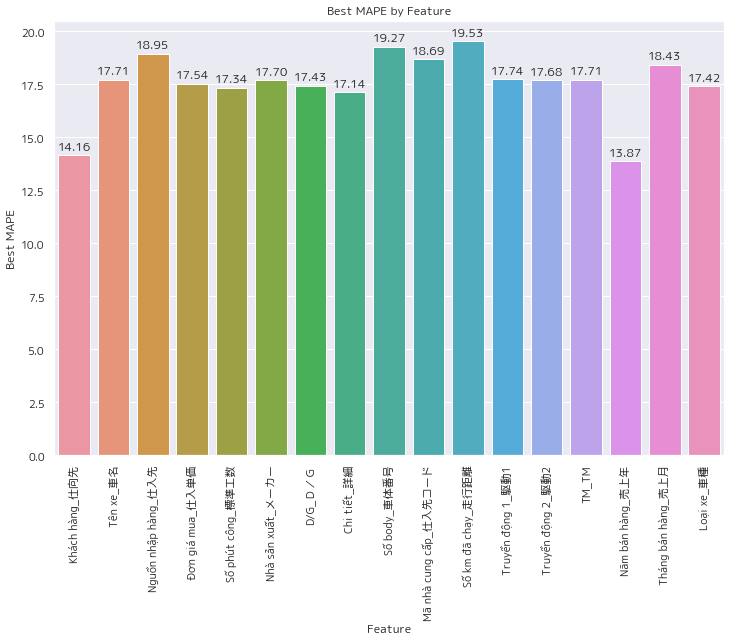

In [3434]:
my_df = pd.DataFrame(feature_mape_dict.items())
plt.figure(figsize=(12,8))
ax = sns.barplot(x=0, y=1, data=my_df)
ax.set(xlabel = 'Feature', ylabel='Best MAPE', title='Best MAPE by Feature')
ax.tick_params(axis='x', rotation=90)
for bar in ax.patches:
   
  # Using Matplotlib's annotate function and
  # passing the coordinates where the annotation shall be done
  # x-coordinate: bar.get_x() + bar.get_width() / 2
  # y-coordinate: bar.get_height()
  # free space to be left to make graph pleasing: (0, 8)
  # ha and va stand for the horizontal and vertical alignment
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')


In [3210]:
df_copy.select_dtypes(include=np.number).describe()

,Ngày sản xuất_生産日,Tháng sản xuất_生産月,Năm sản xuất_生産年,Số lượng_数量_PARTS,Tổng giá nhập_仕入合計,Số phút công_標準工数,Kết quả_生産高,Ước tính giá bán ra tại thời điểm sản xuất_生産時販売予測額,Số lượng bán ra_販売数量,Thành tích bán ra_販売実績,...,Chi phí_経費,Ngày mua_仕入日,Tháng mua hàng_仕入月,Năm mua_仕入年,Số phiếu_伝票番号,Mã nhà cung cấp_仕入先コード,Phân loại mang đến/đón_持込・引取区分,Tiền công_工賃,Phân loại bán hàng_売上分類,mean
count,20428.000000,20428.000000,20428.000000,20428.0,20428.000000,19140.000000,20428.000000,20428.000000,20428.000000,20428.000000,...,20428.0,20428.000000,20428.000000,20428.000000,20428.000000,20428.000000,0.0,20428.0,0.0,20425.000000
mean,16.332681,6.464265,2015.421970,1.0,18241.652577,34.764995,3257.303701,34135.935045,1.083562,37275.735779,...,0.0,16.504895,6.313981,2015.388878,34307.156844,462838.626591,NaN,0.0,NaN,37272.789743
std,8.630299,3.275124,3.064303,0.0,25281.950131,12.316886,1461.308571,36840.317923,0.469793,36235.203778,...,0.0,8.994944,3.301543,3.064704,17335.839771,286735.785676,NaN,0.0,NaN,26550.615403
min,1.000000,1.000000,2009.000000,1.0,0.000000,11.000000,0.000000,0.000000,1.000000,1000.000000,...,0.0,1.000000,1.000000,2008.000000,3621.000000,1.000000,NaN,0.0,NaN,2000.000000
25%,9.000000,4.000000,2013.000000,1.0,6224.917500,30.000000,2000.000000,15000.000000,1.000000,20000.000000,...,0.0,9.000000,3.000000,2013.000000,18217.000000,204110.000000,NaN,0.0,NaN,23947.368421
50%,17.000000,6.000000,2015.000000,1.0,12615.765000,35.000000,3000.000000,25000.000000,1.000000,28000.000000,...,0.0,17.000000,6.000000,2015.000000,37979.000000,420705.000000,NaN,0.0,NaN,30781.250000
75%,24.000000,9.000000,2018.000000,1.0,20000.000000,40.000000,4000.000000,35000.000000,1.000000,40000.000000,...,0.0,25.000000,9.000000,2018.000000,49331.000000,640700.000000,NaN,0.0,NaN,39125.000000
max,31.000000,12.000000,2021.000000,1.0,778635.560000,120.000000,12000.000000,983600.000000,7.000000,983600.000000,...,0.0,31.000000,12.000000,2021.000000,64933.000000,999995.000000,NaN,0.0,NaN,983600.000000


In [3063]:
df_cus_mean_sale  = df_copy.groupby(['Khách hàng_仕向先'])[ 'Thành tích bán ra_販売実績'].mean().reset_index(name='mean_price')
df_cus_mean_sale = df_cus_mean_sale.sort_values(by = ['mean_price'],ascending=False)
df_cus_mean_sale

,Khách hàng_仕向先,mean_price
35,IP Slukhova Elena Victorovna,112765.623932
37,J.Cars LLC,86391.785029
34,INVESTMENT ORIENTAL LTDA,85000.000000
1,AMIN TRADING,77500.000000
4,AUTOHELP,75925.474820
...,...,...
53,Ouss Brothers,8000.000000
68,"SINKAZU INDUSTRIAL(M) SDN, BHD",7500.000000
22,Element Parts ﾛｼｱ ｴﾚﾒﾝﾄﾊﾟｰﾂ,6857.142857
75,The Aussie Auto Parts.ｷﾌﾟﾛｽ ｱﾝﾄﾞﾚｱｽ,6500.000000


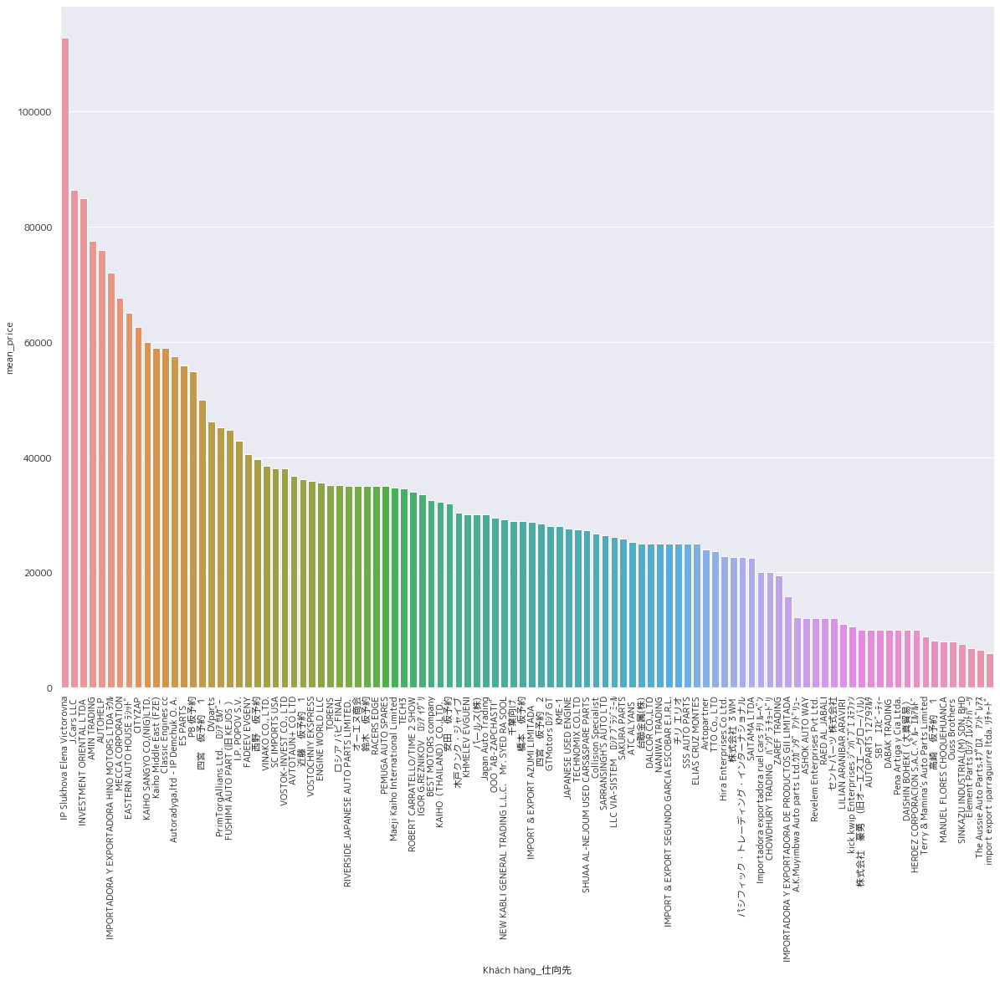

In [3066]:
plt.figure(figsize=(20,15))
plot = sns.barplot(x='Khách hàng_仕向先',y='mean_price',data=df_cus_mean_sale)
plot.tick_params(axis='x', rotation=90)

In [3212]:
le_name.classes_

array(['エンジン', 'ノーズカット（個別）', 'フェイスカット', 'フロントアクスル（個別）', 'ミッション（個別）',
       'リアアクスル（個別）', 'リアホーシング（デフ無）（個別）', '外装コンプリート', 'ＣＫＤ／コンプリート',
       'ＣＫＤ／コンプリート（バイヤー）', 'Ｆアクスル（生/Ｄ）', 'Ｒアクスル（生/Ｄ）'], dtype=object)

In [3324]:
list_best_acc = ['エンジン','ノーズカット（個別）','ＣＫＤ／コンプリート']
list_encode  = [0,1,8]

In [3337]:
def buid_model_NN(x_train):
    NN_model = Sequential()

    # The Input Layer :
    NN_model.add(Dense(32, kernel_initializer='normal',input_dim = x_train.shape[1], activation='relu'))
    # The Hidden Layers :

    NN_model.add(Dense(32, kernel_initializer='normal', activation='relu'))

    NN_model.add(Dense(64, kernel_initializer='normal', activation='relu'))
    NN_model.add(Dense(64, kernel_initializer='normal', activation='relu'))
    # NN_model.add(Dense(64, kernel_initializer='normal', activation='relu'))

    NN_model.add(Dense(128, kernel_initializer='normal', activation='relu'))
    NN_model.add(Dense(128, kernel_initializer='normal', activation='relu'))
    # NN_model.add(Dense(128, kernel_initializer='normal', activation='relu'))

    NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
    NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
    # NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

    NN_model.add(Dense(512, kernel_initializer='normal',activation='relu'))

    # The Output Layer :
    NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

    # Compile the network :
    NN_model.compile(loss=tf.keras.losses.MeanAbsolutePercentageError(), optimizer='adam',metrics=[tf.keras.metrics.RootMeanSquaredError(name='rmse'),tf.keras.losses.MeanAbsolutePercentageError(name='mape')])
#     NN_model.summary()
    return NN_model

In [3404]:
BATCH_SIZE = 512
EPOCHs = 2000

In [3421]:
# checkpoint_name = f'{acc}_{BATCH_SIZE}.h5'
# checkpoint_name = 'ＣＫＤ／コンプリート_16.h5'

checkpoint_name = f'other_{BATCH_SIZE}.h5'

checkpoint = ModelCheckpoint(filepath= checkpoint_name, monitor='val_mape', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [3406]:
NN_list_best_mape_by_acc = []
NN_list_rmse_by_acc = []
for acc,i in zip(list_best_acc,list_encode):
    globals()[f'df_{i}'] = df_group_month[df_group_month['Tên phụ tùng_商品名'] == i]
    print(f'******************************   {acc} ************************************')
    data = globals()[f'df_{i}'].drop(columns = ['Thành tích bán ra_販売実績'])
    target = globals()[f'df_{i}']['Thành tích bán ra_販売実績']
    x_train, x_test, y_train, y_test  = train_test_split(data,target,test_size = 0.3,random_state=42)
    
    checkpoint_name = f'{acc}_{BATCH_SIZE}.h5'
    checkpoint = ModelCheckpoint(filepath= checkpoint_name, monitor='val_mape', verbose = 1, save_best_only = True, mode ='auto')
    callbacks_list = [checkpoint]
    
    model = buid_model_NN(x_train)
    model.fit(x_train,y_train, batch_size=BATCH_SIZE, epochs= EPOCHs, validation_split=0.2,callbacks=callbacks_list, verbose=1)
    
    saved_model = load_model(f'{acc}_{BATCH_SIZE}.h5',compile=False)
    mape = mean_absolute_percentage_error(y_test, saved_model.predict(x_test))
    rmse = mean_squared_error(y_test, saved_model.predict(x_test),squared=False)
    
    NN_list_best_mape_by_acc.append(round(mape*100,3))
    NN_list_rmse_by_acc.append(round(rmse,3))

******************************   エンジン ************************************
Epoch 1/2000
17/17 [==============================] - 1s 20ms/step - loss: 98.5633 - rmse: 42006.1445 - mape: 98.1966 - val_loss: 84.1694 - val_rmse: 36962.0508 - val_mape: 84.4335

Epoch 00001: val_mape improved from inf to 84.43355, saving model to エンジン_512.h5
Epoch 2/2000
17/17 [==============================] - 0s 13ms/step - loss: 40.6102 - rmse: 22991.7246 - mape: 39.9124 - val_loss: 23.5488 - val_rmse: 16169.5947 - val_mape: 22.6829

Epoch 00002: val_mape improved from 84.43355 to 22.68293, saving model to エンジン_512.h5
Epoch 3/2000
17/17 [==============================] - 0s 13ms/step - loss: 22.6197 - rmse: 16957.2793 - mape: 22.6348 - val_loss: 20.3290 - val_rmse: 18009.2520 - val_mape: 20.5832

Epoch 00003: val_mape improved from 22.68293 to 20.58318, saving model to エンジン_512.h5
Epoch 4/2000
17/17 [==============================] - 0s 13ms/step - loss: 18.7642 - rmse: 17832.5879 - mape: 18.6867 - val_lo


Epoch 00068: val_mape did not improve from 17.66125
Epoch 69/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.3038 - rmse: 18431.8750 - mape: 17.5057 - val_loss: 17.4321 - val_rmse: 18456.4121 - val_mape: 18.1308

Epoch 00069: val_mape did not improve from 17.66125
Epoch 70/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.4143 - rmse: 18560.9062 - mape: 17.4461 - val_loss: 17.0549 - val_rmse: 18071.8418 - val_mape: 17.7262

Epoch 00070: val_mape did not improve from 17.66125
Epoch 71/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.3500 - rmse: 18454.9199 - mape: 17.3928 - val_loss: 17.1543 - val_rmse: 18233.1465 - val_mape: 17.8397

Epoch 00071: val_mape did not improve from 17.66125
Epoch 72/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.4633 - rmse: 18627.8008 - mape: 17.5314 - val_loss: 17.1107 - val_rmse: 17836.3203 - val_mape: 17.7480

Epoch 00072: val_mape did not improve from 17.66125
Epoch 7


Epoch 00103: val_mape did not improve from 17.66125
Epoch 104/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.3832 - rmse: 18475.8926 - mape: 17.3331 - val_loss: 17.4896 - val_rmse: 18447.3066 - val_mape: 18.1982

Epoch 00104: val_mape did not improve from 17.66125
Epoch 105/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.4803 - rmse: 18405.3672 - mape: 17.3942 - val_loss: 17.3060 - val_rmse: 17569.5918 - val_mape: 17.8867

Epoch 00105: val_mape did not improve from 17.66125
Epoch 106/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.3486 - rmse: 18471.1426 - mape: 17.3573 - val_loss: 17.0015 - val_rmse: 18093.5273 - val_mape: 17.6920

Epoch 00106: val_mape did not improve from 17.66125
Epoch 107/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.3057 - rmse: 18395.1367 - mape: 17.3637 - val_loss: 17.1053 - val_rmse: 18126.2930 - val_mape: 17.7870

Epoch 00107: val_mape did not improve from 17.66125
Epo

17/17 [==============================] - 0s 13ms/step - loss: 17.1732 - rmse: 18289.1836 - mape: 17.3012 - val_loss: 16.8931 - val_rmse: 17835.9941 - val_mape: 17.5574

Epoch 00172: val_mape improved from 17.56478 to 17.55741, saving model to エンジン_512.h5
Epoch 173/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.1778 - rmse: 18237.5684 - mape: 17.2840 - val_loss: 17.0555 - val_rmse: 18061.0898 - val_mape: 17.7442

Epoch 00173: val_mape did not improve from 17.55741
Epoch 174/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.2793 - rmse: 18363.3945 - mape: 17.2410 - val_loss: 17.0510 - val_rmse: 17426.2012 - val_mape: 17.6403

Epoch 00174: val_mape did not improve from 17.55741
Epoch 175/2000
17/17 [==============================] - 0s 14ms/step - loss: 17.2525 - rmse: 18219.8320 - mape: 17.3331 - val_loss: 16.9241 - val_rmse: 17839.6855 - val_mape: 17.5851

Epoch 00175: val_mape did not improve from 17.55741
Epoch 176/2000
17/17 [===============

17/17 [==============================] - 0s 13ms/step - loss: 17.7036 - rmse: 18246.1387 - mape: 17.8248 - val_loss: 17.1224 - val_rmse: 18137.0000 - val_mape: 17.8154

Epoch 00206: val_mape did not improve from 17.42031
Epoch 207/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.2988 - rmse: 18182.7168 - mape: 17.3362 - val_loss: 16.9752 - val_rmse: 17912.5605 - val_mape: 17.6381

Epoch 00207: val_mape did not improve from 17.42031
Epoch 208/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.4304 - rmse: 18236.5137 - mape: 17.4570 - val_loss: 16.9058 - val_rmse: 17573.7695 - val_mape: 17.5381

Epoch 00208: val_mape did not improve from 17.42031
Epoch 209/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.3005 - rmse: 18252.4219 - mape: 17.4021 - val_loss: 18.0128 - val_rmse: 18566.8223 - val_mape: 18.7176

Epoch 00209: val_mape did not improve from 17.42031
Epoch 210/2000
17/17 [==============================] - 0s 13ms/step - 


Epoch 00239: val_mape did not improve from 16.96911
Epoch 240/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.7792 - rmse: 17293.8320 - mape: 16.7246 - val_loss: 16.7846 - val_rmse: 15981.5664 - val_mape: 17.0279

Epoch 00240: val_mape did not improve from 16.96911
Epoch 241/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.9887 - rmse: 17024.5078 - mape: 16.9208 - val_loss: 17.1562 - val_rmse: 17728.1953 - val_mape: 17.7299

Epoch 00241: val_mape did not improve from 16.96911
Epoch 242/2000
17/17 [==============================] - 0s 13ms/step - loss: 17.1852 - rmse: 17313.6348 - mape: 17.1580 - val_loss: 16.4113 - val_rmse: 16288.2734 - val_mape: 16.7530

Epoch 00242: val_mape improved from 16.96911 to 16.75302, saving model to エンジン_512.h5
Epoch 243/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.6490 - rmse: 16998.4316 - mape: 16.5953 - val_loss: 16.5590 - val_rmse: 16372.6943 - val_mape: 16.9630

Epoch 00243: val_mape

17/17 [==============================] - 0s 13ms/step - loss: 16.3377 - rmse: 15803.1475 - mape: 16.2773 - val_loss: 16.1202 - val_rmse: 17399.9141 - val_mape: 16.6091

Epoch 00273: val_mape did not improve from 15.62238
Epoch 274/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.4335 - rmse: 16156.9844 - mape: 16.3602 - val_loss: 15.9171 - val_rmse: 15385.6582 - val_mape: 15.8913

Epoch 00274: val_mape did not improve from 15.62238
Epoch 275/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.2624 - rmse: 15891.9551 - mape: 16.2145 - val_loss: 16.6608 - val_rmse: 14409.1367 - val_mape: 16.4257

Epoch 00275: val_mape did not improve from 15.62238
Epoch 276/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.3107 - rmse: 15812.6465 - mape: 16.2909 - val_loss: 15.6813 - val_rmse: 15268.1699 - val_mape: 15.6683

Epoch 00276: val_mape did not improve from 15.62238
Epoch 277/2000
17/17 [==============================] - 0s 13ms/step - 


Epoch 00307: val_mape did not improve from 15.60489
Epoch 308/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.4703 - rmse: 16185.1445 - mape: 16.4856 - val_loss: 16.1170 - val_rmse: 14808.4639 - val_mape: 16.0992

Epoch 00308: val_mape did not improve from 15.60489
Epoch 309/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.1220 - rmse: 15763.4053 - mape: 16.1858 - val_loss: 15.7654 - val_rmse: 15291.5469 - val_mape: 15.9145

Epoch 00309: val_mape did not improve from 15.60489
Epoch 310/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.3904 - rmse: 15676.6152 - mape: 16.5498 - val_loss: 15.5877 - val_rmse: 14658.5635 - val_mape: 15.6126

Epoch 00310: val_mape did not improve from 15.60489
Epoch 311/2000
17/17 [==============================] - 0s 13ms/step - loss: 16.5670 - rmse: 15675.9854 - mape: 16.7020 - val_loss: 15.6045 - val_rmse: 14805.7451 - val_mape: 15.6771

Epoch 00311: val_mape did not improve from 15.60489
Epo

17/17 [==============================] - 0s 13ms/step - loss: 15.9254 - rmse: 15560.3428 - mape: 15.8754 - val_loss: 16.0012 - val_rmse: 15680.2559 - val_mape: 16.0413

Epoch 00342: val_mape did not improve from 15.39801
Epoch 343/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.8768 - rmse: 15186.5195 - mape: 15.8734 - val_loss: 15.6689 - val_rmse: 14673.2568 - val_mape: 15.7345

Epoch 00343: val_mape did not improve from 15.39801
Epoch 344/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.8046 - rmse: 15094.6455 - mape: 15.8165 - val_loss: 15.3938 - val_rmse: 14561.1055 - val_mape: 15.4539

Epoch 00344: val_mape did not improve from 15.39801
Epoch 345/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.7184 - rmse: 15003.0879 - mape: 15.7061 - val_loss: 15.8404 - val_rmse: 16086.6152 - val_mape: 16.0091

Epoch 00345: val_mape did not improve from 15.39801
Epoch 346/2000
17/17 [==============================] - 0s 13ms/step - 


Epoch 00376: val_mape did not improve from 15.33663
Epoch 377/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.6009 - rmse: 14844.7695 - mape: 15.5828 - val_loss: 15.3301 - val_rmse: 14332.6045 - val_mape: 15.3208

Epoch 00377: val_mape improved from 15.33663 to 15.32083, saving model to エンジン_512.h5
Epoch 378/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.8181 - rmse: 15181.6973 - mape: 15.7749 - val_loss: 15.5202 - val_rmse: 14987.6689 - val_mape: 15.6079

Epoch 00378: val_mape did not improve from 15.32083
Epoch 379/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.7172 - rmse: 14914.7598 - mape: 15.6858 - val_loss: 15.5972 - val_rmse: 15176.2178 - val_mape: 15.6775

Epoch 00379: val_mape did not improve from 15.32083
Epoch 380/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.8442 - rmse: 15169.0742 - mape: 15.8284 - val_loss: 16.1583 - val_rmse: 13867.7617 - val_mape: 16.1315

Epoch 00380: val_mape

17/17 [==============================] - 0s 13ms/step - loss: 15.5315 - rmse: 14690.7695 - mape: 15.5039 - val_loss: 15.3554 - val_rmse: 14056.9092 - val_mape: 15.3429

Epoch 00411: val_mape did not improve from 15.24297
Epoch 412/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.5045 - rmse: 14909.4424 - mape: 15.4130 - val_loss: 15.3657 - val_rmse: 14214.9082 - val_mape: 15.4133

Epoch 00412: val_mape did not improve from 15.24297
Epoch 413/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.5054 - rmse: 14641.8926 - mape: 15.5671 - val_loss: 15.2034 - val_rmse: 14324.2119 - val_mape: 15.1891

Epoch 00413: val_mape improved from 15.24297 to 15.18912, saving model to エンジン_512.h5
Epoch 414/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.5334 - rmse: 14654.2754 - mape: 15.5216 - val_loss: 15.1555 - val_rmse: 14407.4404 - val_mape: 15.1863

Epoch 00414: val_mape improved from 15.18912 to 15.18627, saving model to エンジン_512.h5
Epo


Epoch 00479: val_mape did not improve from 15.02779
Epoch 480/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.3372 - rmse: 14339.8018 - mape: 15.2098 - val_loss: 15.5977 - val_rmse: 14038.1416 - val_mape: 15.4949

Epoch 00480: val_mape did not improve from 15.02779
Epoch 481/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.4500 - rmse: 14581.3789 - mape: 15.4886 - val_loss: 15.5368 - val_rmse: 13548.7070 - val_mape: 15.5687

Epoch 00481: val_mape did not improve from 15.02779
Epoch 482/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.4547 - rmse: 14426.0781 - mape: 15.4543 - val_loss: 15.1521 - val_rmse: 14348.1465 - val_mape: 15.2352

Epoch 00482: val_mape did not improve from 15.02779
Epoch 483/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.5196 - rmse: 14356.8662 - mape: 15.5381 - val_loss: 15.4138 - val_rmse: 13876.7793 - val_mape: 15.4737

Epoch 00483: val_mape did not improve from 15.02779
Epo

17/17 [==============================] - 0s 13ms/step - loss: 15.3935 - rmse: 14349.3984 - mape: 15.4097 - val_loss: 15.6216 - val_rmse: 14198.3223 - val_mape: 15.6273

Epoch 00549: val_mape did not improve from 14.85880
Epoch 550/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.2145 - rmse: 14247.0840 - mape: 15.1836 - val_loss: 14.8407 - val_rmse: 13563.9258 - val_mape: 14.8431

Epoch 00550: val_mape improved from 14.85880 to 14.84310, saving model to エンジン_512.h5
Epoch 551/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.2695 - rmse: 14340.4209 - mape: 15.1861 - val_loss: 15.1085 - val_rmse: 14787.6523 - val_mape: 15.1918

Epoch 00551: val_mape did not improve from 14.84310
Epoch 552/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1762 - rmse: 14470.1172 - mape: 15.0961 - val_loss: 14.8556 - val_rmse: 13788.9258 - val_mape: 14.8735

Epoch 00552: val_mape did not improve from 14.84310
Epoch 553/2000
17/17 [===============

17/17 [==============================] - 0s 13ms/step - loss: 15.3985 - rmse: 14903.7959 - mape: 15.3229 - val_loss: 15.8784 - val_rmse: 13805.3652 - val_mape: 15.7582

Epoch 00583: val_mape did not improve from 14.73914
Epoch 584/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1561 - rmse: 14223.8779 - mape: 15.1346 - val_loss: 15.2711 - val_rmse: 14094.4385 - val_mape: 15.2595

Epoch 00584: val_mape did not improve from 14.73914
Epoch 585/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.2067 - rmse: 14501.6660 - mape: 15.1541 - val_loss: 14.9511 - val_rmse: 13803.4219 - val_mape: 14.9960

Epoch 00585: val_mape did not improve from 14.73914
Epoch 586/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1422 - rmse: 14286.0332 - mape: 15.1729 - val_loss: 14.9137 - val_rmse: 13628.7598 - val_mape: 15.0348

Epoch 00586: val_mape did not improve from 14.73914
Epoch 587/2000
17/17 [==============================] - 0s 13ms/step - 

17/17 [==============================] - 0s 13ms/step - loss: 15.2857 - rmse: 14136.9150 - mape: 15.2644 - val_loss: 15.1222 - val_rmse: 14102.3809 - val_mape: 15.1734

Epoch 00618: val_mape did not improve from 14.73914
Epoch 619/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1063 - rmse: 14228.6016 - mape: 15.0717 - val_loss: 14.9311 - val_rmse: 14471.3174 - val_mape: 15.0117

Epoch 00619: val_mape did not improve from 14.73914
Epoch 620/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.2418 - rmse: 14381.4297 - mape: 15.2360 - val_loss: 14.8519 - val_rmse: 13959.4082 - val_mape: 14.9358

Epoch 00620: val_mape did not improve from 14.73914
Epoch 621/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1320 - rmse: 14451.0459 - mape: 15.0420 - val_loss: 14.8274 - val_rmse: 13761.7910 - val_mape: 14.9240

Epoch 00621: val_mape did not improve from 14.73914
Epoch 622/2000
17/17 [==============================] - 0s 13ms/step - 

17/17 [==============================] - 0s 13ms/step - loss: 14.8889 - rmse: 14179.9404 - mape: 14.8927 - val_loss: 15.1326 - val_rmse: 13383.3350 - val_mape: 15.1551

Epoch 00653: val_mape did not improve from 14.73914
Epoch 654/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1209 - rmse: 14112.7139 - mape: 15.1155 - val_loss: 15.1283 - val_rmse: 13845.3672 - val_mape: 15.0601

Epoch 00654: val_mape did not improve from 14.73914
Epoch 655/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.1161 - rmse: 14276.4170 - mape: 15.1636 - val_loss: 15.1353 - val_rmse: 14306.2930 - val_mape: 15.1617

Epoch 00655: val_mape did not improve from 14.73914
Epoch 656/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.0838 - rmse: 14146.5176 - mape: 15.0282 - val_loss: 14.8229 - val_rmse: 14065.9961 - val_mape: 14.8710

Epoch 00656: val_mape did not improve from 14.73914
Epoch 657/2000
17/17 [==============================] - 0s 13ms/step - 

17/17 [==============================] - 0s 13ms/step - loss: 15.0875 - rmse: 14307.2119 - mape: 15.0596 - val_loss: 15.0080 - val_rmse: 13973.8438 - val_mape: 15.0679

Epoch 00688: val_mape did not improve from 14.73914
Epoch 689/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.0040 - rmse: 14158.5674 - mape: 14.9398 - val_loss: 14.6955 - val_rmse: 13704.6699 - val_mape: 14.7880

Epoch 00689: val_mape did not improve from 14.73914
Epoch 690/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.8482 - rmse: 14028.5195 - mape: 14.8373 - val_loss: 14.7890 - val_rmse: 13714.4619 - val_mape: 14.8138

Epoch 00690: val_mape did not improve from 14.73914
Epoch 691/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.7838 - rmse: 13903.2471 - mape: 14.7001 - val_loss: 14.7660 - val_rmse: 13756.1924 - val_mape: 14.8032

Epoch 00691: val_mape did not improve from 14.73914
Epoch 692/2000
17/17 [==============================] - 0s 13ms/step - 

17/17 [==============================] - 0s 13ms/step - loss: 14.8003 - rmse: 13967.4619 - mape: 14.7842 - val_loss: 14.7331 - val_rmse: 14193.3213 - val_mape: 14.8491

Epoch 00757: val_mape did not improve from 14.60606
Epoch 758/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.9320 - rmse: 14131.1807 - mape: 14.9358 - val_loss: 14.8140 - val_rmse: 14507.3701 - val_mape: 14.8845

Epoch 00758: val_mape did not improve from 14.60606
Epoch 759/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.2818 - rmse: 14305.7900 - mape: 15.2036 - val_loss: 15.2540 - val_rmse: 14720.1299 - val_mape: 15.2397

Epoch 00759: val_mape did not improve from 14.60606
Epoch 760/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.0219 - rmse: 14199.3672 - mape: 15.1467 - val_loss: 14.6987 - val_rmse: 13952.4014 - val_mape: 14.7065

Epoch 00760: val_mape did not improve from 14.60606
Epoch 761/2000
17/17 [==============================] - 0s 13ms/step - 


Epoch 00791: val_mape did not improve from 14.54093
Epoch 792/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.0484 - rmse: 14260.9316 - mape: 15.0060 - val_loss: 14.7529 - val_rmse: 14056.3809 - val_mape: 14.8944

Epoch 00792: val_mape did not improve from 14.54093
Epoch 793/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.8527 - rmse: 14032.2363 - mape: 14.8528 - val_loss: 14.7701 - val_rmse: 13651.6904 - val_mape: 14.7226

Epoch 00793: val_mape did not improve from 14.54093
Epoch 794/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.8357 - rmse: 13939.2344 - mape: 14.7728 - val_loss: 14.6775 - val_rmse: 13788.3184 - val_mape: 14.6519

Epoch 00794: val_mape did not improve from 14.54093
Epoch 795/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.7432 - rmse: 14125.3105 - mape: 14.8246 - val_loss: 14.5550 - val_rmse: 13609.6553 - val_mape: 14.5281

Epoch 00795: val_mape improved from 14.54093 to 14.5281


Epoch 00860: val_mape improved from 14.48482 to 14.47007, saving model to エンジン_512.h5
Epoch 861/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.6285 - rmse: 13911.2666 - mape: 14.5784 - val_loss: 14.6663 - val_rmse: 14023.5244 - val_mape: 14.6547

Epoch 00861: val_mape did not improve from 14.47007
Epoch 862/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.6406 - rmse: 13898.2266 - mape: 14.6956 - val_loss: 14.7868 - val_rmse: 13819.1279 - val_mape: 14.7018

Epoch 00862: val_mape did not improve from 14.47007
Epoch 863/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.6919 - rmse: 13819.8643 - mape: 14.6003 - val_loss: 14.4882 - val_rmse: 13814.8799 - val_mape: 14.5173

Epoch 00863: val_mape did not improve from 14.47007
Epoch 864/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.5305 - rmse: 13795.9033 - mape: 14.5473 - val_loss: 14.4983 - val_rmse: 13682.0830 - val_mape: 14.4638

Epoch 00864: val_mape


Epoch 00894: val_mape did not improve from 14.38754
Epoch 895/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.0530 - rmse: 13830.3555 - mape: 14.9310 - val_loss: 15.1541 - val_rmse: 13654.9541 - val_mape: 15.0385

Epoch 00895: val_mape did not improve from 14.38754
Epoch 896/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.8317 - rmse: 13791.3760 - mape: 14.7632 - val_loss: 14.5995 - val_rmse: 13656.6943 - val_mape: 14.6954

Epoch 00896: val_mape did not improve from 14.38754
Epoch 897/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.9195 - rmse: 13718.3906 - mape: 14.9028 - val_loss: 15.0291 - val_rmse: 14185.5088 - val_mape: 15.1566

Epoch 00897: val_mape did not improve from 14.38754
Epoch 898/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.6837 - rmse: 13717.7334 - mape: 14.7645 - val_loss: 14.7304 - val_rmse: 13660.5811 - val_mape: 14.6917

Epoch 00898: val_mape did not improve from 14.38754
Epo

17/17 [==============================] - 0s 13ms/step - loss: 14.6191 - rmse: 13682.1621 - mape: 14.8451 - val_loss: 15.4565 - val_rmse: 13974.2979 - val_mape: 15.3153

Epoch 00964: val_mape did not improve from 14.36335
Epoch 965/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.7348 - rmse: 14126.0020 - mape: 15.6819 - val_loss: 15.2520 - val_rmse: 14805.9473 - val_mape: 15.3582

Epoch 00965: val_mape did not improve from 14.36335
Epoch 966/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.4736 - rmse: 14883.9111 - mape: 15.4563 - val_loss: 14.7037 - val_rmse: 13976.6885 - val_mape: 14.6422

Epoch 00966: val_mape did not improve from 14.36335
Epoch 967/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.6294 - rmse: 13618.0908 - mape: 14.6951 - val_loss: 14.4558 - val_rmse: 13335.2891 - val_mape: 14.4462

Epoch 00967: val_mape did not improve from 14.36335
Epoch 968/2000
17/17 [==============================] - 0s 13ms/step - 


Epoch 00998: val_mape did not improve from 14.29813
Epoch 999/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.3225 - rmse: 13588.3496 - mape: 14.2328 - val_loss: 14.4260 - val_rmse: 13634.7422 - val_mape: 14.4170

Epoch 00999: val_mape did not improve from 14.29813
Epoch 1000/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.3369 - rmse: 13686.5723 - mape: 14.3244 - val_loss: 14.4178 - val_rmse: 13874.1328 - val_mape: 14.4815

Epoch 01000: val_mape did not improve from 14.29813
Epoch 1001/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.5505 - rmse: 13678.3721 - mape: 14.6790 - val_loss: 14.7472 - val_rmse: 13418.1191 - val_mape: 14.8301

Epoch 01001: val_mape did not improve from 14.29813
Epoch 1002/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.5772 - rmse: 13562.9326 - mape: 14.6312 - val_loss: 15.0542 - val_rmse: 13990.0000 - val_mape: 14.9356

Epoch 01002: val_mape did not improve from 14.29813


17/17 [==============================] - 0s 13ms/step - loss: 14.4668 - rmse: 13696.8691 - mape: 14.4534 - val_loss: 14.3598 - val_rmse: 13446.4570 - val_mape: 14.3538

Epoch 01033: val_mape did not improve from 14.21689
Epoch 1034/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.4172 - rmse: 13511.1846 - mape: 14.3953 - val_loss: 14.5816 - val_rmse: 13353.5059 - val_mape: 14.5751

Epoch 01034: val_mape did not improve from 14.21689
Epoch 1035/2000
17/17 [==============================] - 0s 13ms/step - loss: 15.2333 - rmse: 14323.4404 - mape: 15.2179 - val_loss: 15.0038 - val_rmse: 14077.7178 - val_mape: 15.0984

Epoch 01035: val_mape did not improve from 14.21689
Epoch 1036/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.6890 - rmse: 13935.2510 - mape: 14.6434 - val_loss: 14.5138 - val_rmse: 13535.1924 - val_mape: 14.4623

Epoch 01036: val_mape did not improve from 14.21689
Epoch 1037/2000
17/17 [==============================] - 0s 13ms/ste

17/17 [==============================] - 0s 13ms/step - loss: 13.9643 - rmse: 13501.5547 - mape: 14.0528 - val_loss: 14.5039 - val_rmse: 14255.8496 - val_mape: 14.7474

Epoch 01101: val_mape did not improve from 14.09738
Epoch 1102/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.2024 - rmse: 13370.6768 - mape: 14.2225 - val_loss: 14.0872 - val_rmse: 13114.8906 - val_mape: 14.1424

Epoch 01102: val_mape did not improve from 14.09738
Epoch 1103/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.1585 - rmse: 13178.4746 - mape: 14.2179 - val_loss: 14.3046 - val_rmse: 13074.4668 - val_mape: 14.2731

Epoch 01103: val_mape did not improve from 14.09738
Epoch 1104/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.0734 - rmse: 13038.2832 - mape: 14.0633 - val_loss: 14.2127 - val_rmse: 13301.4092 - val_mape: 14.1599

Epoch 01104: val_mape did not improve from 14.09738
Epoch 1105/2000
17/17 [==============================] - 0s 13ms/ste


Epoch 01169: val_mape did not improve from 14.02426
Epoch 1170/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.0023 - rmse: 13262.8545 - mape: 13.9481 - val_loss: 14.1241 - val_rmse: 13194.6016 - val_mape: 14.1391

Epoch 01170: val_mape did not improve from 14.02426
Epoch 1171/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.8833 - rmse: 12713.8291 - mape: 14.0374 - val_loss: 14.3104 - val_rmse: 12897.0322 - val_mape: 14.2826

Epoch 01171: val_mape did not improve from 14.02426
Epoch 1172/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.8444 - rmse: 12933.5469 - mape: 13.8309 - val_loss: 14.1995 - val_rmse: 13583.6992 - val_mape: 14.4351

Epoch 01172: val_mape did not improve from 14.02426
Epoch 1173/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.8976 - rmse: 12993.2910 - mape: 14.0250 - val_loss: 14.2789 - val_rmse: 12802.9590 - val_mape: 14.3726

Epoch 01173: val_mape did not improve from 14.02426


Epoch 01238: val_mape did not improve from 14.00521
Epoch 1239/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.8009 - rmse: 12974.1406 - mape: 13.8525 - val_loss: 14.1032 - val_rmse: 13288.6230 - val_mape: 14.1238

Epoch 01239: val_mape did not improve from 14.00521
Epoch 1240/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.9414 - rmse: 12948.1016 - mape: 13.9091 - val_loss: 14.9684 - val_rmse: 13175.3975 - val_mape: 14.9280

Epoch 01240: val_mape did not improve from 14.00521
Epoch 1241/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.0886 - rmse: 13084.9297 - mape: 14.1608 - val_loss: 14.3760 - val_rmse: 13450.5713 - val_mape: 14.4044

Epoch 01241: val_mape did not improve from 14.00521
Epoch 1242/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.9963 - rmse: 13038.9287 - mape: 14.0236 - val_loss: 14.2267 - val_rmse: 13234.8369 - val_mape: 14.2498

Epoch 01242: val_mape did not improve from 14.00521


Epoch 01307: val_mape did not improve from 14.00521
Epoch 1308/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.4124 - rmse: 13456.8447 - mape: 14.4373 - val_loss: 14.4239 - val_rmse: 13496.0371 - val_mape: 14.5850

Epoch 01308: val_mape did not improve from 14.00521
Epoch 1309/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.0631 - rmse: 13283.2773 - mape: 14.0433 - val_loss: 14.2423 - val_rmse: 13067.6641 - val_mape: 14.2848

Epoch 01309: val_mape did not improve from 14.00521
Epoch 1310/2000
17/17 [==============================] - 0s 14ms/step - loss: 13.7772 - rmse: 12941.2305 - mape: 13.9190 - val_loss: 14.2513 - val_rmse: 13122.0010 - val_mape: 14.2637

Epoch 01310: val_mape did not improve from 14.00521
Epoch 1311/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.7870 - rmse: 12796.2969 - mape: 13.8161 - val_loss: 13.9672 - val_rmse: 12966.6504 - val_mape: 14.0191

Epoch 01311: val_mape did not improve from 14.00521

17/17 [==============================] - 0s 13ms/step - loss: 13.7576 - rmse: 12658.3457 - mape: 13.7706 - val_loss: 14.1172 - val_rmse: 12782.0840 - val_mape: 14.1371

Epoch 01342: val_mape did not improve from 13.91102
Epoch 1343/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.6135 - rmse: 12587.0264 - mape: 13.5537 - val_loss: 14.1579 - val_rmse: 13042.5908 - val_mape: 14.2374

Epoch 01343: val_mape did not improve from 13.91102
Epoch 1344/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.7402 - rmse: 12682.4424 - mape: 13.7271 - val_loss: 15.0754 - val_rmse: 13426.9932 - val_mape: 14.9223

Epoch 01344: val_mape did not improve from 13.91102
Epoch 1345/2000
17/17 [==============================] - 0s 13ms/step - loss: 14.0467 - rmse: 13172.3398 - mape: 14.0261 - val_loss: 14.2919 - val_rmse: 12526.9785 - val_mape: 14.5061

Epoch 01345: val_mape did not improve from 13.91102
Epoch 1346/2000
17/17 [==============================] - 0s 13ms/ste


Epoch 01376: val_mape did not improve from 13.91102
Epoch 1377/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.7774 - rmse: 12870.8008 - mape: 13.7584 - val_loss: 14.3501 - val_rmse: 12979.4248 - val_mape: 14.3454

Epoch 01377: val_mape did not improve from 13.91102
Epoch 1378/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.7767 - rmse: 12865.8906 - mape: 13.7710 - val_loss: 13.8835 - val_rmse: 12831.4697 - val_mape: 13.9611

Epoch 01378: val_mape did not improve from 13.91102
Epoch 1379/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.6948 - rmse: 12781.7998 - mape: 13.7415 - val_loss: 13.9000 - val_rmse: 12825.0244 - val_mape: 13.9834

Epoch 01379: val_mape did not improve from 13.91102
Epoch 1380/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.6139 - rmse: 12683.8809 - mape: 13.6003 - val_loss: 14.4063 - val_rmse: 13177.7842 - val_mape: 14.4920

Epoch 01380: val_mape did not improve from 13.91102


Epoch 01445: val_mape did not improve from 13.91102
Epoch 1446/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.8734 - rmse: 12830.0078 - mape: 13.9225 - val_loss: 13.8567 - val_rmse: 12963.3066 - val_mape: 14.0057

Epoch 01446: val_mape did not improve from 13.91102
Epoch 1447/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.8051 - rmse: 12742.9463 - mape: 13.7345 - val_loss: 14.0656 - val_rmse: 12864.8672 - val_mape: 14.0662

Epoch 01447: val_mape did not improve from 13.91102
Epoch 1448/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5601 - rmse: 12550.1680 - mape: 13.5798 - val_loss: 14.2572 - val_rmse: 13078.6045 - val_mape: 14.3040

Epoch 01448: val_mape did not improve from 13.91102
Epoch 1449/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.7695 - rmse: 12650.6738 - mape: 13.8171 - val_loss: 14.5356 - val_rmse: 13085.4033 - val_mape: 14.5521

Epoch 01449: val_mape did not improve from 13.91102


Epoch 01514: val_mape did not improve from 13.88418
Epoch 1515/2000
17/17 [==============================] - 0s 14ms/step - loss: 14.1397 - rmse: 12778.6250 - mape: 14.2698 - val_loss: 14.4095 - val_rmse: 12488.9277 - val_mape: 14.4225

Epoch 01515: val_mape did not improve from 13.88418
Epoch 1516/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.6478 - rmse: 12619.6396 - mape: 13.6734 - val_loss: 14.2503 - val_rmse: 13009.2236 - val_mape: 14.2458

Epoch 01516: val_mape did not improve from 13.88418
Epoch 1517/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.6168 - rmse: 12803.2363 - mape: 13.6867 - val_loss: 13.7648 - val_rmse: 12847.2432 - val_mape: 13.7712

Epoch 01517: val_mape improved from 13.88418 to 13.77121, saving model to エンジン_512.h5
Epoch 1518/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5527 - rmse: 12608.6191 - mape: 13.4728 - val_loss: 13.8999 - val_rmse: 12941.7109 - val_mape: 13.9450

Epoch 01518: val_


Epoch 01583: val_mape did not improve from 13.77121
Epoch 1584/2000
17/17 [==============================] - 0s 14ms/step - loss: 13.7843 - rmse: 12605.7227 - mape: 13.8736 - val_loss: 13.9464 - val_rmse: 12483.9473 - val_mape: 13.9582

Epoch 01584: val_mape did not improve from 13.77121
Epoch 1585/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5983 - rmse: 12785.2324 - mape: 13.4966 - val_loss: 13.9288 - val_rmse: 12572.7715 - val_mape: 13.9621

Epoch 01585: val_mape did not improve from 13.77121
Epoch 1586/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.7070 - rmse: 12902.4912 - mape: 13.7048 - val_loss: 14.4753 - val_rmse: 13243.9854 - val_mape: 14.4290

Epoch 01586: val_mape did not improve from 13.77121
Epoch 1587/2000
17/17 [==============================] - 0s 15ms/step - loss: 13.6616 - rmse: 12770.1572 - mape: 13.6229 - val_loss: 14.0046 - val_rmse: 12930.6230 - val_mape: 14.0518

Epoch 01587: val_mape did not improve from 13.77121


Epoch 01652: val_mape did not improve from 13.77121
Epoch 1653/2000
17/17 [==============================] - 0s 15ms/step - loss: 13.5988 - rmse: 12789.0771 - mape: 13.5781 - val_loss: 14.2710 - val_rmse: 13005.9678 - val_mape: 14.2575

Epoch 01653: val_mape did not improve from 13.77121
Epoch 1654/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5911 - rmse: 12586.6787 - mape: 13.5620 - val_loss: 13.9793 - val_rmse: 12957.6582 - val_mape: 13.9427

Epoch 01654: val_mape did not improve from 13.77121
Epoch 1655/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.4669 - rmse: 12596.9150 - mape: 13.7253 - val_loss: 14.1669 - val_rmse: 12933.5654 - val_mape: 14.1428

Epoch 01655: val_mape did not improve from 13.77121
Epoch 1656/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5131 - rmse: 12580.0566 - mape: 13.6063 - val_loss: 14.0587 - val_rmse: 13259.4531 - val_mape: 14.0010

Epoch 01656: val_mape did not improve from 13.77121


Epoch 01721: val_mape did not improve from 13.77121
Epoch 1722/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.4573 - rmse: 12383.2969 - mape: 13.4198 - val_loss: 13.8890 - val_rmse: 12611.4980 - val_mape: 13.9225

Epoch 01722: val_mape did not improve from 13.77121
Epoch 1723/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.3361 - rmse: 12376.7383 - mape: 13.3239 - val_loss: 13.9691 - val_rmse: 12596.9033 - val_mape: 13.9503

Epoch 01723: val_mape did not improve from 13.77121
Epoch 1724/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.4028 - rmse: 12411.9160 - mape: 13.3849 - val_loss: 14.1002 - val_rmse: 12874.0088 - val_mape: 14.0796

Epoch 01724: val_mape did not improve from 13.77121
Epoch 1725/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5211 - rmse: 12561.8125 - mape: 13.5774 - val_loss: 14.1642 - val_rmse: 12917.2812 - val_mape: 14.1973

Epoch 01725: val_mape did not improve from 13.77121


Epoch 01790: val_mape did not improve from 13.77121
Epoch 1791/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.3817 - rmse: 12246.8545 - mape: 13.3411 - val_loss: 13.9371 - val_rmse: 12543.8877 - val_mape: 13.9535

Epoch 01791: val_mape did not improve from 13.77121
Epoch 1792/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.3393 - rmse: 12203.7480 - mape: 13.3344 - val_loss: 14.5996 - val_rmse: 13198.1836 - val_mape: 14.5533

Epoch 01792: val_mape did not improve from 13.77121
Epoch 1793/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.5770 - rmse: 12251.8887 - mape: 13.5387 - val_loss: 13.8513 - val_rmse: 12532.1543 - val_mape: 13.8418

Epoch 01793: val_mape did not improve from 13.77121
Epoch 1794/2000
17/17 [==============================] - 0s 13ms/step - loss: 13.3104 - rmse: 12077.6455 - mape: 13.3553 - val_loss: 14.2511 - val_rmse: 12673.6270 - val_mape: 14.1362

Epoch 01794: val_mape did not improve from 13.77121


Epoch 01859: val_mape did not improve from 13.74730
Epoch 1860/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.5566 - rmse: 12263.1289 - mape: 13.5374 - val_loss: 14.0316 - val_rmse: 12740.9258 - val_mape: 13.9334

Epoch 01860: val_mape did not improve from 13.74730
Epoch 1861/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.9418 - rmse: 12713.4043 - mape: 13.8797 - val_loss: 15.2058 - val_rmse: 13270.1426 - val_mape: 14.8833

Epoch 01861: val_mape did not improve from 13.74730
Epoch 1862/2000
17/17 [==============================] - 0s 12ms/step - loss: 14.0626 - rmse: 13096.4824 - mape: 14.3244 - val_loss: 15.1473 - val_rmse: 13891.2158 - val_mape: 15.3405

Epoch 01862: val_mape did not improve from 13.74730
Epoch 1863/2000
17/17 [==============================] - 0s 12ms/step - loss: 14.1542 - rmse: 13123.4844 - mape: 14.0765 - val_loss: 14.3052 - val_rmse: 12977.1816 - val_mape: 14.1589

Epoch 01863: val_mape did not improve from 13.74730


Epoch 01928: val_mape did not improve from 13.74730
Epoch 1929/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.0518 - rmse: 11956.3564 - mape: 13.0111 - val_loss: 13.8574 - val_rmse: 12841.4688 - val_mape: 13.8847

Epoch 01929: val_mape did not improve from 13.74730
Epoch 1930/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.3803 - rmse: 12232.9180 - mape: 13.3773 - val_loss: 14.3755 - val_rmse: 12999.9414 - val_mape: 14.3574

Epoch 01930: val_mape did not improve from 13.74730
Epoch 1931/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.4099 - rmse: 12485.8916 - mape: 13.3188 - val_loss: 14.0983 - val_rmse: 12767.8838 - val_mape: 14.1964

Epoch 01931: val_mape did not improve from 13.74730
Epoch 1932/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.2652 - rmse: 12178.0342 - mape: 13.2456 - val_loss: 13.8231 - val_rmse: 12525.4150 - val_mape: 13.8222

Epoch 01932: val_mape did not improve from 13.74730

17/17 [==============================] - 0s 13ms/step - loss: 13.0735 - rmse: 11989.9639 - mape: 13.1219 - val_loss: 14.4685 - val_rmse: 13111.9785 - val_mape: 14.3051

Epoch 01997: val_mape did not improve from 13.59965
Epoch 1998/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.3511 - rmse: 12034.6924 - mape: 13.3279 - val_loss: 14.1087 - val_rmse: 13100.3594 - val_mape: 14.0002

Epoch 01998: val_mape did not improve from 13.59965
Epoch 1999/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.5414 - rmse: 11957.7627 - mape: 13.7530 - val_loss: 14.6789 - val_rmse: 13262.2295 - val_mape: 14.6820

Epoch 01999: val_mape did not improve from 13.59965
Epoch 2000/2000
17/17 [==============================] - 0s 12ms/step - loss: 13.4589 - rmse: 12053.1240 - mape: 13.5422 - val_loss: 14.2363 - val_rmse: 12925.8311 - val_mape: 14.1925

Epoch 02000: val_mape did not improve from 13.59965
******************************   ノーズカット（個別） ************************

4/4 [==============================] - 0s 17ms/step - loss: 10.5397 - rmse: 2068.5007 - mape: 10.5621 - val_loss: 10.3009 - val_rmse: 4212.6304 - val_mape: 10.3009

Epoch 00029: val_mape did not improve from 10.20850
Epoch 30/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.5523 - rmse: 2079.8193 - mape: 10.5071 - val_loss: 10.1107 - val_rmse: 4173.8315 - val_mape: 10.1107

Epoch 00030: val_mape improved from 10.20850 to 10.11069, saving model to ノーズカット（個別）_512.h5
Epoch 31/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.8207 - rmse: 2082.6741 - mape: 10.9162 - val_loss: 10.1074 - val_rmse: 4166.9463 - val_mape: 10.1074

Epoch 00031: val_mape improved from 10.11069 to 10.10737, saving model to ノーズカット（個別）_512.h5
Epoch 32/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.7766 - rmse: 2088.0964 - mape: 10.7641 - val_loss: 10.7722 - val_rmse: 4142.0771 - val_mape: 10.7722

Epoch 00032: val_mape did not improve from 10.10737
Epoch 33/2

4/4 [==============================] - 0s 18ms/step - loss: 10.5847 - rmse: 2085.7417 - mape: 10.5885 - val_loss: 9.8123 - val_rmse: 4142.6099 - val_mape: 9.8123

Epoch 00063: val_mape did not improve from 9.81193
Epoch 64/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.5097 - rmse: 2087.3684 - mape: 10.5458 - val_loss: 9.8442 - val_rmse: 4141.7065 - val_mape: 9.8442

Epoch 00064: val_mape did not improve from 9.81193
Epoch 65/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.0834 - rmse: 2106.4761 - mape: 11.1168 - val_loss: 10.2282 - val_rmse: 4133.5791 - val_mape: 10.2282

Epoch 00065: val_mape did not improve from 9.81193
Epoch 66/2000
4/4 [==============================] - 0s 17ms/step - loss: 11.6623 - rmse: 2153.4629 - mape: 11.6238 - val_loss: 13.3902 - val_rmse: 4150.9824 - val_mape: 13.3902

Epoch 00066: val_mape did not improve from 9.81193
Epoch 67/2000
4/4 [==============================] - 0s 17ms/step - loss: 13.6223 - rmse: 2267.926

4/4 [==============================] - 0s 16ms/step - loss: 10.3289 - rmse: 2059.1460 - mape: 10.3189 - val_loss: 9.7329 - val_rmse: 4157.9487 - val_mape: 9.7329

Epoch 00098: val_mape did not improve from 9.67858
Epoch 99/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.1971 - rmse: 2052.7805 - mape: 10.2463 - val_loss: 9.9357 - val_rmse: 4182.1245 - val_mape: 9.9357

Epoch 00099: val_mape did not improve from 9.67858
Epoch 100/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3204 - rmse: 2062.6348 - mape: 10.2914 - val_loss: 10.0718 - val_rmse: 4194.1528 - val_mape: 10.0718

Epoch 00100: val_mape did not improve from 9.67858
Epoch 101/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.3653 - rmse: 2060.8958 - mape: 10.3616 - val_loss: 9.9213 - val_rmse: 4183.0171 - val_mape: 9.9213

Epoch 00101: val_mape did not improve from 9.67858
Epoch 102/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.3779 - rmse: 2066.96


Epoch 00133: val_mape did not improve from 9.67858
Epoch 134/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.6821 - rmse: 2084.0745 - mape: 10.7317 - val_loss: 9.7309 - val_rmse: 4143.6196 - val_mape: 9.7309

Epoch 00134: val_mape did not improve from 9.67858
Epoch 135/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.4202 - rmse: 2071.4978 - mape: 10.4214 - val_loss: 9.7359 - val_rmse: 4142.3584 - val_mape: 9.7359

Epoch 00135: val_mape did not improve from 9.67858
Epoch 136/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2309 - rmse: 2059.5979 - mape: 10.2123 - val_loss: 9.8444 - val_rmse: 4139.6479 - val_mape: 9.8444

Epoch 00136: val_mape did not improve from 9.67858
Epoch 137/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2543 - rmse: 2058.0273 - mape: 10.3264 - val_loss: 9.8133 - val_rmse: 4142.9072 - val_mape: 9.8133

Epoch 00137: val_mape did not improve from 9.67858
Epoch 138/2000
4/4 [============

4/4 [==============================] - 0s 16ms/step - loss: 10.3263 - rmse: 2071.1897 - mape: 10.3394 - val_loss: 9.7548 - val_rmse: 4156.0332 - val_mape: 9.7548

Epoch 00169: val_mape did not improve from 9.61986
Epoch 170/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.1929 - rmse: 2060.1111 - mape: 10.1866 - val_loss: 9.6876 - val_rmse: 4154.8496 - val_mape: 9.6876

Epoch 00170: val_mape did not improve from 9.61986
Epoch 171/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2167 - rmse: 2052.8467 - mape: 10.1867 - val_loss: 9.6195 - val_rmse: 4142.1143 - val_mape: 9.6195

Epoch 00171: val_mape improved from 9.61986 to 9.61950, saving model to ノーズカット（個別）_512.h5
Epoch 172/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2276 - rmse: 2054.3284 - mape: 10.2079 - val_loss: 10.1739 - val_rmse: 4130.5327 - val_mape: 10.1739

Epoch 00172: val_mape did not improve from 9.61950
Epoch 173/2000
4/4 [==============================] - 0s 1

4/4 [==============================] - 0s 17ms/step - loss: 10.6621 - rmse: 2091.8408 - mape: 10.6993 - val_loss: 9.6784 - val_rmse: 4132.5024 - val_mape: 9.6784

Epoch 00204: val_mape did not improve from 9.58806
Epoch 205/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.5490 - rmse: 2083.7769 - mape: 10.5087 - val_loss: 9.7809 - val_rmse: 4131.1836 - val_mape: 9.7809

Epoch 00205: val_mape did not improve from 9.58806
Epoch 206/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.7144 - rmse: 2095.8181 - mape: 10.6688 - val_loss: 11.2509 - val_rmse: 4124.0767 - val_mape: 11.2509

Epoch 00206: val_mape did not improve from 9.58806
Epoch 207/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.5406 - rmse: 2164.2571 - mape: 11.5698 - val_loss: 10.2277 - val_rmse: 4203.3667 - val_mape: 10.2277

Epoch 00207: val_mape did not improve from 9.58806
Epoch 208/2000
4/4 [==============================] - 0s 18ms/step - loss: 11.2444 - rmse: 2087


Epoch 00239: val_mape did not improve from 9.58806
Epoch 240/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.0853 - rmse: 2052.9263 - mape: 10.0725 - val_loss: 9.5798 - val_rmse: 4145.4565 - val_mape: 9.5798

Epoch 00240: val_mape improved from 9.58806 to 9.57977, saving model to ノーズカット（個別）_512.h5
Epoch 241/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0945 - rmse: 2055.4312 - mape: 10.0803 - val_loss: 9.5670 - val_rmse: 4144.9419 - val_mape: 9.5670

Epoch 00241: val_mape improved from 9.57977 to 9.56695, saving model to ノーズカット（個別）_512.h5
Epoch 242/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1319 - rmse: 2050.4802 - mape: 10.1159 - val_loss: 9.5916 - val_rmse: 4138.1465 - val_mape: 9.5916

Epoch 00242: val_mape did not improve from 9.56695
Epoch 243/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1453 - rmse: 2057.1880 - mape: 10.1604 - val_loss: 9.5752 - val_rmse: 4138.8667 - val_mape: 9.5752

Epoch

4/4 [==============================] - 0s 16ms/step - loss: 10.2957 - rmse: 2068.8291 - mape: 10.2565 - val_loss: 9.7474 - val_rmse: 4162.6992 - val_mape: 9.7474

Epoch 00310: val_mape did not improve from 9.56231
Epoch 311/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0818 - rmse: 2048.4380 - mape: 10.0692 - val_loss: 9.6983 - val_rmse: 4161.0757 - val_mape: 9.6983

Epoch 00311: val_mape did not improve from 9.56231
Epoch 312/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2762 - rmse: 2070.2473 - mape: 10.3286 - val_loss: 9.8723 - val_rmse: 4177.0000 - val_mape: 9.8723

Epoch 00312: val_mape did not improve from 9.56231
Epoch 313/2000
4/4 [==============================] - 0s 18ms/step - loss: 10.2060 - rmse: 2060.9641 - mape: 10.2016 - val_loss: 9.5585 - val_rmse: 4143.3999 - val_mape: 9.5585

Epoch 00313: val_mape improved from 9.56231 to 9.55850, saving model to ノーズカット（個別）_512.h5
Epoch 314/2000
4/4 [==============================] - 0s 16m


Epoch 00345: val_mape did not improve from 9.55370
Epoch 346/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1907 - rmse: 2055.1182 - mape: 10.2149 - val_loss: 9.6205 - val_rmse: 4156.1968 - val_mape: 9.6205

Epoch 00346: val_mape did not improve from 9.55370
Epoch 347/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0691 - rmse: 2053.1396 - mape: 10.0448 - val_loss: 9.5694 - val_rmse: 4147.2305 - val_mape: 9.5694

Epoch 00347: val_mape did not improve from 9.55370
Epoch 348/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0904 - rmse: 2050.5244 - mape: 10.1425 - val_loss: 9.9794 - val_rmse: 4185.9531 - val_mape: 9.9794

Epoch 00348: val_mape did not improve from 9.55370
Epoch 349/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2922 - rmse: 2066.5457 - mape: 10.3040 - val_loss: 9.6627 - val_rmse: 4159.9360 - val_mape: 9.6627

Epoch 00349: val_mape did not improve from 9.55370
Epoch 350/2000
4/4 [============


Epoch 00381: val_mape did not improve from 9.55370
Epoch 382/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.4118 - rmse: 2059.4055 - mape: 10.3854 - val_loss: 9.8055 - val_rmse: 4131.3438 - val_mape: 9.8055

Epoch 00382: val_mape did not improve from 9.55370
Epoch 383/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2948 - rmse: 2075.9160 - mape: 10.3453 - val_loss: 9.5613 - val_rmse: 4142.2168 - val_mape: 9.5613

Epoch 00383: val_mape did not improve from 9.55370
Epoch 384/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1082 - rmse: 2055.5637 - mape: 10.0821 - val_loss: 9.7132 - val_rmse: 4166.8989 - val_mape: 9.7132

Epoch 00384: val_mape did not improve from 9.55370
Epoch 385/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2223 - rmse: 2069.1267 - mape: 10.2879 - val_loss: 10.5924 - val_rmse: 4224.9102 - val_mape: 10.5924

Epoch 00385: val_mape did not improve from 9.55370
Epoch 386/2000
4/4 [==========

Epoch 453/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.6360 - rmse: 2062.2268 - mape: 10.6514 - val_loss: 9.7140 - val_rmse: 4133.2451 - val_mape: 9.7140

Epoch 00453: val_mape did not improve from 9.55370
Epoch 454/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.7882 - rmse: 2106.8770 - mape: 10.8171 - val_loss: 11.0006 - val_rmse: 4124.4873 - val_mape: 11.0006

Epoch 00454: val_mape did not improve from 9.55370
Epoch 455/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.7604 - rmse: 2097.0269 - mape: 10.7562 - val_loss: 9.8958 - val_rmse: 4131.6738 - val_mape: 9.8958

Epoch 00455: val_mape did not improve from 9.55370
Epoch 456/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3706 - rmse: 2071.4600 - mape: 10.3934 - val_loss: 9.5600 - val_rmse: 4146.1006 - val_mape: 9.5600

Epoch 00456: val_mape did not improve from 9.55370
Epoch 457/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2658


Epoch 00488: val_mape did not improve from 9.55370
Epoch 489/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3988 - rmse: 2068.3657 - mape: 10.4918 - val_loss: 10.0102 - val_rmse: 4187.9819 - val_mape: 10.0102

Epoch 00489: val_mape did not improve from 9.55370
Epoch 490/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2147 - rmse: 2053.7178 - mape: 10.1914 - val_loss: 9.9836 - val_rmse: 4186.2847 - val_mape: 9.9836

Epoch 00490: val_mape did not improve from 9.55370
Epoch 491/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.4032 - rmse: 2073.3979 - mape: 10.3790 - val_loss: 9.9300 - val_rmse: 4186.5361 - val_mape: 9.9300

Epoch 00491: val_mape did not improve from 9.55370
Epoch 492/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.4100 - rmse: 2077.7864 - mape: 10.3999 - val_loss: 10.1845 - val_rmse: 4202.3711 - val_mape: 10.1845

Epoch 00492: val_mape did not improve from 9.55370
Epoch 493/2000
4/4 [========


Epoch 00559: val_mape did not improve from 9.54853
Epoch 560/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.3419 - rmse: 2120.9365 - mape: 11.3186 - val_loss: 11.8066 - val_rmse: 4291.7524 - val_mape: 11.8066

Epoch 00560: val_mape did not improve from 9.54853
Epoch 561/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.6607 - rmse: 2101.9670 - mape: 11.7135 - val_loss: 10.5924 - val_rmse: 4224.7822 - val_mape: 10.5924

Epoch 00561: val_mape did not improve from 9.54853
Epoch 562/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.3829 - rmse: 2148.7417 - mape: 11.3355 - val_loss: 11.0004 - val_rmse: 4122.2651 - val_mape: 11.0004

Epoch 00562: val_mape did not improve from 9.54853
Epoch 563/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.1989 - rmse: 2141.6321 - mape: 11.1545 - val_loss: 11.0571 - val_rmse: 4125.7056 - val_mape: 11.0571

Epoch 00563: val_mape did not improve from 9.54853
Epoch 564/2000
4/4 [====


Epoch 00630: val_mape did not improve from 9.54853
Epoch 631/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1462 - rmse: 2067.9219 - mape: 10.1698 - val_loss: 9.8493 - val_rmse: 4179.4707 - val_mape: 9.8493

Epoch 00631: val_mape did not improve from 9.54853
Epoch 632/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2461 - rmse: 2064.4441 - mape: 10.2991 - val_loss: 9.9540 - val_rmse: 4187.5342 - val_mape: 9.9540

Epoch 00632: val_mape did not improve from 9.54853
Epoch 633/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3368 - rmse: 2084.9148 - mape: 10.3970 - val_loss: 9.8482 - val_rmse: 4180.1113 - val_mape: 9.8482

Epoch 00633: val_mape did not improve from 9.54853
Epoch 634/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1814 - rmse: 2072.7104 - mape: 10.2296 - val_loss: 9.6386 - val_rmse: 4160.9971 - val_mape: 9.6386

Epoch 00634: val_mape did not improve from 9.54853
Epoch 635/2000
4/4 [============

4/4 [==============================] - 0s 16ms/step - loss: 10.0725 - rmse: 2052.0420 - mape: 10.0586 - val_loss: 9.6500 - val_rmse: 4161.3901 - val_mape: 9.6500

Epoch 00702: val_mape did not improve from 9.54450
Epoch 703/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1043 - rmse: 2057.8853 - mape: 10.0951 - val_loss: 9.7521 - val_rmse: 4171.3604 - val_mape: 9.7521

Epoch 00703: val_mape did not improve from 9.54450
Epoch 704/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2663 - rmse: 2061.2974 - mape: 10.3513 - val_loss: 9.6755 - val_rmse: 4162.6777 - val_mape: 9.6755

Epoch 00704: val_mape did not improve from 9.54450
Epoch 705/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.3557 - rmse: 2074.5603 - mape: 10.4342 - val_loss: 9.6452 - val_rmse: 4159.8320 - val_mape: 9.6452

Epoch 00705: val_mape did not improve from 9.54450
Epoch 706/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2829 - rmse: 2067.707


Epoch 00737: val_mape did not improve from 9.54450
Epoch 738/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2937 - rmse: 2084.2827 - mape: 10.2386 - val_loss: 9.7004 - val_rmse: 4166.9121 - val_mape: 9.7004

Epoch 00738: val_mape did not improve from 9.54450
Epoch 739/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1654 - rmse: 2066.9993 - mape: 10.1276 - val_loss: 9.8720 - val_rmse: 4179.4380 - val_mape: 9.8720

Epoch 00739: val_mape did not improve from 9.54450
Epoch 740/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2846 - rmse: 2068.5271 - mape: 10.2917 - val_loss: 9.9585 - val_rmse: 4186.8794 - val_mape: 9.9585

Epoch 00740: val_mape did not improve from 9.54450
Epoch 741/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3348 - rmse: 2072.1628 - mape: 10.3942 - val_loss: 10.8404 - val_rmse: 4237.6348 - val_mape: 10.8404

Epoch 00741: val_mape did not improve from 9.54450
Epoch 742/2000
4/4 [==========

4/4 [==============================] - 0s 16ms/step - loss: 10.0531 - rmse: 2057.0571 - mape: 10.0095 - val_loss: 9.5605 - val_rmse: 4135.2817 - val_mape: 9.5605

Epoch 00808: val_mape did not improve from 9.53443
Epoch 809/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1007 - rmse: 2056.5657 - mape: 10.1469 - val_loss: 9.5875 - val_rmse: 4134.2817 - val_mape: 9.5875

Epoch 00809: val_mape did not improve from 9.53443
Epoch 810/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.1740 - rmse: 2054.3015 - mape: 10.1576 - val_loss: 9.8425 - val_rmse: 4127.3877 - val_mape: 9.8425

Epoch 00810: val_mape did not improve from 9.53443
Epoch 811/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1733 - rmse: 2063.3054 - mape: 10.1601 - val_loss: 9.5619 - val_rmse: 4138.2495 - val_mape: 9.5619

Epoch 00811: val_mape did not improve from 9.53443
Epoch 812/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1256 - rmse: 2061.867

4/4 [==============================] - 0s 18ms/step - loss: 10.2927 - rmse: 2075.2197 - mape: 10.2663 - val_loss: 9.8956 - val_rmse: 4183.3149 - val_mape: 9.8956

Epoch 00879: val_mape did not improve from 9.52788
Epoch 880/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2369 - rmse: 2065.8750 - mape: 10.2044 - val_loss: 9.5495 - val_rmse: 4147.3066 - val_mape: 9.5495

Epoch 00880: val_mape did not improve from 9.52788
Epoch 881/2000
4/4 [==============================] - 0s 19ms/step - loss: 10.1686 - rmse: 2067.3596 - mape: 10.2228 - val_loss: 9.5551 - val_rmse: 4134.3101 - val_mape: 9.5551

Epoch 00881: val_mape did not improve from 9.52788
Epoch 882/2000
4/4 [==============================] - 0s 19ms/step - loss: 10.1416 - rmse: 2056.7964 - mape: 10.1279 - val_loss: 9.6745 - val_rmse: 4130.0322 - val_mape: 9.6745

Epoch 00882: val_mape did not improve from 9.52788
Epoch 883/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2084 - rmse: 2070.937


Epoch 00914: val_mape did not improve from 9.52238
Epoch 915/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.4014 - rmse: 2077.3955 - mape: 10.4278 - val_loss: 9.5976 - val_rmse: 4134.4233 - val_mape: 9.5976

Epoch 00915: val_mape did not improve from 9.52238
Epoch 916/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.1668 - rmse: 2067.1921 - mape: 10.1436 - val_loss: 9.9004 - val_rmse: 4127.2476 - val_mape: 9.9004

Epoch 00916: val_mape did not improve from 9.52238
Epoch 917/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2377 - rmse: 2065.2283 - mape: 10.2262 - val_loss: 9.8974 - val_rmse: 4127.0068 - val_mape: 9.8974

Epoch 00917: val_mape did not improve from 9.52238
Epoch 918/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2424 - rmse: 2060.6565 - mape: 10.2616 - val_loss: 10.0407 - val_rmse: 4123.2754 - val_mape: 10.0407

Epoch 00918: val_mape did not improve from 9.52238
Epoch 919/2000
4/4 [==========

4/4 [==============================] - 0s 16ms/step - loss: 10.0101 - rmse: 2053.6099 - mape: 10.0451 - val_loss: 9.5267 - val_rmse: 4149.3672 - val_mape: 9.5267

Epoch 00950: val_mape did not improve from 9.51399
Epoch 951/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0292 - rmse: 2055.9460 - mape: 10.0656 - val_loss: 9.5653 - val_rmse: 4133.8579 - val_mape: 9.5653

Epoch 00951: val_mape did not improve from 9.51399
Epoch 952/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0442 - rmse: 2056.8528 - mape: 10.0752 - val_loss: 9.5287 - val_rmse: 4147.4048 - val_mape: 9.5287

Epoch 00952: val_mape did not improve from 9.51399
Epoch 953/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.0647 - rmse: 2057.1055 - mape: 10.0489 - val_loss: 9.8124 - val_rmse: 4177.8291 - val_mape: 9.8124

Epoch 00953: val_mape did not improve from 9.51399
Epoch 954/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1839 - rmse: 2063.171

4/4 [==============================] - 0s 16ms/step - loss: 10.1489 - rmse: 2064.0496 - mape: 10.1346 - val_loss: 9.4956 - val_rmse: 4143.2588 - val_mape: 9.4956

Epoch 01020: val_mape did not improve from 9.48833
Epoch 1021/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1106 - rmse: 2061.1150 - mape: 10.0861 - val_loss: 9.8741 - val_rmse: 4184.6748 - val_mape: 9.8741

Epoch 01021: val_mape did not improve from 9.48833
Epoch 1022/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.4435 - rmse: 2078.7744 - mape: 10.4548 - val_loss: 9.6039 - val_rmse: 4163.0537 - val_mape: 9.6039

Epoch 01022: val_mape did not improve from 9.48833
Epoch 1023/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3574 - rmse: 2055.6831 - mape: 10.3600 - val_loss: 9.5030 - val_rmse: 4146.7524 - val_mape: 9.5030

Epoch 01023: val_mape did not improve from 9.48833
Epoch 1024/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2523 - rmse: 2052


Epoch 01090: val_mape did not improve from 9.47628
Epoch 1091/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9904 - rmse: 2047.0669 - mape: 10.0460 - val_loss: 9.4847 - val_rmse: 4146.4268 - val_mape: 9.4847

Epoch 01091: val_mape did not improve from 9.47628
Epoch 1092/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0385 - rmse: 2054.1018 - mape: 10.0446 - val_loss: 9.4938 - val_rmse: 4148.6162 - val_mape: 9.4938

Epoch 01092: val_mape did not improve from 9.47628
Epoch 1093/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2934 - rmse: 2067.6641 - mape: 10.3724 - val_loss: 9.4655 - val_rmse: 4137.6040 - val_mape: 9.4655

Epoch 01093: val_mape improved from 9.47628 to 9.46553, saving model to ノーズカット（個別）_512.h5
Epoch 1094/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3222 - rmse: 2071.4009 - mape: 10.3910 - val_loss: 9.9497 - val_rmse: 4185.8154 - val_mape: 9.9497

Epoch 01094: val_mape did not improve fro

4/4 [==============================] - 0s 17ms/step - loss: 10.0650 - rmse: 2051.2217 - mape: 10.1110 - val_loss: 9.4448 - val_rmse: 4138.3462 - val_mape: 9.4448

Epoch 01126: val_mape improved from 9.44670 to 9.44479, saving model to ノーズカット（個別）_512.h5
Epoch 1127/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9664 - rmse: 2047.7152 - mape: 9.9474 - val_loss: 9.4634 - val_rmse: 4143.8809 - val_mape: 9.4634

Epoch 01127: val_mape did not improve from 9.44479
Epoch 1128/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0381 - rmse: 2056.5996 - mape: 10.0731 - val_loss: 9.5338 - val_rmse: 4126.4014 - val_mape: 9.5338

Epoch 01128: val_mape did not improve from 9.44479
Epoch 1129/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.0070 - rmse: 2048.7820 - mape: 10.0386 - val_loss: 9.4468 - val_rmse: 4139.4692 - val_mape: 9.4468

Epoch 01129: val_mape did not improve from 9.44479
Epoch 1130/2000
4/4 [==============================] - 0s 1

4/4 [==============================] - 0s 16ms/step - loss: 10.2790 - rmse: 2047.4214 - mape: 10.3471 - val_loss: 10.0281 - val_rmse: 4194.9092 - val_mape: 10.0281

Epoch 01196: val_mape did not improve from 9.42763
Epoch 1197/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2692 - rmse: 2065.3987 - mape: 10.2641 - val_loss: 9.8338 - val_rmse: 4180.9565 - val_mape: 9.8338

Epoch 01197: val_mape did not improve from 9.42763
Epoch 1198/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2495 - rmse: 2069.1348 - mape: 10.2237 - val_loss: 9.6222 - val_rmse: 4160.9902 - val_mape: 9.6222

Epoch 01198: val_mape did not improve from 9.42763
Epoch 1199/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1572 - rmse: 2056.0259 - mape: 10.1519 - val_loss: 9.6410 - val_rmse: 4161.0615 - val_mape: 9.6410

Epoch 01199: val_mape did not improve from 9.42763
Epoch 1200/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1519 - rmse: 20

4/4 [==============================] - 0s 16ms/step - loss: 10.1179 - rmse: 2044.5801 - mape: 10.0957 - val_loss: 9.6798 - val_rmse: 4168.8418 - val_mape: 9.6798

Epoch 01266: val_mape did not improve from 9.37023
Epoch 1267/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2524 - rmse: 2043.2455 - mape: 10.2862 - val_loss: 9.9066 - val_rmse: 4184.0688 - val_mape: 9.9066

Epoch 01267: val_mape did not improve from 9.37023
Epoch 1268/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.4025 - rmse: 2061.4363 - mape: 10.5066 - val_loss: 9.8574 - val_rmse: 4180.7988 - val_mape: 9.8574

Epoch 01268: val_mape did not improve from 9.37023
Epoch 1269/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2453 - rmse: 2065.8767 - mape: 10.2799 - val_loss: 9.7520 - val_rmse: 4171.2935 - val_mape: 9.7520

Epoch 01269: val_mape did not improve from 9.37023
Epoch 1270/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.3254 - rmse: 2074


Epoch 01301: val_mape did not improve from 9.34392
Epoch 1302/2000
4/4 [==============================] - 0s 17ms/step - loss: 9.9706 - rmse: 2042.4111 - mape: 9.9877 - val_loss: 9.5709 - val_rmse: 4115.8081 - val_mape: 9.5709

Epoch 01302: val_mape did not improve from 9.34392
Epoch 1303/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0223 - rmse: 2044.3270 - mape: 10.0911 - val_loss: 9.3500 - val_rmse: 4132.0947 - val_mape: 9.3500

Epoch 01303: val_mape did not improve from 9.34392
Epoch 1304/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9229 - rmse: 2040.6544 - mape: 9.8934 - val_loss: 9.3844 - val_rmse: 4124.5156 - val_mape: 9.3844

Epoch 01304: val_mape did not improve from 9.34392
Epoch 1305/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0024 - rmse: 2046.3127 - mape: 9.9439 - val_loss: 9.3809 - val_rmse: 4123.5698 - val_mape: 9.3809

Epoch 01305: val_mape did not improve from 9.34392
Epoch 1306/2000
4/4 [============


Epoch 01372: val_mape did not improve from 9.31059
Epoch 1373/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.6263 - rmse: 2089.4961 - mape: 10.5980 - val_loss: 9.4980 - val_rmse: 4112.3862 - val_mape: 9.4980

Epoch 01373: val_mape did not improve from 9.31059
Epoch 1374/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.5018 - rmse: 2081.0898 - mape: 10.5518 - val_loss: 9.4101 - val_rmse: 4147.3794 - val_mape: 9.4101

Epoch 01374: val_mape did not improve from 9.31059
Epoch 1375/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.0286 - rmse: 2032.8846 - mape: 10.0298 - val_loss: 9.5579 - val_rmse: 4159.4111 - val_mape: 9.5579

Epoch 01375: val_mape did not improve from 9.31059
Epoch 1376/2000
4/4 [==============================] - 0s 22ms/step - loss: 10.3155 - rmse: 2042.9467 - mape: 10.3001 - val_loss: 10.0133 - val_rmse: 4191.0669 - val_mape: 10.0133

Epoch 01376: val_mape did not improve from 9.31059
Epoch 1377/2000
4/4 [=====

4/4 [==============================] - 0s 16ms/step - loss: 10.0916 - rmse: 2033.7723 - mape: 10.1029 - val_loss: 9.3089 - val_rmse: 4122.8213 - val_mape: 9.3089

Epoch 01443: val_mape did not improve from 9.30525
Epoch 1444/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9917 - rmse: 2037.0228 - mape: 9.9789 - val_loss: 9.4278 - val_rmse: 4124.8643 - val_mape: 9.4278

Epoch 01444: val_mape did not improve from 9.30525
Epoch 1445/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.0270 - rmse: 2028.8419 - mape: 10.0102 - val_loss: 9.3426 - val_rmse: 4126.7773 - val_mape: 9.3426

Epoch 01445: val_mape did not improve from 9.30525
Epoch 1446/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9607 - rmse: 2036.4875 - mape: 9.9489 - val_loss: 9.3499 - val_rmse: 4137.9277 - val_mape: 9.3499

Epoch 01446: val_mape did not improve from 9.30525
Epoch 1447/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9500 - rmse: 2036.3988


Epoch 01478: val_mape did not improve from 9.29558
Epoch 1479/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.5289 - rmse: 2057.6929 - mape: 10.4852 - val_loss: 9.6324 - val_rmse: 4118.1704 - val_mape: 9.6324

Epoch 01479: val_mape did not improve from 9.29558
Epoch 1480/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0850 - rmse: 2042.6803 - mape: 10.0654 - val_loss: 9.3073 - val_rmse: 4129.1655 - val_mape: 9.3073

Epoch 01480: val_mape did not improve from 9.29558
Epoch 1481/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1950 - rmse: 2042.4182 - mape: 10.1922 - val_loss: 9.3368 - val_rmse: 4123.1455 - val_mape: 9.3368

Epoch 01481: val_mape did not improve from 9.29558
Epoch 1482/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0829 - rmse: 2037.9860 - mape: 10.0784 - val_loss: 9.3610 - val_rmse: 4122.4053 - val_mape: 9.3610

Epoch 01482: val_mape did not improve from 9.29558
Epoch 1483/2000
4/4 [=======


Epoch 01549: val_mape did not improve from 9.29203
Epoch 1550/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1849 - rmse: 2048.6367 - mape: 10.1487 - val_loss: 9.3795 - val_rmse: 4126.7095 - val_mape: 9.3795

Epoch 01550: val_mape did not improve from 9.29203
Epoch 1551/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0447 - rmse: 2038.2372 - mape: 10.0186 - val_loss: 9.4054 - val_rmse: 4150.2314 - val_mape: 9.4054

Epoch 01551: val_mape did not improve from 9.29203
Epoch 1552/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9978 - rmse: 2033.4636 - mape: 10.0528 - val_loss: 9.6512 - val_rmse: 4174.0952 - val_mape: 9.6512

Epoch 01552: val_mape did not improve from 9.29203
Epoch 1553/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0087 - rmse: 2036.1691 - mape: 10.0676 - val_loss: 9.6270 - val_rmse: 4172.5029 - val_mape: 9.6270

Epoch 01553: val_mape did not improve from 9.29203
Epoch 1554/2000
4/4 [========


Epoch 01585: val_mape did not improve from 9.29203
Epoch 1586/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.2426 - rmse: 2046.1575 - mape: 10.2774 - val_loss: 10.1150 - val_rmse: 4210.6963 - val_mape: 10.1150

Epoch 01586: val_mape did not improve from 9.29203
Epoch 1587/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.2686 - rmse: 2027.1095 - mape: 10.2156 - val_loss: 10.2130 - val_rmse: 4216.2915 - val_mape: 10.2130

Epoch 01587: val_mape did not improve from 9.29203
Epoch 1588/2000
4/4 [==============================] - 0s 17ms/step - loss: 10.4572 - rmse: 2058.5320 - mape: 10.5289 - val_loss: 9.6521 - val_rmse: 4177.5464 - val_mape: 9.6521

Epoch 01588: val_mape did not improve from 9.29203
Epoch 1589/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1152 - rmse: 2040.1674 - mape: 10.0662 - val_loss: 9.5264 - val_rmse: 4164.9321 - val_mape: 9.5264

Epoch 01589: val_mape did not improve from 9.29203
Epoch 1590/2000
4/4 [===


Epoch 01656: val_mape did not improve from 9.26367
Epoch 1657/2000
4/4 [==============================] - 0s 17ms/step - loss: 9.9745 - rmse: 2030.8804 - mape: 9.9495 - val_loss: 9.3549 - val_rmse: 4159.3350 - val_mape: 9.3549

Epoch 01657: val_mape did not improve from 9.26367
Epoch 1658/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9330 - rmse: 2026.1412 - mape: 9.9279 - val_loss: 9.5397 - val_rmse: 4173.8350 - val_mape: 9.5397

Epoch 01658: val_mape did not improve from 9.26367
Epoch 1659/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9870 - rmse: 2029.6682 - mape: 9.9657 - val_loss: 9.2659 - val_rmse: 4137.8726 - val_mape: 9.2659

Epoch 01659: val_mape did not improve from 9.26367
Epoch 1660/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.7755 - rmse: 2017.7380 - mape: 9.7360 - val_loss: 9.2913 - val_rmse: 4146.4692 - val_mape: 9.2913

Epoch 01660: val_mape did not improve from 9.26367
Epoch 1661/2000
4/4 [===============


Epoch 01692: val_mape did not improve from 9.26367
Epoch 1693/2000
4/4 [==============================] - 0s 16ms/step - loss: 11.1339 - rmse: 2116.3044 - mape: 11.1245 - val_loss: 9.5213 - val_rmse: 4137.8418 - val_mape: 9.5213

Epoch 01693: val_mape did not improve from 9.26367
Epoch 1694/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.6764 - rmse: 2098.5669 - mape: 10.6430 - val_loss: 11.4724 - val_rmse: 4120.1548 - val_mape: 11.4724

Epoch 01694: val_mape did not improve from 9.26367
Epoch 1695/2000
4/4 [==============================] - 0s 17ms/step - loss: 11.6136 - rmse: 2094.5601 - mape: 11.6737 - val_loss: 9.8292 - val_rmse: 4216.0962 - val_mape: 9.8292

Epoch 01695: val_mape did not improve from 9.26367
Epoch 1696/2000
4/4 [==============================] - 0s 17ms/step - loss: 11.1996 - rmse: 2065.3474 - mape: 11.2114 - val_loss: 12.0950 - val_rmse: 4354.6304 - val_mape: 12.0950

Epoch 01696: val_mape did not improve from 9.26367
Epoch 1697/2000
4/4 [===


Epoch 01728: val_mape did not improve from 9.26367
Epoch 1729/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.8521 - rmse: 2026.4102 - mape: 9.8268 - val_loss: 9.3139 - val_rmse: 4154.6929 - val_mape: 9.3139

Epoch 01729: val_mape did not improve from 9.26367
Epoch 1730/2000
4/4 [==============================] - 0s 17ms/step - loss: 9.7668 - rmse: 2022.9050 - mape: 9.7452 - val_loss: 9.2894 - val_rmse: 4148.8848 - val_mape: 9.2894

Epoch 01730: val_mape did not improve from 9.26367
Epoch 1731/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.7845 - rmse: 2014.5214 - mape: 9.8042 - val_loss: 9.2961 - val_rmse: 4150.3252 - val_mape: 9.2961

Epoch 01731: val_mape did not improve from 9.26367
Epoch 1732/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9027 - rmse: 2019.7444 - mape: 9.8998 - val_loss: 9.4369 - val_rmse: 4175.0366 - val_mape: 9.4369

Epoch 01732: val_mape did not improve from 9.26367
Epoch 1733/2000
4/4 [===============


Epoch 01799: val_mape did not improve from 9.23068
Epoch 1800/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.7080 - rmse: 2022.6593 - mape: 9.7442 - val_loss: 9.3246 - val_rmse: 4158.0386 - val_mape: 9.3246

Epoch 01800: val_mape did not improve from 9.23068
Epoch 1801/2000
4/4 [==============================] - 0s 18ms/step - loss: 9.7029 - rmse: 2024.4265 - mape: 9.6554 - val_loss: 9.3262 - val_rmse: 4158.1421 - val_mape: 9.3262

Epoch 01801: val_mape did not improve from 9.23068
Epoch 1802/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.7945 - rmse: 2025.8351 - mape: 9.7679 - val_loss: 9.3889 - val_rmse: 4147.3730 - val_mape: 9.3889

Epoch 01802: val_mape did not improve from 9.23068
Epoch 1803/2000
4/4 [==============================] - 0s 17ms/step - loss: 9.9371 - rmse: 2022.7361 - mape: 9.9813 - val_loss: 9.5782 - val_rmse: 4181.9941 - val_mape: 9.5782

Epoch 01803: val_mape did not improve from 9.23068
Epoch 1804/2000
4/4 [===============


Epoch 01835: val_mape did not improve from 9.23068
Epoch 1836/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0150 - rmse: 2032.8604 - mape: 9.9761 - val_loss: 9.9281 - val_rmse: 4129.2632 - val_mape: 9.9281

Epoch 01836: val_mape did not improve from 9.23068
Epoch 1837/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.1629 - rmse: 2055.4941 - mape: 10.2066 - val_loss: 9.7006 - val_rmse: 4135.8760 - val_mape: 9.7006

Epoch 01837: val_mape did not improve from 9.23068
Epoch 1838/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0076 - rmse: 2047.4225 - mape: 9.9937 - val_loss: 9.7060 - val_rmse: 4115.1055 - val_mape: 9.7060

Epoch 01838: val_mape did not improve from 9.23068
Epoch 1839/2000
4/4 [==============================] - 0s 16ms/step - loss: 10.0014 - rmse: 2048.4246 - mape: 10.0031 - val_loss: 9.3741 - val_rmse: 4145.2676 - val_mape: 9.3741

Epoch 01839: val_mape did not improve from 9.23068
Epoch 1840/2000
4/4 [=========

Epoch 1907/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.6447 - rmse: 2025.8391 - mape: 9.6367 - val_loss: 9.2013 - val_rmse: 4146.6040 - val_mape: 9.2013

Epoch 01907: val_mape improved from 9.21425 to 9.20134, saving model to ノーズカット（個別）_512.h5
Epoch 1908/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.6140 - rmse: 2020.2372 - mape: 9.6011 - val_loss: 9.4206 - val_rmse: 4138.6079 - val_mape: 9.4206

Epoch 01908: val_mape did not improve from 9.20134
Epoch 1909/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.8511 - rmse: 2026.7936 - mape: 9.8528 - val_loss: 9.2784 - val_rmse: 4152.1860 - val_mape: 9.2784

Epoch 01909: val_mape did not improve from 9.20134
Epoch 1910/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9496 - rmse: 2026.0992 - mape: 9.9667 - val_loss: 9.2574 - val_rmse: 4159.8379 - val_mape: 9.2574

Epoch 01910: val_mape did not improve from 9.20134
Epoch 1911/2000
4/4 [============================


Epoch 01942: val_mape did not improve from 9.19947
Epoch 1943/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.6235 - rmse: 2026.6442 - mape: 9.6093 - val_loss: 9.3363 - val_rmse: 4139.0127 - val_mape: 9.3363

Epoch 01943: val_mape did not improve from 9.19947
Epoch 1944/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.7101 - rmse: 2021.5828 - mape: 9.7431 - val_loss: 9.2715 - val_rmse: 4148.8311 - val_mape: 9.2715

Epoch 01944: val_mape did not improve from 9.19947
Epoch 1945/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.7237 - rmse: 2026.5537 - mape: 9.7253 - val_loss: 9.2996 - val_rmse: 4166.4126 - val_mape: 9.2996

Epoch 01945: val_mape did not improve from 9.19947
Epoch 1946/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.6731 - rmse: 2024.5986 - mape: 9.7424 - val_loss: 9.2262 - val_rmse: 4146.3926 - val_mape: 9.2262

Epoch 01946: val_mape did not improve from 9.19947
Epoch 1947/2000
4/4 [===============


Epoch 01978: val_mape did not improve from 9.19947
Epoch 1979/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.8283 - rmse: 2025.5225 - mape: 9.8074 - val_loss: 9.5765 - val_rmse: 4197.4521 - val_mape: 9.5765

Epoch 01979: val_mape did not improve from 9.19947
Epoch 1980/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9139 - rmse: 2042.3014 - mape: 9.9104 - val_loss: 9.7461 - val_rmse: 4206.6392 - val_mape: 9.7461

Epoch 01980: val_mape did not improve from 9.19947
Epoch 1981/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.9379 - rmse: 2040.9980 - mape: 9.8904 - val_loss: 9.5281 - val_rmse: 4189.5552 - val_mape: 9.5281

Epoch 01981: val_mape did not improve from 9.19947
Epoch 1982/2000
4/4 [==============================] - 0s 16ms/step - loss: 9.8249 - rmse: 2033.2896 - mape: 9.8440 - val_loss: 9.4561 - val_rmse: 4185.3262 - val_mape: 9.4561

Epoch 01982: val_mape did not improve from 9.19947
Epoch 1983/2000
4/4 [===============

2/2 [==============================] - 0s 22ms/step - loss: 27.1784 - rmse: 65864.3281 - mape: 27.2273 - val_loss: 27.1356 - val_rmse: 53641.8281 - val_mape: 27.1356

Epoch 00046: val_mape did not improve from 26.83483
Epoch 47/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2057 - rmse: 66518.1875 - mape: 27.2028 - val_loss: 27.1547 - val_rmse: 53820.4180 - val_mape: 27.1547

Epoch 00047: val_mape did not improve from 26.83483
Epoch 48/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2287 - rmse: 66525.3984 - mape: 27.7698 - val_loss: 27.0672 - val_rmse: 53198.4102 - val_mape: 27.0672

Epoch 00048: val_mape did not improve from 26.83483
Epoch 49/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.1740 - rmse: 66043.7188 - mape: 26.9584 - val_loss: 27.0011 - val_rmse: 52712.0547 - val_mape: 27.0011

Epoch 00049: val_mape did not improve from 26.83483
Epoch 50/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.1629 

2/2 [==============================] - 0s 22ms/step - loss: 27.1220 - rmse: 64454.1719 - mape: 27.5287 - val_loss: 27.1206 - val_rmse: 53816.6758 - val_mape: 27.1206

Epoch 00116: val_mape did not improve from 26.83483
Epoch 117/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.3231 - rmse: 67011.7266 - mape: 27.2412 - val_loss: 27.1858 - val_rmse: 54141.5781 - val_mape: 27.1858

Epoch 00117: val_mape did not improve from 26.83483
Epoch 118/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2113 - rmse: 66440.5234 - mape: 26.3557 - val_loss: 27.0045 - val_rmse: 51552.8242 - val_mape: 27.0045

Epoch 00118: val_mape did not improve from 26.83483
Epoch 119/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2023 - rmse: 64293.2891 - mape: 26.6884 - val_loss: 27.0494 - val_rmse: 51381.0234 - val_mape: 27.0494

Epoch 00119: val_mape did not improve from 26.83483
Epoch 120/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.1

2/2 [==============================] - 0s 22ms/step - loss: 27.2775 - rmse: 67755.7500 - mape: 26.9599 - val_loss: 27.1381 - val_rmse: 53790.4688 - val_mape: 27.1381

Epoch 00186: val_mape did not improve from 26.83483
Epoch 187/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.0832 - rmse: 66112.7969 - mape: 26.6305 - val_loss: 27.0635 - val_rmse: 51107.7383 - val_mape: 27.0635

Epoch 00187: val_mape did not improve from 26.83483
Epoch 188/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.1741 - rmse: 63936.9922 - mape: 27.1341 - val_loss: 27.1972 - val_rmse: 50567.3398 - val_mape: 27.1972

Epoch 00188: val_mape did not improve from 26.83483
Epoch 189/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.2756 - rmse: 63463.4023 - mape: 27.2954 - val_loss: 27.0300 - val_rmse: 52667.8516 - val_mape: 27.0300

Epoch 00189: val_mape did not improve from 26.83483
Epoch 190/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.3

2/2 [==============================] - 0s 23ms/step - loss: 27.0600 - rmse: 66572.9219 - mape: 27.4933 - val_loss: 27.6546 - val_rmse: 56238.2031 - val_mape: 27.6546

Epoch 00256: val_mape did not improve from 26.83483
Epoch 257/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.4736 - rmse: 68547.8359 - mape: 27.8605 - val_loss: 27.1013 - val_rmse: 53517.7930 - val_mape: 27.1013

Epoch 00257: val_mape did not improve from 26.83483
Epoch 258/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.0342 - rmse: 65917.1953 - mape: 26.8768 - val_loss: 27.1199 - val_rmse: 50240.8398 - val_mape: 27.1199

Epoch 00258: val_mape did not improve from 26.83483
Epoch 259/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2786 - rmse: 63083.9688 - mape: 26.7724 - val_loss: 26.9694 - val_rmse: 51018.3438 - val_mape: 26.9694

Epoch 00259: val_mape did not improve from 26.83483
Epoch 260/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.0

2/2 [==============================] - 0s 23ms/step - loss: 27.0588 - rmse: 66721.0938 - mape: 27.2340 - val_loss: 27.0711 - val_rmse: 53072.0547 - val_mape: 27.0711

Epoch 00326: val_mape did not improve from 26.83483
Epoch 327/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.0085 - rmse: 65635.1719 - mape: 27.2129 - val_loss: 27.0687 - val_rmse: 52931.4688 - val_mape: 27.0687

Epoch 00327: val_mape did not improve from 26.83483
Epoch 328/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.0303 - rmse: 65873.0156 - mape: 26.8554 - val_loss: 27.0411 - val_rmse: 52630.7461 - val_mape: 27.0411

Epoch 00328: val_mape did not improve from 26.83483
Epoch 329/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.9834 - rmse: 65089.0469 - mape: 25.9692 - val_loss: 27.0596 - val_rmse: 51379.9570 - val_mape: 27.0596

Epoch 00329: val_mape did not improve from 26.83483
Epoch 330/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.0

2/2 [==============================] - 0s 23ms/step - loss: 26.8854 - rmse: 65383.0078 - mape: 26.5361 - val_loss: 27.4900 - val_rmse: 49593.2734 - val_mape: 27.4900

Epoch 00396: val_mape did not improve from 26.83483
Epoch 397/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.5279 - rmse: 62313.3867 - mape: 27.9069 - val_loss: 26.9554 - val_rmse: 52154.8672 - val_mape: 26.9554

Epoch 00397: val_mape did not improve from 26.83483
Epoch 398/2000
2/2 [==============================] - 0s 21ms/step - loss: 27.1189 - rmse: 65872.5156 - mape: 26.7812 - val_loss: 27.7751 - val_rmse: 56839.6680 - val_mape: 27.7751

Epoch 00398: val_mape did not improve from 26.83483
Epoch 399/2000
2/2 [==============================] - 0s 22ms/step - loss: 27.4266 - rmse: 68803.4922 - mape: 27.5621 - val_loss: 26.9253 - val_rmse: 52169.4258 - val_mape: 26.9253

Epoch 00399: val_mape did not improve from 26.83483
Epoch 400/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2

2/2 [==============================] - 0s 23ms/step - loss: 27.0341 - rmse: 66407.9766 - mape: 28.0496 - val_loss: 26.9698 - val_rmse: 52527.0039 - val_mape: 26.9698

Epoch 00466: val_mape did not improve from 26.83483
Epoch 467/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.8479 - rmse: 65039.9531 - mape: 26.8393 - val_loss: 26.9377 - val_rmse: 51504.9766 - val_mape: 26.9377

Epoch 00467: val_mape did not improve from 26.83483
Epoch 468/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.8584 - rmse: 64145.2031 - mape: 26.4242 - val_loss: 26.9477 - val_rmse: 51869.2773 - val_mape: 26.9477

Epoch 00468: val_mape did not improve from 26.83483
Epoch 469/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.8892 - rmse: 64711.2539 - mape: 26.0960 - val_loss: 26.9716 - val_rmse: 52067.1289 - val_mape: 26.9716

Epoch 00469: val_mape did not improve from 26.83483
Epoch 470/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.8

2/2 [==============================] - 0s 23ms/step - loss: 27.2218 - rmse: 67634.2656 - mape: 26.7712 - val_loss: 27.2533 - val_rmse: 54259.9062 - val_mape: 27.2533

Epoch 00536: val_mape did not improve from 26.83483
Epoch 537/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.9950 - rmse: 65949.7422 - mape: 27.6739 - val_loss: 27.4456 - val_rmse: 49797.4688 - val_mape: 27.4456

Epoch 00537: val_mape did not improve from 26.83483
Epoch 538/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.2983 - rmse: 62639.3555 - mape: 26.4305 - val_loss: 27.0426 - val_rmse: 51771.1289 - val_mape: 27.0426

Epoch 00538: val_mape did not improve from 26.83483
Epoch 539/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.7515 - rmse: 64643.4922 - mape: 28.4167 - val_loss: 27.3435 - val_rmse: 54718.4688 - val_mape: 27.3435

Epoch 00539: val_mape did not improve from 26.83483
Epoch 540/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.9

2/2 [==============================] - 0s 22ms/step - loss: 26.8241 - rmse: 63228.4453 - mape: 26.8711 - val_loss: 27.0219 - val_rmse: 52217.0078 - val_mape: 27.0219

Epoch 00606: val_mape did not improve from 26.83483
Epoch 607/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.7531 - rmse: 65309.9688 - mape: 26.1507 - val_loss: 27.1854 - val_rmse: 53853.9570 - val_mape: 27.1854

Epoch 00607: val_mape did not improve from 26.83483
Epoch 608/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.7563 - rmse: 66095.9688 - mape: 27.0578 - val_loss: 27.0276 - val_rmse: 50893.5195 - val_mape: 27.0276

Epoch 00608: val_mape did not improve from 26.83483
Epoch 609/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.7607 - rmse: 63378.3672 - mape: 27.2480 - val_loss: 27.2917 - val_rmse: 49642.0039 - val_mape: 27.2917

Epoch 00609: val_mape did not improve from 26.83483
Epoch 610/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.9

2/2 [==============================] - 0s 23ms/step - loss: 26.6892 - rmse: 66038.3906 - mape: 27.8393 - val_loss: 27.0451 - val_rmse: 52100.4648 - val_mape: 27.0451

Epoch 00676: val_mape did not improve from 26.83483
Epoch 677/2000
2/2 [==============================] - 0s 25ms/step - loss: 26.6338 - rmse: 64677.1484 - mape: 26.7206 - val_loss: 27.0687 - val_rmse: 51079.1133 - val_mape: 27.0687

Epoch 00677: val_mape did not improve from 26.83483
Epoch 678/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.6532 - rmse: 64052.8945 - mape: 26.1676 - val_loss: 27.0063 - val_rmse: 51669.7344 - val_mape: 27.0063

Epoch 00678: val_mape did not improve from 26.83483
Epoch 679/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.6170 - rmse: 64544.6719 - mape: 26.6774 - val_loss: 26.9985 - val_rmse: 52604.3281 - val_mape: 26.9985

Epoch 00679: val_mape did not improve from 26.83483
Epoch 680/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.6

2/2 [==============================] - 0s 23ms/step - loss: 26.8092 - rmse: 62366.0391 - mape: 28.3854 - val_loss: 27.6010 - val_rmse: 55341.5703 - val_mape: 27.6010

Epoch 00746: val_mape did not improve from 26.80874
Epoch 747/2000
2/2 [==============================] - 0s 24ms/step - loss: 27.2356 - rmse: 68576.4609 - mape: 27.9406 - val_loss: 28.4405 - val_rmse: 58625.7734 - val_mape: 28.4405

Epoch 00747: val_mape did not improve from 26.80874
Epoch 748/2000
2/2 [==============================] - 0s 23ms/step - loss: 27.7340 - rmse: 69920.9141 - mape: 27.2308 - val_loss: 27.1708 - val_rmse: 51249.1172 - val_mape: 27.1708

Epoch 00748: val_mape did not improve from 26.80874
Epoch 749/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.5935 - rmse: 63655.4375 - mape: 26.1876 - val_loss: 27.4900 - val_rmse: 49674.1992 - val_mape: 27.4900

Epoch 00749: val_mape did not improve from 26.80874
Epoch 750/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.8

2/2 [==============================] - 0s 23ms/step - loss: 26.7198 - rmse: 66419.7188 - mape: 26.9095 - val_loss: 27.5697 - val_rmse: 55429.9062 - val_mape: 27.5697

Epoch 00816: val_mape did not improve from 26.80874
Epoch 817/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.8903 - rmse: 67102.2734 - mape: 26.6869 - val_loss: 27.0215 - val_rmse: 50462.3828 - val_mape: 27.0215

Epoch 00817: val_mape did not improve from 26.80874
Epoch 818/2000
2/2 [==============================] - 0s 24ms/step - loss: 26.5069 - rmse: 63228.4766 - mape: 26.0199 - val_loss: 27.1032 - val_rmse: 49969.4492 - val_mape: 27.1032

Epoch 00818: val_mape did not improve from 26.80874
Epoch 819/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.5452 - rmse: 62974.0820 - mape: 27.0507 - val_loss: 27.0951 - val_rmse: 53227.8008 - val_mape: 27.0951

Epoch 00819: val_mape did not improve from 26.80874
Epoch 820/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.6


Epoch 00850: val_mape did not improve from 26.76401
Epoch 851/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.6859 - rmse: 62575.9062 - mape: 27.2530 - val_loss: 27.0636 - val_rmse: 52012.6211 - val_mape: 27.0636

Epoch 00851: val_mape did not improve from 26.76401
Epoch 852/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.4870 - rmse: 65326.0156 - mape: 26.9157 - val_loss: 27.7348 - val_rmse: 55462.7891 - val_mape: 27.7348

Epoch 00852: val_mape did not improve from 26.76401
Epoch 853/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.8746 - rmse: 67334.3828 - mape: 25.7751 - val_loss: 27.1030 - val_rmse: 50515.1211 - val_mape: 27.1030

Epoch 00853: val_mape did not improve from 26.76401
Epoch 854/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.4944 - rmse: 63015.0742 - mape: 25.4983 - val_loss: 27.3020 - val_rmse: 49461.5898 - val_mape: 27.3020

Epoch 00854: val_mape did not improve from 26.76401
Epoch 855/2

2/2 [==============================] - 0s 23ms/step - loss: 27.1398 - rmse: 67875.2031 - mape: 26.9803 - val_loss: 26.9107 - val_rmse: 51219.7461 - val_mape: 26.9107

Epoch 00886: val_mape did not improve from 26.76401
Epoch 887/2000
2/2 [==============================] - 0s 24ms/step - loss: 26.5203 - rmse: 63754.7617 - mape: 25.9873 - val_loss: 27.1948 - val_rmse: 48962.2656 - val_mape: 27.1948

Epoch 00887: val_mape did not improve from 26.76401
Epoch 888/2000
2/2 [==============================] - 0s 24ms/step - loss: 26.9927 - rmse: 62900.6094 - mape: 26.6346 - val_loss: 27.0139 - val_rmse: 52117.2031 - val_mape: 27.0139

Epoch 00888: val_mape did not improve from 26.76401
Epoch 889/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.3564 - rmse: 64837.4414 - mape: 27.2263 - val_loss: 26.8989 - val_rmse: 51152.0586 - val_mape: 26.8989

Epoch 00889: val_mape did not improve from 26.76401
Epoch 890/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.3

2/2 [==============================] - 0s 23ms/step - loss: 26.5289 - rmse: 66374.3906 - mape: 27.5875 - val_loss: 27.0244 - val_rmse: 51832.9922 - val_mape: 27.0244

Epoch 00956: val_mape did not improve from 26.76401
Epoch 957/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.2667 - rmse: 64387.0391 - mape: 25.8665 - val_loss: 26.8948 - val_rmse: 50443.2930 - val_mape: 26.8948

Epoch 00957: val_mape did not improve from 26.76401
Epoch 958/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.2823 - rmse: 63615.1250 - mape: 26.6278 - val_loss: 26.9536 - val_rmse: 51757.9336 - val_mape: 26.9536

Epoch 00958: val_mape did not improve from 26.76401
Epoch 959/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.2511 - rmse: 64455.8320 - mape: 26.9315 - val_loss: 26.9641 - val_rmse: 52060.8828 - val_mape: 26.9641

Epoch 00959: val_mape did not improve from 26.76401
Epoch 960/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.2

2/2 [==============================] - 0s 22ms/step - loss: 26.1789 - rmse: 65171.8672 - mape: 26.5192 - val_loss: 27.0346 - val_rmse: 51460.5430 - val_mape: 27.0346

Epoch 01026: val_mape did not improve from 26.76401
Epoch 1027/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1858 - rmse: 64070.1641 - mape: 26.4595 - val_loss: 27.0099 - val_rmse: 51088.5352 - val_mape: 27.0099

Epoch 01027: val_mape did not improve from 26.76401
Epoch 1028/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1415 - rmse: 64249.0898 - mape: 26.7272 - val_loss: 27.0904 - val_rmse: 51759.1953 - val_mape: 27.0904

Epoch 01028: val_mape did not improve from 26.76401
Epoch 1029/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.0801 - rmse: 64403.1992 - mape: 25.8478 - val_loss: 27.0565 - val_rmse: 49811.1367 - val_mape: 27.0565

Epoch 01029: val_mape did not improve from 26.76401
Epoch 1030/2000
2/2 [==============================] - 0s 22ms/step - loss: 

2/2 [==============================] - 0s 25ms/step - loss: 26.0857 - rmse: 63965.2812 - mape: 26.0220 - val_loss: 27.1662 - val_rmse: 52909.3789 - val_mape: 27.1662

Epoch 01061: val_mape did not improve from 26.76401
Epoch 1062/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1352 - rmse: 65288.4336 - mape: 25.7569 - val_loss: 27.1195 - val_rmse: 48640.8828 - val_mape: 27.1195

Epoch 01062: val_mape did not improve from 26.76401
Epoch 1063/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.7836 - rmse: 61505.4062 - mape: 26.6950 - val_loss: 26.8838 - val_rmse: 50528.2148 - val_mape: 26.8838

Epoch 01063: val_mape did not improve from 26.76401
Epoch 1064/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.3699 - rmse: 64483.1875 - mape: 26.7458 - val_loss: 27.6378 - val_rmse: 55439.8203 - val_mape: 27.6378

Epoch 01064: val_mape did not improve from 26.76401
Epoch 1065/2000
2/2 [==============================] - 0s 23ms/step - loss: 

2/2 [==============================] - 0s 22ms/step - loss: 26.3771 - rmse: 62307.6172 - mape: 26.1343 - val_loss: 26.9421 - val_rmse: 50267.3906 - val_mape: 26.9421

Epoch 01096: val_mape did not improve from 26.76401
Epoch 1097/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1732 - rmse: 63418.4961 - mape: 26.3131 - val_loss: 26.9947 - val_rmse: 51065.9414 - val_mape: 26.9947

Epoch 01097: val_mape did not improve from 26.76401
Epoch 1098/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.0715 - rmse: 63689.2305 - mape: 27.2126 - val_loss: 26.9737 - val_rmse: 50630.5391 - val_mape: 26.9737

Epoch 01098: val_mape did not improve from 26.76401
Epoch 1099/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1053 - rmse: 63817.8633 - mape: 26.2214 - val_loss: 27.0631 - val_rmse: 51320.5195 - val_mape: 27.0631

Epoch 01099: val_mape did not improve from 26.76401
Epoch 1100/2000
2/2 [==============================] - 0s 23ms/step - loss: 

2/2 [==============================] - 0s 23ms/step - loss: 25.9709 - rmse: 63918.8398 - mape: 26.6328 - val_loss: 27.5468 - val_rmse: 54670.4883 - val_mape: 27.5468

Epoch 01131: val_mape did not improve from 26.76401
Epoch 1132/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.6000 - rmse: 67002.0547 - mape: 25.8458 - val_loss: 26.9435 - val_rmse: 51050.2344 - val_mape: 26.9435

Epoch 01132: val_mape did not improve from 26.76401
Epoch 1133/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.0622 - rmse: 63529.2578 - mape: 25.8038 - val_loss: 26.9795 - val_rmse: 48836.2578 - val_mape: 26.9795

Epoch 01133: val_mape did not improve from 26.76401
Epoch 1134/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.2832 - rmse: 62184.2070 - mape: 26.7168 - val_loss: 27.2800 - val_rmse: 53644.5312 - val_mape: 27.2800

Epoch 01134: val_mape did not improve from 26.76401
Epoch 1135/2000
2/2 [==============================] - 0s 23ms/step - loss: 


Epoch 01165: val_mape did not improve from 26.72302
Epoch 1166/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.1883 - rmse: 62402.9961 - mape: 25.5102 - val_loss: 26.8570 - val_rmse: 50057.1055 - val_mape: 26.8570

Epoch 01166: val_mape did not improve from 26.72302
Epoch 1167/2000
2/2 [==============================] - 0s 24ms/step - loss: 26.1304 - rmse: 63369.4258 - mape: 26.1314 - val_loss: 26.9105 - val_rmse: 51176.1953 - val_mape: 26.9105

Epoch 01167: val_mape did not improve from 26.72302
Epoch 1168/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.9193 - rmse: 63826.1992 - mape: 25.1839 - val_loss: 26.8365 - val_rmse: 50296.0391 - val_mape: 26.8365

Epoch 01168: val_mape did not improve from 26.72302
Epoch 1169/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.0296 - rmse: 63497.3398 - mape: 25.6317 - val_loss: 26.8845 - val_rmse: 51099.3672 - val_mape: 26.8845

Epoch 01169: val_mape did not improve from 26.72302
Epoch 1


Epoch 01200: val_mape did not improve from 26.72302
Epoch 1201/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.1145 - rmse: 62823.6523 - mape: 25.8799 - val_loss: 27.0607 - val_rmse: 51457.0977 - val_mape: 27.0607

Epoch 01201: val_mape did not improve from 26.72302
Epoch 1202/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.9276 - rmse: 64111.6602 - mape: 25.9974 - val_loss: 27.1878 - val_rmse: 52644.0352 - val_mape: 27.1878

Epoch 01202: val_mape did not improve from 26.72302
Epoch 1203/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.0626 - rmse: 65173.8750 - mape: 26.9248 - val_loss: 27.0968 - val_rmse: 52200.8359 - val_mape: 27.0968

Epoch 01203: val_mape did not improve from 26.72302
Epoch 1204/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.9399 - rmse: 64814.1641 - mape: 25.2216 - val_loss: 26.8548 - val_rmse: 49976.7305 - val_mape: 26.8548

Epoch 01204: val_mape did not improve from 26.72302
Epoch 1


Epoch 01269: val_mape did not improve from 26.67034
Epoch 1270/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1717 - rmse: 65289.0820 - mape: 26.7590 - val_loss: 27.4768 - val_rmse: 54741.7070 - val_mape: 27.4768

Epoch 01270: val_mape did not improve from 26.67034
Epoch 1271/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.5447 - rmse: 66488.3594 - mape: 26.0852 - val_loss: 26.9636 - val_rmse: 47973.0977 - val_mape: 26.9636

Epoch 01271: val_mape did not improve from 26.67034
Epoch 1272/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.6176 - rmse: 60894.5273 - mape: 25.7789 - val_loss: 26.7543 - val_rmse: 49017.6562 - val_mape: 26.7543

Epoch 01272: val_mape did not improve from 26.67034
Epoch 1273/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.9620 - rmse: 62749.2227 - mape: 25.4532 - val_loss: 27.6677 - val_rmse: 55462.1445 - val_mape: 27.6677

Epoch 01273: val_mape did not improve from 26.67034
Epoch 1

2/2 [==============================] - 0s 23ms/step - loss: 25.9773 - rmse: 64969.8711 - mape: 25.6352 - val_loss: 27.1153 - val_rmse: 52320.6992 - val_mape: 27.1153

Epoch 01339: val_mape did not improve from 26.64565
Epoch 1340/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.8893 - rmse: 64521.3711 - mape: 25.5731 - val_loss: 27.0852 - val_rmse: 48743.1367 - val_mape: 27.0852

Epoch 01340: val_mape did not improve from 26.64565
Epoch 1341/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1155 - rmse: 61873.9258 - mape: 25.8026 - val_loss: 27.2679 - val_rmse: 53524.8867 - val_mape: 27.2679

Epoch 01341: val_mape did not improve from 26.64565
Epoch 1342/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.1824 - rmse: 66058.0078 - mape: 27.1633 - val_loss: 27.1335 - val_rmse: 53014.1445 - val_mape: 27.1335

Epoch 01342: val_mape did not improve from 26.64565
Epoch 1343/2000
2/2 [==============================] - 0s 23ms/step - loss: 


Epoch 01373: val_mape did not improve from 26.54768
Epoch 1374/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.9078 - rmse: 62245.1875 - mape: 25.9081 - val_loss: 26.7346 - val_rmse: 49897.1094 - val_mape: 26.7346

Epoch 01374: val_mape did not improve from 26.54768
Epoch 1375/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.7609 - rmse: 63066.9219 - mape: 26.9822 - val_loss: 27.2023 - val_rmse: 53801.2812 - val_mape: 27.2023

Epoch 01375: val_mape did not improve from 26.54768
Epoch 1376/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.1736 - rmse: 66095.9688 - mape: 25.7515 - val_loss: 26.6498 - val_rmse: 49469.0781 - val_mape: 26.6498

Epoch 01376: val_mape did not improve from 26.54768
Epoch 1377/2000
2/2 [==============================] - 0s 24ms/step - loss: 25.8655 - rmse: 61874.6250 - mape: 25.1967 - val_loss: 26.8331 - val_rmse: 48052.3203 - val_mape: 26.8331

Epoch 01377: val_mape did not improve from 26.54768
Epoch 1

2/2 [==============================] - 0s 23ms/step - loss: 25.6767 - rmse: 62668.0000 - mape: 25.5703 - val_loss: 26.4163 - val_rmse: 49935.6172 - val_mape: 26.4163

Epoch 01442: val_mape improved from 26.43391 to 26.41633, saving model to ＣＫＤ／コンプリート_512.h5
Epoch 1443/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.6655 - rmse: 62929.0391 - mape: 25.0974 - val_loss: 26.4965 - val_rmse: 50792.9297 - val_mape: 26.4965

Epoch 01443: val_mape did not improve from 26.41633
Epoch 1444/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.6593 - rmse: 63480.3555 - mape: 25.5623 - val_loss: 26.4443 - val_rmse: 50283.8828 - val_mape: 26.4443

Epoch 01444: val_mape did not improve from 26.41633
Epoch 1445/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.6548 - rmse: 63070.2500 - mape: 24.5022 - val_loss: 26.4638 - val_rmse: 49789.6523 - val_mape: 26.4638

Epoch 01445: val_mape did not improve from 26.41633
Epoch 1446/2000
2/2 [===============


Epoch 01476: val_mape did not improve from 26.36366
Epoch 1477/2000
2/2 [==============================] - 0s 25ms/step - loss: 25.6234 - rmse: 62599.0391 - mape: 25.7563 - val_loss: 26.5439 - val_rmse: 51035.6250 - val_mape: 26.5439

Epoch 01477: val_mape did not improve from 26.36366
Epoch 1478/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.6482 - rmse: 63818.4258 - mape: 25.1915 - val_loss: 26.5162 - val_rmse: 49505.1172 - val_mape: 26.5162

Epoch 01478: val_mape did not improve from 26.36366
Epoch 1479/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.6683 - rmse: 62320.3320 - mape: 25.3905 - val_loss: 26.7490 - val_rmse: 48665.9336 - val_mape: 26.7490

Epoch 01479: val_mape did not improve from 26.36366
Epoch 1480/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.9084 - rmse: 61922.0000 - mape: 25.3833 - val_loss: 26.6316 - val_rmse: 50769.4023 - val_mape: 26.6316

Epoch 01480: val_mape did not improve from 26.36366
Epoch 1


Epoch 01545: val_mape did not improve from 26.32030
Epoch 1546/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.7203 - rmse: 64425.4219 - mape: 25.3578 - val_loss: 26.3925 - val_rmse: 49870.2344 - val_mape: 26.3925

Epoch 01546: val_mape did not improve from 26.32030
Epoch 1547/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.5199 - rmse: 62128.0000 - mape: 25.7733 - val_loss: 26.7231 - val_rmse: 47582.2539 - val_mape: 26.7231

Epoch 01547: val_mape did not improve from 26.32030
Epoch 1548/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.0061 - rmse: 60592.5977 - mape: 26.8468 - val_loss: 26.7093 - val_rmse: 52778.5469 - val_mape: 26.7093

Epoch 01548: val_mape did not improve from 26.32030
Epoch 1549/2000
2/2 [==============================] - 0s 22ms/step - loss: 26.4061 - rmse: 65685.2344 - mape: 26.6984 - val_loss: 26.7419 - val_rmse: 52772.5547 - val_mape: 26.7419

Epoch 01549: val_mape did not improve from 26.32030
Epoch 1


Epoch 01614: val_mape did not improve from 26.05928
Epoch 1615/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.4686 - rmse: 63890.8008 - mape: 24.6238 - val_loss: 26.4220 - val_rmse: 51093.8867 - val_mape: 26.4220

Epoch 01615: val_mape did not improve from 26.05928
Epoch 1616/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.3902 - rmse: 63394.5547 - mape: 25.6885 - val_loss: 26.4475 - val_rmse: 50009.3047 - val_mape: 26.4475

Epoch 01616: val_mape did not improve from 26.05928
Epoch 1617/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.4947 - rmse: 62842.9062 - mape: 26.1458 - val_loss: 26.4177 - val_rmse: 49729.9414 - val_mape: 26.4177

Epoch 01617: val_mape did not improve from 26.05928
Epoch 1618/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.4409 - rmse: 62352.0859 - mape: 25.3610 - val_loss: 26.3120 - val_rmse: 49599.9180 - val_mape: 26.3120

Epoch 01618: val_mape did not improve from 26.05928
Epoch 1


Epoch 01649: val_mape did not improve from 26.05928
Epoch 1650/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.7520 - rmse: 60656.4297 - mape: 25.9247 - val_loss: 26.7483 - val_rmse: 54052.2773 - val_mape: 26.7483

Epoch 01650: val_mape did not improve from 26.05928
Epoch 1651/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.2833 - rmse: 66696.7812 - mape: 26.1000 - val_loss: 26.4530 - val_rmse: 52268.8242 - val_mape: 26.4530

Epoch 01651: val_mape did not improve from 26.05928
Epoch 1652/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.4297 - rmse: 63851.5742 - mape: 25.9739 - val_loss: 27.2055 - val_rmse: 47342.1641 - val_mape: 27.2055

Epoch 01652: val_mape did not improve from 26.05928
Epoch 1653/2000
2/2 [==============================] - 0s 23ms/step - loss: 26.2958 - rmse: 60129.9844 - mape: 26.6067 - val_loss: 26.5127 - val_rmse: 52886.9023 - val_mape: 26.5127

Epoch 01653: val_mape did not improve from 26.05928
Epoch 1


Epoch 01718: val_mape did not improve from 25.90754
Epoch 1719/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.2142 - rmse: 63395.8047 - mape: 25.1357 - val_loss: 26.4325 - val_rmse: 49300.7031 - val_mape: 26.4325

Epoch 01719: val_mape did not improve from 25.90754
Epoch 1720/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.3866 - rmse: 62030.3750 - mape: 25.4646 - val_loss: 26.2508 - val_rmse: 51437.6055 - val_mape: 26.2508

Epoch 01720: val_mape did not improve from 25.90754
Epoch 1721/2000
2/2 [==============================] - 0s 24ms/step - loss: 25.2894 - rmse: 63598.3242 - mape: 25.3072 - val_loss: 26.0699 - val_rmse: 50053.5000 - val_mape: 26.0699

Epoch 01721: val_mape did not improve from 25.90754
Epoch 1722/2000
2/2 [==============================] - 0s 24ms/step - loss: 25.1828 - rmse: 61881.0859 - mape: 25.5828 - val_loss: 26.3058 - val_rmse: 48110.9688 - val_mape: 26.3058

Epoch 01722: val_mape did not improve from 25.90754
Epoch 1


Epoch 01787: val_mape improved from 25.84394 to 25.83485, saving model to ＣＫＤ／コンプリート_512.h5
Epoch 1788/2000
2/2 [==============================] - 0s 24ms/step - loss: 25.0710 - rmse: 63192.4805 - mape: 25.5356 - val_loss: 25.7707 - val_rmse: 49855.6758 - val_mape: 25.7707

Epoch 01788: val_mape improved from 25.83485 to 25.77068, saving model to ＣＫＤ／コンプリート_512.h5
Epoch 1789/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.1874 - rmse: 61867.5352 - mape: 25.2699 - val_loss: 25.8141 - val_rmse: 49073.7578 - val_mape: 25.8141

Epoch 01789: val_mape did not improve from 25.77068
Epoch 1790/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.0519 - rmse: 62084.6602 - mape: 25.5533 - val_loss: 25.7831 - val_rmse: 51126.2227 - val_mape: 25.7831

Epoch 01790: val_mape did not improve from 25.77068
Epoch 1791/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.2198 - rmse: 63042.0078 - mape: 25.9784 - val_loss: 25.9266 - val_rmse: 48712.7500 


Epoch 01821: val_mape did not improve from 25.59758
Epoch 1822/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.8826 - rmse: 62225.5391 - mape: 24.9579 - val_loss: 25.9101 - val_rmse: 48775.3242 - val_mape: 25.9101

Epoch 01822: val_mape did not improve from 25.59758
Epoch 1823/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.9454 - rmse: 61467.5430 - mape: 24.7016 - val_loss: 25.9020 - val_rmse: 50034.8398 - val_mape: 25.9020

Epoch 01823: val_mape did not improve from 25.59758
Epoch 1824/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.8734 - rmse: 62499.8125 - mape: 24.9618 - val_loss: 25.9469 - val_rmse: 50654.0938 - val_mape: 25.9469

Epoch 01824: val_mape did not improve from 25.59758
Epoch 1825/2000
2/2 [==============================] - 0s 23ms/step - loss: 25.0034 - rmse: 62909.2891 - mape: 24.0875 - val_loss: 26.0776 - val_rmse: 48017.9023 - val_mape: 26.0776

Epoch 01825: val_mape did not improve from 25.59758
Epoch 1


Epoch 01890: val_mape did not improve from 25.49481
Epoch 1891/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.5852 - rmse: 61203.8789 - mape: 24.7521 - val_loss: 25.7225 - val_rmse: 47999.0234 - val_mape: 25.7225

Epoch 01891: val_mape did not improve from 25.49481
Epoch 1892/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.6839 - rmse: 60407.0156 - mape: 25.7752 - val_loss: 25.9407 - val_rmse: 52462.9961 - val_mape: 25.9407

Epoch 01892: val_mape did not improve from 25.49481
Epoch 1893/2000
2/2 [==============================] - 0s 22ms/step - loss: 25.4098 - rmse: 64493.1914 - mape: 24.8550 - val_loss: 25.7068 - val_rmse: 48544.0977 - val_mape: 25.7068

Epoch 01893: val_mape did not improve from 25.49481
Epoch 1894/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.9752 - rmse: 60621.0195 - mape: 25.4043 - val_loss: 25.4306 - val_rmse: 47751.3945 - val_mape: 25.4306

Epoch 01894: val_mape improved from 25.49481 to 25.43061, s


Epoch 01959: val_mape did not improve from 25.13538
Epoch 1960/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.5661 - rmse: 60715.4648 - mape: 25.8497 - val_loss: 25.5164 - val_rmse: 49504.5820 - val_mape: 25.5164

Epoch 01960: val_mape did not improve from 25.13538
Epoch 1961/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.5409 - rmse: 61705.8281 - mape: 24.4823 - val_loss: 25.5188 - val_rmse: 49137.3750 - val_mape: 25.5188

Epoch 01961: val_mape did not improve from 25.13538
Epoch 1962/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.5075 - rmse: 60440.9414 - mape: 24.4644 - val_loss: 25.7185 - val_rmse: 48823.2461 - val_mape: 25.7185

Epoch 01962: val_mape did not improve from 25.13538
Epoch 1963/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.3636 - rmse: 61272.8906 - mape: 24.2530 - val_loss: 26.4936 - val_rmse: 54769.5391 - val_mape: 26.4936

Epoch 01963: val_mape did not improve from 25.13538
Epoch 1


Epoch 01994: val_mape did not improve from 25.13538
Epoch 1995/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.7204 - rmse: 61547.4219 - mape: 24.4230 - val_loss: 25.8078 - val_rmse: 48057.1445 - val_mape: 25.8078

Epoch 01995: val_mape did not improve from 25.13538
Epoch 1996/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.6582 - rmse: 59475.5703 - mape: 24.6108 - val_loss: 25.8959 - val_rmse: 50898.0703 - val_mape: 25.8959

Epoch 01996: val_mape did not improve from 25.13538
Epoch 1997/2000
2/2 [==============================] - 0s 22ms/step - loss: 24.6518 - rmse: 63304.8477 - mape: 25.4322 - val_loss: 25.7429 - val_rmse: 48890.0273 - val_mape: 25.7429

Epoch 01997: val_mape did not improve from 25.13538
Epoch 1998/2000
2/2 [==============================] - 0s 23ms/step - loss: 24.6128 - rmse: 59954.4609 - mape: 24.9762 - val_loss: 25.8041 - val_rmse: 48648.9609 - val_mape: 25.8041

Epoch 01998: val_mape did not improve from 25.13538
Epoch 1

In [3424]:
# NN_list_best_mape_by_acc.pop()
# NN_list_rmse_by_acc.pop()
print(NN_list_best_mape_by_acc)
print(NN_list_rmse_by_acc)

[14.574, 9.718, 26.576, 11.053]
[12330.09, 1677.742, 48416.888, 10036.765]


In [3422]:
df_other = df_group_month[ (df_group_month['Tên phụ tùng_商品名'] !=0) & (df_group_month['Tên phụ tùng_商品名'] !=1) & (df_group_month['Tên phụ tùng_商品名'] !=8)]

In [3423]:
data_other = df_other.drop(columns=['Thành tích bán ra_販売実績'])
target_other =  df_other['Thành tích bán ra_販売実績']

x_train, x_test, y_train, y_test  = train_test_split(data_other,target_other,test_size = 0.3,random_state=42)

model = buid_model_NN(x_train)
model.fit(x_train,y_train, batch_size=32, epochs= 2500, validation_split=0.2,callbacks=callbacks_list, verbose=1)

saved_model = load_model(f'other_{BATCH_SIZE}.h5',compile=False)
mape = mean_absolute_percentage_error(y_test, saved_model.predict(x_test))
rmse = mean_squared_error(y_test, saved_model.predict(x_test),squared=False)

NN_list_best_mape_by_acc.append(round(mape*100,3))
NN_list_rmse_by_acc.append(round(rmse,3))

Epoch 1/2500
14/14 [==============================] - 1s 13ms/step - loss: 96.3574 - rmse: 21183.3066 - mape: 95.7536 - val_loss: 69.8100 - val_rmse: 14095.5078 - val_mape: 70.3581

Epoch 00001: val_mape improved from inf to 70.35806, saving model to other_512.h5
Epoch 2/2500
14/14 [==============================] - 0s 4ms/step - loss: 59.3387 - rmse: 18945.7871 - mape: 59.3129 - val_loss: 58.3851 - val_rmse: 13430.3438 - val_mape: 58.5522

Epoch 00002: val_mape improved from 70.35806 to 58.55224, saving model to other_512.h5
Epoch 3/2500
14/14 [==============================] - 0s 4ms/step - loss: 53.1312 - rmse: 18157.8223 - mape: 52.7391 - val_loss: 43.4045 - val_rmse: 12065.7646 - val_mape: 42.5369

Epoch 00003: val_mape improved from 58.55224 to 42.53688, saving model to other_512.h5
Epoch 4/2500
14/14 [==============================] - 0s 4ms/step - loss: 40.3909 - rmse: 16939.3535 - mape: 40.0835 - val_loss: 24.7587 - val_rmse: 9962.0625 - val_mape: 24.2190

Epoch 00004: val_map


Epoch 00068: val_mape improved from 12.41865 to 12.39727, saving model to other_512.h5
Epoch 69/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.6997 - rmse: 12795.7607 - mape: 11.6815 - val_loss: 14.2312 - val_rmse: 7807.6035 - val_mape: 14.3487

Epoch 00069: val_mape did not improve from 12.39727
Epoch 70/2500
14/14 [==============================] - 0s 4ms/step - loss: 12.7779 - rmse: 13060.5342 - mape: 12.6742 - val_loss: 13.1923 - val_rmse: 7307.6069 - val_mape: 13.3409

Epoch 00070: val_mape did not improve from 12.39727
Epoch 71/2500
14/14 [==============================] - 0s 4ms/step - loss: 15.1378 - rmse: 12698.9199 - mape: 15.0670 - val_loss: 17.2853 - val_rmse: 7903.8555 - val_mape: 17.0768

Epoch 00071: val_mape did not improve from 12.39727
Epoch 72/2500
14/14 [==============================] - 0s 4ms/step - loss: 14.7482 - rmse: 12848.8936 - mape: 14.6287 - val_loss: 13.1989 - val_rmse: 7025.8057 - val_mape: 13.5159

Epoch 00072: val_mape did not im

14/14 [==============================] - 0s 4ms/step - loss: 11.4361 - rmse: 12718.8750 - mape: 11.3329 - val_loss: 12.1009 - val_rmse: 6936.8853 - val_mape: 12.3871

Epoch 00138: val_mape did not improve from 12.28269
Epoch 139/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.0688 - rmse: 12422.9668 - mape: 10.9853 - val_loss: 13.4711 - val_rmse: 7336.2988 - val_mape: 13.6302

Epoch 00139: val_mape did not improve from 12.28269
Epoch 140/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.5815 - rmse: 12636.0303 - mape: 11.6992 - val_loss: 13.1238 - val_rmse: 7235.9580 - val_mape: 13.2950

Epoch 00140: val_mape did not improve from 12.28269
Epoch 141/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.7946 - rmse: 12652.8750 - mape: 11.7330 - val_loss: 15.4279 - val_rmse: 6759.4902 - val_mape: 15.8006

Epoch 00141: val_mape did not improve from 12.28269
Epoch 142/2500
14/14 [==============================] - 0s 4ms/step - loss: 13.

14/14 [==============================] - 0s 4ms/step - loss: 10.9632 - rmse: 12439.1689 - mape: 11.0527 - val_loss: 13.1860 - val_rmse: 7041.7085 - val_mape: 13.3528

Epoch 00173: val_mape did not improve from 12.26549
Epoch 174/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.7209 - rmse: 12437.3525 - mape: 10.8247 - val_loss: 12.0320 - val_rmse: 6684.6060 - val_mape: 12.4007

Epoch 00174: val_mape did not improve from 12.26549
Epoch 175/2500
14/14 [==============================] - 0s 5ms/step - loss: 11.1296 - rmse: 12549.4053 - mape: 11.1336 - val_loss: 14.7860 - val_rmse: 7268.4219 - val_mape: 14.8053

Epoch 00175: val_mape did not improve from 12.26549
Epoch 176/2500
14/14 [==============================] - 0s 5ms/step - loss: 12.7130 - rmse: 12159.9258 - mape: 12.7263 - val_loss: 14.1746 - val_rmse: 7050.1201 - val_mape: 14.2111

Epoch 00176: val_mape did not improve from 12.26549
Epoch 177/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.

14/14 [==============================] - 0s 4ms/step - loss: 13.6703 - rmse: 12486.4717 - mape: 13.5391 - val_loss: 16.4400 - val_rmse: 6104.0967 - val_mape: 16.7590

Epoch 00208: val_mape did not improve from 12.18535
Epoch 209/2500
14/14 [==============================] - 0s 4ms/step - loss: 12.1582 - rmse: 11909.3164 - mape: 12.0227 - val_loss: 12.7439 - val_rmse: 6013.8853 - val_mape: 13.2339

Epoch 00209: val_mape did not improve from 12.18535
Epoch 210/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.4550 - rmse: 11954.1172 - mape: 10.3156 - val_loss: 12.0880 - val_rmse: 6227.5840 - val_mape: 12.5368

Epoch 00210: val_mape did not improve from 12.18535
Epoch 211/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3733 - rmse: 12203.3828 - mape: 10.4993 - val_loss: 12.0623 - val_rmse: 6834.8755 - val_mape: 12.3146

Epoch 00211: val_mape did not improve from 12.18535
Epoch 212/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.

14/14 [==============================] - 0s 4ms/step - loss: 10.9758 - rmse: 11685.9932 - mape: 10.9021 - val_loss: 14.1242 - val_rmse: 5614.1865 - val_mape: 14.5344

Epoch 00243: val_mape did not improve from 12.01860
Epoch 244/2500
14/14 [==============================] - 0s 4ms/step - loss: 12.9750 - rmse: 11704.9092 - mape: 12.9275 - val_loss: 12.7020 - val_rmse: 5174.0288 - val_mape: 13.2349

Epoch 00244: val_mape did not improve from 12.01860
Epoch 245/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3622 - rmse: 11389.6445 - mape: 10.1887 - val_loss: 11.7992 - val_rmse: 5531.2441 - val_mape: 12.0833

Epoch 00245: val_mape did not improve from 12.01860
Epoch 246/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.8371 - rmse: 11372.9707 - mape: 10.7931 - val_loss: 11.5932 - val_rmse: 5687.2061 - val_mape: 12.0061

Epoch 00246: val_mape improved from 12.01860 to 12.00606, saving model to other_512.h5
Epoch 247/2500
14/14 [======================

14/14 [==============================] - 0s 4ms/step - loss: 10.5705 - rmse: 10086.8848 - mape: 10.6071 - val_loss: 12.5196 - val_rmse: 4076.6887 - val_mape: 12.7710

Epoch 00312: val_mape did not improve from 11.76915
Epoch 313/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.6769 - rmse: 10169.9893 - mape: 11.6075 - val_loss: 12.5188 - val_rmse: 4798.8940 - val_mape: 12.7785

Epoch 00313: val_mape did not improve from 11.76915
Epoch 314/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3130 - rmse: 10324.1758 - mape: 10.5854 - val_loss: 11.7848 - val_rmse: 4333.1875 - val_mape: 12.1010

Epoch 00314: val_mape did not improve from 11.76915
Epoch 315/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.7007 - rmse: 10124.5107 - mape: 9.4965 - val_loss: 11.3808 - val_rmse: 4433.6328 - val_mape: 11.7453

Epoch 00315: val_mape improved from 11.76915 to 11.74528, saving model to other_512.h5
Epoch 316/2500
14/14 [========================

14/14 [==============================] - 0s 4ms/step - loss: 10.6964 - rmse: 10155.0312 - mape: 10.8867 - val_loss: 12.5642 - val_rmse: 4084.5747 - val_mape: 13.0882

Epoch 00347: val_mape did not improve from 11.68024
Epoch 348/2500
14/14 [==============================] - 0s 4ms/step - loss: 12.3977 - rmse: 9908.1143 - mape: 12.5748 - val_loss: 12.1021 - val_rmse: 3978.7988 - val_mape: 12.5394

Epoch 00348: val_mape did not improve from 11.68024
Epoch 349/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.0879 - rmse: 10516.3369 - mape: 10.9600 - val_loss: 11.7198 - val_rmse: 3920.2866 - val_mape: 12.2011

Epoch 00349: val_mape did not improve from 11.68024
Epoch 350/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8604 - rmse: 10083.5947 - mape: 9.6843 - val_loss: 11.2684 - val_rmse: 4208.3511 - val_mape: 11.7139

Epoch 00350: val_mape did not improve from 11.68024
Epoch 351/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.9038

14/14 [==============================] - 0s 4ms/step - loss: 9.8790 - rmse: 9972.7188 - mape: 10.1547 - val_loss: 12.0986 - val_rmse: 4222.4033 - val_mape: 12.3776

Epoch 00382: val_mape did not improve from 11.59601
Epoch 383/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.2555 - rmse: 10819.1914 - mape: 10.1752 - val_loss: 13.6651 - val_rmse: 4119.4224 - val_mape: 14.1882

Epoch 00383: val_mape did not improve from 11.59601
Epoch 384/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.0982 - rmse: 10298.9932 - mape: 11.1105 - val_loss: 11.7029 - val_rmse: 4267.7095 - val_mape: 12.0371

Epoch 00384: val_mape did not improve from 11.59601
Epoch 385/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.8620 - rmse: 10304.9355 - mape: 10.9499 - val_loss: 11.5697 - val_rmse: 3874.3894 - val_mape: 11.9607

Epoch 00385: val_mape did not improve from 11.59601
Epoch 386/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.15

14/14 [==============================] - 0s 4ms/step - loss: 10.8650 - rmse: 9866.0410 - mape: 10.7100 - val_loss: 11.4164 - val_rmse: 3890.3179 - val_mape: 11.7775

Epoch 00452: val_mape did not improve from 11.58399
Epoch 453/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.0726 - rmse: 9958.6143 - mape: 10.0685 - val_loss: 11.7025 - val_rmse: 4007.8938 - val_mape: 12.0286

Epoch 00453: val_mape did not improve from 11.58399
Epoch 454/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.9262 - rmse: 10226.9971 - mape: 9.8257 - val_loss: 11.7801 - val_rmse: 3946.7019 - val_mape: 12.3112

Epoch 00454: val_mape did not improve from 11.58399
Epoch 455/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8609 - rmse: 10272.5430 - mape: 9.7806 - val_loss: 11.8005 - val_rmse: 4070.5957 - val_mape: 12.2863

Epoch 00455: val_mape did not improve from 11.58399
Epoch 456/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.1448 -

14/14 [==============================] - 0s 4ms/step - loss: 10.9387 - rmse: 10596.5947 - mape: 10.6840 - val_loss: 11.9149 - val_rmse: 3678.8652 - val_mape: 12.4437

Epoch 00487: val_mape did not improve from 11.56088
Epoch 488/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.0199 - rmse: 10338.1865 - mape: 9.8050 - val_loss: 11.2204 - val_rmse: 3851.3438 - val_mape: 11.6306

Epoch 00488: val_mape did not improve from 11.56088
Epoch 489/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6946 - rmse: 10330.1270 - mape: 9.5745 - val_loss: 12.0052 - val_rmse: 4048.8916 - val_mape: 12.3127

Epoch 00489: val_mape did not improve from 11.56088
Epoch 490/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.4342 - rmse: 10354.7803 - mape: 10.3437 - val_loss: 11.3825 - val_rmse: 3844.5002 - val_mape: 11.7470

Epoch 00490: val_mape did not improve from 11.56088
Epoch 491/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8906

14/14 [==============================] - 0s 4ms/step - loss: 10.4394 - rmse: 10432.9805 - mape: 10.6037 - val_loss: 11.2939 - val_rmse: 4002.4900 - val_mape: 11.7619

Epoch 00522: val_mape did not improve from 11.53732
Epoch 523/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.7856 - rmse: 10156.9238 - mape: 9.8389 - val_loss: 11.4048 - val_rmse: 3798.3945 - val_mape: 11.9026

Epoch 00523: val_mape did not improve from 11.53732
Epoch 524/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.1204 - rmse: 10137.0713 - mape: 10.1804 - val_loss: 13.1457 - val_rmse: 4754.5059 - val_mape: 13.3601

Epoch 00524: val_mape did not improve from 11.53732
Epoch 525/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6249 - rmse: 10212.4775 - mape: 9.4770 - val_loss: 11.8790 - val_rmse: 3624.0532 - val_mape: 12.3946

Epoch 00525: val_mape did not improve from 11.53732
Epoch 526/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.7864 

14/14 [==============================] - 0s 4ms/step - loss: 9.9158 - rmse: 9745.0078 - mape: 10.1006 - val_loss: 11.3434 - val_rmse: 3623.1780 - val_mape: 11.7411

Epoch 00592: val_mape did not improve from 11.53732
Epoch 593/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6283 - rmse: 10254.8838 - mape: 9.9056 - val_loss: 12.0495 - val_rmse: 3160.3733 - val_mape: 12.6357

Epoch 00593: val_mape did not improve from 11.53732
Epoch 594/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8907 - rmse: 9546.5010 - mape: 9.7149 - val_loss: 11.6510 - val_rmse: 3909.0730 - val_mape: 11.9804

Epoch 00594: val_mape did not improve from 11.53732
Epoch 595/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.1874 - rmse: 10119.8867 - mape: 10.0522 - val_loss: 14.8788 - val_rmse: 3265.3137 - val_mape: 15.2987

Epoch 00595: val_mape did not improve from 11.53732
Epoch 596/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.7633 - 

14/14 [==============================] - 0s 4ms/step - loss: 10.4572 - rmse: 9894.6406 - mape: 10.5296 - val_loss: 12.7947 - val_rmse: 3840.1335 - val_mape: 13.3239

Epoch 00627: val_mape did not improve from 11.46000
Epoch 628/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.8067 - rmse: 10494.3428 - mape: 10.6097 - val_loss: 11.6020 - val_rmse: 3649.6455 - val_mape: 11.9328

Epoch 00628: val_mape did not improve from 11.46000
Epoch 629/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3648 - rmse: 9950.8057 - mape: 10.5947 - val_loss: 14.3446 - val_rmse: 4053.2639 - val_mape: 14.4314

Epoch 00629: val_mape did not improve from 11.46000
Epoch 630/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3478 - rmse: 10001.0020 - mape: 10.3715 - val_loss: 11.3281 - val_rmse: 3823.4026 - val_mape: 11.6899

Epoch 00630: val_mape did not improve from 11.46000
Epoch 631/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.353

14/14 [==============================] - 0s 4ms/step - loss: 9.4256 - rmse: 9785.4336 - mape: 9.5607 - val_loss: 11.1002 - val_rmse: 3900.4033 - val_mape: 11.5416

Epoch 00697: val_mape did not improve from 11.46000
Epoch 698/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.9126 - rmse: 10197.5898 - mape: 9.9963 - val_loss: 15.0711 - val_rmse: 3949.2495 - val_mape: 15.5188

Epoch 00698: val_mape did not improve from 11.46000
Epoch 699/2500
14/14 [==============================] - 0s 4ms/step - loss: 12.1014 - rmse: 10200.4922 - mape: 11.9797 - val_loss: 12.6234 - val_rmse: 3350.9473 - val_mape: 13.2152

Epoch 00699: val_mape did not improve from 11.46000
Epoch 700/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3452 - rmse: 9999.6904 - mape: 10.4007 - val_loss: 11.5062 - val_rmse: 4305.2764 - val_mape: 11.8142

Epoch 00700: val_mape did not improve from 11.46000
Epoch 701/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.2113 -

14/14 [==============================] - 0s 4ms/step - loss: 10.2202 - rmse: 10060.6982 - mape: 10.1637 - val_loss: 11.0618 - val_rmse: 3543.5271 - val_mape: 11.5220

Epoch 00767: val_mape did not improve from 11.39094
Epoch 768/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6410 - rmse: 9618.3457 - mape: 9.4615 - val_loss: 11.3004 - val_rmse: 3862.4238 - val_mape: 11.7281

Epoch 00768: val_mape did not improve from 11.39094
Epoch 769/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.9058 - rmse: 10543.6699 - mape: 10.1569 - val_loss: 11.6133 - val_rmse: 3145.2959 - val_mape: 12.1627

Epoch 00769: val_mape did not improve from 11.39094
Epoch 770/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8598 - rmse: 9889.8994 - mape: 9.8803 - val_loss: 11.5689 - val_rmse: 3908.9990 - val_mape: 12.0700

Epoch 00770: val_mape did not improve from 11.39094
Epoch 771/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.7908 - r

14/14 [==============================] - 0s 4ms/step - loss: 9.3991 - rmse: 9760.5996 - mape: 9.4529 - val_loss: 11.1257 - val_rmse: 3411.4268 - val_mape: 11.5123

Epoch 00837: val_mape did not improve from 11.31083
Epoch 838/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.3349 - rmse: 9839.2812 - mape: 9.4145 - val_loss: 11.2193 - val_rmse: 4060.8894 - val_mape: 11.6865

Epoch 00838: val_mape did not improve from 11.31083
Epoch 839/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.5345 - rmse: 10272.5195 - mape: 9.3820 - val_loss: 11.2261 - val_rmse: 3785.2490 - val_mape: 11.5879

Epoch 00839: val_mape did not improve from 11.31083
Epoch 840/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.5536 - rmse: 9841.9189 - mape: 9.4385 - val_loss: 11.0266 - val_rmse: 3838.6587 - val_mape: 11.3994

Epoch 00840: val_mape did not improve from 11.31083
Epoch 841/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.5183 - rmse:

14/14 [==============================] - 0s 4ms/step - loss: 12.7062 - rmse: 10518.3477 - mape: 12.4748 - val_loss: 13.1928 - val_rmse: 3403.6028 - val_mape: 13.8209

Epoch 00907: val_mape did not improve from 11.21895
Epoch 908/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3116 - rmse: 9717.4658 - mape: 10.0451 - val_loss: 11.9390 - val_rmse: 3286.2886 - val_mape: 12.5095

Epoch 00908: val_mape did not improve from 11.21895
Epoch 909/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8971 - rmse: 9679.0977 - mape: 9.9593 - val_loss: 11.5620 - val_rmse: 4048.2646 - val_mape: 12.0376

Epoch 00909: val_mape did not improve from 11.21895
Epoch 910/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2186 - rmse: 10109.1055 - mape: 9.0771 - val_loss: 11.6183 - val_rmse: 3815.5933 - val_mape: 11.9516

Epoch 00910: val_mape did not improve from 11.21895
Epoch 911/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.7365 - 

14/14 [==============================] - 0s 4ms/step - loss: 9.8361 - rmse: 9844.1729 - mape: 9.8458 - val_loss: 11.2695 - val_rmse: 4333.6089 - val_mape: 11.5323

Epoch 00977: val_mape did not improve from 11.17463
Epoch 978/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.9953 - rmse: 9934.4033 - mape: 10.1828 - val_loss: 12.3956 - val_rmse: 3761.7300 - val_mape: 12.5926

Epoch 00978: val_mape did not improve from 11.17463
Epoch 979/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.4999 - rmse: 9783.4346 - mape: 9.3060 - val_loss: 11.3380 - val_rmse: 3588.5854 - val_mape: 11.7799

Epoch 00979: val_mape did not improve from 11.17463
Epoch 980/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3550 - rmse: 10123.8594 - mape: 10.1354 - val_loss: 11.3690 - val_rmse: 3661.0630 - val_mape: 11.8923

Epoch 00980: val_mape did not improve from 11.17463
Epoch 981/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.4386 - rm

14/14 [==============================] - 0s 4ms/step - loss: 10.5159 - rmse: 9942.8691 - mape: 10.4445 - val_loss: 11.4421 - val_rmse: 3843.7056 - val_mape: 11.8845

Epoch 01012: val_mape did not improve from 11.09441
Epoch 1013/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.4762 - rmse: 10026.2334 - mape: 9.6194 - val_loss: 11.0334 - val_rmse: 3757.0403 - val_mape: 11.3158

Epoch 01013: val_mape did not improve from 11.09441
Epoch 1014/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2537 - rmse: 10318.7383 - mape: 9.1007 - val_loss: 11.0146 - val_rmse: 3872.5713 - val_mape: 11.3863

Epoch 01014: val_mape did not improve from 11.09441
Epoch 1015/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.3798 - rmse: 9892.2988 - mape: 9.2174 - val_loss: 12.5551 - val_rmse: 3919.6704 - val_mape: 12.7097

Epoch 01015: val_mape did not improve from 11.09441
Epoch 1016/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.9001

14/14 [==============================] - 0s 4ms/step - loss: 9.4912 - rmse: 9606.6006 - mape: 9.5238 - val_loss: 10.9535 - val_rmse: 3550.7209 - val_mape: 11.2612

Epoch 01047: val_mape did not improve from 10.96932
Epoch 1048/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2250 - rmse: 10048.1387 - mape: 9.2848 - val_loss: 11.2964 - val_rmse: 3788.4897 - val_mape: 11.6197

Epoch 01048: val_mape did not improve from 10.96932
Epoch 1049/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6615 - rmse: 9405.7773 - mape: 10.0945 - val_loss: 11.3668 - val_rmse: 3493.1069 - val_mape: 11.7360

Epoch 01049: val_mape did not improve from 10.96932
Epoch 1050/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.3202 - rmse: 9783.3252 - mape: 9.1128 - val_loss: 10.8279 - val_rmse: 3929.1111 - val_mape: 11.2631

Epoch 01050: val_mape did not improve from 10.96932
Epoch 1051/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.7345 - 

14/14 [==============================] - 0s 4ms/step - loss: 10.1488 - rmse: 9688.2139 - mape: 10.0814 - val_loss: 11.2873 - val_rmse: 3783.9014 - val_mape: 11.5780

Epoch 01082: val_mape did not improve from 10.93071
Epoch 1083/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.9262 - rmse: 9923.6133 - mape: 10.1411 - val_loss: 11.3528 - val_rmse: 3912.1067 - val_mape: 11.6159

Epoch 01083: val_mape did not improve from 10.93071
Epoch 1084/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8735 - rmse: 9716.3496 - mape: 9.7957 - val_loss: 13.5742 - val_rmse: 4010.3313 - val_mape: 13.5740

Epoch 01084: val_mape did not improve from 10.93071
Epoch 1085/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.2699 - rmse: 9586.3174 - mape: 10.2553 - val_loss: 11.3697 - val_rmse: 3448.9714 - val_mape: 11.6426

Epoch 01085: val_mape did not improve from 10.93071
Epoch 1086/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2195

14/14 [==============================] - 0s 4ms/step - loss: 9.0651 - rmse: 9909.6338 - mape: 9.1822 - val_loss: 11.3592 - val_rmse: 3932.8240 - val_mape: 11.6197

Epoch 01152: val_mape did not improve from 10.82261
Epoch 1153/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2043 - rmse: 9957.7725 - mape: 9.0049 - val_loss: 10.8774 - val_rmse: 3627.2690 - val_mape: 11.3476

Epoch 01153: val_mape did not improve from 10.82261
Epoch 1154/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.8524 - rmse: 9802.5029 - mape: 9.7840 - val_loss: 12.8702 - val_rmse: 3635.7031 - val_mape: 13.3535

Epoch 01154: val_mape did not improve from 10.82261
Epoch 1155/2500
14/14 [==============================] - 0s 4ms/step - loss: 11.0838 - rmse: 10062.2168 - mape: 10.9694 - val_loss: 10.9867 - val_rmse: 3525.4407 - val_mape: 11.2411

Epoch 01155: val_mape did not improve from 10.82261
Epoch 1156/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.3456 

14/14 [==============================] - 0s 4ms/step - loss: 9.3856 - rmse: 9684.6104 - mape: 9.4692 - val_loss: 10.7191 - val_rmse: 3996.5959 - val_mape: 11.0926

Epoch 01222: val_mape did not improve from 10.72188
Epoch 1223/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.1288 - rmse: 9716.9639 - mape: 9.2585 - val_loss: 10.4738 - val_rmse: 3393.1006 - val_mape: 10.8789

Epoch 01223: val_mape did not improve from 10.72188
Epoch 1224/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.1809 - rmse: 9637.2686 - mape: 8.9663 - val_loss: 10.5205 - val_rmse: 3574.4324 - val_mape: 10.8880

Epoch 01224: val_mape did not improve from 10.72188
Epoch 1225/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.6756 - rmse: 9804.6650 - mape: 8.5523 - val_loss: 10.4735 - val_rmse: 3707.5562 - val_mape: 10.8415

Epoch 01225: val_mape did not improve from 10.72188
Epoch 1226/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.9335 - rm

14/14 [==============================] - 0s 4ms/step - loss: 9.1481 - rmse: 9833.9541 - mape: 9.1608 - val_loss: 10.7110 - val_rmse: 3769.3503 - val_mape: 11.1364

Epoch 01292: val_mape did not improve from 10.64447
Epoch 1293/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.8617 - rmse: 9814.4668 - mape: 8.7815 - val_loss: 10.2909 - val_rmse: 3581.9177 - val_mape: 10.7070

Epoch 01293: val_mape did not improve from 10.64447
Epoch 1294/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.7541 - rmse: 9754.1084 - mape: 8.8295 - val_loss: 10.8780 - val_rmse: 4123.2129 - val_mape: 11.1594

Epoch 01294: val_mape did not improve from 10.64447
Epoch 1295/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.0990 - rmse: 10185.2959 - mape: 9.1129 - val_loss: 11.9455 - val_rmse: 3704.9661 - val_mape: 12.4489

Epoch 01295: val_mape did not improve from 10.64447
Epoch 1296/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6350 - r

14/14 [==============================] - 0s 4ms/step - loss: 9.1633 - rmse: 9765.7568 - mape: 9.0253 - val_loss: 10.9340 - val_rmse: 3752.6672 - val_mape: 11.2978

Epoch 01362: val_mape did not improve from 10.64447
Epoch 1363/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.7359 - rmse: 9695.6309 - mape: 8.7150 - val_loss: 10.8526 - val_rmse: 3886.9585 - val_mape: 11.3046

Epoch 01363: val_mape did not improve from 10.64447
Epoch 1364/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.5929 - rmse: 9816.5859 - mape: 8.2984 - val_loss: 11.1879 - val_rmse: 3878.9646 - val_mape: 11.4466

Epoch 01364: val_mape did not improve from 10.64447
Epoch 1365/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.8211 - rmse: 9898.6211 - mape: 8.7039 - val_loss: 10.2733 - val_rmse: 3742.8823 - val_mape: 10.6498

Epoch 01365: val_mape did not improve from 10.64447
Epoch 1366/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2395 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.9442 - rmse: 9795.7705 - mape: 8.9156 - val_loss: 11.2860 - val_rmse: 4160.5635 - val_mape: 11.5407

Epoch 01432: val_mape did not improve from 10.58866
Epoch 1433/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.9516 - rmse: 9701.0488 - mape: 9.0051 - val_loss: 10.4459 - val_rmse: 3600.7595 - val_mape: 10.7386

Epoch 01433: val_mape did not improve from 10.58866
Epoch 1434/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.5928 - rmse: 9624.8418 - mape: 8.6295 - val_loss: 10.3620 - val_rmse: 3824.1741 - val_mape: 10.7797

Epoch 01434: val_mape did not improve from 10.58866
Epoch 1435/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.9703 - rmse: 10045.7744 - mape: 8.9441 - val_loss: 11.4354 - val_rmse: 3770.2551 - val_mape: 11.6754

Epoch 01435: val_mape did not improve from 10.58866
Epoch 1436/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.6976 - r

14/14 [==============================] - 0s 4ms/step - loss: 8.9668 - rmse: 10102.2773 - mape: 8.9595 - val_loss: 11.3820 - val_rmse: 3867.2781 - val_mape: 11.5790

Epoch 01502: val_mape did not improve from 10.58866
Epoch 1503/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.8830 - rmse: 9680.2881 - mape: 8.8825 - val_loss: 10.5475 - val_rmse: 3929.7451 - val_mape: 10.9449

Epoch 01503: val_mape did not improve from 10.58866
Epoch 1504/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.8292 - rmse: 9822.5537 - mape: 8.7640 - val_loss: 11.1694 - val_rmse: 3639.2783 - val_mape: 11.6966

Epoch 01504: val_mape did not improve from 10.58866
Epoch 1505/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.2834 - rmse: 9862.1025 - mape: 9.3389 - val_loss: 11.2025 - val_rmse: 3940.1477 - val_mape: 11.3869

Epoch 01505: val_mape did not improve from 10.58866
Epoch 1506/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.6533 - r

14/14 [==============================] - 0s 4ms/step - loss: 8.7841 - rmse: 9731.5635 - mape: 8.9511 - val_loss: 10.8936 - val_rmse: 3980.6838 - val_mape: 11.1555

Epoch 01572: val_mape did not improve from 10.58866
Epoch 1573/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.6251 - rmse: 9844.0801 - mape: 8.5392 - val_loss: 10.7049 - val_rmse: 3882.8723 - val_mape: 11.0232

Epoch 01573: val_mape did not improve from 10.58866
Epoch 1574/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.8396 - rmse: 9907.4541 - mape: 8.6296 - val_loss: 11.3374 - val_rmse: 3730.3530 - val_mape: 11.7323

Epoch 01574: val_mape did not improve from 10.58866
Epoch 1575/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.8871 - rmse: 9632.3564 - mape: 8.7898 - val_loss: 10.9265 - val_rmse: 3484.0596 - val_mape: 11.4123

Epoch 01575: val_mape did not improve from 10.58866
Epoch 1576/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.5355 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.8451 - rmse: 9507.8691 - mape: 8.8714 - val_loss: 11.5627 - val_rmse: 3728.5911 - val_mape: 11.8113

Epoch 01642: val_mape did not improve from 10.58866
Epoch 1643/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.9568 - rmse: 9696.9170 - mape: 9.0152 - val_loss: 10.8027 - val_rmse: 3944.2776 - val_mape: 11.1377

Epoch 01643: val_mape did not improve from 10.58866
Epoch 1644/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.3798 - rmse: 9764.7734 - mape: 8.3445 - val_loss: 11.0177 - val_rmse: 3791.5129 - val_mape: 11.2371

Epoch 01644: val_mape did not improve from 10.58866
Epoch 1645/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.3244 - rmse: 9936.3926 - mape: 8.2466 - val_loss: 11.0740 - val_rmse: 4039.9819 - val_mape: 11.4896

Epoch 01645: val_mape did not improve from 10.58866
Epoch 1646/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.3536 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.4878 - rmse: 9761.4482 - mape: 8.5908 - val_loss: 10.9175 - val_rmse: 3954.2280 - val_mape: 11.3972

Epoch 01712: val_mape did not improve from 10.58866
Epoch 1713/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.4313 - rmse: 9990.5439 - mape: 9.8787 - val_loss: 11.2275 - val_rmse: 4106.4121 - val_mape: 11.4330

Epoch 01713: val_mape did not improve from 10.58866
Epoch 1714/2500
14/14 [==============================] - 0s 4ms/step - loss: 10.0891 - rmse: 9609.0518 - mape: 10.0861 - val_loss: 11.9174 - val_rmse: 3852.3625 - val_mape: 11.9548

Epoch 01714: val_mape did not improve from 10.58866
Epoch 1715/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.4284 - rmse: 9347.3975 - mape: 9.4087 - val_loss: 11.5219 - val_rmse: 3966.3069 - val_mape: 11.5950

Epoch 01715: val_mape did not improve from 10.58866
Epoch 1716/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.0143 - 

14/14 [==============================] - 0s 4ms/step - loss: 8.7927 - rmse: 9646.0859 - mape: 8.7864 - val_loss: 11.1860 - val_rmse: 4261.9185 - val_mape: 11.2974

Epoch 01782: val_mape did not improve from 10.58866
Epoch 1783/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.2108 - rmse: 9709.6719 - mape: 8.0154 - val_loss: 11.1938 - val_rmse: 4203.4150 - val_mape: 11.4300

Epoch 01783: val_mape did not improve from 10.58866
Epoch 1784/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.4084 - rmse: 9552.8789 - mape: 8.2546 - val_loss: 10.7605 - val_rmse: 4204.8105 - val_mape: 11.0164

Epoch 01784: val_mape did not improve from 10.58866
Epoch 1785/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.1257 - rmse: 9564.8643 - mape: 8.0391 - val_loss: 10.9397 - val_rmse: 4312.5171 - val_mape: 11.0751

Epoch 01785: val_mape did not improve from 10.58866
Epoch 1786/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.4156 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.1708 - rmse: 9565.5625 - mape: 7.9137 - val_loss: 11.5110 - val_rmse: 5658.9517 - val_mape: 11.6767

Epoch 01852: val_mape did not improve from 10.58866
Epoch 1853/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.1358 - rmse: 9753.8398 - mape: 8.0461 - val_loss: 11.6562 - val_rmse: 4932.6221 - val_mape: 11.8800

Epoch 01853: val_mape did not improve from 10.58866
Epoch 1854/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.3900 - rmse: 9703.5791 - mape: 8.4254 - val_loss: 12.2761 - val_rmse: 5345.0635 - val_mape: 12.6921

Epoch 01854: val_mape did not improve from 10.58866
Epoch 1855/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.3041 - rmse: 9562.1826 - mape: 8.4506 - val_loss: 10.7987 - val_rmse: 5357.4185 - val_mape: 10.9241

Epoch 01855: val_mape did not improve from 10.58866
Epoch 1856/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0986 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.6368 - rmse: 10091.9854 - mape: 8.5945 - val_loss: 11.7629 - val_rmse: 5161.0981 - val_mape: 11.7736

Epoch 01922: val_mape did not improve from 10.58866
Epoch 1923/2500
14/14 [==============================] - 0s 5ms/step - loss: 9.0132 - rmse: 9682.6670 - mape: 8.9846 - val_loss: 11.7977 - val_rmse: 5890.9199 - val_mape: 11.8942

Epoch 01923: val_mape did not improve from 10.58866
Epoch 1924/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.1981 - rmse: 9612.3584 - mape: 9.0574 - val_loss: 12.0181 - val_rmse: 6424.3628 - val_mape: 11.9522

Epoch 01924: val_mape did not improve from 10.58866
Epoch 1925/2500
14/14 [==============================] - 0s 4ms/step - loss: 9.0518 - rmse: 9584.7510 - mape: 8.9013 - val_loss: 11.5766 - val_rmse: 6629.7754 - val_mape: 11.5707

Epoch 01925: val_mape did not improve from 10.58866
Epoch 1926/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.9148 - r

14/14 [==============================] - 0s 4ms/step - loss: 7.7145 - rmse: 9589.1455 - mape: 7.6662 - val_loss: 10.8983 - val_rmse: 6640.7612 - val_mape: 10.9132

Epoch 01992: val_mape did not improve from 10.54130
Epoch 1993/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.6985 - rmse: 9629.5371 - mape: 7.8753 - val_loss: 11.3160 - val_rmse: 6561.0781 - val_mape: 11.4279

Epoch 01993: val_mape did not improve from 10.54130
Epoch 1994/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.2383 - rmse: 10329.2920 - mape: 8.2998 - val_loss: 12.7987 - val_rmse: 6483.5518 - val_mape: 12.5871

Epoch 01994: val_mape did not improve from 10.54130
Epoch 1995/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.5849 - rmse: 10262.2539 - mape: 8.4044 - val_loss: 11.7227 - val_rmse: 6510.9878 - val_mape: 11.8479

Epoch 01995: val_mape did not improve from 10.54130
Epoch 1996/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.2366 - 

14/14 [==============================] - 0s 4ms/step - loss: 7.8721 - rmse: 9696.4707 - mape: 7.8904 - val_loss: 11.2040 - val_rmse: 6493.4058 - val_mape: 11.1601

Epoch 02062: val_mape did not improve from 10.53164
Epoch 2063/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.1329 - rmse: 10305.2529 - mape: 8.0204 - val_loss: 11.1371 - val_rmse: 6549.5806 - val_mape: 11.0881

Epoch 02063: val_mape did not improve from 10.53164
Epoch 2064/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.6342 - rmse: 10137.5088 - mape: 7.6775 - val_loss: 11.2188 - val_rmse: 6479.8936 - val_mape: 11.1738

Epoch 02064: val_mape did not improve from 10.53164
Epoch 2065/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.4566 - rmse: 9438.6162 - mape: 7.5085 - val_loss: 11.3934 - val_rmse: 6341.1489 - val_mape: 11.3745

Epoch 02065: val_mape did not improve from 10.53164
Epoch 2066/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.9153 - 

14/14 [==============================] - 0s 4ms/step - loss: 7.9585 - rmse: 10446.5078 - mape: 7.9662 - val_loss: 12.1922 - val_rmse: 6534.1045 - val_mape: 12.1676

Epoch 02132: val_mape did not improve from 10.53164
Epoch 2133/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0605 - rmse: 9479.7803 - mape: 8.0044 - val_loss: 10.8782 - val_rmse: 6360.0630 - val_mape: 10.9097

Epoch 02133: val_mape did not improve from 10.53164
Epoch 2134/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.4584 - rmse: 10084.8525 - mape: 7.3628 - val_loss: 11.2711 - val_rmse: 6451.1118 - val_mape: 11.1876

Epoch 02134: val_mape did not improve from 10.53164
Epoch 2135/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.3044 - rmse: 9993.8018 - mape: 7.2559 - val_loss: 10.8260 - val_rmse: 6519.6914 - val_mape: 10.8994

Epoch 02135: val_mape did not improve from 10.53164
Epoch 2136/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0996 - 

14/14 [==============================] - 0s 4ms/step - loss: 8.0380 - rmse: 9597.5000 - mape: 8.1122 - val_loss: 11.8282 - val_rmse: 6287.7061 - val_mape: 11.9579

Epoch 02202: val_mape did not improve from 10.39153
Epoch 2203/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.7605 - rmse: 9694.4648 - mape: 7.6793 - val_loss: 10.8965 - val_rmse: 6245.4590 - val_mape: 10.8566

Epoch 02203: val_mape did not improve from 10.39153
Epoch 2204/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.4610 - rmse: 9624.2812 - mape: 7.3794 - val_loss: 10.6869 - val_rmse: 6001.0146 - val_mape: 10.7369

Epoch 02204: val_mape did not improve from 10.39153
Epoch 2205/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.9532 - rmse: 9543.9219 - mape: 8.0205 - val_loss: 12.6868 - val_rmse: 5981.7451 - val_mape: 12.5965

Epoch 02205: val_mape did not improve from 10.39153
Epoch 2206/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0888 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.4434 - rmse: 9450.9414 - mape: 8.6452 - val_loss: 11.4375 - val_rmse: 6266.6831 - val_mape: 11.4467

Epoch 02272: val_mape did not improve from 10.39153
Epoch 2273/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.6234 - rmse: 9556.0469 - mape: 7.8151 - val_loss: 11.7121 - val_rmse: 6038.8394 - val_mape: 11.8681

Epoch 02273: val_mape did not improve from 10.39153
Epoch 2274/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.6447 - rmse: 9249.4150 - mape: 7.6610 - val_loss: 11.0060 - val_rmse: 6610.5420 - val_mape: 10.9936

Epoch 02274: val_mape did not improve from 10.39153
Epoch 2275/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.6004 - rmse: 9664.1885 - mape: 7.4538 - val_loss: 11.4403 - val_rmse: 6126.1968 - val_mape: 11.5176

Epoch 02275: val_mape did not improve from 10.39153
Epoch 2276/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.8011 - rm

14/14 [==============================] - 0s 4ms/step - loss: 7.6440 - rmse: 9893.4375 - mape: 7.5310 - val_loss: 11.5493 - val_rmse: 5711.9873 - val_mape: 11.4915

Epoch 02342: val_mape did not improve from 10.39153
Epoch 2343/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.8941 - rmse: 9719.9287 - mape: 7.9691 - val_loss: 11.8735 - val_rmse: 5794.2524 - val_mape: 11.7575

Epoch 02343: val_mape did not improve from 10.39153
Epoch 2344/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.3149 - rmse: 9693.2217 - mape: 7.1776 - val_loss: 10.9311 - val_rmse: 5982.5190 - val_mape: 10.9780

Epoch 02344: val_mape did not improve from 10.39153
Epoch 2345/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.3692 - rmse: 9602.5176 - mape: 7.5165 - val_loss: 10.9178 - val_rmse: 5714.5034 - val_mape: 10.9564

Epoch 02345: val_mape did not improve from 10.39153
Epoch 2346/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.8571 - rm

14/14 [==============================] - 0s 4ms/step - loss: 7.5136 - rmse: 9391.9639 - mape: 7.6602 - val_loss: 11.5259 - val_rmse: 5878.0645 - val_mape: 11.4465

Epoch 02412: val_mape did not improve from 10.39153
Epoch 2413/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.9891 - rmse: 9720.9336 - mape: 7.9238 - val_loss: 12.3238 - val_rmse: 6481.3848 - val_mape: 12.2871

Epoch 02413: val_mape did not improve from 10.39153
Epoch 2414/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.3239 - rmse: 9451.2129 - mape: 8.3963 - val_loss: 11.1823 - val_rmse: 6109.6108 - val_mape: 11.2830

Epoch 02414: val_mape did not improve from 10.39153
Epoch 2415/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.7585 - rmse: 9846.7168 - mape: 7.8674 - val_loss: 12.5599 - val_rmse: 6849.3110 - val_mape: 12.7783

Epoch 02415: val_mape did not improve from 10.39153
Epoch 2416/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.2429 - rm

14/14 [==============================] - 0s 4ms/step - loss: 8.0918 - rmse: 9620.3252 - mape: 8.0272 - val_loss: 11.1823 - val_rmse: 6110.7510 - val_mape: 11.0685

Epoch 02482: val_mape did not improve from 10.39153
Epoch 2483/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0058 - rmse: 9342.6016 - mape: 7.9310 - val_loss: 10.9774 - val_rmse: 6587.3477 - val_mape: 10.7977

Epoch 02483: val_mape did not improve from 10.39153
Epoch 2484/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0018 - rmse: 9395.0400 - mape: 8.0905 - val_loss: 11.7532 - val_rmse: 5568.7769 - val_mape: 11.6793

Epoch 02484: val_mape did not improve from 10.39153
Epoch 2485/2500
14/14 [==============================] - 0s 4ms/step - loss: 7.9922 - rmse: 9754.2061 - mape: 8.1938 - val_loss: 11.1439 - val_rmse: 5645.6846 - val_mape: 10.9118

Epoch 02485: val_mape did not improve from 10.39153
Epoch 2486/2500
14/14 [==============================] - 0s 4ms/step - loss: 8.0275 - rm

In [3419]:
data_other = df_8.drop(columns=['Thành tích bán ra_販売実績'])
target_other =  df_8['Thành tích bán ra_販売実績']

x_train, x_test, y_train, y_test  = train_test_split(data_other,target_other,test_size = 0.3,random_state=42)

model = buid_model_NN(x_train)
model.fit(x_train,y_train, batch_size=16, epochs= EPOCHs, validation_split=0.2,callbacks=callbacks_list, verbose=1)

saved_model = load_model('ＣＫＤ／コンプリート_16.h5',compile=False)
mape = mean_absolute_percentage_error(y_test, saved_model.predict(x_test))
rmse = mean_squared_error(y_test, saved_model.predict(x_test),squared=False)

NN_list_best_mape_by_acc.append(round(mape*100,3))
NN_list_rmse_by_acc.append(round(rmse,3))

Epoch 1/2000
43/43 [==============================] - 1s 5ms/step - loss: 69.7565 - rmse: 122074.8672 - mape: 69.2961 - val_loss: 37.0866 - val_rmse: 56657.9648 - val_mape: 36.8410

Epoch 00001: val_mape did not improve from 11.62438
Epoch 2/2000
43/43 [==============================] - 0s 3ms/step - loss: 29.9623 - rmse: 66270.9688 - mape: 29.9103 - val_loss: 27.7351 - val_rmse: 55637.4492 - val_mape: 27.6214

Epoch 00002: val_mape did not improve from 11.62438
Epoch 3/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.4270 - rmse: 66063.7578 - mape: 28.3452 - val_loss: 27.0829 - val_rmse: 52447.8555 - val_mape: 26.9129

Epoch 00003: val_mape did not improve from 11.62438
Epoch 4/2000
43/43 [==============================] - 0s 3ms/step - loss: 30.6768 - rmse: 67878.7109 - mape: 30.7955 - val_loss: 27.3718 - val_rmse: 54362.3359 - val_mape: 27.2321

Epoch 00004: val_mape did not improve from 11.62438
Epoch 5/2000
43/43 [==============================] - 0s 3ms/step -

43/43 [==============================] - 0s 3ms/step - loss: 27.9630 - rmse: 66783.4531 - mape: 27.8379 - val_loss: 27.0056 - val_rmse: 51732.4805 - val_mape: 26.7998

Epoch 00036: val_mape did not improve from 11.62438
Epoch 37/2000
43/43 [==============================] - 0s 3ms/step - loss: 30.0697 - rmse: 69234.8594 - mape: 29.6865 - val_loss: 27.7841 - val_rmse: 57050.9180 - val_mape: 27.6779

Epoch 00037: val_mape did not improve from 11.62438
Epoch 38/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.9718 - rmse: 65897.8359 - mape: 27.8948 - val_loss: 29.0504 - val_rmse: 48617.2227 - val_mape: 28.7801

Epoch 00038: val_mape did not improve from 11.62438
Epoch 39/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.4092 - rmse: 66950.4688 - mape: 28.3353 - val_loss: 26.8352 - val_rmse: 52969.1484 - val_mape: 26.6636

Epoch 00039: val_mape did not improve from 11.62438
Epoch 40/2000
43/43 [==============================] - 0s 3ms/step - loss: 29.

43/43 [==============================] - 0s 3ms/step - loss: 27.2087 - rmse: 67041.0469 - mape: 27.2872 - val_loss: 27.0728 - val_rmse: 53766.2891 - val_mape: 26.9247

Epoch 00106: val_mape did not improve from 11.62438
Epoch 107/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.3651 - rmse: 66413.3984 - mape: 28.4328 - val_loss: 28.4085 - val_rmse: 59168.0664 - val_mape: 28.3237

Epoch 00107: val_mape did not improve from 11.62438
Epoch 108/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.7391 - rmse: 67606.7734 - mape: 29.0049 - val_loss: 30.9205 - val_rmse: 48747.3828 - val_mape: 30.6489

Epoch 00108: val_mape did not improve from 11.62438
Epoch 109/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.1604 - rmse: 66363.9219 - mape: 28.0610 - val_loss: 27.8486 - val_rmse: 48459.9453 - val_mape: 27.6299

Epoch 00109: val_mape did not improve from 11.62438
Epoch 110/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 27.5434 - rmse: 66105.2500 - mape: 27.7401 - val_loss: 26.9042 - val_rmse: 51956.9180 - val_mape: 26.7182

Epoch 00141: val_mape did not improve from 11.62438
Epoch 142/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.2954 - rmse: 65997.5859 - mape: 27.1655 - val_loss: 27.4641 - val_rmse: 55873.3945 - val_mape: 27.3465

Epoch 00142: val_mape did not improve from 11.62438
Epoch 143/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.4112 - rmse: 65855.4844 - mape: 27.2437 - val_loss: 27.8879 - val_rmse: 58011.0586 - val_mape: 27.8116

Epoch 00143: val_mape did not improve from 11.62438
Epoch 144/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.2497 - rmse: 66355.4297 - mape: 26.9128 - val_loss: 27.3119 - val_rmse: 49520.3086 - val_mape: 27.1174

Epoch 00144: val_mape did not improve from 11.62438
Epoch 145/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 27.3219 - rmse: 65706.1797 - mape: 27.3562 - val_loss: 27.0370 - val_rmse: 50925.2188 - val_mape: 26.8391

Epoch 00176: val_mape did not improve from 11.62438
Epoch 177/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.6562 - rmse: 65106.8516 - mape: 27.6184 - val_loss: 27.4299 - val_rmse: 48614.7617 - val_mape: 27.2267

Epoch 00177: val_mape did not improve from 11.62438
Epoch 178/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.2133 - rmse: 66782.2031 - mape: 28.2686 - val_loss: 27.0157 - val_rmse: 48961.4023 - val_mape: 26.8117

Epoch 00178: val_mape did not improve from 11.62438
Epoch 179/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.6902 - rmse: 64359.2930 - mape: 27.7950 - val_loss: 28.1224 - val_rmse: 48353.4258 - val_mape: 27.9121

Epoch 00179: val_mape did not improve from 11.62438
Epoch 180/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.8274 - rmse: 65292.5234 - mape: 26.7707 - val_loss: 26.9871 - val_rmse: 52225.5938 - val_mape: 26.8067

Epoch 00211: val_mape did not improve from 11.62438
Epoch 212/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.8261 - rmse: 67038.5859 - mape: 27.7770 - val_loss: 27.9958 - val_rmse: 57922.7031 - val_mape: 27.8882

Epoch 00212: val_mape did not improve from 11.62438
Epoch 213/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.8240 - rmse: 69557.2734 - mape: 28.7608 - val_loss: 26.9141 - val_rmse: 50708.7969 - val_mape: 26.7134

Epoch 00213: val_mape did not improve from 11.62438
Epoch 214/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.8398 - rmse: 67668.5469 - mape: 28.4255 - val_loss: 26.7472 - val_rmse: 53680.0742 - val_mape: 26.5892

Epoch 00214: val_mape did not improve from 11.62438
Epoch 215/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 27.0224 - rmse: 66666.5000 - mape: 26.6940 - val_loss: 27.2420 - val_rmse: 51368.5625 - val_mape: 27.0427

Epoch 00246: val_mape did not improve from 11.62438
Epoch 247/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.8450 - rmse: 64742.9492 - mape: 26.6431 - val_loss: 28.0333 - val_rmse: 58509.8828 - val_mape: 27.8983

Epoch 00247: val_mape did not improve from 11.62438
Epoch 248/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.1125 - rmse: 65123.4648 - mape: 26.8961 - val_loss: 26.6430 - val_rmse: 51104.0039 - val_mape: 26.4110

Epoch 00248: val_mape did not improve from 11.62438
Epoch 249/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.9960 - rmse: 64873.9219 - mape: 26.9841 - val_loss: 26.4319 - val_rmse: 51847.2852 - val_mape: 26.2114

Epoch 00249: val_mape did not improve from 11.62438
Epoch 250/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.1983 - rmse: 65086.9023 - mape: 27.5111 - val_loss: 26.8162 - val_rmse: 54636.4922 - val_mape: 26.6402

Epoch 00281: val_mape did not improve from 11.62438
Epoch 282/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.5307 - rmse: 64842.1406 - mape: 26.6920 - val_loss: 28.2918 - val_rmse: 59679.4492 - val_mape: 28.1270

Epoch 00282: val_mape did not improve from 11.62438
Epoch 283/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.8940 - rmse: 65423.9609 - mape: 26.7842 - val_loss: 26.7798 - val_rmse: 53589.6055 - val_mape: 26.5667

Epoch 00283: val_mape did not improve from 11.62438
Epoch 284/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.3149 - rmse: 65451.7188 - mape: 26.0613 - val_loss: 26.5556 - val_rmse: 51120.5000 - val_mape: 26.3111

Epoch 00284: val_mape did not improve from 11.62438
Epoch 285/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 27.2304 - rmse: 64582.6992 - mape: 27.2955 - val_loss: 26.7194 - val_rmse: 53250.4492 - val_mape: 26.4956

Epoch 00316: val_mape did not improve from 11.62438
Epoch 317/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.7372 - rmse: 65559.4844 - mape: 26.6716 - val_loss: 26.2170 - val_rmse: 53617.6133 - val_mape: 25.9978

Epoch 00317: val_mape did not improve from 11.62438
Epoch 318/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.4696 - rmse: 64535.8008 - mape: 26.8743 - val_loss: 26.6562 - val_rmse: 54845.5117 - val_mape: 26.4362

Epoch 00318: val_mape did not improve from 11.62438
Epoch 319/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.7395 - rmse: 65353.1641 - mape: 26.5004 - val_loss: 26.4540 - val_rmse: 54339.3867 - val_mape: 26.2099

Epoch 00319: val_mape did not improve from 11.62438
Epoch 320/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.2120 - rmse: 65675.4062 - mape: 26.3951 - val_loss: 26.8595 - val_rmse: 54848.8945 - val_mape: 26.6423

Epoch 00351: val_mape did not improve from 11.62438
Epoch 352/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0955 - rmse: 64336.6328 - mape: 25.8956 - val_loss: 27.3174 - val_rmse: 57124.3398 - val_mape: 27.0999

Epoch 00352: val_mape did not improve from 11.62438
Epoch 353/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.4188 - rmse: 64821.1953 - mape: 26.5314 - val_loss: 26.1200 - val_rmse: 49986.4961 - val_mape: 25.8707

Epoch 00353: val_mape did not improve from 11.62438
Epoch 354/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0480 - rmse: 64639.0820 - mape: 25.9189 - val_loss: 26.5464 - val_rmse: 53419.4023 - val_mape: 26.3270

Epoch 00354: val_mape did not improve from 11.62438
Epoch 355/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.9562 - rmse: 65485.4648 - mape: 26.6794 - val_loss: 25.9323 - val_rmse: 52042.8984 - val_mape: 25.6368

Epoch 00386: val_mape did not improve from 11.62438
Epoch 387/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.9746 - rmse: 66224.4141 - mape: 27.7681 - val_loss: 26.7346 - val_rmse: 49022.3125 - val_mape: 26.4487

Epoch 00387: val_mape did not improve from 11.62438
Epoch 388/2000
43/43 [==============================] - 0s 3ms/step - loss: 28.2223 - rmse: 66791.6953 - mape: 28.1118 - val_loss: 28.5402 - val_rmse: 47587.3867 - val_mape: 28.2887

Epoch 00388: val_mape did not improve from 11.62438
Epoch 389/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.2764 - rmse: 65513.7578 - mape: 27.4682 - val_loss: 25.9461 - val_rmse: 52806.6914 - val_mape: 25.6463

Epoch 00389: val_mape did not improve from 11.62438
Epoch 390/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.0740 - rmse: 64072.6836 - mape: 26.1602 - val_loss: 26.0822 - val_rmse: 51293.5703 - val_mape: 25.7919

Epoch 00421: val_mape did not improve from 11.62438
Epoch 422/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9514 - rmse: 64554.5820 - mape: 26.2948 - val_loss: 27.4404 - val_rmse: 58188.4688 - val_mape: 27.2191

Epoch 00422: val_mape did not improve from 11.62438
Epoch 423/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.2498 - rmse: 66902.9609 - mape: 27.3461 - val_loss: 30.3573 - val_rmse: 63813.8398 - val_mape: 30.1139

Epoch 00423: val_mape did not improve from 11.62438
Epoch 424/2000
43/43 [==============================] - 0s 3ms/step - loss: 27.0428 - rmse: 66427.6172 - mape: 27.0038 - val_loss: 28.1647 - val_rmse: 61353.8398 - val_mape: 27.9883

Epoch 00424: val_mape did not improve from 11.62438
Epoch 425/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.4733 - rmse: 64768.1250 - mape: 25.2843 - val_loss: 25.9956 - val_rmse: 49264.0039 - val_mape: 25.7534

Epoch 00456: val_mape did not improve from 11.62438
Epoch 457/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.1133 - rmse: 63908.5156 - mape: 26.1421 - val_loss: 26.7080 - val_rmse: 56027.9023 - val_mape: 26.4519

Epoch 00457: val_mape did not improve from 11.62438
Epoch 458/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0725 - rmse: 64098.9648 - mape: 26.3441 - val_loss: 26.3008 - val_rmse: 54349.9805 - val_mape: 26.0232

Epoch 00458: val_mape did not improve from 11.62438
Epoch 459/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0754 - rmse: 64520.1016 - mape: 26.1107 - val_loss: 26.2329 - val_rmse: 53043.9531 - val_mape: 25.9789

Epoch 00459: val_mape did not improve from 11.62438
Epoch 460/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.0476 - rmse: 64973.8477 - mape: 25.9408 - val_loss: 26.6666 - val_rmse: 55600.4141 - val_mape: 26.4171

Epoch 00491: val_mape did not improve from 11.62438
Epoch 492/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.5995 - rmse: 66032.5703 - mape: 26.2685 - val_loss: 26.7004 - val_rmse: 48136.4297 - val_mape: 26.4176

Epoch 00492: val_mape did not improve from 11.62438
Epoch 493/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8776 - rmse: 64248.0195 - mape: 25.8200 - val_loss: 26.0609 - val_rmse: 48328.1758 - val_mape: 25.7775

Epoch 00493: val_mape did not improve from 11.62438
Epoch 494/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8260 - rmse: 64750.4102 - mape: 25.5253 - val_loss: 25.8840 - val_rmse: 50098.2500 - val_mape: 25.6096

Epoch 00494: val_mape did not improve from 11.62438
Epoch 495/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.5832 - rmse: 65158.8633 - mape: 26.8297 - val_loss: 26.2714 - val_rmse: 50502.0820 - val_mape: 26.0658

Epoch 00526: val_mape did not improve from 11.62438
Epoch 527/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9540 - rmse: 64459.0625 - mape: 26.1797 - val_loss: 26.3851 - val_rmse: 51542.7266 - val_mape: 26.1489

Epoch 00527: val_mape did not improve from 11.62438
Epoch 528/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.2789 - rmse: 64076.3438 - mape: 26.1224 - val_loss: 26.8232 - val_rmse: 47836.3945 - val_mape: 26.6056

Epoch 00528: val_mape did not improve from 11.62438
Epoch 529/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0871 - rmse: 64639.2930 - mape: 25.7681 - val_loss: 26.6931 - val_rmse: 55585.8672 - val_mape: 26.4741

Epoch 00529: val_mape did not improve from 11.62438
Epoch 530/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.5837 - rmse: 64167.6250 - mape: 25.2877 - val_loss: 26.2167 - val_rmse: 52757.4922 - val_mape: 25.9535

Epoch 00561: val_mape did not improve from 11.62438
Epoch 562/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.4138 - rmse: 64783.5625 - mape: 26.3078 - val_loss: 26.1386 - val_rmse: 53972.1133 - val_mape: 25.9060

Epoch 00562: val_mape did not improve from 11.62438
Epoch 563/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.3154 - rmse: 65737.6641 - mape: 26.1789 - val_loss: 25.9723 - val_rmse: 52825.8672 - val_mape: 25.6893

Epoch 00563: val_mape did not improve from 11.62438
Epoch 564/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0794 - rmse: 64352.6172 - mape: 26.2421 - val_loss: 26.2771 - val_rmse: 54525.9102 - val_mape: 26.0177

Epoch 00564: val_mape did not improve from 11.62438
Epoch 565/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.4603 - rmse: 63986.1250 - mape: 25.7751 - val_loss: 25.6949 - val_rmse: 51852.0156 - val_mape: 25.4034

Epoch 00596: val_mape did not improve from 11.62438
Epoch 597/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6254 - rmse: 65051.0469 - mape: 25.4339 - val_loss: 25.9449 - val_rmse: 53051.5781 - val_mape: 25.7003

Epoch 00597: val_mape did not improve from 11.62438
Epoch 598/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6995 - rmse: 64790.7852 - mape: 25.3947 - val_loss: 26.5239 - val_rmse: 55287.0859 - val_mape: 26.2738

Epoch 00598: val_mape did not improve from 11.62438
Epoch 599/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9668 - rmse: 64612.1914 - mape: 25.8817 - val_loss: 26.8397 - val_rmse: 51388.5547 - val_mape: 26.6033

Epoch 00599: val_mape did not improve from 11.62438
Epoch 600/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.7976 - rmse: 65061.1484 - mape: 25.6539 - val_loss: 26.5032 - val_rmse: 54552.2070 - val_mape: 26.2610

Epoch 00631: val_mape did not improve from 11.62438
Epoch 632/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.1864 - rmse: 66565.1797 - mape: 26.2879 - val_loss: 25.8307 - val_rmse: 52541.6641 - val_mape: 25.5760

Epoch 00632: val_mape did not improve from 11.62438
Epoch 633/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.7356 - rmse: 64994.1133 - mape: 25.9211 - val_loss: 27.1141 - val_rmse: 57864.2266 - val_mape: 26.8932

Epoch 00633: val_mape did not improve from 11.62438
Epoch 634/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.2775 - rmse: 65130.6289 - mape: 26.2317 - val_loss: 27.5968 - val_rmse: 57343.4492 - val_mape: 27.3134

Epoch 00634: val_mape did not improve from 11.62438
Epoch 635/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.5168 - rmse: 63733.9961 - mape: 25.6003 - val_loss: 26.9827 - val_rmse: 57549.7812 - val_mape: 26.7888

Epoch 00666: val_mape did not improve from 11.62438
Epoch 667/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6079 - rmse: 64572.3398 - mape: 25.4772 - val_loss: 25.9785 - val_rmse: 52278.2500 - val_mape: 25.7344

Epoch 00667: val_mape did not improve from 11.62438
Epoch 668/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8408 - rmse: 64878.9180 - mape: 26.2155 - val_loss: 26.7540 - val_rmse: 49431.3711 - val_mape: 26.4922

Epoch 00668: val_mape did not improve from 11.62438
Epoch 669/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8479 - rmse: 64491.3711 - mape: 26.1152 - val_loss: 25.8971 - val_rmse: 52955.5430 - val_mape: 25.6564

Epoch 00669: val_mape did not improve from 11.62438
Epoch 670/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.6044 - rmse: 65084.6016 - mape: 26.7361 - val_loss: 27.0364 - val_rmse: 57984.7227 - val_mape: 26.8468

Epoch 00701: val_mape did not improve from 11.62438
Epoch 702/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.5654 - rmse: 64238.2812 - mape: 26.8322 - val_loss: 26.2183 - val_rmse: 49793.9453 - val_mape: 25.9488

Epoch 00702: val_mape did not improve from 11.62438
Epoch 703/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.4570 - rmse: 63713.2305 - mape: 25.7845 - val_loss: 25.8981 - val_rmse: 53520.1758 - val_mape: 25.6760

Epoch 00703: val_mape did not improve from 11.62438
Epoch 704/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.4830 - rmse: 64448.3086 - mape: 26.2757 - val_loss: 26.3603 - val_rmse: 53310.4570 - val_mape: 26.0974

Epoch 00704: val_mape did not improve from 11.62438
Epoch 705/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.2550 - rmse: 64765.0664 - mape: 24.9866 - val_loss: 26.5145 - val_rmse: 48453.5195 - val_mape: 26.2737

Epoch 00736: val_mape did not improve from 11.62438
Epoch 737/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.4774 - rmse: 63461.7422 - mape: 26.2650 - val_loss: 25.6194 - val_rmse: 52198.8164 - val_mape: 25.3696

Epoch 00737: val_mape did not improve from 11.62438
Epoch 738/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9053 - rmse: 64550.4219 - mape: 25.7203 - val_loss: 26.5762 - val_rmse: 48896.8789 - val_mape: 26.2946

Epoch 00738: val_mape did not improve from 11.62438
Epoch 739/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9022 - rmse: 65527.6328 - mape: 25.9581 - val_loss: 26.3580 - val_rmse: 47774.1562 - val_mape: 26.0681

Epoch 00739: val_mape did not improve from 11.62438
Epoch 740/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.5597 - rmse: 64597.6367 - mape: 25.3433 - val_loss: 25.9907 - val_rmse: 50945.5820 - val_mape: 25.7769

Epoch 00771: val_mape did not improve from 11.62438
Epoch 772/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.5877 - rmse: 64535.6016 - mape: 25.5916 - val_loss: 26.0569 - val_rmse: 53720.4258 - val_mape: 25.8638

Epoch 00772: val_mape did not improve from 11.62438
Epoch 773/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6796 - rmse: 64887.4961 - mape: 25.7380 - val_loss: 25.6348 - val_rmse: 49828.7812 - val_mape: 25.4014

Epoch 00773: val_mape did not improve from 11.62438
Epoch 774/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2821 - rmse: 63475.9492 - mape: 25.4901 - val_loss: 25.9619 - val_rmse: 51879.1055 - val_mape: 25.7058

Epoch 00774: val_mape did not improve from 11.62438
Epoch 775/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.7125 - rmse: 65747.4141 - mape: 25.5488 - val_loss: 25.7563 - val_rmse: 52345.3516 - val_mape: 25.4986

Epoch 00806: val_mape did not improve from 11.62438
Epoch 807/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.5260 - rmse: 63223.1055 - mape: 25.7650 - val_loss: 25.7864 - val_rmse: 50200.9727 - val_mape: 25.5172

Epoch 00807: val_mape did not improve from 11.62438
Epoch 808/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.7950 - rmse: 64507.3477 - mape: 25.8119 - val_loss: 25.7519 - val_rmse: 53072.3164 - val_mape: 25.5273

Epoch 00808: val_mape did not improve from 11.62438
Epoch 809/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.5656 - rmse: 64050.3984 - mape: 25.5300 - val_loss: 26.5476 - val_rmse: 48171.1523 - val_mape: 26.2700

Epoch 00809: val_mape did not improve from 11.62438
Epoch 810/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.3540 - rmse: 64292.5508 - mape: 26.2251 - val_loss: 25.6285 - val_rmse: 51797.3242 - val_mape: 25.3375

Epoch 00841: val_mape did not improve from 11.62438
Epoch 842/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.0755 - rmse: 63907.4375 - mape: 26.0651 - val_loss: 25.9740 - val_rmse: 52965.4688 - val_mape: 25.7336

Epoch 00842: val_mape did not improve from 11.62438
Epoch 843/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.3252 - rmse: 65686.6797 - mape: 26.3888 - val_loss: 26.5579 - val_rmse: 55726.0625 - val_mape: 26.2816

Epoch 00843: val_mape did not improve from 11.62438
Epoch 844/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.4761 - rmse: 64161.1914 - mape: 25.4238 - val_loss: 26.0038 - val_rmse: 48216.3477 - val_mape: 25.7259

Epoch 00844: val_mape did not improve from 11.62438
Epoch 845/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 25.9327 - rmse: 63980.9609 - mape: 25.5665 - val_loss: 26.0988 - val_rmse: 49431.6094 - val_mape: 25.8248

Epoch 00876: val_mape did not improve from 11.62438
Epoch 877/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6847 - rmse: 63547.9258 - mape: 25.4328 - val_loss: 26.3950 - val_rmse: 54232.3359 - val_mape: 26.1338

Epoch 00877: val_mape did not improve from 11.62438
Epoch 878/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9391 - rmse: 64534.0977 - mape: 25.7147 - val_loss: 26.2078 - val_rmse: 53510.5859 - val_mape: 26.0389

Epoch 00878: val_mape did not improve from 11.62438
Epoch 879/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6457 - rmse: 64243.1172 - mape: 25.4773 - val_loss: 25.7698 - val_rmse: 52528.5938 - val_mape: 25.5657

Epoch 00879: val_mape did not improve from 11.62438
Epoch 880/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.2301 - rmse: 63663.8242 - mape: 26.3760 - val_loss: 27.2012 - val_rmse: 57387.8203 - val_mape: 26.9841

Epoch 00911: val_mape did not improve from 11.62438
Epoch 912/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2489 - rmse: 64816.5195 - mape: 25.0229 - val_loss: 26.2175 - val_rmse: 47693.8594 - val_mape: 25.9637

Epoch 00912: val_mape did not improve from 11.62438
Epoch 913/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.5666 - rmse: 63795.0820 - mape: 25.4868 - val_loss: 26.0751 - val_rmse: 53434.7148 - val_mape: 25.8189

Epoch 00913: val_mape did not improve from 11.62438
Epoch 914/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.7989 - rmse: 63748.4453 - mape: 26.0245 - val_loss: 27.0303 - val_rmse: 56634.0352 - val_mape: 26.8103

Epoch 00914: val_mape did not improve from 11.62438
Epoch 915/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.6093 - rmse: 63962.1523 - mape: 26.7412 - val_loss: 26.6712 - val_rmse: 56326.1406 - val_mape: 26.4017

Epoch 00946: val_mape did not improve from 11.62438
Epoch 947/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.7687 - rmse: 64764.2891 - mape: 25.4874 - val_loss: 25.5637 - val_rmse: 50132.8242 - val_mape: 25.2799

Epoch 00947: val_mape did not improve from 11.62438
Epoch 948/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8842 - rmse: 63503.3633 - mape: 25.6686 - val_loss: 26.3256 - val_rmse: 53332.4180 - val_mape: 26.0701

Epoch 00948: val_mape did not improve from 11.62438
Epoch 949/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.1287 - rmse: 65916.1484 - mape: 26.0712 - val_loss: 26.5435 - val_rmse: 48318.7930 - val_mape: 26.2687

Epoch 00949: val_mape did not improve from 11.62438
Epoch 950/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.0332 - rmse: 64293.6875 - mape: 25.6977 - val_loss: 26.2874 - val_rmse: 48220.0469 - val_mape: 26.0706

Epoch 00981: val_mape did not improve from 11.62438
Epoch 982/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.9032 - rmse: 63723.9922 - mape: 25.7888 - val_loss: 26.0886 - val_rmse: 53555.5391 - val_mape: 25.8331

Epoch 00982: val_mape did not improve from 11.62438
Epoch 983/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8864 - rmse: 62606.5859 - mape: 26.2032 - val_loss: 25.6529 - val_rmse: 52353.6250 - val_mape: 25.3980

Epoch 00983: val_mape did not improve from 11.62438
Epoch 984/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6250 - rmse: 65629.6094 - mape: 26.2290 - val_loss: 25.7269 - val_rmse: 50158.0703 - val_mape: 25.4816

Epoch 00984: val_mape did not improve from 11.62438
Epoch 985/2000
43/43 [==============================] - 0s 3ms/step - loss:

43/43 [==============================] - 0s 3ms/step - loss: 26.5269 - rmse: 65683.8281 - mape: 26.4198 - val_loss: 25.9433 - val_rmse: 51276.1445 - val_mape: 25.6792

Epoch 01016: val_mape did not improve from 11.62438
Epoch 1017/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.6354 - rmse: 64513.9570 - mape: 25.4924 - val_loss: 25.5614 - val_rmse: 52192.1758 - val_mape: 25.3090

Epoch 01017: val_mape did not improve from 11.62438
Epoch 1018/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2601 - rmse: 63575.1641 - mape: 25.3070 - val_loss: 26.4686 - val_rmse: 49042.7695 - val_mape: 26.1961

Epoch 01018: val_mape did not improve from 11.62438
Epoch 1019/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.1948 - rmse: 63420.7305 - mape: 25.9961 - val_loss: 25.9446 - val_rmse: 52901.8672 - val_mape: 25.6785

Epoch 01019: val_mape did not improve from 11.62438
Epoch 1020/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.2270 - rmse: 63526.3125 - mape: 25.0011 - val_loss: 25.7256 - val_rmse: 51297.7969 - val_mape: 25.4799

Epoch 01051: val_mape did not improve from 11.62438
Epoch 1052/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2185 - rmse: 63222.7344 - mape: 25.7074 - val_loss: 26.3539 - val_rmse: 52572.2539 - val_mape: 26.1566

Epoch 01052: val_mape did not improve from 11.62438
Epoch 1053/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.4898 - rmse: 65526.2773 - mape: 25.4530 - val_loss: 25.4113 - val_rmse: 50199.6680 - val_mape: 25.1902

Epoch 01053: val_mape did not improve from 11.62438
Epoch 1054/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.4259 - rmse: 63388.2812 - mape: 25.4539 - val_loss: 26.2492 - val_rmse: 48962.3750 - val_mape: 25.9849

Epoch 01054: val_mape did not improve from 11.62438
Epoch 1055/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.3014 - rmse: 64978.4062 - mape: 25.2588 - val_loss: 25.6568 - val_rmse: 50164.8672 - val_mape: 25.3826

Epoch 01086: val_mape did not improve from 11.62438
Epoch 1087/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.4615 - rmse: 63672.9688 - mape: 25.3315 - val_loss: 26.8978 - val_rmse: 47410.5820 - val_mape: 26.6731

Epoch 01087: val_mape did not improve from 11.62438
Epoch 1088/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2380 - rmse: 63950.8242 - mape: 25.2257 - val_loss: 26.8216 - val_rmse: 56383.7695 - val_mape: 26.5736

Epoch 01088: val_mape did not improve from 11.62438
Epoch 1089/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2906 - rmse: 63164.8477 - mape: 25.1753 - val_loss: 25.9278 - val_rmse: 48446.7070 - val_mape: 25.6387

Epoch 01089: val_mape did not improve from 11.62438
Epoch 1090/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.8202 - rmse: 64254.3789 - mape: 25.6475 - val_loss: 26.4998 - val_rmse: 54333.8555 - val_mape: 26.3035

Epoch 01121: val_mape did not improve from 11.62438
Epoch 1122/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.2691 - rmse: 63560.2578 - mape: 25.1725 - val_loss: 25.9321 - val_rmse: 51944.2461 - val_mape: 25.6836

Epoch 01122: val_mape did not improve from 11.62438
Epoch 1123/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.1503 - rmse: 63804.1484 - mape: 24.9740 - val_loss: 25.8630 - val_rmse: 51546.0938 - val_mape: 25.6462

Epoch 01123: val_mape did not improve from 11.62438
Epoch 1124/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.9728 - rmse: 63018.0547 - mape: 24.7568 - val_loss: 26.3076 - val_rmse: 49315.4414 - val_mape: 26.1603

Epoch 01124: val_mape did not improve from 11.62438
Epoch 1125/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.2733 - rmse: 64635.0508 - mape: 26.0516 - val_loss: 25.9272 - val_rmse: 51710.5938 - val_mape: 25.7506

Epoch 01156: val_mape did not improve from 11.62438
Epoch 1157/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.8360 - rmse: 63397.1055 - mape: 24.6201 - val_loss: 26.0892 - val_rmse: 49542.8828 - val_mape: 25.8125

Epoch 01157: val_mape did not improve from 11.62438
Epoch 1158/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.6797 - rmse: 62774.5508 - mape: 24.7888 - val_loss: 26.6831 - val_rmse: 55284.4492 - val_mape: 26.4648

Epoch 01158: val_mape did not improve from 11.62438
Epoch 1159/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.4733 - rmse: 63298.7227 - mape: 25.4387 - val_loss: 25.6926 - val_rmse: 52042.0742 - val_mape: 25.4625

Epoch 01159: val_mape did not improve from 11.62438
Epoch 1160/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.9910 - rmse: 63295.9258 - mape: 24.7777 - val_loss: 26.0414 - val_rmse: 53548.1719 - val_mape: 25.8472

Epoch 01191: val_mape did not improve from 11.62438
Epoch 1192/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.7323 - rmse: 63114.9375 - mape: 24.6493 - val_loss: 25.9782 - val_rmse: 51756.9805 - val_mape: 25.8076

Epoch 01192: val_mape did not improve from 11.62438
Epoch 1193/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.8967 - rmse: 62866.2617 - mape: 24.8135 - val_loss: 26.2230 - val_rmse: 52489.4766 - val_mape: 26.0279

Epoch 01193: val_mape did not improve from 11.62438
Epoch 1194/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.1898 - rmse: 64037.8984 - mape: 25.0221 - val_loss: 26.9521 - val_rmse: 48328.6953 - val_mape: 26.7817

Epoch 01194: val_mape did not improve from 11.62438
Epoch 1195/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.0074 - rmse: 62926.5938 - mape: 24.9822 - val_loss: 25.6094 - val_rmse: 49482.2148 - val_mape: 25.3164

Epoch 01226: val_mape did not improve from 11.62438
Epoch 1227/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.7979 - rmse: 63186.1758 - mape: 24.5766 - val_loss: 25.9526 - val_rmse: 50977.4414 - val_mape: 25.6832

Epoch 01227: val_mape did not improve from 11.62438
Epoch 1228/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.0733 - rmse: 62927.3008 - mape: 25.2958 - val_loss: 25.9620 - val_rmse: 51252.1133 - val_mape: 25.7764

Epoch 01228: val_mape did not improve from 11.62438
Epoch 1229/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.8453 - rmse: 62878.1953 - mape: 24.7777 - val_loss: 25.7019 - val_rmse: 50168.4609 - val_mape: 25.4394

Epoch 01229: val_mape did not improve from 11.62438
Epoch 1230/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.7553 - rmse: 64964.0820 - mape: 25.2291 - val_loss: 26.6422 - val_rmse: 48323.6992 - val_mape: 26.3810

Epoch 01261: val_mape did not improve from 11.62438
Epoch 1262/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.5024 - rmse: 63890.3984 - mape: 25.6355 - val_loss: 26.9779 - val_rmse: 57028.0078 - val_mape: 26.7465

Epoch 01262: val_mape did not improve from 11.62438
Epoch 1263/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.1758 - rmse: 62729.9023 - mape: 25.8747 - val_loss: 26.4662 - val_rmse: 48807.3711 - val_mape: 26.2396

Epoch 01263: val_mape did not improve from 11.62438
Epoch 1264/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.7626 - rmse: 64516.5742 - mape: 25.8349 - val_loss: 25.7011 - val_rmse: 50213.3320 - val_mape: 25.5070

Epoch 01264: val_mape did not improve from 11.62438
Epoch 1265/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.0604 - rmse: 64388.8945 - mape: 24.9629 - val_loss: 26.4010 - val_rmse: 50172.7148 - val_mape: 26.2534

Epoch 01296: val_mape did not improve from 11.62438
Epoch 1297/2000
43/43 [==============================] - 0s 3ms/step - loss: 26.3005 - rmse: 63641.4219 - mape: 26.6178 - val_loss: 26.6494 - val_rmse: 54233.0352 - val_mape: 26.4497

Epoch 01297: val_mape did not improve from 11.62438
Epoch 1298/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.4089 - rmse: 62349.3438 - mape: 24.4190 - val_loss: 25.9519 - val_rmse: 51406.4023 - val_mape: 25.6959

Epoch 01298: val_mape did not improve from 11.62438
Epoch 1299/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.7457 - rmse: 63479.0000 - mape: 24.7809 - val_loss: 26.0272 - val_rmse: 49365.7695 - val_mape: 25.8305

Epoch 01299: val_mape did not improve from 11.62438
Epoch 1300/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.9105 - rmse: 62785.5625 - mape: 25.4473 - val_loss: 25.7703 - val_rmse: 49522.2461 - val_mape: 25.5118

Epoch 01331: val_mape did not improve from 11.62438
Epoch 1332/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.3697 - rmse: 61905.7930 - mape: 24.3425 - val_loss: 26.8046 - val_rmse: 56594.2539 - val_mape: 26.5671

Epoch 01332: val_mape did not improve from 11.62438
Epoch 1333/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.0448 - rmse: 63242.1289 - mape: 25.3464 - val_loss: 26.1425 - val_rmse: 54272.5859 - val_mape: 25.9753

Epoch 01333: val_mape did not improve from 11.62438
Epoch 1334/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.4437 - rmse: 63435.4180 - mape: 24.1304 - val_loss: 26.5403 - val_rmse: 50604.4883 - val_mape: 26.2571

Epoch 01334: val_mape did not improve from 11.62438
Epoch 1335/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.3989 - rmse: 62377.5352 - mape: 24.8921 - val_loss: 26.1375 - val_rmse: 52429.1250 - val_mape: 25.9033

Epoch 01366: val_mape did not improve from 11.62438
Epoch 1367/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.3387 - rmse: 62298.7617 - mape: 24.3607 - val_loss: 26.3830 - val_rmse: 55016.3984 - val_mape: 26.1724

Epoch 01367: val_mape did not improve from 11.62438
Epoch 1368/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.9256 - rmse: 63822.6250 - mape: 24.8406 - val_loss: 27.3194 - val_rmse: 57152.0859 - val_mape: 27.0647

Epoch 01368: val_mape did not improve from 11.62438
Epoch 1369/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.8032 - rmse: 64942.4922 - mape: 25.8279 - val_loss: 25.4182 - val_rmse: 49613.0117 - val_mape: 25.1656

Epoch 01369: val_mape did not improve from 11.62438
Epoch 1370/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.8021 - rmse: 63854.6055 - mape: 24.7916 - val_loss: 26.5302 - val_rmse: 51145.9883 - val_mape: 26.3147

Epoch 01401: val_mape did not improve from 11.62438
Epoch 1402/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.8636 - rmse: 63085.9961 - mape: 24.8332 - val_loss: 25.4477 - val_rmse: 50934.7695 - val_mape: 25.2502

Epoch 01402: val_mape did not improve from 11.62438
Epoch 1403/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.1916 - rmse: 62254.5039 - mape: 25.0298 - val_loss: 28.2807 - val_rmse: 48252.3477 - val_mape: 28.0304

Epoch 01403: val_mape did not improve from 11.62438
Epoch 1404/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.1692 - rmse: 63016.3750 - mape: 25.0312 - val_loss: 25.8202 - val_rmse: 53607.1016 - val_mape: 25.7347

Epoch 01404: val_mape did not improve from 11.62438
Epoch 1405/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.4758 - rmse: 63854.7344 - mape: 25.9480 - val_loss: 26.2269 - val_rmse: 49431.7188 - val_mape: 26.0393

Epoch 01436: val_mape did not improve from 11.62438
Epoch 1437/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.7671 - rmse: 64103.7695 - mape: 24.5086 - val_loss: 26.4539 - val_rmse: 48916.6367 - val_mape: 26.1589

Epoch 01437: val_mape did not improve from 11.62438
Epoch 1438/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.7732 - rmse: 61433.2266 - mape: 24.6870 - val_loss: 25.9660 - val_rmse: 53876.0898 - val_mape: 25.7573

Epoch 01438: val_mape did not improve from 11.62438
Epoch 1439/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.3850 - rmse: 61453.5039 - mape: 24.5278 - val_loss: 27.6183 - val_rmse: 54024.5859 - val_mape: 27.2799

Epoch 01439: val_mape did not improve from 11.62438
Epoch 1440/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.0225 - rmse: 62021.0352 - mape: 23.8703 - val_loss: 25.9426 - val_rmse: 51937.3906 - val_mape: 25.7208

Epoch 01471: val_mape did not improve from 11.62438
Epoch 1472/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.6460 - rmse: 62596.3438 - mape: 24.5658 - val_loss: 26.3052 - val_rmse: 52963.5156 - val_mape: 26.1470

Epoch 01472: val_mape did not improve from 11.62438
Epoch 1473/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.6302 - rmse: 62865.0156 - mape: 24.5970 - val_loss: 26.0145 - val_rmse: 50314.2461 - val_mape: 25.8300

Epoch 01473: val_mape did not improve from 11.62438
Epoch 1474/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.9790 - rmse: 62087.5234 - mape: 24.8396 - val_loss: 26.3035 - val_rmse: 54568.3438 - val_mape: 26.1018

Epoch 01474: val_mape did not improve from 11.62438
Epoch 1475/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.0690 - rmse: 62439.1445 - mape: 23.9613 - val_loss: 26.8434 - val_rmse: 51172.9180 - val_mape: 26.5544

Epoch 01506: val_mape did not improve from 11.62438
Epoch 1507/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.4198 - rmse: 62056.5820 - mape: 24.5196 - val_loss: 26.0889 - val_rmse: 54220.8516 - val_mape: 25.8699

Epoch 01507: val_mape did not improve from 11.62438
Epoch 1508/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.9883 - rmse: 62359.6094 - mape: 23.8860 - val_loss: 25.3862 - val_rmse: 53428.0391 - val_mape: 25.2255

Epoch 01508: val_mape did not improve from 11.62438
Epoch 1509/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.8233 - rmse: 62251.8320 - mape: 23.9123 - val_loss: 27.7771 - val_rmse: 60606.5039 - val_mape: 27.5422

Epoch 01509: val_mape did not improve from 11.62438
Epoch 1510/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.2256 - rmse: 62281.8633 - mape: 24.5213 - val_loss: 26.6064 - val_rmse: 53877.0664 - val_mape: 26.3350

Epoch 01541: val_mape did not improve from 11.62438
Epoch 1542/2000
43/43 [==============================] - 0s 3ms/step - loss: 25.3778 - rmse: 65464.2695 - mape: 25.3541 - val_loss: 27.4696 - val_rmse: 49223.8047 - val_mape: 27.1941

Epoch 01542: val_mape did not improve from 11.62438
Epoch 1543/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.2147 - rmse: 62215.2070 - mape: 24.0447 - val_loss: 26.5593 - val_rmse: 50289.9258 - val_mape: 26.3523

Epoch 01543: val_mape did not improve from 11.62438
Epoch 1544/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.9648 - rmse: 61825.9922 - mape: 23.9424 - val_loss: 25.7727 - val_rmse: 51480.1758 - val_mape: 25.5622

Epoch 01544: val_mape did not improve from 11.62438
Epoch 1545/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 25.9862 - rmse: 65766.0312 - mape: 25.5822 - val_loss: 25.9737 - val_rmse: 49780.3711 - val_mape: 25.7969

Epoch 01576: val_mape did not improve from 11.62438
Epoch 1577/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.2420 - rmse: 62063.0234 - mape: 24.2419 - val_loss: 25.5944 - val_rmse: 49960.0547 - val_mape: 25.3741

Epoch 01577: val_mape did not improve from 11.62438
Epoch 1578/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.8298 - rmse: 61826.9805 - mape: 23.7736 - val_loss: 25.2605 - val_rmse: 53364.6406 - val_mape: 25.0139

Epoch 01578: val_mape did not improve from 11.62438
Epoch 1579/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.3914 - rmse: 62549.4688 - mape: 24.5130 - val_loss: 25.3922 - val_rmse: 52514.2500 - val_mape: 25.1230

Epoch 01579: val_mape did not improve from 11.62438
Epoch 1580/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.8016 - rmse: 61573.3398 - mape: 23.5290 - val_loss: 25.9522 - val_rmse: 50798.2148 - val_mape: 25.8086

Epoch 01611: val_mape did not improve from 11.62438
Epoch 1612/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.5501 - rmse: 63221.5039 - mape: 24.5082 - val_loss: 25.0637 - val_rmse: 51667.0117 - val_mape: 24.8721

Epoch 01612: val_mape did not improve from 11.62438
Epoch 1613/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.2917 - rmse: 62348.1133 - mape: 24.1114 - val_loss: 25.8120 - val_rmse: 50254.3516 - val_mape: 25.5537

Epoch 01613: val_mape did not improve from 11.62438
Epoch 1614/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.0123 - rmse: 61768.2227 - mape: 23.7637 - val_loss: 25.0354 - val_rmse: 50395.7461 - val_mape: 24.7823

Epoch 01614: val_mape did not improve from 11.62438
Epoch 1615/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.9060 - rmse: 62659.8203 - mape: 24.0132 - val_loss: 26.0008 - val_rmse: 50323.5938 - val_mape: 25.8110

Epoch 01646: val_mape did not improve from 11.62438
Epoch 1647/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.7340 - rmse: 61384.9805 - mape: 23.7107 - val_loss: 25.9513 - val_rmse: 54451.8398 - val_mape: 25.7024

Epoch 01647: val_mape did not improve from 11.62438
Epoch 1648/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.0131 - rmse: 62436.9688 - mape: 23.8842 - val_loss: 25.2129 - val_rmse: 52970.4453 - val_mape: 25.0397

Epoch 01648: val_mape did not improve from 11.62438
Epoch 1649/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.7334 - rmse: 62460.1523 - mape: 23.6207 - val_loss: 25.8810 - val_rmse: 54863.1562 - val_mape: 25.5637

Epoch 01649: val_mape did not improve from 11.62438
Epoch 1650/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.5317 - rmse: 60855.7031 - mape: 23.5361 - val_loss: 25.4553 - val_rmse: 53784.8438 - val_mape: 25.2435

Epoch 01681: val_mape did not improve from 11.62438
Epoch 1682/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.6473 - rmse: 61439.8867 - mape: 24.7581 - val_loss: 24.3697 - val_rmse: 51006.4609 - val_mape: 24.1365

Epoch 01682: val_mape did not improve from 11.62438
Epoch 1683/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.0235 - rmse: 62373.7539 - mape: 24.0669 - val_loss: 25.4589 - val_rmse: 51490.5625 - val_mape: 25.1941

Epoch 01683: val_mape did not improve from 11.62438
Epoch 1684/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.0473 - rmse: 62294.3906 - mape: 23.8826 - val_loss: 25.5148 - val_rmse: 54123.6445 - val_mape: 25.2006

Epoch 01684: val_mape did not improve from 11.62438
Epoch 1685/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.7171 - rmse: 61467.5312 - mape: 23.7382 - val_loss: 25.3832 - val_rmse: 54660.1914 - val_mape: 25.1936

Epoch 01716: val_mape did not improve from 11.62438
Epoch 1717/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.6617 - rmse: 63028.7109 - mape: 24.6038 - val_loss: 25.7045 - val_rmse: 54846.5117 - val_mape: 25.4339

Epoch 01717: val_mape did not improve from 11.62438
Epoch 1718/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.6037 - rmse: 61800.6367 - mape: 24.7247 - val_loss: 27.2325 - val_rmse: 49830.0234 - val_mape: 27.1205

Epoch 01718: val_mape did not improve from 11.62438
Epoch 1719/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.2124 - rmse: 62581.0078 - mape: 24.3090 - val_loss: 26.1163 - val_rmse: 56135.9922 - val_mape: 25.8919

Epoch 01719: val_mape did not improve from 11.62438
Epoch 1720/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.3687 - rmse: 61636.8164 - mape: 23.2401 - val_loss: 25.9471 - val_rmse: 55526.4023 - val_mape: 25.6313

Epoch 01751: val_mape did not improve from 11.62438
Epoch 1752/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.9217 - rmse: 62066.4609 - mape: 23.8282 - val_loss: 24.3865 - val_rmse: 53179.4453 - val_mape: 24.1521

Epoch 01752: val_mape did not improve from 11.62438
Epoch 1753/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.5972 - rmse: 62723.6445 - mape: 23.6313 - val_loss: 24.8657 - val_rmse: 53879.6484 - val_mape: 24.6787

Epoch 01753: val_mape did not improve from 11.62438
Epoch 1754/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.6642 - rmse: 62333.9570 - mape: 23.9013 - val_loss: 25.5446 - val_rmse: 51761.1211 - val_mape: 25.2267

Epoch 01754: val_mape did not improve from 11.62438
Epoch 1755/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.9350 - rmse: 62274.4453 - mape: 24.3402 - val_loss: 24.7896 - val_rmse: 53155.5312 - val_mape: 24.5430

Epoch 01786: val_mape did not improve from 11.62438
Epoch 1787/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.7685 - rmse: 62356.7227 - mape: 23.9090 - val_loss: 24.9957 - val_rmse: 56913.3984 - val_mape: 24.7223

Epoch 01787: val_mape did not improve from 11.62438
Epoch 1788/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.5121 - rmse: 63748.8711 - mape: 24.6510 - val_loss: 25.6394 - val_rmse: 53542.4727 - val_mape: 25.4617

Epoch 01788: val_mape did not improve from 11.62438
Epoch 1789/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.2248 - rmse: 63463.0273 - mape: 24.3825 - val_loss: 26.9256 - val_rmse: 49495.8008 - val_mape: 26.7947

Epoch 01789: val_mape did not improve from 11.62438
Epoch 1790/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 24.0452 - rmse: 63105.2617 - mape: 24.1493 - val_loss: 24.6835 - val_rmse: 50138.6836 - val_mape: 24.4856

Epoch 01821: val_mape did not improve from 11.62438
Epoch 1822/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.6093 - rmse: 62412.2227 - mape: 23.6119 - val_loss: 24.8334 - val_rmse: 51460.4219 - val_mape: 24.6351

Epoch 01822: val_mape did not improve from 11.62438
Epoch 1823/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.6402 - rmse: 62029.1719 - mape: 23.4404 - val_loss: 25.1123 - val_rmse: 54050.1367 - val_mape: 24.9242

Epoch 01823: val_mape did not improve from 11.62438
Epoch 1824/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.4510 - rmse: 62373.1328 - mape: 23.3428 - val_loss: 25.0057 - val_rmse: 53988.7422 - val_mape: 24.7349

Epoch 01824: val_mape did not improve from 11.62438
Epoch 1825/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.1415 - rmse: 61643.1914 - mape: 23.4282 - val_loss: 25.3548 - val_rmse: 55481.1641 - val_mape: 25.0814

Epoch 01856: val_mape did not improve from 11.62438
Epoch 1857/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.7182 - rmse: 64557.4336 - mape: 24.8392 - val_loss: 25.0972 - val_rmse: 55600.6797 - val_mape: 24.8625

Epoch 01857: val_mape did not improve from 11.62438
Epoch 1858/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.5581 - rmse: 62129.7500 - mape: 23.8483 - val_loss: 26.0945 - val_rmse: 53388.8750 - val_mape: 25.7621

Epoch 01858: val_mape did not improve from 11.62438
Epoch 1859/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.6580 - rmse: 62933.1055 - mape: 24.4319 - val_loss: 25.1956 - val_rmse: 52649.2383 - val_mape: 24.9334

Epoch 01859: val_mape did not improve from 11.62438
Epoch 1860/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.4552 - rmse: 61744.3555 - mape: 23.4750 - val_loss: 24.8763 - val_rmse: 50573.0078 - val_mape: 24.7213

Epoch 01891: val_mape did not improve from 11.62438
Epoch 1892/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.6743 - rmse: 61153.5000 - mape: 23.8934 - val_loss: 24.7485 - val_rmse: 53215.3867 - val_mape: 24.4537

Epoch 01892: val_mape did not improve from 11.62438
Epoch 1893/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.2314 - rmse: 61762.6562 - mape: 23.1936 - val_loss: 24.5994 - val_rmse: 51149.2109 - val_mape: 24.3758

Epoch 01893: val_mape did not improve from 11.62438
Epoch 1894/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.3993 - rmse: 61170.9688 - mape: 23.1647 - val_loss: 24.4235 - val_rmse: 52775.0273 - val_mape: 24.1635

Epoch 01894: val_mape did not improve from 11.62438
Epoch 1895/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.5692 - rmse: 61898.9727 - mape: 23.4886 - val_loss: 24.3955 - val_rmse: 51640.1797 - val_mape: 24.1207

Epoch 01926: val_mape did not improve from 11.62438
Epoch 1927/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.4126 - rmse: 62089.6016 - mape: 23.2832 - val_loss: 24.9165 - val_rmse: 48980.7461 - val_mape: 24.6871

Epoch 01927: val_mape did not improve from 11.62438
Epoch 1928/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.8563 - rmse: 62359.0977 - mape: 24.2450 - val_loss: 25.9457 - val_rmse: 56595.4883 - val_mape: 25.5717

Epoch 01928: val_mape did not improve from 11.62438
Epoch 1929/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.5503 - rmse: 62253.1992 - mape: 23.8458 - val_loss: 24.2156 - val_rmse: 52162.9453 - val_mape: 23.9885

Epoch 01929: val_mape did not improve from 11.62438
Epoch 1930/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.3500 - rmse: 62507.3516 - mape: 23.2975 - val_loss: 25.7727 - val_rmse: 54644.9570 - val_mape: 25.4516

Epoch 01961: val_mape did not improve from 11.62438
Epoch 1962/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.7270 - rmse: 62416.2305 - mape: 23.6155 - val_loss: 25.0467 - val_rmse: 51125.4102 - val_mape: 24.8080

Epoch 01962: val_mape did not improve from 11.62438
Epoch 1963/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.8956 - rmse: 61809.4961 - mape: 23.6879 - val_loss: 24.6052 - val_rmse: 50209.5664 - val_mape: 24.4377

Epoch 01963: val_mape did not improve from 11.62438
Epoch 1964/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.6636 - rmse: 61574.1602 - mape: 23.6877 - val_loss: 24.1386 - val_rmse: 49921.2734 - val_mape: 23.9456

Epoch 01964: val_mape did not improve from 11.62438
Epoch 1965/2000
43/43 [==============================] - 0s 3ms/step - l

43/43 [==============================] - 0s 3ms/step - loss: 23.1040 - rmse: 60812.2344 - mape: 23.4071 - val_loss: 25.4419 - val_rmse: 52405.4414 - val_mape: 25.1132

Epoch 01996: val_mape did not improve from 11.62438
Epoch 1997/2000
43/43 [==============================] - 0s 3ms/step - loss: 24.3174 - rmse: 64352.8047 - mape: 24.0558 - val_loss: 25.1078 - val_rmse: 49914.0508 - val_mape: 24.8996

Epoch 01997: val_mape did not improve from 11.62438
Epoch 1998/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.8004 - rmse: 62542.4766 - mape: 23.8478 - val_loss: 24.6530 - val_rmse: 52151.2344 - val_mape: 24.4126

Epoch 01998: val_mape did not improve from 11.62438
Epoch 1999/2000
43/43 [==============================] - 0s 3ms/step - loss: 23.2383 - rmse: 61141.9180 - mape: 23.4630 - val_loss: 25.0623 - val_rmse: 51676.4219 - val_mape: 24.7702

Epoch 01999: val_mape did not improve from 11.62438
Epoch 2000/2000
43/43 [==============================] - 0s 3ms/step - l

In [3361]:
rmse = []
mape = []
r_squared = []
for  model in models:
    model.fit(x_train, y_train)
    y_pred  = model.predict(x_test)
#     print(y_pred)
    rmse_score = mean_squared_error(y_test, y_pred,squared=False)
    mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
    print(mape_score)
#     mape_score = mean_absolute_percentage_error(y_test,y_pred)
    r_squared_score  = model.score(x_test,y_test)
    r_squared.append(r_squared_score)
    rmse.append(rmse_score)
    mape.append(mape_score)

df_score = pd.DataFrame()
df_score['MODELS'] = names
df_score['R_SQUARED'] = r_squared
df_score['RMSE'] = rmse
df_score['MAPE'] = mape
df_score['RMSE'] = round(df_score['RMSE'],3)
df_score['MAPE'] = round(df_score['MAPE'],3)
df_score['R_SQUARED'] = round(df_score['R_SQUARED'],3)

df_score

20.465279961602498
22.88271683661821
20.573689997883296
20.055575269391937
21.01425611242718
22.495250662974186


,MODELS,R_SQUARED,RMSE,MAPE
0,Gradient_Boosting,0.478,37283.423,20.465
1,Decision_Tree,0.349,41631.178,22.883
2,Extra_Trees,0.398,40048.663,20.574
3,Random_Forest,0.531,35336.031,20.056
4,XGBoost,0.466,37697.768,21.014
5,LGBMRegressor,0.422,39235.145,22.495


In [3436]:
# ML_list_best_mape_by_acc = []
# ML_list_best_rmse_by_acc = []
# best_model_name = []
for acc,i in zip(list_best_acc,list_encode):
    print(f"**************************** {acc} ************************************")
    data = globals()[f'df_{i}'].drop(columns = ['Thành tích bán ra_販売実績','Model xe_車輌型式'])
    target = globals()[f'df_{i}']['Thành tích bán ra_販売実績']
    x_train, x_test, y_train, y_test  = train_test_split(data,target,test_size = 0.3,random_state=42)
    
    rmse = []
    mape = []
    r_squared = []
    model_name = []
    for  name,model in zip(names,models):
        model.fit(x_train, y_train)
        y_pred  = model.predict(x_test)
        rmse_score = mean_squared_error(y_test, y_pred,squared=False)
        mape_score = np.mean(np.abs((y_test - y_pred)/y_test)*100)
        print(mape_score)
    #     mape_score = mean_absolute_percentage_error(y_test,y_pred)
        r_squared_score  = model.score(x_test,y_test)
        r_squared.append(r_squared_score)
        rmse.append(rmse_score)
        mape.append(mape_score)
        model_name.append(name)
        
    score_dict  = dict(zip(rmse,mape))
    min_mape_index = min(score_dict, key=score_dict.__getitem__)
    min_mape = score_dict[min_mape_index]
    best_model = model_name[list(score_dict.keys()).index(min_mape_index)]
    print("----------------------")
    print(f"Best MAPE: {round(min_mape,3)} - Model: {best_model}")
    print("----------------------")
#     list_min_mape.append(round(min_mape,3))
#     best_model_name.append(best_model)   
#     ML_list_best_mape_by_acc.append(round(min_mape,3))
#     ML_list_best_rmse_by_acc.append(round(min_mape_index,3))

**************************** エンジン ************************************
15.09480022913085
16.728456568009527
10.377930159157724
10.92005249362245
11.644365379551596
12.31467342216007
----------------------
Best MAPE: 10.378 - Model: Extra_Trees
----------------------
**************************** ノーズカット（個別） ************************************
9.617927770230661
11.92088380783655
6.683530276681202
7.036140684145656
8.406833774394906
7.927278489452418
----------------------
Best MAPE: 6.684 - Model: Extra_Trees
----------------------
**************************** ＣＫＤ／コンプリート ************************************
19.816074180424565
22.821649966216782
21.14178981221791
19.735283376304267
20.585066004938593
22.434258541564027
----------------------
Best MAPE: 19.735 - Model: Random_Forest
----------------------


In [3410]:
print(NN_list_best_mape_by_acc)
print(NN_list_rmse_by_acc)
print(ML_list_best_mape_by_acc)
print(ML_list_best_rmse_by_acc)

[14.574, 9.718, 26.576]
[12330.09, 1677.742, 48416.888]
[10.18, 6.7, 20.134]
[7773.0, 3477.801, 38466.062]


In [3411]:
ML_list_best_mape_by_acc.append(20.056)
ML_list_best_rmse_by_acc.append(35336.031)
best_model_name.append('Random_Forest')

In [3425]:
print(NN_list_best_mape_by_acc)
print(NN_list_rmse_by_acc)
print(ML_list_best_mape_by_acc)
print(ML_list_best_rmse_by_acc)
print(best_model_name)

[14.574, 9.718, 26.576, 11.053]
[12330.09, 1677.742, 48416.888, 10036.765]
[10.18, 6.7, 20.134, 20.056]
[7773.0, 3477.801, 38466.062, 35336.031]
['Extra_Trees', 'Extra_Trees', 'Extra_Trees', 'Random_Forest']


In [3429]:
part_data = ['エンジン','ノーズカット（個別）','ＣＫＤ／コンプリート','Others']

In [3430]:
df_result_part = pd.DataFrame({'Partition':part_data,
                              'Neural_Network_MAPE':NN_list_best_mape_by_acc,
                              'Neural_Network_RMSE':NN_list_rmse_by_acc,
                              'Ensemble_Network_MAPE':ML_list_best_mape_by_acc,
                              'Ensemble_Network_RMSE':ML_list_best_rmse_by_acc})
df_result_part

,Partition,Neural_Network_MAPE,Neural_Network_RMSE,Ensemble_Network_MAPE,Ensemble_Network_RMSE
0,エンジン,14.574,12330.090,10.180,7773.000
1,ノーズカット（個別）,9.718,1677.742,6.700,3477.801
2,ＣＫＤ／コンプリート,26.576,48416.888,20.134,38466.062
3,Others,11.053,10036.765,20.056,35336.031


In [3432]:
df.select_dtypes(include='object')

,Vị trí_ロケーション,Nv sản xuất_生産担当者,Số nhập kho_入庫番号,Nguồn nhập hàng_仕入先,Mã loại phụ tùng_商品コード,Tên phụ tùng_商品名,Số nhập kho(phụ tùng)_入庫番号 (部品),Tên xe_車名,Model xe_車輌型式,Engine model_エンジン型式,...,Tình trạng sản xuất_未生産,Ước tính giá bán ra tại thời điểm nhập hàng_仕入時販売予測額.1,Nhà sản xuất_メーカー,Chi tiết xếp hạng_ランク詳細,Số body_車体番号,CONTAINER_CONTAINER,Tên khách hàng_売上先名,D/G_Ｄ／Ｇ,Đang tải nguồn_積込元,date_time
0,会宝産業本社,山下大輝,'0000000302676,西田 敏勝,'110010,ノーズカット（個別）,'0000007988203,ｼﾋﾞｯｸﾊｲﾌﾞﾘｯﾄﾞ,ES9,LDA-MF5,...,生産済,NaN,ﾎﾝﾀﾞ,NaN,'1001019,NaN,"一番オート OOO ""LIGHT VL""",G,会宝産業本社,2016-3
1,会宝産業本社,中嶋 修,'0000000303771,ｴｻﾞｼ自動車,'100000,エンジン,'0000007739581,ｶﾘｰﾅ,AT211,7A-FE,...,生産済,"25,000",ﾄﾖﾀ,NaN,'6062039,40HC,木戸クンク・ジャイブ（ＥＫ３）,G,会宝産業本社,2015-2
2,会宝産業本社,楊 志毅,'0000000303771,ｴｻﾞｼ自動車,'110010,ノーズカット（個別）,'0000007712751,ｶﾘｰﾅ,AT211,7A-FE,...,生産済,"10,000",ﾄﾖﾀ,NaN,'6062039,40HC,木戸クンク・ジャイブ（ＥＫ３）,G,会宝産業本社,2015-2
3,会宝産業本社,西川航平,'0000000314958,ＪＵ石川,'110010,ノーズカット（個別）,'0000007732276,ｽﾄﾘｰﾑ,RN1,D17A,...,生産済,NaN,ﾎﾝﾀﾞ,@,'2010272,40HC,㈱パシフィック・トレーディング・インターナショナル,G,会宝産業本社,2015-2
4,会宝産業本社,中里太明,'0000000319165,会宝パーツサービス㈲福井店 アップガレージ,'110010,ノーズカット（個別）,'0000007742703,ｾﾌｨｰﾛ,A33,VQ20DE,...,生産済,NaN,ﾆｯｻﾝ,NaN,'072307,40HC,㈱パシフィック・トレーディング・インターナショナル,G,会宝産業本社,2015-3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20423,会宝産業本社,中谷祐騎,'0000000297532,石川トヨタ本社,'110010,ノーズカット（個別）,'0000007022141,ｶﾛｰﾗﾗﾝｸｽ,NZE121,1NZ-FE,...,生産済,NaN,ﾄﾖﾀ,NaN,'0113274,20,"TTO Co., LTD",G,会宝産業本社,2012-9
20424,会宝産業本社,坂尻僚平,'0000000297920,ＪＵ石川,'140092,Ｆアクスル（生/Ｄ）,'0000007052516,ﾃﾞﾘｶ,PD8W,4M40-T,...,生産済,NaN,ﾐﾂﾋﾞｼ,@,'0020874,20,FADEEV EVGENY,D,会宝産業本社,2012-9
20425,会宝産業本社,菊池忠義,'0000000298205,西村 信與,'140092,Ｆアクスル（生/Ｄ）,'0000005002723,ﾎﾞﾝｺﾞ,SK22M,R2,...,生産済,NaN,ﾏﾂﾀﾞ,NaN,'101069,20,FADEEV EVGENY,D,会宝産業本社,2012-9
20426,会宝産業本社,坂尻僚平,'0000000300843,エステート,'140153,Ｒアクスル（生/Ｄ）,'0000007076751,ライトエース,CM41,2C,...,生産済,NaN,ﾄﾖﾀ,E/G SET,'0010109,20,FADEEV EVGENY,D,会宝産業本社,2012-11


,Tên phụ tùng_商品名,Tên xe_車名,Model xe_車輌型式,Engine model_エンジン型式,Thành tích bán ra_販売実績,Khách hàng_仕向先,Tháng bán hàng_売上月,mean,mean_auction,Năm bán hàng_売上年
0,1,273,370,386,12000.0,65,3,12000.000000,37275.735779,2016
138,1,213,73,156,10000.0,95,2,10070.175439,50511.400000,2015
139,1,213,73,156,10000.0,95,1,10070.175439,50511.400000,2016
140,1,213,73,156,10000.0,3,1,10070.175439,50511.400000,2012
141,1,213,73,156,10000.0,3,10,10070.175439,50511.400000,2011
...,...,...,...,...,...,...,...,...,...,...
20348,1,175,832,18,13000.0,99,11,13000.000000,92888.444444,2012
20351,1,5,859,311,7000.0,38,1,7000.000000,37275.735779,2013
20357,1,64,1256,277,10000.0,38,1,10000.000000,37275.735779,2013
20358,1,396,1475,421,12000.0,95,1,12000.000000,37768.333333,2013


In [148]:
import json
with open('data.json', 'r', encoding='utf-8') as myfile:
    data = myfile.read()
data = json.loads(data)
data

{'エンジン': {'1C8F4': {'CHRYSLER-T': 1},
  '1GCDL19': {'CHEV-4G': 1},
  '1GNEL19W': {'CHEV-4G': 1},
  'A32': {'VQ20DE': 19},
  'A33': {'VQ20DE': 17},
  'AA44S': {'G10': 1},
  'AC6P': {'F6A': 1},
  'ACM10': {'1AZ-FSE': 12},
  'ACM15': {'1AZ-FSE': 1},
  'ACM21': {'2AZ-FE': 44},
  'ACM26': {'2AZ-FE': 16},
  'ACN10': {'1AZ-FSE': 2},
  'ACN15': {'1AZ-FSE': 1},
  'ACR30': {'2AZ-FE': 91},
  'ACR40': {'2AZ-FE': 104},
  'ACR50': {'2AZ-FE': 12},
  'ACR55': {'2AZ-FE': 6},
  'ACT10': {'1AZ-FSE': 5},
  'ACU25': {'2AZ-FE': 1},
  'ACV45': {'2AZ-FE': 1},
  'AE100': {'5A-FE': 6},
  'AE101': {'4A-FE': 2, '4A-GE': 11},
  'AE104': {'4A-FE': 2},
  'AE110': {'5A-FE': 27},
  'AE111': {'4A-FE': 48, '4A-GE': 7, '7A-FE': 1},
  'AE114': {'4A-FE': 27},
  'AE114G': {'4A-FE': 2},
  'AE115': {'7A-FE': 45},
  'AE91': {'5A-FHE': 1},
  'AE92': {'4A-GE': 1},
  'AE95': {'4A-FE': 1, '4A-FHE': 10},
  'AGF22': {'TD27': 1},
  'AHR10': {'2AZ-FXE': 13},
  'AK11': {'CGA3-DE': 7, 'CGA3DE': 1},
  'AK12': {'CR12DE': 132},
  'AL25': {

In [177]:
import json
with open('group_phutung.json', 'r', encoding='utf-8') as myfile:
    data = myfile.read()
data = json.loads(data)
data

[{'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': '1C8F4',
  'Engine model_エンジン型式': 'CHRYSLER-T',
  'count': 1},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': '1GCDL19',
  'Engine model_エンジン型式': 'CHEV-4G',
  'count': 1},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': '1GNEL19W',
  'Engine model_エンジン型式': 'CHEV-4G',
  'count': 1},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': 'A32',
  'Engine model_エンジン型式': 'VQ20DE',
  'count': 19},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': 'A33',
  'Engine model_エンジン型式': 'VQ20DE',
  'count': 17},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': 'AA44S',
  'Engine model_エンジン型式': 'G10',
  'count': 1},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': 'AC6P',
  'Engine model_エンジン型式': 'F6A',
  'count': 1},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': 'ACM10',
  'Engine model_エンジン型式': '1AZ-FSE',
  'count': 12},
 {'Tên phụ tùng_商品名': 'エンジン',
  'Model xe_車輌型式': 'ACM15',
  'Engine model_エンジン型式': '1AZ-FSE',
  'count': 1},
 {'Tên phụ tùng_商品名': '

In [202]:
# def get_model_by_engine(engine, x) :
#  if x['Engine model_エンジン型式'] == engine:
#      return x['Model xe_車輌型式']
#  return None
model = []
engine = '4A-FE'
res = map(lambda x: x['Model xe_車輌型式']if x['Engine model_エンジン型式'] == engine else None, data)
res = [x for x in list(res) if x != None]
res

['AE101',
 'AE104',
 'AE111',
 'AE114',
 'AE114G',
 'AE95',
 'AT175',
 'AT190',
 'AT210',
 'AE101',
 'AE104',
 'AE111',
 'AE114',
 'AE114G',
 'AT190',
 'AT210',
 'AE111',
 'AE101',
 'AE104',
 'AE111',
 'AE114',
 'AE95',
 'AT190',
 'AT210']

In [1]:
acc_encode

NameError: name 'acc_encode' is not defined